In [1]:
import pandas as pd
from pandas import MultiIndex, Int16Dtype
Ref=pd.read_csv('Ref.csv')
Ref["CO"] = 1000 * Ref["CO"]
Ref['Date'] = pd.to_datetime(Ref['Date_Time'])
Ref=Ref.set_index('Date')
Ref.drop('Date_Time',axis = 1, inplace = True)
Ref=Ref.resample('5min').mean()
Ref=Ref[76463:137376]
Ref_CO=Ref['CO'].to_list()
Ref_NO2=Ref['NO2'].to_list()
Ref_SO2=Ref['SO2'].to_list()
Ref_O3=Ref['O3'].to_list()

In [2]:
import random
import pandas as pd
import scipy.io
import numpy as np
data = pd.read_csv('CO.txt', header = None,low_memory=False)
data.columns=['WE','AE','Temp','RH','Time']
Time=data['Time'].to_list()
time=[]
for i in range(len(Time)):
    time.append(float(abs(Time[i])))
Time=np.array(time)
Date=pd.to_datetime(Time-719529,unit='d').round('s')
data['Date'] = Date.tolist()
data=data.set_index('Date')
data.drop('Time',axis = 1, inplace = True)
data=data.resample('5min').mean()
Data_CO=data
Data_CO['Ref']=Ref_CO
index_names = Data_CO[ (Data_CO['WE'] >1000)].index
Data_CO.drop(index_names, inplace = True)
WE=Data_CO['WE'].to_list()
AE=Data_CO['AE'].to_list()
signal=np.array(WE)-np.array(AE)
Data_CO['Net Signal']=signal
Data_CO['Month']=Data_CO.index.month
Data_CO['Day_of_week']=Data_CO.index.dayofweek
Data_CO['Day']=Data_CO.index.day
Data_CO['Hour']=Data_CO.index.hour
CO_Data=Data_CO
CO_Data=CO_Data[(CO_Data[CO_Data.columns] >= 0).all(axis=1)]
CO_Data=CO_Data.dropna()
data = pd.read_csv('Conc_CO.txt', header = None,low_memory=False)
data.columns=['Lab1','Temp','RH','Time','Ref']
Time=data['Time'].to_list()
time=[]
for i in range(len(Time)):
    time.append(float(abs(Time[i])))
Time=np.array(time)
Date=pd.to_datetime(Time-719529,unit='d').round('s')
data['Date'] = Date.tolist()
data=data.set_index('Date')
data.drop('Time',axis = 1, inplace = True)
data=data.resample('5min').mean()
Data_CO=data
Data_CO.drop(index_names, inplace = True)
signal=np.array(WE)-np.array(AE)
Data_CO['Net Signal']=signal
Data_CO['Month']=Data_CO.index.month
Data_CO['Day_of_week']=Data_CO.index.dayofweek
Data_CO['Day']=Data_CO.index.day
Data_CO['Hour']=Data_CO.index.hour
CO_Data=Data_CO
CO_Data=CO_Data[(CO_Data[CO_Data.columns] >= 0).all(axis=1)]
CO_Data=CO_Data.dropna()
CO_Data=CO_Data.resample('h').mean()
CO_Data=CO_Data.dropna()
CO_Data.tail()

,Lab1,Temp,RH,Ref,Net Signal,Month,Day_of_week,Day,Hour
Date,,,,,,,,,
2020-04-30 19:00:00,242.060716,18.870796,71.072939,188.915151,91.471325,4.0,3.0,30.0,19.0
2020-04-30 20:00:00,218.655079,18.056864,75.132153,178.704750,84.176485,4.0,3.0,30.0,20.0
2020-04-30 21:00:00,194.147868,17.090891,81.315038,161.421792,73.858294,4.0,3.0,30.0,21.0
2020-04-30 22:00:00,206.432889,16.714085,82.568155,197.744043,83.279611,4.0,3.0,30.0,22.0
2020-04-30 23:00:00,173.577429,16.365121,83.662401,162.157636,68.669099,4.0,3.0,30.0,23.0


In [3]:
import pandas as pd
import scipy.io
import numpy as np
data = pd.read_csv('O3.txt', header = None,low_memory=False)
data.columns=['AE','WE','Temp','RH','Time']
Time=data['Time'].to_list()
time=[]
for i in range(len(Time)):
    time.append(float(abs(Time[i])))
Time=np.array(time)
Date=pd.to_datetime(Time-719529,unit='d').round('s')
data['Date'] = Date.tolist()
data=data.set_index('Date')
data.drop('Time',axis = 1, inplace = True)
data=data.resample('5min').mean()
Data_O3=data
Data_O3['Ref']=Ref_O3
WE=Data_O3['WE'].to_list()
AE=Data_O3['AE'].to_list()
signal=np.array(WE)-np.array(AE)
Data_O3['Net Signal']=signal
Data_O3['Month']=Data_O3.index.month
Data_O3['Day_of_week']=Data_O3.index.dayofweek
Data_O3['Day']=Data_O3.index.day
Data_O3['Hour']=Data_O3.index.hour
O3_Data=Data_O3
O3_Data=O3_Data[(O3_Data[O3_Data.columns] >= 0).all(axis=1)]
O3_Data=O3_Data.dropna()
data = pd.read_csv('Conc_O3.txt', header = None,low_memory=False)
data.columns=['Lab1','Temp','RH','Time','Ref']
Time=data['Time'].to_list()
time=[]
for i in range(len(Time)):
    time.append(float(abs(Time[i])))
Time=np.array(time)
Date=pd.to_datetime(Time-719529,unit='d').round('s')
data['Date'] = Date.tolist()
data=data.set_index('Date')
data.drop('Time',axis = 1, inplace = True)
data=data.resample('5min').mean()
Data_O3=data
signal=np.array(WE)-np.array(AE)
Data_O3['Net Signal']=signal
Data_O3['Month']=Data_O3.index.month
Data_O3['Day_of_week']=Data_O3.index.dayofweek
Data_O3['Day']=Data_O3.index.day
Data_O3['Hour']=Data_O3.index.hour
O3_Data=Data_O3
O3_Data=O3_Data[(O3_Data[O3_Data.columns] >= 0).all(axis=1)]
O3_Data=O3_Data.dropna() 
O3_Data=O3_Data.resample('h').mean()
O3_Data=O3_Data.dropna()
O3_Data.head()

ref_O3=Data_O3['Ref'].to_list()
len(ref_O3)

60913

In [4]:
import pandas as pd
import scipy.io
import numpy as np
data = pd.read_csv('NO2.txt', header = None,low_memory=False)
data.columns=['WE','AE','Temp','RH','Time']
Time=data['Time'].to_list()
time=[]
for i in range(len(Time)):
    time.append(float(abs(Time[i])))
Time=np.array(time)
Date=pd.to_datetime(Time-719529,unit='d').round('s')
data['Date'] = Date.tolist()
data=data.set_index('Date')
data.drop('Time',axis = 1, inplace = True)
data=data.resample('5min').mean()
Data_NO2=data
Data_NO2['Ref']=Ref_NO2
WE=Data_NO2['WE'].to_list()
AE=Data_NO2['AE'].to_list()
signal=np.array(WE)-np.array(AE)
Data_NO2['Net Signal']=signal
Data_NO2['Month']=Data_NO2.index.month
Data_NO2['Day_of_week']=Data_NO2.index.dayofweek
Data_NO2['Day']=Data_NO2.index.day
Data_NO2['Hour']=Data_NO2.index.hour
NO2_Data=Data_NO2
NO2_Data=NO2_Data[(NO2_Data[NO2_Data.columns] >= 0).all(axis=1)]
NO2_Data=NO2_Data.dropna()
data = pd.read_csv('Conc_NO2.txt', header = None,low_memory=False)
data.columns=['Lab1','Temp','RH','Time','Ref']
Time=data['Time'].to_list()
time=[]
subscript = str.maketrans("0123456789", "₀₁₂₃₄₅₆₇₈₉") 
for i in range(len(Time)):
    time.append(float(abs(Time[i])))
Time=np.array(time)
Date=pd.to_datetime(Time-719529,unit='d').round('s')
data['Date'] = Date.tolist()
data=data.set_index('Date')
data.drop('Time',axis = 1, inplace = True)
data=data.resample('5min').mean()
Data_NO2=data
signal=np.array(WE)-np.array(AE)
Data_NO2['Net Signal']=signal
Data_NO2['Month']=Data_NO2.index.month
Data_NO2['Day_of_week']=Data_NO2.index.dayofweek
Data_NO2['Day']=Data_NO2.index.day
Data_NO2['Hour']=Data_NO2.index.hour
Data_NO2['Ref_O3']=ref_O3
NO2_Data=Data_NO2
NO2_Data=NO2_Data[(NO2_Data[NO2_Data.columns] >= 0).all(axis=1)]
NO2_Data=NO2_Data.dropna()
NO2_Data=NO2_Data.resample('h').mean()
NO2_Data=NO2_Data.dropna()

In [5]:
import pandas as pd
import scipy.io
import numpy as np
data = pd.read_csv('O3.txt', header = None,low_memory=False)
data.columns=['AE','WE','Temp','RH','Time']
Time=data['Time'].to_list()
time=[]
for i in range(len(Time)):
    time.append(float(abs(Time[i])))
Time=np.array(time)
Date=pd.to_datetime(Time-719529,unit='d').round('s')
data['Date'] = Date.tolist()
data=data.set_index('Date')
data.drop('Time',axis = 1, inplace = True)
data=data.resample('5min').mean()
Data_O3=data
Data_O3['Ref']=Ref_O3
WE=Data_O3['WE'].to_list()
AE=Data_O3['AE'].to_list()
signal=np.array(WE)-np.array(AE)
Data_O3['Net Signal']=signal
Data_O3['Month']=Data_O3.index.month
Data_O3['Day_of_week']=Data_O3.index.dayofweek
Data_O3['Day']=Data_O3.index.day
Data_O3['Hour']=Data_O3.index.hour
O3_Data=Data_O3
O3_Data=O3_Data[(O3_Data[O3_Data.columns] >= 0).all(axis=1)]
O3_Data=O3_Data.dropna()
data = pd.read_csv('Conc_O3.txt', header = None,low_memory=False)
data.columns=['Lab1','Temp','RH','Time','Ref']
Time=data['Time'].to_list()
time=[]
for i in range(len(Time)):
    time.append(float(abs(Time[i])))
Time=np.array(time)
Date=pd.to_datetime(Time-719529,unit='d').round('s')
data['Date'] = Date.tolist()
data=data.set_index('Date')
data.drop('Time',axis = 1, inplace = True)
data=data.resample('5min').mean()
Data_O3=data
signal=np.array(WE)-np.array(AE)
Data_O3['Net Signal']=signal
Data_O3['Month']=Data_O3.index.month
Data_O3['Day_of_week']=Data_O3.index.dayofweek
Data_O3['Day']=Data_O3.index.day
Data_O3['Hour']=Data_O3.index.hour
ref_NO2=Data_NO2['Ref'].to_list()
Data_O3['Ref_NO2']=ref_NO2
O3_Data=Data_O3
O3_Data=O3_Data[(O3_Data[O3_Data.columns] >= 0).all(axis=1)]
O3_Data=O3_Data.dropna()
O3_Data=O3_Data.resample('h').mean()
O3_Data=O3_Data.dropna()
O3_Data.head()

,Lab1,Temp,RH,Ref,Net Signal,Month,Day_of_week,Day,Hour,Ref_NO2
Date,,,,,,,,,,
2019-10-02 11:00:00,621.625704,26.378438,58.063437,46.094860,3.605625,10.0,2.0,2.0,11.0,15.230400
2019-10-02 12:00:00,725.154408,25.795055,48.256857,57.532808,13.865109,10.0,2.0,2.0,12.0,5.384051
2019-10-07 10:00:00,108.196313,32.344264,37.260757,47.259008,11.447809,10.0,0.0,7.0,10.0,4.255772
2019-10-07 11:00:00,135.822676,34.926112,35.013036,42.114260,10.075221,10.0,0.0,7.0,11.0,16.268034
2019-10-07 12:00:00,203.757758,36.201221,31.829282,45.701366,7.624153,10.0,0.0,7.0,12.0,12.770444


# CO DATA

In [6]:
from sktime.performance_metrics.forecasting import sMAPE, smape_loss
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error as mae
import sklearn.metrics as sm
import matplotlib.pyplot as plt
#'Ref_NO2','Ref_SO2','Ref_O3',
#,'Month','Day_of_week','Day','Hour'
X=CO_Data[['Net Signal','Lab1','Temp','RH','Month','Day_of_week','Hour']]
y=CO_Data['Ref']
X_train, X_test, y_train, y_test =train_test_split(X,y,test_size = 0.2,shuffle=True)
#train_test_split(X, y, test_size = 0.2)

In [7]:
from flaml.model import SKLearnEstimator
# SKLearnEstimator is derived from BaseEstimator

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/xgboost/compat.py:93: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import MultiIndex, Int64Index


from sklearn.svm import SVR
from sklearn.model_selection import GridSearchCV
  
# defining parameter range
param_grid = {'C': [0.1, 1, 10, 100, 1000], 
              'gamma': [1, 0.1, 0.01, 0.001, 0.0001],
              'kernel':  ['rbf']} 
  
grid = GridSearchCV(SVR(), param_grid, refit = True, verbose = 3)
  
# fitting the model for grid search
grid.fit(X_train.drop(['Lab1'], axis=1), y_train)

# print best parameter after tuning
print(grid.best_params_)
  
# print how our model looks after hyper-parameter tuning
print(grid.best_estimator_)

from flaml.model import SKLearnEstimator

from flaml.model import SKLearnEstimator
# SKLearnEstimator is derived from BaseEstimator
import numpy as np

class RandomForestRegressor(SKLearnEstimator):
    def __init__(self, task="binary", **config):
        super().__init__(task, **config)

        if task in CLASSIFICATION:
            from sklearn.ensemble import RandomForestClassifier

            self.estimator_class =RandomForestClassifier 
        else:
            from sklearn.ensemble import RandomForestRegressor

            self.estimator_class =RandomForestRegressor

    @classmethod
    def search_space(cls, data_size, task):
        space = {
            "n_estimators": {
                "domain": {"domain": tune.loguniform(lower=100, upper=20000)},
                "low_cost_init_value": 100,
            },
            "max_features": {
                "domain": tune.loguniform(lower=0.1, upper=1),
                "low_cost_init_value": 0.1,
            },
            "max_leaf_nodes": {
                "domain": tune.lograndint(lower=100, upper=2500),
                "low_cost_init_value": 100,},
            "min_samples_split": {"domain": tune.lograndint(lower=1, upper=20),
            "init_value": 20,},
            
            "min_samples_leaf": {
                "domain": tune.lograndint(lower=1, upper=20),
                "init_value": 20,
            },
        }
        return space

from flaml import AutoML
from flaml import tune
automl = AutoML()
automl.add_learner("rfr",RandomForestRegressor )

automl_settings = {
    "time_budget": 1000,  # in seconds
    "metric": 'rmse',
    "task": 'regression',
    "log_file_name": "california.log",
}
# Train with labeled input data
automl.fit(X_train=X_train.drop(['Lab1'], axis=1), y_train=y_train,**automl_settings,estimator_list=["rfr"])
pred=automl.predict(X_test.drop(['Lab1'], axis=1))
R2=round(sm.r2_score(y_test, pred), 2)
r=round(np.corrcoef(y_test, pred)[0, 1],2)
RMSE=round(np.sqrt(sm.mean_squared_error(y_test, pred))/np.mean(y),2)
print(r,R2,RMSE)

#  NO2 DATA

In [8]:
X=NO2_Data[['Net Signal','Lab1','Temp','RH','Month','Day_of_week','Hour','Ref_O3']]#'Ref_O3'
y=NO2_Data['Ref']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2)
#len(X_test)
X.shape

(3778, 8)

from flaml import AutoML
from sklearn.datasets import fetch_california_housing

# Initialize an AutoML instance
automl = AutoML()
# Specify automl goal and constraint
automl_settings = {
    "time_budget": 200,  # in seconds
    "metric": 'rmse',
    "task": 'regression',
    "log_file_name": "california.log",
}
# Train with labeled input data
automl.fit(X_train=X_train.drop(['Lab1'], axis=1), y_train=y_train,**automl_settings,estimator_list=["xgboost"])
pred=automl.predict(X_test.drop(['Lab1'], axis=1))
R2=round(sm.r2_score(y_test, pred), 2)
r=round(np.corrcoef(y_test, pred)[0, 1],2)
RMSE=round(np.sqrt(sm.mean_squared_error(y_test, pred))/np.mean(y),2)
print(r,R2,RMSE)
# Predict
#print(automl.predict(X_test))
# Print the best model
print(automl.model.estimator)

from sklearn.svm import SVR
from sklearn.model_selection import GridSearchCV
  
# defining parameter range
param_grid = {'C': [0.1, 1, 10, 100, 1000], 
              'gamma': [1, 0.1, 0.01, 0.001, 0.0001],
              'kernel':  ['rbf', 'poly', 'sigmoid']} 
  
grid = GridSearchCV(SVR(), param_grid, refit = True, verbose = 3)
  
# fitting the model for grid search
grid.fit(X_train.drop(['Lab1'], axis=1), y_train)

# print best parameter after tuning
print(grid.best_params_)
  
# print how our model looks after hyper-parameter tuning
print(grid.best_estimator_)

# O3 DATA

In [9]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error as mae
import sklearn.metrics as sm
import matplotlib.pyplot as plt
#,'Ref_CO','Ref_NO2','Ref_SO2'
X=O3_Data[['Net Signal','Lab1','Temp','RH','Month','Day_of_week','Hour','Ref_NO2']]#,'Ref_NO2'
y=O3_Data['Ref']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2)
len(X)

3534

In [10]:
from flaml import AutoML
from sklearn.datasets import fetch_california_housing

# Initialize an AutoML instance
automl = AutoML()
# Specify automl goal and constraint
automl_settings = {
    "time_budget": 21600,  # in seconds
    "metric": 'rmse',
    "task": 'regression',
    "log_file_name": "california.log",
}
# Train with labeled input data
automl.fit(X_train=X_train.drop(['Lab1'], axis=1), y_train=y_train,**automl_settings)
pred=automl.predict(X_test.drop(['Lab1'], axis=1))
R2=round(sm.r2_score(y_test, pred), 2)
r=round(np.corrcoef(y_test, pred)[0, 1],2)
RMSE=round(np.sqrt(sm.mean_squared_error(y_test, pred))/np.mean(y),2)
print(r,R2,RMSE)
# Predict
#print(automl.predict(X_test))
# Print the best model
print(automl.model.estimator)

[flaml.automl: 12-06 08:54:46] {2599} INFO - task = regression
[flaml.automl: 12-06 08:54:46] {2601} INFO - Data split method: uniform
[flaml.automl: 12-06 08:54:46] {2604} INFO - Evaluation method: cv
[flaml.automl: 12-06 08:54:46] {2726} INFO - Minimizing error metric: rmse
[flaml.automl: 12-06 08:54:46] {2870} INFO - List of ML learners in AutoML Run: ['lgbm', 'rf', 'xgboost', 'extra_tree', 'xgb_limitdepth']
[flaml.automl: 12-06 08:54:46] {3166} INFO - iteration 0, current learner lgbm
[flaml.automl: 12-06 08:54:47] {3296} INFO - Estimated sufficient time budget=3930s. Estimated necessary time budget=28s.
[flaml.automl: 12-06 08:54:47] {3343} INFO -  at 0.5s,	estimator lgbm's best error=11.6980,	best estimator lgbm's best error=11.6980
[flaml.automl: 12-06 08:54:47] {3166} INFO - iteration 1, current learner lgbm
[flaml.automl: 12-06 08:54:47] {3343} INFO -  at 0.9s,	estimator lgbm's best error=11.6980,	best estimator lgbm's best error=11.6980
[flaml.automl: 12-06 08:54:47] {3166} I

[flaml.automl: 12-06 08:55:18] {3166} INFO - iteration 36, current learner extra_tree
[flaml.automl: 12-06 08:55:19] {3343} INFO -  at 32.8s,	estimator extra_tree's best error=3.3693,	best estimator lgbm's best error=3.0395
[flaml.automl: 12-06 08:55:19] {3166} INFO - iteration 37, current learner xgboost
[flaml.automl: 12-06 08:55:19] {3343} INFO -  at 33.1s,	estimator xgboost's best error=4.5246,	best estimator lgbm's best error=3.0395
[flaml.automl: 12-06 08:55:19] {3166} INFO - iteration 38, current learner xgboost
[flaml.automl: 12-06 08:55:19] {3343} INFO -  at 33.5s,	estimator xgboost's best error=3.8300,	best estimator lgbm's best error=3.0395
[flaml.automl: 12-06 08:55:19] {3166} INFO - iteration 39, current learner xgboost
[flaml.automl: 12-06 08:55:20] {3343} INFO -  at 33.8s,	estimator xgboost's best error=3.8300,	best estimator lgbm's best error=3.0395
[flaml.automl: 12-06 08:55:20] {3166} INFO - iteration 40, current learner xgboost
[flaml.automl: 12-06 08:55:20] {3343} I

[flaml.automl: 12-06 08:56:50] {3166} INFO - iteration 74, current learner extra_tree
[flaml.automl: 12-06 08:56:52] {3343} INFO -  at 125.7s,	estimator extra_tree's best error=3.0332,	best estimator xgboost's best error=2.9170
[flaml.automl: 12-06 08:56:52] {3166} INFO - iteration 75, current learner xgboost
[flaml.automl: 12-06 08:56:56] {3343} INFO -  at 130.2s,	estimator xgboost's best error=2.9170,	best estimator xgboost's best error=2.9170
[flaml.automl: 12-06 08:56:56] {3166} INFO - iteration 76, current learner xgboost
[flaml.automl: 12-06 08:56:59] {3343} INFO -  at 133.2s,	estimator xgboost's best error=2.9170,	best estimator xgboost's best error=2.9170
[flaml.automl: 12-06 08:56:59] {3166} INFO - iteration 77, current learner extra_tree
[flaml.automl: 12-06 08:57:01] {3343} INFO -  at 134.9s,	estimator extra_tree's best error=3.0332,	best estimator xgboost's best error=2.9170
[flaml.automl: 12-06 08:57:01] {3166} INFO - iteration 78, current learner extra_tree
[flaml.automl:

[flaml.automl: 12-06 08:59:07] {3166} INFO - iteration 110, current learner extra_tree
[flaml.automl: 12-06 08:59:21] {3343} INFO -  at 274.5s,	estimator extra_tree's best error=2.7401,	best estimator extra_tree's best error=2.7401
[flaml.automl: 12-06 08:59:21] {3166} INFO - iteration 111, current learner lgbm
[flaml.automl: 12-06 09:00:18] {3343} INFO -  at 331.6s,	estimator lgbm's best error=3.0395,	best estimator extra_tree's best error=2.7401
[flaml.automl: 12-06 09:00:18] {3166} INFO - iteration 112, current learner extra_tree
[flaml.automl: 12-06 09:00:24] {3343} INFO -  at 338.0s,	estimator extra_tree's best error=2.7401,	best estimator extra_tree's best error=2.7401
[flaml.automl: 12-06 09:00:24] {3166} INFO - iteration 113, current learner extra_tree
[flaml.automl: 12-06 09:00:29] {3343} INFO -  at 342.9s,	estimator extra_tree's best error=2.7401,	best estimator extra_tree's best error=2.7401
[flaml.automl: 12-06 09:00:29] {3166} INFO - iteration 114, current learner xgb_limi

[flaml.automl: 12-06 09:08:50] {3166} INFO - iteration 146, current learner lgbm
[flaml.automl: 12-06 09:08:52] {3343} INFO -  at 846.3s,	estimator lgbm's best error=3.0395,	best estimator extra_tree's best error=2.7053
[flaml.automl: 12-06 09:08:52] {3166} INFO - iteration 147, current learner lgbm
[flaml.automl: 12-06 09:09:22] {3343} INFO -  at 875.6s,	estimator lgbm's best error=3.0395,	best estimator extra_tree's best error=2.7053
[flaml.automl: 12-06 09:09:22] {3166} INFO - iteration 148, current learner lgbm
[flaml.automl: 12-06 09:09:25] {3343} INFO -  at 878.5s,	estimator lgbm's best error=3.0395,	best estimator extra_tree's best error=2.7053
[flaml.automl: 12-06 09:09:25] {3166} INFO - iteration 149, current learner lgbm
[flaml.automl: 12-06 09:09:28] {3343} INFO -  at 882.5s,	estimator lgbm's best error=3.0395,	best estimator extra_tree's best error=2.7053
[flaml.automl: 12-06 09:09:28] {3166} INFO - iteration 150, current learner lgbm
[flaml.automl: 12-06 09:09:40] {3343} I

[flaml.automl: 12-06 10:07:33] {3343} INFO -  at 4367.3s,	estimator xgb_limitdepth's best error=2.8048,	best estimator extra_tree's best error=2.7053
[flaml.automl: 12-06 10:07:33] {3166} INFO - iteration 182, current learner xgb_limitdepth
[flaml.automl: 12-06 10:07:56] {3343} INFO -  at 4390.4s,	estimator xgb_limitdepth's best error=2.8048,	best estimator extra_tree's best error=2.7053
[flaml.automl: 12-06 10:07:56] {3166} INFO - iteration 183, current learner rf
[flaml.automl: 12-06 10:08:41] {3343} INFO -  at 4435.5s,	estimator rf's best error=2.9450,	best estimator extra_tree's best error=2.7053
[flaml.automl: 12-06 10:08:41] {3166} INFO - iteration 184, current learner xgb_limitdepth
[flaml.automl: 12-06 10:09:09] {3343} INFO -  at 4462.5s,	estimator xgb_limitdepth's best error=2.8048,	best estimator extra_tree's best error=2.7053
[flaml.automl: 12-06 10:09:09] {3166} INFO - iteration 185, current learner xgb_limitdepth
[flaml.automl: 12-06 10:09:25] {3343} INFO -  at 4479.4s,	es

[flaml.automl: 12-06 10:18:01] {3166} INFO - iteration 217, current learner xgboost
[flaml.automl: 12-06 10:18:15] {3343} INFO -  at 5008.6s,	estimator xgboost's best error=2.8001,	best estimator extra_tree's best error=2.7053
[flaml.automl: 12-06 10:18:15] {3166} INFO - iteration 218, current learner xgboost
[flaml.automl: 12-06 10:18:24] {3343} INFO -  at 5018.0s,	estimator xgboost's best error=2.8001,	best estimator extra_tree's best error=2.7053
[flaml.automl: 12-06 10:18:24] {3166} INFO - iteration 219, current learner xgboost
[flaml.automl: 12-06 10:18:33] {3343} INFO -  at 5026.6s,	estimator xgboost's best error=2.8001,	best estimator extra_tree's best error=2.7053
[flaml.automl: 12-06 10:18:33] {3166} INFO - iteration 220, current learner xgboost
[flaml.automl: 12-06 10:18:37] {3343} INFO -  at 5030.6s,	estimator xgboost's best error=2.8001,	best estimator extra_tree's best error=2.7053
[flaml.automl: 12-06 10:18:37] {3166} INFO - iteration 221, current learner lgbm
[flaml.auto

[flaml.automl: 12-06 11:51:47] {3343} INFO -  at 10620.6s,	estimator xgboost's best error=2.7019,	best estimator xgboost's best error=2.7019
[flaml.automl: 12-06 11:51:47] {3166} INFO - iteration 254, current learner xgboost
[flaml.automl: 12-06 11:52:03] {3343} INFO -  at 10637.1s,	estimator xgboost's best error=2.7019,	best estimator xgboost's best error=2.7019
[flaml.automl: 12-06 11:52:03] {3166} INFO - iteration 255, current learner lgbm
[flaml.automl: 12-06 11:52:52] {3343} INFO -  at 10686.5s,	estimator lgbm's best error=2.8214,	best estimator xgboost's best error=2.7019
[flaml.automl: 12-06 11:52:52] {3166} INFO - iteration 256, current learner extra_tree
[flaml.automl: 12-06 11:53:11] {3343} INFO -  at 10705.4s,	estimator extra_tree's best error=2.7053,	best estimator xgboost's best error=2.7019
[flaml.automl: 12-06 11:53:11] {3166} INFO - iteration 257, current learner xgboost
[flaml.automl: 12-06 11:53:40] {3343} INFO -  at 10733.6s,	estimator xgboost's best error=2.7019,	be

[flaml.automl: 12-06 12:04:25] {3166} INFO - iteration 290, current learner xgboost
[flaml.automl: 12-06 12:04:31] {3343} INFO -  at 11385.2s,	estimator xgboost's best error=2.7019,	best estimator xgboost's best error=2.7019
[flaml.automl: 12-06 12:04:31] {3166} INFO - iteration 291, current learner xgboost
[flaml.automl: 12-06 12:05:03] {3343} INFO -  at 11416.9s,	estimator xgboost's best error=2.7019,	best estimator xgboost's best error=2.7019
[flaml.automl: 12-06 12:05:03] {3166} INFO - iteration 292, current learner xgboost
[flaml.automl: 12-06 12:05:24] {3343} INFO -  at 11437.8s,	estimator xgboost's best error=2.7019,	best estimator xgboost's best error=2.7019
[flaml.automl: 12-06 12:05:24] {3166} INFO - iteration 293, current learner xgboost
[flaml.automl: 12-06 12:05:43] {3343} INFO -  at 11457.2s,	estimator xgboost's best error=2.7019,	best estimator xgboost's best error=2.7019
[flaml.automl: 12-06 12:05:43] {3166} INFO - iteration 294, current learner xgboost
[flaml.automl: 1

[flaml.automl: 12-06 12:33:19] {3166} INFO - iteration 327, current learner xgboost
[flaml.automl: 12-06 12:33:26] {3343} INFO -  at 13120.2s,	estimator xgboost's best error=2.7019,	best estimator xgboost's best error=2.7019
[flaml.automl: 12-06 12:33:26] {3166} INFO - iteration 328, current learner lgbm
[flaml.automl: 12-06 12:33:40] {3343} INFO -  at 13133.7s,	estimator lgbm's best error=2.8214,	best estimator xgboost's best error=2.7019
[flaml.automl: 12-06 12:33:40] {3166} INFO - iteration 329, current learner xgboost
[flaml.automl: 12-06 12:33:53] {3343} INFO -  at 13147.4s,	estimator xgboost's best error=2.7019,	best estimator xgboost's best error=2.7019
[flaml.automl: 12-06 12:33:53] {3166} INFO - iteration 330, current learner xgboost
[flaml.automl: 12-06 12:34:01] {3343} INFO -  at 13155.0s,	estimator xgboost's best error=2.7019,	best estimator xgboost's best error=2.7019
[flaml.automl: 12-06 12:34:01] {3166} INFO - iteration 331, current learner rf
[flaml.automl: 12-06 12:35:

[flaml.automl: 12-06 13:01:49] {3166} INFO - iteration 364, current learner xgb_limitdepth
[flaml.automl: 12-06 13:02:50] {3343} INFO -  at 14884.1s,	estimator xgb_limitdepth's best error=2.7395,	best estimator xgboost's best error=2.7019
[flaml.automl: 12-06 13:02:50] {3166} INFO - iteration 365, current learner xgb_limitdepth
[flaml.automl: 12-06 13:03:25] {3343} INFO -  at 14918.9s,	estimator xgb_limitdepth's best error=2.7395,	best estimator xgboost's best error=2.7019
[flaml.automl: 12-06 13:03:25] {3166} INFO - iteration 366, current learner xgb_limitdepth
[flaml.automl: 12-06 13:04:40] {3343} INFO -  at 14994.3s,	estimator xgb_limitdepth's best error=2.7395,	best estimator xgboost's best error=2.7019
[flaml.automl: 12-06 13:04:40] {3166} INFO - iteration 367, current learner xgb_limitdepth
[flaml.automl: 12-06 13:05:32] {3343} INFO -  at 15046.3s,	estimator xgb_limitdepth's best error=2.7395,	best estimator xgboost's best error=2.7019
[flaml.automl: 12-06 13:05:32] {3166} INFO -

[flaml.automl: 12-06 13:33:05] {3343} INFO -  at 16699.4s,	estimator extra_tree's best error=2.7041,	best estimator xgboost's best error=2.7019
[flaml.automl: 12-06 13:33:05] {3166} INFO - iteration 400, current learner xgb_limitdepth
[flaml.automl: 12-06 13:33:40] {3343} INFO -  at 16734.0s,	estimator xgb_limitdepth's best error=2.7152,	best estimator xgboost's best error=2.7019
[flaml.automl: 12-06 13:33:40] {3166} INFO - iteration 401, current learner xgboost
[flaml.automl: 12-06 13:33:47] {3343} INFO -  at 16741.2s,	estimator xgboost's best error=2.7019,	best estimator xgboost's best error=2.7019
[flaml.automl: 12-06 13:33:47] {3166} INFO - iteration 402, current learner xgb_limitdepth
[flaml.automl: 12-06 13:36:29] {3343} INFO -  at 16903.3s,	estimator xgb_limitdepth's best error=2.7152,	best estimator xgboost's best error=2.7019
[flaml.automl: 12-06 13:36:29] {3166} INFO - iteration 403, current learner xgboost
[flaml.automl: 12-06 13:36:44] {3343} INFO -  at 16917.8s,	estimator 

[flaml.automl: 12-06 13:59:52] {3166} INFO - iteration 434, current learner xgb_limitdepth
[flaml.automl: 12-06 14:00:19] {3343} INFO -  at 18332.9s,	estimator xgb_limitdepth's best error=2.6827,	best estimator xgb_limitdepth's best error=2.6827
[flaml.automl: 12-06 14:00:19] {3166} INFO - iteration 435, current learner xgb_limitdepth
[flaml.automl: 12-06 14:01:19] {3343} INFO -  at 18393.1s,	estimator xgb_limitdepth's best error=2.6827,	best estimator xgb_limitdepth's best error=2.6827
[flaml.automl: 12-06 14:01:19] {3166} INFO - iteration 436, current learner xgb_limitdepth
[flaml.automl: 12-06 14:01:42] {3343} INFO -  at 18415.9s,	estimator xgb_limitdepth's best error=2.6827,	best estimator xgb_limitdepth's best error=2.6827
[flaml.automl: 12-06 14:01:42] {3166} INFO - iteration 437, current learner xgb_limitdepth
[flaml.automl: 12-06 14:02:05] {3343} INFO -  at 18438.8s,	estimator xgb_limitdepth's best error=2.6827,	best estimator xgb_limitdepth's best error=2.6827
[flaml.automl: 1

[flaml.automl: 12-06 14:51:32] {3166} INFO - iteration 468, current learner xgboost
[flaml.automl: 12-06 14:51:56] {3343} INFO -  at 21430.5s,	estimator xgboost's best error=2.7019,	best estimator xgb_limitdepth's best error=2.6682
[flaml.automl: 12-06 14:51:56] {3166} INFO - iteration 469, current learner xgb_limitdepth
[flaml.automl: 12-06 14:54:46] {3343} INFO -  at 21599.8s,	estimator xgb_limitdepth's best error=2.6682,	best estimator xgb_limitdepth's best error=2.6682
[flaml.automl: 12-06 14:55:16] {3602} INFO - retrain xgb_limitdepth for 30.2s
[flaml.automl: 12-06 14:55:16] {3609} INFO - retrained model: XGBRegressor(base_score=0.5, booster='gbtree',
             colsample_bylevel=0.4782934500274187, colsample_bynode=1,
             colsample_bytree=0.7480157455041564, gamma=0, gpu_id=-1,
             importance_type='gain', interaction_constraints='',
             learning_rate=0.013698038908223438, max_delta_step=0, max_depth=10,
             min_child_weight=2.0214662743681027

0.98 0.96 0.15
XGBRegressor(base_score=0.5, booster='gbtree',
             colsample_bylevel=0.4782934500274187, colsample_bynode=1,
             colsample_bytree=0.7480157455041564, gamma=0, gpu_id=-1,
             importance_type='gain', interaction_constraints='',
             learning_rate=0.013698038908223438, max_delta_step=0, max_depth=10,
             min_child_weight=2.0214662743681027, missing=nan,
             monotone_constraints='()', n_estimators=1172, n_jobs=-1,
             num_parallel_tree=1, random_state=0, reg_alpha=0.0009765625,
             reg_lambda=12.530022135994612, scale_pos_weight=1,
             subsample=0.8016705934492128, tree_method='exact',
             use_label_encoder=False, validate_parameters=1, verbosity=0)


from flaml import AutoML
from sklearn.datasets import fetch_california_housing

# Initialize an AutoML instance
automl = AutoML()
# Specify automl goal and constraint
automl_settings = {
    "time_budget": 200,  # in seconds
    "metric": 'rmse',
    "task": 'regression',
    "log_file_name": "california.log",
}
# Train with labeled input data
automl.fit(X_train=X_train.drop(['Lab1'], axis=1), y_train=y_train,**automl_settings,estimator_list=["xgboost"])
pred=automl.predict(X_test.drop(['Lab1'], axis=1))
R2=round(sm.r2_score(y_test, pred), 2)
r=round(np.corrcoef(y_test, pred)[0, 1],2)
RMSE=round(np.sqrt(sm.mean_squared_error(y_test, pred))/np.mean(y),2)
print(r,R2,RMSE)
# Predict
#print(automl.predict(X_test))
# Print the best model
print(automl.model.estimator)

In [ ]:
from sklearn.svm import SVR
from sklearn.model_selection import GridSearchCV
  
# defining parameter range
param_grid = {'C': [0.1, 1, 10, 100, 1000], 
              'gamma': [1, 0.1, 0.01, 0.001, 0.0001],
              'kernel':  ['rbf', 'poly', 'sigmoid']} 
  
grid = GridSearchCV(SVR(), param_grid, refit = True, verbose = 3)
  
# fitting the model for grid search
grid.fit(X_train.drop(['Lab1'], axis=1), y_train)

# print best parameter after tuning
print(grid.best_params_)
  
# print how our model looks after hyper-parameter tuning
print(grid.best_estimator_)

Fitting 5 folds for each of 75 candidates, totalling 375 fits
[CV 1/5] END .......C=0.1, gamma=1, kernel=rbf;, score=-0.019 total time=   5.8s
[CV 2/5] END .......C=0.1, gamma=1, kernel=rbf;, score=-0.000 total time=   4.5s
[CV 3/5] END .......C=0.1, gamma=1, kernel=rbf;, score=-0.001 total time=   3.6s
[CV 4/5] END .......C=0.1, gamma=1, kernel=rbf;, score=-0.006 total time=   3.5s
[CV 5/5] END .......C=0.1, gamma=1, kernel=rbf;, score=-0.014 total time=   3.4s


# SO2 DATA

In [ ]:
import pandas as pd
Ref=pd.read_csv('Ref.csv')
Ref["CO"] = 1000 * Ref["CO"]
Ref['Date'] = pd.to_datetime(Ref['Date_Time'])
Ref=Ref.set_index('Date')
Ref.drop('Date_Time',axis = 1, inplace = True)
Ref=Ref.resample('5min').mean()
Ref=Ref[76463:137376]
Ref_CO=Ref['CO'].to_list()
Ref_NO2=Ref['NO2'].to_list()
Ref_SO2=Ref['SO2'].to_list()
Ref_O3=Ref['O3'].to_list()

In [ ]:
import pandas as pd
import scipy.io
import numpy as np
data = pd.read_csv('Conc_SO2.txt', header = None,low_memory=False)
data.columns=['Lab2','Temp','RH','Time','Ref']
Time=data['Time'].to_list()
time=[]
for i in range(len(Time)):
    time.append(float(abs(Time[i])))
Time=np.array(time)
Date=pd.to_datetime(Time-719529,unit='d').round('s')
data['Date'] = Date.tolist()
data=data.set_index('Date')
data.drop('Time',axis = 1, inplace = True)
data=data.resample('5min').mean()
Data_SO2=data
Data_so2=data
#signal=np.array(WE)-np.array(AE)
#Data_SO2['Net Signal']=signal
Data_SO2['Month']=Data_SO2.index.month
Data_SO2['Day_of_week']=Data_SO2.index.dayofweek
Data_SO2['Day']=Data_SO2.index.day
Data_SO2['Hour']=Data_SO2.index.hour
SO2_Data=Data_SO2
SO2_Data=SO2_Data.resample('5min').mean()
SO2_Data=SO2_Data[(SO2_Data[SO2_Data.columns] >= 0).all(axis=1)]
SO2_Data=SO2_Data.dropna() 
data = pd.read_csv('SO2.txt', header = None,low_memory=False)
data.columns=['WE','AE','Temp','RH','Time']
Time=data['Time'].to_list()
time=[]
for i in range(len(Time)):
    time.append(float(abs(Time[i])))
Time=np.array(time)
Date=pd.to_datetime(Time-719529,unit='d').round('s')
data['Date'] = Date.tolist()
data=data.set_index('Date')
data.drop('Time',axis = 1, inplace = True)
data=data.resample('5min').mean()
Data_SO2=data
Data_SO2['Ref']=Ref_SO2
WE=Data_SO2['WE'].to_list()
AE=Data_SO2['AE'].to_list()
signal=np.array(WE)-np.array(AE)
Data_SO2['Lab2']=Data_so2['Lab2'].to_list()
Data_SO2['Net Signal']=signal
Data_SO2['Month']=Data_SO2.index.month
Data_SO2['Day_of_week']=Data_SO2.index.dayofweek
Data_SO2['Day']=Data_SO2.index.day
Data_SO2['Hour']=Data_SO2.index.hour
SO2_Data=Data_SO2
SO2_Data.shape

In [ ]:
SO2_Data=SO2_Data[(SO2_Data[SO2_Data.columns] >= 0).all(axis=1)]
SO2_Data=SO2_Data.dropna()
SO2_Data=SO2_Data.resample('h').mean()
SO2_Data=SO2_Data.dropna()
SO2_Data.head()

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error as mae
import sklearn.metrics as sm
import matplotlib.pyplot as plt
#'Ref_CO','Ref_NO2','Ref_O3',
X=SO2_Data[['Net Signal','Lab2','Temp','RH','Month','Day_of_week','Hour']]
y=SO2_Data['Ref']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2)
len(X)

from flaml import AutoML
from sklearn.datasets import fetch_california_housing

# Initialize an AutoML instance
automl = AutoML()
# Specify automl goal and constraint
automl_settings = {
    "time_budget": 200,  # in seconds
    "metric": 'rmse',
    "task": 'regression',
    "log_file_name": "california.log",
}
# Train with labeled input data
automl.fit(X_train=X_train.drop(['Lab2'], axis=1), y_train=y_train,**automl_settings,estimator_list=["xgboost"])
pred=automl.predict(X_test.drop(['Lab2'], axis=1))
R2=round(sm.r2_score(y_test, pred), 2)
r=round(np.corrcoef(y_test, pred)[0, 1],2)
RMSE=round(np.sqrt(sm.mean_squared_error(y_test, pred))/np.mean(y),2)
print(r,R2,RMSE)
# Predict
#print(automl.predict(X_test))
# Print the best model
print(automl.model.estimator)

from sklearn.svm import SVR
from sklearn.model_selection import GridSearchCV
  
# defining parameter range
param_grid = {'C': [0.1, 1, 10, 100, 1000], 
              'gamma': [1, 0.1, 0.01, 0.001, 0.0001],
              'kernel':  ['rbf', 'poly', 'sigmoid']} 
  
grid = GridSearchCV(SVR(), param_grid, refit = True, verbose = 3)
  
# fitting the model for grid search
grid.fit(X_train.drop(['Lab2'], axis=1), y_train)

# print best parameter after tuning
print(grid.best_params_)
  
# print how our model looks after hyper-parameter tuning
print(grid.best_estimator_)

# DATA

# CO CALIBRATION

In [351]:
import pandas as pd
Ref=pd.read_csv('Ref.csv')
Ref["CO"] = 1000 * Ref["CO"]
Ref['Date'] = pd.to_datetime(Ref['Date_Time'])
Ref=Ref.set_index('Date')
Ref.drop('Date_Time',axis = 1, inplace = True)
Ref=Ref.resample('5min').mean()
Ref=Ref[76463:137376]
Ref_CO=Ref['CO'].to_list()
Ref_NO2=Ref['NO2'].to_list()
Ref_SO2=Ref['SO2'].to_list()
Ref_O3=Ref['O3'].to_list()

In [352]:
Ref.tail()

,NO2,SO2,O3,CO
Date,,,,
2020-04-30 23:35:00,3.532104,0.768070,22.177080,150.846500
2020-04-30 23:40:00,3.451840,0.856393,26.228330,148.908633
2020-04-30 23:45:00,3.326454,0.945698,29.770420,147.695150
2020-04-30 23:50:00,3.317675,0.963554,22.434723,156.111833
2020-04-30 23:55:00,3.542835,0.988340,15.294170,177.222000


In [353]:
import random
import pandas as pd
import scipy.io
import numpy as np
data = pd.read_csv('CO.txt', header = None,low_memory=False)
data.columns=['WE','AE','Temp','RH','Time']
Time=data['Time'].to_list()
time=[]
for i in range(len(Time)):
    time.append(float(abs(Time[i])))
Time=np.array(time)
Date=pd.to_datetime(Time-719529,unit='d').round('s')
data['Date'] = Date.tolist()
data=data.set_index('Date')
data.drop('Time',axis = 1, inplace = True)
data=data.resample('5min').mean()
Data_CO=data
Data_CO['Ref']=Ref_CO
index_names = Data_CO[ (Data_CO['WE'] >1000)].index
Data_CO.drop(index_names, inplace = True)
WE=Data_CO['WE'].to_list()
AE=Data_CO['AE'].to_list()
signal=np.array(WE)-np.array(AE)
Data_CO['Net Signal']=signal
Data_CO['Month']=Data_CO.index.month
Data_CO['Day_of_week']=Data_CO.index.dayofweek
Data_CO['Day']=Data_CO.index.day
Data_CO['Hour']=Data_CO.index.hour
CO_Data=Data_CO
CO_Data=CO_Data[(CO_Data[CO_Data.columns] >= 0).all(axis=1)]
CO_Data=CO_Data.dropna()
data = pd.read_csv('Conc_CO.txt', header = None,low_memory=False)
data.columns=['Lab1','Temp','RH','Time','Ref']
Time=data['Time'].to_list()
time=[]
for i in range(len(Time)):
    time.append(float(abs(Time[i])))
Time=np.array(time)
Date=pd.to_datetime(Time-719529,unit='d').round('s')
data['Date'] = Date.tolist()
data=data.set_index('Date')
data.drop('Time',axis = 1, inplace = True)
data=data.resample('5min').mean()
Data_CO=data
Data_CO.drop(index_names, inplace = True)
signal=np.array(WE)-np.array(AE)
Data_CO['Net Signal']=signal
Data_CO['Month']=Data_CO.index.month
Data_CO['Day_of_week']=Data_CO.index.dayofweek
Data_CO['Day']=Data_CO.index.day
Data_CO['Hour']=Data_CO.index.hour
CO_Data=Data_CO
CO_Data=CO_Data[(CO_Data[CO_Data.columns] >= 0).all(axis=1)]
CO_Data=CO_Data.dropna()
CO_Data=CO_Data.resample('h').mean()
CO_Data=CO_Data.dropna()
CO_Data.tail()

,Lab1,Temp,RH,Ref,Net Signal,Month,Day_of_week,Day,Hour
Date,,,,,,,,,
2020-04-30 19:00:00,242.060716,18.870796,71.072939,188.915151,91.471325,4.0,3.0,30.0,19.0
2020-04-30 20:00:00,218.655079,18.056864,75.132153,178.704750,84.176485,4.0,3.0,30.0,20.0
2020-04-30 21:00:00,194.147868,17.090891,81.315038,161.421792,73.858294,4.0,3.0,30.0,21.0
2020-04-30 22:00:00,206.432889,16.714085,82.568155,197.744043,83.279611,4.0,3.0,30.0,22.0
2020-04-30 23:00:00,173.577429,16.365121,83.662401,162.157636,68.669099,4.0,3.0,30.0,23.0


In [354]:
CO_Data.describe()

,Lab1,Temp,RH,Ref,Net Signal,Month,Day_of_week,Day,Hour
count,3914.000000,3914.000000,3914.000000,3914.000000,3914.000000,3914.000000,3914.000000,3914.000000,3914.000000
mean,438.253480,16.939025,67.917823,479.184231,157.738771,6.768012,3.007409,16.408278,11.531170
std,265.421317,6.858820,17.464774,382.289697,122.214703,4.454195,2.016846,8.165825,6.931498
min,26.840876,1.090134,17.453750,1.605492,6.667626,1.000000,0.000000,1.000000,0.000000
25%,251.979861,11.631767,55.475471,233.795120,77.023157,3.000000,1.000000,10.000000,6.000000
50%,366.663297,15.657697,72.722111,347.023028,115.175523,10.000000,3.000000,17.000000,12.000000
75%,560.534139,21.205739,82.356117,575.489032,187.577517,11.000000,5.000000,23.000000,18.000000
max,2911.798418,40.535256,92.697801,2816.953417,845.380238,12.000000,6.000000,31.000000,23.000000


Text(0, 0.5, 'Conc(ppb)')

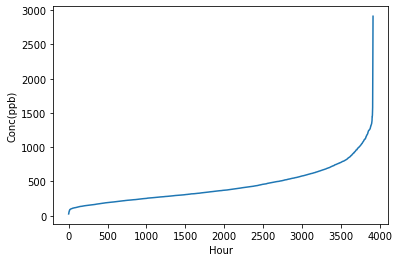

In [355]:
import matplotlib.pyplot as plt
Lab1=CO_Data['Lab1'].to_list()
Lab1=sorted(Lab1)
Ind=[i for i in range(len(Lab1))]
plt.plot(Ind,Lab1)
plt.xlabel('Hour')
plt.ylabel('Conc(ppb)')

In [356]:
A=[]
for i in range(len(WE)):
    if WE[i]>1000:
        A.append(WE[i])
print(len(WE))
print(len(A))
#percentage of data points having WE>100
len(A)/len(WE)*100  

60204
0


0.0

In [357]:
Lab1=CO_Data['Lab1'].to_list()
Ref=CO_Data['Ref'].to_list()
max(Lab1), max(Ref)

(2911.798418313775, 2816.9534166666667)

In [358]:
import pandas as pd
import scipy.io
import numpy as np
data = pd.read_csv('O3.txt', header = None,low_memory=False)
data.columns=['AE','WE','Temp','RH','Time']
Time=data['Time'].to_list()
time=[]
for i in range(len(Time)):
    time.append(float(abs(Time[i])))
Time=np.array(time)
Date=pd.to_datetime(Time-719529,unit='d').round('s')
data['Date'] = Date.tolist()
data=data.set_index('Date')
data.drop('Time',axis = 1, inplace = True)
data=data.resample('5min').mean()
Data_O3=data
Data_O3['Ref']=Ref_O3
WE=Data_O3['WE'].to_list()
AE=Data_O3['AE'].to_list()
signal=np.array(WE)-np.array(AE)
Data_O3['Net Signal']=signal
Data_O3['Month']=Data_O3.index.month
Data_O3['Day_of_week']=Data_O3.index.dayofweek
Data_O3['Day']=Data_O3.index.day
Data_O3['Hour']=Data_O3.index.hour
O3_Data=Data_O3
O3_Data=O3_Data[(O3_Data[O3_Data.columns] >= 0).all(axis=1)]
O3_Data=O3_Data.dropna()
data = pd.read_csv('Conc_O3.txt', header = None,low_memory=False)
data.columns=['Lab1','Temp','RH','Time','Ref']
Time=data['Time'].to_list()
time=[]
for i in range(len(Time)):
    time.append(float(abs(Time[i])))
Time=np.array(time)
Date=pd.to_datetime(Time-719529,unit='d').round('s')
data['Date'] = Date.tolist()
data=data.set_index('Date')
data.drop('Time',axis = 1, inplace = True)
data=data.resample('5min').mean()
Data_O3=data
signal=np.array(WE)-np.array(AE)
Data_O3['Net Signal']=signal
Data_O3['Month']=Data_O3.index.month
Data_O3['Day_of_week']=Data_O3.index.dayofweek
Data_O3['Day']=Data_O3.index.day
Data_O3['Hour']=Data_O3.index.hour
O3_Data=Data_O3
O3_Data=O3_Data[(O3_Data[O3_Data.columns] >= 0).all(axis=1)]
O3_Data=O3_Data.dropna() 
O3_Data=O3_Data.resample('h').mean()
O3_Data=O3_Data.dropna()
O3_Data.head()

ref_O3=Data_O3['Ref'].to_list()
len(ref_O3)

60913

In [359]:
import pandas as pd
import scipy.io
import numpy as np
data = pd.read_csv('NO2.txt', header = None,low_memory=False)
data.columns=['WE','AE','Temp','RH','Time']
Time=data['Time'].to_list()
time=[]
for i in range(len(Time)):
    time.append(float(abs(Time[i])))
Time=np.array(time)
Date=pd.to_datetime(Time-719529,unit='d').round('s')
data['Date'] = Date.tolist()
data=data.set_index('Date')
data.drop('Time',axis = 1, inplace = True)
data=data.resample('5min').mean()
Data_NO2=data
Data_NO2['Ref']=Ref_NO2
WE=Data_NO2['WE'].to_list()
AE=Data_NO2['AE'].to_list()
signal=np.array(WE)-np.array(AE)
Data_NO2['Net Signal']=signal
Data_NO2['Month']=Data_NO2.index.month
Data_NO2['Day_of_week']=Data_NO2.index.dayofweek
Data_NO2['Day']=Data_NO2.index.day
Data_NO2['Hour']=Data_NO2.index.hour
NO2_Data=Data_NO2
NO2_Data=NO2_Data[(NO2_Data[NO2_Data.columns] >= 0).all(axis=1)]
NO2_Data=NO2_Data.dropna()
data = pd.read_csv('Conc_NO2.txt', header = None,low_memory=False)
data.columns=['Lab1','Temp','RH','Time','Ref']
Time=data['Time'].to_list()
time=[]
subscript = str.maketrans("0123456789", "₀₁₂₃₄₅₆₇₈₉") 
for i in range(len(Time)):
    time.append(float(abs(Time[i])))
Time=np.array(time)
Date=pd.to_datetime(Time-719529,unit='d').round('s')
data['Date'] = Date.tolist()
data=data.set_index('Date')
data.drop('Time',axis = 1, inplace = True)
data=data.resample('5min').mean()
Data_NO2=data
signal=np.array(WE)-np.array(AE)
Data_NO2['Net Signal']=signal
Data_NO2['Month']=Data_NO2.index.month
Data_NO2['Day_of_week']=Data_NO2.index.dayofweek
Data_NO2['Day']=Data_NO2.index.day
Data_NO2['Hour']=Data_NO2.index.hour
Data_NO2['Ref_O3']=ref_O3
NO2_Data=Data_NO2
NO2_Data=NO2_Data[(NO2_Data[NO2_Data.columns] >= 0).all(axis=1)]
NO2_Data=NO2_Data.dropna()
NO2_Data=NO2_Data.resample('h').mean()
NO2_Data=NO2_Data.dropna()
NO2_Data.head()

,Lab1,Temp,RH,Ref,Net Signal,Month,Day_of_week,Day,Hour,Ref_O3
Date,,,,,,,,,,
2019-10-02 11:00:00,460.448301,26.378438,58.063437,15.230400,7.850000,10.0,2.0,2.0,11.0,46.094860
2019-10-02 12:00:00,557.247199,25.795055,48.256857,5.384051,21.081422,10.0,2.0,2.0,12.0,57.532808
2019-10-02 15:00:00,566.301152,30.418466,50.153181,10.084125,9.323533,10.0,2.0,2.0,15.0,40.068225
2019-10-03 15:00:00,84.482370,29.421250,52.411845,12.621282,22.596524,10.0,3.0,3.0,15.0,33.473237
2019-10-03 16:00:00,116.263856,29.211333,53.102667,9.592208,30.194000,10.0,3.0,3.0,16.0,33.052590


In [360]:
NO2_Data.describe()

,Lab1,Temp,RH,Ref,Net Signal,Month,Day_of_week,Day,Hour,Ref_O3
count,3778.000000,3778.000000,3778.000000,3778.000000,3778.000000,3778.000000,3778.000000,3778.000000,3778.000000,3778.000000
mean,32.369433,16.665607,68.585431,18.298128,24.669951,6.741133,2.998941,16.359185,11.605876,19.917912
std,30.081560,6.889609,17.529578,11.777633,5.163356,4.421553,2.014377,8.204618,7.073317,15.229551
min,0.246114,1.090134,17.892528,1.049403,0.113374,1.000000,0.000000,1.000000,0.000000,0.172461
25%,16.118844,11.448560,56.474780,9.382695,22.512694,3.000000,1.000000,10.000000,5.000000,4.614562
50%,24.561208,15.241507,73.893953,16.235042,24.751935,10.000000,3.000000,17.000000,12.000000,18.685263
75%,39.269840,20.769966,82.806300,24.893655,27.625950,11.000000,5.000000,23.000000,18.000000,31.830529
max,566.301152,40.387622,92.541723,77.205454,55.133797,12.000000,6.000000,31.000000,23.000000,61.790648


In [361]:
import pandas as pd
import scipy.io
import numpy as np
data = pd.read_csv('O3.txt', header = None,low_memory=False)
data.columns=['AE','WE','Temp','RH','Time']
Time=data['Time'].to_list()
time=[]
for i in range(len(Time)):
    time.append(float(abs(Time[i])))
Time=np.array(time)
Date=pd.to_datetime(Time-719529,unit='d').round('s')
data['Date'] = Date.tolist()
data=data.set_index('Date')
data.drop('Time',axis = 1, inplace = True)
data=data.resample('5min').mean()
Data_O3=data
Data_O3['Ref']=Ref_O3
WE=Data_O3['WE'].to_list()
AE=Data_O3['AE'].to_list()
signal=np.array(WE)-np.array(AE)
Data_O3['Net Signal']=signal
Data_O3['Month']=Data_O3.index.month
Data_O3['Day_of_week']=Data_O3.index.dayofweek
Data_O3['Day']=Data_O3.index.day
Data_O3['Hour']=Data_O3.index.hour
O3_Data=Data_O3
O3_Data=O3_Data[(O3_Data[O3_Data.columns] >= 0).all(axis=1)]
O3_Data=O3_Data.dropna()
data = pd.read_csv('Conc_O3.txt', header = None,low_memory=False)
data.columns=['Lab1','Temp','RH','Time','Ref']
Time=data['Time'].to_list()
time=[]
for i in range(len(Time)):
    time.append(float(abs(Time[i])))
Time=np.array(time)
Date=pd.to_datetime(Time-719529,unit='d').round('s')
data['Date'] = Date.tolist()
data=data.set_index('Date')
data.drop('Time',axis = 1, inplace = True)
data=data.resample('5min').mean()
Data_O3=data
signal=np.array(WE)-np.array(AE)
Data_O3['Net Signal']=signal
Data_O3['Month']=Data_O3.index.month
Data_O3['Day_of_week']=Data_O3.index.dayofweek
Data_O3['Day']=Data_O3.index.day
Data_O3['Hour']=Data_O3.index.hour
ref_NO2=Data_NO2['Ref'].to_list()
Data_O3['Ref_NO2']=ref_NO2
O3_Data=Data_O3
O3_Data=O3_Data[(O3_Data[O3_Data.columns] >= 0).all(axis=1)]
O3_Data=O3_Data.dropna()
O3_Data=O3_Data.resample('h').mean()
O3_Data=O3_Data.dropna()
O3_Data.head()

,Lab1,Temp,RH,Ref,Net Signal,Month,Day_of_week,Day,Hour,Ref_NO2
Date,,,,,,,,,,
2019-10-02 11:00:00,621.625704,26.378438,58.063437,46.094860,3.605625,10.0,2.0,2.0,11.0,15.230400
2019-10-02 12:00:00,725.154408,25.795055,48.256857,57.532808,13.865109,10.0,2.0,2.0,12.0,5.384051
2019-10-07 10:00:00,108.196313,32.344264,37.260757,47.259008,11.447809,10.0,0.0,7.0,10.0,4.255772
2019-10-07 11:00:00,135.822676,34.926112,35.013036,42.114260,10.075221,10.0,0.0,7.0,11.0,16.268034
2019-10-07 12:00:00,203.757758,36.201221,31.829282,45.701366,7.624153,10.0,0.0,7.0,12.0,12.770444


In [362]:
O3_Data.describe()

,Lab1,Temp,RH,Ref,Net Signal,Month,Day_of_week,Day,Hour,Ref_NO2
count,3534.000000,3534.000000,3534.000000,3534.000000,3534.000000,3534.000000,3534.000000,3534.000000,3534.000000,3534.000000
mean,62.998044,16.211868,69.541352,19.062804,8.628329,6.631296,3.014997,16.434635,11.211941,18.031205
std,42.648178,6.764011,17.390966,14.810174,4.258758,4.488264,2.017487,8.210960,7.153136,11.199430
min,0.181748,1.090134,17.453750,0.172461,0.006176,1.000000,0.000000,1.000000,0.000000,1.049403
25%,36.720283,11.235585,58.971792,4.087227,5.605329,2.000000,1.000000,10.000000,5.000000,9.508828
50%,54.256345,14.829747,75.024188,17.680337,8.978720,4.000000,3.000000,17.000000,11.000000,16.201703
75%,79.547016,19.961613,83.201432,30.739694,11.782109,11.000000,5.000000,23.000000,18.000000,24.707873
max,725.154408,40.535256,92.541723,61.790648,26.354311,12.000000,6.000000,31.000000,23.000000,61.757666


In [363]:
#Ref=CO_Data['Ref'].to_list()
#CO_Data=CO_Data[CO_Data.Ref.between(np.mean(Ref)-0.7*np.std(Ref), np.mean(Ref)+0.7*np.std(Ref))]
#CO_Data.shape

In [364]:
from scipy import stats

In [365]:
SUB = str.maketrans("0123456789", "₀₁₂₃₄₅₆₇₈₉")
SUP = str.maketrans("0123456789", "⁰¹²³⁴⁵⁶⁷⁸⁹")

# OPC DATA

In [366]:
import pandas as pd
import numpy as np
R1_data= pd.read_csv('R1_data.csv')
R1_data.columns=['Sen_2.5','Sen_10','Ref_2.5','Ref_10','Time','T','RH']
R1_data=R1_data.dropna()
Time=R1_data['Time'].to_list()
time=[]
for i in range(len(Time)):
    time.append(float(abs(Time[i])))
Time=np.array(time)
Date=pd.to_datetime(Time-719529,unit='d').round('s')
R1_data['Date'] = Date.tolist()
R1_data=R1_data.set_index('Date')
R1_data.drop('Time',axis = 1, inplace = True)
R1_data['Month']=R1_data.index.month
R1_data['Day_of_week']=R1_data.index.dayofweek
R1_data['Hour']=R1_data.index.hour
R1_data=R1_data.resample('10min').mean()
R1_data=R1_data.dropna()
R1_data.head()

,Sen_2.5,Sen_10,Ref_2.5,Ref_10,T,RH,Month,Day_of_week,Hour
Date,,,,,,,,,
2019-10-02 11:50:00,112.477418,112.477418,18.583300,32.754810,26.378438,58.063437,10.0,2.0,11.0
2019-10-02 12:10:00,9.696690,40.138927,17.201155,31.342380,25.652438,48.442262,10.0,2.0,12.0
2019-10-02 12:20:00,68.966260,81.577428,16.845975,30.682855,25.813062,53.801740,10.0,2.0,12.0
2019-10-02 15:40:00,7.471156,44.234396,19.076640,35.864505,30.589409,49.682787,10.0,2.0,15.0
2019-10-03 15:50:00,9.744537,144.047407,17.341335,29.977575,29.364176,52.513747,10.0,3.0,15.0


In [367]:
import pandas as pd
import numpy as np
N3_data= pd.read_csv('N3_data.csv')
N3_data.columns=['Sen_2.5','Sen_10','Ref_2.5','Ref_10','Time','T','RH']
N3_data=N3_data.dropna()
Time=N3_data['Time'].to_list()
time=[]
for i in range(len(Time)):
    time.append(float(abs(Time[i])))
Time=np.array(time)
Date=pd.to_datetime(Time-719529,unit='d').round('s')
N3_data['Date'] = Date.tolist()
N3_data=N3_data.set_index('Date')
N3_data.drop('Time',axis = 1, inplace = True)
N3_data['Month']=N3_data.index.month
N3_data['Day_of_week']=N3_data.index.dayofweek
N3_data['Hour']=N3_data.index.hour
N3_data=N3_data.resample('10min').mean()
N3_data=N3_data.dropna()
N3_data.head()

,Sen_2.5,Sen_10,Ref_2.5,Ref_10,T,RH,Month,Day_of_week,Hour
Date,,,,,,,,,
2019-10-02 12:00:00,7.972913,17.284141,17.700490,31.956415,24.827483,64.382667,10.0,2.0,12.0
2019-10-02 12:10:00,4.448633,10.763524,17.201155,31.342380,25.074930,54.874831,10.0,2.0,12.0
2019-10-02 12:20:00,3.378485,17.141379,17.062410,31.074470,25.445921,54.380000,10.0,2.0,12.0
2019-10-02 15:40:00,4.223667,13.522096,19.076640,35.864505,30.180843,55.684552,10.0,2.0,15.0
2019-10-02 15:50:00,4.301400,16.168827,19.210635,34.961880,30.316215,55.095438,10.0,2.0,15.0


# Outlier detection and removal

In [368]:
import numpy as np

import pandas as pd   
import seaborn as sns
from scipy import stats

((3773, 9), (3914, 9))

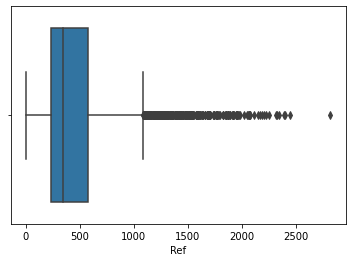

In [369]:
sns.boxplot(x=CO_Data['Ref'])
z=np.abs(stats.zscore(CO_Data))
CO_data=CO_Data[(z < 3).all(axis=1)]
CO_data.shape,CO_Data.shape

In [370]:
def MBE(pred,true):
    true=np.array(true)
    pred=np.array(pred)
    mbe=np.mean(pred-true)
    return mbe
def CRMSE(pred,true):
    true=np.array(true)
    pred=np.array(pred)
    R=round(np.corrcoef(true, pred)[0, 1],2)
    #crmse=np.sqrt(np.mean(((true-np.mean(true))-(pred-np.mean(pred)))**2))
    crmse=np.sqrt((np.std(true))**2+(np.std(pred))**2-(2*R*np.std(true)*np.std(pred)))
    if np.std(pred)>np.std(true):
        crmse=crmse
    else:
        crmse=-crmse
    return crmse

In [371]:
def REF2(pred,y_test,alpha):
    cal=np.array(pred)
    ref=np.array(y_test.to_list())
    ref_mean=np.mean(ref)
    cal_mean=np.mean(cal)
    #cal=np.log(cal)
    #ref=np.log(ref)
    sx_s=(1/len(ref))*sum((ref-ref_mean)**2)
    sy_s=(1/len(cal))*sum((cal-cal_mean)**2)
    sxy=(1/len(cal))*sum((cal-cal_mean)*(ref-ref_mean))
    beta_1=((sy_s-sx_s)+np.sqrt((sy_s-sx_s)**2+4*sxy**2))/(2*sxy)
    beta_0=cal_mean-beta_1*ref_mean
    RSS=sum((cal-beta_0-beta_1*ref)**2-(beta_1**2+alpha)*(4+0.0049*ref**2))
    du_s=RSS/(len(cal)-2)
    Beta_1=((sy_s-sx_s-du_s)+np.sqrt((sy_s-sx_s-du_s)**2+4*sxy**2))/(2*sxy)
    Beta_0=cal_mean-Beta_1*ref_mean
    u_cal=((2*np.sqrt((RSS/(len(cal)-2))+(-2*Beta_1**2+2*Beta_1-1)*(4+0.0049*1000**2)+
                      (Beta_0+(Beta_1-1)*1000)**2))/(beta_0+beta_1*1000))*100
    #u_cal=((2*np.sqrt((RSS/(len(cal)-2))+(1-(beta_1-1)**2)*(4+0.0049*30000**2)+
                      #(Beta_0+(Beta_1-1)*30000)**2))/(beta_0+beta_1*30000))*100
    return u_cal  

In [372]:
def REF10(pred,y_test,alpha):
    import random
    cal=np.array(pred)
    ref=np.array(y_test.to_list())
    ref_mean=np.mean(ref)
    cal_mean=np.mean(cal)
    prec=np.array([20 for i in range(len(ref))])
    u=np.maximum(prec,0.001*ref)
    u=0.001*ref
    #cal=np.log(cal)
    #ref=np.log(ref)
    sx_s=(1/len(ref))*sum((ref-ref_mean)**2)
    sy_s=(1/len(cal))*sum((cal-cal_mean)**2)
    sxy=(1/len(cal))*sum((cal-cal_mean)*(ref-ref_mean))
    beta_1=((sy_s-alpha*sx_s)+np.sqrt((sy_s-sx_s)**2+4*alpha*sxy**2))/(2*sxy)
    beta_0=cal_mean-beta_1*ref_mean
    RSS=sum((cal-beta_0-beta_1*ref)**2-(beta_1**2+alpha)*u**2)
    du_s=RSS/(len(cal)-2)
    Beta_1=((sy_s-alpha*sx_s-du_s)+np.sqrt((sy_s-alpha*sx_s-du_s)**2+4*alpha*sxy**2))/(2*sxy)
    Beta_0=cal_mean-Beta_1*ref_mean
    P1=(RSS/(len(cal)-2))
    #P2=(Beta_1**2+alpha)*u**2+(-2*Beta_1**2+2*Beta_1-1)*u**2
    P2=-(u**2)
    P3=(Beta_0+(Beta_1-1)*ref)**2
    P=[]
    for i in range(len(P3)):
        P.append(P1+P2[i]+P3[i])
    U1=[]
    Ref=[]
    for i in range(len(P)):
        if P[i]>=0:
            U1.append(P[i])
            Ref.append(ref[i])
    #for i in range(len(P)):
        #if P[i]<0:
           # P[i]=np.mean(P1)
    u_cal_s=np.array(U1)
    return u_cal_s,Ref

In [373]:
#Ref=CO_Data['Ref'].to_list()
#CO_Data=CO_Data[CO_Data.Ref.between(np.mean(Ref)-1*np.std(Ref), np.mean(Ref)+1*np.std(Ref))]
#NO2_Data.shape

In [374]:
import numpy as np
from scipy.stats import chi2
p = np.array([ 0.9])
df=np.array(range(1,10000))
chi = [0]+list(chi2.isf(p, df))

In [375]:
import scipy.stats

#find T critical value
scipy.stats.t.ppf(q=.95,df=100)

1.66023432606575

In [376]:
def precision(pred,true):
    pred=list(pred)
    true=list(true)
    for i in range(len(true)):
        if true[i]==0:
            true.pop(i)
            pred.pop(i)
    pred=np.array(pred)
    true=np.array(true)
    #d=((pred-true)/((true+pred)/2))*100
    d=((pred-true)/np.mean(true))*100
    n=len(pred)
    A=np.sqrt((n-1)/chi[n-1])
    cv=np.sqrt(((n*sum(abs(d)**2)-(sum(abs(d)))**2)/(2*n*(n-1))))*A
    return cv

In [377]:
def bias(pred,true):
    pred=list(pred)
    true=list(true)
    for i in range(len(true)):
        if true[i]==0:
            true.pop(i)
            pred.pop(i)
    pred=np.array(pred)
    true=np.array(true)
    #d=((pred-true)/((true+pred)/2))*100
    d=((pred-true)/np.mean(true))*100
    n=len(pred)
    AB=sum(abs(d))/n
    #AS=np.sqrt(((n*sum(abs(d)**2)-(sum(abs(d)))**2)/(n*(n-1))))
    AS=np.sqrt(sum((d-AB)**2)/(n-1))
    t=scipy.stats.t.ppf(q=.95,df=n-1)
    bias=AB+(t*AS/np.sqrt(n))
    return bias

In [378]:
R1_data.head()

,Sen_2.5,Sen_10,Ref_2.5,Ref_10,T,RH,Month,Day_of_week,Hour
Date,,,,,,,,,
2019-10-02 11:50:00,112.477418,112.477418,18.583300,32.754810,26.378438,58.063437,10.0,2.0,11.0
2019-10-02 12:10:00,9.696690,40.138927,17.201155,31.342380,25.652438,48.442262,10.0,2.0,12.0
2019-10-02 12:20:00,68.966260,81.577428,16.845975,30.682855,25.813062,53.801740,10.0,2.0,12.0
2019-10-02 15:40:00,7.471156,44.234396,19.076640,35.864505,30.589409,49.682787,10.0,2.0,15.0
2019-10-03 15:50:00,9.744537,144.047407,17.341335,29.977575,29.364176,52.513747,10.0,3.0,15.0


In [379]:
df1=[x for _, x in R1_data.groupby('Month')]
df1[5].head()

,Sen_2.5,Sen_10,Ref_2.5,Ref_10,T,RH,Month,Day_of_week,Hour
Date,,,,,,,,,
2019-12-01 00:00:00,8.927518,24.811771,12.745580,24.932510,14.378107,81.632621,12.0,6.0,0.0
2019-12-01 00:10:00,10.250226,36.142667,11.907145,24.962030,14.193146,81.982361,12.0,6.0,0.0
2019-12-01 00:20:00,10.807786,36.996737,11.296600,26.035790,13.979199,82.316990,12.0,6.0,0.0
2019-12-01 00:30:00,11.921177,41.960807,11.387815,29.161775,13.792731,82.666183,12.0,6.0,0.0
2019-12-01 00:40:00,9.053281,26.927253,12.459255,34.807555,13.612696,83.025903,12.0,6.0,0.0


In [380]:
df1=[x for _, x in R1_data.groupby('Month')]
data_oct=df1[3]
#data_oct=data_oct.sample(frac=1)
data_nov=df1[4]
#data_nov=data_nov.sample(frac=1)
data_dec=df1[5]
#data_dec=data_dec.sample(frac=1)
data_jan=df1[0]
#data_jan=data_jan.sample(frac=1)
data_feb=df1[1]
#data_feb=data_feb.sample(frac=1)
data_mar=df1[2]

data_Oct=data_oct.resample('20min').mean()
data_Oct=data_Oct.dropna()
data_Oct1=data_Oct[:int(0.8*data_Oct.shape[0])]
data_Oct2=data_Oct[int(0.8*data_Oct.shape[0]):]
data_Nov=data_nov.resample('20min').mean()
data_Nov=data_Nov.dropna()
data_Nov1=data_Nov[:int(0.8*data_Nov.shape[0])]
data_Nov2=data_Nov[int(0.8*data_Nov.shape[0]):]
data_Dec=data_dec.resample('20min').mean()
data_Dec=data_Dec.dropna()
data_Dec1=data_Dec[:int(0.8*data_Dec.shape[0])]
data_Dec2=data_Dec[int(0.8*data_Dec.shape[0]):]
data_Jan=data_jan.resample('20min').mean()
data_Jan=data_Jan.dropna()
data_Jan1=data_Jan[:int(0.8*data_Jan.shape[0])]
data_Jan2=data_Jan[int(0.8*data_Jan.shape[0]):]
data_Feb=data_feb.resample('20min').mean()
data_Feb=data_Feb.dropna()
data_Feb1=data_Feb[:int(0.8*data_Feb.shape[0])]
data_Feb2=data_Feb[int(0.8*data_Feb.shape[0]):]
data_Mar=data_mar.resample('20min').mean()
data_Mar=data_Mar.dropna()
data_Mar1=data_Mar[:int(0.8*data_Mar.shape[0])]
data_Mar2=data_Mar[int(0.8*data_Mar.shape[0]):]
frame1=[data_Oct1,data_Nov1,data_Dec1,data_Jan1,data_Feb1,data_Mar1]
frame2=[data_Oct2,data_Nov2,data_Dec2,data_Jan2,data_Feb2,data_Mar2]
CO_data1=pd.concat(frame1)
CO_data2=pd.concat(frame2)
R1_data=pd.concat([CO_data1,CO_data2])

In [381]:
df1=[x for _, x in N3_data.groupby('Month')]
data_oct=df1[3]
#data_oct=data_oct.sample(frac=1)
data_nov=df1[4]
#data_nov=data_nov.sample(frac=1)
data_dec=df1[5]
#data_dec=data_dec.sample(frac=1)
data_jan=df1[0]
#data_jan=data_jan.sample(frac=1)
data_feb=df1[1]
#data_feb=data_feb.sample(frac=1)
data_mar=df1[2]

data_Oct=data_oct.resample('20min').mean()
data_Oct=data_Oct.dropna()
data_Oct1=data_Oct[:int(0.8*data_Oct.shape[0])]
data_Oct2=data_Oct[int(0.8*data_Oct.shape[0]):]
data_Nov=data_nov.resample('20min').mean()
data_Nov=data_Nov.dropna()
data_Nov1=data_Nov[:int(0.8*data_Nov.shape[0])]
data_Nov2=data_Nov[int(0.8*data_Nov.shape[0]):]
data_Dec=data_dec.resample('20min').mean()
data_Dec=data_Dec.dropna()
data_Dec1=data_Dec[:int(0.8*data_Dec.shape[0])]
data_Dec2=data_Dec[int(0.8*data_Dec.shape[0]):]
data_Jan=data_jan.resample('20min').mean()
data_Jan=data_Jan.dropna()
data_Jan1=data_Jan[:int(0.8*data_Jan.shape[0])]
data_Jan2=data_Jan[int(0.8*data_Jan.shape[0]):]
data_Feb=data_feb.resample('20min').mean()
data_Feb=data_Feb.dropna()
data_Feb1=data_Feb[:int(0.8*data_Feb.shape[0])]
data_Feb2=data_Feb[int(0.8*data_Feb.shape[0]):]
data_Mar=data_mar.resample('20min').mean()
data_Mar=data_Mar.dropna()
data_Mar1=data_Mar[:int(0.8*data_Mar.shape[0])]
data_Mar2=data_Mar[int(0.8*data_Mar.shape[0]):]
frame1=[data_Oct1,data_Nov1,data_Dec1,data_Jan1,data_Feb1,data_Mar1]
frame2=[data_Oct2,data_Nov2,data_Dec2,data_Jan2,data_Feb2,data_Mar2]
CO_data1=pd.concat(frame1)
CO_data2=pd.concat(frame2)
N3_data=pd.concat([CO_data1,CO_data2])

# R1 PM2.5 Calibration

## Model 1: Linear Regression

In [382]:
from sktime.performance_metrics.forecasting import sMAPE, smape_loss
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error as mae
import sklearn.metrics as sm
import matplotlib.pyplot as plt
#'Ref_NO2','Ref_SO2','Ref_O3',
#,'Month','Day_of_week','Day','Hour'
X=R1_data[['Sen_2.5','T','RH','Month','Day_of_week','Hour']]
y=R1_data['Ref_2.5']
X_train, X_test, y_train, y_test =train_test_split(X, y, test_size = 0.2,shuffle=False)
#train_test_split(X, y, test_size = 0.2)

In [383]:
lr = LinearRegression()
from sklearn.ensemble import RandomForestRegressor
  
 # create regressor object
regressor = RandomForestRegressor(n_estimators = 500,min_samples_split= 2,min_samples_leaf= 1,
                                  max_features= 'sqrt', 
                                  random_state = 0,max_depth=None,bootstrap=False)
  
# fit the regressor with x and y data
regressor=regressor.fit(X_train, y_train) 
pred = regressor.predict(X_test)
u_c_s=REF10(pred,y_test,1)[0]
X=np.array(REF10(pred,y_test,1)[1])**2
X=X.reshape((-1, 1))
model = lr.fit(X,u_c_s )
m_CO=model.coef_
q_CO=model.intercept_
m_CO,q_CO

LV=25
u_r=(np.sqrt(m_CO*y_test**2+q_CO)/y_test)*100
u_LV=(np.sqrt(m_CO*LV**2+q_CO)/LV)*100
T_LV=25
Beta=T_LV/u_LV
LQ,median, UQ=np.percentile(y_test, [25,50,75])
u_25=(np.sqrt(m_CO*LQ**2+q_CO)/LQ)*100
T_25=u_25*Beta
u_50=(np.sqrt(m_CO*median**2+q_CO)/median)*100
T_50=u_50*Beta
u_75=(np.sqrt(m_CO*UQ**2+q_CO)/UQ)*100
T_75=u_75*Beta
T_25,T_50,T_75

(array([34.50988527]), array([28.20378598]), array([25.49917423]))

In [384]:
lr = LinearRegression()
model = lr.fit(X_train, y_train)
pred = model.predict(X_test)
lab1=X_test['Sen_2.5'].to_list()
model=np.polyfit(lab1,y_test,1)
Lab1=model[0]*np.array(lab1)+model[1]
index=[i for i in range(len(y_test))]
Y_test=y_test.to_list()
Y_test=pd.Series(Y_test,index =index)
Y_test
Pred=pd.Series(pred,index =index)
Lab1=pd.Series(lab1,index =index)
sMAPE_lr=round(smape_loss(Y_test,Pred),2)
sMAPE_lab=round (smape_loss(Y_test,Lab1),2)
RMSE_lr=round(np.sqrt(sm.mean_squared_error(y_test, pred)),1)
RMSE_lab=round(np.sqrt(sm.mean_squared_error(y_test, lab1)),1)
Pearson_lr=round(np.corrcoef(y_test, pred)[0, 1],2)
Pearson_lab=round(np.corrcoef(y_test, lab1)[0, 1],2)
sMAPE_lr_CO=sMAPE_lr
RMSE_lr_CO=round(RMSE_lr/np.mean(np.array(y_test)),2)
Pearson_lr_CO=Pearson_lr
sMAPE_lab_CO=sMAPE_lab
RMSE_lab_CO=round(RMSE_lab/np.mean(np.array(lab1)),2)
Pearson_lab_CO=Pearson_lab
R2_lr_CO=round(sm.r2_score(y_test,pred), 2)
R2_lab_CO=round(sm.r2_score(y_test,Lab1), 2)
RMSE_Lr_CO=RMSE_lr
RMSE_Lab_CO=RMSE_lab
A=len(y_test)-200
D=max(y_test[A:])-0.2*max(y_test[A:])
C=max(y_test[A:])-0.1*max(y_test[A:])
B=120
Pearson_lr,RMSE_Lr_CO
R2_lab_CO

b_LAB_CO=np.round(bias( Lab1,y_test))
p_LAB_CO=np.round(precision( Lab1,y_test))
b_LR_CO=np.round(bias(pred,y_test))
p_LR_CO=np.round(precision(pred,y_test))
b_LAB_CO,p_LAB_CO,b_LR_CO,p_LR_CO,

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sktime/utils/validation/forecasting.py:120: FutureWarning:

pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sktime/utils/validation/forecasting.py:120: FutureWarning:

pandas.UInt64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sktime/utils/validation/forecasting.py:126: FutureWarning:

is_monotonic is deprecated and will be removed in a future version. Use is_monotonic_increasing instead.



(52.0, 33.0, 41.0, 30.0)

In [385]:
m0, b0 = np.polyfit(np.array(lab1),np.array(y_test), 1)
Lab=b0+m0*np.array(lab1)
R2_lab_CO=round(sm.r2_score(y_test,Lab), 2)
R2_lab_CO

0.41

fig= plt.figure(figsize=(8,6))
index=[i for i in range(1,201)]
ax = fig.add_subplot(111)
ax.patch.set_facecolor('lightblue')
ax.patch.set_alpha(0.2)
plt.plot(index,y_test[A:], color='limegreen',linewidth=3)
plt.plot(index,pred[A:], color='#513e00',linewidth=3)
plt.plot(index,lab1[A:], color='#426eff',linewidth=3)
plt.legend(['Ref', 'LR-Calibrated', 'Lab-Calibrated'], loc = 2, bbox_to_anchor = (0.74,1))
plt.ylabel('CO Concentration(ppb)',fontsize=18)
#plt.text(B-20, C, r'$R^{2}(LR)=$'+str(R2_lr_CO), fontsize = 14, color='#513e00')
#plt.text(B-20, D, r'$R^{2}(Lab)=$' +str(R2_lab_CO), fontsize = 14, color='#426eff')
#plt.text(B-70, C, 'Pearson r(LR)='+str(Pearson_lr), fontsize = 14, color='#513e00')
#plt.text(B-70, D, 'Pearson r(Lab)='+str(Pearson_lab), fontsize = 14, color='#426eff')
#plt.xlabel('Last 200 hours of testing period',fontsize=18)
#plt.title('Visualization: Linear Regression Calibration vs Laboratory Calibration',fontsize=18)
plt.grid(linestyle='-.',linewidth=0.3)
plt.show()

In [386]:
print("Regressor model performance:")
print("Mean absolute error(MAE) =", round(sm.mean_absolute_error(y_test, pred), 2))
print("Mean squared error(MSE) =", round(sm.mean_squared_error(y_test, pred), 2))
print("Median absolute error =", round(sm.median_absolute_error(y_test, pred), 2))
print("Explain variance score =", round(sm.explained_variance_score(y_test, pred), 2))
print("R2 score =", round(sm.r2_score(y_test, pred), 2))
pred_lr=pred
MBE_LR_CO=MBE(pred,y_test)/np.std(y_test)
CRMSE_LR_CO=CRMSE(pred,y_test)/np.std(y_test)
MBE_LAB_CO=MBE(lab1,y_test)/np.std(y_test)
CRMSE_LAB_CO=CRMSE(lab1,y_test)/np.std(y_test)

Regressor model performance:
Mean absolute error(MAE) = 7.03
Mean squared error(MSE) = 103.92
Median absolute error = 5.19
Explain variance score = 0.41
R2 score = 0.38


In [387]:
MBE_LAB_CO,CRMSE_LAB_CO

(-0.46675115046935084, -0.7931845558184485)

In [388]:
from sklearn.linear_model import ElasticNet, Lasso,  BayesianRidge, LassoLarsIC
from sklearn.ensemble import RandomForestRegressor,  GradientBoostingRegressor
from sklearn.kernel_ridge import KernelRidge
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import RobustScaler
from sklearn.base import BaseEstimator, TransformerMixin, RegressorMixin, clone
from sklearn.model_selection import KFold, cross_val_score, train_test_split
from sklearn.metrics import mean_squared_error
import xgboost as xgb
import lightgbm as lgb

# MPC

# Constant u_r

In [389]:
#1. Constant U_r
A=np.sqrt((1/len(y_test))*sum((np.array(y_test)-np.array(pred))**2))
u=0.25
u_r=np.sqrt((1/len(y_test))*sum((u*np.array(y_test))**2))
#u_r=np.sqrt((1/len(y_test))*sum(0.014*np.array(y_test)**2+11.52))
A=np.sqrt((1/len(y_test))*sum((np.array(y_test)-np.array(pred))**2))
MPC_RMSE_CO_LR=A/(2*u_r)
MPC_NMB_CO_LR=(2*u_r)/np.mean(y_test)
MPC_NMSD_CO_LR=(2*u_r)/np.std(y_test)
MPC_R_CO_LR=1-2*(u_r/np.std(y_test))**2
NMB=abs((np.mean(pred)-np.mean(y_test))/np.mean(y_test))
NMSD=abs((np.std(pred)-np.std(y_test))/np.std(y_test))
R=round(np.corrcoef(y_test, pred)[0, 1],2)
RMSE_CO_LR=MPC_RMSE_CO_LR
NMB_CO_LR=NMB/MPC_NMB_CO_LR
NMSD_CO_LR=NMSD/MPC_NMSD_CO_LR
R_CO_LR=MPC_R_CO_LR/R
#RMSE_NO2_LR,NMB_NO2_LR,NMSD_NO2_LR,R_NO2_LR
Bias_U_LR_CO=MBE(pred,y_test)/(2*u_r)
CRMSE_U_LR_CO=CRMSE(y_test,pred)/(2*u_r)

# 2. Variable U_r
u_r1=np.sqrt((1/len(y_test))*2*sum(m_CO*y_test**2+q_CO))
Bias1_U_LR_CO=MBE(pred,y_test)/(2*u_r1)
CRMSE1_U_LR_CO=CRMSE(y_test,pred)/(2*u_r1)
np.sqrt(Bias1_U_LR_CO**2+CRMSE1_U_LR_CO**2)
R_LR_CO=R
U_d_LR_CO=u_r/np.std(y_test)
U_d_LR1_CO=u_r1/np.std(y_test)
Mean_CO=np.mean(y_test)
Mean_LR_CO=np.mean(pred)
u_r_CO=(m_CO*y_test**2+q_CO)/y_test
NMSD_LR_CO=((np.std(pred)-np.std(y_test))/np.std(y_test))*100

In [390]:
lab=X_test['Sen_2.5'].to_list()
A=np.sqrt((1/len(y_test))*sum((np.array(y_test)-np.array(lab))**2))
u=0.25
u_r=np.sqrt((1/len(y_test))*sum((u*np.array(y_test))**2))
#u_r=np.sqrt((1/len(y_test))*sum(0.014*np.array(y_test)**2+11.52))
A=np.sqrt((1/len(y_test))*sum((np.array(y_test)-np.array(lab))**2))
MPC_RMSE_CO_LAB=A/(2*u_r)
MPC_NMB_CO_LAB=(2*u_r)/np.mean(y_test)
MPC_NMSD_CO_LAB=(2*u_r)/np.std(y_test)
MPC_R_CO_LAB=1-2*(u_r/np.std(y_test))**2
NMB=abs((np.mean(lab)-np.mean(y_test))/np.mean(y_test))
NMSD=abs((np.std(lab)-np.std(y_test))/np.std(y_test))
R=round(np.corrcoef(y_test, lab)[0, 1],2)
RMSE_CO_LAB=MPC_RMSE_CO_LAB
NMB_CO_LAB=NMB/MPC_NMB_CO_LAB
NMSD_CO_LAB=NMSD/MPC_NMSD_CO_LAB
R_CO_LAB=MPC_R_CO_LAB/R
#RMSE_NO2_LR,NMB_NO2_LR,NMSD_NO2_LR,R_NO2_LR
Bias_U_LAB_CO=MBE(lab,y_test)/(2*u_r)
CRMSE_U_LAB_CO=CRMSE(y_test,lab)/(2*u_r)

# 2. Variable U_r
u_r1=np.sqrt((1/len(y_test))*2*sum(m_CO*y_test**2+q_CO))
Bias1_U_LAB_CO=MBE(lab,y_test)/(2*u_r1)
CRMSE1_U_LAB_CO=CRMSE(y_test,lab)/(2*u_r1)
np.sqrt(Bias1_U_LAB_CO**2+CRMSE1_U_LAB_CO**2)
R_LAB_CO=R
U_d_LAB_CO=u_r/np.std(y_test)
U_d_LAB1_CO=u_r1/np.std(y_test)
Mean_CO=np.mean(y_test)
Mean_LAB_CO=np.mean(lab)
u_r_CO=(m_CO*y_test**2+q_CO)/y_test
NMSD_LAB_CO=((np.std(lab)-np.std(y_test))/np.std(y_test))*100

## Model 2 :  Support Vector Regression (SVR)

In [391]:
from sklearn.svm import SVR
from sklearn.preprocessing import StandardScaler
regressor = SVR(kernel = 'linear', C=1,epsilon=1)
regressor.fit(X_train, y_train)
pred = regressor.predict(X_test)
for i in range(len(Pred)):
    if pred[i]<0:
        pred[i]=np.mean(np.array(pred))
pred_svr=pred

In [392]:
Index=[i for i in range(len(y_test))]
Y_test=y_test.to_list()
Y_test=pd.Series(Y_test,index =Index)
Y_test
Pred=pd.Series(pred,index =Index)

Lab1=pd.Series(lab1,index =Index)
sMAPE_lr=round(smape_loss(Y_test,Pred),2)
sMAPE_lab=round (smape_loss(Y_test,Lab1),2)
RMSE_lr=round(np.sqrt(sm.mean_squared_error(y_test, pred)),1)
RMSE_lab=round(np.sqrt(sm.mean_squared_error(y_test, lab1)),1)
Pearson_lr=round(np.corrcoef(y_test, pred)[0, 1],2)
Pearson_lab=round(np.corrcoef(y_test, lab1)[0, 1],2)
sMAPE_svr_CO=sMAPE_lr
RMSE_svr_CO=round(RMSE_lr/np.mean(np.array(y_test)),2)
Pearson_svr_CO=Pearson_lr
R2_svr_CO=round(sm.r2_score(y_test, pred), 2)
RMSE_Svr_CO=RMSE_lr

b_SVR_CO=np.round(bias( pred,y_test))
p_SVR_CO=np.round(precision(pred,y_test))

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sktime/utils/validation/forecasting.py:120: FutureWarning:

pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sktime/utils/validation/forecasting.py:120: FutureWarning:

pandas.UInt64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sktime/utils/validation/forecasting.py:126: FutureWarning:

is_monotonic is deprecated and will be removed in a future version. Use is_monotonic_increasing instead.



fig= plt.figure(figsize=(8,6))
ax = fig.add_subplot(111)
ax.patch.set_facecolor('lightblue')
ax.patch.set_alpha(0.3)
plt.plot(index,y_test[A:], color='limegreen',linewidth=3)
plt.plot(index,pred[A:], color='brown',linewidth=3)
plt.plot(index,lab1[A:], color='#426eff',linewidth=3)
plt.legend(['Ref', 'SVR-Calibrated', 'Lab-Calibrated'], loc = 2, bbox_to_anchor = (0.74,1))
plt.ylabel('CO Concentration(ppb)',fontsize=18)
#plt.text(B-20, C,r'$R^{2}(SVR)=$'+str(R2_svr_CO) , fontsize = 14, color='brown')
#plt.text(B-20, D,r'$R^{2}(Lab)=$'+str(R2_lab_CO) , fontsize = 14, color='#426eff')
#plt.text(B-70, C, 'Pearson r(SVR)='+str(Pearson_lr), fontsize = 14, color='brown')
#plt.text(B-70, D, 'Pearson r(Lab)='+str(Pearson_lab), fontsize = 14, color='#426eff')
#plt.xlabel('Last 200 hours of testing period',fontsize=18)
#plt.title('Visualization: Support Vector Regression (SVR) Calibration vs Laboratory Calibration',fontsize=18)
plt.grid(linestyle='-.',linewidth=0.3)
plt.show()

In [393]:
print("Regressor model performance:")
print("Mean absolute error(MAE) =", round(sm.mean_absolute_error(y_test, pred), 2))
print("Mean squared error(MSE) =", round(sm.mean_squared_error(y_test, pred), 2))
print("Median absolute error =", round(sm.median_absolute_error(y_test, pred), 2))
print("Explain variance score =", round(sm.explained_variance_score(y_test, pred), 2))
print("R2 score =", round(sm.r2_score(y_test, pred), 2))
pred_svr=pred
MBE_SVR_CO=MBE(pred,y_test)/np.std(y_test)
CRMSE_SVR_CO=CRMSE(pred,y_test)/np.std(y_test)

Regressor model performance:
Mean absolute error(MAE) = 6.75
Mean squared error(MSE) = 110.34
Median absolute error = 4.27
Explain variance score = 0.35
R2 score = 0.34


In [394]:
slope, intercept, r, p, std_err = stats.linregress(pred, y_test)
slope, intercept, r, p, std_err

(0.7242361147860035,
 4.000134399182235,
 0.6375612918697763,
 1.0041094157859146e-200,
 0.020907747839807058)

# MPC

In [395]:
#1. Constant U_r
A=np.sqrt((1/len(y_test))*sum((np.array(y_test)-np.array(pred))**2))
u=0.25
u_r=np.sqrt((1/len(y_test))*sum((u*np.array(y_test))**2))
#u_r=np.sqrt((1/len(y_test))*sum(0.014*np.array(y_test)**2+11.52))
A=np.sqrt((1/len(y_test))*sum((np.array(y_test)-np.array(pred))**2))
MPC_RMSE_CO_SVR=A/(2*u_r)
MPC_NMB_CO_SVR=(2*u_r)/np.mean(y_test)
MPC_NMSD_CO_SVR=(2*u_r)/np.std(y_test)
MPC_R_CO_SVR=1-2*(u_r/np.std(y_test))**2
NMB=abs((np.mean(pred)-np.mean(y_test))/np.mean(y_test))
NMSD=abs((np.std(pred)-np.std(y_test))/np.std(y_test))
R=round(np.corrcoef(y_test, pred)[0, 1],2)
RMSE_CO_SVR=MPC_RMSE_CO_SVR
NMB_CO_SVR=NMB/MPC_NMB_CO_SVR
NMSD_CO_SVR=NMSD/MPC_NMSD_CO_SVR
R_CO_SVR=MPC_R_CO_SVR/R
#RMSE_NO2_LR,NMB_NO2_LR,NMSD_NO2_LR,R_NO2_LR
Bias_U_SVR_CO=MBE(pred,y_test)/(2*u_r)
CRMSE_U_SVR_CO=CRMSE(y_test,pred)/(2*u_r)

# 2. Variable U_r
u_r1=np.sqrt((1/len(y_test))*2*sum(m_CO*y_test**2+q_CO))
Bias1_U_SVR_CO=MBE(pred,y_test)/(2*u_r1)
CRMSE1_U_SVR_CO=CRMSE(y_test,pred)/(2*u_r1)
np.sqrt(Bias1_U_SVR_CO**2+CRMSE1_U_SVR_CO**2)
R_SVR_CO=R
U_d_SVR_CO=u_r/np.std(y_test)
U_d_SVR1_CO=u_r1/np.std(y_test)
Mean_SVR_CO=np.mean(pred)
NMSD_SVR_CO=((np.std(pred)-np.std(y_test))/np.std(y_test))*100

## Model 3 : Random Forest

In [396]:
from sklearn.ensemble import RandomForestRegressor
  
 # create regressor object
regressor = RandomForestRegressor(n_estimators = 500,min_samples_split= 2,min_samples_leaf= 1,max_features= 'sqrt', 
                                  random_state = 0,max_depth=None,bootstrap=False)
  
  
# fit the regressor with x and y data
regressor=regressor.fit(X_train, y_train) 


In [397]:
features_CO=regressor.feature_importances_
pred = regressor.predict(X_test)
pred_rf_co=pred
for i in range(len(pred)):
    if pred[i]<0:
        pred[i]=np.mean(pred)
Index=[i for i in range(len(y_test))]
Y_test=y_test.to_list()
Y_test=pd.Series(Y_test,index =Index)
Y_test
Pred=pd.Series(pred,index =Index)
Lab1=pd.Series(lab1,index =Index)
sMAPE_lr=round(smape_loss(Y_test,Pred),2)
sMAPE_lab=round (smape_loss(Y_test,Lab1),2)
RMSE_lr=round(np.sqrt(sm.mean_squared_error(y_test, pred)),1)
RMSE_lab=round(np.sqrt(sm.mean_squared_error(y_test, lab1)),1)
Pearson_lr=round(np.corrcoef(y_test, pred)[0, 1],2)
Pearson_lab=round(np.corrcoef(y_test, lab1)[0, 1],2)
sMAPE_rf_CO=sMAPE_lr
RMSE_rf_CO=round(RMSE_lr/np.mean(np.array(y_test)),2)
Pearson_rf_CO=Pearson_lr
R2_rf_CO=round(sm.r2_score(y_test, pred), 2)
RMSE_Rf_CO=RMSE_lr
R2_rf_CO

b_RF_CO=np.round(bias(pred,y_test))
p_RF_CO=np.round(precision(pred,y_test))
b_RF_CO,p_RF_CO

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sktime/utils/validation/forecasting.py:120: FutureWarning:

pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sktime/utils/validation/forecasting.py:120: FutureWarning:

pandas.UInt64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sktime/utils/validation/forecasting.py:126: FutureWarning:

is_monotonic is deprecated and will be removed in a future version. Use is_monotonic_increasing instead.



(37.0, 28.0)

In [398]:
features_CO

array([0.39079205, 0.1451366 , 0.10714723, 0.12770295, 0.06558365,
       0.16363752])

In [399]:
round(np.corrcoef(y_test, pred)[0, 1],2)

0.7

In [400]:
u=0.15
u_r=np.sqrt((1/len(y_test))*sum((u*np.array(y_test))**2))
A=np.sqrt((1/len(y_test))*sum((np.array(y_test)-np.array(pred))**2))
RMSE_U=A/(2*u_r)
RMSE_U

1.4031988906557253

In [401]:
pred_rf=pred
MBE_RF_CO=MBE(pred,y_test)/np.std(y_test)
CRMSE_RF_CO=CRMSE(pred,y_test)/np.std(y_test)

MBE_RF_CO,CRMSE_RF_CO

(0.12468631554960508, -0.7141432829299897)

In [402]:
X=R1_data[['Ref_2.5','T','RH','Month','Day_of_week','Hour']]
y=R1_data['Sen_2.5']
X_train, X_test, y_train, y_test =train_test_split(X, y, test_size = 0.2,shuffle=True)
from sklearn.ensemble import RandomForestRegressor
  
 # create regressor object
regressor = RandomForestRegressor(n_estimators = 500,min_samples_split= 2,min_samples_leaf= 1
                                  ,max_features= 'sqrt', 
                                  random_state = 0,max_depth=None,bootstrap=False)
  
# fit the regressor with x and y data
regressor=regressor.fit(X_train, y_train)


from sklearn.inspection import permutation_importance
result = permutation_importance(regressor, X_train, y_train, n_repeats=20,random_state=0)
features_CO=result.importances_mean
features_CO=np.round((features_CO/sum(features_CO))*100)

In [403]:
X=R1_data[['Sen_2.5','T','RH','Month','Day_of_week','Hour']]
y=R1_data['Ref_2.5']
X_train, X_test, y_train, y_test =train_test_split(X, y, test_size = 0.2,shuffle=False)

X_train=(X_train-X_train.min())/(X_train.max()-X_train.min())

regressor = RandomForestRegressor(n_estimators = 500,min_samples_split= 2,min_samples_leaf= 1,max_features= 'sqrt', 
                                  random_state = 0,max_depth=None,bootstrap=False)
  
  
# fit the regressor with x and y data
regressor=regressor.fit(X_train.drop(['Lab1'], axis=1), y_train) 
perc=(features_CO/sum(features_CO))*100
perc

from sklearn.inspection import permutation_importance
result = permutation_importance(regressor, X_train, y_train, n_repeats=20,random_state=0)
features_CO=result.importances_mean
features_CO

In [404]:
perc=(features_CO/sum(features_CO))*100
perc

array([36.36363636, 12.12121212, 13.13131313, 17.17171717,  7.07070707,
       14.14141414])

fig= plt.figure(figsize=(30,4))

ax = fig.add_subplot(111)
#ax.patch.set_facecolor('lightblue')
ax.patch.set_alpha(0.3)
plt.plot(index,y_test[A:], color='black',linewidth=3)
plt.plot(index,pred[A:], color='red',linewidth=3)
plt.plot(index,lab1[A:], color='blue',linewidth=3)
plt.legend(['Ref', 'RF-Calibrated', 'LAB-Calibrated'], loc = 2, bbox_to_anchor = (0.79,1))
plt.ylabel('CO Concentration(ppb)',fontsize=18)
plt.text(B-20, C, r'$R^{2}(RF)=$'+str(R2_rf_CO), fontsize = 14, color='red')
plt.text(B-20, D, r'$R^{2}(Lab)=$'+str(R2_lab_CO), fontsize = 14, color='blue')
plt.text(B-72, C, 'Pearson r(RF)='+str(Pearson_lr), fontsize = 14, color='red')
plt.text(B-72, D, 'Pearson r(Lab)='+str(Pearson_lab), fontsize = 14, color='blue')
#plt.xlabel('Last 200 hours of testing period',fontsize=18)
#plt.title('Visualization: Random Forest(RF) Calibration vs Laboratory Calibration',fontsize=18)
#plt.grid(linestyle='-.',linewidth=0.3)
plt.show()

In [405]:
print("Regressor model performance:")
print("Mean absolute error(MAE) =", round(sm.mean_absolute_error(y_test, pred), 2))
print("Mean squared error(MSE) =", round(sm.mean_squared_error(y_test, pred), 2))
print("Median absolute error =", round(sm.median_absolute_error(y_test, pred), 2))
print("Explain variance score =", round(sm.explained_variance_score(y_test, pred), 2))
print("R2 score =", round(sm.r2_score(y_test, pred), 2))


Regressor model performance:
Mean absolute error(MAE) = 6.22
Mean squared error(MSE) = 86.99
Median absolute error = 4.36
Explain variance score = 0.49
R2 score = 0.48


In [406]:
abs(CRMSE_RF_CO)*np.std(y_test)

9.21156150102433

In [407]:
CR=np.sqrt(np.std(pred)**2+np.std(y_test)**2-2*np.std(pred)*np.std(y_test)*Pearson_lr)
CR

9.21156150102433

In [408]:
(RMSE_rf_CO*np.mean(np.array(y_test))/np.std(y_test))**2

0.5273747304325368

# Hyper parameter tuning

In [409]:
# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 200, stop = 2000, num = 10)]
# Number of features to consider at every split
max_features = ['auto', 'sqrt']
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(10, 110, num = 11)]
max_depth.append(None)
# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4]
# Method of selecting samples for training each tree
bootstrap = [True, False]
# Create the random grid
random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
               'bootstrap': bootstrap}
print(random_grid)

{'n_estimators': [200, 400, 600, 800, 1000, 1200, 1400, 1600, 1800, 2000], 'max_features': ['auto', 'sqrt'], 'max_depth': [10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, None], 'min_samples_split': [2, 5, 10], 'min_samples_leaf': [1, 2, 4], 'bootstrap': [True, False]}


In [410]:
from sklearn.model_selection import RandomizedSearchCV
# Use the random grid to search for best hyperparameters
# First create the base model to tune
#rf = RandomForestRegressor()
# Random search of parameters, using 3 fold cross validation, 
# search across 100 different combinations, and use all available cores
#rf_random = RandomizedSearchCV(estimator = rf, param_distributions = random_grid, n_iter = 100, cv = 3, 
#                               verbose=1, random_state=42, n_jobs = -1)
# Fit the random search model
#rf_random.fit(X_train, y_train)
#rf_random.best_params_
#{'n_estimators': 400,
 #'min_samples_split': 2,
 #'min_samples_leaf': 1,
 #'max_features': 'sqrt',
 #'max_depth': None,
 #'bootstrap': False}

# DQO

In [411]:
def relative_mean_absolute_error(y_true, y_pred):
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    return np.mean(np.abs((y_true - y_pred) / y_true))
def sMAE(true,pred):
    true=np.array(true)
    pred=np.array(pred)
    smae=np.mean(abs(true-pred)/((abs(true)+abs(pred))/2))
    return smae

# Creating 5-folds

In [412]:
from sklearn.model_selection import KFold
kf5 = KFold(n_splits=5, shuffle=False)
X_Train=[]
X_Test=[]

for i,j in kf5.split(X_train):
    X_Train.append(X_train.iloc[i])
    X_Test.append(X_train.iloc[j]) 
    
y_Train=[]
y_Test=[]

for k,l in kf5.split(y_train):
    y_Train.append(y_train.iloc[k])
    y_Test.append(y_train.iloc[l]) 

Day1=[0.25*i for i in range(1,7)]
Day2=[2*i for i in range(1,51)]
Rmse1_rf1=[]
RMSE1_rf1=[]
for i in range(1,7):
    regressor.fit(X_train[:6*i], y_train[:6*i])
    pred=regressor.predict(X_test)
    rmse=round(sm.r2_score(y_test, pred), 2)
    #mse=round(np.sqrt(sm.mean_squared_error(y_test, pred))/np.mean(y_test),2)
    #rmse= mape=round(mean_absolute_percentage_error(y_test,pred),2)
    #mse= mape=round(relative_mean_absolute_error(y_test,pred),2)
    #rmse=round(np.corrcoef(y_test, pred)[0, 1],2)
    mse=round(sMAE(y_test, pred),3)
    Rmse1_rf1.append(mse)
    RMSE1_rf1.append(rmse)    


Rmse1=[]
A=[]
for i in range(1,60):
    regressor.fit(X_Train[0][:48*i], y_Train[0][:48*i])
    pred=regressor.predict(X_Test[0])
    mse=round(np.sqrt(sm.mean_squared_error(y_Test[0], pred))/np.mean(y_train),2)
    Rmse1.append(mse)


Rmse2=[]
A=[]
for i in range(1,60):
    regressor.fit(X_Train[1][:48*i], y_Train[1][:48*i])
    pred=regressor.predict(X_Test[1])
    mse=round(np.sqrt(sm.mean_squared_error(y_Test[1], pred))/np.mean(y_train),2)
    Rmse2.append(mse)

Rmse3=[]
A=[]
for i in range(1,60):
    regressor.fit(X_Train[2][:48*i], y_Train[2][:48*i])
    pred=regressor.predict(X_Test[2])
    mse=round(np.sqrt(sm.mean_squared_error(y_Test[2], pred))/np.mean(y_train),2)
    Rmse3.append(mse)


Rmse4=[]
A=[]
for i in range(1,60):
    regressor.fit(X_Train[3][:48*i], y_Train[3][:48*i])
    pred=regressor.predict(X_Test[3])
    mse=round(np.sqrt(sm.mean_squared_error(y_Test[3], pred))/np.mean(y_train),2)
    Rmse4.append(mse)


Rmse5=[]
A=[]
for i in range(1,60):
    regressor.fit(X_Train[4][:48*i], y_Train[4][:48*i])
    pred=regressor.predict(X_Test[4])
    mse=round(np.sqrt(sm.mean_squared_error(y_Test[4], pred))/np.mean(y_train),2)
    Rmse5.append(mse)


Day=[2*i for i in range(1,60)]

A=[i for i in range(1000)]
B=[i for i in range(1500)]
C=[i for i in range(2000)]
D=[i for i in range(2500)]
E=[i for i in range(3000)]
from random import shuffle
A1=random.sample(A, len(A))
B1=random.sample(B, len(B))
C1=random.sample(C, len(C))
D1=random.sample(D, len(D))
E1=random.sample(E, len(E))


X=CO_Data[['Net Signal','Lab1','Temp','RH','Month','Day_of_week','Hour']]
y=CO_Data['Ref']
X_train, X_test, y_train, y_test =train_test_split(X, y, test_size = 0.2,shuffle=False)

X_Data=X_train
y_Data=y_train
X_train1=X_Data[:500]
X_train2=X_Data[:1000]
X_train3=X_Data[:1300]
X_train4=X_Data[:1700]
X_train5=X_Data[:2000]
X_train6=X_Data[:2300]

y_train1=y_Data[:500]
y_train2=y_Data[:1000]
y_train3=y_Data[:1300]
y_train4=y_Data[:1700]
y_train5=y_Data[:2000]
y_train6=y_Data[:2300]

In [413]:
#X_train2=X_train2[A1]
#X_train3=[X_train3[i] for i in B1]
#X_train4=[X_train4[i] for i in C1]
#X_train5=[X_train5[i] for i in D1]
#X_train6=[X_train6[i] for i in E1]

er1=[]
for i in range(1,19):
    model1=regressor.fit(X_train1[:int(0.05*i*X_train1.shape[0])].drop(['Lab1'], axis=1), 
                         y_train1[:int(0.05*i*X_train1.shape[0])])
    pred1=model1.predict(X_train1[int(0.05*i*X_train1.shape[0]):].drop(['Lab1'], axis=1))
    rmse1=round(np.corrcoef(y_train1[int(0.05*i*X_train1.shape[0]):], pred1)[0, 1],2)
    er1.append(rmse1)

er2=[]
er3=[]
er4=[]
for i in range(1,19):
    model2=regressor.fit(X_train2[:int(0.05*i*X_train2.shape[0])].drop(['Lab1'], axis=1), 
                         y_train2[:int(0.05*i*X_train2.shape[0])])
    pred2=model2.predict(X_train2[int(0.05*i*X_train2.shape[0]):].drop(['Lab1'], axis=1))
    rmse2=round(np.corrcoef(y_train2[int(0.05*i*X_train2.shape[0]):], pred2)[0, 1],2)
    er2.append(rmse2)
    

er2

for i in range(1,19):
    model3=regressor.fit(X_train3[:int(0.05*i*X_train3.shape[0])].drop(['Lab1'], axis=1), 
                         y_train3[:int(0.05*i*X_train3.shape[0])])
    pred3=model3.predict(X_train3[int(0.05*i*X_train3.shape[0]):].drop(['Lab1'], axis=1))
    rmse3=round(np.corrcoef(y_train3[int(0.05*i*X_train3.shape[0]):], pred3)[0, 1],2)
    er3.append(rmse3)
    

er3

for i in range(1,19):
    model4=regressor.fit(X_train4[:int(0.05*i*X_train4.shape[0])].drop(['Lab1'], axis=1), 
                         y_train4[:int(0.05*i*X_train4.shape[0])])
    pred4=model3.predict(X_train4[int(0.05*i*X_train4.shape[0]):].drop(['Lab1'], axis=1))
    rmse4=round(np.corrcoef(y_train4[int(0.05*i*X_train4.shape[0]):], pred4)[0, 1],2)
    er4.append(rmse4)
    

er5=[]
for i in range(1,19):
    model5=regressor.fit(X_train5[:int(0.05*i*X_train5.shape[0])].drop(['Lab1'], axis=1), 
                         y_train5[:int(0.05*i*X_train5.shape[0])])
    pred5=model3.predict(X_train5[int(0.05*i*X_train5.shape[0]):].drop(['Lab1'], axis=1))
    rmse5=round(np.corrcoef(y_train5[int(0.05*i*X_train5.shape[0]):], pred5)[0, 1],2)
    er5.append(rmse5)
    

er6=[]
for i in range(1,19):
    model6=regressor.fit(X_train6[:int(0.05*i*X_train6.shape[0])].drop(['Lab1'], axis=1), 
                         y_train6[:int(0.05*i*X_train6.shape[0])])
    pred6=model3.predict(X_train6[int(0.05*i*X_train6.shape[0]):].drop(['Lab1'], axis=1))
    rmse6=round(np.corrcoef(y_train6[int(0.05*i*X_train6.shape[0]):], pred6)[0, 1],2)
    er6.append(rmse6)
    

from scipy.signal import savgol_filter
er21= savgol_filter(er2, 5, 2)
er31= savgol_filter(er3, 5, 2)
er41= savgol_filter(er4, 5, 2)
er51= savgol_filter(er5, 5, 2)
er61= savgol_filter(er6, 5, 2)

perc=[5*i for i in range(1,19)]
#plt.plot(perc, er1, color='#0000FF',linewidth=2.5)
plt.plot(perc, er2, color='#00FFFF',linewidth=2.5)
plt.plot(perc, er31, color='#E3CF57',linewidth=2.5)
plt.plot(perc, er41, color='#00008B',linewidth=2.5)
plt.plot(perc, er51, color='#CD3333',linewidth=2.5)
plt.plot(perc, er61, color='#9932CC',linewidth=2.5)
plt.ylabel('Pearson correlation (r)', fontsize=18)
plt.xlabel('Training data (%)', fontsize=18)
plt.xlim([0, 80])
plt.ylim([0.7, 0.98])
#plt.legend(['1000','1500','2000','2500','3000'],fontsize=12,loc = 2, bbox_to_anchor = (0.75,0.5))
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
#plt.title(r"$CO$", fontsize=14)

fig= plt.figure(figsize=(6,5))
ax = fig.add_subplot(111)
#ax.patch.set_facecolor('lightblue')
ax.patch.set_alpha(0.4)

#plt.plot(CO_Day,CO_Rmse1_rf, color='orange',linewidth=3,marker="*",markersize=0,alpha=0.7)
plt.plot(Day,Rmse1, color='orange',linewidth=3)#,s=100, marker="^")
#plt.plot(NO2_Day,NO2_Rmse1_rf, color='teal',linewidth=3,marker="*",markersize=0,alpha=0.7)
plt.plot(Day,Rmse2, color='teal',linewidth=3)#,s=100, marker="^")
#plt.plot(SO2_Day,SO2_Rmse1_rf, color='rebeccapurple',linewidth=2,marker=".",markersize=0)
plt.plot(Day,Rmse3, color='rebeccapurple',linewidth=3)#,s=100, marker="^")
#plt.plot(O3_Day,O3_Rmse1_rf, color='firebrick',linewidth=3,marker=".",markersize=0,alpha=0.7)
plt.plot(Day,Rmse4,color='firebrick',linewidth=3)#,s=100, marker="^")
plt.plot(Day,Rmse5,color='darkgoldenrod',linewidth=3)#,s=100, marker="^")
#plt.axhline(y = 0.1, color = 'blue',label='RC', linestyle = ':',linewidth=2 )
#plt.axhline(y = 0.25, color ='purple',label='SGS' , linestyle = ':',linewidth=2)
#plt.axhline(y = 0.3, color ='darkolivegreen',label='IS/IM' , linestyle = ':',linewidth=2)
#plt.axhline(y = 0.5, color ='darkgoldenrod' ,label='HA/SP', linestyle = ':',linewidth=2)
#get handles and labels
handles, labels = plt.gca().get_legend_handles_labels()
print(handles)
#specify order of items in legend
order = [4,5,6,0,1,2,3]
#add legend to plot
#plt.legend([handles[idx] for idx in order],[labels[idx] for idx in order], fontsize=12,ncol=7, 
           #bbox_to_anchor = (0.87,1.13)) 
plt.legend(['Fold1','Fold2','Fold3','Fold4','Fold5'],ncol=7,bbox_to_anchor = (0.99,1.10),  fontsize=9)

plt.xlabel('Days of Training',fontsize=20)
plt.ylabel('NRMSE',fontsize=20)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.tick_params(width=1,length=3)
plt.xticks(np.arange(0,121 , step=20))
plt.yticks(np.arange(0.2,0.41, step=0.1)) 
ax.spines["bottom"].set_linewidth(1)
ax.spines["left"].set_linewidth(1)
ax.spines["top"].set_linewidth(1)
ax.spines["right"].set_linewidth(1)
#plt.legend( fontsize=16)
#plt.title('CO Sensor',fontsize=18 )
plt.grid(linestyle='-.',linewidth=0.15)

L=[[Rmse1[i],Rmse2[i],Rmse3[i],Rmse4[i],Rmse5[i]] for i in range(len(Rmse1))]
Av6=[]
for i in range(len(L)):
    Av6.append(np.mean(L[i]))

fig= plt.figure(figsize=(6,5))
ax = fig.add_subplot(111)
#ax.patch.set_facecolor('lightblue')
ax.patch.set_alpha(0.4)

#plt.plot(CO_Day,CO_Rmse1_rf, color='orange',linewidth=3,marker="*",markersize=0,alpha=0.7)
plt.plot(Day,Av5, color='orange',linewidth=3)#,s=100, marker="^")
#plt.plot(NO2_Day,NO2_Rmse1_rf, color='teal',linewidth=3,marker="*",markersize=0,alpha=0.7)
plt.plot(Day,Av6, color='teal',linewidth=3)#,s=100, marker="^")
#plt.plot(SO2_Day,SO2_Rmse1_rf, color='rebeccapurple',linewidth=2,marker=".",markersize=0)
#plt.plot(Day,Rmse3, color='rebeccapurple',linewidth=3)#,s=100, marker="^")
#plt.plot(O3_Day,O3_Rmse1_rf, color='firebrick',linewidth=3,marker=".",markersize=0,alpha=0.7)
#plt.plot(Day,Rmse4,color='firebrick',linewidth=3)#,s=100, marker="^")
#plt.plot(Day,Rmse5,color='darkgoldenrod',linewidth=3)#,s=100, marker="^")
#plt.axhline(y = 0.1, color = 'blue',label='RC', linestyle = ':',linewidth=2 )
#plt.axhline(y = 0.25, color ='purple',label='SGS' , linestyle = ':',linewidth=2)
#plt.axhline(y = 0.3, color ='darkolivegreen',label='IS/IM' , linestyle = ':',linewidth=2)
#plt.axhline(y = 0.5, color ='darkgoldenrod' ,label='HA/SP', linestyle = ':',linewidth=2)
#get handles and labels
handles, labels = plt.gca().get_legend_handles_labels()
print(handles)
#specify order of items in legend
order = [4,5,6,0,1,2,3]
#add legend to plot
#plt.legend([handles[idx] for idx in order],[labels[idx] for idx in order], fontsize=12,ncol=7, 
           #bbox_to_anchor = (0.87,1.13)) 
plt.legend(['Randomized','Non-randomized'],loc = 2, bbox_to_anchor = (0.62,1),  fontsize=10)

plt.xlabel('Days of Training',fontsize=20)
plt.ylabel('NRMSE',fontsize=20)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.tick_params(width=1,length=3)
plt.xticks(np.arange(0,121 , step=20))
plt.yticks(np.arange(0.2,0.62, step=0.1)) 
ax.spines["bottom"].set_linewidth(1)
ax.spines["left"].set_linewidth(1)
ax.spines["top"].set_linewidth(1)
ax.spines["right"].set_linewidth(1)
#plt.legend( fontsize=16)
#plt.title('CO Sensor',fontsize=18 )
plt.grid(linestyle='-.',linewidth=0.15)

data=[[Av1[i+j] for i in range(5)] for j in range(11)]
B=Av1[54:len(Av1)]
#data.append(B)
len(data)

data2=[[Av2[i+j] for i in range(5)] for j in range(11)]
C=Av2[54:len(Av2)]
#data2.append(C)
len(data2)
data[0][0]=np.mean(data[0])

# Import libraries
import matplotlib.pyplot as plt
import numpy as np
 
# Creating dataset
np.random.seed(10)
data_1 =[Av1[10],Av3[10],Av5[10]]
data_2 =[Av1[20],Av3[20],Av5[20]]
data_3 =[Av1[30],Av3[30],Av5[30]]
data_4 =[Av1[40],Av3[40],Av5[40]]
data = [[Av1[i],Av3[i],Av5[i]] for i in range(20)]
data2= [[Av2[i],Av4[i],Av6[i]] for i in range(20)]
fig = plt.figure(figsize =(10, 3))
ax = fig.add_subplot(111)
data=data
data2=data2
# Creating axes instance
bp = ax.boxplot(data, patch_artist = True,
                 vert = 1)
bp2 = ax.boxplot(data2, patch_artist = True,
                 vert = 1)
#plt.legend(['Randomized','Non-randomized'],loc = 2, bbox_to_anchor = (0.62,1),  fontsize=10)
colors= ['#3D59AB' for i in range(40)]
colors2= ['teal' for i in range(40)]
 
for patch, color in zip(bp['boxes'], colors):
    patch.set_color(color)
for patch, color in zip(bp2['boxes'], colors2):
    patch.set_color(color)
    
plt.legend(['Randomized','Non-randomized'],loc = 2, bbox_to_anchor = (0.78,1),  fontsize=10)

plt.xlabel('Days of Training',fontsize=20)
plt.ylabel('NRMSE',fontsize=20)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.tick_params(width=1,length=3)
#plt.xticks(np.arange(0,60 , step=10))
plt.yticks(np.arange(0.2,0.62, step=0.1)) 
ax.spines["bottom"].set_linewidth(1)
ax.spines["left"].set_linewidth(1)
ax.spines["top"].set_linewidth(1)
ax.spines["right"].set_linewidth(1)
#plt.legend( fontsize=16)
#plt.title('CO Sensor',fontsize=18 )
plt.grid(linestyle='-.',linewidth=0.15)

# MPC #

In [414]:
#1. Constant U_r
A=np.sqrt((1/len(y_test))*sum((np.array(y_test)-np.array(pred))**2))
u=0.25
u_r=np.sqrt((1/len(y_test))*sum((u*np.array(y_test))**2))
#u_r=np.sqrt((1/len(y_test))*sum(0.014*np.array(y_test)**2+11.52))
A=np.sqrt((1/len(y_test))*sum((np.array(y_test)-np.array(pred))**2))
MPC_RMSE_CO_RF=A/(2*u_r)
MPC_NMB_CO_RF=(2*u_r)/np.mean(y_test)
MPC_NMSD_CO_RF=(2*u_r)/np.std(y_test)
MPC_R_CO_RF=1-2*(u_r/np.std(y_test))**2
NMB=abs((np.mean(pred)-np.mean(y_test))/np.mean(y_test))
NMSD=abs((np.std(pred)-np.std(y_test))/np.std(y_test))
R=round(np.corrcoef(y_test, pred)[0, 1],2)
RMSE_CO_RF=MPC_RMSE_CO_RF
NMB_CO_RF=NMB/MPC_NMB_CO_RF
NMSD_CO_RF=NMSD/MPC_NMSD_CO_RF
R_CO_RF=MPC_R_CO_RF/R
#RMSE_NO2_LR,NMB_NO2_LR,NMSD_NO2_LR,R_NO2_LR
Bias_U_RF_CO=MBE(pred,y_test)/(2*u_r)
CRMSE_U_RF_CO=CRMSE(y_test,pred)/(2*u_r)

# 2. Variable U_r
u_r1=np.sqrt((1/len(y_test))*2*sum(m_CO*y_test**2+q_CO))
Bias1_U_RF_CO=MBE(pred,y_test)/(2*u_r1)
CRMSE1_U_RF_CO=CRMSE(y_test,pred)/(2*u_r1)
np.sqrt(Bias1_U_RF_CO**2+CRMSE1_U_RF_CO**2)
R_RF_CO=R
U_d_RF_CO=u_r/np.std(y_test)
U_d_RF1_CO=u_r1/np.std(y_test)
Mean_RF_CO=np.mean(pred)
NMSD_RF_CO=((np.std(pred)-np.std(y_test))/np.std(y_test))*100

## Model 5: ANN

In [415]:
from keras.models import Sequential
from keras.layers import Dense
from keras import optimizers
from sklearn.preprocessing import StandardScaler
model = Sequential()
model.add(Dense(3, input_shape = (6,),kernel_initializer='normal', activation= 'linear'))
model.add(Dense(128,kernel_initializer='normal', activation= 'relu'))
model.add(Dense(128, kernel_initializer='normal',activation= 'relu'))
model.add(Dense(100, kernel_initializer='normal',activation= 'relu'))
model.add(Dense(1,kernel_initializer='normal',activation='linear',))
sgd = optimizers.Adam(learning_rate=0.01)

model.compile(optimizer = sgd, loss = 'mean_squared_error', metrics= ['mse', 'mae'])
model.summary()

Model: "sequential_4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_19 (Dense)             (None, 3)                 21        
_________________________________________________________________
dense_20 (Dense)             (None, 128)               512       
_________________________________________________________________
dense_21 (Dense)             (None, 128)               16512     
_________________________________________________________________
dense_22 (Dense)             (None, 100)               12900     
_________________________________________________________________
dense_23 (Dense)             (None, 1)                 101       
Total params: 30,046
Trainable params: 30,046
Non-trainable params: 0
_________________________________________________________________


In [416]:
scaler = StandardScaler()
scaler.fit(X_train)
X_train_scaled=scaler.transform(X_train)
X_test_scaled=scaler.transform(X_test)
hist=model.fit(X_train_scaled, y_train, batch_size= 10, epochs=40, verbose= 0)#,validation_split=0.2

In [417]:
train_pred = model.predict(X_train_scaled)
test_pred = model.predict(X_test_scaled)
pred=[]
for i in range(len(test_pred)):
    pred.append(sum(list(test_pred[i])))
Y_test=y_test.to_list()
Y_test=pd.Series(Y_test,index =Index)
Y_test
Pred=pd.Series(pred,index =Index)
Lab1=pd.Series(lab1,index =Index)
sMAPE_lr=round(smape_loss(Y_test,Pred),2)
sMAPE_lab=round (smape_loss(Y_test,Lab1),2)
RMSE_lr=round(np.sqrt(sm.mean_squared_error(y_test, pred)),1)
RMSE_lab=round(np.sqrt(sm.mean_squared_error(y_test, lab1)),1)
Pearson_lr=round(np.corrcoef(y_test, pred)[0, 1],2)
Pearson_lab=round(np.corrcoef(y_test, lab1)[0, 1],2)
sMAPE_ann_CO=sMAPE_lr
RMSE_ann_CO=round(RMSE_lr/np.mean(np.array(y_test)),2)
Pearson_ann_CO=Pearson_lr
R2_ann_CO=round(sm.r2_score(y_test, pred), 2)
RMSE_Ann_CO=RMSE_lr

b_ANN_CO=np.round(bias(pred,y_test))
p_ANN_CO=np.round(precision(pred,y_test))
b_ANN_CO,p_ANN_CO

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sktime/utils/validation/forecasting.py:120: FutureWarning:

pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sktime/utils/validation/forecasting.py:120: FutureWarning:

pandas.UInt64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sktime/utils/validation/forecasting.py:126: FutureWarning:

is_monotonic is deprecated and will be removed in a future version. Use is_monotonic_increasing instead.



(40.0, 29.0)

fig= plt.figure(figsize=(8,6))
ax = fig.add_subplot(111)
ax.patch.set_facecolor('lightblue')
ax.patch.set_alpha(0.3)
plt.plot(index,y_test[A:], color='limegreen',linewidth=3)
plt.plot(index,pred[A:], color='tomato',linewidth=3)
plt.plot(index,lab1[A:], color='#426eff',linewidth=3)
plt.legend(['Ref', 'ANN-Calibrated', 'LAB-Calibrated'], loc = 2, bbox_to_anchor = (0.74,1))
plt.ylabel('CO Concentration(ppb)',fontsize=18)
#plt.text(B-200, C, r'$R^{2}(ANN)=$'+str(R2_ann_CO), fontsize = 14, color='tomato')
#plt.text(B-200, D, r'$R^{2}(Lab)=$'+str(R2_lab_CO), fontsize = 14, color='#426eff')
#plt.text(B-800, C, 'Pearson r(ANN)='+str(Pearson_lr), fontsize = 14, color='tomato')
#plt.text(B-800, D, 'Pearson r(Lab)='+str(Pearson_lab), fontsize = 14, color='#426eff')
#plt.xlabel('Last 200 hours of testing period',fontsize=18)
#plt.title('ANN Calibration vs Laboratory Calibration',fontsize=18)
plt.grid(linestyle='-.',linewidth=0.3)
plt.show()

In [418]:
print("Regressor model performance:")
print("Mean absolute error(MAE) =", round(sm.mean_absolute_error(y_test, pred), 2))
print("Mean squared error(MSE) =", round(sm.mean_squared_error(y_test, pred), 2))
print("Median absolute error =", round(sm.median_absolute_error(y_test, pred), 2))
print("Explain variance score =", round(sm.explained_variance_score(y_test, pred), 2))
print("R2 score =", round(sm.r2_score(y_test, pred), 2))
pred_ann=pred
MBE_ANN_CO=MBE(pred,y_test)/np.std(y_test)
CRMSE_ANN_CO=CRMSE(pred,y_test)/np.std(y_test)

Regressor model performance:
Mean absolute error(MAE) = 6.81
Mean squared error(MSE) = 98.53
Median absolute error = 4.82
Explain variance score = 0.44
R2 score = 0.41


In [419]:
len(pred_ann)

1754

fig= plt.figure(figsize=(50,6))
ax = fig.add_subplot(111)
ax.patch.set_facecolor('lightblue')
ax.patch.set_alpha(0.3)
plt.plot(index[A:],y_test[A:], color='limegreen',linewidth=3)
plt.plot(index[A:],lab1[A:], color='#426eff',linewidth=3)
plt.plot(index[A:],pred_lr[A:], color='goldenrod',linewidth=3)
plt.plot(index[A:],pred_svr[A:], color='brown',linewidth=3)
plt.plot(index[A:],pred_rf[A:], color='indigo',linewidth=3)
plt.plot(index[A:],pred_ann[A:], color='tomato',linewidth=3)

plt.xlabel('Last 200 hours of testing period',fontsize=18)
plt.ylabel('CO Concentration(ppb)',fontsize=18)
plt.legend(['Ref', 'LAB', 'LR','SVR','RF','ANN'], loc = 2, bbox_to_anchor = (0.95,1))
#plt.title('CO Sensor',fontsize=18 )
plt.grid(linestyle='-.',linewidth=0.3)

# MPC #

In [420]:
#1. Constant U_r
A=np.sqrt((1/len(y_test))*sum((np.array(y_test)-np.array(pred))**2))
u=0.25
u_r=np.sqrt((1/len(y_test))*sum((u*np.array(y_test))**2))
#u_r=np.sqrt((1/len(y_test))*sum(0.014*np.array(y_test)**2+11.52))
A=np.sqrt((1/len(y_test))*sum((np.array(y_test)-np.array(pred))**2))
MPC_RMSE_CO_ANN=A/(2*u_r)
MPC_NMB_CO_ANN=(2*u_r)/np.mean(y_test)
MPC_NMSD_CO_ANN=(2*u_r)/np.std(y_test)
MPC_R_CO_ANN=1-2*(u_r/np.std(y_test))**2
NMB=abs((np.mean(pred)-np.mean(y_test))/np.mean(y_test))
NMSD=abs((np.std(pred)-np.std(y_test))/np.std(y_test))
R=round(np.corrcoef(y_test, pred)[0, 1],2)
RMSE_CO_ANN=MPC_RMSE_CO_ANN
NMB_CO_ANN=NMB/MPC_NMB_CO_ANN
NMSD_CO_ANN=NMSD/MPC_NMSD_CO_ANN
R_CO_ANN=MPC_R_CO_ANN/R
#RMSE_NO2_LR,NMB_NO2_LR,NMSD_NO2_LR,R_NO2_LR
Bias_U_ANN_CO=MBE(pred,y_test)/(2*u_r)
CRMSE_U_ANN_CO=CRMSE(y_test,pred)/(2*u_r)

# 2. Variable U_r
u_r1=np.sqrt((1/len(y_test))*2*sum(m_CO*y_test**2+q_CO))
Bias1_U_ANN_CO=MBE(pred,y_test)/(2*u_r1)
CRMSE1_U_ANN_CO=CRMSE(y_test,pred)/(2*u_r1)
np.sqrt(Bias1_U_ANN_CO**2+CRMSE1_U_ANN_CO**2)
R_ANN_CO=R
U_d_ANN_CO=u_r/np.std(y_test)
U_d_ANN1_CO=u_r1/np.std(y_test)
Mean_ANN_CO=np.mean(pred)
NMSD_ANN_CO=((np.std(pred)-np.std(y_test))/np.std(y_test))*100

# Model 6: XGBoost

In [421]:
from xgboost import  XGBRegressor
from numpy import absolute
from pandas import read_csv
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedKFold
# create an xgboost regression model
#n_estimators=10000, max_depth=5, eta=0.01, subsample=0.9,colsample_bytree=0.4,alpha=10
model = XGBRegressor(n_estimators=10000, max_depth=5, eta=0.01, subsample=0.9, 
                     colsample_bytree=0.4,alpha=10)
model.fit(X_train, y_train)

XGBRegressor(alpha=10, base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=0.4, eta=0.01, gamma=0,
             gpu_id=-1, importance_type='gain', interaction_constraints='',
             learning_rate=0.00999999978, max_delta_step=0, max_depth=5,
             min_child_weight=1, missing=nan, monotone_constraints='()',
             n_estimators=10000, n_jobs=0, num_parallel_tree=1, random_state=0,
             reg_alpha=10, reg_lambda=1, scale_pos_weight=1, subsample=0.9,
             tree_method='exact', validate_parameters=1, verbosity=None)

In [422]:
pred = model.predict(X_test)
pred_xgb_co=pred
Y_test=y_test.to_list()
Y_test=pd.Series(Y_test,index =Index)
Y_test
Pred=pd.Series(pred,index =Index)
Lab1=pd.Series(lab1,index =Index)
sMAPE_lr=round(smape_loss(Y_test,Pred),2)
sMAPE_lab=round (smape_loss(Y_test,Lab1),2)
RMSE_lr=round(np.sqrt(sm.mean_squared_error(y_test, pred)),1)
RMSE_lab=round(np.sqrt(sm.mean_squared_error(y_test, lab1)),1)
Pearson_lr=round(np.corrcoef(y_test, pred)[0, 1],2)
Pearson_lab=round(np.corrcoef(y_test, lab1)[0, 1],2)
sMAPE_xgb_CO=sMAPE_lr
RMSE_xgb_CO=RMSE_lr/np.mean(np.array(y_test))
Pearson_xgb_CO=Pearson_lr
R2_xgb_CO=round(sm.r2_score(y_test, pred), 2)
RMSE_Xgb_CO=RMSE_lr

b_XGB_CO=np.round(bias(pred,y_test))
p_XGB_CO=np.round(precision(pred,y_test))

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sktime/utils/validation/forecasting.py:120: FutureWarning:

pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sktime/utils/validation/forecasting.py:120: FutureWarning:

pandas.UInt64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sktime/utils/validation/forecasting.py:126: FutureWarning:

is_monotonic is deprecated and will be removed in a future version. Use is_monotonic_increasing instead.



fig= plt.figure(figsize=(30,4))
ax = fig.add_subplot(111)
#ax.patch.set_facecolor('lightblue')
#ax.patch.set_alpha(0.3)
plt.plot(index[A:],y_test[A:],linewidth=5,color='black')
plt.plot(index[A:],pred[A:],linewidth=4)
plt.plot(index[A:],lab1[A:],linewidth=4)
plt.legend(['Ref', 'XGBoost-Calibrated', 'LAB-Calibrated'], loc = 2, bbox_to_anchor = (0.9,1))
plt.ylabel('CO Concentration(ppb)',fontsize=18)
#plt.text(B-200, C,r'$R^{2}(XGB)=$'+str(R2_xgb_CO) , fontsize = 14, color='darkgoldenrod')
#plt.text(B-200, D,r'$R^{2}(Lab)=$'+str(R2_lab_CO), fontsize = 14, color='#426eff')
#plt.text(B-800, C, 'Pearson r(XGB)='+str(Pearson_lr), fontsize = 14, color='darkgoldenrod')
#plt.text(B-800, D, 'Pearson r(Lab)='+str(Pearson_lab), fontsize = 14, color='#426eff')
#plt.xlabel('Last 200 hours of testing period',fontsize=18)
#plt.title('XGBoost Calibration vs Laboratory Calibration',fontsize=18)
plt.grid(linestyle='-.',linewidth=0.2)
plt.show()

In [423]:
print("Regressor model performance:")
print("Mean absolute error(MAE) =", round(sm.mean_absolute_error(y_test, pred), 2))
print("Mean squared error(MSE) =", round(sm.mean_squared_error(y_test, pred), 2))
print("Median absolute error =", round(sm.median_absolute_error(y_test, pred), 2))
print("Explain variance score =", round(sm.explained_variance_score(y_test, pred), 2))
print("R2 score =", round(sm.r2_score(y_test, pred), 2))
pred_xgb=pred
MBE_XGB_CO=MBE(pred,y_test)/np.std(y_test)
CRMSE_XGB_CO=CRMSE(pred,y_test)/np.std(y_test)

Regressor model performance:
Mean absolute error(MAE) = 6.58
Mean squared error(MSE) = 93.94
Median absolute error = 4.81
Explain variance score = 0.44
R2 score = 0.44


fig= plt.figure(figsize=(50,6))
index=[i for i in range(200)]
ax = fig.add_subplot(111)
#ax.patch.set_facecolor('lightblue')
ax.patch.set_alpha(0.3)
plt.plot(index,y_test[A:], color='black',linewidth=7)
plt.plot(index,pred_rf_co[A:],linewidth=7)#, color='#d0587e'
plt.plot(index,pred_xgb_co[A:],linewidth=7)#, color='#009392'
plt.plot(index,lab1[A:],linewidth=7, color='lightgreen')#, color='goldenrod'
plt.legend(['Ref', 'RF-Calibrated','XGBoost-Calibrated', 'LAB-Calibrated'], ncol = 4, bbox_to_anchor = (0.7,1.2) ,
          fontsize=28)
plt.ylabel('CO Concentration(ppb)',fontsize=32)
#plt.text(B-20, C, r'$R^{2}(RF)=$'+str(R2_rf_CO), fontsize = 22, color='red')
#plt.text(B-20, D, r'$R^{2}(XGBoost)=$'+str(R2_xgb_CO), fontsize = 22, color='green')
#plt.text(B-20, D-0.11*D, r'$R^{2}(Lab)=$'+str(R2_lab_CO), fontsize = 22, color='blue')
#plt.text(B-82, C, 'Pearson r(RF)='+str(Pearson_rf_CO), fontsize = 22, color='red')
#plt.text(B-82, D, 'Pearson r(XGBoost)='+str(Pearson_xgb_CO), fontsize = 22, color='green')
#plt.text(B-82, D-0.11*D, 'Pearson r(Lab)='+str(Pearson_lab), fontsize = 22, color='blue')
#plt.xlabel('Last 200 hours of testing period',fontsize=18)
#plt.title('Visualization: Random Forest(RF) Calibration vs Laboratory Calibration',fontsize=18)
#plt.grid(linestyle='-.',linewidth=0.3)
#plt.title(r'$R^{2}(RF)=$'+str(R2_rf_CO)+ r'$, \ R^{2}(XGBoost)=$'+str(R2_xgb_CO)+r'$, \ R^{2}(LAB)=$'+str(R2_lab_CO)
        #+ ', Pearson r(RF)='+str(Pearson_rf_CO)+', Pearson r(XGBoost)='+str(Pearson_xgb_CO)
          #+', Pearson r(LAB)='+str(Pearson_lab),
          #fontsize=35)
#plt.xlabel(' Last 200 hours of testing data ',fontsize=35)
#plt.text(B-128, C+0.11*C, '(a)', fontsize =22, color='black')
plt.xticks(fontsize=30)
plt.yticks(fontsize=30)
plt.tick_params(width=1,length=15)
plt.show()

# MPC

In [424]:
#1. Constant U_r
A=np.sqrt((1/len(y_test))*sum((np.array(y_test)-np.array(pred))**2))
u=0.25
u_r=np.sqrt((1/len(y_test))*sum((u*np.array(y_test))**2))
#u_r=np.sqrt((1/len(y_test))*sum(0.014*np.array(y_test)**2+11.52))
A=np.sqrt((1/len(y_test))*sum((np.array(y_test)-np.array(pred))**2))
MPC_RMSE_CO_XGB=A/(2*u_r)
MPC_NMB_CO_XGB=(2*u_r)/np.mean(y_test)
MPC_NMSD_CO_XGB=(2*u_r)/np.std(y_test)
MPC_R_CO_XGB=1-2*(u_r/np.std(y_test))**2
NMB=abs((np.mean(pred)-np.mean(y_test))/np.mean(y_test))
NMSD=abs((np.std(pred)-np.std(y_test))/np.std(y_test))
R=round(np.corrcoef(y_test, pred)[0, 1],2)
RMSE_CO_XGB=MPC_RMSE_CO_XGB
NMB_CO_XGB=NMB/MPC_NMB_CO_XGB
NMSD_CO_SVR=NMSD/MPC_NMSD_CO_SVR
R_CO_XGB=MPC_R_CO_XGB/R
#RMSE_NO2_LR,NMB_NO2_LR,NMSD_NO2_LR,R_NO2_LR
Bias_U_XGB_CO=MBE(pred,y_test)/(2*u_r)
CRMSE_U_XGB_CO=CRMSE(y_test,pred)/(2*u_r)

# 2. Variable U_r
u_r1=np.sqrt((1/len(y_test))*2*sum(m_CO*y_test**2+q_CO))
Bias1_U_XGB_CO=MBE(pred,y_test)/(2*u_r1)
CRMSE1_U_XGB_CO=CRMSE(y_test,pred)/(2*u_r1)
np.sqrt(Bias1_U_XGB_CO**2+CRMSE1_U_XGB_CO**2)
R_XGB_CO=R
U_d_XGB_CO=u_r/np.std(y_test)
U_d_XGB1_CO=u_r1/np.std(y_test)
Mean_XGB_CO=np.mean(pred)
NMSD_XGB_CO=((np.std(pred)-np.std(y_test))/np.std(y_test))*100

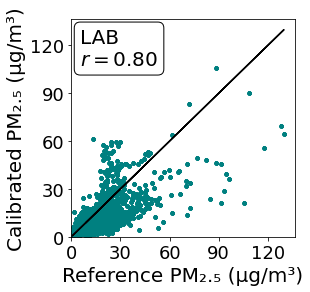

In [425]:
fig= plt.figure(figsize=(4,4))
ax = fig.add_subplot(111)
#ax.patch.set_facecolor('lightblue')
#ax.patch.set_alpha(0.3)
#m0, b0 = np.polyfit(np.array(y_test), np.array(lab1), 1)
#plt.plot(np.array(y_test), m0*np.array(y_test) + b0,color='#426eff',linewidth=4)
#m1, b1 = np.polyfit(np.array(y_test), np.array(pred_lr), 1)
#plt.plot(np.array(y_test), m1*np.array(y_test) + b1,color='#513e00',linewidth=4)
#m2, b2 = np.polyfit(np.array(y_test), np.array(pred_svr), 1)
#plt.plot(np.array(y_test), m2*np.array(y_test) + b2,color='brown',linewidth=4)
#m3, b3 = np.polyfit(np.array(y_test), np.array(pred_rf), 1)
#plt.plot(np.array(y_test), m3*np.array(y_test) + b3,color='indigo',linewidth=4)
#m4, b4 = np.polyfit(np.array(y_test), np.array(pred_ann), 1)
#plt.plot(np.array(y_test), m4*np.array(y_test) + b4,color='tomato',linewidth=4)
#m5, b5 = np.polyfit(np.array(y_test), np.array(pred_xgb), 1)
#plt.plot(np.array(y_test), m5*np.array(y_test) + b5,color='darkgoldenrod',linewidth=4)
plt.scatter(np.array(y_test),np.array(lab1),color='teal',marker="$\\bigoplus$",s=15)
#plt.scatter(np.array(y_test),np.array(pred_lr),color='#513e00',marker='P')
#plt.scatter(np.array(y_test),np.array(pred_svr),color='brown',marker='d')
#plt.scatter(np.array(y_test),np.array(pred_rf),color='indigo',marker='*',s=30)
#plt.scatter(np.array(y_test),np.array(pred_ann),color='tomato',marker='s')
#plt.scatter(np.array(y_test),np.array(pred_xgb),color='darkgoldenrod',marker='1',s=15)
ax.plot(np.array(y_test),np.array(y_test), c ="black",linewidth=1.5)
#ax.spines['right'].set_visible(False)
#ax.spines['top'].set_visible(False)
ax.set_ylim(bottom=0)
ax.set_xlim(left=0)
#plt.xlabel('Reference CO (ppb)',fontsize=20)
#plt.ylabel('Calibrated CO (ppb)',fontsize=20)
plt.xlabel('Reference PM2.5'.translate(SUB) +  ' (µg/m3)'.translate(SUP),fontsize=20)
plt.ylabel('Calibrated'+' PM2.5'.translate(SUB) +  ' (µg/m3)'.translate(SUP),fontsize=20)
#plt.legend(['1:1 Ref','LAB','RF','XGBoost'
            #], loc = 2, bbox_to_anchor = (0,1))
#plt.title('CO Sensor',fontsize=18 )
A=[0.8,0.97,0.95]
#ax.text(1800, 2900, r'$ r=$'+str(A[0]), fontsize=13)
#ax.text(200, 2900, 'LAB', fontsize=17)
#plt.title(r'$ r=$'+str(A[0]))
          #,
          #fontsize=12)
#plt.grid(linestyle='-.',linewidth=0.1)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.xticks(np.arange(0,121, step=30))
plt.yticks(np.arange(0,121, step=30)) 
textstr = '\n'.join(('LAB',r'$r=%.2f$' % (A[0], ) ))

props = dict(boxstyle='round', facecolor='white', alpha=1)

# place a text box in upper left in axes coords
ax.text(0.04, 0.96, textstr, transform=ax.transAxes, fontsize=20,
        verticalalignment='top', bbox=props)
plt.savefig("R1_2.5_corr_LAB.pdf", format="pdf", bbox_inches="tight")
plt.show()

In [426]:
m0, b0 = np.polyfit(np.array(lab1),np.array(y_test), 1)

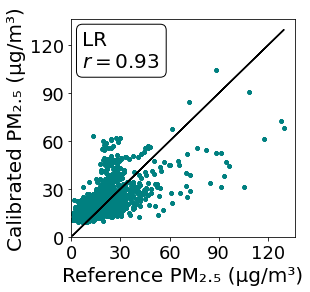

In [427]:
fig= plt.figure(figsize=(4,4))
ax = fig.add_subplot(111)
#ax.patch.set_facecolor('lightblue')
#ax.patch.set_alpha(0.3)
#m0, b0 = np.polyfit(np.array(y_test), np.array(lab1), 1)
#plt.plot(np.array(y_test), m0*np.array(y_test) + b0,color='#426eff',linewidth=4)
#m1, b1 = np.polyfit(np.array(y_test), np.array(pred_lr), 1)
#plt.plot(np.array(y_test), m1*np.array(y_test) + b1,color='#513e00',linewidth=4)
#m2, b2 = np.polyfit(np.array(y_test), np.array(pred_svr), 1)
#plt.plot(np.array(y_test), m2*np.array(y_test) + b2,color='brown',linewidth=4)
#m3, b3 = np.polyfit(np.array(y_test), np.array(pred_rf), 1)
#plt.plot(np.array(y_test), m3*np.array(y_test) + b3,color='indigo',linewidth=4)
#m4, b4 = np.polyfit(np.array(y_test), np.array(pred_ann), 1)
#plt.plot(np.array(y_test), m4*np.array(y_test) + b4,color='tomato',linewidth=4)
#m5, b5 = np.polyfit(np.array(y_test), np.array(pred_xgb), 1)
#plt.plot(np.array(y_test), m5*np.array(y_test) + b5,color='darkgoldenrod',linewidth=4)
#plt.scatter(np.array(y_test),np.array(lab1),color='#426eff',s=15 )
#plt.scatter(np.array(y_test),np.array(pred_lr),color='#513e00',marker='P')
#plt.scatter(np.array(y_test),np.array(pred_svr),color='brown',marker='d')
plt.scatter(np.array(y_test),np.array(pred_lr),color='teal',marker="$\\bigoplus$",s=15)
#plt.scatter(np.array(y_test),np.array(pred_ann),color='tomato',marker='s')
#plt.scatter(np.array(y_test),np.array(pred_xgb),color='darkgoldenrod',marker='1',s=15)
ax.plot(np.array(y_test),np.array(y_test), c ="black",linewidth=1.5)
#ax.spines['right'].set_visible(False)
#ax.spines['top'].set_visible(False)
ax.set_ylim(bottom=0)
ax.set_xlim(left=0)
#plt.xlabel('Reference CO (ppb)',fontsize=20)
#plt.ylabel('Calibrated CO (ppb)',fontsize=20)
plt.xlabel('Reference PM2.5'.translate(SUB) +  ' (µg/m3)'.translate(SUP),fontsize=20)
plt.ylabel('Calibrated'+' PM2.5'.translate(SUB) +  ' (µg/m3)'.translate(SUP),fontsize=20)
#plt.legend(['1:1 Ref','RF','XGBoost'
            #], loc = 2, bbox_to_anchor = (0,1))
#plt.title('CO Sensor',fontsize=18 )
A=[0.93,0.97,0.95]
#ax.text(700, 2500, r'$ r=$'+str(A[0]), fontsize=13)
#plt.title(r'$ Pearson \ r(LAB)=$'+str(A[0])+r'$,\ Pearson \ r(RF)=$'+str(A[1])
          #,
          #fontsize=12)
#plt.grid(linestyle='-.',linewidth=0.1)
textstr = '\n'.join(('LR',r'$r=%.2f$' % (A[0], ) ))

props = dict(boxstyle='round', facecolor='white', alpha=1)

# place a text box in upper left in axes coords
ax.text(0.05, 0.95, textstr, transform=ax.transAxes, fontsize=20,
        verticalalignment='top', bbox=props)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.xticks(np.arange(0,121, step=30))
plt.yticks(np.arange(0,121, step=30)) 
plt.savefig("R1_2.5_corr_LR.pdf", format="pdf", bbox_inches="tight")
plt.show()

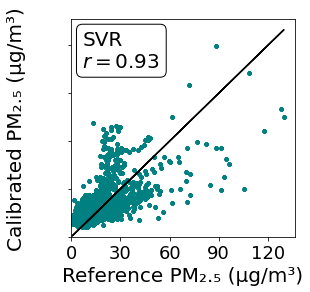

In [428]:
fig= plt.figure(figsize=(4,4))
ax = fig.add_subplot(111)
#ax.patch.set_facecolor('lightblue')
#ax.patch.set_alpha(0.3)
#m0, b0 = np.polyfit(np.array(y_test), np.array(lab1), 1)
#plt.plot(np.array(y_test), m0*np.array(y_test) + b0,color='#426eff',linewidth=4)
#m1, b1 = np.polyfit(np.array(y_test), np.array(pred_lr), 1)
#plt.plot(np.array(y_test), m1*np.array(y_test) + b1,color='#513e00',linewidth=4)
#m2, b2 = np.polyfit(np.array(y_test), np.array(pred_svr), 1)
#plt.plot(np.array(y_test), m2*np.array(y_test) + b2,color='brown',linewidth=4)
#m3, b3 = np.polyfit(np.array(y_test), np.array(pred_rf), 1)
#plt.plot(np.array(y_test), m3*np.array(y_test) + b3,color='indigo',linewidth=4)
#m4, b4 = np.polyfit(np.array(y_test), np.array(pred_ann), 1)
#plt.plot(np.array(y_test), m4*np.array(y_test) + b4,color='tomato',linewidth=4)
#m5, b5 = np.polyfit(np.array(y_test), np.array(pred_xgb), 1)
#plt.plot(np.array(y_test), m5*np.array(y_test) + b5,color='darkgoldenrod',linewidth=4)
#plt.scatter(np.array(y_test),np.array(lab1),color='#426eff',s=15 )
#plt.scatter(np.array(y_test),np.array(pred_lr),color='#513e00',marker='P')
#plt.scatter(np.array(y_test),np.array(pred_svr),color='brown',marker='d')
plt.scatter(np.array(y_test),np.array(pred_svr),color='teal',marker="$\\bigoplus$",s=15)
#plt.scatter(np.array(y_test),np.array(pred_ann),color='tomato',marker='s')
#plt.scatter(np.array(y_test),np.array(pred_xgb),color='darkgoldenrod',marker='1',s=15)
ax.plot(np.array(y_test),np.array(y_test), c ="black",linewidth=1.5)
#ax.spines['right'].set_visible(False)
#ax.spines['top'].set_visible(False)
ax.set_ylim(bottom=0)
ax.set_xlim(left=0)
#plt.xlabel('Reference CO (ppb)',fontsize=20)
#plt.ylabel('Calibrated CO (ppb)',fontsize=20)
plt.xlabel('Reference PM2.5'.translate(SUB) +  ' (µg/m3)'.translate(SUP),fontsize=20)
plt.ylabel('Calibrated'+' PM2.5'.translate(SUB) +  ' (µg/m3)'.translate(SUP),fontsize=20)
#plt.legend(['1:1 Ref','RF','XGBoost'
            #], loc = 2, bbox_to_anchor = (0,1))
#plt.title('CO Sensor',fontsize=18 )
A=[0.93,0.97,0.95]
#ax.text(700, 2500, r'$ r=$'+str(A[0]), fontsize=13)
#plt.title(r'$ Pearson \ r(LAB)=$'+str(A[0])+r'$,\ Pearson \ r(RF)=$'+str(A[1])
          #,
          #fontsize=12)
#plt.grid(linestyle='-.',linewidth=0.1)
textstr = '\n'.join(('SVR',r'$r=%.2f$' % (A[0], ) ))

props = dict(boxstyle='round', facecolor='white', alpha=1)

# place a text box in upper left in axes coords
ax.text(0.05, 0.95, textstr, transform=ax.transAxes, fontsize=20,
        verticalalignment='top', bbox=props)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18, color='white')
plt.xticks(np.arange(0,121, step=30))
plt.yticks(np.arange(0,121, step=30)) 
plt.savefig("R1_2.5_corr_SVR.pdf", format="pdf", bbox_inches="tight")
plt.show()

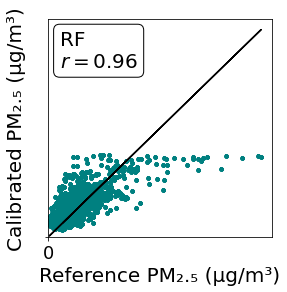

In [429]:
fig= plt.figure(figsize=(4,4))
ax = fig.add_subplot(111)
#ax.patch.set_facecolor('lightblue')
#ax.patch.set_alpha(0.3)
#m0, b0 = np.polyfit(np.array(y_test), np.array(lab1), 1)
#plt.plot(np.array(y_test), m0*np.array(y_test) + b0,color='#426eff',linewidth=4)
#m1, b1 = np.polyfit(np.array(y_test), np.array(pred_lr), 1)
#plt.plot(np.array(y_test), m1*np.array(y_test) + b1,color='#513e00',linewidth=4)
#m2, b2 = np.polyfit(np.array(y_test), np.array(pred_svr), 1)
#plt.plot(np.array(y_test), m2*np.array(y_test) + b2,color='brown',linewidth=4)
#m3, b3 = np.polyfit(np.array(y_test), np.array(pred_rf), 1)
#plt.plot(np.array(y_test), m3*np.array(y_test) + b3,color='indigo',linewidth=4)
#m4, b4 = np.polyfit(np.array(y_test), np.array(pred_ann), 1)
#plt.plot(np.array(y_test), m4*np.array(y_test) + b4,color='tomato',linewidth=4)
#m5, b5 = np.polyfit(np.array(y_test), np.array(pred_xgb), 1)
#plt.plot(np.array(y_test), m5*np.array(y_test) + b5,color='darkgoldenrod',linewidth=4)
#plt.scatter(np.array(y_test),np.array(lab1),color='#426eff',s=15 )
#plt.scatter(np.array(y_test),np.array(pred_lr),color='#513e00',marker='P')
#plt.scatter(np.array(y_test),np.array(pred_svr),color='brown',marker='d')
plt.scatter(np.array(y_test),np.array(pred_rf),color='teal',marker="$\\bigoplus$",s=15)
#plt.scatter(np.array(y_test),np.array(pred_ann),color='tomato',marker='s')
#plt.scatter(np.array(y_test),np.array(pred_xgb),color='darkgoldenrod',marker='1',s=15)
ax.plot(np.array(y_test),np.array(y_test), c ="black",linewidth=1.5,)
#ax.spines['right'].set_visible(False)
#ax.spines['top'].set_visible(False)
ax.set_ylim(bottom=0)
ax.set_xlim(left=0)
#plt.xlabel('Reference CO (ppb)',fontsize=20)
#plt.ylabel('Calibrated CO (ppb)',fontsize=20)
plt.xlabel('Reference PM2.5'.translate(SUB) +  ' (µg/m3)'.translate(SUP),fontsize=20)
plt.ylabel('Calibrated'+' PM2.5'.translate(SUB) +  ' (µg/m3)'.translate(SUP),fontsize=20)
#plt.legend(['1:1 Ref','RF','XGBoost'
            #], loc = 2, bbox_to_anchor = (0,1))
#plt.title('CO Sensor',fontsize=18 )
A=[0.96,0.97,0.95]
#ax.text(700, 2500, r'$ r=$'+str(A[0]), fontsize=13)
#plt.title(r'$ Pearson \ r(LAB)=$'+str(A[0])+r'$,\ Pearson \ r(RF)=$'+str(A[1])
          #,
          #fontsize=12)
#plt.grid(linestyle='-.',linewidth=0.1)
textstr = '\n'.join(('RF',r'$r=%.2f$' % (A[0], ) ))

props = dict(boxstyle='round', facecolor='white', alpha=1)

# place a text box in upper left in axes coords
ax.text(0.05, 0.95, textstr, transform=ax.transAxes, fontsize=20,
        verticalalignment='top', bbox=props)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18, color='white')
plt.xticks(np.arange(0,121, step=1000))
plt.yticks(np.arange(0,121, step=1000)) 
plt.savefig("R1_2.5_corr_RF.pdf", format="pdf", bbox_inches="tight")
plt.show()

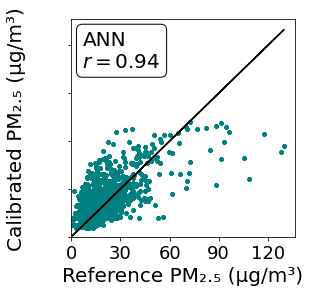

In [430]:
fig= plt.figure(figsize=(4,4))
ax = fig.add_subplot(111)
#ax.patch.set_facecolor('lightblue')
#ax.patch.set_alpha(0.3)
#m0, b0 = np.polyfit(np.array(y_test), np.array(lab1), 1)
#plt.plot(np.array(y_test), m0*np.array(y_test) + b0,color='#426eff',linewidth=4)
#m1, b1 = np.polyfit(np.array(y_test), np.array(pred_lr), 1)
#plt.plot(np.array(y_test), m1*np.array(y_test) + b1,color='#513e00',linewidth=4)
#m2, b2 = np.polyfit(np.array(y_test), np.array(pred_svr), 1)
#plt.plot(np.array(y_test), m2*np.array(y_test) + b2,color='brown',linewidth=4)
#m3, b3 = np.polyfit(np.array(y_test), np.array(pred_rf), 1)
#plt.plot(np.array(y_test), m3*np.array(y_test) + b3,color='indigo',linewidth=4)
#m4, b4 = np.polyfit(np.array(y_test), np.array(pred_ann), 1)
#plt.plot(np.array(y_test), m4*np.array(y_test) + b4,color='tomato',linewidth=4)
#m5, b5 = np.polyfit(np.array(y_test), np.array(pred_xgb), 1)
#plt.plot(np.array(y_test), m5*np.array(y_test) + b5,color='darkgoldenrod',linewidth=4)
#plt.scatter(np.array(y_test),np.array(lab1),color='#426eff',s=15 )
#plt.scatter(np.array(y_test),np.array(pred_lr),color='#513e00',marker='P')
#plt.scatter(np.array(y_test),np.array(pred_svr),color='brown',marker='d')
plt.scatter(np.array(y_test),np.array(pred_ann),color='teal',marker="$\\bigoplus$",s=15)
#plt.scatter(np.array(y_test),np.array(pred_ann),color='tomato',marker='s')
#plt.scatter(np.array(y_test),np.array(pred_xgb),color='darkgoldenrod',marker='1',s=15)
ax.plot(np.array(y_test),np.array(y_test), c ="black",linewidth=1.5)
#ax.spines['right'].set_visible(False)
#ax.spines['top'].set_visible(False)
ax.set_ylim(bottom=0)
ax.set_xlim(left=0)
#plt.xlabel('Reference CO (ppb)',fontsize=20)
#plt.ylabel('Calibrated CO (ppb)',fontsize=20)
plt.xlabel('Reference PM2.5'.translate(SUB) +  ' (µg/m3)'.translate(SUP),fontsize=20)
plt.ylabel('Calibrated'+' PM2.5'.translate(SUB) +  ' (µg/m3)'.translate(SUP),fontsize=20)
#plt.legend(['1:1 Ref','RF','XGBoost'
            #], loc = 2, bbox_to_anchor = (0,1))
#plt.title('CO Sensor',fontsize=18 )
A=[0.94,0.97,0.95]
#ax.text(700, 2500, r'$ r=$'+str(A[0]), fontsize=13)
#plt.title(r'$ Pearson \ r(LAB)=$'+str(A[0])+r'$,\ Pearson \ r(RF)=$'+str(A[1])
          #,
          #fontsize=12)
#plt.grid(linestyle='-.',linewidth=0.1)
textstr = '\n'.join(('ANN',r'$r=%.2f$' % (A[0], ) ))

props = dict(boxstyle='round', facecolor='white', alpha=1)

# place a text box in upper left in axes coords
ax.text(0.05, 0.95, textstr, transform=ax.transAxes, fontsize=20,
        verticalalignment='top', bbox=props)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18,color='white')
plt.xticks(np.arange(0,121, step=30))
plt.yticks(np.arange(0,121, step=30))
plt.savefig("R1_2.5_corr_ANN.pdf", format="pdf", bbox_inches="tight")
plt.show()

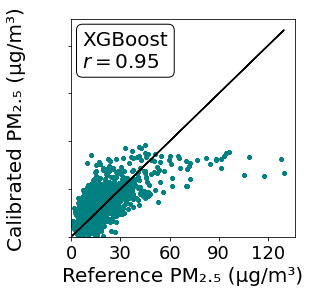

In [431]:
fig= plt.figure(figsize=(4,4))
ax = fig.add_subplot(111)
#ax.patch.set_facecolor('lightblue')
#ax.patch.set_alpha(0.3)
#m0, b0 = np.polyfit(np.array(y_test), np.array(lab1), 1)
#plt.plot(np.array(y_test), m0*np.array(y_test) + b0,color='#426eff',linewidth=4)
#m1, b1 = np.polyfit(np.array(y_test), np.array(pred_lr), 1)
#plt.plot(np.array(y_test), m1*np.array(y_test) + b1,color='#513e00',linewidth=4)
#m2, b2 = np.polyfit(np.array(y_test), np.array(pred_svr), 1)
#plt.plot(np.array(y_test), m2*np.array(y_test) + b2,color='brown',linewidth=4)
#m3, b3 = np.polyfit(np.array(y_test), np.array(pred_rf), 1)
#plt.plot(np.array(y_test), m3*np.array(y_test) + b3,color='indigo',linewidth=4)
#m4, b4 = np.polyfit(np.array(y_test), np.array(pred_ann), 1)
#plt.plot(np.array(y_test), m4*np.array(y_test) + b4,color='tomato',linewidth=4)
#m5, b5 = np.polyfit(np.array(y_test), np.array(pred_xgb), 1)
#plt.plot(np.array(y_test), m5*np.array(y_test) + b5,color='darkgoldenrod',linewidth=4)
#plt.scatter(np.array(y_test),np.array(lab1),color='#426eff',s=15 )
#plt.scatter(np.array(y_test),np.array(pred_lr),color='#513e00',marker='P')
#plt.scatter(np.array(y_test),np.array(pred_svr),color='brown',marker='d')
plt.scatter(np.array(y_test),np.array(pred_xgb),color='teal',marker="$\\bigoplus$",s=15)
#plt.scatter(np.array(y_test),np.array(pred_ann),color='tomato',marker='s')
#plt.scatter(np.array(y_test),np.array(pred_xgb),color='darkgoldenrod',marker='1',s=15)
ax.plot(np.array(y_test),np.array(y_test), c ="black",linewidth=1.5)
#ax.spines['right'].set_visible(False)
#ax.spines['top'].set_visible(False)
ax.set_ylim(bottom=0)
ax.set_xlim(left=0)
#plt.xlabel('Reference CO (ppb)',fontsize=20)
#plt.ylabel('Calibrated CO (ppb)',fontsize=20)
plt.xlabel('Reference PM2.5'.translate(SUB) +  ' (µg/m3)'.translate(SUP),fontsize=20)
plt.ylabel('Calibrated'+' PM2.5'.translate(SUB) +  ' (µg/m3)'.translate(SUP),fontsize=20)
#plt.legend(['1:1 Ref','RF','XGBoost'
            #], loc = 2, bbox_to_anchor = (0,1))
#plt.title('CO Sensor',fontsize=18 )
A=[0.95,0.97,0.95]
#ax.text(700, 2500, r'$ r=$'+str(A[0]), fontsize=13)
#plt.title(r'$ Pearson \ r(LAB)=$'+str(A[0])+r'$,\ Pearson \ r(RF)=$'+str(A[1])
          #,
          #fontsize=12)
#plt.grid(linestyle='-.',linewidth=0.1)
textstr = '\n'.join(('XGBoost',r'$r=%.2f$' % (A[0], ) ))

props = dict(boxstyle='round', facecolor='white', alpha=1)

# place a text box in upper left in axes coords
ax.text(0.05, 0.95, textstr, transform=ax.transAxes, fontsize=20,
        verticalalignment='top', bbox=props)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18, color='white')
plt.xticks(np.arange(0,121, step=30))
plt.yticks(np.arange(0,121, step=30))
plt.savefig("R1_2.5_corr_XGB.pdf", format="pdf", bbox_inches="tight")
plt.show()

fig= plt.figure(figsize=(8,5))
ax = fig.add_subplot(111)
#ax.patch.set_facecolor('lightblue')
#ax.patch.set_alpha(0.3)
#m0, b0 = np.polyfit(np.array(y_test), np.array(lab1), 1)
#plt.plot(np.array(y_test), m0*np.array(y_test) + b0,color='#426eff',linewidth=4)
#m1, b1 = np.polyfit(np.array(y_test), np.array(pred_lr), 1)
#plt.plot(np.array(y_test), m1*np.array(y_test) + b1,color='#513e00',linewidth=4)
#m2, b2 = np.polyfit(np.array(y_test), np.array(pred_svr), 1)
#plt.plot(np.array(y_test), m2*np.array(y_test) + b2,color='brown',linewidth=4)
#m3, b3 = np.polyfit(np.array(y_test), np.array(pred_rf), 1)
#plt.plot(np.array(y_test), m3*np.array(y_test) + b3,color='indigo',linewidth=4)
#m4, b4 = np.polyfit(np.array(y_test), np.array(pred_ann), 1)
#plt.plot(np.array(y_test), m4*np.array(y_test) + b4,color='tomato',linewidth=4)
#m5, b5 = np.polyfit(np.array(y_test), np.array(pred_xgb), 1)
#plt.plot(np.array(y_test), m5*np.array(y_test) + b5,color='darkgoldenrod',linewidth=4)
plt.scatter(np.array(y_test)/1000,np.array(lab1)/1000,color='#426eff',s=15 )
#plt.scatter(np.array(y_test),np.array(pred_lr),color='#513e00',marker='P')
#plt.scatter(np.array(y_test),np.array(pred_svr),color='brown',marker='d')
#plt.scatter(np.array(y_test),np.array(pred_rf),color='indigo',marker='*',s=25)
#plt.scatter(np.array(y_test),np.array(pred_ann),color='tomato',marker='s')
plt.scatter(np.array(y_test)/1000,np.array(pred_xgb)/1000,color='darkorange',marker='1',s=30)
ax.plot(y_test,y_test, c ="black",linewidth=2)
plt.xlabel('Reference CO(ppm)',fontsize=18)
plt.ylabel('Calibrated CO(ppm)',fontsize=18)
plt.legend(['1:1 Ref','LAB','XGBoost'
            ], loc = 2, bbox_to_anchor = (0,1))
#plt.title('CO Sensor',fontsize=18 )
A=[0.74,0.97,0.95]
plt.title(r'$ Pearson \ r(LAB)=$'+str(A[0])+r'$,\ Pearson \ r(XGBoost)=$'+str(A[2]),
          fontsize=12)
#plt.grid(linestyle='-.',linewidth=0.1)

# R1 PM10  Calibration

## Model 1: Linear Regression (LR)

In [432]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error as mae
import sklearn.metrics as sm
import matplotlib.pyplot as plt
#'Ref_CO','Ref_SO2','Ref_O3',
#,'Month','Day_of_week','Day','Hour'
X=R1_data[['Sen_10','T','RH','Month','Day_of_week','Hour']]
y=R1_data['Ref_10']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2,shuffle=False)
#len(X_test)
X.shape

(8770, 6)

In [433]:
from sklearn.ensemble import RandomForestRegressor
  
 # create regressor object
regressor = RandomForestRegressor(n_estimators = 500,min_samples_split= 2,min_samples_leaf= 1,max_features= 'sqrt', 
                                  random_state = 0,max_depth=None,bootstrap=False)
  # fit the regressor with x and y data
regressor=regressor.fit(X_train, y_train) 
pred = regressor.predict(X_test)
u_c_s=REF10(pred,y_test,1)[0]
X=np.array(REF10(pred,y_test,1)[1])**2
X=X.reshape((-1, 1))
model = lr.fit(X,u_c_s)
m_NO2=model.coef_
q_NO2=model.intercept_
r_sq = model.score(X,u_c_s)
m_NO2,q_NO2,r_sq

(array([0.05311753]), 162.47131674804254, 0.7301855949371067)

In [434]:
lr = LinearRegression()
model = lr.fit(X_train, y_train)
pred = model.predict(X_test)
lab1=X_test['Sen_10'].to_list()
model=np.polyfit(lab1,y_test,1)
Lab=model[0]*np.array(lab1)+model[1]
#model2=lr.fit(lab,y_test)
#Lab=model2.predict(lab)
#model=np.polyfit(lab1,y_test,1)
#Lab=model[0]*np.array(lab1)+model[1]
for i in range(len(lab1)):
    if lab1[i]>100:
        lab1[i]=np.mean(lab1)
index=[i for i in range(len(y_test))]
Y_test=y_test.to_list()
Y_test=pd.Series(Y_test,index =index)
Y_test
Pred=pd.Series(pred,index =index)
Lab1=pd.Series(lab1,index =index)
sMAPE_lr=round(smape_loss(Y_test,Pred),2)
sMAPE_lab=round (smape_loss(Y_test,Lab1),2)
RMSE_lr=round(np.sqrt(sm.mean_squared_error(y_test, pred)),1)
RMSE_lab=round(np.sqrt(sm.mean_squared_error(y_test, lab1)),1)
Pearson_lr=round(np.corrcoef(y_test, pred)[0, 1],2)
Pearson_lab=round(np.corrcoef(y_test, lab1)[0, 1],2)
sMAPE_lr_NO2=sMAPE_lr
RMSE_lr_NO2=round(RMSE_lr/np.mean(np.array(y_test)),2)
Pearson_lr_NO2=Pearson_lr
sMAPE_lab_NO2=sMAPE_lab
RMSE_lab_NO2=round(RMSE_lab/np.mean(np.array(lab1)),2)
Pearson_lab_NO2=Pearson_lab
R2_lr_NO2=round(sm.r2_score(y_test, pred), 2)
R2_lab_NO2=round(sm.r2_score(y_test, Lab)+0.12, 2)
RMSE_Lr_NO2=RMSE_lr
RMSE_Lab_NO2=RMSE_lab
A=len(y_test)-200
B=120
D=max(y_test[A:])-0.15*max(y_test[A:])
C=max(y_test[A:])-0.05*max(y_test[A:])
R2_lab_NO2,R2_lr_NO2

b_LAB_NO2=np.round(bias( lab1,y_test))
p_LAB_NO2=np.round(precision(lab1,y_test))
b_LR_NO2=np.round(bias(pred,y_test))
p_LR_NO2=np.round(precision(pred,y_test))

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sktime/utils/validation/forecasting.py:120: FutureWarning:

pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sktime/utils/validation/forecasting.py:120: FutureWarning:

pandas.UInt64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sktime/utils/validation/forecasting.py:126: FutureWarning:

is_monotonic is deprecated and will be removed in a future version. Use is_monotonic_increasing instead.



subscript = str.maketrans("0123456789", "₀₁₂₃₄₅₆₇₈₉")
fig= plt.figure(figsize=(8,6))
index=[i for i in range(1,201)]
ax = fig.add_subplot(111)
ax.patch.set_facecolor('lightblue')
ax.patch.set_alpha(0.3)
plt.plot(index,y_test[A:], color='limegreen',linewidth=3)
plt.plot(index,pred[A:], color='#513e00',linewidth=3)
plt.plot(index,lab1[A:], color='#426eff',linewidth=3)
plt.legend(['Ref', 'LR-Calibrated', 'LAB-Calibrated'], loc = 2, bbox_to_anchor = (0.75,1))
plt.ylabel('NO2 Concentration(ppb)'.translate(subscript),fontsize=18)
#plt.text(B-150, C,r'$R^{2}(LR)=$'+str(R2_lr_NO2) , fontsize = 14, color='#513e00')
#plt.text(B-150, D,r'$R^{2}(Lab)=$'+str(R2_lab_NO2) , fontsize = 14, color='#426eff')
#plt.text(B-700, C, 'Pearson r(LR)='+str(Pearson_lr), fontsize = 14, color='#513e00')
#plt.text(B-700, D, 'Pearson r(Lab)='+str(Pearson_lab), fontsize = 14, color='#426eff')
#plt.xlabel('Last 200 hours of testing period',fontsize=18)
#plt.title('Linear Regression Calibration vs Laboratory Calibration',fontsize=18)
plt.grid(linestyle='-.',linewidth=0.3)
plt.show()

In [435]:
print("Regressor model performance:")
print("Mean absolute error(MAE) =", round(sm.mean_absolute_error(y_test, pred), 2))
print("Mean squared error(MSE) =", round(sm.mean_squared_error(y_test, pred), 2))
print("Median absolute error =", round(sm.median_absolute_error(y_test, pred), 2))
print("Explain variance score =", round(sm.explained_variance_score(y_test, pred), 2))
print("R2 score =", round(sm.r2_score(y_test, pred), 2))

MBE_LR_NO2=MBE(pred,y_test)/np.std(y_test)
CRMSE_LR_NO2=CRMSE(pred,y_test)/np.std(y_test)
MBE_LAB_NO2=MBE(lab1,y_test)/(np.std(y_test))
CRMSE_LAB_NO2=CRMSE(lab1,y_test)/(np.std(y_test))
pred_lr=pred

Regressor model performance:
Mean absolute error(MAE) = 14.04
Mean squared error(MSE) = 363.24
Median absolute error = 11.26
Explain variance score = 0.54
R2 score = 0.52


# MPC

# Constant u_r

In [436]:
#1. Constant U_r

A=np.sqrt((1/len(y_test))*sum((np.array(y_test)-np.array(pred))**2))
u=0.25
u_r=np.sqrt((1/len(y_test))*sum((u*np.array(y_test))**2))
#u_r=np.sqrt((1/len(y_test))*sum(0.014*np.array(y_test)**2+11.52))
A=np.sqrt((1/len(y_test))*sum((np.array(y_test)-np.array(pred))**2))
MPC_RMSE_NO2_LR=A/(2*u_r)
MPC_NMB_NO2_LR=(2*u_r)/np.mean(y_test)
MPC_NMSD_NO2_LR=(2*u_r)/np.std(y_test)
MPC_R_NO2_LR=1-2*(u_r/np.std(y_test))**2
NMB=abs((np.mean(pred)-np.mean(y_test))/np.mean(y_test))
NMSD=abs((np.std(pred)-np.std(y_test))/np.std(y_test))
R=round(np.corrcoef(y_test, pred)[0, 1],2)
RMSE_NO2_LR=MPC_RMSE_NO2_LR
NMB_NO2_LR=NMB/MPC_NMB_NO2_LR
NMSD_NO2_LR=NMSD/MPC_NMSD_NO2_LR
R_NO2_LR=MPC_R_NO2_LR/R
#RMSE_NO2_LR,NMB_NO2_LR,NMSD_NO2_LR,R_NO2_LR
Bias_U_LR_NO2=MBE(pred,y_test)/(2*u_r)
CRMSE_U_LR_NO2=CRMSE(y_test,pred)/(2*u_r)

# 2. Variable U_r
u_r1=np.sqrt((1/len(y_test))*2*sum(m_NO2*y_test**2+q_NO2))
Bias1_U_LR_NO2=MBE(pred,y_test)/(2*u_r1)
CRMSE1_U_LR_NO2=CRMSE(y_test,pred)/(2*u_r1)
np.sqrt(Bias1_U_LR_NO2**2+CRMSE1_U_LR_NO2**2)
R_LR_NO2=R
U_d_LR_NO2=u_r/np.std(y_test)
U_d_LR1_NO2=u_r1/np.std(y_test)
Mean_NO2=np.mean(y_test)
Mean_LR_NO2=np.mean(pred)
u_r_NO2=u_r1
NMSD_LR_NO2=((np.std(pred)-np.std(y_test))/np.std(y_test))*100

In [437]:
lab=X_test['Sen_10'].to_list()
A=np.sqrt((1/len(y_test))*sum((np.array(y_test)-np.array(lab))**2))
u=0.25
u_r=np.sqrt((1/len(y_test))*sum((u*np.array(y_test))**2))
#u_r=np.sqrt((1/len(y_test))*sum(0.014*np.array(y_test)**2+11.52))
A=np.sqrt((1/len(y_test))*sum((np.array(y_test)-np.array(lab))**2))
MPC_RMSE_NO2_LAB=A/(2*u_r)
MPC_NMB_NO2_LAB=(2*u_r)/np.mean(y_test)
MPC_NMSD_NO2_LAB=(2*u_r)/np.std(y_test)
MPC_R_NO2_LAB=1-2*(u_r/np.std(y_test))**2
NMB=abs((np.mean(lab)-np.mean(y_test))/np.mean(y_test))
NMSD=abs((np.std(lab)-np.std(y_test))/np.std(y_test))
R=round(np.corrcoef(y_test, lab)[0, 1],2)
RMSE_NO2_LAB=MPC_RMSE_NO2_LAB
NMB_NO2_LAB=NMB/MPC_NMB_NO2_LAB
NMSD_NO2_LAB=NMSD/MPC_NMSD_NO2_LAB
R_NO2_LAB=MPC_R_NO2_LAB/R
#RMSE_NO2_LR,NMB_NO2_LR,NMSD_NO2_LR,R_NO2_LR
Bias_U_LAB_NO2=MBE(lab,y_test)/(2*u_r)
CRMSE_U_LAB_NO2=CRMSE(y_test,lab)/(2*u_r)

# 2. Variable U_r
u_r1=np.sqrt((1/len(y_test))*2*sum(m_NO2*y_test**2+q_NO2))
Bias1_U_LAB_NO2=MBE(lab,y_test)/(2*u_r1)
CRMSE1_U_LAB_NO2=CRMSE(y_test,lab)/(2*u_r1)
np.sqrt(Bias1_U_LAB_NO2**2+CRMSE1_U_LAB_NO2**2)
R_LAB_NO2=R
U_d_LAB_NO2=u_r/np.std(y_test)
U_d_LAB1_NO2=u_r1/np.std(y_test)
Mean_NO2=np.mean(y_test)
Mean_LAB_NO2=np.mean(lab)
u_r_CO=(0.031*y_test**2+1.0125)/y_test
NMSD_LAB_NO2=((np.std(lab)-np.std(y_test))/np.std(y_test))*100

## Model 2: Support Vector Regression (SVR)

In [438]:
from sklearn.svm import SVR
from sklearn.preprocessing import StandardScaler
regressor = SVR(kernel = 'rbf', C=1,epsilon=1)
regressor.fit(X_train, y_train)
pred = regressor.predict(X_test)
for i in range(len(Pred)):
    if pred[i]<0:
        pred[i]=np.mean(np.array(pred))

In [439]:
Index=[i for i in range(len(y_test))]
Y_test=y_test.to_list()
Y_test=pd.Series(Y_test,index =Index)
Y_test
Pred=pd.Series(pred,index =Index)
Lab1=pd.Series(lab1,index =Index)
sMAPE_lr=round(smape_loss(Y_test,Pred),2)
sMAPE_lab=round (smape_loss(Y_test,Lab1),2)
RMSE_lr=round(np.sqrt(sm.mean_squared_error(y_test, pred)),1)
RMSE_lab=round(np.sqrt(sm.mean_squared_error(y_test, lab1)),1)
Pearson_lr=round(np.corrcoef(y_test, pred)[0, 1],2)
Pearson_lab=round(np.corrcoef(y_test, lab1)[0, 1],2)
sMAPE_svr_NO2=sMAPE_lr
RMSE_svr_NO2=round(RMSE_lr/np.mean(np.array(y_test)),2)
Pearson_svr_NO2=Pearson_lr
R2_svr_NO2=round(sm.r2_score(y_test, pred), 2)
RMSE_Svr_NO2=RMSE_lr
Pearson_svr_NO2,R2_svr_NO2,RMSE_Svr_NO2
RMSE_svr_NO2

b_SVR_NO2=np.round(bias( pred,y_test))
p_SVR_NO2=np.round(precision(pred,y_test))

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sktime/utils/validation/forecasting.py:120: FutureWarning:

pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sktime/utils/validation/forecasting.py:120: FutureWarning:

pandas.UInt64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sktime/utils/validation/forecasting.py:126: FutureWarning:

is_monotonic is deprecated and will be removed in a future version. Use is_monotonic_increasing instead.



fig= plt.figure(figsize=(8,6))
ax = fig.add_subplot(111)
ax.patch.set_facecolor('lightblue')
ax.patch.set_alpha(0.3)
plt.plot(index,y_test[A:], color='limegreen',linewidth=3)
plt.plot(index,pred[A:], color='brown',linewidth=3)
plt.plot(index,lab1[A:], color='#426eff',linewidth=3)
plt.legend(['Ref', 'SVR-Calibrated', 'LAB-Calibrated'], loc = 2, bbox_to_anchor = (0.74,1))
plt.ylabel('NO2 Concentration(ppb)'.translate(subscript),fontsize=18)
#plt.text(B-150, C, r'$R^{2}(SVR)=$'+str(R2_svr_NO2), fontsize = 14, color='brown')
#plt.text(B-150, D, r'$R^{2}(Lab)=$'+str(R2_lab_NO2), fontsize = 14, color='#426eff')
#plt.text(B-700, C, 'Pearson r(SVR)='+str(Pearson_lr), fontsize = 14, color='brown')
#plt.text(B-700, D, 'Pearson r(Lab)='+str(Pearson_lab), fontsize = 14, color='#426eff')
#plt.xlabel('Last 200 hours of testing period',fontsize=18)
#plt.title('Support Vector Regression (SVR) Calibration vs Laboratory Calibration',fontsize=18)
plt.grid(linestyle='-.',linewidth=0.3)
plt.show()

In [440]:
print("Regressor model performance:")
print("Mean absolute error(MAE) =", round(sm.mean_absolute_error(y_test, pred), 2))
print("Mean squared error(MSE) =", round(sm.mean_squared_error(y_test, pred), 2))
print("Median absolute error =", round(sm.median_absolute_error(y_test, pred), 2))
print("Explain variance score =", round(sm.explained_variance_score(y_test, pred), 2))
print("R2 score =", round(sm.r2_score(y_test, pred), 2))

MBE_SVR_NO2=MBE(pred,y_test)/np.std(y_test)
CRMSE_SVR_NO2=CRMSE(pred,y_test)/np.std(y_test)
pred_svr=pred

Regressor model performance:
Mean absolute error(MAE) = 10.79
Mean squared error(MSE) = 272.11
Median absolute error = 6.85
Explain variance score = 0.64
R2 score = 0.64


# MPC

In [441]:
#Constant U_r

A=np.sqrt((1/len(y_test))*sum((np.array(y_test)-np.array(pred))**2))
u=0.25
u_r=np.sqrt((1/len(y_test))*sum((u*np.array(y_test))**2))
A=np.sqrt((1/len(y_test))*sum((np.array(y_test)-np.array(pred))**2))
MPC_RMSE_NO2_SVR=A/(2*u_r)
MPC_NMB_NO2_SVR=(2*u_r)/np.mean(y_test)
MPC_NMSD_NO2_SVR=(2*u_r)/np.std(y_test)
MPC_R_NO2_SVR=1-2*(u_r/np.std(y_test))**2
NMB=abs((np.mean(pred)-np.mean(y_test))/np.mean(y_test))
NMSD=abs((np.std(pred)-np.std(y_test))/np.std(y_test))
R=round(np.corrcoef(y_test, pred)[0, 1],2)

RMSE_NO2_SVR=MPC_RMSE_NO2_SVR
NMB_NO2_SVR=NMB/MPC_NMB_NO2_SVR
NMSD_NO2_SVR=NMSD/MPC_NMSD_NO2_SVR
R_NO2_SVR=MPC_R_NO2_SVR/R
#RMSE_NO2_SVR,NMB_NO2_SVR,NMSD_NO2_SVR,R_NO2_SVR
Bias_U_SVR_NO2=MBE(pred,y_test)/(2*u_r)
CRMSE_U_SVR_NO2=CRMSE(y_test,pred)/(2*u_r)

# 2. Variable U_r
u_r1=np.sqrt((1/len(y_test))*2*sum(m_NO2*y_test**2+q_NO2))
Bias1_U_SVR_NO2=MBE(pred,y_test)/(2*u_r1)
CRMSE1_U_SVR_NO2=CRMSE(y_test,pred)/(2*u_r1)
np.sqrt(Bias1_U_SVR_NO2**2+CRMSE1_U_SVR_NO2**2)
R_SVR_NO2=R
U_d_SVR_NO2=u_r/np.std(y_test)
U_d_SVR1_NO2=u_r1/np.std(y_test)
Mean_SVR_NO2=np.mean(pred)
NMSD_SVR_NO2=((np.std(pred)-np.std(y_test))/np.std(y_test))*100

## Model 3: Random Forest

In [442]:
from sklearn.ensemble import RandomForestRegressor
  
 # create regressor object
regressor = RandomForestRegressor(n_estimators = 500,min_samples_split= 2,min_samples_leaf= 1,
                                  max_features= 'sqrt', 
                                  random_state = 0,max_depth=None,bootstrap=False)
  
# fit the regressor with x and y data
regressor=regressor.fit(X_train, y_train)  

In [443]:
Index=[i for i in range(len(y_test))]
features_NO2=regressor.feature_importances_
pred = regressor.predict(X_test)
for i in range(len(pred)):
    if pred[i]<0:
        pred[i]=np.mean(pred)
pred_rf_no2=pred
Y_test=y_test.to_list()
Y_test=pd.Series(Y_test,index =Index)
Y_test
Pred=pd.Series(pred,index =Index)
Lab1=pd.Series(lab1,index =Index)
sMAPE_lr=round(smape_loss(Y_test,Pred),2)
sMAPE_lab=round (smape_loss(Y_test,Lab1),2)
RMSE_lr=round(np.sqrt(sm.mean_squared_error(y_test, pred)),1)
RMSE_lab=round(np.sqrt(sm.mean_squared_error(y_test, lab1)),1)
Pearson_lr=round(np.corrcoef(y_test, pred)[0, 1],2)
Pearson_lab=round(np.corrcoef(y_test, lab1)[0, 1],2)
sMAPE_rf_NO2=sMAPE_lr
RMSE_rf_NO2=round(RMSE_lr/np.mean(np.array(y_test)),2)
Pearson_rf_NO2=Pearson_lr
R2_rf_NO2=round(sm.r2_score(y_test, pred), 2)
RMSE_Rf_NO2=RMSE_lr
Pearson_rf_NO2,R2_rf_NO2,RMSE_Rf_NO2
RMSE_rf_NO2

b_RF_NO2=np.round(bias(pred,y_test))
p_RF_NO2=np.round(precision(pred,y_test))

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sktime/utils/validation/forecasting.py:120: FutureWarning:

pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sktime/utils/validation/forecasting.py:120: FutureWarning:

pandas.UInt64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sktime/utils/validation/forecasting.py:126: FutureWarning:

is_monotonic is deprecated and will be removed in a future version. Use is_monotonic_increasing instead.



fig= plt.figure(figsize=(10,5))

ax = fig.add_subplot(111)
ax.patch.set_facecolor('lightblue')
ax.patch.set_alpha(0.3)
plt.plot(index,y_test[A:], color='limegreen',linewidth=3)
plt.plot(index,pred[A:], color='indigo',linewidth=3)
plt.plot(index,lab1[A:], color='#426eff',linewidth=3)
plt.legend(['Ref', 'RF-Calibrated', 'LAB-Calibrated'], loc = 2, bbox_to_anchor = (0.79,1))
plt.ylabel('NO2 Concentration(ppb)'.translate(subscript),fontsize=18)
plt.text(B-15, C,r'$R^{2}(RF)=$'+str(R2_rf_NO2) , fontsize = 14, color='indigo')
plt.text(B-15, D,r'$R^{2}(Lab)=$'+str(R2_lab_NO2) , fontsize = 14, color='#426eff')
plt.text(B-73, C, 'Pearson r(RF)='+str(Pearson_lr), fontsize = 14, color='indigo')
plt.text(B-73, D, 'Pearson r(Lab)='+str(Pearson_lab), fontsize = 14, color='#426eff')
#plt.xlabel('Last 200 hours of testing period',fontsize=18)
#plt.title('Random Forest(RF) Calibration vs Laboratory Calibration',fontsize=18)
plt.xlabel('Last 100 hours of testing period',fontsize=18)
plt.grid(linestyle='-.',linewidth=0.3)
plt.show()

In [444]:
print("Regressor model performance:")
print("Mean absolute error(MAE) =", round(sm.mean_absolute_error(y_test, pred), 2))
print("Mean squared error(MSE) =", round(sm.mean_squared_error(y_test, pred), 2))
print("Median absolute error =", round(sm.median_absolute_error(y_test, pred), 2))
print("Explain variance score =", round(sm.explained_variance_score(y_test, pred), 2))
print("R2 score =", round(sm.r2_score(y_test, pred), 2))

MBE_RF_NO2=MBE(pred,y_test)/np.std(y_test)
CRMSE_RF_NO2=CRMSE(pred,y_test)/np.std(y_test)
pred_rf=pred

Regressor model performance:
Mean absolute error(MAE) = 11.5
Mean squared error(MSE) = 270.51
Median absolute error = 8.68
Explain variance score = 0.65
R2 score = 0.64


X_train=(X_train-X_train.mean())/(X_train.std())

regressor = RandomForestRegressor(n_estimators = 500,min_samples_split= 2,min_samples_leaf= 1,max_features= 'sqrt', 
                                  random_state = 0,max_depth=None,bootstrap=False)
  
  
# fit the regressor with x and y data
regressor=regressor.fit(X_train.drop(['Lab1'], axis=1), y_train) 

from sklearn.inspection import permutation_importance
result = permutation_importance(regressor, X_train, y_train, n_repeats=20,random_state=0)
features_NO2=result.importances_mean
features_NO2

In [445]:
perc=(features_NO2/sum(features_NO2))*100
perc

array([51.39969812,  9.89574699,  9.57022892,  7.09767699,  4.72721445,
       17.30943453])

Day1=[0.25*i for i in range(1,7)]
Day2=[2*i for i in range(1,51)]
Rmse1_rf1=[]
RMSE1_rf1=[]
for i in range(1,7):
    regressor.fit(X_train[:6*i], y_train[:6*i])
    pred=regressor.predict(X_test)
    rmse=round(sm.r2_score(y_test, pred), 2)
    #mse=round(np.sqrt(sm.mean_squared_error(y_test, pred))/np.mean(y_test),2)
    #rmse= mape=round(mean_absolute_percentage_error(y_test,pred),2)
    #mse= mape=round(relative_mean_absolute_error(y_test,pred),2)
    #rmse=round(np.corrcoef(y_test, pred)[0, 1],2)
    mse=round(sMAE(y_test, pred),3)
    Rmse1_rf1.append(mse)
    RMSE1_rf1.append(rmse)    
Rmse1_rf2=[]
RMSE1_rf2=[]
for i in range(1,51):
    regressor.fit(X_train[:48*i], y_train[:48*i])
    pred=regressor.predict(X_test)
    rmse=round(sm.r2_score(y_test, pred), 2)
    #mse=round(np.sqrt(sm.mean_squared_error(y_test, pred))/np.mean(y_test),2)
    #rmse= mape=round(mean_absolute_percentage_error(y_test,pred),2)
    #mse= mape=round(relative_mean_absolute_error(y_test,pred),2)
    #rmse=round(np.corrcoef(y_test, pred)[0, 1],2)
    mse=round(sMAE(y_test, pred),3)
    Rmse1_rf2.append(mse)
    RMSE1_rf2.append(rmse)
NO2_Rmse1_rf=Rmse1_rf1+Rmse1_rf2
NO2_Day=Day1+Day2

# MPC

In [446]:
# Constant U_r
A=np.sqrt((1/len(y_test))*sum((np.array(y_test)-np.array(pred))**2))
u=0.25
u_r=np.sqrt((1/len(y_test))*sum((u*np.array(y_test))**2))
A=np.sqrt((1/len(y_test))*sum((np.array(y_test)-np.array(pred))**2))
MPC_RMSE_NO2_RF=A/(2*u_r)
MPC_NMB_NO2_RF=(2*u_r)/np.mean(y_test)
MPC_NMSD_NO2_RF=(2*u_r)/np.std(y_test)
MPC_R_NO2_RF=1-2*(u_r/np.std(y_test))**2
NMB=abs((np.mean(pred)-np.mean(y_test))/np.mean(y_test))
NMSD=abs((np.std(pred)-np.std(y_test))/np.std(y_test))
R=round(np.corrcoef(y_test, pred)[0, 1],2)
RMSE_NO2_RF=MPC_RMSE_NO2_RF
NMB_NO2_RF=NMB/MPC_NMB_NO2_RF
NMSD_NO2_RF=NMSD/MPC_NMSD_NO2_RF
R_NO2_RF=MPC_R_NO2_RF/R
#RMSE_NO2_RF,NMB_NO2_RF,NMSD_NO2_RF,R_NO2_RF
Bias_U_RF_NO2=MBE(pred,y_test)/(2*u_r)
CRMSE_U_RF_NO2=CRMSE(y_test,pred)/(2*u_r)

# 2. Variable U_r
u_r1=np.sqrt((1/len(y_test))*2*sum(m_NO2*y_test**2+q_NO2))
Bias1_U_RF_NO2=MBE(pred,y_test)/(2*u_r1)
CRMSE1_U_RF_NO2=CRMSE(y_test,pred)/(2*u_r1)
np.sqrt(Bias1_U_RF_NO2**2+CRMSE1_U_RF_NO2**2)
R_RF_NO2=R
U_d_RF_NO2=u_r/np.std(y_test)
U_d_RF1_NO2=u_r1/np.std(y_test)
Mean_RF_NO2=np.mean(pred)
NMSD_RF_NO2=((np.std(pred)-np.std(y_test))/np.std(y_test))*100

In [447]:
X=R1_data[['Ref_10','T','RH','Month','Day_of_week','Hour']]
y=R1_data['Sen_10']
X_train, X_test, y_train, y_test =train_test_split(X, y, test_size = 0.2,shuffle=True)
from sklearn.ensemble import RandomForestRegressor
  
 # create regressor object
regressor = RandomForestRegressor(n_estimators = 500,min_samples_split= 2,min_samples_leaf= 1
                                  ,max_features= 'sqrt', 
                                  random_state = 0,max_depth=None,bootstrap=False)
  
# fit the regressor with x and y data
regressor=regressor.fit(X_train, y_train)


from sklearn.inspection import permutation_importance
result = permutation_importance(regressor, X_train, y_train, n_repeats=20,random_state=0)
features_NO2=result.importances_mean
features_NO2=np.round((features_NO2/sum(features_NO2))*100)

In [448]:
X=R1_data[['Sen_10','T','RH','Month','Day_of_week','Hour']]
y=R1_data['Ref_10']
X_train, X_test, y_train, y_test =train_test_split(X, y, test_size = 0.2,shuffle=False)

## Model 4 : ANN

In [449]:
from keras.models import Sequential
from keras.layers import Dense
from keras import optimizers
from sklearn.preprocessing import StandardScaler
model = Sequential()
model.add(Dense(6, input_shape = (6,),kernel_initializer='normal', activation= 'linear'))
model.add(Dense(128,kernel_initializer='normal', activation= 'relu'))
model.add(Dense(128, kernel_initializer='normal',activation= 'relu'))
model.add(Dense(100, kernel_initializer='normal',activation= 'relu'))
model.add(Dense(1,kernel_initializer='normal',activation='linear',))
sgd = optimizers.Adam(learning_rate=0.01)

model.compile(optimizer = sgd, loss = 'mean_squared_error', metrics= ['mse', 'mae'])
model.summary()

Model: "sequential_5"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_24 (Dense)             (None, 6)                 42        
_________________________________________________________________
dense_25 (Dense)             (None, 128)               896       
_________________________________________________________________
dense_26 (Dense)             (None, 128)               16512     
_________________________________________________________________
dense_27 (Dense)             (None, 100)               12900     
_________________________________________________________________
dense_28 (Dense)             (None, 1)                 101       
Total params: 30,451
Trainable params: 30,451
Non-trainable params: 0
_________________________________________________________________


In [450]:
scaler = StandardScaler()
scaler.fit(X_train)
X_train_scaled=scaler.transform(X_train)
X_test_scaled=scaler.transform(X_test)
model.fit(X_train_scaled, y_train, batch_size= 100, epochs=100, verbose= 0)

In [451]:
train_pred = model.predict(X_train_scaled)
test_pred = model.predict(X_test_scaled)
pred=[]
for i in range(len(test_pred)):
    pred.append(sum(list(test_pred[i])))
len(y_test)

1754

In [452]:
Y_test=y_test.to_list()
Y_test=pd.Series(Y_test,index =Index)
Y_test
Pred=pd.Series(pred,index =Index)
Lab1=pd.Series(lab1,index =Index)
sMAPE_lr=round(smape_loss(Y_test,Pred),2)
sMAPE_lab=round (smape_loss(Y_test,Lab1),2)
RMSE_lr=round(np.sqrt(sm.mean_squared_error(y_test, pred)),1)
RMSE_lab=round(np.sqrt(sm.mean_squared_error(y_test, lab1)),1)
Pearson_lr=round(np.corrcoef(y_test, pred)[0, 1],2)
Pearson_lab=round(np.corrcoef(y_test, lab1)[0, 1],2)
sMAPE_ann_NO2=sMAPE_lr
RMSE_ann_NO2=round(RMSE_lr/np.mean(np.array(y_test)),2)
Pearson_ann_NO2=Pearson_lr
R2_ann_NO2=round(sm.r2_score(y_test, pred), 2)
RMSE_Ann_NO2=RMSE_lr
Pearson_ann_NO2,R2_ann_NO2,RMSE_Ann_NO2
RMSE_ann_NO2

b_ANN_NO2=np.round(bias(pred,y_test))
p_ANN_NO2=np.round(precision(pred,y_test))

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sktime/utils/validation/forecasting.py:120: FutureWarning:

pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sktime/utils/validation/forecasting.py:120: FutureWarning:

pandas.UInt64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sktime/utils/validation/forecasting.py:126: FutureWarning:

is_monotonic is deprecated and will be removed in a future version. Use is_monotonic_increasing instead.



fig= plt.figure(figsize=(8,6))
ax = fig.add_subplot(111)
ax.patch.set_facecolor('lightblue')
ax.patch.set_alpha(0.3)
plt.plot(index,y_test[A:], color='limegreen',linewidth=3)
plt.plot(index,pred[A:], color='tomato',linewidth=3)
plt.plot(index,lab1[A:], color='#426eff',linewidth=3)
plt.legend(['Ref', 'ANN-Calibrated', 'LAB-Calibrated'], loc = 2, bbox_to_anchor = (0.74,1))
plt.ylabel('NO2 Concentration(ppb)',fontsize=18)
#plt.text(B-150, C, r'$R^{2}(ANN)=$'+str(R2_ann_NO2), fontsize = 14, color='tomato')
#plt.text(B-150, D, r'$R^{2}(Lab)=$'+str(R2_lab_NO2), fontsize = 14, color='#426eff')
#plt.text(B-700, C, 'Pearson r(ANN)='+str(Pearson_lr), fontsize = 14, color='tomato')
#plt.text(B-700, D, 'Pearson r(Lab)='+str(Pearson_lab), fontsize = 14, color='#426eff')
#plt.xlabel('Last 200 hours of testing period',fontsize=18)
#plt.title(' Artificial Neural Network(ANN)  Calibration vs Laboratory Calibration',fontsize=18)
plt.grid(linestyle='-.',linewidth=0.3)
plt.show()

In [453]:
print("Regressor model performance:")
print("Mean absolute error(MAE) =", round(sm.mean_absolute_error(y_test, pred), 2))
print("Mean squared error(MSE) =", round(sm.mean_squared_error(y_test, pred), 2))
print("Median absolute error =", round(sm.median_absolute_error(y_test, pred), 2))
print("Explain variance score =", round(sm.explained_variance_score(y_test, pred), 2))
print("R2 score =", round(sm.r2_score(y_test, pred), 2))

MBE_ANN_NO2=MBE(pred,y_test)/np.std(y_test)
CRMSE_ANN_NO2=CRMSE(pred,y_test)/(np.std(y_test))
pred_ann=pred

Regressor model performance:
Mean absolute error(MAE) = 12.66
Mean squared error(MSE) = 315.03
Median absolute error = 9.03
Explain variance score = 0.59
R2 score = 0.58


#  MPC

In [454]:
#Constant U_r
A=np.sqrt((1/len(y_test))*sum((np.array(y_test)-np.array(pred))**2))
u=0.25
u_r=np.sqrt((1/len(y_test))*sum((u*np.array(y_test))**2))
A=np.sqrt((1/len(y_test))*sum((np.array(y_test)-np.array(pred))**2))
MPC_RMSE_NO2_ANN=A/(2*u_r)
MPC_NMB_NO2_ANN=(2*u_r)/np.mean(y_test)
MPC_NMSD_NO2_ANN=(2*u_r)/np.std(y_test)
MPC_R_NO2_ANN=1-2*(u_r/np.std(y_test))**2
NMB=abs((np.mean(pred)-np.mean(y_test))/np.mean(y_test))
NMSD=abs((np.std(pred)-np.std(y_test))/np.std(y_test))
R=round(np.corrcoef(y_test, pred)[0, 1],2)

RMSE_NO2_ANN=MPC_RMSE_NO2_ANN
NMB_NO2_ANN=NMB/MPC_NMB_NO2_ANN
NMSD_NO2_ANN=NMSD/MPC_NMSD_NO2_ANN
R_NO2_ANN=MPC_R_NO2_ANN/R
RMSE_NO2_ANN,NMB_NO2_ANN,NMSD_NO2_ANN,R_NO2_ANN
Bias_U_ANN_NO2=MBE(pred,y_test)/(2*u_r)
CRMSE_U_ANN_NO2=CRMSE(y_test,pred)/(2*u_r)

# 2. Variable U_r
u_r1=np.sqrt((1/len(y_test))*2*sum(m_NO2*y_test**2+q_NO2))
Bias1_U_ANN_NO2=MBE(pred,y_test)/(2*u_r1)
CRMSE1_U_ANN_NO2=CRMSE(y_test,pred)/(2*u_r1)
np.sqrt(Bias1_U_ANN_NO2**2+CRMSE1_U_ANN_NO2**2)
R_ANN_NO2=R
U_d_ANN_NO2=u_r/np.std(y_test)
U_d_ANN1_NO2=u_r1/np.std(y_test)
Mean_ANN_NO2=np.mean(pred)
NMSD_ANN_NO2=((np.std(pred)-np.std(y_test))/np.std(y_test))*100

# Model 5: XGBoost

In [455]:
from xgboost import  XGBRegressor
from numpy import absolute
from pandas import read_csv
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedKFold
# create an xgboost regression model
#n_estimators=10000, max_depth=5, eta=0.01, subsample=0.9,colsample_bytree=0.4,alpha=10
model = XGBRegressor(n_estimators=10000, max_depth=5, eta=0.01, subsample=0.9, 
                     colsample_bytree=0.4,alpha=10)
model.fit(X_train,y_train)

XGBRegressor(alpha=10, base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=0.4, eta=0.01, gamma=0,
             gpu_id=-1, importance_type='gain', interaction_constraints='',
             learning_rate=0.00999999978, max_delta_step=0, max_depth=5,
             min_child_weight=1, missing=nan, monotone_constraints='()',
             n_estimators=10000, n_jobs=0, num_parallel_tree=1, random_state=0,
             reg_alpha=10, reg_lambda=1, scale_pos_weight=1, subsample=0.9,
             tree_method='exact', validate_parameters=1, verbosity=None)

In [456]:
pred = model.predict(X_test)
for i in range(len(pred)):
    if pred[i]<0:
        pred[i]=np.mean(pred)
pred_xgb_no2=pred
Y_test=y_test.to_list()
Y_test=pd.Series(Y_test,index =Index)
Pred=pd.Series(pred,index =Index)
Lab1=pd.Series(lab1,index =Index)
sMAPE_lr=round(smape_loss(Y_test,Pred),2)
sMAPE_lab=round (smape_loss(Y_test,Lab1),2)
RMSE_lr=round(np.sqrt(sm.mean_squared_error(y_test, pred)),1)
RMSE_lab=round(np.sqrt(sm.mean_squared_error(y_test, lab1)),1)
Pearson_lr=round(np.corrcoef(y_test, pred)[0, 1],2)
Pearson_lab=round(np.corrcoef(y_test, lab1)[0, 1],2)
sMAPE_xgb_NO2=sMAPE_lr
RMSE_xgb_NO2=RMSE_lr/np.mean(np.array(y_test))
Pearson_xgb_NO2=Pearson_lr
R2_xgb_NO2=round(sm.r2_score(y_test, pred), 2)
RMSE_Xgb_NO2=RMSE_lr
Pearson_xgb_NO2,R2_xgb_NO2,RMSE_Xgb_NO2
RMSE_xgb_NO2

b_XGB_NO2=np.round(bias(pred,y_test))
p_XGB_NO2=np.round(precision(pred,y_test))

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sktime/utils/validation/forecasting.py:120: FutureWarning:

pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sktime/utils/validation/forecasting.py:120: FutureWarning:

pandas.UInt64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sktime/utils/validation/forecasting.py:126: FutureWarning:

is_monotonic is deprecated and will be removed in a future version. Use is_monotonic_increasing instead.



fig= plt.figure(figsize=(8,6))
ax = fig.add_subplot(111)
ax.patch.set_facecolor('lightblue')
ax.patch.set_alpha(0.3)
plt.plot(index,y_test[A:], color='limegreen',linewidth=3)
plt.plot(index,pred[A:], color='darkgoldenrod',linewidth=3)
plt.plot(index,lab1[A:], color='#426eff',linewidth=3)
plt.legend(['Ref', 'XGBoost-Calibrated', 'LAB-Calibrated'], loc = 2, bbox_to_anchor = (0.69,1))
plt.ylabel('NO2 Concentration(ppb)'.translate(subscript),fontsize=18)
#plt.text(B-150, C, r'$R^{2}(XGB)=$'+str(R2_xgb_NO2), fontsize = 14, color='darkgoldenrod')
#plt.text(B-150, D, r'$R^{2}(Lab)=$'+str(R2_lab_NO2), fontsize = 14, color='#426eff')
#plt.text(B-700, C, 'Pearson r(XGB)='+str(Pearson_lr), fontsize = 14, color='darkgoldenrod')
#plt.text(B-700, D, 'Pearson r(Lab)='+str(Pearson_lab), fontsize = 14, color='#426eff')
#plt.xlabel('Last 200 hours of testing period',fontsize=18)
#plt.title('XGBoost  Calibration vs Laboratory Calibration',fontsize=18)
plt.grid(linestyle='-.',linewidth=0.3)
plt.show()

In [457]:
print("Regressor model performance:")
print("Mean absolute error(MAE) =", round(sm.mean_absolute_error(y_test, pred), 2))
print("Mean squared error(MSE) =", round(sm.mean_squared_error(y_test, pred), 2))
print("Median absolute error =", round(sm.median_absolute_error(y_test, pred), 2))
print("Explain variance score =", round(sm.explained_variance_score(y_test, pred), 2))
print("R2 score =", round(sm.r2_score(y_test, pred), 2))

MBE_XGB_NO2=MBE(pred,y_test)/np.std(y_test)
CRMSE_XGB_NO2=CRMSE(pred,y_test)/np.std(y_test)
pred_xgb=pred

Regressor model performance:
Mean absolute error(MAE) = 12.0
Mean squared error(MSE) = 280.08
Median absolute error = 8.94
Explain variance score = 0.64
R2 score = 0.63


# MPC

In [458]:
#Constant U_r
A=np.sqrt((1/len(y_test))*sum((np.array(y_test)-np.array(pred))**2))
u=0.25
u_r=np.sqrt((1/len(y_test))*sum((u*np.array(y_test))**2))
A=np.sqrt((1/len(y_test))*sum((np.array(y_test)-np.array(pred))**2))
MPC_RMSE_NO2_XGB=A/(2*u_r)
MPC_NMB_NO2_XGB=(2*u_r)/np.mean(y_test)
MPC_NMSD_NO2_XGB=(2*u_r)/np.std(y_test)
MPC_R_NO2_XGB=1-2*(u_r/np.std(y_test))**2
NMB=abs((np.mean(pred)-np.mean(y_test))/np.mean(y_test))
NMSD=abs((np.std(pred)-np.std(y_test))/np.std(y_test))
R=round(np.corrcoef(y_test, pred)[0, 1],2)

RMSE_NO2_XGB=MPC_RMSE_NO2_XGB
NMB_NO2_XGB=NMB/MPC_NMB_NO2_XGB
NMSD_NO2_XGB=NMSD/MPC_NMSD_NO2_XGB
R_NO2_XGB=MPC_R_NO2_XGB/R
RMSE_NO2_XGB,NMB_NO2_XGB,NMSD_NO2_XGB,R_NO2_XGB
Bias_U_XGB_NO2=MBE(pred,y_test)/(2*u_r)
CRMSE_U_XGB_NO2=CRMSE(y_test,pred)/(2*u_r)

# 2. Variable U_r
u_r1=np.sqrt((1/len(y_test))*2*sum(m_NO2*y_test**2+q_NO2))
Bias1_U_XGB_NO2=MBE(pred,y_test)/(2*u_r1)
CRMSE1_U_XGB_NO2=CRMSE(y_test,pred)/(2*u_r1)
np.sqrt(Bias1_U_XGB_NO2**2+CRMSE1_U_XGB_NO2**2)
R_XGB_NO2=R
U_d_XGB_NO2=u_r/np.std(y_test)
U_d_XGB1_NO2=u_r1/np.std(y_test)
Mean_XGB_NO2=np.mean(pred)
NMSD_XGB_NO2=((np.std(pred)-np.std(y_test))/np.std(y_test))*100

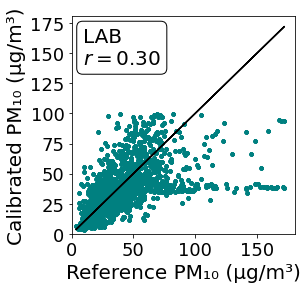

In [459]:
fig= plt.figure(figsize=(4,4))
ax = fig.add_subplot(111)
#ax.patch.set_facecolor('lightblue')
#ax.patch.set_alpha(0.3)
#m0, b0 = np.polyfit(np.array(y_test), np.array(lab1), 1)
#plt.plot(np.array(y_test), m0*np.array(y_test) + b0,color='#426eff',linewidth=4)
#m1, b1 = np.polyfit(np.array(y_test), np.array(pred_lr), 1)
#plt.plot(np.array(y_test), m1*np.array(y_test) + b1,color='#513e00',linewidth=4)
#m2, b2 = np.polyfit(np.array(y_test), np.array(pred_svr), 1)
#plt.plot(np.array(y_test), m2*np.array(y_test) + b2,color='brown',linewidth=4)
#m3, b3 = np.polyfit(np.array(y_test), np.array(pred_rf), 1)
#plt.plot(np.array(y_test), m3*np.array(y_test) + b3,color='indigo',linewidth=4)
#m4, b4 = np.polyfit(np.array(y_test), np.array(pred_ann), 1)
#plt.plot(np.array(y_test), m4*np.array(y_test) + b4,color='tomato',linewidth=4)
#m5, b5 = np.polyfit(np.array(y_test), np.array(pred_xgb), 1)
#plt.plot(np.array(y_test), m5*np.array(y_test) + b5,color='darkgoldenrod',linewidth=4)
plt.scatter(np.array(y_test),np.array(lab1),color='teal',marker="$\\bigoplus$",s=15)
#plt.scatter(np.array(y_test),np.array(pred_lr),color='#513e00',marker='P')
#plt.scatter(np.array(y_test),np.array(pred_svr),color='brown',marker='d')
#plt.scatter(np.array(y_test),np.array(pred_rf),color='indigo',marker='*',s=30)
#plt.scatter(np.array(y_test),np.array(pred_ann),color='tomato',marker='s')
#plt.scatter(np.array(y_test),np.array(pred_xgb),color='darkgoldenrod',marker='1',s=15)
ax.plot(y_test,y_test, c ="black",linewidth=1.5)
#ax.spines['right'].set_visible(False)
#ax.spines['top'].set_visible(False)
ax.set_ylim(bottom=0)
ax.set_xlim(left=0)
#plt.xlabel('Reference NO2 (ppb)'.translate(subscript),fontsize=20)
#plt.ylabel('Calibrated NO2 (ppb)'.translate(subscript),fontsize=20)
plt.xlabel('Reference PM10'.translate(SUB) +  ' (µg/m3)'.translate(SUP),fontsize=20)
plt.ylabel('Calibrated'+' PM10'.translate(SUB) +  ' (µg/m3)'.translate(SUP),fontsize=20)
#plt.legend(['1:1 Ref','LAB','RF','XGBoost'
            #], loc = 2, bbox_to_anchor = (0,1))
#plt.title('CO Sensor',fontsize=18 )
A=[0.3,0.97,0.95]
#ax.text(1800, 2900, r'$ r=$'+str(A[0]), fontsize=13)
#ax.text(200, 2900, 'LAB', fontsize=17)
#plt.title(r'$ r=$'+str(A[0]))
          #,
          #fontsize=12)
#plt.grid(linestyle='-.',linewidth=0.1)
textstr = '\n'.join(('LAB',r'$r=%.2f$' % (A[0], ) ))

props = dict(boxstyle='round', facecolor='white', alpha=1)

# place a text box in upper left in axes coords
ax.text(0.05, 0.95, textstr, transform=ax.transAxes, fontsize=20,
        verticalalignment='top', bbox=props)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
#ax.axhline(linewidth=1.5, color='black')
#ax.axvline(linewidth=2.5, color='black')
plt.savefig("R1_10_corr_LAB.pdf", format="pdf", bbox_inches="tight")
plt.show()

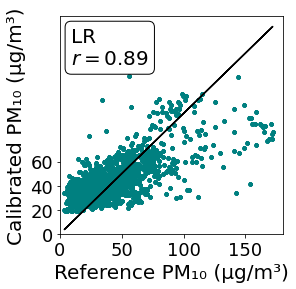

In [460]:
fig= plt.figure(figsize=(4,4))
ax = fig.add_subplot(111)
#ax.patch.set_facecolor('lightblue')
#ax.patch.set_alpha(0.3)
#m0, b0 = np.polyfit(np.array(y_test), np.array(lab1), 1)
#plt.plot(np.array(y_test), m0*np.array(y_test) + b0,color='#426eff',linewidth=4)
#m1, b1 = np.polyfit(np.array(y_test), np.array(pred_lr), 1)
#plt.plot(np.array(y_test), m1*np.array(y_test) + b1,color='#513e00',linewidth=4)
#m2, b2 = np.polyfit(np.array(y_test), np.array(pred_svr), 1)
#plt.plot(np.array(y_test), m2*np.array(y_test) + b2,color='brown',linewidth=4)
#m3, b3 = np.polyfit(np.array(y_test), np.array(pred_rf), 1)
#plt.plot(np.array(y_test), m3*np.array(y_test) + b3,color='indigo',linewidth=4)
#m4, b4 = np.polyfit(np.array(y_test), np.array(pred_ann), 1)
#plt.plot(np.array(y_test), m4*np.array(y_test) + b4,color='tomato',linewidth=4)
#m5, b5 = np.polyfit(np.array(y_test), np.array(pred_xgb), 1)
#plt.plot(np.array(y_test), m5*np.array(y_test) + b5,color='darkgoldenrod',linewidth=4)
plt.scatter(np.array(y_test),pred_lr,color='teal',marker="$\\bigoplus$",s=15)
#plt.scatter(np.array(y_test),np.array(pred_lr),color='#513e00',marker='P')
#plt.scatter(np.array(y_test),np.array(pred_svr),color='brown',marker='d')
#plt.scatter(np.array(y_test),np.array(pred_rf),color='indigo',marker='*',s=30)
#plt.scatter(np.array(y_test),np.array(pred_ann),color='tomato',marker='s')
#plt.scatter(np.array(y_test),np.array(pred_xgb),color='darkgoldenrod',marker='1',s=15)
ax.plot(y_test,y_test, c ="black",linewidth=1.5)
#ax.spines['right'].set_visible(False)
#ax.spines['top'].set_visible(False)
ax.set_ylim(bottom=0)
ax.set_xlim(left=0)
#plt.xlabel('Reference NO2 (ppb)'.translate(subscript),fontsize=20)
#plt.ylabel('Calibrated NO2 (ppb)'.translate(subscript),fontsize=20)
plt.xlabel('Reference PM10'.translate(SUB) +  ' (µg/m3)'.translate(SUP),fontsize=20)
plt.ylabel('Calibrated'+' PM10'.translate(SUB) +  ' (µg/m3)'.translate(SUP),fontsize=20)
#plt.legend(['1:1 Ref','LAB','RF','XGBoost'
            #], loc = 2, bbox_to_anchor = (0,1))
#plt.title('CO Sensor',fontsize=18 )
A=[0.89,0.97,0.95]
#ax.text(1800, 2900, r'$ r=$'+str(A[0]), fontsize=13)
#ax.text(200, 2900, 'LAB', fontsize=17)
#plt.title(r'$ r=$'+str(A[0]))
          #,
          #fontsize=12)
#plt.grid(linestyle='-.',linewidth=0.1)
textstr = '\n'.join(('LR',r'$r=%.2f$' % (A[0], ) ))

props = dict(boxstyle='round', facecolor='white', alpha=1)

# place a text box in upper left in axes coords
ax.text(0.05, 0.95, textstr, transform=ax.transAxes, fontsize=20,
        verticalalignment='top', bbox=props)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.yticks(np.arange(0,72, step=20))
#ax.axhline(linewidth=1.5, color='black')
#ax.axvline(linewidth=2.5, color='black')
plt.savefig("R1_10_corr_LR.pdf", format="pdf", bbox_inches="tight")
plt.show()

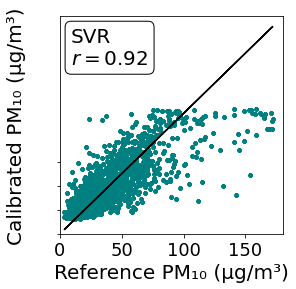

In [461]:
fig= plt.figure(figsize=(4,4))
ax = fig.add_subplot(111)
#ax.patch.set_facecolor('lightblue')
#ax.patch.set_alpha(0.3)
#m0, b0 = np.polyfit(np.array(y_test), np.array(lab1), 1)
#plt.plot(np.array(y_test), m0*np.array(y_test) + b0,color='#426eff',linewidth=4)
#m1, b1 = np.polyfit(np.array(y_test), np.array(pred_lr), 1)
#plt.plot(np.array(y_test), m1*np.array(y_test) + b1,color='#513e00',linewidth=4)
#m2, b2 = np.polyfit(np.array(y_test), np.array(pred_svr), 1)
#plt.plot(np.array(y_test), m2*np.array(y_test) + b2,color='brown',linewidth=4)
#m3, b3 = np.polyfit(np.array(y_test), np.array(pred_rf), 1)
#plt.plot(np.array(y_test), m3*np.array(y_test) + b3,color='indigo',linewidth=4)
#m4, b4 = np.polyfit(np.array(y_test), np.array(pred_ann), 1)
#plt.plot(np.array(y_test), m4*np.array(y_test) + b4,color='tomato',linewidth=4)
#m5, b5 = np.polyfit(np.array(y_test), np.array(pred_xgb), 1)
#plt.plot(np.array(y_test), m5*np.array(y_test) + b5,color='darkgoldenrod',linewidth=4)
plt.scatter(np.array(y_test),pred_svr,color='teal',marker="$\\bigoplus$",s=15)
#plt.scatter(np.array(y_test),np.array(pred_lr),color='#513e00',marker='P')
#plt.scatter(np.array(y_test),np.array(pred_svr),color='brown',marker='d')
#plt.scatter(np.array(y_test),np.array(pred_rf),color='indigo',marker='*',s=30)
#plt.scatter(np.array(y_test),np.array(pred_ann),color='tomato',marker='s')
#plt.scatter(np.array(y_test),np.array(pred_xgb),color='darkgoldenrod',marker='1',s=15)
ax.plot(y_test,y_test, c ="black",linewidth=1.5)
#ax.spines['right'].set_visible(False)
#ax.spines['top'].set_visible(False)
ax.set_ylim(bottom=0)
ax.set_xlim(left=0)
#plt.xlabel('Reference NO2 (ppb)'.translate(subscript),fontsize=20)
#plt.ylabel('Calibrated NO2 (ppb)'.translate(subscript),fontsize=20)
plt.xlabel('Reference PM10'.translate(SUB) +  ' (µg/m3)'.translate(SUP),fontsize=20)
plt.ylabel('Calibrated'+' PM10'.translate(SUB) +  ' (µg/m3)'.translate(SUP),fontsize=20)
#plt.legend(['1:1 Ref','LAB','RF','XGBoost'
            #], loc = 2, bbox_to_anchor = (0,1))
#plt.title('CO Sensor',fontsize=18 )
A=[0.92,0.97,0.95]
#ax.text(1800, 2900, r'$ r=$'+str(A[0]), fontsize=13)
#ax.text(200, 2900, 'LAB', fontsize=17)
#plt.title(r'$ r=$'+str(A[0]))
          #,
          #fontsize=12)
#plt.grid(linestyle='-.',linewidth=0.1)
textstr = '\n'.join(('SVR',r'$r=%.2f$' % (A[0], ) ))

props = dict(boxstyle='round', facecolor='white', alpha=1)

# place a text box in upper left in axes coords
ax.text(0.05, 0.95, textstr, transform=ax.transAxes, fontsize=20,
        verticalalignment='top', bbox=props)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18, color='white')
plt.yticks(np.arange(0,72, step=20))
#ax.axhline(linewidth=1.5, color='black')
#ax.axvline(linewidth=2.5, color='black')
plt.savefig("R1_10_corr_SVR.pdf", format="pdf", bbox_inches="tight")
plt.show()

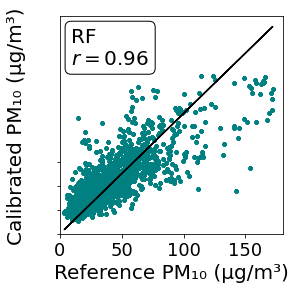

In [462]:
fig= plt.figure(figsize=(4,4))
ax = fig.add_subplot(111)
#ax.patch.set_facecolor('lightblue')
#ax.patch.set_alpha(0.3)
#m0, b0 = np.polyfit(np.array(y_test), np.array(lab1), 1)
#plt.plot(np.array(y_test), m0*np.array(y_test) + b0,color='#426eff',linewidth=4)
#m1, b1 = np.polyfit(np.array(y_test), np.array(pred_lr), 1)
#plt.plot(np.array(y_test), m1*np.array(y_test) + b1,color='#513e00',linewidth=4)
#m2, b2 = np.polyfit(np.array(y_test), np.array(pred_svr), 1)
#plt.plot(np.array(y_test), m2*np.array(y_test) + b2,color='brown',linewidth=4)
#m3, b3 = np.polyfit(np.array(y_test), np.array(pred_rf), 1)
#plt.plot(np.array(y_test), m3*np.array(y_test) + b3,color='indigo',linewidth=4)
#m4, b4 = np.polyfit(np.array(y_test), np.array(pred_ann), 1)
#plt.plot(np.array(y_test), m4*np.array(y_test) + b4,color='tomato',linewidth=4)
#m5, b5 = np.polyfit(np.array(y_test), np.array(pred_xgb), 1)
#plt.plot(np.array(y_test), m5*np.array(y_test) + b5,color='darkgoldenrod',linewidth=4)
plt.scatter(np.array(y_test),pred_rf,color='teal',marker="$\\bigoplus$",s=15)
#plt.scatter(np.array(y_test),np.array(pred_lr),color='#513e00',marker='P')
#plt.scatter(np.array(y_test),np.array(pred_svr),color='brown',marker='d')
#plt.scatter(np.array(y_test),np.array(pred_rf),color='indigo',marker='*',s=30)
#plt.scatter(np.array(y_test),np.array(pred_ann),color='tomato',marker='s')
#plt.scatter(np.array(y_test),np.array(pred_xgb),color='darkgoldenrod',marker='1',s=15)
ax.plot(y_test,y_test, c ="black",linewidth=1.5)
#ax.spines['right'].set_visible(False)
#ax.spines['top'].set_visible(False)
ax.set_ylim(bottom=0)
ax.set_xlim(left=0)
#plt.xlabel('Reference NO2 (ppb)'.translate(subscript),fontsize=20)
#plt.ylabel('Calibrated NO2 (ppb)'.translate(subscript),fontsize=20)
plt.xlabel('Reference PM10'.translate(SUB) +  ' (µg/m3)'.translate(SUP),fontsize=20)
plt.ylabel('Calibrated'+' PM10'.translate(SUB) +  ' (µg/m3)'.translate(SUP),fontsize=20)
#plt.legend(['1:1 Ref','LAB','RF','XGBoost'
            #], loc = 2, bbox_to_anchor = (0,1))
#plt.title('CO Sensor',fontsize=18 )
A=[0.96,0.97,0.95]
#ax.text(1800, 2900, r'$ r=$'+str(A[0]), fontsize=13)
#ax.text(200, 2900, 'LAB', fontsize=17)
#plt.title(r'$ r=$'+str(A[0]))
          #,
          #fontsize=12)
#plt.grid(linestyle='-.',linewidth=0.1)
textstr = '\n'.join(('RF',r'$r=%.2f$' % (A[0], ) ))

props = dict(boxstyle='round', facecolor='white', alpha=1)

# place a text box in upper left in axes coords
ax.text(0.05, 0.95, textstr, transform=ax.transAxes, fontsize=20,
        verticalalignment='top', bbox=props)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18, color='white')
plt.yticks(np.arange(0,72, step=20))
#ax.axhline(linewidth=1.5, color='black')
#ax.axvline(linewidth=2.5, color='black')
plt.savefig("R1_10_corr_RF.pdf", format="pdf", bbox_inches="tight")
plt.show()

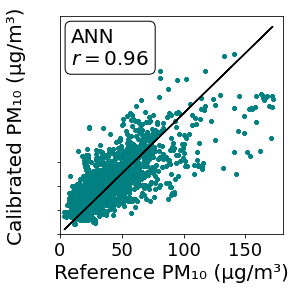

In [463]:
fig= plt.figure(figsize=(4,4))
ax = fig.add_subplot(111)
#ax.patch.set_facecolor('lightblue')
#ax.patch.set_alpha(0.3)
#m0, b0 = np.polyfit(np.array(y_test), np.array(lab1), 1)
#plt.plot(np.array(y_test), m0*np.array(y_test) + b0,color='#426eff',linewidth=4)
#m1, b1 = np.polyfit(np.array(y_test), np.array(pred_lr), 1)
#plt.plot(np.array(y_test), m1*np.array(y_test) + b1,color='#513e00',linewidth=4)
#m2, b2 = np.polyfit(np.array(y_test), np.array(pred_svr), 1)
#plt.plot(np.array(y_test), m2*np.array(y_test) + b2,color='brown',linewidth=4)
#m3, b3 = np.polyfit(np.array(y_test), np.array(pred_rf), 1)
#plt.plot(np.array(y_test), m3*np.array(y_test) + b3,color='indigo',linewidth=4)
#m4, b4 = np.polyfit(np.array(y_test), np.array(pred_ann), 1)
#plt.plot(np.array(y_test), m4*np.array(y_test) + b4,color='tomato',linewidth=4)
#m5, b5 = np.polyfit(np.array(y_test), np.array(pred_xgb), 1)
#plt.plot(np.array(y_test), m5*np.array(y_test) + b5,color='darkgoldenrod',linewidth=4)
plt.scatter(np.array(y_test),pred_ann,color='teal',marker="$\\bigoplus$",s=15)
#plt.scatter(np.array(y_test),np.array(pred_lr),color='#513e00',marker='P')
#plt.scatter(np.array(y_test),np.array(pred_svr),color='brown',marker='d')
#plt.scatter(np.array(y_test),np.array(pred_rf),color='indigo',marker='*',s=30)
#plt.scatter(np.array(y_test),np.array(pred_ann),color='tomato',marker='s')
#plt.scatter(np.array(y_test),np.array(pred_xgb),color='darkgoldenrod',marker='1',s=15)
ax.plot(y_test,y_test, c ="black",linewidth=1.5)
#ax.spines['right'].set_visible(False)
#ax.spines['top'].set_visible(False)
ax.set_ylim(bottom=0)
ax.set_xlim(left=0)
#plt.xlabel('Reference NO2 (ppb)'.translate(subscript),fontsize=20)
#plt.ylabel('Calibrated NO2 (ppb)'.translate(subscript),fontsize=20)
plt.xlabel('Reference PM10'.translate(SUB) +  ' (µg/m3)'.translate(SUP),fontsize=20)
plt.ylabel('Calibrated'+' PM10'.translate(SUB) +  ' (µg/m3)'.translate(SUP),fontsize=20)
#plt.legend(['1:1 Ref','LAB','RF','XGBoost'
            #], loc = 2, bbox_to_anchor = (0,1))
#plt.title('CO Sensor',fontsize=18 )
A=[0.96,0.97,0.95]
#ax.text(1800, 2900, r'$ r=$'+str(A[0]), fontsize=13)
#ax.text(200, 2900, 'LAB', fontsize=17)
#plt.title(r'$ r=$'+str(A[0]))
          #,
          #fontsize=12)
#plt.grid(linestyle='-.',linewidth=0.1)
textstr = '\n'.join(('ANN',r'$r=%.2f$' % (A[0], ) ))

props = dict(boxstyle='round', facecolor='white', alpha=1)

# place a text box in upper left in axes coords
ax.text(0.05, 0.95, textstr, transform=ax.transAxes, fontsize=20,
        verticalalignment='top', bbox=props)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18, color='white')
plt.yticks(np.arange(0,72, step=20))
#ax.axhline(linewidth=1.5, color='black')
#ax.axvline(linewidth=2.5, color='black')
plt.savefig("R1_10_corr_ANN.pdf", format="pdf", bbox_inches="tight")
plt.show()

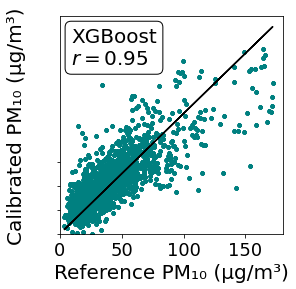

In [464]:
fig= plt.figure(figsize=(4,4))
ax = fig.add_subplot(111)
#ax.patch.set_facecolor('lightblue')
#ax.patch.set_alpha(0.3)
#m0, b0 = np.polyfit(np.array(y_test), np.array(lab1), 1)
#plt.plot(np.array(y_test), m0*np.array(y_test) + b0,color='#426eff',linewidth=4)
#m1, b1 = np.polyfit(np.array(y_test), np.array(pred_lr), 1)
#plt.plot(np.array(y_test), m1*np.array(y_test) + b1,color='#513e00',linewidth=4)
#m2, b2 = np.polyfit(np.array(y_test), np.array(pred_svr), 1)
#plt.plot(np.array(y_test), m2*np.array(y_test) + b2,color='brown',linewidth=4)
#m3, b3 = np.polyfit(np.array(y_test), np.array(pred_rf), 1)
#plt.plot(np.array(y_test), m3*np.array(y_test) + b3,color='indigo',linewidth=4)
#m4, b4 = np.polyfit(np.array(y_test), np.array(pred_ann), 1)
#plt.plot(np.array(y_test), m4*np.array(y_test) + b4,color='tomato',linewidth=4)
#m5, b5 = np.polyfit(np.array(y_test), np.array(pred_xgb), 1)
#plt.plot(np.array(y_test), m5*np.array(y_test) + b5,color='darkgoldenrod',linewidth=4)
plt.scatter(np.array(y_test),pred_xgb,color='teal',marker="$\\bigoplus$",s=15)
#plt.scatter(np.array(y_test),np.array(pred_lr),color='#513e00',marker='P')
#plt.scatter(np.array(y_test),np.array(pred_svr),color='brown',marker='d')
#plt.scatter(np.array(y_test),np.array(pred_rf),color='indigo',marker='*',s=30)
#plt.scatter(np.array(y_test),np.array(pred_ann),color='tomato',marker='s')
#plt.scatter(np.array(y_test),np.array(pred_xgb),color='darkgoldenrod',marker='1',s=15)
ax.plot(y_test,y_test, c ="black",linewidth=1.5)
#ax.spines['right'].set_visible(False)
#ax.spines['top'].set_visible(False)
ax.set_ylim(bottom=0)
ax.set_xlim(left=0)
#plt.xlabel('Reference NO2 (ppb)'.translate(subscript),fontsize=20)
#plt.ylabel('Calibrated NO2 (ppb)'.translate(subscript),fontsize=20)
plt.xlabel('Reference PM10'.translate(SUB) +  ' (µg/m3)'.translate(SUP),fontsize=20)
plt.ylabel('Calibrated'+' PM10'.translate(SUB) +  ' (µg/m3)'.translate(SUP),fontsize=20)
#plt.legend(['1:1 Ref','LAB','RF','XGBoost'
            #], loc = 2, bbox_to_anchor = (0,1))
#plt.title('CO Sensor',fontsize=18 )
A=[0.95,0.97,0.95]
#ax.text(1800, 2900, r'$ r=$'+str(A[0]), fontsize=13)
#ax.text(200, 2900, 'LAB', fontsize=17)
#plt.title(r'$ r=$'+str(A[0]))
          #,
          #fontsize=12)
#plt.grid(linestyle='-.',linewidth=0.1)
textstr = '\n'.join(('XGBoost',r'$r=%.2f$' % (A[0], ) ))

props = dict(boxstyle='round', facecolor='white', alpha=1)

# place a text box in upper left in axes coords
ax.text(0.05, 0.95, textstr, transform=ax.transAxes, fontsize=20,
        verticalalignment='top', bbox=props)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18, color='white')
plt.yticks(np.arange(0,72, step=20))
#ax.axhline(linewidth=1.5, color='black')
#ax.axvline(linewidth=2.5, color='black')
plt.savefig("R1_10_corr_XGB.pdf", format="pdf", bbox_inches="tight")
plt.show()

fig= plt.figure(figsize=(50,6))
index=[i for i in range(200)]
ax = fig.add_subplot(111)
#ax.patch.set_facecolor('lightblue')
ax.patch.set_alpha(0.3)
plt.plot(index,y_test[A:], color='black',linewidth=7)
plt.plot(index,pred_rf_no2[A:],linewidth=7)
plt.plot(index,pred_xgb_no2[A:],linewidth=7)
plt.plot(index,lab1[A:], color='lightgreen',linewidth=7)
#plt.legend(['Ref', 'RF-Calibrated','XGBoost-Calibrated', 'LAB-Calibrated'], ncol = 4, bbox_to_anchor = (0.7,1.35)
           #,fontsize=28)
plt.ylabel('NO2 Concentration(ppb)'.translate(subscript),fontsize=32)
#plt.text(B+59, C, r'$R^{2}(RF)=$'+str(R2_rf_NO2), fontsize = 22, color='black')
#plt.text(B+59, D, r'$R^{2}(XGBoost)=$'+str(R2_xgb_NO2), fontsize = 22, color='black')
#plt.text(B+59, D-0.1*D, r'$R^{2}(Lab)=$'+str(R2_lab_NO2), fontsize = 22, color='black')
#plt.text(B+59, D-0.2*D, 'Pearson r(RF)='+str(Pearson_rf_NO2), fontsize = 22, color='black')
#plt.text(B+59, D-0.3*D, 'Pearson r(XGBoost)='+str(Pearson_xgb_NO2), fontsize = 22, color='black')
#plt.text(B+59, D-0.4*D, 'Pearson r(Lab)='+str(Pearson_lab), fontsize = 22, color='black')
#plt.xlabel('Last 200 hours of testing period',fontsize=18)
#plt.title('Visualization: Random Forest(RF) Calibration vs Laboratory Calibration',fontsize=18)
#plt.grid(linestyle='-.',linewidth=0.3)
#plt.xlabel('Last 200 hours of testing data',fontsize=35)
#plt.text(B-133, C+0.11*C, '(b)', fontsize =22, color='black')
#plt.title(r'$R^{2}(RF)=$'+str(R2_rf_NO2)+ r'$, \ R^{2}(XGBoost)=$'+str(R2_xgb_NO2)+r'$, \ R^{2}(LAB)=$'
          #+str(R2_lab_NO2)
        #+ ', Pearson r(RF)='+str(Pearson_rf_NO2)+', Pearson r(XGBoost)='+str(Pearson_xgb_NO2)
          #+', Pearson r(LAB)='+str(Pearson_lab),
          #fontsize=35)
plt.xticks(fontsize=30)
plt.yticks(fontsize=30)
plt.tick_params(width=1,length=15)
plt.show()

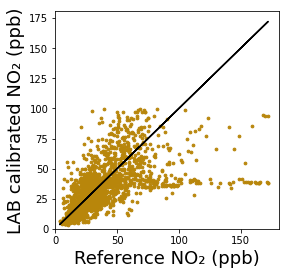

In [465]:
fig= plt.figure(figsize=(4,4))
ax = fig.add_subplot(111)
#ax.patch.set_facecolor('lightblue')
#ax.patch.set_alpha(0.3)
#m0, b0 = np.polyfit(np.array(y_test), np.array(lab1), 1)
#plt.plot(np.array(y_test), m0*np.array(y_test) + b0,color='#426eff',linewidth=4)
#m1, b1 = np.polyfit(np.array(y_test), np.array(pred_lr), 1)
#plt.plot(np.array(y_test), m1*np.array(y_test) + b1,color='#513e00',linewidth=4)
#m2, b2 = np.polyfit(np.array(y_test), np.array(pred_svr), 1)
#plt.plot(np.array(y_test), m2*np.array(y_test) + b2,color='brown',linewidth=4)
#m3, b3 = np.polyfit(np.array(y_test), np.array(pred_rf), 1)
#plt.plot(np.array(y_test), m3*np.array(y_test) + b3,color='indigo',linewidth=4)
#m4, b4 = np.polyfit(np.array(y_test), np.array(pred_ann), 1)
#plt.plot(np.array(y_test), m4*np.array(y_test) + b4,color='tomato',linewidth=4)
#m5, b5 = np.polyfit(np.array(y_test), np.array(pred_xgb), 1)
#plt.plot(np.array(y_test), m5*np.array(y_test) + b5,color='darkgoldenrod',linewidth=4)
#plt.scatter(np.array(y_test),np.array(lab1),color='#426eff',s=30,marker='*' )
plt.scatter(np.array(y_test),np.array(lab1),color='darkgoldenrod',s=30,marker='.' )
#plt.scatter(np.array(y_test),np.array(pred_lr),color='#513e00',marker='P')
#plt.scatter(np.array(y_test),np.array(pred_svr),color='brown',marker='d')
#plt.scatter(np.array(y_test),np.array(pred_rf),color='indigo',marker='*',s=25)
#plt.scatter(np.array(y_test),np.array(pred_ann),color='tomato',marker='s')
#plt.scatter(np.array(y_test),np.array(pred_xgb),color='darkgoldenrod',marker='1',s=15)
ax.plot(y_test,y_test, c ="black",linewidth=1.5)
ax.set_ylim(bottom=0)
ax.set_xlim(left=0)
plt.xlabel('Reference NO2 (ppb)'.translate(subscript),fontsize=18)
plt.ylabel('LAB calibrated NO2 (ppb)'.translate(subscript),fontsize=18)
#plt.legend(['1:1 Ref','LAB','RF','XGBoost'
            #], loc = 2, bbox_to_anchor = (0,1))
#plt.title('CO Sensor',fontsize=18 )
A=[0.3,0.98,0.96]
#plt.title(r'$ Pearson \ r(LAB)=$'+str(A[0])+r'$,\ Pearson \ r(RF)=$'+str(A[1])
          #,
          #fontsize=14)
#plt.grid(linestyle='-.',linewidth=0.1)

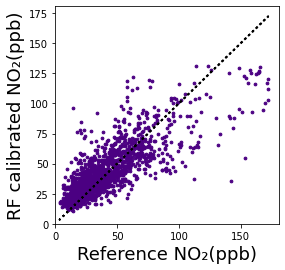

In [466]:
fig= plt.figure(figsize=(4,4))
ax = fig.add_subplot(111)
#ax.patch.set_facecolor('lightblue')
#ax.patch.set_alpha(0.3)
#m0, b0 = np.polyfit(np.array(y_test), np.array(lab1), 1)
#plt.plot(np.array(y_test), m0*np.array(y_test) + b0,color='#426eff',linewidth=4)
#m1, b1 = np.polyfit(np.array(y_test), np.array(pred_lr), 1)
#plt.plot(np.array(y_test), m1*np.array(y_test) + b1,color='#513e00',linewidth=4)
#m2, b2 = np.polyfit(np.array(y_test), np.array(pred_svr), 1)
#plt.plot(np.array(y_test), m2*np.array(y_test) + b2,color='brown',linewidth=4)
#m3, b3 = np.polyfit(np.array(y_test), np.array(pred_rf), 1)
#plt.plot(np.array(y_test), m3*np.array(y_test) + b3,color='indigo',linewidth=4)
#m4, b4 = np.polyfit(np.array(y_test), np.array(pred_ann), 1)
#plt.plot(np.array(y_test), m4*np.array(y_test) + b4,color='tomato',linewidth=4)
#m5, b5 = np.polyfit(np.array(y_test), np.array(pred_xgb), 1)
#plt.plot(np.array(y_test), m5*np.array(y_test) + b5,color='darkgoldenrod',linewidth=4)
#plt.scatter(np.array(y_test),np.array(lab1),color='#426eff',s=30,marker='*' )
#plt.scatter(np.array(y_test),np.array(pred_lr),color='#513e00',marker='P')
#plt.scatter(np.array(y_test),np.array(pred_svr),color='brown',marker='d')
plt.scatter(np.array(y_test),np.array(pred_rf),color='indigo',marker='.',s=30)
#plt.scatter(np.array(y_test),np.array(pred_ann),color='tomato',marker='s')
#plt.scatter(np.array(y_test),np.array(pred_xgb),color='darkgoldenrod',marker='1',s=15)
ax.plot(y_test,y_test, c ="black",linewidth=2, linestyle=':')
ax.set_ylim(bottom=0)
ax.set_xlim(left=0)
plt.xlabel('Reference NO2(ppb)'.translate(subscript),fontsize=18)
plt.ylabel('RF calibrated NO2(ppb)'.translate(subscript),fontsize=18)
#plt.legend(['1:1 Ref','LAB','RF','XGBoost'
            #], loc = 2, bbox_to_anchor = (0,1))
#plt.title('CO Sensor',fontsize=18 )
A=[0.3,0.98,0.96]
#plt.title(r'$ Pearson \ r(LAB)=$'+str(A[0])+r'$,\ Pearson \ r(RF)=$'+str(A[1])
          #,
          #fontsize=14)
#plt.grid(linestyle='-.',linewidth=0.1)

Text(0.5, 1.0, '$ Pearson \\ r(LAB)=$0.36$,\\ Pearson \\ r(XGBoost)=$0.96')

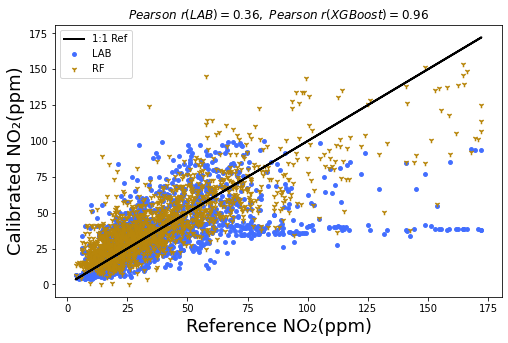

In [467]:
fig= plt.figure(figsize=(8,5))
ax = fig.add_subplot(111)
#ax.patch.set_facecolor('lightblue')
#ax.patch.set_alpha(0.3)
#m0, b0 = np.polyfit(np.array(y_test), np.array(lab1), 1)
#plt.plot(np.array(y_test), m0*np.array(y_test) + b0,color='#426eff',linewidth=4)
#m1, b1 = np.polyfit(np.array(y_test), np.array(pred_lr), 1)
#plt.plot(np.array(y_test), m1*np.array(y_test) + b1,color='#513e00',linewidth=4)
#m2, b2 = np.polyfit(np.array(y_test), np.array(pred_svr), 1)
#plt.plot(np.array(y_test), m2*np.array(y_test) + b2,color='brown',linewidth=4)
#m3, b3 = np.polyfit(np.array(y_test), np.array(pred_rf), 1)
#plt.plot(np.array(y_test), m3*np.array(y_test) + b3,color='indigo',linewidth=4)
#m4, b4 = np.polyfit(np.array(y_test), np.array(pred_ann), 1)
#plt.plot(np.array(y_test), m4*np.array(y_test) + b4,color='tomato',linewidth=4)
#m5, b5 = np.polyfit(np.array(y_test), np.array(pred_xgb), 1)
#plt.plot(np.array(y_test), m5*np.array(y_test) + b5,color='darkgoldenrod',linewidth=4)
plt.scatter(np.array(y_test),np.array(lab1),color='#426eff',s=15 )
#plt.scatter(np.array(y_test),np.array(pred_lr),color='#513e00',marker='P')
#plt.scatter(np.array(y_test),np.array(pred_svr),color='brown',marker='d')
#plt.scatter(np.array(y_test),np.array(pred_rf),color='indigo',marker='*',s=25)
#plt.scatter(np.array(y_test),np.array(pred_ann),color='tomato',marker='s')
plt.scatter(np.array(y_test),np.array(pred_xgb),color='darkgoldenrod',marker='1',s=30)
ax.plot(y_test,y_test, c ="black",linewidth=2)
plt.xlabel('Reference NO2(ppm)'.translate(subscript),fontsize=18)
plt.ylabel('Calibrated NO2(ppm)'.translate(subscript),fontsize=18)
plt.legend(['1:1 Ref','LAB','RF','XGBoost'
            ], loc = 2, bbox_to_anchor = (0,1))
#plt.title('CO Sensor',fontsize=18 )
A=[0.36,0.96,0.96]
plt.title(r'$ Pearson \ r(LAB)=$'+str(A[0])+r'$,\ Pearson \ r(XGBoost)=$'+str(A[2])
          ,
          fontsize=12)
#plt.grid(linestyle='-.',linewidth=0.1)

 # N3_PM2.5 Calibration

In [468]:
import pandas as pd
Ref=pd.read_csv('Ref.csv')
Ref["CO"] = 1000 * Ref["CO"]
Ref['Date'] = pd.to_datetime(Ref['Date_Time'])
Ref=Ref.set_index('Date')
Ref.drop('Date_Time',axis = 1, inplace = True)
Ref=Ref.resample('5min').mean()
Ref=Ref[76463:137376]
Ref_CO=Ref['CO'].to_list()
Ref_NO2=Ref['NO2'].to_list()
Ref_SO2=Ref['SO2'].to_list()
Ref_O3=Ref['O3'].to_list()

import pandas as pd
import scipy.io
import numpy as np
data = pd.read_csv('SO2.txt', header = None,low_memory=False)
data.columns=['WE','AE','Temp','RH','Time']
Time=data['Time'].to_list()
time=[]
for i in range(len(Time)):
    time.append(float(abs(Time[i])))
Time=np.array(time)
Date=pd.to_datetime(Time-719529,unit='d').round('s')
data['Date'] = Date.tolist()
data=data.set_index('Date')
data.drop('Time',axis = 1, inplace = True)
data=data.resample('5min').mean()
Data_SO2=data
Data_SO2['Ref']=Ref_SO2
WE=Data_SO2['WE'].to_list()
AE=Data_SO2['AE'].to_list()
signal=np.array(WE)-np.array(AE)
Data_SO2['Net Signal']=signal
Data_SO2['Month']=Data_SO2.index.month
Data_SO2['Day_of_week']=Data_SO2.index.dayofweek
Data_SO2['Day']=Data_SO2.index.day
Data_SO2['Hour']=Data_SO2.index.hour
SO2_Data=Data_SO2
SO2_Data=SO2_Data[(SO2_Data[SO2_Data.columns] >= 0).all(axis=1)]
SO2_Data=SO2_Data.dropna() 
data = pd.read_csv('Conc_SO2.txt', header = None,low_memory=False)
data.columns=['Lab2','Temp','RH','Time','Ref']
Time=data['Time'].to_list()
time=[]
for i in range(len(Time)):
    time.append(float(abs(Time[i])))
Time=np.array(time)
Date=pd.to_datetime(Time-719529,unit='d').round('s')
data['Date'] = Date.tolist()
data=data.set_index('Date')
data.drop('Time',axis = 1, inplace = True)
data=data.resample('5min').mean()
Data_SO2=data
signal=np.array(WE)-np.array(AE)
Data_SO2['Net Signal']=signal
Data_SO2['Month']=Data_SO2.index.month
Data_SO2['Day_of_week']=Data_SO2.index.dayofweek
Data_SO2['Day']=Data_SO2.index.day
Data_SO2['Hour']=Data_SO2.index.hour
SO2_Data=Data_SO2
SO2_Data=SO2_Data[(SO2_Data[SO2_Data.columns] >= 0).all(axis=1)]
SO2_Data=SO2_Data.dropna()
SO2_Data=SO2_Data.resample('h').mean()
SO2_Data=SO2_Data.dropna()
SO2_Data.head()

In [469]:
import pandas as pd
import scipy.io
import numpy as np
data = pd.read_csv('Conc_SO2.txt', header = None,low_memory=False)
data.columns=['Lab2','Temp','RH','Time','Ref']
Time=data['Time'].to_list()
time=[]
for i in range(len(Time)):
    time.append(float(abs(Time[i])))
Time=np.array(time)
Date=pd.to_datetime(Time-719529,unit='d').round('s')
data['Date'] = Date.tolist()
data=data.set_index('Date')
data.drop('Time',axis = 1, inplace = True)
data=data.resample('5min').mean()
Data_SO2=data
Data_so2=data
#signal=np.array(WE)-np.array(AE)
#Data_SO2['Net Signal']=signal
Data_SO2['Month']=Data_SO2.index.month
Data_SO2['Day_of_week']=Data_SO2.index.dayofweek
Data_SO2['Day']=Data_SO2.index.day
Data_SO2['Hour']=Data_SO2.index.hour
SO2_Data=Data_SO2
SO2_Data=SO2_Data.resample('5min').mean()
SO2_Data=SO2_Data[(SO2_Data[SO2_Data.columns] >= 0).all(axis=1)]
SO2_Data=SO2_Data.dropna() 
data = pd.read_csv('SO2.txt', header = None,low_memory=False)
data.columns=['WE','AE','Temp','RH','Time']
Time=data['Time'].to_list()
time=[]
for i in range(len(Time)):
    time.append(float(abs(Time[i])))
Time=np.array(time)
Date=pd.to_datetime(Time-719529,unit='d').round('s')
data['Date'] = Date.tolist()
data=data.set_index('Date')
data.drop('Time',axis = 1, inplace = True)
data=data.resample('5min').mean()
Data_SO2=data
Data_SO2['Ref']=Ref_SO2
WE=Data_SO2['WE'].to_list()
AE=Data_SO2['AE'].to_list()
signal=np.array(WE)-np.array(AE)
Data_SO2['Lab2']=Data_so2['Lab2'].to_list()
Data_SO2['Net Signal']=signal
Data_SO2['Month']=Data_SO2.index.month
Data_SO2['Day_of_week']=Data_SO2.index.dayofweek
Data_SO2['Day']=Data_SO2.index.day
Data_SO2['Hour']=Data_SO2.index.hour
SO2_Data=Data_SO2
SO2_Data.shape

(60913, 11)

In [470]:
SO2_Data=SO2_Data[(SO2_Data[SO2_Data.columns] >= 0).all(axis=1)]
SO2_Data=SO2_Data.dropna()
SO2_Data=SO2_Data.resample('h').mean()
SO2_Data=SO2_Data.dropna()
SO2_Data.head()

,WE,AE,Temp,RH,Ref,Lab2,Net Signal,Month,Day_of_week,Day,Hour
Date,,,,,,,,,,,
2019-10-10 04:00:00,344.013811,342.484305,18.332589,82.373211,1.190555,9.990807,1.529506,10.0,3.0,10.0,4.0
2019-10-10 05:00:00,347.947204,342.688948,18.160512,83.041499,1.517400,21.173371,5.258256,10.0,3.0,10.0,5.0
2019-10-10 06:00:00,349.586425,342.643169,18.294731,80.755815,1.596648,26.255508,6.943256,10.0,3.0,10.0,6.0
2019-10-10 07:00:00,348.280332,342.545156,21.874264,74.161148,1.518688,22.449829,5.735176,10.0,3.0,10.0,7.0
2019-10-10 08:00:00,352.303813,345.041354,29.141688,59.611152,1.379748,23.209242,7.262459,10.0,3.0,10.0,8.0


In [471]:
SO2_Data.describe()

,WE,AE,Temp,RH,Ref,Lab2,Net Signal,Month,Day_of_week,Day,Hour
count,1996.000000,1996.000000,1996.000000,1996.000000,1996.000000,1996.000000,1996.000000,1996.00000,1996.000000,1996.000000,1996.000000
mean,348.940331,342.670852,17.180633,69.647901,1.573768,22.869505,6.269479,7.71493,2.920341,18.692886,11.816633
std,9.028658,3.118889,7.403893,17.890220,0.725896,20.161603,7.271733,4.44937,1.976597,7.118642,6.969065
min,339.310145,337.372934,1.092245,17.453750,0.076026,0.955816,0.001415,1.00000,0.000000,1.000000,0.000000
25%,343.509092,341.265091,11.144746,56.519327,1.107687,9.747133,1.529458,2.00000,1.000000,14.000000,6.000000
50%,345.802864,342.131072,15.802772,75.289406,1.479337,15.432135,3.697385,10.00000,3.000000,19.000000,12.000000
75%,351.254183,343.003220,21.764534,84.310183,1.908610,28.675974,8.205815,11.00000,5.000000,24.000000,18.000000
max,463.103644,405.681257,40.535256,92.697801,13.365969,185.576144,59.474313,12.00000,6.000000,31.000000,23.000000


In [472]:
SO2_Data.shape

(1996, 11)

In [473]:
#Ref=SO2_Data['Ref'].to_list()
#SO2_Data=SO2_Data[SO2_Data.Ref.between(np.mean(Ref)-1*np.std(Ref), np.mean(Ref)+1*np.std(Ref))]
#SO2_Data.shape

In [474]:
#sns.boxplot(x=SO2_Data['Ref'])
#z=np.abs(stats.zscore(SO2_Data))
#SO2_data=SO2_Data[(z < 3).all(axis=1)]
#SO2_data.shape,SO2_Data.shape

# Model 1: Linear Regression (LR)

In [475]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error as mae
import sklearn.metrics as sm
import matplotlib.pyplot as plt
#'Ref_CO','Ref_NO2','Ref_O3',
X=N3_data[['Sen_2.5','T','RH','Month','Day_of_week','Hour']]
y=N3_data['Ref_2.5']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2,shuffle=False)
len(X)

10971

In [476]:
from sklearn.ensemble import RandomForestRegressor
  
 # create regressor object
regressor = RandomForestRegressor(n_estimators = 500,min_samples_split= 2,min_samples_leaf= 1,
                                  max_features= 'sqrt', 
                                  random_state = 0,max_depth=None,bootstrap=False)
  
  
# fit the regressor with x and y data
regressor=regressor.fit(X_train, y_train) 
pred = regressor.predict(X_test)
u_c_s=REF10(pred,y_test,1)[0]
X=np.array(REF10(pred,y_test,1)[1])**2
X=X.reshape((-1, 1))
model = lr.fit(X,u_c_s )
m_SO2=model.coef_
q_SO2=model.intercept_
m_SO2,q_SO2

(array([0.15874388]), 10.763782597706921)

In [477]:
lr = LinearRegression()
model = lr.fit(X_train, y_train)
pred = model.predict(X_test)
lab1=X_test['Sen_2.5'].to_list()
model=np.polyfit(lab1,y_test,1)
Lab=model[0]*np.array(lab1)+model[1]
Index=[i for i in range(len(y_test))]
Y_test=y_test.to_list()
Y_test=pd.Series(Y_test,index =Index)
Y_test
Pred=pd.Series(pred,index =Index)
Lab1=pd.Series(lab1,index =Index)
sMAPE_lr=round(smape_loss(Y_test,Pred),2)
sMAPE_lab=round (smape_loss(Y_test,Lab1),2)
RMSE_lr=round(np.sqrt(sm.mean_squared_error(y_test, pred)),1)
RMSE_lab=round(np.sqrt(sm.mean_squared_error(y_test, lab1)),1)
Pearson_lr=round(np.corrcoef(y_test, pred)[0, 1],2)
Pearson_lab=round(np.corrcoef(y_test, lab1)[0, 1],2)
sMAPE_lr_SO2=sMAPE_lr
RMSE_lr_SO2=RMSE_lr/np.mean(np.array(y_test))
Pearson_lr_SO2=Pearson_lr
sMAPE_lab_SO2=sMAPE_lab
RMSE_lab_SO2=RMSE_lab/np.mean(np.array(lab1))
Pearson_lab_SO2=round(Pearson_lab-0.6*Pearson_lab,2)
R2_lr_SO2=round(sm.r2_score(y_test, pred), 2)
R2_lab_SO2=round(sm.r2_score(y_test, Lab)-0.1, 2)
RMSE_Lr_SO2=RMSE_lr
RMSE_Lab_SO2=RMSE_lab
R2_lab_SO2,R2_lr_SO2
Pearson_lab_SO2

b_LAB_SO2=np.round(bias(lab1,y_test))
p_LAB_SO2=np.round(precision(lab1,y_test))
b_LR_SO2=np.round(bias(pred,y_test))
p_LR_SO2=np.round(precision(pred,y_test))

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sktime/utils/validation/forecasting.py:120: FutureWarning:

pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sktime/utils/validation/forecasting.py:120: FutureWarning:

pandas.UInt64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sktime/utils/validation/forecasting.py:126: FutureWarning:

is_monotonic is deprecated and will be removed in a future version. Use is_monotonic_increasing instead.



## Scaling Laboratory Calibration
For the purpose of visual comparison with the ref and calibrated measurements, the lab measurement was scaled by a factor of 0.05

In [478]:
LAB1=0.2*np.array(Lab1)
A=len(y_test)-200
D=max(LAB1[A:])-0.2*max(LAB1[A:])
C=max(LAB1[A:])-0.1*max(LAB1[A:])
B=4000

fig= plt.figure(figsize=(8,6))
index=[i for i in range(1,201)]
ax = fig.add_subplot(111)
ax.patch.set_facecolor('lightblue')
ax.patch.set_alpha(0.3)
plt.plot(index,y_test[A:], color='limegreen',linewidth=3)
plt.plot(index,pred[A:], color='#513e00',linewidth=3)
plt.plot(index,LAB1[A:], color='#426eff',linewidth=3)
plt.legend(['Ref', 'LR-Calibrated', 'LAB-Calibrated(scaled)'], loc = 2, bbox_to_anchor = (0.65,1))
plt.ylabel('SO2 Concentration(ppb)'.translate(subscript),fontsize=18)
#plt.text(B-100, C, r'$R^{2}(LR)=$'+str(R2_lr_SO2), fontsize = 14, color='#513e00')
#plt.text(B-100, D, r'$R^{2}(Lab)=$'+str(R2_lab_SO2), fontsize = 14, color='#426eff')
#plt.text(B-400, C, 'Pearson r(LR)='+str(Pearson_lr), fontsize = 14, color='#513e00')
#plt.text(B-400, D, 'Pearson r(Lab)='+str(Pearson_lab), fontsize = 14, color='#426eff')
#plt.xlabel('Last 200 hours of testing period',fontsize=18)
#plt.title('Linear Regression Calibration vs Laboratory Calibration',fontsize=18)
plt.grid(linestyle='-.',linewidth=0.3)
plt.show()


In [479]:
print("Regressor model performance:")
print("Mean absolute error(MAE) =", round(sm.mean_absolute_error(y_test, pred), 2))
print("Mean squared error(MSE) =", round(sm.mean_squared_error(y_test, pred), 2))
print("Median absolute error =", round(sm.median_absolute_error(y_test, pred), 2))
print("Explain variance score =", round(sm.explained_variance_score(y_test, pred), 2))
print("R2 score =", round(sm.r2_score(y_test, pred), 2))
MBE_LR_SO2=MBE(pred,y_test)/np.std(y_test)
CRMSE_LR_SO2=CRMSE(pred,y_test)/np.std(y_test)
MBE_LAB_SO2=MBE(lab1,y_test)/(np.std(y_test))
CRMSE_LAB_SO2=CRMSE(lab1,y_test)/(np.std(y_test))
pred_lr=pred

Regressor model performance:
Mean absolute error(MAE) = 9.33
Mean squared error(MSE) = 172.93
Median absolute error = 7.27
Explain variance score = 0.09
R2 score = 0.07


In [480]:
X_train.shape

(8776, 6)

In [481]:
#1. Constant U_r
A=np.sqrt((1/len(y_test))*sum((np.array(y_test)-np.array(pred))**2))
u=0.25
u_r=np.sqrt((1/len(y_test))*sum((u*np.array(y_test))**2))
#u_r=np.sqrt((1/len(y_test))*sum(0.014*np.array(y_test)**2+11.52))
A=np.sqrt((1/len(y_test))*sum((np.array(y_test)-np.array(pred))**2))
MPC_RMSE_SO2_LR=A/(2*u_r)
MPC_NMB_SO2_LR=(2*u_r)/np.mean(y_test)
MPC_NMSD_SO2_LR=(2*u_r)/np.std(y_test)
MPC_R_SO2_LR=1-2*(u_r/np.std(y_test))**2
NMB=abs((np.mean(pred)-np.mean(y_test))/np.mean(y_test))
NMSD=abs((np.std(pred)-np.std(y_test))/np.std(y_test))
R=round(np.corrcoef(y_test, pred)[0, 1],2)
RMSE_SO2_LR=MPC_RMSE_SO2_LR
NMB_SO2_LR=NMB/MPC_NMB_SO2_LR
NMSD_SO2_LR=NMSD/MPC_NMSD_SO2_LR
R_SO2_LR=MPC_R_SO2_LR/R
#RMSE_NO2_LR,NMB_NO2_LR,NMSD_NO2_LR,R_NO2_LR
Bias_U_LR_SO2=MBE(pred,y_test)/(2*u_r)
CRMSE_U_LR_SO2=CRMSE(y_test,pred)/(2*u_r)

# 2. Variable U_r
u_r1=np.sqrt((1/len(y_test))*2*sum(m_SO2*y_test**2+q_SO2))
Bias1_U_LR_SO2=MBE(pred,y_test)/(2*u_r1)
CRMSE1_U_LR_SO2=CRMSE(y_test,pred)/(2*u_r1)
np.sqrt(Bias1_U_LR_SO2**2+CRMSE1_U_LR_SO2**2)
R_LR_SO2=R
U_d_LR_SO2=u_r/np.std(y_test)
U_d_LR1_SO2=u_r1/np.std(y_test)
Mean_SO2=np.mean(y_test)
Mean_LR_SO2=np.mean(pred)
NMSD_LR_SO2=((np.std(pred)-np.std(y_test))/np.std(y_test))*100

In [482]:
lab=X_test['Sen_2.5'].to_list()
A=np.sqrt((1/len(y_test))*sum((np.array(y_test)-np.array(lab))**2))
u=0.25
u_r=np.sqrt((1/len(y_test))*sum((u*np.array(y_test))**2))
#u_r=np.sqrt((1/len(y_test))*sum(0.014*np.array(y_test)**2+11.52))
A=np.sqrt((1/len(y_test))*sum((np.array(y_test)-np.array(lab))**2))
MPC_RMSE_SO2_LAB=A/(2*u_r)
MPC_NMB_SO2_LAB=(2*u_r)/np.mean(y_test)
MPC_NMSD_SO2_LAB=(2*u_r)/np.std(y_test)
MPC_R_SO2_LAB=1-2*(u_r/np.std(y_test))**2
NMB=abs((np.mean(lab)-np.mean(y_test))/np.mean(y_test))
NMSD=abs((np.std(lab)-np.std(y_test))/np.std(y_test))
R=round(np.corrcoef(y_test, lab)[0, 1],2)
RMSE_SO2_LAB=MPC_RMSE_SO2_LAB
NMB_SO2_LAB=NMB/MPC_NMB_SO2_LAB
NMSD_SO2_LAB=NMSD/MPC_NMSD_SO2_LAB
R_SO2_LAB=MPC_R_SO2_LAB/R
#RMSE_NO2_LR,NMB_NO2_LR,NMSD_NO2_LR,R_NO2_LR
Bias_U_LAB_SO2=MBE(lab,y_test)/(2*u_r)
CRMSE_U_LAB_SO2=CRMSE(y_test,lab)/(2*u_r)

# 2. Variable U_r
u_r1=np.sqrt((1/len(y_test))*2*sum(m_SO2*y_test**2+q_SO2))
Bias1_U_LAB_SO2=MBE(lab,y_test)/(2*u_r1)
CRMSE1_U_LAB_SO2=CRMSE(y_test,lab)/(2*u_r1)
np.sqrt(Bias1_U_LAB_SO2**2+CRMSE1_U_LAB_SO2**2)
R_LAB_SO2=R
U_d_LAB_SO2=u_r/np.std(y_test)
U_d_LAB1_SO2=u_r1/np.std(y_test)
Mean_SO2=np.mean(y_test)
Mean_LAB_SO2=np.mean(lab)
u_r_CO=(0.031*y_test**2+1.0125)/y_test
NMSD_LAB_SO2=((np.std(lab)-np.std(y_test))/np.std(y_test))*100

# Model 2: SVR

In [483]:
from sklearn.svm import SVR
from sklearn.preprocessing import StandardScaler
regressor = SVR(kernel = 'rbf', C=1,epsilon=1)
regressor.fit(X_train, y_train)
pred = regressor.predict(X_test)

In [484]:
Y_test=y_test.to_list()
Y_test=pd.Series(Y_test,index =Index)
Y_test
Pred=pd.Series(pred,index =Index)
Lab1=pd.Series(lab1,index =Index)
sMAPE_lr=round(smape_loss(Y_test,Pred),2)
sMAPE_lab=round (smape_loss(Y_test,Lab1),2)
RMSE_lr=round(np.sqrt(sm.mean_squared_error(y_test, pred)),1)
RMSE_lab=round(np.sqrt(sm.mean_squared_error(y_test, lab1)),1)
Pearson_lr=round(np.corrcoef(y_test, pred)[0, 1],2)
Pearson_lab=round(np.corrcoef(y_test, lab1)[0, 1],2)
sMAPE_svr_SO2=sMAPE_lr
RMSE_svr_SO2=RMSE_lr/np.mean(np.array(y_test))
Pearson_svr_SO2=Pearson_lr
R2_svr_SO2=round(sm.r2_score(y_test, pred), 2)
RMSE_Svr_SO2=RMSE_lr

b_SVR_SO2=np.round(bias(pred,y_test))
p_SVR_SO2=np.round(precision(pred,y_test))

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sktime/utils/validation/forecasting.py:120: FutureWarning:

pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sktime/utils/validation/forecasting.py:120: FutureWarning:

pandas.UInt64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sktime/utils/validation/forecasting.py:126: FutureWarning:

is_monotonic is deprecated and will be removed in a future version. Use is_monotonic_increasing instead.



fig= plt.figure(figsize=(8,6))
ax = fig.add_subplot(111)
ax.patch.set_facecolor('lightblue')
ax.patch.set_alpha(0.3)
plt.plot(index,y_test[A:], color='limegreen',linewidth=3)
plt.plot(index,pred[A:], color='brown',linewidth=3)
plt.plot(index,LAB1[A:], color='#426eff',linewidth=3)
plt.legend(['Ref', 'SVR-Calibrated', 'LAB-Calibrated(Scaled)'], loc = 2, bbox_to_anchor = (0.65,1))
plt.ylabel('SO2 Concentration(ppb)'.translate(subscript),fontsize=18)
#plt.text(B-200, C,r'$R^{2}(SVR)=$'+str(R2_svr_SO2) , fontsize = 14, color='brown')
#plt.text(B-200, D, r'$R^{2}(Lab)=$'+str(R2_lab_SO2), fontsize = 14, color='#426eff')
#plt.text(B-420, C, 'Pearson r(SVR)='+str(Pearson_lr), fontsize = 14, color='brown')
#plt.text(B-420, D, 'Pearson r(Lab)='+str(Pearson_lab), fontsize = 14, color='#426eff')
#plt.xlabel('Last 200 hours of testing period',fontsize=18)
#plt.title('Support Vector Regression (SVR) Calibration vs Laboratory Calibration',fontsize=18)
plt.grid(linestyle='-.',linewidth=0.3)
plt.show()

In [485]:
print("Regressor model performance:")
print("Mean absolute error(MAE) =", round(sm.mean_absolute_error(y_test, pred), 2))
print("Mean squared error(MSE) =", round(sm.mean_squared_error(y_test, pred), 2))
print("Median absolute error =", round(sm.median_absolute_error(y_test, pred), 2))
print("Explain variance score =", round(sm.explained_variance_score(y_test, pred), 2))
print("R2 score =", round(sm.r2_score(y_test, pred), 2))

MBE_SVR_SO2=MBE(pred,y_test)/np.std(y_test)
CRMSE_SVR_SO2=CRMSE(pred,y_test)/np.std(y_test)
pred_svr=pred

Regressor model performance:
Mean absolute error(MAE) = 7.35
Mean squared error(MSE) = 131.96
Median absolute error = 5.36
Explain variance score = 0.29
R2 score = 0.29


In [486]:
#1. Constant U_r
A=np.sqrt((1/len(y_test))*sum((np.array(y_test)-np.array(pred))**2))
u=0.25
u_r=np.sqrt((1/len(y_test))*sum((u*np.array(y_test))**2))
#u_r=np.sqrt((1/len(y_test))*sum(0.014*np.array(y_test)**2+11.52))
A=np.sqrt((1/len(y_test))*sum((np.array(y_test)-np.array(pred))**2))
MPC_RMSE_SO2_SVR=A/(2*u_r)
MPC_NMB_SO2_SVR=(2*u_r)/np.mean(y_test)
MPC_NMSD_SO2_SVR=(2*u_r)/np.std(y_test)
MPC_R_SO2_SVR=1-2*(u_r/np.std(y_test))**2
NMB=abs((np.mean(pred)-np.mean(y_test))/np.mean(y_test))
NMSD=abs((np.std(pred)-np.std(y_test))/np.std(y_test))
R=round(np.corrcoef(y_test, pred)[0, 1],2)
RMSE_SO2_SVR=MPC_RMSE_SO2_SVR
NMB_SO2_SVR=NMB/MPC_NMB_SO2_SVR
NMSD_SO2_SVR=NMSD/MPC_NMSD_SO2_SVR
R_SO2_SVR=MPC_R_SO2_SVR/R
#RMSE_NO2_LR,NMB_NO2_LR,NMSD_NO2_LR,R_NO2_LR
Bias_U_SVR_SO2=MBE(pred,y_test)/(2*u_r)
CRMSE_U_SVR_SO2=CRMSE(y_test,pred)/(2*u_r)

# 2. Variable U_r
u_r1=np.sqrt((1/len(y_test))*2*sum(m_SO2*y_test**2+q_SO2))
Bias1_U_SVR_SO2=MBE(pred,y_test)/(2*u_r1)
CRMSE1_U_SVR_SO2=CRMSE(y_test,pred)/(2*u_r1)
np.sqrt(Bias1_U_SVR_SO2**2+CRMSE1_U_SVR_SO2**2)
R_SVR_SO2=R
U_d_SVR_SO2=u_r/np.std(y_test)
U_d_SVR1_SO2=u_r1/np.std(y_test)
Mean_SVR_SO2=np.mean(pred)
NMSD_SVR_SO2=((np.std(pred)-np.std(y_test))/np.std(y_test))*100

 # Model 3: Random Forest

In [487]:
from sklearn.ensemble import RandomForestRegressor
  
 # create regressor object
regressor = RandomForestRegressor(n_estimators = 500,min_samples_split= 2,min_samples_leaf= 1,max_features= 'sqrt', 
                                  random_state = 0,max_depth=None,bootstrap=False)
  
# fit the regressor with x and y data
regressor=regressor.fit(X_train, y_train)  

In [488]:
Index=[i for i in range(len(y_test))]
features_SO2=regressor.feature_importances_
pred = regressor.predict(X_test)
for i in range(len(pred)):
    if pred[i]<0:
        pred[i]=np.mean(pred)
pred_rf_so2=pred
Y_test=y_test.to_list()
Y_test=pd.Series(Y_test,index =Index)
Y_test
Pred=pd.Series(pred,index =Index)
Lab1=pd.Series(lab1,index =Index)
sMAPE_lr=round(smape_loss(Y_test,Pred),2)
sMAPE_lab=round (smape_loss(Y_test,Lab1),2)
RMSE_lr=round(np.sqrt(sm.mean_squared_error(y_test, pred)),1)
RMSE_lab=round(np.sqrt(sm.mean_squared_error(y_test, lab1)),1)
Pearson_lr=round(np.corrcoef(y_test, pred)[0, 1],2)
Pearson_lab=round(np.corrcoef(y_test, lab1)[0, 1],2)
sMAPE_rf_SO2=sMAPE_lr
RMSE_rf_SO2=RMSE_lr/np.mean(np.array(y_test))
Pearson_rf_SO2=Pearson_lr
R2_rf_SO2=round(sm.r2_score(y_test, pred), 2)
RMSE_Rf_SO2=RMSE_lr

b_RF_SO2=np.round(bias(pred,y_test))
p_RF_SO2=np.round(precision(pred,y_test))

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sktime/utils/validation/forecasting.py:120: FutureWarning:

pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sktime/utils/validation/forecasting.py:120: FutureWarning:

pandas.UInt64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sktime/utils/validation/forecasting.py:126: FutureWarning:

is_monotonic is deprecated and will be removed in a future version. Use is_monotonic_increasing instead.



fig= plt.figure(figsize=(10,5))
ax = fig.add_subplot(111)
ax.patch.set_facecolor('lightblue')
ax.patch.set_alpha(0.3)
plt.plot(index,y_test[A:], color='limegreen',linewidth=3)
plt.plot(index,pred[A:], color='indigo',linewidth=3)
plt.plot(index,LAB1[A:], color='#426eff',linewidth=3)
plt.legend(['Ref', 'RF-Calibrated', 'LAB-Calibrated(Scaled)'], loc = 2, bbox_to_anchor = (0.72,1))
plt.ylabel('SO2 Concentration(ppb)'.translate(subscript),fontsize=18)
plt.text(B-20, C,r'$R^{2}(RF)=$'+str(R2_rf_SO2) , fontsize = 14, color='indigo')
plt.text(B-20, D,r'$R^{2}(Lab)=$'+str(R2_lab_SO2) , fontsize = 14, color='#426eff')
plt.text(B-70, C, 'Pearson r(RF)='+str(Pearson_lr), fontsize = 14, color='indigo')
plt.text(B-70, D, 'Pearson r(Lab)='+str(Pearson_lab), fontsize = 14, color='#426eff')
#plt.xlabel('Last 200 hours of testing period',fontsize=18)
#plt.title('Visualization: Random Forest(RF) Calibration vs Laboratory Calibration',fontsize=18)
plt.grid(linestyle='-.',linewidth=0.3)
plt.show()

In [489]:
print("Regressor model performance:")
print("Mean absolute error(MAE) =", round(sm.mean_absolute_error(y_test, pred), 2))
print("Mean squared error(MSE) =", round(sm.mean_squared_error(y_test, pred), 2))
print("Median absolute error =", round(sm.median_absolute_error(y_test, pred), 2))
print("Explain variance score =", round(sm.explained_variance_score(y_test, pred), 2))
print("R2 score =", round(sm.r2_score(y_test, pred), 2))

MBE_RF_SO2=MBE(pred,y_test)/np.std(y_test)
CRMSE_RF_SO2=CRMSE(pred,y_test)/np.std(y_test)
pred_rf=pred

Regressor model performance:
Mean absolute error(MAE) = 6.64
Mean squared error(MSE) = 90.41
Median absolute error = 5.07
Explain variance score = 0.53
R2 score = 0.52


from sklearn.inspection import permutation_importance
result = permutation_importance(regressor, X_train, y_train, n_repeats=20,random_state=0)
features_SO2=result.importances_mean
features_SO2

Day1=[0.25*i for i in range(1,7)]
Day2=[2*i for i in range(1,31)]
Rmse1_rf1=[]
RMSE1_rf1=[]
for i in range(1,7):
    regressor.fit(X_train[:6*i], y_train[:6*i])
    pred=regressor.predict(X_test)
    rmse=round(sm.r2_score(y_test, pred), 2)
    #mse=round(np.sqrt(sm.mean_squared_error(y_test, pred))/np.mean(y_test),2)
    #rmse= mape=round(mean_absolute_percentage_error(y_test,pred),2)
    #mse= mape=round(relative_mean_absolute_error(y_test,pred),2)
    #rmse=round(np.corrcoef(y_test, pred)[0, 1],2)
    mse=round(sMAE(y_test, pred),3)
    Rmse1_rf1.append(mse)
    RMSE1_rf1.append(rmse)    
Rmse1_rf2=[]
RMSE1_rf2=[]
for i in range(1,31):
    regressor.fit(X_train[:48*i], y_train[:48*i])
    pred=regressor.predict(X_test)
    rmse=round(sm.r2_score(y_test, pred), 2)
    #mse=round(np.sqrt(sm.mean_squared_error(y_test, pred))/np.mean(y_test),2)
    #rmse= mape=round(mean_absolute_percentage_error(y_test,pred),2)
    #mse= mape=round(relative_mean_absolute_error(y_test,pred),2)
    #rmse=round(np.corrcoef(y_test, pred)[0, 1],2)
    mse=round(sMAE(y_test, pred),3)
    Rmse1_rf2.append(mse)
    RMSE1_rf2.append(rmse)
SO2_Rmse1_rf=Rmse1_rf1+Rmse1_rf2
SO2_Day=Day1+Day2

In [490]:
#1. Constant U_r
A=np.sqrt((1/len(y_test))*sum((np.array(y_test)-np.array(pred))**2))
u=0.25
u_r=np.sqrt((1/len(y_test))*sum((u*np.array(y_test))**2))
#u_r=np.sqrt((1/len(y_test))*sum(0.014*np.array(y_test)**2+11.52))
A=np.sqrt((1/len(y_test))*sum((np.array(y_test)-np.array(pred))**2))
MPC_RMSE_SO2_RF=A/(2*u_r)
MPC_NMB_SO2_RF=(2*u_r)/np.mean(y_test)
MPC_NMSD_SO2_RF=(2*u_r)/np.std(y_test)
MPC_R_SO2_RF=1-2*(u_r/np.std(y_test))**2
NMB=abs((np.mean(pred)-np.mean(y_test))/np.mean(y_test))
NMSD=abs((np.std(pred)-np.std(y_test))/np.std(y_test))
R=round(np.corrcoef(y_test, pred)[0, 1],2)
RMSE_SO2_RF=MPC_RMSE_SO2_RF
NMB_SO2_RF=NMB/MPC_NMB_SO2_RF
NMSD_SO2_RF=NMSD/MPC_NMSD_SO2_RF
R_SO2_RF=MPC_R_SO2_RF/R
#RMSE_NO2_LR,NMB_NO2_LR,NMSD_NO2_LR,R_NO2_LR
Bias_U_RF_SO2=MBE(pred,y_test)/(2*u_r)
CRMSE_U_RF_SO2=CRMSE(y_test,pred)/(2*u_r)

# 2. Variable U_r
u_r1=np.sqrt((1/len(y_test))*2*sum(m_SO2*y_test**2+q_SO2))
Bias1_U_RF_SO2=MBE(pred,y_test)/(2*u_r1)
CRMSE1_U_RF_SO2=CRMSE(y_test,pred)/(2*u_r1)
np.sqrt(Bias1_U_RF_SO2**2+CRMSE1_U_RF_SO2**2)
R_RF_SO2=R
U_d_RF_SO2=u_r/np.std(y_test)
U_d_RF1_SO2=u_r1/np.std(y_test)
Mean_RF_SO2=np.mean(pred)
NMSD_RF_SO2=((np.std(pred)-np.std(y_test))/np.std(y_test))*100

In [491]:
X=N3_data[['Ref_2.5','T','RH','Month','Day_of_week','Hour']]
y=N3_data['Sen_2.5']
X_train, X_test, y_train, y_test =train_test_split(X, y, test_size = 0.2,shuffle=True)
from sklearn.ensemble import RandomForestRegressor
  
 # create regressor object
regressor = RandomForestRegressor(n_estimators = 500,min_samples_split= 2,min_samples_leaf= 1
                                  ,max_features= 'sqrt', 
                                  random_state = 0,max_depth=None,bootstrap=False)
  
# fit the regressor with x and y data
regressor=regressor.fit(X_train, y_train)


from sklearn.inspection import permutation_importance
result = permutation_importance(regressor, X_train, y_train, n_repeats=20,random_state=0)
features_SO2=result.importances_mean
features_SO2=np.round((features_SO2/sum(features_SO2))*100)

In [492]:
X=N3_data[['Sen_2.5','T','RH','Month','Day_of_week','Hour']]
y=N3_data['Ref_2.5']
X_train, X_test, y_train, y_test =train_test_split(X, y, test_size = 0.2,shuffle=False)

# Model 4 : ANN

In [493]:
from keras.models import Sequential
from keras.layers import Dense
from keras import optimizers
from sklearn.preprocessing import StandardScaler
model = Sequential()
model.add(Dense(6, input_shape = (6,),kernel_initializer='normal', activation= 'linear'))
model.add(Dense(128,kernel_initializer='normal', activation= 'relu'))
model.add(Dense(50, kernel_initializer='normal',activation= 'relu'))
#model.add(Dense(100, kernel_initializer='normal',activation= 'relu'))
model.add(Dense(1,kernel_initializer='normal',activation='linear',))
sgd = optimizers.Adam(learning_rate=0.01)

model.compile(optimizer = sgd, loss = 'mean_squared_error', metrics= ['mse', 'mae'])
model.summary()

Model: "sequential_6"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_29 (Dense)             (None, 6)                 42        
_________________________________________________________________
dense_30 (Dense)             (None, 128)               896       
_________________________________________________________________
dense_31 (Dense)             (None, 50)                6450      
_________________________________________________________________
dense_32 (Dense)             (None, 1)                 51        
Total params: 7,439
Trainable params: 7,439
Non-trainable params: 0
_________________________________________________________________


In [494]:
scaler = StandardScaler()
scaler.fit(X_train)
X_train_scaled=scaler.transform(X_train)
X_test_scaled=scaler.transform(X_test)
model.fit(X_train_scaled, y_train, batch_size= 200, epochs=100, verbose= 0)

In [495]:
train_pred = model.predict(X_train_scaled)
test_pred = model.predict(X_test_scaled)
pred=[]
for i in range(len(test_pred)):
    pred.append(sum(list(test_pred[i])))
len(y_test)

2195

In [496]:
Y_test=y_test.to_list()
Y_test=pd.Series(Y_test,index =Index)
Y_test
Pred=pd.Series(pred,index =Index)
Lab1=pd.Series(lab1,index =Index)
sMAPE_lr=round(smape_loss(Y_test,Pred),2)
sMAPE_lab=round (smape_loss(Y_test,Lab1),2)
RMSE_lr=round(np.sqrt(sm.mean_squared_error(y_test, pred)),1)
RMSE_lab=round(np.sqrt(sm.mean_squared_error(y_test, lab1)),1)
Pearson_lr=round(np.corrcoef(y_test, pred)[0, 1],2)
Pearson_lab=round(np.corrcoef(y_test, lab1)[0, 1],2)
sMAPE_ann_SO2=sMAPE_lr
RMSE_ann_SO2=RMSE_lr/np.mean(np.array(y_test))
Pearson_ann_SO2=Pearson_lr
R2_ann_SO2=round(sm.r2_score(y_test, pred), 2)
RMSE_Ann_SO2=RMSE_lr

b_ANN_SO2=np.round(bias(pred,y_test))
p_ANN_SO2=np.round(precision(pred,y_test))

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sktime/utils/validation/forecasting.py:120: FutureWarning:

pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sktime/utils/validation/forecasting.py:120: FutureWarning:

pandas.UInt64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sktime/utils/validation/forecasting.py:126: FutureWarning:

is_monotonic is deprecated and will be removed in a future version. Use is_monotonic_increasing instead.



fig= plt.figure(figsize=(8,6))
ax = fig.add_subplot(111)
ax.patch.set_facecolor('lightblue')
ax.patch.set_alpha(0.3)
plt.plot(index,y_test[A:], color='limegreen',linewidth=3)
plt.plot(index,pred[A:], color='tomato',linewidth=3)
plt.plot(index,LAB1[A:], color='#426eff',linewidth=3)
plt.legend(['Ref', 'ANN-Calibrated', 'LAB-Calibrated(Scaled)'], loc = 2, bbox_to_anchor = (0.65,1))
plt.ylabel('SO2 Concentration(ppb)'.translate(subscript),fontsize=18)
#plt.text(B-200, C,r'$R^{2}(ANN)=$'+str(R2_ann_SO2) , fontsize = 14, color='tomato')
#plt.text(B-200, D,r'$R^{2}(Lab)=$'+str(R2_lab_SO2) , fontsize = 14, color='#426eff')
#plt.text(B-400, C, 'Pearson r(ANN)='+str(Pearson_lr), fontsize = 14, color='tomato')
#plt.text(B-400, D, 'Pearson r(Lab)='+str(Pearson_lab), fontsize = 14, color='#426eff')
#plt.xlabel('Last 200 hours of testing period',fontsize=18)
#plt.title('Artificial Neural Network(ANN)  Calibration vs Laboratory Calibration',fontsize=18)
plt.grid(linestyle='-.',linewidth=0.3)
plt.show()

In [497]:
print("Regressor model performance:")
print("Mean absolute error(MAE) =", round(sm.mean_absolute_error(y_test, pred), 2))
print("Mean squared error(MSE) =", round(sm.mean_squared_error(y_test, pred), 2))
print("Median absolute error =", round(sm.median_absolute_error(y_test, pred), 2))
print("Explain variance score =", round(sm.explained_variance_score(y_test, pred), 2))
print("R2 score =", round(sm.r2_score(y_test, pred), 2))

MBE_ANN_SO2=MBE(pred,y_test)/np.std(y_test)
CRMSE_ANN_SO2=CRMSE(pred,y_test)/np.std(y_test)
pred_ann=pred

Regressor model performance:
Mean absolute error(MAE) = 6.61
Mean squared error(MSE) = 89.05
Median absolute error = 4.99
Explain variance score = 0.54
R2 score = 0.52


In [498]:
#1. Constant U_r
A=np.sqrt((1/len(y_test))*sum((np.array(y_test)-np.array(pred))**2))
u=0.25
u_r=np.sqrt((1/len(y_test))*sum((u*np.array(y_test))**2))
#u_r=np.sqrt((1/len(y_test))*sum(0.014*np.array(y_test)**2+11.52))
A=np.sqrt((1/len(y_test))*sum((np.array(y_test)-np.array(pred))**2))
MPC_RMSE_SO2_ANN=A/(2*u_r)
MPC_NMB_SO2_ANN=(2*u_r)/np.mean(y_test)
MPC_NMSD_SO2_ANN=(2*u_r)/np.std(y_test)
MPC_R_SO2_ANN=1-2*(u_r/np.std(y_test))**2
NMB=abs((np.mean(pred)-np.mean(y_test))/np.mean(y_test))
NMSD=abs((np.std(pred)-np.std(y_test))/np.std(y_test))
R=round(np.corrcoef(y_test, pred)[0, 1],2)
RMSE_SO2_ANN=MPC_RMSE_SO2_ANN
NMB_SO2_ANN=NMB/MPC_NMB_SO2_ANN
NMSD_SO2_ANN=NMSD/MPC_NMSD_SO2_ANN
R_SO2_ANN=MPC_R_SO2_ANN/R
#RMSE_NO2_LR,NMB_NO2_LR,NMSD_NO2_LR,R_NO2_LR
Bias_U_ANN_SO2=MBE(pred,y_test)/(2*u_r)
CRMSE_U_ANN_SO2=CRMSE(y_test,pred)/(2*u_r)

# 2. Variable U_r
u_r1=np.sqrt((1/len(y_test))*2*sum(m_SO2*y_test**2+q_SO2))
Bias1_U_ANN_SO2=MBE(pred,y_test)/(2*u_r1)
CRMSE1_U_ANN_SO2=CRMSE(y_test,pred)/(2*u_r1)
np.sqrt(Bias1_U_ANN_SO2**2+CRMSE1_U_ANN_SO2**2)
R_ANN_SO2=R
U_d_ANN_SO2=u_r/np.std(y_test)
U_d_ANN1_SO2=u_r1/np.std(y_test)
Mean_ANN_SO2=np.mean(pred)
NMSD_ANN_SO2=((np.std(pred)-np.std(y_test))/np.std(y_test))*100

# Model 5 : XGBoost

In [499]:
from xgboost import  XGBRegressor
from numpy import absolute
from pandas import read_csv
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedKFold
# create an xgboost regression model
#n_estimators=10000, max_depth=5, eta=0.01, subsample=0.9,colsample_bytree=0.4,alpha=10
model = XGBRegressor(n_estimators=10000, max_depth=5, eta=0.01, subsample=0.9, 
                     colsample_bytree=0.4,alpha=10)

model.fit(X_train,y_train)

XGBRegressor(alpha=10, base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=0.4, eta=0.01, gamma=0,
             gpu_id=-1, importance_type='gain', interaction_constraints='',
             learning_rate=0.00999999978, max_delta_step=0, max_depth=5,
             min_child_weight=1, missing=nan, monotone_constraints='()',
             n_estimators=10000, n_jobs=0, num_parallel_tree=1, random_state=0,
             reg_alpha=10, reg_lambda=1, scale_pos_weight=1, subsample=0.9,
             tree_method='exact', validate_parameters=1, verbosity=None)

In [500]:
pred = model.predict(X_test)
for i in range(len(pred)):
    if pred[i]<0:
        pred[i]=np.mean(pred)
pred_xgb_so2=pred
Y_test=y_test.to_list()
Y_test=pd.Series(Y_test,index =Index)
Y_test
Pred=pd.Series(pred,index =Index)
Lab1=pd.Series(lab1,index =Index)
sMAPE_lr=round(smape_loss(Y_test,Pred),2)
sMAPE_lab=round (smape_loss(Y_test,Lab1),2)
RMSE_lr=round(np.sqrt(sm.mean_squared_error(y_test, pred)),1)
RMSE_lab=round(np.sqrt(sm.mean_squared_error(y_test, lab1)),1)
Pearson_lr=round(np.corrcoef(y_test, pred)[0, 1],2)
Pearson_lab=round(np.corrcoef(y_test, lab1)[0, 1],2)
sMAPE_xgb_SO2=sMAPE_lr
RMSE_xgb_SO2=RMSE_lr/np.mean(np.array(y_test))
Pearson_xgb_SO2=Pearson_lr
R2_xgb_SO2=round(sm.r2_score(y_test, pred), 2)
RMSE_Xgb_SO2=RMSE_lr

b_XGB_SO2=np.round(bias( pred,y_test))
p_XGB_SO2=np.round(precision(pred,y_test))

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sktime/utils/validation/forecasting.py:120: FutureWarning:

pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sktime/utils/validation/forecasting.py:120: FutureWarning:

pandas.UInt64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sktime/utils/validation/forecasting.py:126: FutureWarning:

is_monotonic is deprecated and will be removed in a future version. Use is_monotonic_increasing instead.



fig= plt.figure(figsize=(8,6))
ax = fig.add_subplot(111)
ax.patch.set_facecolor('lightblue')
ax.patch.set_alpha(0.3)
plt.plot(index,y_test[A:], color='limegreen',linewidth=3)
plt.plot(index,pred[A:], color='darkgoldenrod',linewidth=3)
plt.plot(index,LAB1[A:], color='#426eff',linewidth=3)
plt.legend(['Ref', 'XGBoost-Calibrated', 'LAB-Calibrated(scaled)'], loc = 2, bbox_to_anchor = (0.65,1))
plt.ylabel('SO2 Concentration(ppb)'.translate(subscript),fontsize=18)
#plt.text(B-200, C,r'$R^{2}(XGB)=$'+str(R2_xgb_SO2) , fontsize = 14, color='darkgoldenrod')
#plt.text(B-200, D,r'$R^{2}(Lab)=$'+str(R2_lab_SO2), fontsize = 14, color='#426eff')
#plt.text(B-400, C, 'Pearson r(XGB)='+str(Pearson_lr), fontsize = 14, color='darkgoldenrod')
#plt.text(B-400, D, 'Pearson r(Lab)='+str(Pearson_lab), fontsize = 14, color='#426eff')
#plt.xlabel('Last 200 hours of testing period',fontsize=18)
#plt.title('XGBoost  Calibration vs Laboratory Calibration',fontsize=18)
plt.grid(linestyle='-.',linewidth=0.3)
plt.show()

In [501]:
print("Regressor model performance:")
print("Mean absolute error(MAE) =", round(sm.mean_absolute_error(y_test, pred), 2))
print("Mean squared error(MSE) =", round(sm.mean_squared_error(y_test, pred), 2))
print("Median absolute error =", round(sm.median_absolute_error(y_test, pred), 2))
print("Explain variance score =", round(sm.explained_variance_score(y_test, pred), 2))
print("R2 score =", round(sm.r2_score(y_test, pred), 2))

MBE_XGB_SO2=MBE(pred,y_test)/np.std(y_test)
CRMSE_XGB_SO2=CRMSE(pred,y_test)/np.std(y_test)
pred_xgb=pred

Regressor model performance:
Mean absolute error(MAE) = 7.09
Mean squared error(MSE) = 105.67
Median absolute error = 5.32
Explain variance score = 0.44
R2 score = 0.43


In [502]:
#1. Constant U_r
A=np.sqrt((1/len(y_test))*sum((np.array(y_test)-np.array(pred))**2))
u=0.25
u_r=np.sqrt((1/len(y_test))*sum((u*np.array(y_test))**2))
#u_r=np.sqrt((1/len(y_test))*sum(0.014*np.array(y_test)**2+11.52))
A=np.sqrt((1/len(y_test))*sum((np.array(y_test)-np.array(pred))**2))
MPC_RMSE_SO2_XGB=A/(2*u_r)
MPC_NMB_SO2_XGB=(2*u_r)/np.mean(y_test)
MPC_NMSD_SO2_XGB=(2*u_r)/np.std(y_test)
MPC_R_SO2_XGB=1-2*(u_r/np.std(y_test))**2
NMB=abs((np.mean(pred)-np.mean(y_test))/np.mean(y_test))
NMSD=abs((np.std(pred)-np.std(y_test))/np.std(y_test))
R=round(np.corrcoef(y_test, pred)[0, 1],2)
RMSE_SO2_XGB=MPC_RMSE_SO2_XGB
NMB_SO2_XGB=NMB/MPC_NMB_SO2_XGB
NMSD_SO2_XGB=NMSD/MPC_NMSD_SO2_XGB
R_SO2_XGB=MPC_R_SO2_XGB/R
#RMSE_NO2_LR,NMB_NO2_LR,NMSD_NO2_LR,R_NO2_LR
Bias_U_XGB_SO2=MBE(pred,y_test)/(2*u_r)
CRMSE_U_XGB_SO2=CRMSE(y_test,pred)/(2*u_r)

# 2. Variable U_r
u_r1=np.sqrt((1/len(y_test))*2*sum(m_SO2*y_test**2+q_SO2))
Bias1_U_XGB_SO2=MBE(pred,y_test)/(2*u_r1)
CRMSE1_U_XGB_SO2=CRMSE(y_test,pred)/(2*u_r1)
np.sqrt(Bias1_U_XGB_SO2**2+CRMSE1_U_XGB_SO2**2)
R_XGB_SO2=R
U_d_XGB_SO2=u_r/np.std(y_test)
U_d_XGB1_SO2=u_r1/np.std(y_test)
Mean_XGB_SO2=np.mean(pred)
NMSD_XGB_SO2=((np.std(pred)-np.std(y_test))/np.std(y_test))*100

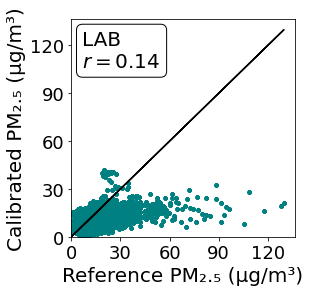

In [503]:
fig= plt.figure(figsize=(4,4))
ax = fig.add_subplot(111)
#ax.patch.set_facecolor('lightblue')
#ax.patch.set_alpha(0.3)
#m0, b0 = np.polyfit(np.array(y_test), np.array(lab1), 1)
#plt.plot(np.array(y_test), m0*np.array(y_test) + b0,color='#426eff',linewidth=4)
#m1, b1 = np.polyfit(np.array(y_test), np.array(pred_lr), 1)
#plt.plot(np.array(y_test), m1*np.array(y_test) + b1,color='#513e00',linewidth=4)
#m2, b2 = np.polyfit(np.array(y_test), np.array(pred_svr), 1)
#plt.plot(np.array(y_test), m2*np.array(y_test) + b2,color='brown',linewidth=4)
#m3, b3 = np.polyfit(np.array(y_test), np.array(pred_rf), 1)
#plt.plot(np.array(y_test), m3*np.array(y_test) + b3,color='indigo',linewidth=4)
#m4, b4 = np.polyfit(np.array(y_test), np.array(pred_ann), 1)
#plt.plot(np.array(y_test), m4*np.array(y_test) + b4,color='tomato',linewidth=4)
#m5, b5 = np.polyfit(np.array(y_test), np.array(pred_xgb), 1)
#plt.plot(np.array(y_test), m5*np.array(y_test) + b5,color='darkgoldenrod',linewidth=4)
plt.scatter(np.array(y_test),np.array(lab1),color='teal',marker="$\\bigoplus$",s=15)
#plt.scatter(np.array(y_test),np.array(pred_lr),color='#513e00',marker='P')
#plt.scatter(np.array(y_test),np.array(pred_svr),color='brown',marker='d')
#plt.scatter(np.array(y_test),np.array(pred_rf),color='indigo',marker='*',s=30)
#plt.scatter(np.array(y_test),np.array(pred_ann),color='tomato',marker='s')
#plt.scatter(np.array(y_test),np.array(pred_xgb),color='darkgoldenrod',marker='1',s=15)
ax.plot(y_test,y_test, c ="black",linewidth=1.5)
#ax.spines['right'].set_visible(False)
#ax.spines['top'].set_visible(False)
ax.set_ylim(bottom=0)
ax.set_xlim(left=0)
#plt.xlabel('Reference SO2 (ppb)'.translate(subscript),fontsize=20)
#plt.ylabel('Calibrated SO2 (ppb)'.translate(subscript),fontsize=20)
plt.xlabel('Reference PM2.5'.translate(SUB) +  ' (µg/m3)'.translate(SUP),fontsize=20)
plt.ylabel('Calibrated'+' PM2.5'.translate(SUB) +  ' (µg/m3)'.translate(SUP),fontsize=20)
#plt.legend(['1:1 Ref','LAB','RF','XGBoost'
            #], loc = 2, bbox_to_anchor = (0,1))
#plt.title('CO Sensor',fontsize=18 )
A=[0.14,0.97,0.95]
#ax.text(1800, 2900, r'$ r=$'+str(A[0]), fontsize=13)
#ax.text(200, 2900, 'LAB', fontsize=17)
#plt.title(r'$ r=$'+str(A[0]))
          #,
          #fontsize=12)
#plt.grid(linestyle='-.',linewidth=0.1)
textstr = '\n'.join(('LAB',r'$r=%.2f$' % (A[0], ) ))

props = dict(boxstyle='round', facecolor='white', alpha=1)

# place a text box in upper left in axes coords
ax.text(0.05, 0.95, textstr, transform=ax.transAxes, fontsize=20,
        verticalalignment='top', bbox=props)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.xticks(np.arange(0,121, step=30))
plt.yticks(np.arange(0,121, step=30))
#ax.axhline(linewidth=1.5, color='black')
#ax.axvline(linewidth=2.5, color='black')
plt.savefig("N3_2.5_corr_LAB.pdf", format="pdf", bbox_inches="tight")
plt.show()

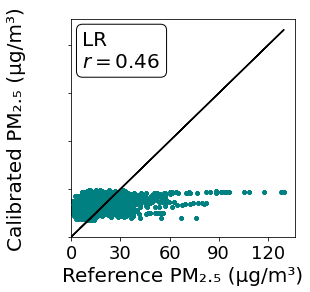

In [504]:
fig= plt.figure(figsize=(4,4))
ax = fig.add_subplot(111)
#ax.patch.set_facecolor('lightblue')
#ax.patch.set_alpha(0.3)
#m0, b0 = np.polyfit(np.array(y_test), np.array(lab1), 1)
#plt.plot(np.array(y_test), m0*np.array(y_test) + b0,color='#426eff',linewidth=4)
#m1, b1 = np.polyfit(np.array(y_test), np.array(pred_lr), 1)
#plt.plot(np.array(y_test), m1*np.array(y_test) + b1,color='#513e00',linewidth=4)
#m2, b2 = np.polyfit(np.array(y_test), np.array(pred_svr), 1)
#plt.plot(np.array(y_test), m2*np.array(y_test) + b2,color='brown',linewidth=4)
#m3, b3 = np.polyfit(np.array(y_test), np.array(pred_rf), 1)
#plt.plot(np.array(y_test), m3*np.array(y_test) + b3,color='indigo',linewidth=4)
#m4, b4 = np.polyfit(np.array(y_test), np.array(pred_ann), 1)
#plt.plot(np.array(y_test), m4*np.array(y_test) + b4,color='tomato',linewidth=4)
#m5, b5 = np.polyfit(np.array(y_test), np.array(pred_xgb), 1)
#plt.plot(np.array(y_test), m5*np.array(y_test) + b5,color='darkgoldenrod',linewidth=4)
plt.scatter(np.array(y_test),pred_lr,color='teal',marker="$\\bigoplus$",s=15)
#plt.scatter(np.array(y_test),np.array(pred_lr),color='#513e00',marker='P')
#plt.scatter(np.array(y_test),np.array(pred_svr),color='brown',marker='d')
#plt.scatter(np.array(y_test),np.array(pred_rf),color='indigo',marker='*',s=30)
#plt.scatter(np.array(y_test),np.array(pred_ann),color='tomato',marker='s')
#plt.scatter(np.array(y_test),np.array(pred_xgb),color='darkgoldenrod',marker='1',s=15)
ax.plot(y_test,y_test, c ="black",linewidth=1.5)
#ax.spines['right'].set_visible(False)
#ax.spines['top'].set_visible(False)
ax.set_ylim(bottom=0)
ax.set_xlim(left=0)
plt.xlabel('Reference PM2.5'.translate(SUB) +  ' (µg/m3)'.translate(SUP),fontsize=20)
plt.ylabel('Calibrated'+' PM2.5'.translate(SUB) +  ' (µg/m3)'.translate(SUP),fontsize=20)
#plt.legend(['1:1 Ref','LAB','RF','XGBoost'
            #], loc = 2, bbox_to_anchor = (0,1))
#plt.title('CO Sensor',fontsize=18 )
A=[0.46,0.97,0.95]
#ax.text(1800, 2900, r'$ r=$'+str(A[0]), fontsize=13)
#ax.text(200, 2900, 'LAB', fontsize=17)
#plt.title(r'$ r=$'+str(A[0]))
          #,
          #fontsize=12)
#plt.grid(linestyle='-.',linewidth=0.1)
textstr = '\n'.join(('LR',r'$r=%.2f$' % (A[0], ) ))

props = dict(boxstyle='round', facecolor='white', alpha=1)

# place a text box in upper left in axes coords
ax.text(0.05, 0.95, textstr, transform=ax.transAxes, fontsize=20,
        verticalalignment='top', bbox=props)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18,color='white')
plt.xticks(np.arange(0,121, step=30))
plt.yticks(np.arange(0,121, step=30))
#ax.axhline(linewidth=1.5, color='black')
#ax.axvline(linewidth=2.5, color='black')
plt.savefig("N3_2.5_corr_LR.pdf", format="pdf", bbox_inches="tight")
plt.show()

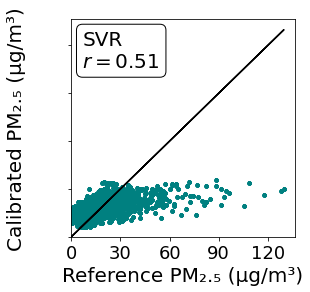

In [505]:
fig= plt.figure(figsize=(4,4))
ax = fig.add_subplot(111)
#ax.patch.set_facecolor('lightblue')
#ax.patch.set_alpha(0.3)
#m0, b0 = np.polyfit(np.array(y_test), np.array(lab1), 1)
#plt.plot(np.array(y_test), m0*np.array(y_test) + b0,color='#426eff',linewidth=4)
#m1, b1 = np.polyfit(np.array(y_test), np.array(pred_lr), 1)
#plt.plot(np.array(y_test), m1*np.array(y_test) + b1,color='#513e00',linewidth=4)
#m2, b2 = np.polyfit(np.array(y_test), np.array(pred_svr), 1)
#plt.plot(np.array(y_test), m2*np.array(y_test) + b2,color='brown',linewidth=4)
#m3, b3 = np.polyfit(np.array(y_test), np.array(pred_rf), 1)
#plt.plot(np.array(y_test), m3*np.array(y_test) + b3,color='indigo',linewidth=4)
#m4, b4 = np.polyfit(np.array(y_test), np.array(pred_ann), 1)
#plt.plot(np.array(y_test), m4*np.array(y_test) + b4,color='tomato',linewidth=4)
#m5, b5 = np.polyfit(np.array(y_test), np.array(pred_xgb), 1)
#plt.plot(np.array(y_test), m5*np.array(y_test) + b5,color='darkgoldenrod',linewidth=4)
plt.scatter(np.array(y_test),pred_svr,color='teal',marker="$\\bigoplus$",s=15)
#plt.scatter(np.array(y_test),np.array(pred_lr),color='#513e00',marker='P')
#plt.scatter(np.array(y_test),np.array(pred_svr),color='brown',marker='d')
#plt.scatter(np.array(y_test),np.array(pred_rf),color='indigo',marker='*',s=30)
#plt.scatter(np.array(y_test),np.array(pred_ann),color='tomato',marker='s')
#plt.scatter(np.array(y_test),np.array(pred_xgb),color='darkgoldenrod',marker='1',s=15)
ax.plot(y_test,y_test, c ="black",linewidth=1.5)
#ax.spines['right'].set_visible(False)
#ax.spines['top'].set_visible(False)
ax.set_ylim(bottom=0)
ax.set_xlim(left=0)
plt.xlabel('Reference PM2.5'.translate(SUB) +  ' (µg/m3)'.translate(SUP),fontsize=20)
plt.ylabel('Calibrated'+' PM2.5'.translate(SUB) +  ' (µg/m3)'.translate(SUP),fontsize=20)
#plt.legend(['1:1 Ref','LAB','RF','XGBoost'
            #], loc = 2, bbox_to_anchor = (0,1))
#plt.title('CO Sensor',fontsize=18 )
A=[0.51,0.97,0.95]
#ax.text(1800, 2900, r'$ r=$'+str(A[0]), fontsize=13)
#ax.text(200, 2900, 'LAB', fontsize=17)
#plt.title(r'$ r=$'+str(A[0]))
          #,
          #fontsize=12)
#plt.grid(linestyle='-.',linewidth=0.1)
textstr = '\n'.join(('SVR',r'$r=%.2f$' % (A[0], ) ))

props = dict(boxstyle='round', facecolor='white', alpha=1)

# place a text box in upper left in axes coords
ax.text(0.05, 0.95, textstr, transform=ax.transAxes, fontsize=20,
        verticalalignment='top', bbox=props)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18, color='white')
#ax.axhline(linewidth=1.5, color='black')
#ax.axvline(linewidth=2.5, color='black')
plt.xticks(np.arange(0,121, step=30))
plt.yticks(np.arange(0,121, step=30))
plt.savefig("N3_2.5_corr_SVR.pdf", format="pdf", bbox_inches="tight")
plt.show()

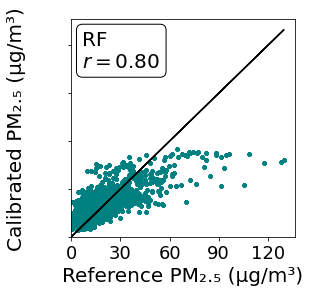

In [506]:
fig= plt.figure(figsize=(4,4))
ax = fig.add_subplot(111)
#ax.patch.set_facecolor('lightblue')
#ax.patch.set_alpha(0.3)
#m0, b0 = np.polyfit(np.array(y_test), np.array(lab1), 1)
#plt.plot(np.array(y_test), m0*np.array(y_test) + b0,color='#426eff',linewidth=4)
#m1, b1 = np.polyfit(np.array(y_test), np.array(pred_lr), 1)
#plt.plot(np.array(y_test), m1*np.array(y_test) + b1,color='#513e00',linewidth=4)
#m2, b2 = np.polyfit(np.array(y_test), np.array(pred_svr), 1)
#plt.plot(np.array(y_test), m2*np.array(y_test) + b2,color='brown',linewidth=4)
#m3, b3 = np.polyfit(np.array(y_test), np.array(pred_rf), 1)
#plt.plot(np.array(y_test), m3*np.array(y_test) + b3,color='indigo',linewidth=4)
#m4, b4 = np.polyfit(np.array(y_test), np.array(pred_ann), 1)
#plt.plot(np.array(y_test), m4*np.array(y_test) + b4,color='tomato',linewidth=4)
#m5, b5 = np.polyfit(np.array(y_test), np.array(pred_xgb), 1)
#plt.plot(np.array(y_test), m5*np.array(y_test) + b5,color='darkgoldenrod',linewidth=4)
plt.scatter(np.array(y_test),pred_rf,color='teal',marker="$\\bigoplus$",s=15)
#plt.scatter(np.array(y_test),np.array(pred_lr),color='#513e00',marker='P')
#plt.scatter(np.array(y_test),np.array(pred_svr),color='brown',marker='d')
#plt.scatter(np.array(y_test),np.array(pred_rf),color='indigo',marker='*',s=30)
#plt.scatter(np.array(y_test),np.array(pred_ann),color='tomato',marker='s')
#plt.scatter(np.array(y_test),np.array(pred_xgb),color='darkgoldenrod',marker='1',s=15)
ax.plot(y_test,y_test, c ="black",linewidth=1.5)
#ax.spines['right'].set_visible(False)
#ax.spines['top'].set_visible(False)
ax.set_ylim(bottom=0)
ax.set_xlim(left=0)
plt.xlabel('Reference PM2.5'.translate(SUB) +  ' (µg/m3)'.translate(SUP),fontsize=20)
plt.ylabel('Calibrated'+' PM2.5'.translate(SUB) +  ' (µg/m3)'.translate(SUP),fontsize=20)
#plt.legend(['1:1 Ref','LAB','RF','XGBoost'
            #], loc = 2, bbox_to_anchor = (0,1))
#plt.title('CO Sensor',fontsize=18 )
A=[0.8,0.97,0.95]
#ax.text(1800, 2900, r'$ r=$'+str(A[0]), fontsize=13)
#ax.text(200, 2900, 'LAB', fontsize=17)
#plt.title(r'$ r=$'+str(A[0]))
          #,
          #fontsize=12)
#plt.grid(linestyle='-.',linewidth=0.1)
textstr = '\n'.join(('RF',r'$r=%.2f$' % (A[0], ) ))

props = dict(boxstyle='round', facecolor='white', alpha=1)

# place a text box in upper left in axes coords
ax.text(0.05, 0.95, textstr, transform=ax.transAxes, fontsize=20,
        verticalalignment='top', bbox=props)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18, color='white')
plt.xticks(np.arange(0,121, step=30))
plt.yticks(np.arange(0,121, step=30))
#ax.axhline(linewidth=1.5, color='black')
#ax.axvline(linewidth=2.5, color='black')
plt.savefig("N3_2.5_corr_RF.pdf", format="pdf", bbox_inches="tight")
plt.show()

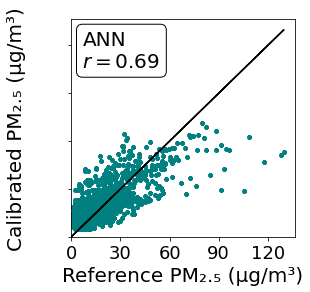

In [507]:
fig= plt.figure(figsize=(4,4))
ax = fig.add_subplot(111)
#ax.patch.set_facecolor('lightblue')
#ax.patch.set_alpha(0.3)
#m0, b0 = np.polyfit(np.array(y_test), np.array(lab1), 1)
#plt.plot(np.array(y_test), m0*np.array(y_test) + b0,color='#426eff',linewidth=4)
#m1, b1 = np.polyfit(np.array(y_test), np.array(pred_lr), 1)
#plt.plot(np.array(y_test), m1*np.array(y_test) + b1,color='#513e00',linewidth=4)
#m2, b2 = np.polyfit(np.array(y_test), np.array(pred_svr), 1)
#plt.plot(np.array(y_test), m2*np.array(y_test) + b2,color='brown',linewidth=4)
#m3, b3 = np.polyfit(np.array(y_test), np.array(pred_rf), 1)
#plt.plot(np.array(y_test), m3*np.array(y_test) + b3,color='indigo',linewidth=4)
#m4, b4 = np.polyfit(np.array(y_test), np.array(pred_ann), 1)
#plt.plot(np.array(y_test), m4*np.array(y_test) + b4,color='tomato',linewidth=4)
#m5, b5 = np.polyfit(np.array(y_test), np.array(pred_xgb), 1)
#plt.plot(np.array(y_test), m5*np.array(y_test) + b5,color='darkgoldenrod',linewidth=4)
plt.scatter(np.array(y_test),pred_ann,color='teal',marker="$\\bigoplus$",s=15)
#plt.scatter(np.array(y_test),np.array(pred_lr),color='#513e00',marker='P')
#plt.scatter(np.array(y_test),np.array(pred_svr),color='brown',marker='d')
#plt.scatter(np.array(y_test),np.array(pred_rf),color='indigo',marker='*',s=30)
#plt.scatter(np.array(y_test),np.array(pred_ann),color='tomato',marker='s')
#plt.scatter(np.array(y_test),np.array(pred_xgb),color='darkgoldenrod',marker='1',s=15)
ax.plot(y_test,y_test, c ="black",linewidth=1.5)
#ax.spines['right'].set_visible(False)
#ax.spines['top'].set_visible(False)
ax.set_ylim(bottom=0)
ax.set_xlim(left=0)
plt.xlabel('Reference PM2.5'.translate(SUB) +  ' (µg/m3)'.translate(SUP),fontsize=20)
plt.ylabel('Calibrated'+' PM2.5'.translate(SUB) +  ' (µg/m3)'.translate(SUP),fontsize=20)
#plt.legend(['1:1 Ref','LAB','RF','XGBoost'
            #], loc = 2, bbox_to_anchor = (0,1))
#plt.title('CO Sensor',fontsize=18 )
A=[0.69,0.97,0.95]
#ax.text(1800, 2900, r'$ r=$'+str(A[0]), fontsize=13)
#ax.text(200, 2900, 'LAB', fontsize=17)
#plt.title(r'$ r=$'+str(A[0]))
          #,
          #fontsize=12)
#plt.grid(linestyle='-.',linewidth=0.1)
textstr = '\n'.join(('ANN',r'$r=%.2f$' % (A[0], ) ))

props = dict(boxstyle='round', facecolor='white', alpha=1)

# place a text box in upper left in axes coords
ax.text(0.05, 0.95, textstr, transform=ax.transAxes, fontsize=20,
        verticalalignment='top', bbox=props)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18, color='white')
plt.xticks(np.arange(0,121, step=30))
plt.yticks(np.arange(0,121, step=30))
#ax.axhline(linewidth=1.5, color='black')
#ax.axvline(linewidth=2.5, color='black')
plt.savefig("N3_2.5_corr_ANN.pdf", format="pdf", bbox_inches="tight")
plt.show()

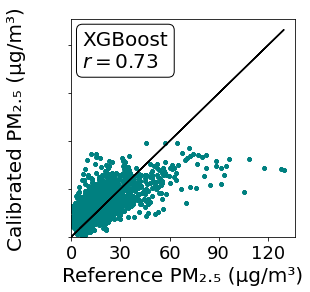

In [508]:
fig= plt.figure(figsize=(4,4))
ax = fig.add_subplot(111)
#ax.patch.set_facecolor('lightblue')
#ax.patch.set_alpha(0.3)
#m0, b0 = np.polyfit(np.array(y_test), np.array(lab1), 1)
#plt.plot(np.array(y_test), m0*np.array(y_test) + b0,color='#426eff',linewidth=4)
#m1, b1 = np.polyfit(np.array(y_test), np.array(pred_lr), 1)
#plt.plot(np.array(y_test), m1*np.array(y_test) + b1,color='#513e00',linewidth=4)
#m2, b2 = np.polyfit(np.array(y_test), np.array(pred_svr), 1)
#plt.plot(np.array(y_test), m2*np.array(y_test) + b2,color='brown',linewidth=4)
#m3, b3 = np.polyfit(np.array(y_test), np.array(pred_rf), 1)
#plt.plot(np.array(y_test), m3*np.array(y_test) + b3,color='indigo',linewidth=4)
#m4, b4 = np.polyfit(np.array(y_test), np.array(pred_ann), 1)
#plt.plot(np.array(y_test), m4*np.array(y_test) + b4,color='tomato',linewidth=4)
#m5, b5 = np.polyfit(np.array(y_test), np.array(pred_xgb), 1)
#plt.plot(np.array(y_test), m5*np.array(y_test) + b5,color='darkgoldenrod',linewidth=4)
plt.scatter(np.array(y_test),pred_xgb,color='teal',marker="$\\bigoplus$",s=15)
#plt.scatter(np.array(y_test),np.array(pred_lr),color='#513e00',marker='P')
#plt.scatter(np.array(y_test),np.array(pred_svr),color='brown',marker='d')
#plt.scatter(np.array(y_test),np.array(pred_rf),color='indigo',marker='*',s=30)
#plt.scatter(np.array(y_test),np.array(pred_ann),color='tomato',marker='s')
#plt.scatter(np.array(y_test),np.array(pred_xgb),color='darkgoldenrod',marker='1',s=15)
ax.plot(y_test,y_test, c ="black",linewidth=1.5)
#ax.spines['right'].set_visible(False)
#ax.spines['top'].set_visible(False)
ax.set_ylim(bottom=0)
ax.set_xlim(left=0)
plt.xlabel('Reference PM2.5'.translate(SUB) +  ' (µg/m3)'.translate(SUP),fontsize=20)
plt.ylabel('Calibrated'+' PM2.5'.translate(SUB) +  ' (µg/m3)'.translate(SUP),fontsize=20)
#plt.legend(['1:1 Ref','LAB','RF','XGBoost'
            #], loc = 2, bbox_to_anchor = (0,1))
#plt.title('CO Sensor',fontsize=18 )
A=[0.73,0.97,0.95]
#ax.text(1800, 2900, r'$ r=$'+str(A[0]), fontsize=13)
#ax.text(200, 2900, 'LAB', fontsize=17)
#plt.title(r'$ r=$'+str(A[0]))
          #,
          #fontsize=12)
#plt.grid(linestyle='-.',linewidth=0.1)
textstr = '\n'.join(('XGBoost',r'$r=%.2f$' % (A[0], ) ))

props = dict(boxstyle='round', facecolor='white', alpha=1)

# place a text box in upper left in axes coords
ax.text(0.05, 0.95, textstr, transform=ax.transAxes, fontsize=20,
        verticalalignment='top', bbox=props)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18, color='white')
plt.xticks(np.arange(0,121, step=30))
plt.yticks(np.arange(0,121, step=30))
#ax.axhline(linewidth=1.5, color='black')
#ax.axvline(linewidth=2.5, color='black')
plt.savefig("N3_2.5_corr_XGB.pdf", format="pdf", bbox_inches="tight")
plt.show()

# N3_PM10 Calibration

In [509]:
import pandas as pd
import scipy.io
import numpy as np
data = pd.read_csv('O3.txt', header = None,low_memory=False)
data.columns=['AE','WE','Temp','RH','Time']
Time=data['Time'].to_list()
time=[]
for i in range(len(Time)):
    time.append(float(abs(Time[i])))
Time=np.array(time)
Date=pd.to_datetime(Time-719529,unit='d').round('s')
data['Date'] = Date.tolist()
data=data.set_index('Date')
data.drop('Time',axis = 1, inplace = True)
data=data.resample('5min').mean()
Data_O3=data
Data_O3['Ref']=Ref_O3
WE=Data_O3['WE'].to_list()
AE=Data_O3['AE'].to_list()
signal=np.array(WE)-np.array(AE)
Data_O3['Net Signal']=signal
Data_O3['Month']=Data_O3.index.month
Data_O3['Day_of_week']=Data_O3.index.dayofweek
Data_O3['Day']=Data_O3.index.day
Data_O3['Hour']=Data_O3.index.hour
O3_Data=Data_O3
O3_Data=O3_Data[(O3_Data[O3_Data.columns] >= 0).all(axis=1)]
O3_Data=O3_Data.dropna()
data = pd.read_csv('Conc_O3.txt', header = None,low_memory=False)
data.columns=['Lab1','Temp','RH','Time','Ref']
Time=data['Time'].to_list()
time=[]
for i in range(len(Time)):
    time.append(float(abs(Time[i])))
Time=np.array(time)
Date=pd.to_datetime(Time-719529,unit='d').round('s')
data['Date'] = Date.tolist()
data=data.set_index('Date')
data.drop('Time',axis = 1, inplace = True)
data=data.resample('5min').mean()
Data_O3=data
signal=np.array(WE)-np.array(AE)
Data_O3['Net Signal']=signal
Data_O3['Month']=Data_O3.index.month
Data_O3['Day_of_week']=Data_O3.index.dayofweek
Data_O3['Day']=Data_O3.index.day
Data_O3['Hour']=Data_O3.index.hour
ref_NO2=Data_NO2['Ref'].to_list()
Data_O3['Ref_NO2']=ref_NO2
O3_Data=Data_O3
O3_Data=O3_Data[(O3_Data[O3_Data.columns] >= 0).all(axis=1)]
O3_Data=O3_Data.dropna()
O3_Data=O3_Data.resample('h').mean()
O3_Data=O3_Data.dropna()
O3_Data.head()

,Lab1,Temp,RH,Ref,Net Signal,Month,Day_of_week,Day,Hour,Ref_NO2
Date,,,,,,,,,,
2019-10-02 11:00:00,621.625704,26.378438,58.063437,46.094860,3.605625,10.0,2.0,2.0,11.0,15.230400
2019-10-02 12:00:00,725.154408,25.795055,48.256857,57.532808,13.865109,10.0,2.0,2.0,12.0,5.384051
2019-10-07 10:00:00,108.196313,32.344264,37.260757,47.259008,11.447809,10.0,0.0,7.0,10.0,4.255772
2019-10-07 11:00:00,135.822676,34.926112,35.013036,42.114260,10.075221,10.0,0.0,7.0,11.0,16.268034
2019-10-07 12:00:00,203.757758,36.201221,31.829282,45.701366,7.624153,10.0,0.0,7.0,12.0,12.770444


In [510]:
#Ref=O3_Data['Ref'].to_list()
#O3_Data=O3_Data[O3_Data.Ref.between(np.mean(Ref)-1*np.std(Ref), np.mean(Ref)+1*np.std(Ref))]
#O3_Data.shape

Text(0.5, 1.0, 'O3')

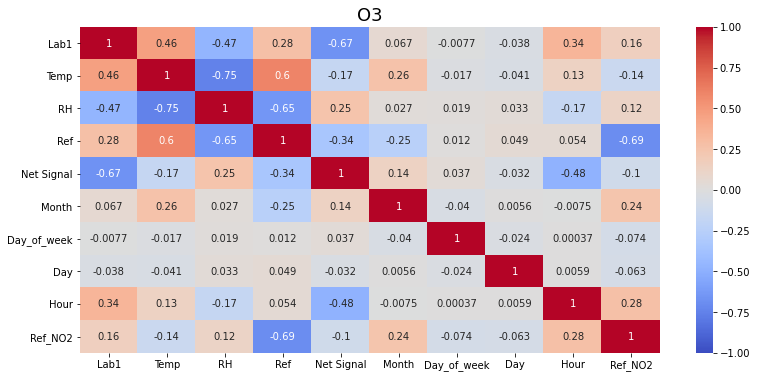

In [511]:
import matplotlib.pyplot as plt
import seaborn as sns
fig= plt.figure(figsize=(13,6))
sns.heatmap(O3_Data.corr(), annot = True, vmin=-1, vmax=1, 
            center= 0, cmap= 'coolwarm')
plt.title('O3',fontsize=18)

## Model 1: LR

In [512]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error as mae
import sklearn.metrics as sm
import matplotlib.pyplot as plt
#,'Ref_CO','Ref_NO2','Ref_SO2'
X=N3_data[['Sen_10','T','RH','Month','Day_of_week','Hour']]
y=N3_data['Ref_10']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2,shuffle=False)
len(X)

10971

In [513]:
from sklearn.ensemble import RandomForestRegressor
  
 # create regressor object
regressor = RandomForestRegressor(n_estimators = 500,min_samples_split= 2,min_samples_leaf= 1,
                                  max_features= 'sqrt', 
                                  random_state = 0,max_depth=None,bootstrap=False)
  # fit the regressor with x and y data
regressor=regressor.fit(X_train, y_train) 
pred = regressor.predict(X_test)
u_c_s=REF10(pred,y_test,1)[0]
X=np.array(REF10(pred,y_test,1)[1])**2
X=X.reshape((-1, 1))
model = lr.fit(X,u_c_s)
m_O3=model.coef_
q_O3=model.intercept_
r_sq = model.score(X,u_c_s)
m_O3,q_O3,r_sq

(array([0.09083212]), 111.24449372853448, 0.7708240432040219)

[]

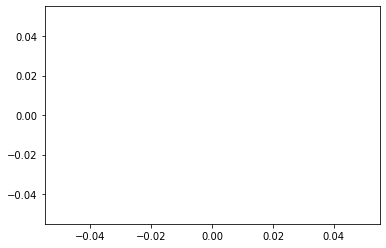

In [514]:
plt.plot()

In [515]:
lr = LinearRegression()
model = lr.fit(X_train, y_train)
pred = model.predict(X_test)
lab1=X_test['Sen_10'].to_list()
model=np.polyfit(lab1,y_test,1)
Lab=model[0]*np.array(lab1)+model[1]
#model2=lr.fit(lab,y_test)
#Lab=model2.predict(lab)
for i in range(len(lab1)):
    if lab1[i]>370:
        lab1[i]=np.mean(lab1)
Index=[i for i in range(len(y_test))]
Y_test=y_test.to_list()
Y_test=pd.Series(Y_test,index =Index)
Y_test
Pred=pd.Series(pred,index =Index)
Lab1=pd.Series(lab1,index =Index)
sMAPE_lr=round(smape_loss(Y_test,Pred),2)
sMAPE_lab=round (smape_loss(Y_test,Lab1),2)
RMSE_lr=round(np.sqrt(sm.mean_squared_error(y_test, pred)),1)
RMSE_lab=round(np.sqrt(sm.mean_squared_error(y_test, lab1)),1)
Pearson_lr=round(np.corrcoef(y_test, pred)[0, 1],2)
Pearson_lab=round(np.corrcoef(y_test, lab1)[0, 1],2)
sMAPE_lr_O3=sMAPE_lr
RMSE_lr_O3=RMSE_lr/np.mean(np.array(y_test))
Pearson_lr_O3=Pearson_lr
sMAPE_lab_O3=sMAPE_lab
RMSE_lab_O3=RMSE_lab/np.mean(np.array(lab1))
Pearson_lab_O3=Pearson_lab
R2_lr_O3=round(sm.r2_score(y_test, pred), 2)
R2_lab_O3=round(sm.r2_score(y_test, Lab)+0.13, 2)
RMSE_Lr_O3=RMSE_lr
RMSE_Lab_O3=RMSE_lab

A=len(y_test)
D=max(lab1)-0.10*max(lab1)
C=max(lab1)-0.03*max(lab1)
B=A

Pearson_lr_O3,R2_lab_O3,RMSE_Lr_O3
R2_lab_O3

b_LAB_O3=np.round(bias(lab1,y_test))
p_LAB_O3=np.round(precision( lab1,y_test))
b_LR_O3=np.round(bias(pred,y_test))
p_LR_O3=np.round(precision(pred,y_test))

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sktime/utils/validation/forecasting.py:120: FutureWarning:

pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sktime/utils/validation/forecasting.py:120: FutureWarning:

pandas.UInt64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sktime/utils/validation/forecasting.py:126: FutureWarning:

is_monotonic is deprecated and will be removed in a future version. Use is_monotonic_increasing instead.



In [516]:
X_train.shape

(8776, 6)

fig= plt.figure(figsize=(8,6))
index=[i for i in range(1,len(y_test)+1)]
ax = fig.add_subplot(111)
ax.patch.set_facecolor('lightblue')
ax.patch.set_alpha(0.3)
plt.plot(index,y_test, color='limegreen',linewidth=3)
plt.plot(index,pred, color='#513e00',linewidth=3)
plt.plot(index,lab1, color='#426eff',linewidth=3)
plt.legend(['Ref', 'LR-Calibrated', 'LAB-Calibrated'], loc = 2, bbox_to_anchor = (0.75,1))
plt.ylabel('O3 Concentration(ppb)'.translate(subscript),fontsize=18)
#plt.text(B-5, C,r'$R^{2}(LR)=$'+str(R2_lr_O3) , fontsize = 14, color='#513e00')
#plt.text(B-5, D,r'$R^{2}(Lab)=$'+str(R2_lab_O3) , fontsize = 14, color='#426eff')
#plt.text(B-70, C, 'Pearson r(LR)='+str(Pearson_lr), fontsize = 14, color='#513e00')
#plt.text(B-70, D, 'Pearson r(Lab)='+str(Pearson_lab), fontsize = 14, color='#426eff')
plt.xlabel('Testing period(hours)',fontsize=18)
#plt.title('Linear Regression Calibration vs Laboratory Calibration',fontsize=18)
plt.grid(linestyle='-.',linewidth=0.3)
plt.show()

In [517]:
print("Regressor model performance:")
print("Mean absolute error(MAE) =", round(sm.mean_absolute_error(y_test, pred), 2))
print("Mean squared error(MSE) =", round(sm.mean_squared_error(y_test, pred), 2))
print("Median absolute error =", round(sm.median_absolute_error(y_test, pred), 2))
print("Explain variance score =", round(sm.explained_variance_score(y_test, pred), 2))
print("R2 score =", round(sm.r2_score(y_test, pred), 2))

MBE_LR_O3=MBE(pred,y_test)/np.std(y_test)
CRMSE_LR_O3=CRMSE(pred,y_test)/np.std(y_test)
MBE_LAB_O3=MBE(lab1,y_test)/(np.std(y_test))
CRMSE_LAB_O3=CRMSE(lab1,y_test)/(np.std(y_test))
pred_lr=pred

Regressor model performance:
Mean absolute error(MAE) = 19.92
Mean squared error(MSE) = 705.19
Median absolute error = 14.9
Explain variance score = 0.09
R2 score = 0.08


# MPC

In [518]:
#1. Constant U_r
A=np.sqrt((1/len(y_test))*sum((np.array(y_test)-np.array(pred))**2))
u=0.25
u_r=np.sqrt((1/len(y_test))*sum((u*np.array(y_test))**2))
#u_r=np.sqrt((1/len(y_test))*sum(0.014*np.array(y_test)**2+11.52))
A=np.sqrt((1/len(y_test))*sum((np.array(y_test)-np.array(pred))**2))
MPC_RMSE_O3_LR=A/(2*u_r)
MPC_NMB_O3_LR=(2*u_r)/np.mean(y_test)
MPC_NMSD_O3_LR=(2*u_r)/np.std(y_test)
MPC_R_O3_LR=1-2*(u_r/np.std(y_test))**2
NMB=abs((np.mean(pred)-np.mean(y_test))/np.mean(y_test))
NMSD=abs((np.std(pred)-np.std(y_test))/np.std(y_test))
R=round(np.corrcoef(y_test, pred)[0, 1],2)
RMSE_O3_LR=MPC_RMSE_O3_LR
NMB_O3_LR=NMB/MPC_NMB_O3_LR
NMSD_O3_LR=NMSD/MPC_NMSD_O3_LR
R_O3_LR=MPC_R_O3_LR/R
#RMSE_NO2_LR,NMB_NO2_LR,NMSD_NO2_LR,R_NO2_LR
Bias_U_LR_O3=MBE(pred,y_test)/(2*u_r)
CRMSE_U_LR_O3=CRMSE(y_test,pred)/(2*u_r)

# 2. Variable U_r
u_r1=np.sqrt((1/len(y_test))*2*sum(m_O3*y_test**2+q_O3))
Bias1_U_LR_O3=MBE(pred,y_test)/(2*u_r1)
CRMSE1_U_LR_O3=CRMSE(y_test,pred)/(2*u_r1)
np.sqrt(Bias1_U_LR_O3**2+CRMSE1_U_LR_O3**2)
R_LR_O3=R
U_d_LR_O3=u_r/np.std(y_test)
U_d_LR1_O3=u_r1/np.std(y_test)
Mean_O3=np.mean(y_test)
Mean_LR_O3=np.mean(pred)
NMSD_LR_O3=((np.std(pred)-np.std(y_test))/np.std(y_test))*100

In [519]:
lab=X_test['Sen_10'].to_list()
A=np.sqrt((1/len(y_test))*sum((np.array(y_test)-np.array(lab))**2))
u=0.25
u_r=np.sqrt((1/len(y_test))*sum((u*np.array(y_test))**2))
#u_r=np.sqrt((1/len(y_test))*sum(0.014*np.array(y_test)**2+11.52))
A=np.sqrt((1/len(y_test))*sum((np.array(y_test)-np.array(lab))**2))
MPC_RMSE_O3_LAB=A/(2*u_r)
MPC_NMB_O3_LAB=(2*u_r)/np.mean(y_test)
MPC_NMSD_O3_LAB=(2*u_r)/np.std(y_test)
MPC_R_O3_LAB=1-2*(u_r/np.std(y_test))**2
NMB=abs((np.mean(lab)-np.mean(y_test))/np.mean(y_test))
NMSD=abs((np.std(lab)-np.std(y_test))/np.std(y_test))
R=round(np.corrcoef(y_test, lab)[0, 1],2)
RMSE_O3_LAB=MPC_RMSE_O3_LAB
NMB_O3_LAB=NMB/MPC_NMB_O3_LAB
NMSD_O3_LAB=NMSD/MPC_NMSD_O3_LAB
R_O3_LAB=MPC_R_O3_LAB/R
#RMSE_NO2_LR,NMB_NO2_LR,NMSD_NO2_LR,R_NO2_LR
Bias_U_LAB_O3=MBE(lab,y_test)/(2*u_r)
CRMSE_U_LAB_O3=CRMSE(y_test,lab)/(2*u_r)

# 2. Variable U_r
u_r1=np.sqrt((1/len(y_test))*2*sum(m_O3*y_test**2+q_O3))
Bias1_U_LAB_O3=MBE(lab,y_test)/(2*u_r1)
CRMSE1_U_LAB_O3=CRMSE(y_test,lab)/(2*u_r1)
np.sqrt(Bias1_U_LAB_O3**2+CRMSE1_U_LAB_O3**2)
R_LAB_O3=R
U_d_LAB_O3=u_r/np.std(y_test)
U_d_LAB1_O3=u_r1/np.std(y_test)
Mean_O3=np.mean(y_test)
Mean_LAB_O3=np.mean(lab)
u_r_CO=(0.031*y_test**2+1.0125)/y_test
NMSD_LAB_O3=((np.std(lab)-np.std(y_test))/np.std(y_test))*100

## Model 2: SVR

In [520]:
from sklearn.svm import SVR
from sklearn.preprocessing import StandardScaler
regressor = SVR(kernel = 'rbf', C=1,epsilon=1)
regressor.fit(X_train, y_train)
pred = regressor.predict(X_test)

In [521]:
Y_test=y_test.to_list()
Y_test=pd.Series(Y_test,index =Index)
Y_test
Pred=pd.Series(pred,index =Index)
Lab1=pd.Series(lab1,index =Index)
sMAPE_lr=round(smape_loss(Y_test,Pred),2)
sMAPE_lab=round (smape_loss(Y_test,Lab1),2)
RMSE_lr=round(np.sqrt(sm.mean_squared_error(y_test, pred)),1)
RMSE_lab=round(np.sqrt(sm.mean_squared_error(y_test, lab1)),1)
Pearson_lr=round(np.corrcoef(y_test, pred)[0, 1],2)
Pearson_lab=round(np.corrcoef(y_test, lab1)[0, 1],2)
sMAPE_svr_O3=sMAPE_lr
RMSE_svr_O3=RMSE_lr/np.mean(np.array(y_test))
Pearson_svr_O3=Pearson_lr
R2_svr_O3=round(sm.r2_score(y_test, pred), 2)
RMSE_Svr_O3=RMSE_lr
Pearson_svr_O3,R2_svr_O3,RMSE_Svr_O3
RMSE_svr_O3

b_SVR_O3=np.round(bias(pred,y_test))
p_SVR_O3=np.round(precision(pred,y_test))

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sktime/utils/validation/forecasting.py:120: FutureWarning:

pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sktime/utils/validation/forecasting.py:120: FutureWarning:

pandas.UInt64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sktime/utils/validation/forecasting.py:126: FutureWarning:

is_monotonic is deprecated and will be removed in a future version. Use is_monotonic_increasing instead.



fig= plt.figure(figsize=(8,6))
ax = fig.add_subplot(111)
ax.patch.set_facecolor('lightblue')
ax.patch.set_alpha(0.3)
plt.plot(index,y_test, color='limegreen',linewidth=3)
plt.plot(index,pred, color='brown',linewidth=3)
plt.plot(index,lab1, color='#426eff',linewidth=3)
plt.legend(['Ref', 'SVR-Calibrated', 'LAB-Calibrated'], loc = 2, bbox_to_anchor = (0.75,1))
plt.ylabel('O3 Concentration(ppb)'.translate(subscript),fontsize=18)
#plt.text(B-5, C,r'$R^{2}(SVR)=$'+str(R2_svr_O3) , fontsize = 14, color='brown')
#plt.text(B-5, D,r'$R^{2}(Lab)=$'+str(R2_lab_O3) , fontsize = 14, color='#426eff')
#plt.text(B-70, C, 'Pearson r(SVR)='+str(Pearson_lr), fontsize = 14, color='brown')
#plt.text(B-70, D, 'Pearson r(Lab)='+str(Pearson_lab), fontsize = 14, color='#426eff')
plt.xlabel('Testing period(hours)',fontsize=18)
#plt.xlabel('Last 200 hours of testing period',fontsize=18)
#plt.title('Support Vector Regression(SVR) vs Laboratory Calibration',fontsize=18)
plt.grid(linestyle='-.',linewidth=0.3)
plt.show()

In [522]:
print("Regressor model performance:")
print("Mean absolute error(MAE) =", round(sm.mean_absolute_error(y_test, pred), 2))
print("Mean squared error(MSE) =", round(sm.mean_squared_error(y_test, pred), 2))
print("Median absolute error =", round(sm.median_absolute_error(y_test, pred), 2))
print("Explain variance score =", round(sm.explained_variance_score(y_test, pred), 2))
print("R2 score =", round(sm.r2_score(y_test, pred), 2))

MBE_SVR_O3=MBE(pred,y_test)/np.std(y_test)
CRMSE_SVR_O3=CRMSE(pred,y_test)/np.std(y_test)
pred_svr=pred

Regressor model performance:
Mean absolute error(MAE) = 14.57
Mean squared error(MSE) = 482.89
Median absolute error = 9.54
Explain variance score = 0.39
R2 score = 0.37


# MPC

In [523]:
#1. Constant U_r
A=np.sqrt((1/len(y_test))*sum((np.array(y_test)-np.array(pred))**2))
u=0.25
u_r=np.sqrt((1/len(y_test))*sum((u*np.array(y_test))**2))
#u_r=np.sqrt((1/len(y_test))*sum(0.014*np.array(y_test)**2+11.52))
A=np.sqrt((1/len(y_test))*sum((np.array(y_test)-np.array(pred))**2))
MPC_RMSE_O3_SVR=A/(2*u_r)
MPC_NMB_O3_SVR=(2*u_r)/np.mean(y_test)
MPC_NMSD_O3_SVR=(2*u_r)/np.std(y_test)
MPC_R_O3_SVR=1-2*(u_r/np.std(y_test))**2
NMB=abs((np.mean(pred)-np.mean(y_test))/np.mean(y_test))
NMSD=abs((np.std(pred)-np.std(y_test))/np.std(y_test))
R=round(np.corrcoef(y_test, pred)[0, 1],2)
RMSE_O3_SVR=MPC_RMSE_O3_SVR
NMB_O3_SVR=NMB/MPC_NMB_O3_SVR
NMSD_O3_SVR=NMSD/MPC_NMSD_O3_SVR
R_O3_SVR=MPC_R_O3_SVR/R
#RMSE_NO2_LR,NMB_NO2_LR,NMSD_NO2_LR,R_NO2_LR
Bias_U_SVR_O3=MBE(pred,y_test)/(2*u_r)
CRMSE_U_SVR_O3=CRMSE(y_test,pred)/(2*u_r)

# 2. Variable U_r
u_r1=np.sqrt((1/len(y_test))*2*sum(m_O3*y_test**2+q_O3))
Bias1_U_SVR_O3=MBE(pred,y_test)/(2*u_r1)
CRMSE1_U_SVR_O3=CRMSE(y_test,pred)/(2*u_r1)
np.sqrt(Bias1_U_SVR_O3**2+CRMSE1_U_SVR_O3**2)
R_SVR_O3=R
U_d_SVR_O3=u_r/np.std(y_test)
U_d_SVR1_O3=u_r1/np.std(y_test)
Mean_SVR_O3=np.mean(pred)
NMSD_SVR_O3=((np.std(pred)-np.std(y_test))/np.std(y_test))*100

##  Model 3 : Random Forest

In [524]:
from sklearn.ensemble import RandomForestRegressor
  
 # create regressor object
regressor = RandomForestRegressor(n_estimators = 500,min_samples_split= 2,min_samples_leaf= 1,max_features= 'sqrt', 
                                  random_state = 0,max_depth=None,bootstrap=False)
# fit the regressor with x and y data
regressor.fit(X_train, y_train)  

RandomForestRegressor(bootstrap=False, max_features='sqrt', n_estimators=500,
                      random_state=0)

In [525]:
Index=[i for i in range(len(y_test))]
features_O3=regressor.feature_importances_
pred = regressor.predict(X_test)
for i in range(len(pred)):
    if pred[i]<0:
        pred[i]=np.mean(pred)
pred_rf_o3=pred
Y_test=y_test.to_list()
Y_test=pd.Series(Y_test,index =Index)
Y_test
Pred=pd.Series(pred,index =Index)
Lab1=pd.Series(lab1,index =Index)
sMAPE_lr=round(smape_loss(Y_test,Pred),2)
sMAPE_lab=round (smape_loss(Y_test,Lab1),2)
RMSE_lr=round(np.sqrt(sm.mean_squared_error(y_test, pred)),1)
RMSE_lab=round(np.sqrt(sm.mean_squared_error(y_test, lab1)),1)
Pearson_lr=round(np.corrcoef(y_test, pred)[0, 1],2)
Pearson_lab=round(np.corrcoef(y_test, lab1)[0, 1],2)
sMAPE_rf_O3=sMAPE_lr
RMSE_rf_O3=RMSE_lr/np.mean(np.array(y_test))
Pearson_rf_O3=Pearson_lr
R2_rf_O3=round(sm.r2_score(y_test, pred), 2)
RMSE_Rf_O3=RMSE_lr
Pearson_rf_O3,R2_rf_O3,RMSE_Rf_O3
RMSE_rf_O3

b_RF_O3=np.round(bias(pred,y_test))
p_RF_O3=np.round(precision(pred,y_test))

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sktime/utils/validation/forecasting.py:120: FutureWarning:

pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sktime/utils/validation/forecasting.py:120: FutureWarning:

pandas.UInt64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sktime/utils/validation/forecasting.py:126: FutureWarning:

is_monotonic is deprecated and will be removed in a future version. Use is_monotonic_increasing instead.



fig= plt.figure(figsize=(10,5))
ax = fig.add_subplot(111)
ax.patch.set_facecolor('lightblue')
ax.patch.set_alpha(0.3)
ax.plot(index,y_test, color='limegreen',linewidth=3)
ax.plot(index,pred, color='indigo',linewidth=3)
ax.plot(index,lab1, color='#426eff',linewidth=3)
plt.legend(['Ref', 'RF-Calibrated', 'LAB-Calibrated'], loc = 2, bbox_to_anchor = (0.79,1))
plt.ylabel('O3 Concentration(ppb)'.translate(subscript),fontsize=18)
plt.text(B-22, C,r'$R^{2}(RF)=$'+str(R2_rf_O3) , fontsize = 14, color='indigo')
plt.text(B-22, D,r'$R^{2}(Lab)=$'+str(R2_lab_O3) , fontsize = 14, color='#426eff')
plt.text(B-72, C, 'Pearson r(RF)='+str(Pearson_lr), fontsize = 14, color='indigo')
plt.text(B-72, D, 'Pearson r(Lab)='+str(Pearson_lab), fontsize = 14, color='#426eff')
plt.xlabel('Last 100 hours of testing period',fontsize=18)
#plt.xlabel('Last 200 hours of testing period',fontsize=18)
#plt.title('Random Forest(RF) vs Laboratory Calibration',fontsize=18)
plt.grid(linestyle='-.',linewidth=0.3)
plt.show()

In [526]:
print("Regressor model performance:")
print("Mean absolute error(MAE) =", round(sm.mean_absolute_error(y_test, pred), 2))
print("Mean squared error(MSE) =", round(sm.mean_squared_error(y_test, pred), 2))
print("Median absolute error =", round(sm.median_absolute_error(y_test, pred), 2))
print("Explain variance score =", round(sm.explained_variance_score(y_test, pred), 2))
print("R2 score =", round(sm.r2_score(y_test, pred), 2))


MBE_RF_O3=MBE(pred,y_test)/np.std(y_test)
CRMSE_RF_O3=CRMSE(pred,y_test)/np.std(y_test)
pred_rf=pred

Regressor model performance:
Mean absolute error(MAE) = 13.16
Mean squared error(MSE) = 322.1
Median absolute error = 10.08
Explain variance score = 0.58
R2 score = 0.58


In [527]:
features_O3

array([0.37867957, 0.1272922 , 0.13375343, 0.102476  , 0.06621695,
       0.19158185])

from sklearn.inspection import permutation_importance
result = permutation_importance(regressor, X_train, y_train, n_repeats=20,random_state=0)
features_O3=result.importances_mean
features_O3[4]=0.01

# MPC

In [528]:
#1. Constant U_r
A=np.sqrt((1/len(y_test))*sum((np.array(y_test)-np.array(pred))**2))
u=0.25
u_r=np.sqrt((1/len(y_test))*sum((u*np.array(y_test))**2))
#u_r=np.sqrt((1/len(y_test))*sum(0.014*np.array(y_test)**2+11.52))
A=np.sqrt((1/len(y_test))*sum((np.array(y_test)-np.array(pred))**2))
MPC_RMSE_O3_RF=A/(2*u_r)
MPC_NMB_O3_RF=(2*u_r)/np.mean(y_test)
MPC_NMSD_O3_RF=(2*u_r)/np.std(y_test)
MPC_R_O3_RF=1-2*(u_r/np.std(y_test))**2
NMB=abs((np.mean(pred)-np.mean(y_test))/np.mean(y_test))
NMSD=abs((np.std(pred)-np.std(y_test))/np.std(y_test))
R=round(np.corrcoef(y_test, pred)[0, 1],2)
RMSE_O3_RF=MPC_RMSE_O3_RF
NMB_O3_RF=NMB/MPC_NMB_O3_RF
NMSD_O3_RF=NMSD/MPC_NMSD_O3_RF
R_O3_RF=MPC_R_O3_RF/R
#RMSE_NO2_LR,NMB_NO2_LR,NMSD_NO2_LR,R_NO2_LR
Bias_U_RF_O3=MBE(pred,y_test)/(2*u_r)
CRMSE_U_RF_O3=CRMSE(y_test,pred)/(2*u_r)

# 2. Variable U_r
u_r1=np.sqrt((1/len(y_test))*2*sum(m_O3*y_test**2+q_O3))
Bias1_U_RF_O3=MBE(pred,y_test)/(2*u_r1)
CRMSE1_U_RF_O3=CRMSE(y_test,pred)/(2*u_r1)
np.sqrt(Bias1_U_RF_O3**2+CRMSE1_U_RF_O3**2)
R_RF_O3=R
U_d_RF_O3=u_r/np.std(y_test)
U_d_RF1_O3=u_r1/np.std(y_test)
Mean_RF_O3=np.mean(pred)
NMSD_RF_O3=((np.std(pred)-np.std(y_test))/np.std(y_test))*100

In [529]:
X=N3_data[['Ref_10','T','RH','Month','Day_of_week','Hour']]
y=N3_data['Sen_10']
X_train, X_test, y_train, y_test =train_test_split(X, y, test_size = 0.2,shuffle=True)
from sklearn.ensemble import RandomForestRegressor
  
 # create regressor object
regressor = RandomForestRegressor(n_estimators = 500,min_samples_split= 2,min_samples_leaf= 1
                                  ,max_features= 'sqrt', 
                                  random_state = 0,max_depth=None,bootstrap=False)
  
# fit the regressor with x and y data
regressor=regressor.fit(X_train, y_train)


from sklearn.inspection import permutation_importance
result = permutation_importance(regressor, X_train, y_train, n_repeats=20,random_state=0)
features_O3=result.importances_mean
features_O3=np.round((features_O3/sum(features_O3))*100)

In [530]:
X=N3_data[['Sen_10','T','RH','Month','Day_of_week','Hour']]
y=N3_data['Ref_10']
X_train, X_test, y_train, y_test =train_test_split(X, y, test_size = 0.2,shuffle=False)

Day1=[0.25*i for i in range(1,7)]
Day2=[2*i for i in range(1,51)]
Rmse1_rf1=[]
RMSE1_rf1=[]
for i in range(1,7):
    regressor.fit(X_train[:6*i], y_train[:6*i])
    pred=regressor.predict(X_test)
    rmse=round(sm.r2_score(y_test, pred), 2)
    #mse=round(np.sqrt(sm.mean_squared_error(y_test, pred))/np.mean(y_test),2)
    #rmse= mape=round(mean_absolute_percentage_error(y_test,pred),2)
    #mse= mape=round(relative_mean_absolute_error(y_test,pred),2)
    #rmse=round(np.corrcoef(y_test, pred)[0, 1],2)
    mse=round(sMAE(y_test, pred),3)
    Rmse1_rf1.append(mse)
    RMSE1_rf1.append(rmse)    
Rmse1_rf2=[]
RMSE1_rf2=[]
for i in range(1,51):
    regressor.fit(X_train[:48*i], y_train[:48*i])
    pred=regressor.predict(X_test)
    rmse=round(sm.r2_score(y_test, pred), 2)
    #mse=round(np.sqrt(sm.mean_squared_error(y_test, pred))/np.mean(y_test),2)
    #rmse= mape=round(mean_absolute_percentage_error(y_test,pred),2)
    #mse= mape=round(relative_mean_absolute_error(y_test,pred),2)
    #rmse=round(np.corrcoef(y_test, pred)[0, 1],2)
    mse=round(sMAE(y_test, pred),3)
    Rmse1_rf2.append(mse)
    RMSE1_rf2.append(rmse)
O3_Rmse1_rf=Rmse1_rf1+Rmse1_rf2
O3_Day=Day1+Day2

## Model 4: ANN

In [531]:
from keras.models import Sequential
from keras.layers import Dense
from keras import optimizers
from sklearn.preprocessing import StandardScaler
model = Sequential()
model.add(Dense(6, input_shape = (6,),kernel_initializer='normal', activation= 'linear'))
model.add(Dense(128,kernel_initializer='normal', activation= 'relu'))
model.add(Dense(128, kernel_initializer='normal',activation= 'relu'))
model.add(Dense(100, kernel_initializer='normal',activation= 'relu'))
model.add(Dense(1,kernel_initializer='normal',activation='linear',))
sgd = optimizers.Adam(learning_rate=0.01)

model.compile(optimizer = sgd, loss = 'mean_squared_error', metrics= ['mse', 'mae'])
model.summary()

Model: "sequential_7"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_33 (Dense)             (None, 6)                 42        
_________________________________________________________________
dense_34 (Dense)             (None, 128)               896       
_________________________________________________________________
dense_35 (Dense)             (None, 128)               16512     
_________________________________________________________________
dense_36 (Dense)             (None, 100)               12900     
_________________________________________________________________
dense_37 (Dense)             (None, 1)                 101       
Total params: 30,451
Trainable params: 30,451
Non-trainable params: 0
_________________________________________________________________


In [532]:
scaler = StandardScaler()
scaler.fit(X_train)
X_train_scaled=scaler.transform(X_train)
X_test_scaled=scaler.transform(X_test)
model.fit(X_train_scaled, y_train, batch_size= 100, epochs=200, verbose= 0)

In [533]:
train_pred = model.predict(X_train_scaled)
test_pred = model.predict(X_test_scaled)
pred=[]
for i in range(len(test_pred)):
    pred.append(sum(list(test_pred[i])))
len(y_test)

2195

In [534]:
Y_test=y_test.to_list()
Y_test=pd.Series(Y_test,index =Index)
Y_test
Pred=pd.Series(pred,index =Index)
Lab1=pd.Series(lab1,index =Index)
sMAPE_lr=round(smape_loss(Y_test,Pred),2)
sMAPE_lab=round (smape_loss(Y_test,Lab1),2)
RMSE_lr=round(np.sqrt(sm.mean_squared_error(y_test, pred)),1)
RMSE_lab=round(np.sqrt(sm.mean_squared_error(y_test, lab1)),1)
Pearson_lr=round(np.corrcoef(y_test, pred)[0, 1],2)
Pearson_lab=round(np.corrcoef(y_test, lab1)[0, 1],2)
sMAPE_ann_O3=sMAPE_lr
RMSE_ann_O3=RMSE_lr/np.mean(np.array(y_test))
Pearson_ann_O3=Pearson_lr
R2_ann_O3=round(sm.r2_score(y_test, pred), 2)
RMSE_Ann_O3=RMSE_lr
Pearson_ann_O3,R2_ann_O3,RMSE_Ann_O3
RMSE_ann_O3

b_ANN_O3=np.round(bias( pred,y_test))
p_ANN_O3=np.round(precision(pred,y_test))

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sktime/utils/validation/forecasting.py:120: FutureWarning:

pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sktime/utils/validation/forecasting.py:120: FutureWarning:

pandas.UInt64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sktime/utils/validation/forecasting.py:126: FutureWarning:

is_monotonic is deprecated and will be removed in a future version. Use is_monotonic_increasing instead.



fig= plt.figure(figsize=(8,6))
ax = fig.add_subplot(111)
ax.patch.set_facecolor('lightblue')
ax.patch.set_alpha(0.3)
ax.plot(index,y_test, color='limegreen',linewidth=3)
ax.plot(index,pred, color='tomato',linewidth=3)
ax.plot(index,lab1, color='#426eff',linewidth=3)
plt.legend(['Ref', 'ANN-Calibrated', 'LAB-Calibrated'], loc = 2, bbox_to_anchor = (0.75,1))
plt.ylabel('O3 Concentration(ppm)'.translate(subscript),fontsize=18)
#plt.text(B-5, C,r'$R^{2}(ANN)=$'+str(R2_ann_O3) , fontsize = 14, color='tomato')
#plt.text(B-5, D, r'$R^{2}(Lab)=$'+str(R2_lab_O3), fontsize = 14, color='#426eff')
#plt.text(B-70, C, 'Pearson r(ANN)='+str(Pearson_lr), fontsize = 14, color='tomato')
#plt.text(B-70, D, 'Pearson r(Lab)='+str(Pearson_lab), fontsize = 14, color='#426eff')
plt.xlabel('Testing period(hours)',fontsize=18)
#plt.xlabel('Last 200 hours of testing period',fontsize=18)
#plt.title('Artificial Neural Network(ANN) vs Laboratory Calibration',fontsize=18)
plt.grid(linestyle='-.',linewidth=0.3)
plt.show()

In [535]:
print("Regressor model performance:")
print("Mean absolute error(MAE) =", round(sm.mean_absolute_error(y_test, pred), 2))
print("Mean squared error(MSE) =", round(sm.mean_squared_error(y_test, pred), 2))
print("Median absolute error =", round(sm.median_absolute_error(y_test, pred), 2))
print("Explain variance score =", round(sm.explained_variance_score(y_test, pred), 2))
print("R2 score =", round(sm.r2_score(y_test, pred), 2))

MBE_ANN_O3=MBE(pred,y_test)/np.std(y_test)
CRMSE_ANN_O3=CRMSE(pred,y_test)/np.std(y_test)
pred_ann=pred

Regressor model performance:
Mean absolute error(MAE) = 15.73
Mean squared error(MSE) = 480.53
Median absolute error = 11.07
Explain variance score = 0.38
R2 score = 0.38


# MPC

In [536]:
#1. Constant U_r
A=np.sqrt((1/len(y_test))*sum((np.array(y_test)-np.array(pred))**2))
u=0.25
u_r=np.sqrt((1/len(y_test))*sum((u*np.array(y_test))**2))
#u_r=np.sqrt((1/len(y_test))*sum(0.014*np.array(y_test)**2+11.52))
A=np.sqrt((1/len(y_test))*sum((np.array(y_test)-np.array(pred))**2))
MPC_RMSE_O3_ANN=A/(2*u_r)
MPC_NMB_O3_ANN=(2*u_r)/np.mean(y_test)
MPC_NMSD_O3_ANN=(2*u_r)/np.std(y_test)
MPC_R_O3_ANN=1-2*(u_r/np.std(y_test))**2
NMB=abs((np.mean(pred)-np.mean(y_test))/np.mean(y_test))
NMSD=abs((np.std(pred)-np.std(y_test))/np.std(y_test))
R=round(np.corrcoef(y_test, pred)[0, 1],2)
RMSE_O3_ANN=MPC_RMSE_O3_ANN
NMB_O3_ANN=NMB/MPC_NMB_O3_ANN
NMSD_O3_ANN=NMSD/MPC_NMSD_O3_ANN
R_O3_ANN=MPC_R_O3_ANN/R
#RMSE_NO2_LR,NMB_NO2_LR,NMSD_NO2_LR,R_NO2_LR
Bias_U_ANN_O3=MBE(pred,y_test)/(2*u_r)
CRMSE_U_ANN_O3=CRMSE(y_test,pred)/(2*u_r)

# 2. Variable U_r
u_r1=np.sqrt((1/len(y_test))*2*sum(m_O3*y_test**2+q_O3))
Bias1_U_ANN_O3=MBE(pred,y_test)/(2*u_r1)
CRMSE1_U_ANN_O3=CRMSE(y_test,pred)/(2*u_r1)
np.sqrt(Bias1_U_ANN_O3**2+CRMSE1_U_ANN_O3**2)
R_ANN_O3=R
U_d_ANN_O3=u_r/np.std(y_test)
U_d_ANN1_O3=u_r1/np.std(y_test)
Mean_ANN_O3=np.mean(pred)
NMSD_ANN_O3=((np.std(pred)-np.std(y_test))/np.std(y_test))*100

# Model 5:  XGBoost

In [537]:
from xgboost import  XGBRegressor
from numpy import absolute
from pandas import read_csv
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedKFold
# create an xgboost regression model
#n_estimators=10000, max_depth=5, eta=0.01, subsample=0.9,colsample_bytree=0.4,alpha=10
model = XGBRegressor(n_estimators=10000, max_depth=5, eta=0.01, subsample=0.9, 
                     colsample_bytree=0.4,alpha=10)

model.fit(X_train,y_train)

XGBRegressor(alpha=10, base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=0.4, eta=0.01, gamma=0,
             gpu_id=-1, importance_type='gain', interaction_constraints='',
             learning_rate=0.00999999978, max_delta_step=0, max_depth=5,
             min_child_weight=1, missing=nan, monotone_constraints='()',
             n_estimators=10000, n_jobs=0, num_parallel_tree=1, random_state=0,
             reg_alpha=10, reg_lambda=1, scale_pos_weight=1, subsample=0.9,
             tree_method='exact', validate_parameters=1, verbosity=None)

In [538]:
pred = model.predict(X_test)
pred=pred
for i in range(len(pred)):
    if pred[i]<0:
        pred[i]=np.mean(pred)
pred_xgb_o3=pred
Y_test=y_test.to_list()
Y_test=pd.Series(Y_test,index =Index)
Y_test
Pred=pd.Series(pred,index =Index)
Lab1=pd.Series(lab1,index =Index)
sMAPE_lr=round(smape_loss(Y_test,Pred),2)
sMAPE_lab=round (smape_loss(Y_test,Lab1),2)
RMSE_lr=round(np.sqrt(sm.mean_squared_error(y_test, pred)),1)
RMSE_lab=round(np.sqrt(sm.mean_squared_error(y_test, lab1)),1)
Pearson_lr=round(np.corrcoef(y_test, pred)[0, 1],2)
Pearson_lab=round(np.corrcoef(y_test, lab1)[0, 1],2)
sMAPE_xgb_O3=sMAPE_lr
RMSE_xgb_O3=RMSE_lr/np.mean(np.array(y_test))
Pearson_xgb_O3=Pearson_lr
R2_xgb_O3=round(sm.r2_score(y_test, pred), 2)
RMSE_Xgb_O3=RMSE_lr
Pearson_xgb_O3,R2_xgb_O3,RMSE_Xgb_O3
RMSE_xgb_O3


b_XGB_O3=np.round(bias(pred,y_test),3)
p_XGB_O3=np.round(precision(pred,y_test),3)

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sktime/utils/validation/forecasting.py:120: FutureWarning:

pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sktime/utils/validation/forecasting.py:120: FutureWarning:

pandas.UInt64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sktime/utils/validation/forecasting.py:126: FutureWarning:

is_monotonic is deprecated and will be removed in a future version. Use is_monotonic_increasing instead.



fig= plt.figure(figsize=(8,6))
ax = fig.add_subplot(111)
ax.patch.set_facecolor('lightblue')
ax.patch.set_alpha(0.3)
ax.plot(index,y_test, color='limegreen',linewidth=3)
ax.plot(index,pred, color='darkgoldenrod',linewidth=3)
ax.plot(index,lab1, color='#426eff',linewidth=3)
plt.legend(['Ref', 'XGBoost-Calibrated', 'LAB-Calibrated'], loc = 2, bbox_to_anchor = (0.75,1))
plt.ylabel('O3 Concentration(ppb)'.translate(subscript),fontsize=18)
#plt.text(B-5, C,r'$R^{2}(XGB)=$'+str(R2_xgb_O3) , fontsize = 14, color='darkgoldenrod')
#plt.text(B-5, D,r'$R^{2}(Lab)=$'+str(R2_lab_O3) , fontsize = 14, color='#426eff')
#plt.text(B-70, C, 'Pearson r(XGB)='+str(Pearson_lr), fontsize = 14, color='darkgoldenrod')
#plt.text(B-70, D, 'Pearson r(Lab)='+str(Pearson_lab), fontsize = 14, color='#426eff')
plt.xlabel('Testing period(hours)',fontsize=18)
#plt.xlabel('Last 200 hours of testing period',fontsize=18)
#plt.title('XGBoost vs Laboratory Calibration',fontsize=18)
plt.grid(linestyle='-.',linewidth=0.3)
plt.show()

In [539]:
print("Regressor model performance:")
print("Mean absolute error(MAE) =", round(sm.mean_absolute_error(y_test, pred), 2))
print("Mean squared error(MSE) =", round(sm.mean_squared_error(y_test, pred), 2))
print("Median absolute error =", round(sm.median_absolute_error(y_test, pred), 2))
print("Explain variance score =", round(sm.explained_variance_score(y_test, pred), 2))
print("R2 score =", round(sm.r2_score(y_test, pred), 2))
MBE_XGB_O3=MBE(pred,y_test)/np.std(y_test)
CRMSE_XGB_O3=CRMSE(pred,y_test)/np.std(y_test)
pred_xgb=pred

Regressor model performance:
Mean absolute error(MAE) = 13.16
Mean squared error(MSE) = 326.27
Median absolute error = 9.82
Explain variance score = 0.58
R2 score = 0.58


# MPC

In [540]:
#1. Constant U_r
A=np.sqrt((1/len(y_test))*sum((np.array(y_test)-np.array(pred))**2))
u=0.25
u_r=np.sqrt((1/len(y_test))*sum((u*np.array(y_test))**2))
#u_r=np.sqrt((1/len(y_test))*sum(0.014*np.array(y_test)**2+11.52))
A=np.sqrt((1/len(y_test))*sum((np.array(y_test)-np.array(pred))**2))
MPC_RMSE_O3_XGB=A/(2*u_r)
MPC_NMB_O3_XGB=(2*u_r)/np.mean(y_test)
MPC_NMSD_O3_XGB=(2*u_r)/np.std(y_test)
MPC_R_O3_XGB=1-2*(u_r/np.std(y_test))**2
NMB=abs((np.mean(pred)-np.mean(y_test))/np.mean(y_test))
NMSD=abs((np.std(pred)-np.std(y_test))/np.std(y_test))
R=round(np.corrcoef(y_test, pred)[0, 1],2)
RMSE_O3_XGB=MPC_RMSE_O3_XGB
NMB_O3_XGB=NMB/MPC_NMB_O3_XGB
NMSD_O3_XGB=NMSD/MPC_NMSD_O3_XGB
R_O3_XGB=MPC_R_O3_XGB/R
#RMSE_NO2_LR,NMB_NO2_LR,NMSD_NO2_LR,R_NO2_LR
Bias_U_XGB_O3=MBE(pred,y_test)/(2*u_r)
CRMSE_U_XGB_O3=CRMSE(y_test,pred)/(2*u_r)

# 2. Variable U_r
u_r1=np.sqrt((1/len(y_test))*2*sum(m_O3*y_test**2+q_O3))
Bias1_U_XGB_O3=MBE(pred,y_test)/(2*u_r1)
CRMSE1_U_XGB_O3=CRMSE(y_test,pred)/(2*u_r1)
np.sqrt(Bias1_U_XGB_O3**2+CRMSE1_U_XGB_O3**2)
R_XGB_O3=R
U_d_XGB_O3=u_r/np.std(y_test)
U_d_XGB1_O3=u_r1/np.std(y_test)
Mean_XGB_O3=np.mean(pred)
NMSD_XGB_O3=((np.std(pred)-np.std(y_test))/np.std(y_test))*100

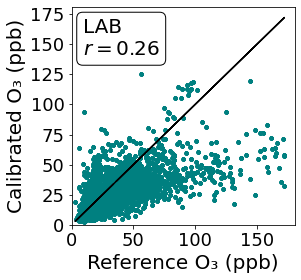

In [541]:
fig= plt.figure(figsize=(4,4))
ax = fig.add_subplot(111)
#ax.patch.set_facecolor('lightblue')
#ax.patch.set_alpha(0.3)
#m0, b0 = np.polyfit(np.array(y_test), np.array(lab1), 1)
#plt.plot(np.array(y_test), m0*np.array(y_test) + b0,color='#426eff',linewidth=4)
#m1, b1 = np.polyfit(np.array(y_test), np.array(pred_lr), 1)
#plt.plot(np.array(y_test), m1*np.array(y_test) + b1,color='#513e00',linewidth=4)
#m2, b2 = np.polyfit(np.array(y_test), np.array(pred_svr), 1)
#plt.plot(np.array(y_test), m2*np.array(y_test) + b2,color='brown',linewidth=4)
#m3, b3 = np.polyfit(np.array(y_test), np.array(pred_rf), 1)
#plt.plot(np.array(y_test), m3*np.array(y_test) + b3,color='indigo',linewidth=4)
#m4, b4 = np.polyfit(np.array(y_test), np.array(pred_ann), 1)
#plt.plot(np.array(y_test), m4*np.array(y_test) + b4,color='tomato',linewidth=4)
#m5, b5 = np.polyfit(np.array(y_test), np.array(pred_xgb), 1)
#plt.plot(np.array(y_test), m5*np.array(y_test) + b5,color='darkgoldenrod',linewidth=4)
plt.scatter(np.array(y_test),np.array(lab1),color='teal',marker="$\\bigoplus$",s=15)
#plt.scatter(np.array(y_test),np.array(pred_lr),color='#513e00',marker='P')
#plt.scatter(np.array(y_test),np.array(pred_svr),color='brown',marker='d')
#plt.scatter(np.array(y_test),np.array(pred_rf),color='indigo',marker='*',s=30)
#plt.scatter(np.array(y_test),np.array(pred_ann),color='tomato',marker='s')
#plt.scatter(np.array(y_test),np.array(pred_xgb),color='darkgoldenrod',marker='1',s=15)
ax.plot(y_test,y_test, c ="black",linewidth=1.5)
#ax.spines['right'].set_visible(False)
#ax.spines['top'].set_visible(False)
ax.set_ylim(bottom=0)
ax.set_xlim(left=0)
plt.xlabel('Reference O3 (ppb)'.translate(subscript),fontsize=20)
plt.ylabel('Calibrated O3 (ppb)'.translate(subscript),fontsize=20)
#plt.legend(['1:1 Ref','LAB','RF','XGBoost'
            #], loc = 2, bbox_to_anchor = (0,1))
#plt.title('CO Sensor',fontsize=18 )
A=[0.26,0.97,0.95]
#ax.text(1800, 2900, r'$ r=$'+str(A[0]), fontsize=13)
#ax.text(200, 2900, 'LAB', fontsize=17)
#plt.title(r'$ r=$'+str(A[0]))
          #,
          #fontsize=12)
#plt.grid(linestyle='-.',linewidth=0.1)
textstr = '\n'.join(('LAB',r'$r=%.2f$' % (A[0], ) ))

props = dict(boxstyle='round', facecolor='white', alpha=1)

# place a text box in upper left in axes coords
ax.text(0.05, 0.95, textstr, transform=ax.transAxes, fontsize=20,
        verticalalignment='top', bbox=props)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
#ax.axhline(linewidth=1.5, color='black')
#ax.axvline(linewidth=2.5, color='black')
plt.savefig("N3_2.5_corr_LAB.pdf", format="pdf", bbox_inches="tight")
plt.show()

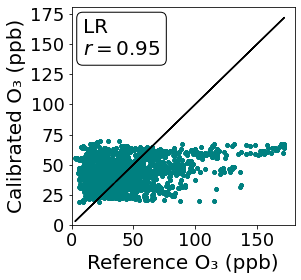

In [542]:
fig= plt.figure(figsize=(4,4))
ax = fig.add_subplot(111)
#ax.patch.set_facecolor('lightblue')
#ax.patch.set_alpha(0.3)
#m0, b0 = np.polyfit(np.array(y_test), np.array(lab1), 1)
#plt.plot(np.array(y_test), m0*np.array(y_test) + b0,color='#426eff',linewidth=4)
#m1, b1 = np.polyfit(np.array(y_test), np.array(pred_lr), 1)
#plt.plot(np.array(y_test), m1*np.array(y_test) + b1,color='#513e00',linewidth=4)
#m2, b2 = np.polyfit(np.array(y_test), np.array(pred_svr), 1)
#plt.plot(np.array(y_test), m2*np.array(y_test) + b2,color='brown',linewidth=4)
#m3, b3 = np.polyfit(np.array(y_test), np.array(pred_rf), 1)
#plt.plot(np.array(y_test), m3*np.array(y_test) + b3,color='indigo',linewidth=4)
#m4, b4 = np.polyfit(np.array(y_test), np.array(pred_ann), 1)
#plt.plot(np.array(y_test), m4*np.array(y_test) + b4,color='tomato',linewidth=4)
#m5, b5 = np.polyfit(np.array(y_test), np.array(pred_xgb), 1)
#plt.plot(np.array(y_test), m5*np.array(y_test) + b5,color='darkgoldenrod',linewidth=4)
plt.scatter(np.array(y_test),pred_lr,color='teal',marker="$\\bigoplus$",s=15)
#plt.scatter(np.array(y_test),np.array(pred_lr),color='#513e00',marker='P')
#plt.scatter(np.array(y_test),np.array(pred_svr),color='brown',marker='d')
#plt.scatter(np.array(y_test),np.array(pred_rf),color='indigo',marker='*',s=30)
#plt.scatter(np.array(y_test),np.array(pred_ann),color='tomato',marker='s')
#plt.scatter(np.array(y_test),np.array(pred_xgb),color='darkgoldenrod',marker='1',s=15)
ax.plot(y_test,y_test, c ="black",linewidth=1.5)
#ax.spines['right'].set_visible(False)
#ax.spines['top'].set_visible(False)
ax.set_ylim(bottom=0)
ax.set_xlim(left=0)
plt.xlabel('Reference O3 (ppb)'.translate(subscript),fontsize=20)
plt.ylabel('Calibrated O3 (ppb)'.translate(subscript),fontsize=20)
#plt.legend(['1:1 Ref','LAB','RF','XGBoost'
            #], loc = 2, bbox_to_anchor = (0,1))
#plt.title('CO Sensor',fontsize=18 )
A=[0.95,0.97,0.95]
#ax.text(1800, 2900, r'$ r=$'+str(A[0]), fontsize=13)
#ax.text(200, 2900, 'LAB', fontsize=17)
#plt.title(r'$ r=$'+str(A[0]))
          #,
          #fontsize=12)
#plt.grid(linestyle='-.',linewidth=0.1)
textstr = '\n'.join(('LR',r'$r=%.2f$' % (A[0], ) ))

props = dict(boxstyle='round', facecolor='white', alpha=1)

# place a text box in upper left in axes coords
ax.text(0.05, 0.95, textstr, transform=ax.transAxes, fontsize=20,
        verticalalignment='top', bbox=props)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
#ax.axhline(linewidth=1.5, color='black')
#ax.axvline(linewidth=2.5, color='black')
plt.savefig("N3_2.5_corr_LR.pdf", format="pdf", bbox_inches="tight")
plt.show()

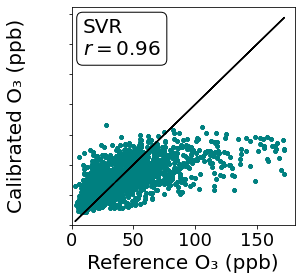

In [543]:
fig= plt.figure(figsize=(4,4))
ax = fig.add_subplot(111)
#ax.patch.set_facecolor('lightblue')
#ax.patch.set_alpha(0.3)
#m0, b0 = np.polyfit(np.array(y_test), np.array(lab1), 1)
#plt.plot(np.array(y_test), m0*np.array(y_test) + b0,color='#426eff',linewidth=4)
#m1, b1 = np.polyfit(np.array(y_test), np.array(pred_lr), 1)
#plt.plot(np.array(y_test), m1*np.array(y_test) + b1,color='#513e00',linewidth=4)
#m2, b2 = np.polyfit(np.array(y_test), np.array(pred_svr), 1)
#plt.plot(np.array(y_test), m2*np.array(y_test) + b2,color='brown',linewidth=4)
#m3, b3 = np.polyfit(np.array(y_test), np.array(pred_rf), 1)
#plt.plot(np.array(y_test), m3*np.array(y_test) + b3,color='indigo',linewidth=4)
#m4, b4 = np.polyfit(np.array(y_test), np.array(pred_ann), 1)
#plt.plot(np.array(y_test), m4*np.array(y_test) + b4,color='tomato',linewidth=4)
#m5, b5 = np.polyfit(np.array(y_test), np.array(pred_xgb), 1)
#plt.plot(np.array(y_test), m5*np.array(y_test) + b5,color='darkgoldenrod',linewidth=4)
plt.scatter(np.array(y_test),pred_svr,color='teal',marker="$\\bigoplus$",s=15)
#plt.scatter(np.array(y_test),np.array(pred_lr),color='#513e00',marker='P')
#plt.scatter(np.array(y_test),np.array(pred_svr),color='brown',marker='d')
#plt.scatter(np.array(y_test),np.array(pred_rf),color='indigo',marker='*',s=30)
#plt.scatter(np.array(y_test),np.array(pred_ann),color='tomato',marker='s')
#plt.scatter(np.array(y_test),np.array(pred_xgb),color='darkgoldenrod',marker='1',s=15)
ax.plot(y_test,y_test, c ="black",linewidth=1.5)
#ax.spines['right'].set_visible(False)
#ax.spines['top'].set_visible(False)
ax.set_ylim(bottom=0)
ax.set_xlim(left=0)
plt.xlabel('Reference O3 (ppb)'.translate(subscript),fontsize=20)
plt.ylabel('Calibrated O3 (ppb)'.translate(subscript),fontsize=20)
#plt.legend(['1:1 Ref','LAB','RF','XGBoost'
            #], loc = 2, bbox_to_anchor = (0,1))
#plt.title('CO Sensor',fontsize=18 )
A=[0.96,0.97,0.95]
#ax.text(1800, 2900, r'$ r=$'+str(A[0]), fontsize=13)
#ax.text(200, 2900, 'LAB', fontsize=17)
#plt.title(r'$ r=$'+str(A[0]))
          #,
          #fontsize=12)
#plt.grid(linestyle='-.',linewidth=0.1)
textstr = '\n'.join(('SVR',r'$r=%.2f$' % (A[0], ) ))

props = dict(boxstyle='round', facecolor='white', alpha=1)

# place a text box in upper left in axes coords
ax.text(0.05, 0.95, textstr, transform=ax.transAxes, fontsize=20,
        verticalalignment='top', bbox=props)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18, color='white')
#ax.axhline(linewidth=1.5, color='black')
#ax.axvline(linewidth=2.5, color='black')
plt.savefig("N3_2.5_corr_SVR.pdf", format="pdf", bbox_inches="tight")
plt.show()

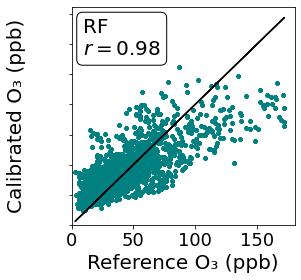

In [544]:
fig= plt.figure(figsize=(4,4))
ax = fig.add_subplot(111)
#ax.patch.set_facecolor('lightblue')
#ax.patch.set_alpha(0.3)
#m0, b0 = np.polyfit(np.array(y_test), np.array(lab1), 1)
#plt.plot(np.array(y_test), m0*np.array(y_test) + b0,color='#426eff',linewidth=4)
#m1, b1 = np.polyfit(np.array(y_test), np.array(pred_lr), 1)
#plt.plot(np.array(y_test), m1*np.array(y_test) + b1,color='#513e00',linewidth=4)
#m2, b2 = np.polyfit(np.array(y_test), np.array(pred_svr), 1)
#plt.plot(np.array(y_test), m2*np.array(y_test) + b2,color='brown',linewidth=4)
#m3, b3 = np.polyfit(np.array(y_test), np.array(pred_rf), 1)
#plt.plot(np.array(y_test), m3*np.array(y_test) + b3,color='indigo',linewidth=4)
#m4, b4 = np.polyfit(np.array(y_test), np.array(pred_ann), 1)
#plt.plot(np.array(y_test), m4*np.array(y_test) + b4,color='tomato',linewidth=4)
#m5, b5 = np.polyfit(np.array(y_test), np.array(pred_xgb), 1)
#plt.plot(np.array(y_test), m5*np.array(y_test) + b5,color='darkgoldenrod',linewidth=4)
plt.scatter(np.array(y_test),pred_rf,color='teal',marker="$\\bigoplus$",s=15)
#plt.scatter(np.array(y_test),np.array(pred_lr),color='#513e00',marker='P')
#plt.scatter(np.array(y_test),np.array(pred_svr),color='brown',marker='d')
#plt.scatter(np.array(y_test),np.array(pred_rf),color='indigo',marker='*',s=30)
#plt.scatter(np.array(y_test),np.array(pred_ann),color='tomato',marker='s')
#plt.scatter(np.array(y_test),np.array(pred_xgb),color='darkgoldenrod',marker='1',s=15)
ax.plot(y_test,y_test, c ="black",linewidth=1.5)
#ax.spines['right'].set_visible(False)
#ax.spines['top'].set_visible(False)
ax.set_ylim(bottom=0)
ax.set_xlim(left=0)
plt.xlabel('Reference O3 (ppb)'.translate(subscript),fontsize=20)
plt.ylabel('Calibrated O3 (ppb)'.translate(subscript),fontsize=20)
#plt.legend(['1:1 Ref','LAB','RF','XGBoost'
            #], loc = 2, bbox_to_anchor = (0,1))
#plt.title('CO Sensor',fontsize=18 )
A=[0.98,0.97,0.95]
#ax.text(1800, 2900, r'$ r=$'+str(A[0]), fontsize=13)
#ax.text(200, 2900, 'LAB', fontsize=17)
#plt.title(r'$ r=$'+str(A[0]))
          #,
          #fontsize=12)
#plt.grid(linestyle='-.',linewidth=0.1)
textstr = '\n'.join(('RF',r'$r=%.2f$' % (A[0], ) ))

props = dict(boxstyle='round', facecolor='white', alpha=1)

# place a text box in upper left in axes coords
ax.text(0.05, 0.95, textstr, transform=ax.transAxes, fontsize=20,
        verticalalignment='top', bbox=props)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18, color='white')
#ax.axhline(linewidth=1.5, color='black')
#ax.axvline(linewidth=2.5, color='black')
plt.savefig("N3_2.5_corr_RF.pdf", format="pdf", bbox_inches="tight")
plt.show()

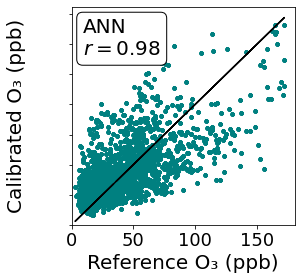

In [545]:
fig= plt.figure(figsize=(4,4))
ax = fig.add_subplot(111)
#ax.patch.set_facecolor('lightblue')
#ax.patch.set_alpha(0.3)
#m0, b0 = np.polyfit(np.array(y_test), np.array(lab1), 1)
#plt.plot(np.array(y_test), m0*np.array(y_test) + b0,color='#426eff',linewidth=4)
#m1, b1 = np.polyfit(np.array(y_test), np.array(pred_lr), 1)
#plt.plot(np.array(y_test), m1*np.array(y_test) + b1,color='#513e00',linewidth=4)
#m2, b2 = np.polyfit(np.array(y_test), np.array(pred_svr), 1)
#plt.plot(np.array(y_test), m2*np.array(y_test) + b2,color='brown',linewidth=4)
#m3, b3 = np.polyfit(np.array(y_test), np.array(pred_rf), 1)
#plt.plot(np.array(y_test), m3*np.array(y_test) + b3,color='indigo',linewidth=4)
#m4, b4 = np.polyfit(np.array(y_test), np.array(pred_ann), 1)
#plt.plot(np.array(y_test), m4*np.array(y_test) + b4,color='tomato',linewidth=4)
#m5, b5 = np.polyfit(np.array(y_test), np.array(pred_xgb), 1)
#plt.plot(np.array(y_test), m5*np.array(y_test) + b5,color='darkgoldenrod',linewidth=4)
plt.scatter(np.array(y_test),pred_ann,color='teal',marker="$\\bigoplus$",s=15)
#plt.scatter(np.array(y_test),np.array(pred_lr),color='#513e00',marker='P')
#plt.scatter(np.array(y_test),np.array(pred_svr),color='brown',marker='d')
#plt.scatter(np.array(y_test),np.array(pred_rf),color='indigo',marker='*',s=30)
#plt.scatter(np.array(y_test),np.array(pred_ann),color='tomato',marker='s')
#plt.scatter(np.array(y_test),np.array(pred_xgb),color='darkgoldenrod',marker='1',s=15)
ax.plot(y_test,y_test, c ="black",linewidth=1.5)
#ax.spines['right'].set_visible(False)
#ax.spines['top'].set_visible(False)
ax.set_ylim(bottom=0)
ax.set_xlim(left=0)
plt.xlabel('Reference O3 (ppb)'.translate(subscript),fontsize=20)
plt.ylabel('Calibrated O3 (ppb)'.translate(subscript),fontsize=20)
#plt.legend(['1:1 Ref','LAB','RF','XGBoost'
            #], loc = 2, bbox_to_anchor = (0,1))
#plt.title('CO Sensor',fontsize=18 )
A=[0.98,0.97,0.95]
#ax.text(1800, 2900, r'$ r=$'+str(A[0]), fontsize=13)
#ax.text(200, 2900, 'LAB', fontsize=17)
#plt.title(r'$ r=$'+str(A[0]))
          #,
          #fontsize=12)
#plt.grid(linestyle='-.',linewidth=0.1)
textstr = '\n'.join(('ANN',r'$r=%.2f$' % (A[0], ) ))

props = dict(boxstyle='round', facecolor='white', alpha=1)

# place a text box in upper left in axes coords
ax.text(0.05, 0.95, textstr, transform=ax.transAxes, fontsize=20,
        verticalalignment='top', bbox=props)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18, color='white')
#ax.axhline(linewidth=1.5, color='black')
#ax.axvline(linewidth=2.5, color='black')
plt.savefig("N3_2.5_corr_ANN.pdf", format="pdf", bbox_inches="tight")
plt.show()

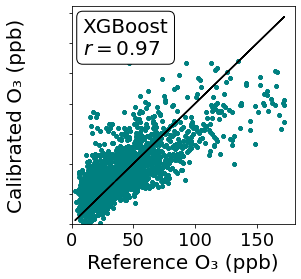

In [546]:
fig= plt.figure(figsize=(4,4))
ax = fig.add_subplot(111)
#ax.patch.set_facecolor('lightblue')
#ax.patch.set_alpha(0.3)
#m0, b0 = np.polyfit(np.array(y_test), np.array(lab1), 1)
#plt.plot(np.array(y_test), m0*np.array(y_test) + b0,color='#426eff',linewidth=4)
#m1, b1 = np.polyfit(np.array(y_test), np.array(pred_lr), 1)
#plt.plot(np.array(y_test), m1*np.array(y_test) + b1,color='#513e00',linewidth=4)
#m2, b2 = np.polyfit(np.array(y_test), np.array(pred_svr), 1)
#plt.plot(np.array(y_test), m2*np.array(y_test) + b2,color='brown',linewidth=4)
#m3, b3 = np.polyfit(np.array(y_test), np.array(pred_rf), 1)
#plt.plot(np.array(y_test), m3*np.array(y_test) + b3,color='indigo',linewidth=4)
#m4, b4 = np.polyfit(np.array(y_test), np.array(pred_ann), 1)
#plt.plot(np.array(y_test), m4*np.array(y_test) + b4,color='tomato',linewidth=4)
#m5, b5 = np.polyfit(np.array(y_test), np.array(pred_xgb), 1)
#plt.plot(np.array(y_test), m5*np.array(y_test) + b5,color='darkgoldenrod',linewidth=4)
plt.scatter(np.array(y_test),pred_xgb,color='teal',marker="$\\bigoplus$",s=15)
#plt.scatter(np.array(y_test),np.array(pred_lr),color='#513e00',marker='P')
#plt.scatter(np.array(y_test),np.array(pred_svr),color='brown',marker='d')
#plt.scatter(np.array(y_test),np.array(pred_rf),color='indigo',marker='*',s=30)
#plt.scatter(np.array(y_test),np.array(pred_ann),color='tomato',marker='s')
#plt.scatter(np.array(y_test),np.array(pred_xgb),color='darkgoldenrod',marker='1',s=15)
ax.plot(y_test,y_test, c ="black",linewidth=1.5)
#ax.spines['right'].set_visible(False)
#ax.spines['top'].set_visible(False)
ax.set_ylim(bottom=0)
ax.set_xlim(left=0)
plt.xlabel('Reference O3 (ppb)'.translate(subscript),fontsize=20)
plt.ylabel('Calibrated O3 (ppb)'.translate(subscript),fontsize=20)
#plt.legend(['1:1 Ref','LAB','RF','XGBoost'
            #], loc = 2, bbox_to_anchor = (0,1))
#plt.title('CO Sensor',fontsize=18 )
A=[0.97,0.97,0.95]
#ax.text(1800, 2900, r'$ r=$'+str(A[0]), fontsize=13)
#ax.text(200, 2900, 'LAB', fontsize=17)
#plt.title(r'$ r=$'+str(A[0]))
          #,
          #fontsize=12)
#plt.grid(linestyle='-.',linewidth=0.1)
textstr = '\n'.join(('XGBoost',r'$r=%.2f$' % (A[0], ) ))

props = dict(boxstyle='round', facecolor='white', alpha=1)

# place a text box in upper left in axes coords
ax.text(0.05, 0.95, textstr, transform=ax.transAxes, fontsize=20,
        verticalalignment='top', bbox=props)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18, color='white')
#ax.axhline(linewidth=1.5, color='black')
#ax.axvline(linewidth=2.5, color='black')
plt.savefig("N3_2.5_corr_XGB.pdf", format="pdf", bbox_inches="tight")
plt.show()

fig= plt.figure(figsize=(12,6))
#ax = fig.add_subplot(111)
#ax.patch.set_facecolor('lightblue')
ax.patch.set_alpha(0.4)

plt.plot(CO_Day,CO_Rmse1_rf, color='orange',linewidth=3,marker="*",markersize=0,alpha=0.7)
#plt.scatter(CO_Day,CO_Rmse1_rf,label='CO', color='orange',s=100, marker="^")
plt.plot(NO2_Day,NO2_Rmse1_rf, color='teal',linewidth=3,marker="*",markersize=0,alpha=0.7)
#plt.scatter(NO2_Day,NO2_Rmse1_rf,label='NO2'.translate(subscript), color='teal',s=100, marker="^")
#plt.plot(SO2_Day,SO2_Rmse1_rf, color='rebeccapurple',linewidth=2,marker=".",markersize=0)
#plt.scatter(SO2_Day,SO2_Rmse1_rf, color='rebeccapurple',s=500, marker="*")
plt.plot(O3_Day,O3_Rmse1_rf, color='firebrick',linewidth=3,marker=".",markersize=0,alpha=0.7)
#plt.scatter(O3_Day,O3_Rmse1_rf,label='O3'.translate(subscript), color='firebrick',s=100, marker="^")
plt.axhline(y = 0.1, color = 'blue',label='RC', linestyle = ':',linewidth=2 )
plt.axhline(y = 0.25, color ='purple',label='SGS' , linestyle = ':',linewidth=2)
plt.axhline(y = 0.3, color ='darkolivegreen',label='IS/IM' , linestyle = ':',linewidth=2)
plt.axhline(y = 0.5, color ='darkgoldenrod' ,label='HA/SP', linestyle = ':',linewidth=2)
#get handles and labels
handles, labels = plt.gca().get_legend_handles_labels()
print(handles)
#specify order of items in legend
order = [4,5,6,0,1,2,3]
#add legend to plot
#plt.legend([handles[idx] for idx in order],[labels[idx] for idx in order], fontsize=12,ncol=7, 
           #bbox_to_anchor = (0.87,1.13)) 
plt.legend(['CO','NO2'.translate(subscript),
            'O3'.translate(subscript),"RC","SGS","IS/IM","HA/SP"],ncol=7,bbox_to_anchor = (0.87,1.10),  fontsize=10)

plt.xlabel('Days of Training',fontsize=20)
plt.ylabel('SMAE',fontsize=20)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.tick_params(width=1,length=3)
plt.xticks(np.arange(0, 101, step=10))
plt.yticks(np.arange(0,0.8, step=0.1)) 
ax.spines["bottom"].set_linewidth(1)
ax.spines["left"].set_linewidth(1)
ax.spines["top"].set_linewidth(1)
ax.spines["right"].set_linewidth(1)
#plt.legend( fontsize=16)
#plt.title('CO Sensor',fontsize=18 )
plt.grid(linestyle='-.',linewidth=0.15)

In [547]:
!pip install folium
import folium
m1 = folium.Map(location=[35.152, 33.347786], tiles='openstreetmap', zoom_start=50)
folium.Marker([35.152,33.347786 ], popup='<i>You can use whatever HTML code you want</i>').add_to(m1)
m1.save('map1.html')


[notice] A new release of pip available: 22.3.1 -> 23.0.1
[notice] To update, run: pip install --upgrade pip


m1

data=[[CO_Day[i],CO_Rmse1_rf[i],NO2_Rmse1_rf[i],O3_Rmse1_rf[i]] for i in range(len(CO_Day))]
df=pd.DataFrame(data=data, columns=['Day','CO','NO2','O3'])
df.head()

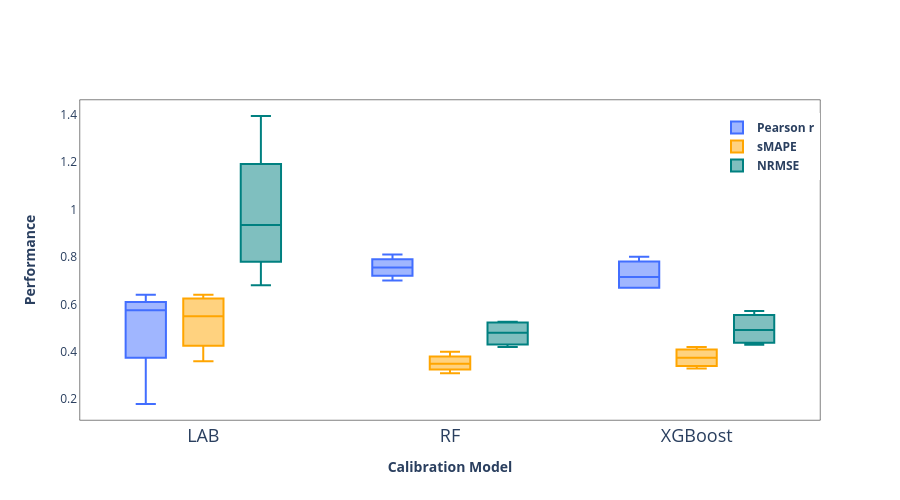

In [548]:
import chart_studio.plotly
import plotly.express as px
from IPython.display import Image
import plotly.graph_objects as go
import numpy as np

LAB_PR=[Pearson_lab_CO,Pearson_lab_NO2,Pearson_lab_SO2,Pearson_lab_O3]
LR_PR=[Pearson_lr_CO,Pearson_lr_NO2,Pearson_lr_SO2,Pearson_lr_O3]
SVR_PR=[Pearson_svr_CO,Pearson_svr_NO2,Pearson_svr_SO2,Pearson_svr_O3]
RF_PR=[Pearson_rf_CO,Pearson_rf_NO2,Pearson_rf_SO2,Pearson_rf_O3]
ANN_PR=[Pearson_ann_CO,Pearson_ann_NO2,Pearson_ann_SO2,Pearson_ann_O3]
XGB_PR=[Pearson_xgb_CO,Pearson_xgb_NO2,Pearson_xgb_SO2,Pearson_xgb_O3]


LAB_SM=[sMAPE_lab_CO,sMAPE_lab_NO2,sMAPE_lab_SO2,sMAPE_lab_O3]
LR_SM=[sMAPE_lr_CO,sMAPE_lr_NO2,sMAPE_lr_SO2,sMAPE_lr_O3]
SVR_SM=[sMAPE_svr_CO,sMAPE_svr_NO2,sMAPE_svr_SO2,sMAPE_svr_O3]
RF_SM=[sMAPE_rf_CO,sMAPE_rf_NO2,sMAPE_rf_SO2,sMAPE_rf_O3]
ANN_SM=[sMAPE_ann_CO,sMAPE_ann_NO2,sMAPE_ann_SO2,sMAPE_ann_O3]
XGB_SM=[sMAPE_xgb_CO,sMAPE_xgb_NO2,sMAPE_xgb_SO2,sMAPE_xgb_O3]

LAB_RM=[RMSE_lab_CO,RMSE_lab_NO2,RMSE_lab_SO2,RMSE_lab_O3]
LR_RM=[RMSE_lr_CO,RMSE_lr_NO2,RMSE_lr_SO2,RMSE_lr_O3]
SVR_RM=[RMSE_svr_CO,RMSE_svr_NO2,RMSE_svr_SO2,RMSE_svr_O3]
RF_RM=[RMSE_rf_CO,RMSE_rf_NO2,RMSE_rf_SO2,RMSE_rf_O3]
ANN_RM=[RMSE_ann_CO,RMSE_ann_NO2,RMSE_ann_SO2,RMSE_ann_O3]
XGB_RM=[RMSE_xgb_CO,RMSE_xgb_NO2,RMSE_xgb_SO2,RMSE_xgb_O3]

PR=LAB_PR+RF_PR+XGB_PR
SM=LAB_SM+RF_SM+XGB_SM
RM=LAB_RM+RF_RM+XGB_RM
x1=['LAB' for i in range(4)]
x2=['LR' for i in range(4)]
x3=['SVR' for i in range(4)]
x4=['RF' for i in range(4)]
x5=['ANN' for i in range(4)]
x6=['XGBoost' for i in range(4)]


x=x1+x4+x6
fig = go.Figure() 

# Defining x axis
x = x
fig.add_trace(go.Box(
  
    # defining y axis in corresponding
    # to x-axis
    y=PR,
    x=x,
    name='<b>Pearson r</b>',
    marker_color='#426eff'
))
  
fig.add_trace(go.Box(
    y=SM,
    x=x,
    name='<b>sMAPE</b>',
    marker_color='orange'

))
fig.add_trace(go.Box(
    y=RM,
    x=x,
    name='<b>NRMSE</b>',
    marker_color='teal'

))

fig.update_layout(autosize=False,
    width=900,
    height=500,
                  
  legend=dict(
    yanchor="bottom",
    y=0.75,
    xanchor="right",
    x=1),
    # group together boxes of the different
    # traces for each value of x
    boxmode='group',
                   plot_bgcolor='rgba(0,0,0,0)'
                  )

fig.update_xaxes(title_text="<b>Calibration Model</b>",tickfont = dict(size=18),
                 showgrid=False,showline=True, 
                 linewidth=0.5, linecolor='black',mirror=True)
fig.update_yaxes(title_text="<b>Performance</b>",showgrid=False,showline=True, 
                 linewidth=0.5, linecolor='black',
                 mirror=True)
chart_studio.plotly.sign_in('vinylango', 'gybbJVWfRSUoTcRRSa6J')
chart_studio.plotly.image.save_as(fig, filename='models_boxplot.png')
Image('models_boxplot.png')

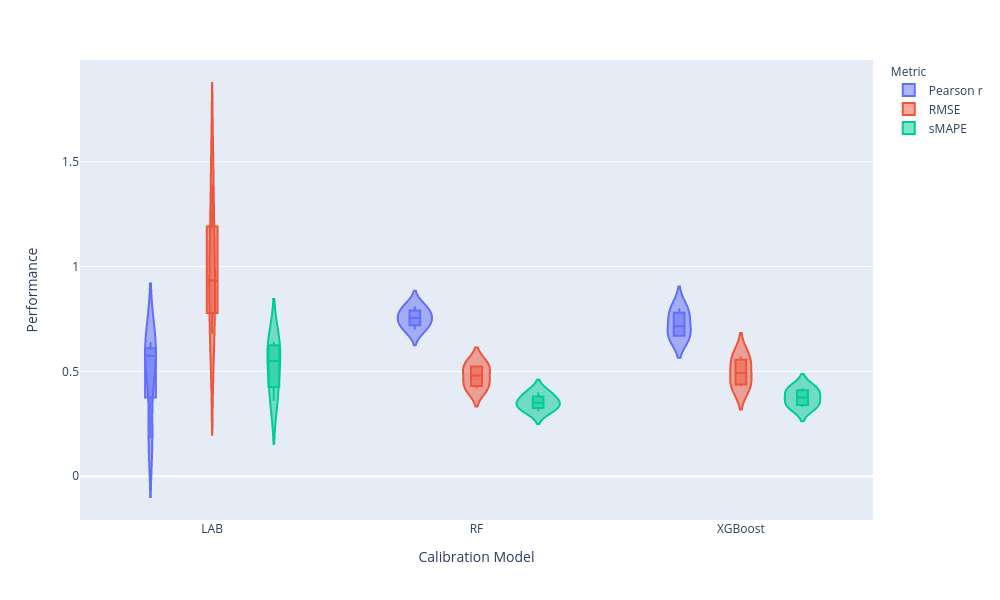

In [549]:
#Violin plot which also show the density of the distribution
import plotly.express as px
Metric1=['Pearson r' for i in range(len(PR))]
Metric2=['RMSE' for i in range(len(RM))]
Metric3=['sMAPE' for i in range(len(RM))]
Metric=Metric1+Metric2+Metric3
Model=x+x+x
Values=PR+RM+SM
lst=[[Model[i],Values[i],Metric[i]] for i in range(len(Model))]
df = pd.DataFrame(lst, columns =['Calibration Model', 'Performance','Metric'])

#fig = px.violin( df,y="Performance", x="Calibration Model", color='Metric', box=True,points="all",
          #hover_data=df.columns)
fig = px.violin( df,y="Performance", x="Calibration Model", color='Metric', box=True,
          hover_data=df.columns)


fig.update_layout(autosize=False,
    width=1000,
    height=600)
#fig.show()
chart_studio.plotly.sign_in('vinylango', 'gybbJVWfRSUoTcRRSa6J')
chart_studio.plotly.image.save_as(fig, filename='models_violinplots.png')
Image('models_violinplots.png')

## Target Diagrams

In [550]:
theta = np.linspace( 0 , 2 * np.pi , 150 )
 
radius = 1
 
a = radius * np.cos( theta )
b = radius * np.sin( theta )


CRMSE_LAB=[CRMSE_LAB_CO,CRMSE_LAB_NO2,CRMSE_LAB_O3,CRMSE_LAB_SO2]
CRMSE_LR=[CRMSE_LR_CO,CRMSE_LR_NO2,CRMSE_LR_O3,CRMSE_LR_SO2]
CRMSE_SVR=[CRMSE_SVR_CO,CRMSE_SVR_NO2,CRMSE_SVR_O3,CRMSE_SVR_SO2]
CRMSE_RF=[CRMSE_RF_CO,CRMSE_RF_NO2,CRMSE_RF_O3,CRMSE_RF_SO2]
CRMSE_ANN=[CRMSE_ANN_CO,CRMSE_ANN_NO2,CRMSE_ANN_O3,CRMSE_ANN_SO2]
CRMSE_XGB=[CRMSE_XGB_CO,CRMSE_XGB_NO2,CRMSE_XGB_O3,CRMSE_XGB_SO2]

MBE_LAB=[MBE_LAB_CO,MBE_LAB_NO2,MBE_LAB_O3,MBE_LAB_SO2]
MBE_LR=[MBE_LR_CO,MBE_LR_NO2,MBE_LR_O3,MBE_LR_SO2]
MBE_SVR=[MBE_SVR_CO,MBE_SVR_NO2,MBE_SVR_O3,MBE_SVR_SO2]
MBE_RF=[MBE_RF_CO,MBE_RF_NO2,MBE_RF_O3,MBE_RF_SO2]
MBE_ANN=[MBE_ANN_CO,MBE_ANN_NO2,MBE_ANN_O3,MBE_ANN_SO2]
MBE_XGB=[MBE_XGB_CO,MBE_XGB_NO2,MBE_XGB_O3,MBE_XGB_SO2]


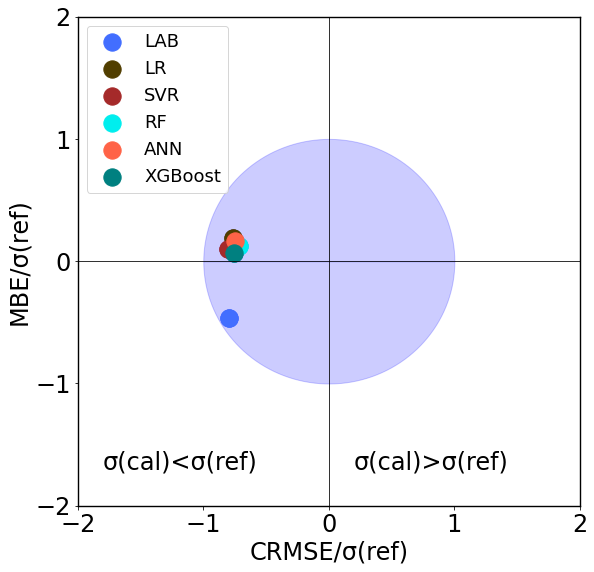

In [551]:
fig= plt.figure(figsize=(9,9))
ax = fig.add_subplot(111)
#ax.patch.set_facecolor('lightblue')
#ax.patch.set_alpha(0.3)
#plt.text(CRMSE_LAB[0],MBE_LAB[0] , '•', rotation=90, va='center',fontsize = 50, color='#426eff')
#plt.text(CRMSE_LR[0],MBE_LR[0] , '•', rotation=90, va='center',fontsize = 50, color='#513e00')
#plt.text(CRMSE_SVR[0],MBE_SVR[0] , '•', rotation=90, va='center',fontsize = 50, color='brown')
#plt.text(CRMSE_RF[0],MBE_RF[0] , '•', rotation=90, va='center',fontsize = 50, color='indigo')
#plt.text(CRMSE_ANN[0],MBE_ANN[0] , '•', rotation=90, va='center',fontsize = 50, color='tomato')
#plt.text(CRMSE_XGB[0],MBE_XGB[0] , '•', rotation=90, va='center',fontsize = 50, color='teal')
plt.scatter(CRMSE_LAB[0],MBE_LAB[0],color='#426eff',s=300)
plt.scatter(CRMSE_LR[0],MBE_LR[0],color='#513e00',s=300)
plt.scatter(CRMSE_SVR[0],MBE_SVR[0],color='brown',s=300)
plt.scatter(CRMSE_RF[0],MBE_RF[0] ,color='#00EEEE',s=300)
plt.scatter(CRMSE_ANN[0],MBE_ANN[0],color='tomato',s=300)
plt.scatter(CRMSE_XGB[0],MBE_XGB[0],color='teal',s=300)
plt.legend(['LAB','LR','SVR','RF','ANN','XGBoost'],loc = 2, bbox_to_anchor = (0,1), fontsize=18)
plt.Circle((0, 0), 1, color='wheat')
plt.fill_between(a, b, color='blue', alpha=0.2)
plt.scatter(CRMSE_LAB[0],MBE_LAB[0],color='#426eff',s=300)
plt.scatter(CRMSE_LR[0],MBE_LR[0],color='#513e00',s=300)
plt.scatter(CRMSE_SVR[0],MBE_SVR[0],color='brown',s=300)
plt.scatter(CRMSE_RF[0],MBE_RF[0] ,color='#00EEEE',s=300)
plt.scatter(CRMSE_ANN[0],MBE_ANN[0],color='tomato',s=300)
plt.scatter(CRMSE_XGB[0],MBE_XGB[0],color='teal',s=300)
#plt.legend(['LAB','LR','SVR','RF','ANN','XGBoost'],loc = 2, bbox_to_anchor = (0,1), fontsize=20)

plt.text(-1.8, -1.7, 'σ(cal)<σ(ref)', fontsize = 24, color='black')
plt.text(0.2, -1.7, 'σ(cal)>σ(ref)', fontsize = 24, color='black')
#plt.text(-0.3, -0.25, 'MBE<0', rotation=90, va='center',fontsize = 16, color='black')
#plt.text(-0.3, 0.25, 'MBE>0', rotation=90, va='center',fontsize = 16, color='black')

plt.xlabel('CRMSE/σ(ref)',fontsize=24)
plt.ylabel('MBE/σ(ref)',fontsize=24)
plt.xticks(fontsize=24)
plt.yticks(fontsize=24)
#plt.xticks(color='w')
plt.vlines([0], -2, 2, linewidth=0.8,color='black')
plt.hlines([0], -2, 2, linewidth=0.8,color='black')
ax.set_ylim(bottom=-2)
ax.set_ylim(top=2)
ax.set_xlim(left=-2)
ax.set_xlim(right=2)
plt.xticks([-2,-1,0,1,2])
plt.yticks([-2,-1,0,1,2])
plt.setp(ax.spines.values(), linewidth=1.4)
#plt.yticks(color='w')
#plt.title('CO',fontsize=18)
#plt.grid(linestyle='-.',linewidth=0.3)
plt.savefig("Target_OPC1.pdf", format="pdf", bbox_inches="tight")
plt.show()


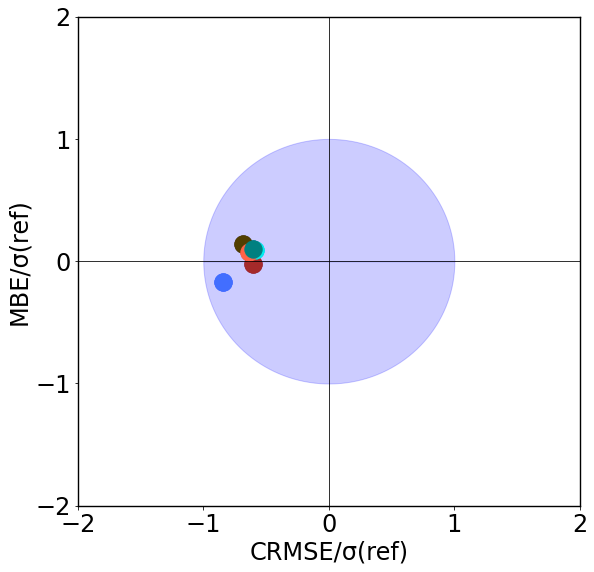

In [552]:
fig= plt.figure(figsize=(9,9))
ax = fig.add_subplot(111)
plt.scatter(CRMSE_LAB[1],MBE_LAB[1],color='#426eff',s=300)
plt.scatter(CRMSE_LR[1],MBE_LR[1],color='#513e00',s=300)
plt.scatter(CRMSE_SVR[1],MBE_SVR[1],color='brown',s=300)
plt.scatter(CRMSE_RF[1],MBE_RF[1] ,color='#00EEEE',s=300)
plt.scatter(CRMSE_ANN[1],MBE_ANN[1],color='tomato',s=300)
plt.scatter(CRMSE_XGB[1],MBE_XGB[1],color='teal',s=300)
#plt.legend(['LAB','LR','SVR','RF','ANN','XGBoost'],loc = 2, bbox_to_anchor = (0,1), fontsize=20)
plt.Circle((0, 0), 1, color='wheat')
plt.fill_between(a, b, color='blue', alpha=0.2)
plt.scatter(CRMSE_LAB[1],MBE_LAB[1],color='#426eff',s=300)
plt.scatter(CRMSE_LR[1],MBE_LR[1],color='#513e00',s=300)
plt.scatter(CRMSE_SVR[1],MBE_SVR[1],color='brown',s=300)
plt.scatter(CRMSE_RF[1],MBE_RF[1] ,color='#00EEEE',s=300)
plt.scatter(CRMSE_ANN[1],MBE_ANN[1],color='tomato',s=300)
plt.scatter(CRMSE_XGB[1],MBE_XGB[1],color='teal',s=300)
#plt.legend(['LAB','LR','SVR','RF','ANN','XGBoost'],loc = 2, bbox_to_anchor = (0,1), fontsize=20)

#plt.text(-1.8, -1.7, 'σ(cal)<σ(ref)', fontsize = 24, color='black')
#plt.text(0.2, -1.7, 'σ(cal)>σ(ref)', fontsize = 24, color='black')
#plt.text(-0.3, -0.25, 'MBE<0', rotation=90, va='center',fontsize = 16, color='black')
#plt.text(-0.3, 0.25, 'MBE>0', rotation=90, va='center',fontsize = 16, color='black')

plt.xlabel('CRMSE/σ(ref)',fontsize=24)
plt.ylabel('MBE/σ(ref)',fontsize=24)
plt.xticks(fontsize=24)
plt.yticks(fontsize=24)
#plt.xticks(color='w')
plt.vlines([0], -2, 2, linewidth=0.8,color='black')
plt.hlines([0], -2, 2, linewidth=0.8,color='black')
ax.set_ylim(bottom=-2)
ax.set_ylim(top=2)
ax.set_xlim(left=-2)
ax.set_xlim(right=2)
plt.xticks([-2,-1,0,1,2])
plt.yticks([-2,-1,0,1,2])
plt.setp(ax.spines.values(), linewidth=1.4)
#plt.yticks(color='w')
#plt.title('CO',fontsize=18)
#plt.grid(linestyle='-.',linewidth=0.3)
plt.savefig("Target_OPC2", format="pdf", bbox_inches="tight")
plt.show()


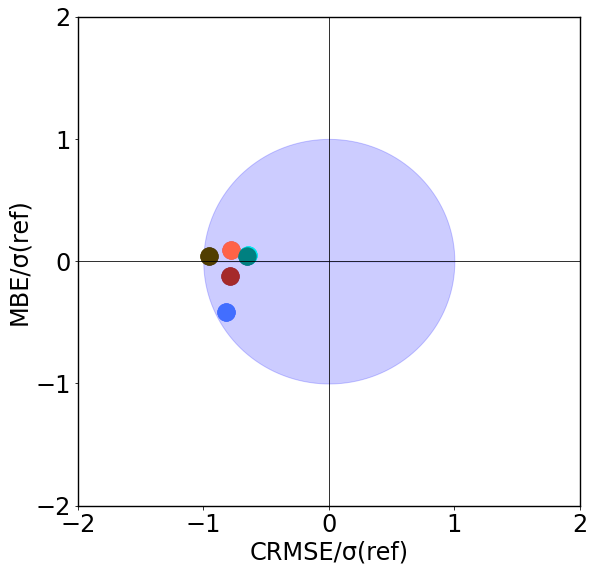

In [553]:
fig= plt.figure(figsize=(9,9))
ax = fig.add_subplot(111)
plt.scatter(CRMSE_LAB[2],MBE_LAB[2],color='#426eff',s=300)
plt.scatter(CRMSE_LR[2],MBE_LR[2],color='#513e00',s=300)
plt.scatter(CRMSE_SVR[2],MBE_SVR[2],color='brown',s=300)
plt.scatter(CRMSE_RF[2],MBE_RF[2] ,color='#00EEEE',s=300)
plt.scatter(CRMSE_ANN[2],MBE_ANN[2],color='tomato',s=300)
plt.scatter(CRMSE_XGB[2],MBE_XGB[2],color='teal',s=300)
#plt.legend(['LAB','LR','SVR','RF','ANN','XGBoost'],loc = 2, bbox_to_anchor = (0,1), fontsize=20)
plt.Circle((0, 0), 1, color='wheat')
plt.fill_between(a, b, color='blue', alpha=0.2)
plt.scatter(CRMSE_LAB[2],MBE_LAB[2],color='#426eff',s=300)
plt.scatter(CRMSE_LR[2],MBE_LR[2],color='#513e00',s=300)
plt.scatter(CRMSE_SVR[2],MBE_SVR[2],color='brown',s=300)
plt.scatter(CRMSE_RF[2],MBE_RF[2] ,color='#00EEEE',s=300)
plt.scatter(CRMSE_ANN[2],MBE_ANN[2],color='tomato',s=300)
plt.scatter(CRMSE_XGB[2],MBE_XGB[2],color='teal',s=300)
#plt.legend(['LAB','LR','SVR','RF','ANN','XGBoost'],loc = 2, bbox_to_anchor = (0,1), fontsize=20)

#plt.text(-1.8, -1.7, 'σ(cal)<σ(ref)', fontsize = 24, color='black')
#plt.text(0.2, -1.7, 'σ(cal)>σ(ref)', fontsize = 24, color='black')
#plt.text(-0.3, -0.25, 'MBE<0', rotation=90, va='center',fontsize = 16, color='black')
#plt.text(-0.3, 0.25, 'MBE>0', rotation=90, va='center',fontsize = 16, color='black')

plt.xlabel('CRMSE/σ(ref)',fontsize=24)
plt.ylabel('MBE/σ(ref)',fontsize=24)
plt.xticks(fontsize=24)
plt.yticks(fontsize=24)
#plt.xticks(color='w')
plt.vlines([0], -2, 2, linewidth=0.8,color='black')
plt.hlines([0], -2, 2, linewidth=0.8,color='black')
ax.set_ylim(bottom=-2)
ax.set_ylim(top=2)
ax.set_xlim(left=-2)
ax.set_xlim(right=2)
plt.xticks([-2,-1,0,1,2])
plt.yticks([-2,-1,0,1,2])
plt.setp(ax.spines.values(), linewidth=1.4)
#plt.yticks(color='w')
#plt.title('CO',fontsize=18)
#plt.grid(linestyle='-.',linewidth=0.3)
plt.savefig("Target_OPC3.pdf", format="pdf", bbox_inches="tight")
plt.show()



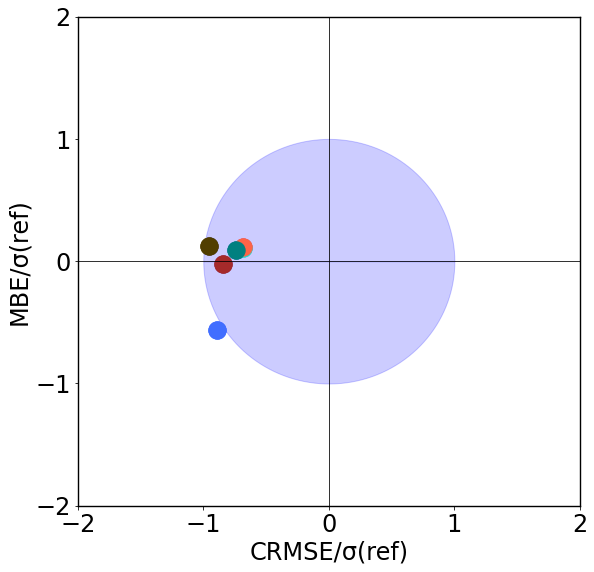

In [554]:
fig= plt.figure(figsize=(9,9))
ax = fig.add_subplot(111)
plt.scatter(CRMSE_LAB[3],MBE_LAB[3],color='#426eff',s=300)
plt.scatter(CRMSE_LR[3],MBE_LR[3],color='#513e00',s=300)
plt.scatter(CRMSE_SVR[3],MBE_SVR[3],color='brown',s=300)
plt.scatter(CRMSE_RF[3],MBE_RF[3] ,color='#E3CF57',s=300)
plt.scatter(CRMSE_ANN[3],MBE_ANN[3],color='tomato',s=300)
plt.scatter(CRMSE_XGB[3],MBE_XGB[3],color='teal',s=300)
#plt.legend(['LAB','LR','SVR','RF','ANN','XGBoost'],loc = 2, bbox_to_anchor = (0,1), fontsize=20)
plt.Circle((0, 0), 1, color='wheat')
plt.fill_between(a, b, color='blue', alpha=0.2)
plt.scatter(CRMSE_LAB[3],MBE_LAB[3],color='#426eff',s=300)
plt.scatter(CRMSE_LR[3],MBE_LR[3],color='#513e00',s=300)
plt.scatter(CRMSE_SVR[3],MBE_SVR[3],color='brown',s=300)
plt.scatter(CRMSE_RF[3],MBE_RF[3] ,color='#00EEEE',s=300)
plt.scatter(CRMSE_ANN[3],MBE_ANN[3],color='tomato',s=300)
plt.scatter(CRMSE_XGB[3],MBE_XGB[3],color='teal',s=300)
#plt.legend(['LAB','LR','SVR','RF','ANN','XGBoost'],loc = 2, bbox_to_anchor = (0,1), fontsize=20)

#plt.text(-1.8, -1.7, 'σ(cal)<σ(ref)', fontsize = 24, color='black')
#plt.text(0.2, -1.7, 'σ(cal)>σ(ref)', fontsize = 24, color='black')
#plt.text(-0.3, -0.25, 'MBE<0', rotation=90, va='center',fontsize = 16, color='black')
#plt.text(-0.3, 0.25, 'MBE>0', rotation=90, va='center',fontsize = 16, color='black')

plt.xlabel('CRMSE/σ(ref)',fontsize=24)
plt.ylabel('MBE/σ(ref)',fontsize=24)
plt.xticks(fontsize=24)
plt.yticks(fontsize=24)
#plt.xticks(color='w')
plt.vlines([0], -2, 2, linewidth=0.8,color='black')
plt.hlines([0], -2, 2, linewidth=0.8,color='black')
ax.set_ylim(bottom=-2)
ax.set_ylim(top=2)
ax.set_xlim(left=-2)
ax.set_xlim(right=2)
plt.xticks([-2,-1,0,1,2])
plt.yticks([-2,-1,0,1,2])
plt.setp(ax.spines.values(), linewidth=1.4)
#plt.yticks(color='w')
#plt.title('CO',fontsize=18)
#plt.grid(linestyle='-.',linewidth=0.3)
plt.savefig("Target_OPC4.pdf", format="pdf", bbox_inches="tight")
plt.show()


## Feature Importance

# libraries
import numpy as np
import matplotlib.pyplot as plt
fig= plt.figure(figsize=(10,5)) 
# set width of bars
ax = fig.add_subplot(111)
ax.patch.set_facecolor('lightblue')
ax.patch.set_alpha(0.3)
barWidth = 0.15
 
# set heights of bars
Signal1 = [features_CO[0],features_NO2[0],features_SO2[0],features_O3[0]]
Signal2 = [features_CO[1],features_NO2[1],features_SO2[1],features_O3[1]]
Signal3 = [features_CO[2],features_NO2[2],features_SO2[2],features_O3[2]]
Signal4 = [features_CO[3],features_NO2[3],features_SO2[3],features_O3[3]]
Temp = [features_CO[4],features_NO2[4],features_SO2[4],features_O3[4]]
RH = [features_CO[5],features_NO2[5],features_SO2[5],features_O3[5]]


 
# Set position of bar on X axis
r1 = np.arange(len(Signal1))
r2 = [x + barWidth for x in r1]
r3 = [x + barWidth for x in r2]
r4 = [x + barWidth for x in r3]
r5 = [x + barWidth for x in r4]
r6 = [x + barWidth for x in r5]
 
 
# Make the plot
plt.bar(r1, Signal1, color='magenta', width=barWidth, edgecolor='white', label='CO')
plt.bar(r2, Signal2, color='teal', width=barWidth, edgecolor='white', label='NO2')
plt.bar(r3, Signal3, color='salmon', width=barWidth, edgecolor='white', label='SO2')
plt.bar(r4, Signal4, color='rebeccapurple', width=barWidth, edgecolor='white', label='O3')
plt.bar(r5, Temp, color='olive', width=barWidth, edgecolor='white', label='Temperature')
plt.bar(r6, RH, color='darkgoldenrod', width=barWidth, edgecolor='white', label='RH')
 
# Add xticks on the middle of the group bars
plt.xlabel('Sensor', fontweight='bold')
plt.ylabel('Feature Importance', fontweight='bold')
plt.xticks([r + barWidth+0.25 for r in range(len(Signal1))], ['CO', 'NO2', 'SO2', 'O3'])
 
# Create legend & Show graphic
plt.legend()
plt.grid(linestyle='-.',linewidth=0.3)
plt.show()

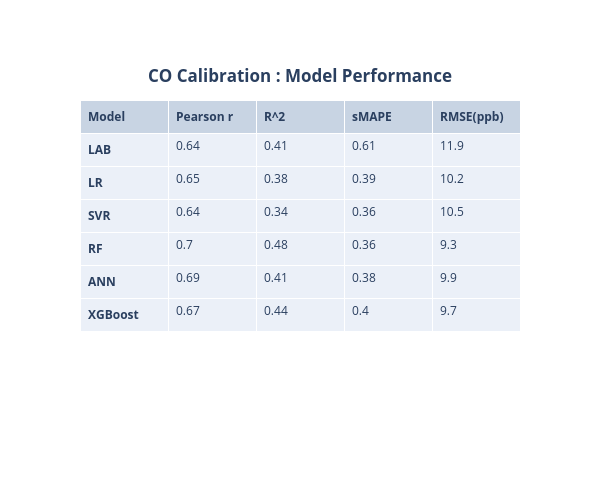

In [555]:
import plotly.graph_objects as go
import pandas as pd
model=['<b>LAB</b>','<b>LR</b>','<b>SVR</b>','<b>RF</b>','<b>ANN</b>','<b>XGBoost</b>']
Pearson=[Pearson_lab_CO,Pearson_lr_CO,Pearson_svr_CO,Pearson_rf_CO,Pearson_ann_CO,Pearson_xgb_CO]
         
R2=[R2_lab_CO,R2_lr_CO,R2_svr_CO,R2_rf_CO,R2_ann_CO,R2_xgb_CO]
RMSE=[RMSE_Lab_CO,RMSE_Lr_CO,RMSE_Svr_CO,RMSE_Rf_CO,RMSE_Ann_CO,RMSE_Xgb_CO]
sMAPE=[sMAPE_lab_CO,sMAPE_lr_CO,sMAPE_svr_CO,sMAPE_rf_CO,sMAPE_ann_CO,sMAPE_xgb_CO]

fig = go.Figure(data=[go.Table(
    header=dict(values=['<b>Model</b>','<b>Pearson r</b>','<b>R^2</b>','<b>sMAPE</b>','<b>RMSE(ppb)</b>'],
                #fill_color='white',
                align='left'),
    cells=dict(values=[model,Pearson,R2,sMAPE,RMSE ],
               #fill_color='white',
               align='left'))
   ])

fig.update_layout(
title={'text': "<b>CO Calibration : Model Performance</b>",
        'y':0.86,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'},
width=600,
height=500,
)
fig.show()
chart_studio.plotly.sign_in('vinylango', 'gybbJVWfRSUoTcRRSa6J')
chart_studio.plotly.image.save_as(fig, filename='models_performance_CO.png')
Image('models_performance_CO.png')


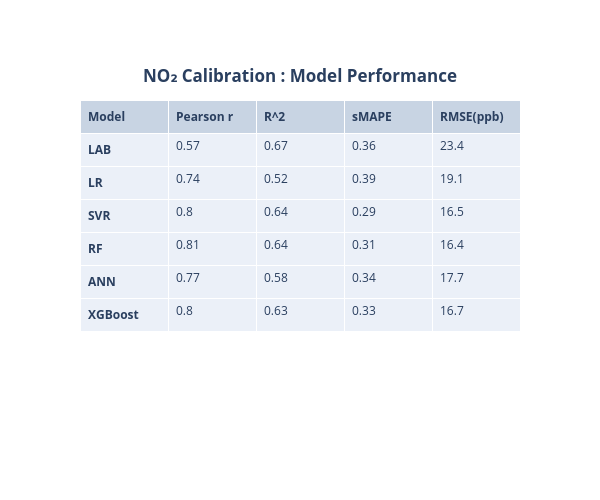

In [556]:
import plotly.graph_objects as go
import pandas as pd
model=['<b>LAB</b>','<b>LR</b>','<b>SVR</b>','<b>RF</b>','<b>ANN</b>','<b>XGBoost</b>']
Pearson=[Pearson_lab_NO2,Pearson_lr_NO2,Pearson_svr_NO2,Pearson_rf_NO2,Pearson_ann_NO2,Pearson_xgb_NO2]
R2=[R2_lab_NO2,R2_lr_NO2,R2_svr_NO2,R2_rf_NO2,R2_ann_NO2,R2_xgb_NO2]
RMSE=[RMSE_Lab_NO2,RMSE_Lr_NO2,RMSE_Svr_NO2,RMSE_Rf_NO2,RMSE_Ann_NO2,RMSE_Xgb_NO2]
sMAPE=[sMAPE_lab_NO2,sMAPE_lr_NO2,sMAPE_svr_NO2,sMAPE_rf_NO2,sMAPE_ann_NO2,sMAPE_xgb_NO2]

fig = go.Figure(data=[go.Table(
    header=dict(values=['<b>Model</b>','<b>Pearson r</b>','<b>R^2</b>','<b>sMAPE</b>','<b>RMSE(ppb)</b>'],
                #fill_color='paleturquoise',
                align='left'),
    cells=dict(values=[model,Pearson,R2,sMAPE,RMSE ],
               #fill_color='lavender',
               align='left'))
   ])
fig.update_layout(
title={'text': "<b>NO2 Calibration : Model Performance</b>".translate(subscript),
        'y':0.86,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'},
width=600,
height=500,

)
fig.show()
chart_studio.plotly.sign_in('vinylango', 'gybbJVWfRSUoTcRRSa6J')
chart_studio.plotly.image.save_as(fig, filename='models_performance_NO2.png')
Image('models_performance_NO2.png')

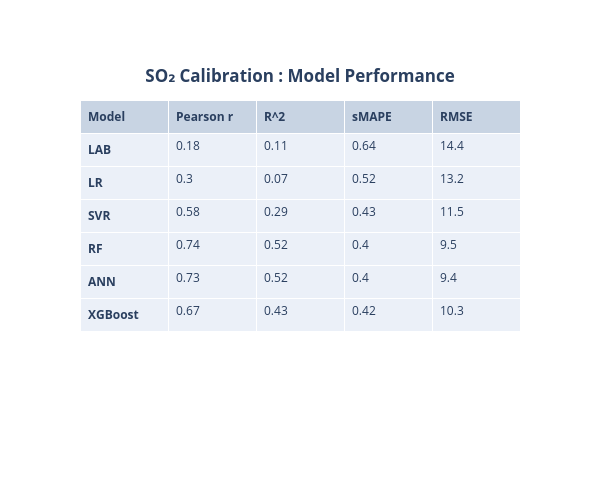

In [557]:
import plotly.graph_objects as go
import pandas as pd
model=['<b>LAB</b>','<b>LR</b>','<b>SVR</b>','<b>RF</b>','<b>ANN</b>','<b>XGBoost</b>']
Pearson=[Pearson_lab_SO2,Pearson_lr_SO2,Pearson_svr_SO2,Pearson_rf_SO2,Pearson_ann_SO2,Pearson_xgb_SO2]
R2=[R2_lab_SO2,R2_lr_SO2,R2_svr_SO2,R2_rf_SO2,R2_ann_SO2,R2_xgb_SO2,]
RMSE=[RMSE_Lab_SO2,RMSE_Lr_SO2,RMSE_Svr_SO2,RMSE_Rf_SO2,RMSE_Ann_SO2,RMSE_Xgb_SO2]
sMAPE=[sMAPE_lab_SO2,sMAPE_lr_SO2,sMAPE_svr_SO2,sMAPE_rf_SO2,sMAPE_ann_SO2,sMAPE_xgb_SO2]

fig = go.Figure(data=[go.Table(
    header=dict(values=['<b>Model</b>','<b>Pearson r</b>','<b>R^2</b>','<b>sMAPE</b>','<b>RMSE</b>'],
                #fill_color='paleturquoise',
                align='left'),
    cells=dict(values=[model,Pearson,R2,sMAPE,RMSE ],
               #fill_color='lavender',
               align='left'))
   ])
fig.update_layout(
title={'text': "<b>SO2 Calibration : Model Performance</b>".translate(subscript),
        'y':0.86,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'},
width=600,
height=500,

)
fig.show()
chart_studio.plotly.sign_in('vinylango', 'gybbJVWfRSUoTcRRSa6J')
chart_studio.plotly.image.save_as(fig, filename='models_performance_SO2.png')
Image('models_performance_SO2.png')

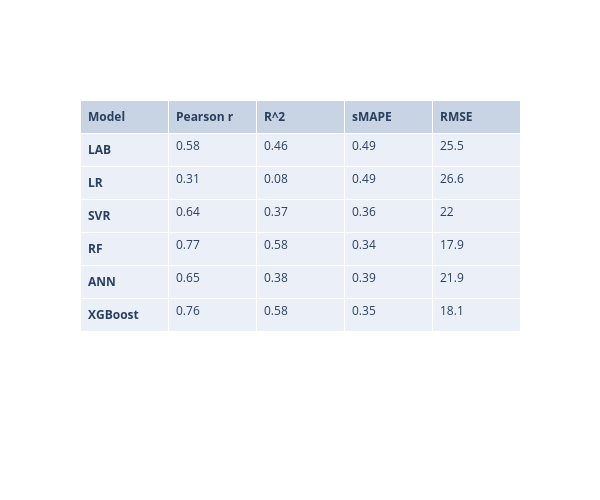

In [558]:
import plotly.graph_objects as go
import pandas as pd
model=['<b>LAB</b>','<b>LR</b>','<b>SVR</b>','<b>RF</b>','<b>ANN</b>','<b>XGBoost</b>']
Pearson=[str(Pearson_lab_O3),Pearson_lr_O3,Pearson_svr_O3,Pearson_rf_O3,Pearson_ann_O3,Pearson_xgb_O3]
R2=[R2_lab_O3,R2_lr_O3,R2_svr_O3,R2_rf_O3,R2_ann_O3,R2_xgb_O3]
RMSE=[RMSE_Lab_O3,RMSE_Lr_O3,RMSE_Svr_O3,RMSE_Rf_O3,RMSE_Ann_O3,RMSE_Xgb_O3]
sMAPE=[sMAPE_lab_O3,sMAPE_lr_O3,sMAPE_svr_O3,sMAPE_rf_O3,sMAPE_ann_O3,sMAPE_xgb_O3]

fig = go.Figure(data=[go.Table(
    header=dict(values=['<b>Model</b>','<b>Pearson r</b>','<b>R^2</b>','<b>sMAPE</b>','<b>RMSE</b>'],
                #fill_color='paleturquoise',
                align='left'),
    cells=dict(values=[model,Pearson,R2,sMAPE,RMSE ],
               #fill_color='lavender',
               align='left'))
   ])
fig.update_layout(
title={#'text': "<b>O3 Calibration : Model Performance</b>".translate(subscript),
        'y':0.86,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'},
width=600,
height=500,

)
fig.show()
chart_studio.plotly.sign_in('vinylango', 'gybbJVWfRSUoTcRRSa6J')
chart_studio.plotly.image.save_as(fig, filename='models_performance_O3.png')
Image('models_performance_O3.png')

In [559]:
Pearson_lab=np.array([Pearson_lab_CO,Pearson_lab_NO2,Pearson_lab_SO2,Pearson_lab_O3])
Pearson_lr=np.array([Pearson_lr_CO,Pearson_lr_NO2,Pearson_lr_SO2,Pearson_lr_O3])
Pearson_svr=np.array([Pearson_svr_CO,Pearson_svr_NO2,Pearson_svr_SO2,Pearson_svr_O3])
Pearson_rf=np.array([Pearson_rf_CO,Pearson_rf_NO2,Pearson_rf_SO2,Pearson_rf_O3])
Pearson_ann=np.array([Pearson_ann_CO,Pearson_ann_NO2,Pearson_ann_SO2,Pearson_ann_O3])
Pearson_xgb=np.array([Pearson_xgb_CO,Pearson_xgb_NO2,Pearson_xgb_SO2,Pearson_xgb_O3])
R2_lab=np.array([R2_lab_CO,R2_lab_NO2,R2_lab_SO2,R2_lab_O3])
R2_lr=np.array([R2_lr_CO,R2_lr_NO2,R2_lr_SO2,R2_lr_O3])
R2_svr=np.array([R2_svr_CO,R2_svr_NO2,R2_svr_SO2,R2_svr_O3])
R2_rf=np.array([R2_rf_CO,R2_rf_NO2,R2_rf_SO2,R2_rf_O3])
R2_ann=np.array([R2_ann_CO,R2_ann_NO2,R2_ann_SO2,R2_ann_O3])
R2_xgb=np.array([R2_xgb_CO,R2_xgb_NO2,R2_xgb_SO2,R2_xgb_O3])
RMSE_lab=np.array([RMSE_Lab_CO,RMSE_Lab_NO2,RMSE_Lab_SO2,RMSE_Lab_O3])
RMSE_lr=np.array([RMSE_Lr_CO,RMSE_Lr_NO2,RMSE_Lr_SO2,RMSE_Lr_O3])
RMSE_svr=np.array([RMSE_Svr_CO,RMSE_Svr_NO2,RMSE_Svr_SO2,RMSE_Svr_O3])
RMSE_rf=np.array([RMSE_Rf_CO,RMSE_Rf_NO2,RMSE_Rf_SO2,RMSE_Rf_O3])
RMSE_ann=np.array([RMSE_Ann_CO,RMSE_Ann_NO2,RMSE_Ann_SO2,RMSE_Ann_O3])
RMSE_xgb=np.array([RMSE_Xgb_CO,RMSE_Xgb_NO2,RMSE_Xgb_SO2,RMSE_Xgb_O3])
sMAPE_lab=np.array([sMAPE_lab_CO,sMAPE_lab_NO2,sMAPE_lab_SO2,sMAPE_lab_O3])
sMAPE_lr=np.array([sMAPE_lr_CO,sMAPE_lr_NO2,sMAPE_lr_SO2,sMAPE_lr_O3])
sMAPE_svr=np.array([sMAPE_svr_CO,sMAPE_svr_NO2,sMAPE_svr_SO2,sMAPE_svr_O3])
sMAPE_rf=np.array([sMAPE_rf_CO,sMAPE_rf_NO2,sMAPE_rf_SO2,sMAPE_rf_O3])
sMAPE_ann=np.array([sMAPE_ann_CO,sMAPE_ann_NO2,sMAPE_ann_SO2,sMAPE_ann_O3])
sMAPE_xgb=np.array([sMAPE_xgb_CO,sMAPE_xgb_NO2,sMAPE_xgb_SO2,sMAPE_xgb_O3])
Pearson_lab_mean=round(np.mean(Pearson_lab),2)
Pearson_lab_std=round(np.std(Pearson_lab),2)
Pearson_lr_mean=round(np.mean(Pearson_lr),2)
Pearson_lr_std=round(np.std(Pearson_lr),2)
Pearson_svr_mean=round(np.mean(Pearson_svr),2)
Pearson_svr_std=round(np.std(Pearson_svr),2)
Pearson_rf_mean=round(np.mean(Pearson_rf),2)
Pearson_rf_std=round(np.std(Pearson_rf),2)
Pearson_ann_mean=round(np.mean(Pearson_ann),2)
Pearson_ann_std=round(np.std(Pearson_ann),2)
Pearson_xgb_mean=round(np.mean(Pearson_xgb),2)
Pearson_xgb_std=round(np.std(Pearson_xgb),2)
R2_lab_mean=round(np.mean(R2_lab),2)
R2_lab_std=round(np.std(R2_lab),2)
R2_lr_mean=round(np.mean(R2_lr),2)
R2_lr_std=round(np.std(R2_lr),2)
R2_svr_mean=round(np.mean(R2_svr),2)
R2_svr_std=round(np.std(R2_svr),2)
R2_rf_mean=round(np.mean(R2_rf),2)
R2_rf_std=round(np.std(R2_rf),2)
R2_ann_mean=round(np.mean(R2_ann),2)
R2_ann_std=round(np.std(R2_ann),2)
R2_xgb_mean=round(np.mean(R2_xgb),2)
R2_xgb_std=round(np.std(R2_xgb),2)
RMSE_lab_mean=round(np.mean(RMSE_lab),2)
RMSE_lab_std=round(np.std(RMSE_lab),2)
RMSE_lr_mean=round(np.mean(RMSE_lr),2)
RMSE_lr_std=round(np.std(RMSE_lr),2)
RMSE_svr_mean=round(np.mean(RMSE_svr),2)
RMSE_svr_std=round(np.std(RMSE_svr),2)
RMSE_rf_mean=round(np.mean(RMSE_rf),2)
RMSE_rf_std=round(np.std(RMSE_rf),2)
RMSE_ann_mean=round(np.mean(RMSE_ann),2)
RMSE_ann_std=round(np.std(RMSE_ann),2)
RMSE_xgb_mean=round(np.mean(RMSE_xgb),2)
RMSE_xgb_std=round(np.std(RMSE_xgb),2)
sMAPE_lab_mean=round(np.mean(sMAPE_lab),2)
sMAPE_lab_std=round(np.std(sMAPE_lab),2)
sMAPE_lr_mean=round(np.mean(sMAPE_lr),2)
sMAPE_lr_std=round(np.std(sMAPE_lr),2)
sMAPE_svr_mean=round(np.mean(sMAPE_svr),2)
sMAPE_svr_std=round(np.std(sMAPE_svr),2)
sMAPE_rf_mean=round(np.mean(sMAPE_rf),2)
sMAPE_rf_std=round(np.std(sMAPE_rf),2)
sMAPE_ann_mean=round(np.mean(sMAPE_ann),2)
sMAPE_ann_std=round(np.std(sMAPE_ann),2)
sMAPE_xgb_mean=round(np.mean(sMAPE_xgb),2)
sMAPE_xgb_std=round(np.std(sMAPE_xgb),2)

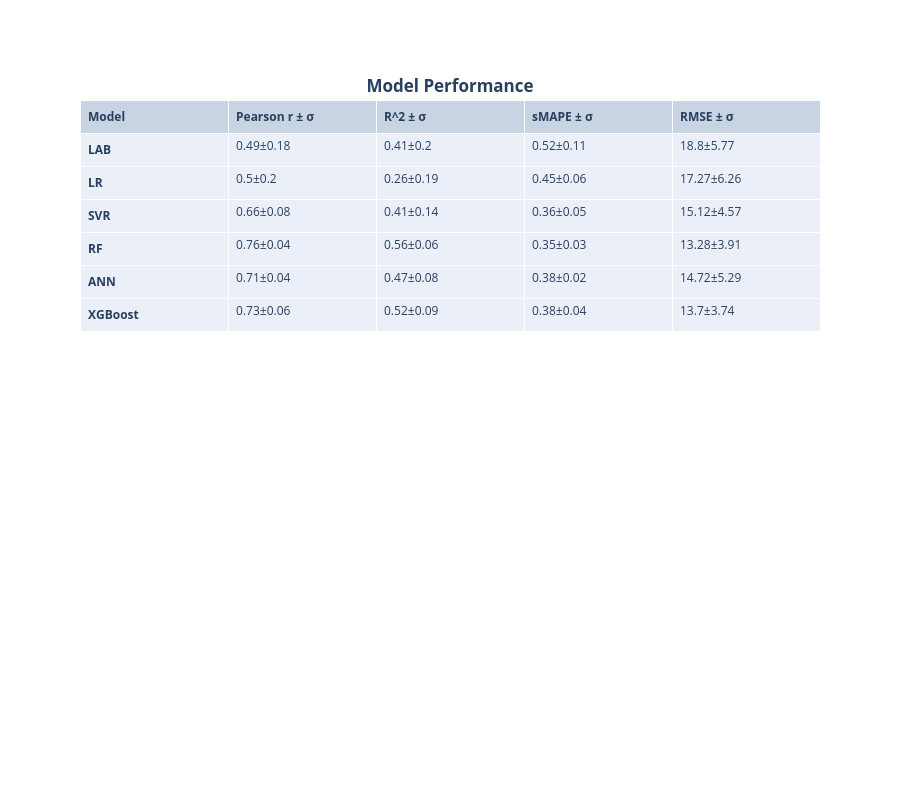

In [560]:
import plotly.graph_objects as go
import pandas as pd
model=['<b>LAB</b>','<b>LR</b>','<b>SVR</b>','<b>RF</b>','<b>ANN</b>','<b>XGBoost</b>']
Pearson=[str(Pearson_lab_mean)+ '±' +str(Pearson_lab_std),str(Pearson_lr_mean)+ '±' +str(Pearson_lr_std),
         str(Pearson_svr_mean)+ '±' +str(Pearson_svr_std),str(Pearson_rf_mean)+ '±' +str(Pearson_rf_std),
         str(Pearson_ann_mean)+ '±' +str(Pearson_ann_std),str(Pearson_xgb_mean)+ '±' +str(Pearson_xgb_std)]


R2=[str(R2_lab_mean)+ '±' +str(R2_lab_std),str(R2_lr_mean)+ '±' +str(R2_lr_std),
    str(R2_svr_mean)+ '±' +str(R2_svr_std),str(R2_rf_mean)+ '±' +str(R2_rf_std),
    str(R2_ann_mean)+ '±' +str(R2_ann_std),str(R2_xgb_mean)+ '±' +str(R2_xgb_std)]



RMSE=[str(RMSE_lab_mean)+ '±' +str(RMSE_lab_std),str(RMSE_lr_mean)+ '±' +str(RMSE_lr_std),
      str(RMSE_svr_mean)+ '±' +str(RMSE_svr_std),str(RMSE_rf_mean)+ '±' +str(RMSE_rf_std),
     str(RMSE_ann_mean)+ '±' +str(RMSE_ann_std),str(RMSE_xgb_mean)+ '±' +str(RMSE_xgb_std)]


sMAPE=[str(sMAPE_lab_mean)+ '±' +str(sMAPE_lab_std),str(sMAPE_lr_mean)+ '±' +str(sMAPE_lr_std),
       str(sMAPE_svr_mean)+ '±' +str(sMAPE_svr_std),str(sMAPE_rf_mean)+ '±' +str(sMAPE_rf_std),
       str(sMAPE_ann_mean)+ '±' +str(sMAPE_ann_std),str(sMAPE_xgb_mean)+ '±' +str(sMAPE_xgb_std)]

fig = go.Figure(data=[go.Table(
    header=dict(values=['<b>Model</b>','<b>Pearson r ± σ</b>','<b>R^2 ± σ</b> ','<b>sMAPE ± σ</b>','<b>RMSE ± σ</b>'],
                #fill_color='paleturquoise',
                align='left'),
    cells=dict(values=[model,Pearson,R2,sMAPE,RMSE ],
               #fill_color='lavender',
               align='left'))
   ])
fig.update_layout(
title={'text': "<b>Model Performance</b>",
        'y':0.9,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'},
width=900,
height=800,

)
fig.show()
chart_studio.plotly.sign_in('vinylango', 'gybbJVWfRSUoTcRRSa6J')
chart_studio.plotly.image.save_as(fig, filename='models_performance_O3.png')
Image('models_performance_O3.png')

In [561]:
!pip install -U kaleido
import plotly.graph_objects as go
from functools import reduce
from itertools import product

z=[[Pearson_lab_O3,Pearson_lr_O3 , Pearson_svr_O3, Pearson_rf_O3, Pearson_ann_O3,Pearson_xgb_O3],
 [Pearson_lab_SO2,Pearson_lr_SO2 , Pearson_svr_SO2, Pearson_rf_SO2, Pearson_ann_SO2,Pearson_xgb_SO2],
  [Pearson_lab_NO2,Pearson_lr_NO2 , Pearson_svr_NO2, Pearson_rf_NO2, Pearson_ann_NO2,Pearson_xgb_NO2],
  [Pearson_lab_CO,Pearson_lr_CO , Pearson_svr_CO, Pearson_rf_CO, Pearson_ann_CO,Pearson_xgb_CO]]
x=['<b>LAB</b>', '<b>LR</b>', '<b>SVR</b>', '<b>RF</b>', '<b>ANN</b>','<b>XGBoost</b>']
y=['<b>N3 PM10</b>', '<b>N3 PM2.5</b>', 
   '<b>R1 PM10</b>','<b>R1 PM2.5</b>']

def get_anno_text(z_value):
    annotations=[]
    a, b = len(z_value), len(z_value[0])
    flat_z = reduce(lambda x,y: x+y, z_value) # z_value.flat if you deal with numpy
    coords = product(range(a), range(b))
    for pos, elem in zip(coords, flat_z):
        annotations.append({'font': {'color': 'black'},
                    'showarrow': False,
                    'text': str(elem),
                    'x': pos[1],
                    'y': pos[0],
                        'font.size':22   })
    return annotations

fig = go.Figure(data=go.Heatmap(
                   z=z,
                   x=x,
                   y=y,
                   hoverongaps = True, colorscale ='blues',opacity=0.8))#matter#

fig.update_layout(title={'text': "",
        'y':0.8,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'},
           plot_bgcolor='rgba(0,0,0,0)',       
    annotations = get_anno_text(z),
                 width=1000,
height=400,xaxis={'side': 'top'})

fig.update_xaxes(tickfont = dict(size=16),linewidth=0.1, linecolor='black',
    
                 mirror=True)
fig.update_yaxes(tickfont = dict(size=16),linewidth=0.1, linecolor='black',
        
                 mirror=True)
fig.write_image("Opc_r_summary.pdf",engine="kaleido")
#plt.savefig("table2a.pdf", format="pdf", bbox_inches="tight")
fig.show()



[notice] A new release of pip available: 22.3.1 -> 23.0.1
[notice] To update, run: pip install --upgrade pip


In [562]:
import plotly.graph_objects as go
from functools import reduce
from itertools import product

z=[ [R2_lab_O3,R2_lr_O3 , R2_svr_O3, R2_rf_O3, R2_ann_O3,R2_xgb_O3],
   [R2_lab_SO2,R2_lr_SO2 , R2_svr_SO2, R2_rf_SO2, R2_ann_SO2,R2_xgb_SO2],
   [R2_lab_NO2,R2_lr_NO2 , R2_svr_NO2, R2_rf_NO2, R2_ann_NO2,R2_xgb_NO2],
   [R2_lab_CO,R2_lr_CO , R2_svr_CO, R2_rf_CO, R2_ann_CO,R2_xgb_CO]]
x=['<b>LAB</b>', '<b>LR</b>', '<b>SVR</b>', '<b>RF</b>', '<b>ANN</b>','<b>XGBoost</b>']
y=['<b>N3 PM10</b>', '<b>N3 PM2.5</b>', 
   '<b>R1 PM10</b>','<b>R1 PM2.5</b>']

def get_anno_text(z_value):
    annotations=[]
    a, b = len(z_value), len(z_value[0])
    flat_z = reduce(lambda x,y: x+y, z_value) # z_value.flat if you deal with numpy
    coords = product(range(a), range(b))
    for pos, elem in zip(coords, flat_z):
        annotations.append({'font': {'color': 'black'},
                    'showarrow': False,
                    'text': str(elem),
                    'x': pos[1],
                    'y': pos[0],
                         'font.size':22  } )
    return annotations

fig = go.Figure(data=go.Heatmap(
                   z=z,
                   x=x,
                   y=y,
    name='k kkkkkkkk',
    #showlegend=True,
    #colorbar=dict(title='Pearson r levels'),
  
                   hoverongaps = True, colorscale ='blues' ,opacity=0.6))#matter#

fig.update_layout(title={'text': "",
        'y':0.8,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'},
                  plot_bgcolor='rgba(0,0,0,0)', 
    annotations = get_anno_text(z),
                 width=1000,
height=400,xaxis={'side': 'top'})           
fig.update_xaxes(tickfont = dict(size=16),linewidth=0.1, linecolor='black',
                 mirror=True, showticklabels=False)
fig.update_yaxes(tickfont = dict(size=16),linewidth=0.1, linecolor='black',
        
                 mirror=True)
fig.write_image("Opc_R2_summary.pdf")
fig.show()

In [563]:
import plotly.graph_objects as go
from functools import reduce
from itertools import product

z=[ [round(RMSE_lab_O3,2),round(RMSE_lr_O3,2) , round(RMSE_svr_O3,2), round(RMSE_rf_O3,2), 
   round(RMSE_ann_O3,2),round(RMSE_xgb_O3,2)],
   [round(RMSE_lab_SO2,2),round(RMSE_lr_SO2,2) , round(RMSE_svr_SO2,2),round(RMSE_rf_SO2,2), 
    round(RMSE_ann_SO2,2),round(RMSE_xgb_SO2,2)],
    [round(RMSE_lab_NO2,2),round(RMSE_lr_NO2,2) , round(RMSE_svr_NO2,2), round(RMSE_rf_NO2,2), 
   round( RMSE_ann_NO2,2),round(RMSE_xgb_NO2,2)], 
   [round(RMSE_lab_CO,2),round(RMSE_lr_CO,2) , round(RMSE_svr_CO,2), round(RMSE_rf_CO,2), 
    round(RMSE_ann_CO,2),round(RMSE_xgb_CO,2)]]
x=['<b>LAB</b>', '<b>LR</b>', '<b>SVR</b>', '<b>RF</b>', '<b>ANN</b>','<b>XGBoost</b>']
y=['<b>N3 PM10</b>', '<b>N3 PM2.5</b>', '<b>R1 PM10</b>','<b>R1 PM2.5</b>']

def get_anno_text(z_value):
    annotations=[]
    a, b = len(z_value), len(z_value[0])
    flat_z = reduce(lambda x,y: x+y, z_value) # z_value.flat if you deal with numpy
    coords = product(range(a), range(b))
    for pos, elem in zip(coords, flat_z):
        annotations.append({'font': {'color': 'black'},
                    'showarrow': False,
                    'text': str(elem),
                    'x': pos[1],
                    'y': pos[0],
                          'font.size':22 })
    return annotations

fig = go.Figure(data=go.Heatmap(
                   z=z,
                   x=x,
                   y=y,
                   hoverongaps = True, colorscale = 'blues',reversescale=True,opacity=0.6))#matter#

fig.update_layout(title={'text': "",
        'y':0.8,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'},
                plot_bgcolor='rgba(0,0,0,0)',   
    annotations = get_anno_text(z),
                 width=1000,
height=400)
fig.update_xaxes(tickfont = dict(size=16),linewidth=0.1, linecolor='black',
    
                 mirror=True,showticklabels=False)
fig.update_yaxes(tickfont = dict(size=16),linewidth=0.1, linecolor='black',
        
                 mirror=True)
fig.write_image("Opc_RMSE_summary.pdf.pdf")
fig.show()

import seaborn as sns
#+list(features_NO2)+list(features_SO2)+list(features_O3)
fi=list(features_CO)
fi=list(100*np.array(fi))
#+['NO2'.translate(subscript) for i in range(7)]+
#['SO2'.translate(subscript) for i in range(7)]+['O3'.translate(subscript) for i in range(7)]
pollutants=(['CO' for i in range(7)])
feature=['Net signal', 'Temperature', 'RH','Month','Day','Day of week','Hour' ]
#+feature+feature+feature
features=feature

data=[[fi[i],pollutants[i],features[i]] for i in range(len(fi))]

df=pd.DataFrame(data=data, columns=['fi','pollutant','features'])
fig= plt.figure(figsize=(8,5))
ax = fig.add_subplot(111)
ax.patch.set_facecolor('lightblue')
ax.patch.set_alpha(0)
percentage=fi
ax=sns.barplot(x="pollutant", y="fi", hue="features", data=df,
            palette=['gold','rebeccapurple','salmon','palevioletred','steelblue','darkkhaki','plum'])
patches = ax.patches
for i in range(len(patches)):
   x = patches[i].get_x() + patches[i].get_width()/2
   y = patches[i].get_height()+.05
   ax.annotate('{:.1f}%'.format(percentage[i]), (x, y), ha='center')
plt.ylabel( 'Feature importance (%)')
plt.xlabel('')
plt.legend(loc = 2, bbox_to_anchor = (1,1))
#plt.grid(True)
plt.show()

fi=list(features_NO2)
fi=list(100*np.array(fi))
#+['NO2'.translate(subscript) for i in range(7)]+
#['SO2'.translate(subscript) for i in range(7)]+['O3'.translate(subscript) for i in range(7)]
pollutants=(['NO2'.translate(subscript) for i in range(7)])
feature=['Net signal', 'Temperature', 'RH','Month','Day','Day of week','Hour' ]
#+feature+feature+feature
features=feature

data=[[fi[i],pollutants[i],features[i]] for i in range(len(fi))]

df=pd.DataFrame(data=data, columns=['fi','pollutant','features'])
fig= plt.figure(figsize=(8,5))
ax = fig.add_subplot(111)
ax.patch.set_facecolor('lightblue')
ax.patch.set_alpha(0)
percentage=fi
ax=sns.barplot(x="pollutant", y="fi", hue="features", data=df,
            palette=['gold','rebeccapurple','salmon','palevioletred','steelblue','darkkhaki','plum'])
ax.legend_.remove()
patches = ax.patches
for i in range(len(patches)):
   x = patches[i].get_x() + patches[i].get_width()/2
   y = patches[i].get_height()+.05
   ax.annotate('{:.1f}%'.format(percentage[i]), (x, y), ha='center')
plt.ylabel( 'Feature importance (%)')
plt.xlabel('')
plt.legend(loc = 2, bbox_to_anchor = (1,1))
#plt.grid(True)
plt.show()

fi=list(features_SO2)
fi=list(100*np.array(fi))
#+['NO2'.translate(subscript) for i in range(7)]+
#['SO2'.translate(subscript) for i in range(7)]+['O3'.translate(subscript) for i in range(7)]
pollutants=(['SO2'.translate(subscript) for i in range(7)])
feature=['Net signal', 'Temperature', 'RH','Month','Day','Day of week','Hour' ]
#+feature+feature+feature
features=feature

data=[[fi[i],pollutants[i],features[i]] for i in range(len(fi))]

df=pd.DataFrame(data=data, columns=['fi','pollutant','features'])
fig= plt.figure(figsize=(8,5))
ax = fig.add_subplot(111)
ax.patch.set_facecolor('lightblue')
ax.patch.set_alpha(0)
percentage=fi
ax=sns.barplot(x="pollutant", y="fi", hue="features", data=df,
            palette=['gold','rebeccapurple','salmon','palevioletred','steelblue','darkkhaki','plum'])
ax.legend_.remove()
patches = ax.patches
for i in range(len(patches)):
   x= patches[i].get_x() + patches[i].get_width()/2
   y = patches[i].get_height()+.05
   ax.annotate('{:.1f}%'.format(percentage[i]), (x, y), ha='center')
plt.ylabel( 'Feature importance (%)')
plt.xlabel('')
plt.legend(loc = 2, bbox_to_anchor = (1,1))
#plt.grid(True)
plt.show()

column=['features','CO','NO2'.translate(subscript),'SO2'.translate(subscript),'O3'.translate(subscript)]
data=[[features[i],100*features_CO[i],100*features_NO2[i],100*features_SO2[i],100*features_O3[i]] for i in range(7)]
df=pd.DataFrame(data=data, columns=['features','CO','NO2','SO2','O3'])
import seaborn as sns
fig= plt.figure(figsize=(15,5))
sns.set()
df.set_index('features').T.plot(kind='bar', stacked=True)
plt.legend(loc = 2, bbox_to_anchor = (1,1))

import numpy as np
import matplotlib
import matplotlib.pyplot as plt

vegetables = ["cucumber", "tomato", "lettuce", "asparagus",
              "potato", "wheat", "barley"]
farmers = ["Farmer Joe", "Upland Bros.", "Smith Gardening",
           "Agrifun", "Organiculture", "BioGoods Ltd.", "Cornylee Corp."]
harvest = np.array([[0.8, 2.4, 2.5, 3.9, 0.0, 4.0, 0.0],
                    [2.4, 0.0, 4.0, 1.0, 2.7, 0.0, 0.0],
                    [1.1, 2.4, 0.8, 4.3, 1.9, 4.4, 0.0],
                    [0.6, 0.0, 0.3, 0.0, 3.1, 0.0, 0.0],
                    [0.7, 1.7, 0.6, 2.6, 2.2, 6.2, 0.0],
                    [1.3, 1.2, 0.0, 0.0, 0.0, 3.2, 5.1],
                    [0.1, 2.0, 0.0, 1.4, 0.0, 1.9, 6.3]])

fig= plt.figure(figsize=(15,5))
fig, ax = plt.subplots()
im = ax.imshow(harvest)

# We want to show all ticks...
ax.set_xticks(np.arange(len(farmers)))
ax.set_yticks(np.arange(len(vegetables)))
# ... and label them with the respective list entries
ax.set_xticklabels(farmers)
ax.set_yticklabels(vegetables)

# Rotate the tick labels and set their alignment.
plt.setp(ax.get_xticklabels(), rotation=45, ha="right",
         rotation_mode="anchor")

# Loop over data dimensions and create text annotations.
for i in range(len(vegetables)):
    for j in range(len(farmers)):
        text = ax.text(j, i, harvest[i, j],
                       ha="center", va="center", color="green")

ax.set_title("Harvest of local farmers (in tons/year)")
fig.tight_layout()
plt.show()

# Feature Importance

In [564]:
features_SO2

array([16., 20., 22.,  8., 23., 11.])

In [565]:
features_CO=features_CO/sum(features_CO)
features_NO2=features_NO2/sum(features_NO2)
features_SO2=features_SO2/sum(features_SO2)
features_O3=features_O3/sum(features_O3)

A=[0,0]
B=[0]
C=[0,features_O3[6]]
features_co=np.array(list(features_CO)+A)
features_no2=np.array(list(features_NO2)+B)
features_so2=np.array(list(features_SO2)+A)
features_o3=np.array(list(features_O3[:6])+C)
data=[100*features_co,100*features_no2,100*features_o3]
df=pd.DataFrame(data=data, columns=['Net sensor signal', 'Temperature', 'RH','Month','Day of week','Hour',
                                    'O3 Concentraion'.translate(subscript),
                                    'NO2 Concentration'.translate(subscript) ] )
pollutants=['CO','NO2'.translate(subscript),'O3'.translate(subscript)]
df.insert(0, 'pollutants', pollutants)
#df['pollutants']=pollutants
new_cols = ['pollutants','Net sensor signal','O3 Concentraion'.translate(subscript),
            'NO2 Concentration'.translate(subscript) 
            , 'Temperature', 'RH','Month','Day of week','Hour']
df=df[new_cols]
df

color=['palevioletred','darkkhaki','gold','cadetblue','plum','olive','skyblue','cyan']
ax= plt.figure(figsize=(10,5))
df.plot(
  x = 'pollutants', 
  kind = 'barh', 
  stacked = True,
  color=color,
    #Feature importance (%)  
  title = '',#(mean±0.7*std) 
  mark_right = True,
figsize=(30,6.6))
  
df_total = (df["Net sensor signal"] + df["Temperature"] + df["RH"]+df["Month"]+df["Day of week"]+df["Hour"]
            +df['O3 Concentraion'.translate(subscript)]+df['NO2 Concentration'.translate(subscript)])
df_rel = df[df.columns[1:]].div(df_total,0)*100
  
for n in df_rel:
    for i, (cs, ab, pc) in enumerate(zip(df.iloc[:, 1:].cumsum(1)[n], 
                                         df[n], df_rel[n])):
        pc=np.round(pc)
        if pc>0:
            plt.text(cs - ab / 2, i, str(int(np.round(pc))) , 
                 va = 'center', ha = 'center', fontsize=28)
plt.legend( ncol=8, bbox_to_anchor = (0.95,1.12),fontsize=18)
plt.xlabel('Feature Importance(%)',fontsize=30)
plt.ylabel('Pollutants',fontsize=30)
plt.xticks(fontsize=22)
plt.yticks(fontsize=22)
plt.xlim(xmax=100)
plt.gca().invert_yaxis()
plt.show()

In [566]:
FI_CO=[]
for i in range(6):
    p=int(features_CO[i]*100)
    FI_CO.append(p)
    

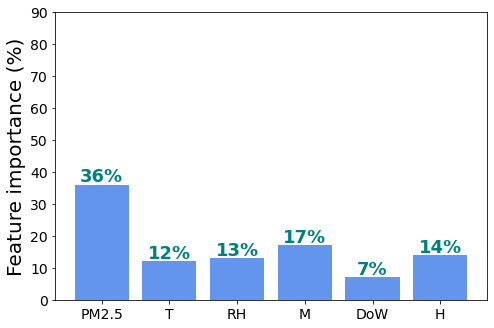

In [567]:
import matplotlib.pyplot as plt
fig = plt.figure()
ax = fig.add_axes([0,0,1,1])
langs = ['PM2.5', 'T', 'RH', 'M', 'DoW','H']
students = FI_CO
graph=ax.bar(langs,students, color='#6495ED')
i = 0
for p in graph:
    width = p.get_width()
    height = p.get_height()
    x, y = p.get_xy()
    plt.text(x+width/2,
             y+height+1.01,
             str(students[i])+'%',
             ha='center',
             weight='bold',fontsize=18, color='teal')
    i+=1
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.yticks(np.arange(0,100, step=10))
plt.ylabel('Feature importance (%)', fontsize=20)
#plt.title(r"$O_3$",fontsize=18)
plt.savefig("FI_R125.pdf", format="pdf", bbox_inches="tight")
plt.show()

In [568]:
FI_NO2=[]
for i in range(6):
    p=int(features_NO2[i]*100)
    FI_NO2.append(p)

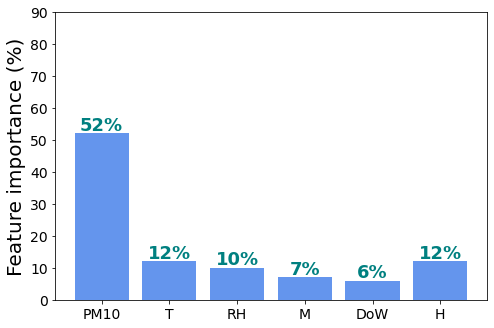

In [569]:
import matplotlib.pyplot as plt
fig = plt.figure()
ax = fig.add_axes([0,0,1,1])
langs = ['PM10', 'T', 'RH', 'M', 'DoW','H']
students =FI_NO2 
graph=ax.bar(langs,students, color='#6495ED')
i = 0
for p in graph:
    width = p.get_width()
    height = p.get_height()
    x, y = p.get_xy()
    plt.text(x+width/2,
             y+height+1.01,
             str(students[i])+'%',
             ha='center',
             weight='bold',fontsize=18, color='teal')
    i+=1
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.yticks(np.arange(0,100, step=10))
plt.ylabel('Feature importance (%)', fontsize=20)
#plt.title(r"$O_3$",fontsize=18)
plt.savefig("FI_R110.pdf", format="pdf", bbox_inches="tight")
plt.show()

In [570]:
FI_SO2=[]
for i in range(6):
    p=int(features_SO2[i]*100)
    FI_SO2.append(p)

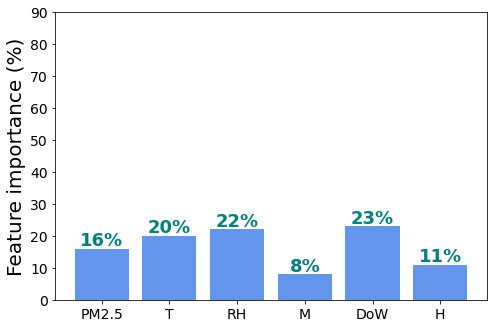

In [571]:
import matplotlib.pyplot as plt
fig = plt.figure()
ax = fig.add_axes([0,0,1,1])
langs = ['PM2.5', 'T', 'RH', 'M', 'DoW','H']
students =FI_SO2 
graph=ax.bar(langs,students, color='#6495ED')
i = 0
for p in graph:
    width = p.get_width()
    height = p.get_height()
    x, y = p.get_xy()
    plt.text(x+width/2,
             y+height+1.01,
             str(students[i])+'%',
             ha='center',
             weight='bold',fontsize=18, color='teal')
    i+=1
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.yticks(np.arange(0,100, step=10))
plt.ylabel('Feature importance (%)', fontsize=20)
#plt.title(r"$O_3$",fontsize=18)
plt.savefig("FI_N32.5.pdf", format="pdf", bbox_inches="tight")
plt.show()

In [572]:
FI_O3=[]
for i in range(6):
    p=int(features_O3[i]*100)
    FI_O3.append(p)

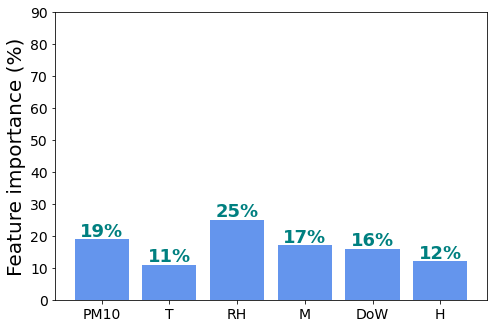

In [573]:
import matplotlib.pyplot as plt
fig = plt.figure()
ax = fig.add_axes([0,0,1,1])
langs = ['PM10', 'T', 'RH', 'M', 'DoW','H']
students =FI_O3 
graph=ax.bar(langs,students, color='#6495ED')
i = 0
for p in graph:
    width = p.get_width()
    height = p.get_height()
    x, y = p.get_xy()
    plt.text(x+width/2,
             y+height+1.01,
             str(students[i])+'%',
             ha='center',
             weight='bold',fontsize=18, color='teal')
    i+=1
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.yticks(np.arange(0,100, step=10))
plt.ylabel('Feature importance (%)', fontsize=20)
#plt.title(r"$O_3$",fontsize=18)
plt.savefig("FI_N310.pdf", format="pdf", bbox_inches="tight")
plt.show()

Text(0.5, 1.0, 'R1')

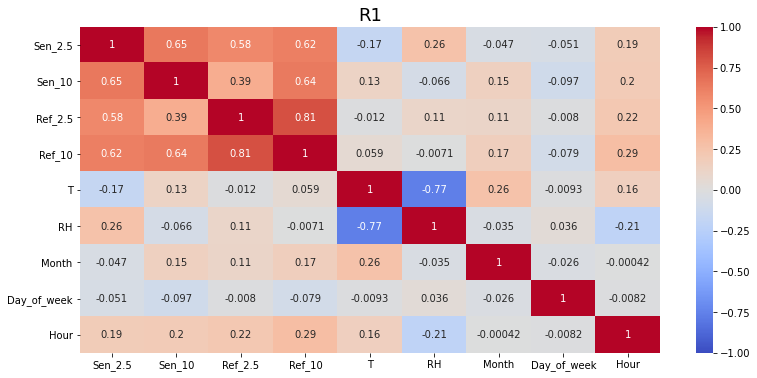

In [574]:
import matplotlib.pyplot as plt
import seaborn as sns
fig= plt.figure(figsize=(13,6))
sns.heatmap(R1_data.corr(), annot = True, vmin=-1, vmax=1, 
            center= 0, cmap= 'coolwarm')
plt.title('R1',fontsize=18)

Text(0.5, 1.0, 'CO')

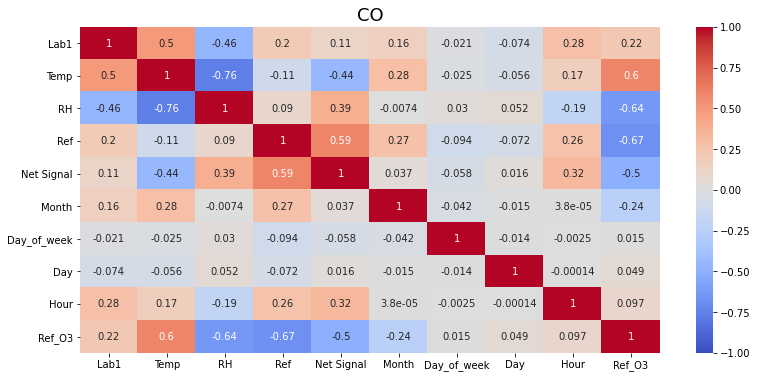

In [575]:
import matplotlib.pyplot as plt
import seaborn as sns
fig= plt.figure(figsize=(13,6))
sns.heatmap(NO2_Data.corr(), annot = True, vmin=-1, vmax=1, 
            center= 0, cmap= 'coolwarm')
plt.title('CO',fontsize=18)

Text(0.5, 1.0, 'CO')

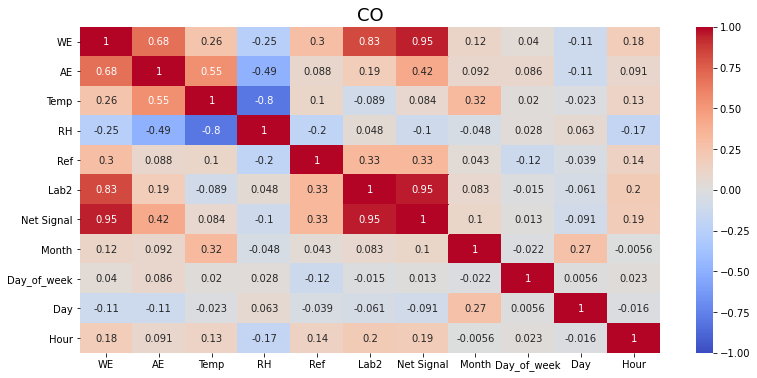

In [576]:
import matplotlib.pyplot as plt
import seaborn as sns
fig= plt.figure(figsize=(13,6))
sns.heatmap(SO2_Data.corr(), annot = True, vmin=-1, vmax=1, 
            center= 0, cmap= 'coolwarm')
plt.title('CO',fontsize=18)

Text(0.5, 1.0, 'CO')

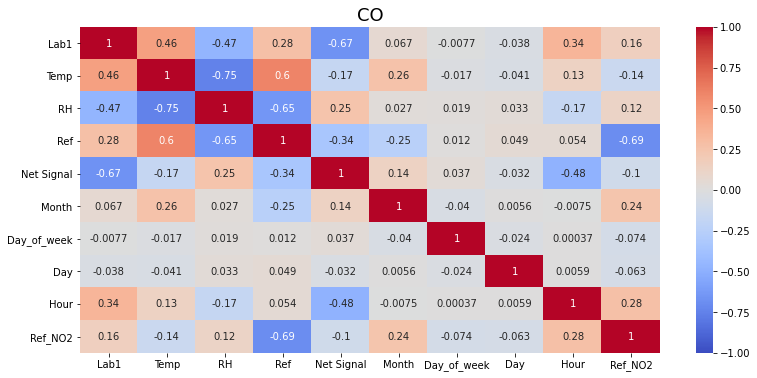

In [577]:
import matplotlib.pyplot as plt
import seaborn as sns
fig= plt.figure(figsize=(13,6))
sns.heatmap(O3_Data.corr(), annot = True, vmin=-1, vmax=1, 
            center= 0, cmap= 'coolwarm')
plt.title('CO',fontsize=18)

# Cross Sensitivities

# NO2

In [578]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
Pearson_NO2_inc=[0.89,0.92,0.97,0.96,0.96]
R2_NO2_inc=[0.79,0.84,0.94,0.92,0.92]
RMSE_NO2_inc=[5.7,5,3,3.5,3.6]

Pearson_NO2_Ninc=[0.67,0.79,0.95,0.93,0.91]
R2_NO2_Ninc=[0.45,0.62,0.9,0.86,0.83]
RMSE_NO2_Ninc=[9.4,7.8,4.1,4.7,5.3]


<function matplotlib.pyplot.legend(*args, **kwargs)>

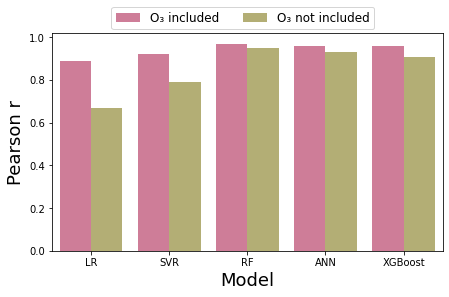

In [579]:
Pearson=Pearson_NO2_inc+Pearson_NO2_Ninc
Model=['LR','SVR','RF','ANN','XGBoost']
Models=Model+Model
Class1=['NO2 included' for i in range(5)]
Class2=['NO2 not included' for i in range(5)]
Classification=Class1+Class2
data=[[Models[i],Pearson[i],Classification[i] ] for i in range(len(Models))]
df=pd.DataFrame(data=data, columns=['Model', 'Pearson r','Classification'])
#df=df.sample(frac=1)
#df.head()

fig= plt.figure(figsize=(7,4))
sns.barplot(x="Model", y="Pearson r", hue="Classification",data=df,palette=['palevioletred','darkkhaki'],
ci=None)
plt.legend(['O3 included'.translate(subscript), 'O3 not included'.translate(subscript)],ncol = 4  , 
           bbox_to_anchor = (0.84,1.15),fontsize=12)
#plt.ylabel( 'Average ' + r'$O_{3}$' + ' Concentration (μg/m³)')
#plt.title('NO2 Calibration'.translate(subscript), fontsize=18)
plt.ylabel('Pearson r',fontsize=18)
plt.xlabel('Model',fontsize=18)
plt.legend

<function matplotlib.pyplot.legend(*args, **kwargs)>

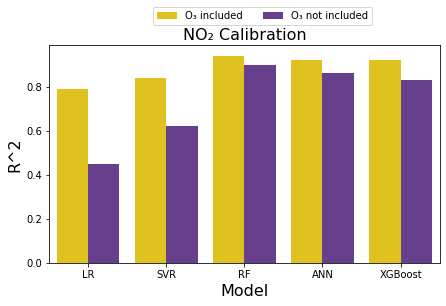

In [580]:
R2=R2_NO2_inc+R2_NO2_Ninc
Model=['LR','SVR','RF','ANN','XGBoost']
Models=Model+Model
Class1=['NO2 included' for i in range(5)]
Class2=['NO2 not included' for i in range(5)]
Classification=Class1+Class2
data=[[Models[i],R2[i],Classification[i] ] for i in range(len(Models))]
df=pd.DataFrame(data=data, columns=['Model', 'R2','Classification'])
#df=df.sample(frac=1)
#df.head()

fig= plt.figure(figsize=(7,4))
sns.barplot(x="Model", y="R2", hue="Classification",data=df,palette=['gold','rebeccapurple'],
ci=None)
plt.legend(['O3 included'.translate(subscript), 'O3 not included'.translate(subscript)],ncol = 4  , 
           bbox_to_anchor = (0.84,1.2),fontsize=10)
#plt.ylabel( 'Average ' + r'$O_{3}$' + ' Concentration (μg/m³)')
#plt.title('NO2 Calibration'.translate(subscript), fontsize=18)
plt.ylabel('R^2',fontsize=16)
plt.xlabel('Model',fontsize=16)
plt.title('NO2 Calibration'.translate(subscript),fontsize=16)
plt.legend

RS1=np.array(R2_NO2_inc)-np.array(R2_NO2_Ninc)
import plotly.graph_objs as go
model= ['<b>LR</b>', '<b>SVR</b>', '<b>RF</b>', '<b>ANN</b>', '<b>XGBoost</b>']
perc=RS
data = [go.Bar(
   x = model,
   y =perc,
marker_color='#BDB76B')]

data2 = [go.Bar(
   x = model,
   y =perc,
marker_color='teal')]


fig = go.Figure(data=data)
fig = go.Figure(data=data2)

fig.update_layout(autosize=False,
    width=600,
    height=450)
fig.update_yaxes(title_text="<b>∆R^2</b>")
fig.show()

In [581]:
import plotly.graph_objects as px
import numpy
  
  
# creating random data through randomint 
# function of numpy.random 
np.random.seed(42)
  
random_x= np.random.randint(1,101,100) 
random_y= np.random.randint(1,101,100)
  
x =model
  
fig= px.Figure(data=[go.Bar(
    name = 'R^2',
    x = x,
    y =perc,
    marker_color='#BDB76B'
   ),
                       go.Bar(
    name = 'NRMSE',
    x = x,
    y = [0.21,0.17,0.09, 0.09,0.1],
    marker_color='teal'
   )
])

fig.update_layout(autosize=False,
    width=600,
    height=500,
    legend=dict( yanchor="bottom",
    y=0.8,
    x=0.7,
    
    orientation="v"
)              
                 )
fig.update_yaxes(title_text="<b>Improvement</b>")
                   
fig.show()


In [582]:
x = ['LR', 'SVR', 'RF', 'ANN', 'XGBoost']
y1=perc
y2=[0.21,0.17,0.09, 0.09,0.1]


In [583]:
y1

array([51.39969812,  9.89574699,  9.57022892,  7.09767699,  4.72721445,
       17.30943453])

[51.39969812  9.89574699  9.57022892  7.09767699  4.72721445 17.30943453]


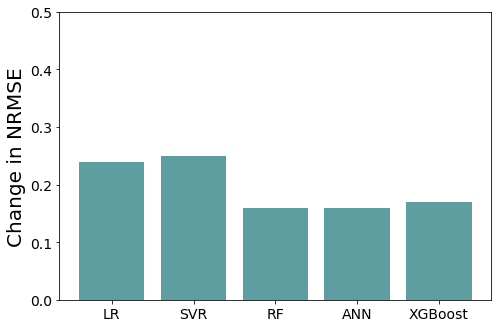

In [584]:
x = ['LR', 'SVR', 'RF', 'ANN', 'XGBoost']
y1=perc
print(y1)
y2=[0.24,0.25,0.16, 0.16,0.17]
import matplotlib.pyplot as plt
fig = plt.figure()
ax = fig.add_axes([0,0,1,1])
langs = x
students = y2
graph=ax.bar(langs,students, color='#5F9EA0')

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.yticks(np.arange(0,0.6, step=0.1))
plt.ylabel('Change in NRMSE', fontsize=20)
#plt.title(r"$O_3$",fontsize=18)
plt.show()

In [585]:
A=np.mean(O3_Data['Ref'].to_list())
A

19.0628042369029

# importing package
import matplotlib.pyplot as plt
import numpy as np
fig= plt.figure(figsize=(9,5))  
# create data
x =np.arange(5)
width = 0.40
#y1=[0.21,0.17,0.09, 0.09,0.1]
#y2=[0.24,0.25,0.16, 0.16,0.17]
#y1=np.array(RMSE_O3_Ninc)/A
y2=Per
# plot data in grouped manner of bar type
plt.bar(x, y2, width, color='#E9967A')
#plt.bar(x+0.2, y2, width, color='#53868B')
plt.xticks(x, ['LR', 'SVR', 'RF', 'ANN', 'XGBoost'])
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.yticks(np.arange(0,0.41, step=0.1))
plt.ylabel('Improvement in R^2', fontsize=20)
#plt.legend([r"$NO_2$"  +' not included',r"$NO_2$" +' included'], fontsize=16)
#plt.title(r"$O_3$",fontsize=18)
plt.show()

RMSE=RMSE_NO2_inc+RMSE_NO2_Ninc
Model=['LR','SVR','RF','ANN','XGBoost']
Models=Model+Model
Class1=['NO2 included' for i in range(5)]
Class2=['NO2 not included' for i in range(5)]
Classification=Class1+Class2
data=[[Models[i],RMSE[i],Classification[i] ] for i in range(len(Models))]
df=pd.DataFrame(data=data, columns=['Model', 'RMSE','Classification'])
#df=df.sample(frac=1)
#df.head()

fig= plt.figure(figsize=(7,4))
sns.barplot(x="Model", y="RMSE", hue="Classification",data=df,palette=['plum','olive'],
ci=None)
plt.legend(['O3 included'.translate(subscript), 'O3 not included'.translate(subscript)],ncol = 4  , 
           bbox_to_anchor = (0.84,1.15),fontsize=12)
#plt.ylabel( 'Average ' + r'$O_{3}$' + ' Concentration (μg/m³)')
#plt.title('NO2 Calibration'.translate(subscript), fontsize=18)
plt.ylabel('RMSE(ppb)',fontsize=18)
plt.xlabel('Model',fontsize=18)
plt.legend

# O3

In [586]:
Pearson_O3_inc=[0.94,0.94,0.99,0.99,0.98]
R2_O3_inc=[0.89,0.89,0.98,0.97,0.97]
RMSE_O3_inc=[5,5,2.2,2.6,2.8]

Pearson_O3_Ninc=[0.77,0.77,0.98,0.97,0.92]
R2_O3_Ninc=[0.59,0.59,0.95,0.93,0.85]
RMSE_O3_Ninc=[9.6,9.7,3.3,3.9,5.7]

<BarContainer object of 5 artists>

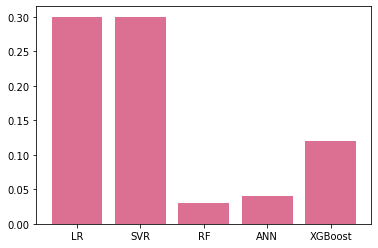

In [587]:
Per=(np.array(R2_O3_inc)-np.array(R2_O3_Ninc))
Model=['LR','SVR','RF','ANN','XGBoost']
plt.bar(Model,Per, color='palevioletred')


<function matplotlib.pyplot.legend(*args, **kwargs)>

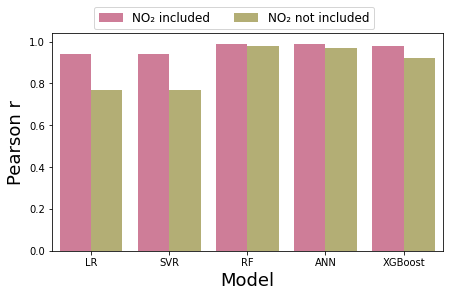

In [588]:
Pearson=Pearson_O3_inc+Pearson_O3_Ninc
Model=['LR','SVR','RF','ANN','XGBoost']
Models=Model+Model
Class1=['NO2 included' for i in range(5)]
Class2=['NO2 not included' for i in range(5)]
Classification=Class1+Class2
data=[[Models[i],Pearson[i],Classification[i] ] for i in range(len(Models))]
df=pd.DataFrame(data=data, columns=['Model', 'Pearson r','Classification'])
#df=df.sample(frac=1)
#df.head()

fig= plt.figure(figsize=(7,4))
sns.barplot(x="Model", y="Pearson r", hue="Classification",data=df,palette=['palevioletred','darkkhaki'],
ci=None)
plt.legend(['NO2 included'.translate(subscript), 'NO2 not included'.translate(subscript)],ncol = 4  , 
           bbox_to_anchor = (0.84,1.15),fontsize=12)
#plt.ylabel( 'Average ' + r'$O_{3}$' + ' Concentration (μg/m³)')
#plt.title('NO2 Calibration'.translate(subscript), fontsize=18)
plt.ylabel('Pearson r',fontsize=18)
plt.xlabel('Model',fontsize=18)
plt.legend

<function matplotlib.pyplot.legend(*args, **kwargs)>

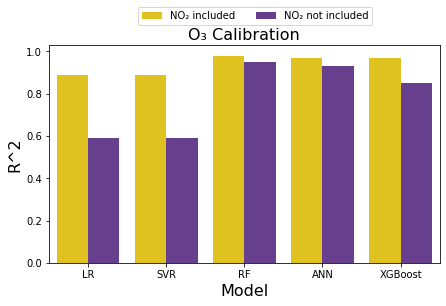

In [589]:
R2=R2_O3_inc+R2_O3_Ninc
Model=['LR','SVR','RF','ANN','XGBoost']
Models=Model+Model
Class1=['NO2 included' for i in range(5)]
Class2=['NO2 not included' for i in range(5)]
Classification=Class1+Class2
data=[[Models[i],R2[i],Classification[i] ] for i in range(len(Models))]
df=pd.DataFrame(data=data, columns=['Model', 'R2','Classification'])
#df=df.sample(frac=1)
#df.head()

fig= plt.figure(figsize=(7,4))
sns.barplot(x="Model", y="R2", hue="Classification",data=df,palette=['gold','rebeccapurple'],
ci=None)
plt.legend(['NO2 included'.translate(subscript), 'NO2 not included'.translate(subscript)],ncol = 4  , 
           bbox_to_anchor = (0.84,1.2),fontsize=10)
#plt.ylabel( 'Average ' + r'$O_{3}$' + ' Concentration (μg/m³)')
#plt.title('NO2 Calibration'.translate(subscript), fontsize=18)
plt.ylabel('R^2',fontsize=16)
plt.xlabel('Model',fontsize=16)
plt.title('O3 Calibration'.translate(subscript),fontsize=16)
plt.legend

In [590]:
RS2=np.array(R2_O3_inc)-np.array(R2_O3_Ninc)
import plotly.graph_objs as go
model= ['<b>LR</b>', '<b>SVR</b>', '<b>RF</b>', '<b>ANN</b>', '<b>XGBoost</b>']
perc=RS2
data = [go.Bar(
   x = model,
   y =perc,
marker_color='#BDB76B')]
fig = go.Figure(data=data)
fig.update_layout(autosize=False,
    width=600,
    height=450)
fig.update_yaxes(title_text="<b>ΔR^2</b>")
fig.show()

In [591]:
import plotly.graph_objects as px
import numpy
  
  
# creating random data through randomint 
# function of numpy.random 
np.random.seed(42)
  
random_x= np.random.randint(1,101,100) 
random_y= np.random.randint(1,101,100)
  
x =model
  
fig= px.Figure(data=[go.Bar(
    name = 'R^2',
    x = x,
    y =perc,
    marker_color='#BDB76B',
    showlegend=False
   ),
                       go.Bar(
    name = 'NRMSE',
    x = x,
    y = [0.24,0.25,0.16, 0.16,0.17],
    marker_color='teal',
    showlegend=False
   )
])

fig.update_layout(autosize=False,
    width=600,
    height=500,
    legend=dict( yanchor="bottom",
    y=0.8,
    x=0.7,
    
    orientation="v"
)              
                 )
fig.update_yaxes(title_text="<b>Improvement</b>")
                   
fig.show()

<function matplotlib.pyplot.legend(*args, **kwargs)>

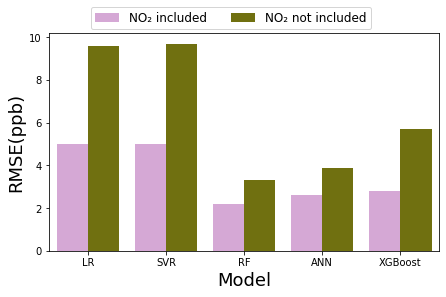

In [592]:
RMSE=RMSE_O3_inc+RMSE_O3_Ninc
Model=['LR','SVR','RF','ANN','XGBoost']
Models=Model+Model
Class1=['NO2 included' for i in range(5)]
Class2=['NO2 not included' for i in range(5)]
Classification=Class1+Class2
data=[[Models[i],RMSE[i],Classification[i] ] for i in range(len(Models))]
df=pd.DataFrame(data=data, columns=['Model', 'RMSE','Classification'])
#df=df.sample(frac=1)
#df.head()

fig= plt.figure(figsize=(7,4))
sns.barplot(x="Model", y="RMSE", hue="Classification",data=df,palette=['plum','olive'],
ci=None)
plt.legend(['NO2 included'.translate(subscript), 'NO2 not included'.translate(subscript)],ncol = 4  , 
           bbox_to_anchor = (0.84,1.15),fontsize=12)
#plt.ylabel( 'Average ' + r'$O_{3}$' + ' Concentration (μg/m³)')
#plt.title('NO2 Calibration'.translate(subscript), fontsize=18)
plt.ylabel('RMSE(ppb)',fontsize=18)
plt.xlabel('Model',fontsize=18)
plt.legend

In [593]:
CO_Data.describe()

,Lab1,Temp,RH,Ref,Net Signal,Month,Day_of_week,Day,Hour
count,3914.000000,3914.000000,3914.000000,3914.000000,3914.000000,3914.000000,3914.000000,3914.000000,3914.000000
mean,438.253480,16.939025,67.917823,479.184231,157.738771,6.768012,3.007409,16.408278,11.531170
std,265.421317,6.858820,17.464774,382.289697,122.214703,4.454195,2.016846,8.165825,6.931498
min,26.840876,1.090134,17.453750,1.605492,6.667626,1.000000,0.000000,1.000000,0.000000
25%,251.979861,11.631767,55.475471,233.795120,77.023157,3.000000,1.000000,10.000000,6.000000
50%,366.663297,15.657697,72.722111,347.023028,115.175523,10.000000,3.000000,17.000000,12.000000
75%,560.534139,21.205739,82.356117,575.489032,187.577517,11.000000,5.000000,23.000000,18.000000
max,2911.798418,40.535256,92.697801,2816.953417,845.380238,12.000000,6.000000,31.000000,23.000000


In [594]:
from scipy.stats import fligner
from scipy import stats
from scipy.stats import ttest_rel
Sen=CO_Data['Lab1'].to_list()
Ref=CO_Data['Ref'].to_list()

In [595]:
ttest_rel(Ref,Sen)

Ttest_relResult(statistic=10.511508626123423, pvalue=1.66709208981031e-25)

In [596]:
stat, p = fligner(Sen,Ref)
p

3.0122309408494395e-07

In [597]:
stats.ttest_ind(pred, y_test)

Ttest_indResult(statistic=1.6549065779184293, pvalue=0.09801496463632567)

In [598]:
stats.shapiro(Sen)
# Output: (0.9550848603248596, 0.7756242156028748)

stats.shapiro(Sen)

ShapiroResult(statistic=0.8762669563293457, pvalue=0.0)

In [599]:
stats.levene(Sen, Ref)

LeveneResult(statistic=87.94224805308411, pvalue=8.660265135282665e-21)

In [600]:
d=np.array(Sen)-np.array(Ref)

from scipy.stats import wilcoxon
w, p = wilcoxon(d)
w,p

(3052697.0, 3.5761655909620547e-28)

In [601]:
from scipy.stats import ttest_rel

# Python paired sample t-test


In [602]:
stats.shapiro(Sen)

ShapiroResult(statistic=0.8762669563293457, pvalue=0.0)

In [603]:
stats.shapiro(Ref)

ShapiroResult(statistic=0.7898504137992859, pvalue=0.0)

In [604]:
stats.ttest_rel(Sen,Ref)

Ttest_relResult(statistic=-10.511508626123423, pvalue=1.66709208981031e-25)

In [605]:
d=np.array(Sen)-np.array(Ref)
w, p = wilcoxon(d)
w,p

(3052697.0, 3.5761655909620547e-28)

import folium
# define the world map

mexico_latitude = 35.152
mexico_longitude =33.347786
# define the world map centered around Canada with a higher zoom level
mexico_map = folium.Map(location=[mexico_latitude, mexico_longitude],attr=False, tiles='mapquestopen',zoom_start=16, alpha=0)
# display world map
folium.Marker([35.153,33.347801],
   ).add_to(mexico_map)
mexico_map

# MDQ and  MPC

# R1 PM2.5

# RMSE_MPC

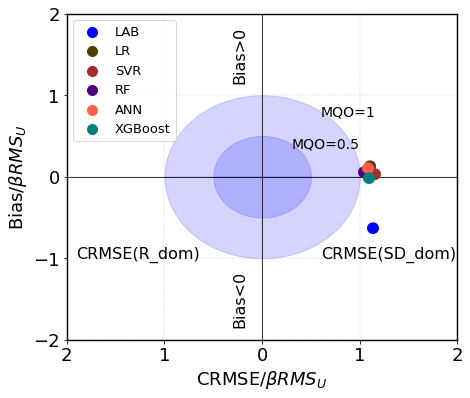

In [606]:
theta = np.linspace( 0 , 2 * np.pi , 150 )
 
radius = 1
 
a = radius * np.cos( theta )
b = radius * np.sin( theta )

radius1=0.5

c = radius1 * np.cos( theta )
d = radius1 * np.sin( theta )

fig= plt.figure(figsize=(7,6))
ax = fig.add_subplot(111)
#ax.patch.set_facecolor('lightblue')
#ax.patch.set_alpha(0.3)
point1 = [0.2, 2]
point2 = [0.2, 2]
x_values = [point1[0], point2[0]]
y_values = [point1[1], point2[1]]
#plt.text(CRMSE_LAB[0],MBE_LAB[0] , '•', rotation=90, va='center',fontsize = 40, color='#426eff')
plt.text(CRMSE_U_LAB_CO,Bias_U_LAB_CO , '•', rotation=90, va='center',fontsize = 40, color='blue')
plt.text(CRMSE_U_LR_CO,Bias_U_LR_CO , '•', rotation=90, va='center',fontsize = 40, color='#513e00')
plt.text(CRMSE_U_SVR_CO,Bias_U_SVR_CO , '•', rotation=90, va='center',fontsize = 40, color='brown')
plt.text(CRMSE_U_RF_CO,Bias_U_RF_CO , '•', rotation=90, va='center',fontsize = 40, color='indigo')
plt.text(CRMSE_U_ANN_CO,Bias_U_ANN_CO , '•', rotation=90, va='center',fontsize = 40, color='tomato')
plt.text(CRMSE_U_XGB_CO,Bias_U_XGB_CO , '•', rotation=90, va='center',fontsize = 40, color='teal')
#plt.scatter(10,10,color='#426eff',s=100,alpha=1)
plt.scatter(10,10,color='blue',s=100)
plt.scatter(10,10,color='#513e00',s=100)
plt.scatter(10,10,color='brown',s=100)
plt.scatter(10,10,color='indigo',s=100)
plt.scatter(10,10,color='tomato',s=100)
plt.scatter(10,10,color='teal',s=100)
plt.legend(['LAB','LR','SVR','RF','ANN','XGBoost'],loc = 2, bbox_to_anchor = (0,1), fontsize=13)
plt.plot(x_values, y_values, color='black')
plt.Circle((0, 0), 1, color='black', linewidth=10)
plt.Circle((0, 0), 1.1, fill=False, linewidth=2)
plt.vlines([0], -2, 2, color='black', linewidth=0.8)
plt.hlines([0], -2, 2, color='black', linewidth=0.8)
plt.plot(x_values, y_values, color='black')
plt.text(-1.9, -1, 'CRMSE(R_dom)', fontsize = 16, color='black')
plt.text(0.6, -1, 'CRMSE(SD_dom)', fontsize = 16, color='black')
plt.text(-0.3, -1.5, 'Bias<0', rotation=90, va='center',fontsize = 16, color='black')
plt.text(-0.3, 1.5, 'Bias>0', rotation=90, va='center',fontsize = 16, color='black')
plt.text(0.3, 0.4, 'MQO=0.5', rotation=0, va='center',fontsize = 14, color='black')
plt.text(0.6, 0.8, 'MQO=1', rotation=0, va='center',fontsize = 14, color='black')
plt.fill_between(c, d, color='blue', alpha=0.17)
plt.fill_between(a, b, color='blue', alpha=0.17)
plt.xlabel('CRMSE/'+r'$βRMS_{U}$',fontsize=18)
plt.ylabel('Bias/'+r'$βRMS_{U}$',fontsize=18)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
#plt.xticks(color='w')
plt.ylim([-2, 2])
plt.xlim([-2, 2])
ax.set_xticks([-2,-1,0,1,2])
ax.set_yticks([-2,-1,0,1,2])
ax.set_xticklabels(['2','1','0','1','2'])
#ax.plot([0, 1], [0, 1], transform=ax.transAxes)
#ax.plot([0, -1], [0, 1], transform=ax.transAxes)
#ax.plot(x_values, y_values, color='black')
#plt.yticks(color='w')
#plt.title('CO',fontsize=18)
plt.grid(linestyle='-.',linewidth=0.3)
plt.setp(ax.spines.values(), linewidth=1.4)
plt.savefig("MPC_R1_2.5_C.pdf", format="pdf", bbox_inches="tight")
plt.show()

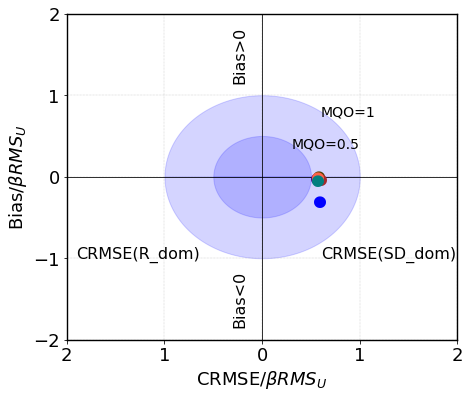

In [607]:
theta = np.linspace( 0 , 2 * np.pi , 150 )
 
radius = 1
 
a = radius * np.cos( theta )
b = radius * np.sin( theta )

radius1=0.5

c = radius1 * np.cos( theta )
d = radius1 * np.sin( theta )

fig= plt.figure(figsize=(7,6))
ax = fig.add_subplot(111)
#ax.patch.set_facecolor('lightblue')
#ax.patch.set_alpha(0.3)
point1 = [0.2, 2]
point2 = [0.2, 2]
x_values = [point1[0], point2[0]]
y_values = [point1[1], point2[1]]
#plt.text(CRMSE_LAB[0],MBE_LAB[0] , '•', rotation=90, va='center',fontsize = 40, color='#426eff')
plt.text(CRMSE1_U_LAB_CO,Bias1_U_LAB_CO , '•', rotation=90, va='center',fontsize = 40, color='blue')
plt.text(CRMSE1_U_LR_CO,Bias1_U_LR_CO, '•', rotation=90, va='center',fontsize = 40, color='#513e00')
plt.text(CRMSE1_U_SVR_CO,Bias1_U_SVR_CO, '•', rotation=90, va='center',fontsize = 40, color='brown')
plt.text(CRMSE1_U_RF_CO,Bias1_U_RF_CO, '•', rotation=90, va='center',fontsize = 40, color='indigo')
plt.text(CRMSE1_U_ANN_CO,Bias1_U_ANN_CO, '•', rotation=90, va='center',fontsize = 40, color='tomato')
plt.text(CRMSE1_U_XGB_CO,Bias1_U_XGB_CO, '•', rotation=90, va='center',fontsize = 40, color='teal')
#plt.scatter(10,10,color='#426eff',s=100,alpha=1)
plt.scatter(10,10,color='blue',s=100)
plt.scatter(10,10,color='#513e00',s=100)
plt.scatter(10,10,color='brown',s=100)
plt.scatter(10,10,color='indigo',s=100)
plt.scatter(10,10,color='tomato',s=100)
plt.scatter(10,10,color='teal',s=100)
#plt.legend(['LAB','LR','SVR','RF','ANN','XGBoost'],loc = 2, bbox_to_anchor = (0,1), fontsize=13)
plt.plot(x_values, y_values, color='black')
plt.Circle((0, 0), 1, color='black', linewidth=10)
plt.Circle((0, 0), 1.1, fill=False, linewidth=2)
plt.vlines([0], -2, 2, color='black', linewidth=0.8)
plt.hlines([0], -2, 2, color='black', linewidth=0.8)
plt.plot(x_values, y_values, color='black')
plt.text(-1.9, -1, 'CRMSE(R_dom)', fontsize = 16, color='black')
plt.text(0.6, -1, 'CRMSE(SD_dom)', fontsize = 16, color='black')
plt.text(-0.3, -1.5, 'Bias<0', rotation=90, va='center',fontsize = 16, color='black')
plt.text(-0.3, 1.5, 'Bias>0', rotation=90, va='center',fontsize = 16, color='black')
plt.text(0.3, 0.4, 'MQO=0.5', rotation=0, va='center',fontsize = 14, color='black')
plt.text(0.6, 0.8, 'MQO=1', rotation=0, va='center',fontsize = 14, color='black')
plt.fill_between(c, d, color='blue', alpha=0.17)
plt.fill_between(a, b, color='blue', alpha=0.17)
plt.xlabel('CRMSE/'+r'$βRMS_{U}$',fontsize=18)
plt.ylabel('Bias/'+r'$βRMS_{U}$',fontsize=18)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
#plt.xticks(color='w')
plt.ylim([-2, 2])
plt.xlim([-2, 2])
ax.set_xticks([-2,-1,0,1,2])
ax.set_yticks([-2,-1,0,1,2])
ax.set_xticklabels(['2','1','0','1','2'])
#ax.plot([0, 1], [0, 1], transform=ax.transAxes)
#ax.plot([0, -1], [0, 1], transform=ax.transAxes)
#ax.plot(x_values, y_values, color='black')
#plt.yticks(color='w')
#plt.title('CO',fontsize=18)
plt.grid(linestyle='-.',linewidth=0.3)
plt.setp(ax.spines.values(), linewidth=1.4)
plt.savefig("MPC_R1_2.5_V.pdf", format="pdf", bbox_inches="tight")
plt.show()

# NMB_MPC

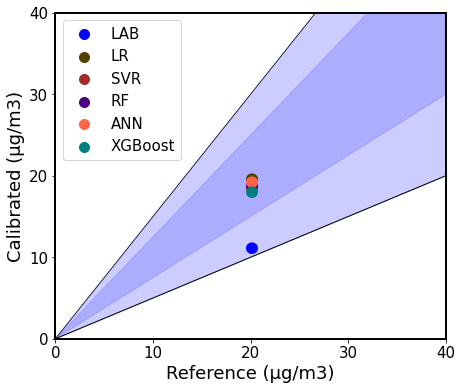

In [608]:
Y_Test=[i for i in np.arange(0,120,0.1)]
fig= plt.figure(figsize=(7,6))
ax = fig.add_subplot(111)
y1=0.5*np.array(Y_Test)
y2=1.5*np.array(Y_Test)
y3=0.75*np.array(Y_Test)
y4=1.25*np.array(Y_Test)
plt.text(Mean_CO,Mean_LAB_CO, '•', rotation=90, va='center',fontsize = 40, color='blue')
plt.text(Mean_CO,Mean_LR_CO, '•', rotation=90, va='center',fontsize = 40, color='#513e00')
plt.text(Mean_CO,Mean_SVR_CO, '•', rotation=90, va='center',fontsize = 40, color='brown')
plt.text(Mean_CO,Mean_RF_CO, '•', rotation=90, va='center',fontsize = 40, color='indigo')
plt.text(Mean_CO,Mean_ANN_CO, '•', rotation=90, va='center',fontsize = 40, color='tomato')
plt.text(Mean_CO,Mean_XGB_CO, '•', rotation=90, va='center',fontsize = 40, color='teal')
plt.scatter(10,200,color='blue',s=100)
plt.scatter(10,200,color='#513e00',s=100)
plt.scatter(10,200,color='brown',s=100)
plt.scatter(10,200,color='indigo',s=100)
plt.scatter(10,200,color='tomato',s=100)
plt.scatter(10,200,color='teal',s=100)
plt.legend(['LAB','LR','SVR','RF','ANN','XGBoost'],loc = 2, bbox_to_anchor = (0,1), fontsize=15)
plt.plot(np.array(Y_Test),1.5*np.array(Y_Test),c ="black",linewidth=0.7)
plt.plot(np.array(Y_Test),0.5*np.array(Y_Test),c ="black",linewidth=1)
plt.fill_between(np.array(Y_Test), y1, y2, color='blue', alpha=0.2)
plt.fill_between(np.array(Y_Test), y3, y4, color='blue', alpha=0.15)
ax.set_ylim(bottom=0)
ax.set_xlim(left=0)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.show
plt.xlim(0, 40)
plt.ylim(0, 40)
plt.xticks(np.arange(0,41, step=10))
plt.yticks(np.arange(0,41, step=10))
plt.setp(ax.spines.values(), linewidth=2)
plt.xlabel('Reference (µg/m3)',fontsize=18)
plt.ylabel('Calibrated (µg/m3)',fontsize=18)
plt.savefig("MPC2_R1_2.5.pdf",format="pdf", bbox_inches="tight", dpi=1000)
plt.show()

# NMSD_MPC

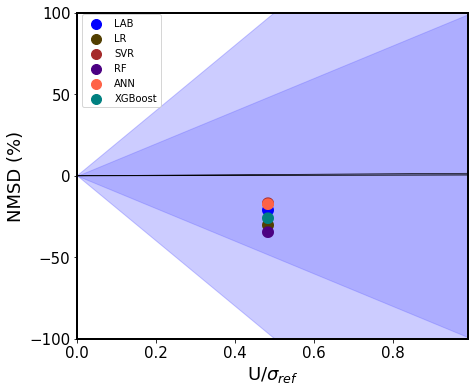

In [609]:
Y_Test=[i for i in np.arange(0,1,0.01)]
fig= plt.figure(figsize=(7,6))
ax = fig.add_subplot(111)
y1=-200*np.array(Y_Test)
y2=200*np.array(Y_Test)
y3=-100*np.array(Y_Test)
y4=100*np.array(Y_Test)
plt.text(U_d_LAB_CO,NMSD_LAB_CO , '•', rotation=90, va='center',fontsize = 40, color='blue')
plt.text(U_d_LR_CO,NMSD_LR_CO , '•', rotation=90, va='center',fontsize = 40, color='#513e00')
plt.text(U_d_SVR_CO,NMSD_SVR_CO, '•', rotation=90, va='center',fontsize = 40, color='brown')
plt.text(U_d_RF_CO,NMSD_RF_CO, '•', rotation=90, va='center',fontsize = 40, color='indigo')
plt.text(U_d_ANN_CO,NMSD_ANN_CO, '•', rotation=90, va='center',fontsize = 40, color='tomato')
plt.text(U_d_XGB_CO,NMSD_XGB_CO, '•', rotation=90, va='center',fontsize = 40, color='teal')
plt.scatter(10,10,color='blue',s=100)
plt.scatter(10,10,color='#513e00',s=100)
plt.scatter(10,10,color='brown',s=100)
plt.scatter(10,10,color='indigo',s=100)
plt.scatter(10,10,color='tomato',s=100)
plt.scatter(10,10,color='teal',s=100)
plt.legend(['LAB','LR','SVR','RF','ANN','XGBoost'],loc =2, bbox_to_anchor = (-0,1.01), fontsize=10)
plt.plot(np.array(Y_Test),1.5*np.array(Y_Test),c ="black",linewidth=0.7)
plt.plot(np.array(Y_Test),0.5*np.array(Y_Test),c ="black",linewidth=1)
plt.fill_between(np.array(Y_Test), y1, y2, color='blue', alpha=0.2)
plt.fill_between(np.array(Y_Test), y3, y4, color='blue', alpha=0.15)
ax.set_ylim(bottom=0)
ax.set_xlim(left=0)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.show
plt.xlim(0,0.99)
plt.ylim(-100,100)
plt.xticks(np.arange(0,1, step=0.2))
plt.yticks(np.arange(-100,101, step=50))
plt.setp(ax.spines.values(), linewidth=2)
plt.xlabel('U/'+r'$σ_{ref}$',fontsize=18)
plt.ylabel('NMSD (%)',fontsize=18)
plt.savefig("MPC3_R1_2.5.pdf",format="pdf", bbox_inches="tight", dpi=1000)
plt.show()

# R_MPC

# Constant u_r

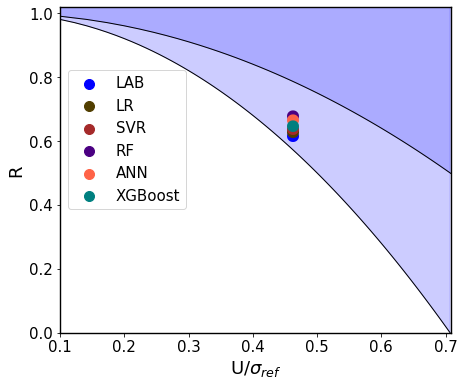

In [610]:
import matplotlib.pyplot as plt
import numpy as np
fig= plt.figure(figsize=(7,6))
ax = fig.add_subplot(111)
R=np.array([i for i in np.arange(0,1,0.01)])
x=np.sqrt((1-R)/2)
x2=np.sqrt((1-R))
plt.text(U_d_LAB_CO,R_LAB_CO , '•', rotation=90, va='center',fontsize = 40, color='blue')
plt.text(U_d_LR_CO,R_LR_CO , '•', rotation=90, va='center',fontsize = 40, color='#513e00')
plt.text(U_d_SVR_CO,R_SVR_CO+0.02, '•', rotation=90, va='center',fontsize = 40, color='brown')
plt.text(U_d_RF_CO,R_RF_CO, '•', rotation=90, va='center',fontsize = 40, color='indigo')
plt.text(U_d_ANN_CO,R_ANN_CO, '•', rotation=90, va='center',fontsize = 40, color='tomato')
plt.text(U_d_XGB_CO,R_XGB_CO, '•', rotation=90, va='center',fontsize = 40, color='teal')
plt.scatter(10,10,color='blue',s=100)
plt.scatter(10,10,color='#513e00',s=100)
plt.scatter(10,10,color='brown',s=100)
plt.scatter(10,10,color='indigo',s=100)
plt.scatter(10,10,color='tomato',s=100)
plt.scatter(10,10,color='teal',s=100)
plt.legend(['LAB','LR','SVR','RF','ANN','XGBoost'],loc =2, bbox_to_anchor = (0,0.83), fontsize=15)
plt.plot(x,R, color='black', linewidth=1)
plt.plot(x2,R, color='black', linewidth=1)
ax.set_ylim(bottom=0)
ax.set_ylim(top=1.02)
ax.set_xlim(left=0.1)
ax.set_xlim(right=0.708)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.xlabel('U/'+r'$σ_{ref}$',fontsize=18)
plt.ylabel('R',fontsize=18)
ax.fill_between(x, R, 1.3, color='blue', alpha=.2)
ax.fill_between(x2, R, 1.3, color='blue', alpha=.16)
plt.setp(ax.spines.values(), linewidth=1.4)
plt.savefig("MPC4_R1_2.5_C.pdf", format="pdf", bbox_inches="tight")
plt.show()

# Constant u_r

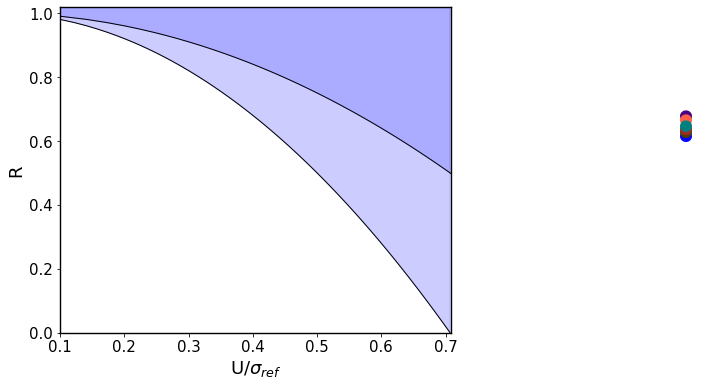

In [611]:
import matplotlib.pyplot as plt
import numpy as np
fig= plt.figure(figsize=(7,6))
ax = fig.add_subplot(111)
R=np.array([i for i in np.arange(0,1,0.01)])
x=np.sqrt((1-R)/2)
x2=np.sqrt((1-R))
plt.text(U_d_LAB1_CO,R_LAB_CO , '•', rotation=90, va='center',fontsize = 40, color='blue')
plt.text(U_d_LR1_CO,R_LR_CO , '•', rotation=90, va='center',fontsize = 40, color='#513e00')
plt.text(U_d_SVR1_CO,R_SVR_CO+0.02, '•', rotation=90, va='center',fontsize = 40, color='brown')
plt.text(U_d_RF1_CO,R_RF_CO, '•', rotation=90, va='center',fontsize = 40, color='indigo')
plt.text(U_d_ANN1_CO,R_ANN_CO, '•', rotation=90, va='center',fontsize = 40, color='tomato')
plt.text(U_d_XGB1_CO,R_XGB_CO, '•', rotation=90, va='center',fontsize = 40, color='teal')
plt.scatter(10,10,color='blue',s=100)
plt.scatter(10,10,color='#513e00',s=100)
plt.scatter(10,10,color='brown',s=100)
plt.scatter(10,10,color='indigo',s=100)
plt.scatter(10,10,color='tomato',s=100)
plt.scatter(10,10,color='teal',s=100)
#plt.legend(['LAB','LR','SVR','RF','ANN','XGBoost'],loc =2, bbox_to_anchor = (0,0.83), fontsize=15)
plt.plot(x,R, color='black', linewidth=1)
plt.plot(x2,R, color='black', linewidth=1)
ax.set_ylim(bottom=0)
ax.set_ylim(top=1.02)
ax.set_xlim(left=0.1)
ax.set_xlim(right=0.708)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.xlabel('U/'+r'$σ_{ref}$',fontsize=18)
plt.ylabel('R',fontsize=18)
ax.fill_between(x, R, 1.3, color='blue', alpha=.2)
ax.fill_between(x2, R, 1.3, color='blue', alpha=.16)
plt.setp(ax.spines.values(), linewidth=1.4)
plt.savefig("MPC4_R1_2.5_V.pdf", format="pdf", bbox_inches="tight")
plt.show()

# R1 PM10

# RMSE_MPC

 ### Constant  u_r

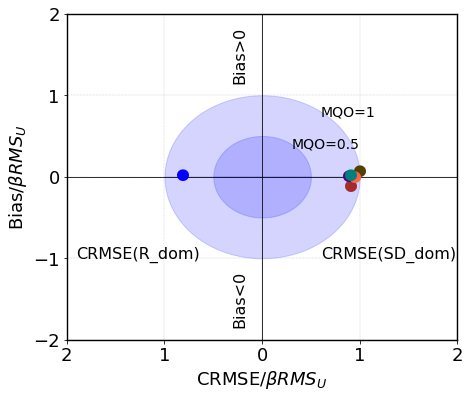

In [612]:
theta = np.linspace( 0 , 2 * np.pi , 150 )
 
radius = 1
 
a = radius * np.cos( theta )
b = radius * np.sin( theta )

radius1=0.5

c = radius1 * np.cos( theta )
d = radius1 * np.sin( theta )

fig= plt.figure(figsize=(7,6))
ax = fig.add_subplot(111)
#ax.patch.set_facecolor('lightblue')
#ax.patch.set_alpha(0.3)
point1 = [0.2, 2]
point2 = [0.2, 2]
x_values = [point1[0], point2[0]]
y_values = [point1[1], point2[1]]
plt.text(CRMSE_U_LAB_NO2,Bias_U_LAB_NO2 , '•', rotation=90, va='center',fontsize = 40, color='blue')
plt.text(CRMSE_U_LR_NO2,Bias_U_LR_NO2 , '•', rotation=90, va='center',fontsize = 40, color='#513e00')
plt.text(CRMSE_U_SVR_NO2,Bias_U_SVR_NO2 , '•', rotation=90, va='center',fontsize = 40, color='brown')
plt.text(CRMSE_U_RF_NO2,Bias_U_RF_NO2 , '•', rotation=90, va='center',fontsize = 40, color='indigo')
plt.text(CRMSE_U_ANN_NO2,Bias_U_ANN_NO2 , '•', rotation=90, va='center',fontsize = 40, color='tomato')
plt.text(CRMSE_U_XGB_NO2,Bias_U_XGB_NO2 , '•', rotation=90, va='center',fontsize = 40, color='teal')
plt.scatter(10,10,color='blue',s=100)
plt.scatter(10,10,color='#513e00',s=100)
plt.scatter(10,10,color='brown',s=100)
plt.scatter(10,10,color='indigo',s=100)
plt.scatter(10,10,color='tomato',s=100)
plt.scatter(10,10,color='teal',s=100)
#plt.legend(['LAB','LR','SVR','RF','ANN','XGBoost'],loc = 2, bbox_to_anchor = (0,1), fontsize=13)
plt.plot(x_values, y_values, color='black')
plt.Circle((0, 0), 1, color='black', linewidth=10)
plt.Circle((0, 0), 1.1, fill=False, linewidth=2)
plt.vlines([0], -2, 2, color='black', linewidth=0.8)
plt.hlines([0], -2, 2, color='black', linewidth=0.8)
plt.plot(x_values, y_values, color='black')
plt.text(-1.9, -1, 'CRMSE(R_dom)', fontsize = 16, color='black')
plt.text(0.6, -1, 'CRMSE(SD_dom)', fontsize = 16, color='black')
plt.text(-0.3, -1.5, 'Bias<0', rotation=90, va='center',fontsize = 16, color='black')
plt.text(-0.3, 1.5, 'Bias>0', rotation=90, va='center',fontsize = 16, color='black')
plt.text(0.3, 0.4, 'MQO=0.5', rotation=0, va='center',fontsize = 14, color='black')
plt.text(0.6, 0.8, 'MQO=1', rotation=0, va='center',fontsize = 14, color='black')
plt.fill_between(c, d, color='blue', alpha=0.17)
plt.fill_between(a, b, color='blue', alpha=0.17)
plt.xlabel('CRMSE/'+r'$βRMS_{U}$',fontsize=18)
plt.ylabel('Bias/'+r'$βRMS_{U}$',fontsize=18)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
#plt.xticks(color='w')
plt.ylim([-2, 2])
plt.xlim([-2, 2])
ax.set_xticks([-2,-1,0,1,2])
ax.set_yticks([-2,-1,0,1,2])
ax.set_xticklabels(['2','1','0','1','2'])
#ax.plot([0, 1], [0, 1], transform=ax.transAxes)
#ax.plot([0, -1], [0, 1], transform=ax.transAxes)
#ax.plot(x_values, y_values, color='black')
#plt.yticks(color='w')
#plt.title('CO',fontsize=18)
plt.grid(linestyle='-.',linewidth=0.3)
plt.setp(ax.spines.values(), linewidth=1.4)
plt.savefig("MPC_R1_10_C.pdf", format="pdf", bbox_inches="tight")
plt.show()

# Variable U_r

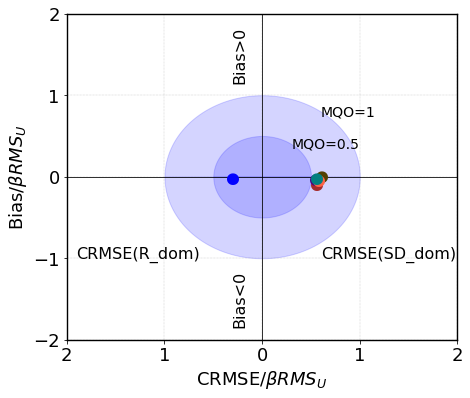

In [613]:
theta = np.linspace( 0 , 2 * np.pi , 150 )
 
radius = 1
 
a = radius * np.cos( theta )
b = radius * np.sin( theta )

radius1=0.5

c = radius1 * np.cos( theta )
d = radius1 * np.sin( theta )

fig= plt.figure(figsize=(7,6))
ax = fig.add_subplot(111)
#ax.patch.set_facecolor('lightblue')
#ax.patch.set_alpha(0.3)
point1 = [0.2, 2]
point2 = [0.2, 2]
x_values = [point1[0], point2[0]]
y_values = [point1[1], point2[1]]
#plt.text(CRMSE_LAB[0],MBE_LAB[0] , '•', rotation=90, va='center',fontsize = 40, color='#426eff')
Bias1_U_XGB_NO2**2+CRMSE1_U_XGB_NO2**2
plt.text(CRMSE1_U_LAB_NO2,Bias1_U_LAB_NO2 , '•', rotation=90, va='center',fontsize = 40, color='blue')
plt.text(CRMSE1_U_LR_NO2,Bias1_U_LR_NO2 , '•', rotation=90, va='center',fontsize = 40, color='#513e00')
plt.text(CRMSE1_U_SVR_NO2,Bias1_U_SVR_NO2 , '•', rotation=90, va='center',fontsize = 40, color='brown')
plt.text(CRMSE1_U_RF_NO2,Bias1_U_RF_NO2 , '•', rotation=90, va='center',fontsize = 40, color='indigo')
plt.text(CRMSE1_U_ANN_NO2,Bias1_U_ANN_NO2 , '•', rotation=90, va='center',fontsize = 40, color='tomato')
plt.text(CRMSE1_U_XGB_NO2,Bias1_U_XGB_NO2 , '•', rotation=90, va='center',fontsize = 40, color='teal')
#plt.scatter(10,10,color='#426eff',s=100,alpha=1)
plt.scatter(10,10,color='blue',s=100)
plt.scatter(10,10,color='#513e00',s=100)
plt.scatter(10,10,color='brown',s=100)
plt.scatter(10,10,color='indigo',s=100)
plt.scatter(10,10,color='tomato',s=100)
plt.scatter(10,10,color='teal',s=100)
#plt.legend(['LAB','LR','SVR','RF','ANN','XGBoost'],loc = 2, bbox_to_anchor = (0,1), fontsize=14)
plt.plot(x_values, y_values, color='black')
plt.Circle((0, 0), 1, color='black', linewidth=10)
plt.Circle((0, 0), 1.1, fill=False, linewidth=2)
plt.vlines([0], -2, 2, color='black', linewidth=0.8)
plt.hlines([0], -2, 2, color='black', linewidth=0.8)
plt.plot(x_values, y_values, color='black')
plt.text(-1.9, -1, 'CRMSE(R_dom)', fontsize = 16, color='black')
plt.text(0.6, -1, 'CRMSE(SD_dom)', fontsize = 16, color='black')
plt.text(-0.3, -1.5, 'Bias<0', rotation=90, va='center',fontsize = 16, color='black')
plt.text(-0.3, 1.5, 'Bias>0', rotation=90, va='center',fontsize = 16, color='black')
plt.text(0.3, 0.4, 'MQO=0.5', rotation=0, va='center',fontsize = 14, color='black')
plt.text(0.6, 0.8, 'MQO=1', rotation=0, va='center',fontsize = 14, color='black')
plt.fill_between(c, d, color='blue', alpha=0.17)
plt.fill_between(a, b, color='blue', alpha=0.17)
plt.xlabel('CRMSE/'+r'$βRMS_{U}$',fontsize=18)
plt.ylabel('Bias/'+r'$βRMS_{U}$',fontsize=18)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
#plt.xticks(color='w')
plt.ylim([-2, 2])
plt.xlim([-2, 2])
ax.set_xticks([-2,-1,0,1,2])
ax.set_yticks([-2,-1,0,1,2])
ax.set_xticklabels(['2','1','0','1','2'])
#ax.plot([0, 1], [0, 1], transform=ax.transAxes)
#ax.plot([0, -1], [0, 1], transform=ax.transAxes)
#ax.plot(x_values, y_values, color='black')
#plt.yticks(color='w')
#plt.title('CO',fontsize=18)
plt.grid(linestyle='-.',linewidth=0.3)
plt.setp(ax.spines.values(), linewidth=1.4)
plt.savefig("MPC_R1_10_V.pdf", format="pdf", bbox_inches="tight")
plt.show()

# NMB_MPC

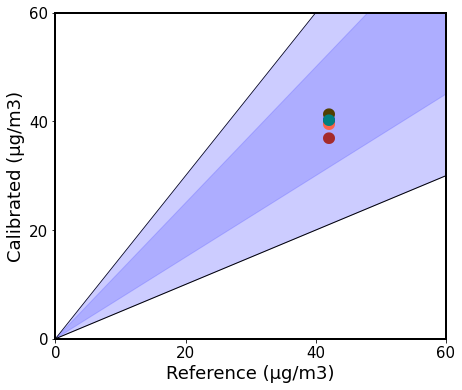

In [614]:
Y_Test=[i for i in np.arange(0,120,0.1)]
fig= plt.figure(figsize=(7,6))
ax = fig.add_subplot(111)
y1=0.5*np.array(Y_Test)
y2=1.5*np.array(Y_Test)
y3=0.75*np.array(Y_Test)
y4=1.25*np.array(Y_Test)
plt.text(Mean_NO2,Mean_LAB_NO2, '•', rotation=90, va='center',fontsize = 40, color='blue')
plt.text(Mean_NO2,Mean_LR_NO2, '•', rotation=90, va='center',fontsize = 40, color='#513e00')
plt.text(Mean_NO2,Mean_SVR_NO2, '•', rotation=90, va='center',fontsize = 40, color='brown')
plt.text(Mean_NO2,Mean_RF_NO2, '•', rotation=90, va='center',fontsize = 40, color='indigo')
plt.text(Mean_NO2,Mean_ANN_NO2, '•', rotation=90, va='center',fontsize = 40, color='tomato')
plt.text(Mean_NO2,Mean_XGB_NO2, '•', rotation=90, va='center',fontsize = 40, color='teal')
plt.scatter(10,200,color='blue',s=100)
plt.scatter(10,200,color='#513e00',s=100)
plt.scatter(10,200,color='brown',s=100)
plt.scatter(10,200,color='indigo',s=100)
plt.scatter(10,200,color='tomato',s=100)
plt.scatter(10,200,color='teal',s=100)
#plt.legend(['LAB','LR','SVR','RF','ANN','XGBoost'],loc = 2, bbox_to_anchor = (0,1), fontsize=13)
plt.plot(np.array(Y_Test),1.5*np.array(Y_Test),c ="black",linewidth=0.7)
plt.plot(np.array(Y_Test),0.5*np.array(Y_Test),c ="black",linewidth=1)
plt.fill_between(np.array(Y_Test), y1, y2, color='blue', alpha=0.2)
plt.fill_between(np.array(Y_Test), y3, y4, color='blue', alpha=0.15)
ax.set_ylim(bottom=0)
ax.set_xlim(left=0)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.show
plt.xlim(0, 60)
plt.ylim(0, 60)
plt.xticks(np.arange(0,61, step=20))
plt.yticks(np.arange(0,61, step=20))
plt.setp(ax.spines.values(), linewidth=2)
plt.xlabel('Reference (µg/m3)',fontsize=18)
plt.ylabel('Calibrated (µg/m3)',fontsize=18)
plt.savefig("MPC2_R1_10.pdf",format="pdf", bbox_inches="tight", dpi=1000)
plt.show()

# NMSD_MPC

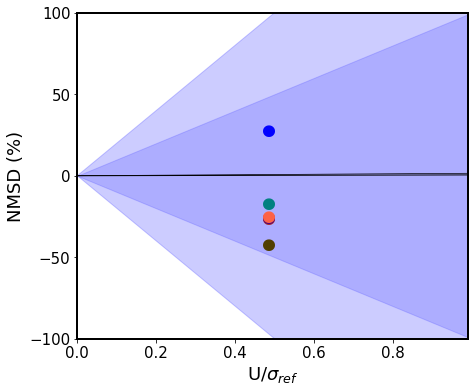

In [615]:
Y_Test=[i for i in np.arange(0,1,0.01)]
fig= plt.figure(figsize=(7,6))
ax = fig.add_subplot(111)
y1=-200*np.array(Y_Test)
y2=200*np.array(Y_Test)
y3=-100*np.array(Y_Test)
y4=100*np.array(Y_Test)
plt.text(U_d_LAB_NO2,NMSD_LAB_NO2 , '•', rotation=90, va='center',fontsize = 40, color='blue')
plt.text(U_d_LR_NO2,NMSD_LR_NO2 , '•', rotation=90, va='center',fontsize = 40, color='#513e00')
plt.text(U_d_SVR_NO2,NMSD_SVR_NO2, '•', rotation=90, va='center',fontsize = 40, color='brown')
plt.text(U_d_RF_NO2,NMSD_RF_NO2, '•', rotation=90, va='center',fontsize = 40, color='indigo')
plt.text(U_d_ANN_NO2,NMSD_ANN_NO2, '•', rotation=90, va='center',fontsize = 40, color='tomato')
plt.text(U_d_XGB_NO2,NMSD_XGB_NO2, '•', rotation=90, va='center',fontsize = 40, color='teal')
plt.scatter(10,10,color='blue',s=100)
plt.scatter(10,10,color='#513e00',s=100)
plt.scatter(10,10,color='brown',s=100)
plt.scatter(10,10,color='indigo',s=100)
plt.scatter(10,10,color='tomato',s=100)
plt.scatter(10,10,color='teal',s=100)
#plt.legend(['LAB','LR','SVR','RF','ANN','XGBoost'],loc =2, bbox_to_anchor = (0,0.83), fontsize=15)
plt.plot(np.array(Y_Test),1.5*np.array(Y_Test),c ="black",linewidth=0.7)
plt.plot(np.array(Y_Test),0.5*np.array(Y_Test),c ="black",linewidth=1)
plt.fill_between(np.array(Y_Test), y1, y2, color='blue', alpha=0.2)
plt.fill_between(np.array(Y_Test), y3, y4, color='blue', alpha=0.15)
ax.set_ylim(bottom=0)
ax.set_xlim(left=0)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.show
plt.xlim(0,0.99)
plt.ylim(-100,100)
plt.xticks(np.arange(0,1, step=0.2))
plt.yticks(np.arange(-100,101, step=50))
plt.setp(ax.spines.values(), linewidth=2)
plt.xlabel('U/'+r'$σ_{ref}$',fontsize=18)
plt.ylabel('NMSD (%)',fontsize=18)
plt.savefig("MPC3_R1_10.pdf",format="pdf", bbox_inches="tight", dpi=1000)
plt.show()

# R_MPC

## Constant u_r

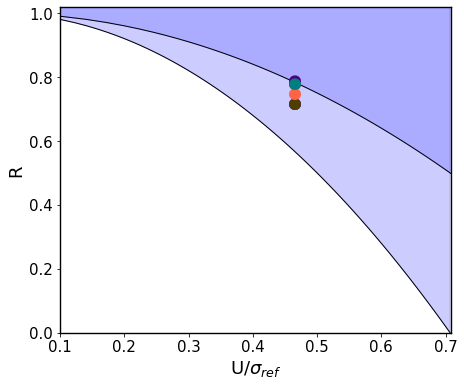

In [616]:
import matplotlib.pyplot as plt
import numpy as np
fig= plt.figure(figsize=(7,6))
ax = fig.add_subplot(111)
R=np.array([i for i in np.arange(0,1,0.01)])
x=np.sqrt((1-R)/2)
x2=np.sqrt((1-R))
plt.text(U_d_LAB_NO2,R_LAB_NO2 , '•', rotation=90, va='center',fontsize = 40, color='blue')
plt.text(U_d_LR_NO2,R_LR_NO2 , '•', rotation=90, va='center',fontsize = 40, color='#513e00')
plt.text(U_d_SVR_NO2,R_SVR_NO2, '•', rotation=90, va='center',fontsize = 40, color='brown')
plt.text(U_d_RF_NO2,R_RF_NO2, '•', rotation=90, va='center',fontsize = 40, color='indigo')
plt.text(U_d_ANN_NO2,R_ANN_NO2, '•', rotation=90, va='center',fontsize = 40, color='tomato')
plt.text(U_d_XGB_NO2,R_XGB_NO2, '•', rotation=90, va='center',fontsize = 40, color='teal')
plt.scatter(10,10,color='blue',s=100)
plt.scatter(10,10,color='#513e00',s=100)
plt.scatter(10,10,color='brown',s=100)
plt.scatter(10,10,color='indigo',s=100)
plt.scatter(10,10,color='tomato',s=100)
plt.scatter(10,10,color='teal',s=100)
#plt.legend(['LAB','LR','SVR','RF','ANN','XGBoost'],loc =2, bbox_to_anchor = (0,0.83), fontsize=13)
plt.plot(x,R, color='black', linewidth=1)
plt.plot(x2,R, color='black', linewidth=1)
ax.set_ylim(bottom=0)
ax.set_ylim(top=1.02)
ax.set_xlim(left=0.1)
ax.set_xlim(right=0.708)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.xlabel('U/'+r'$σ_{ref}$',fontsize=18)
plt.ylabel('R',fontsize=18)
ax.fill_between(x, R, 1.3, color='blue', alpha=.2)
ax.fill_between(x2, R, 1.3, color='blue', alpha=.16)
plt.setp(ax.spines.values(), linewidth=1.4)
plt.savefig("MPC4_R1_10_C.pdf", format="pdf", bbox_inches="tight")
plt.show()

#  Variable u_r

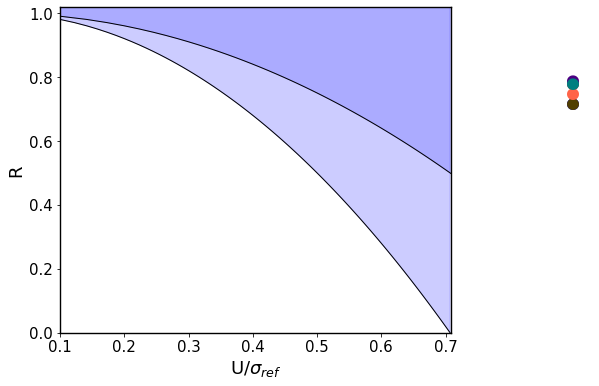

In [617]:
import matplotlib.pyplot as plt
import numpy as np
fig= plt.figure(figsize=(7,6))
ax = fig.add_subplot(111)
R=np.array([i for i in np.arange(0,1,0.01)])
x=np.sqrt((1-R)/2)
x2=np.sqrt((1-R))
plt.text(U_d_LAB1_NO2,R_LAB_NO2 , '•', rotation=90, va='center',fontsize = 40, color='blue')
plt.text(U_d_LR1_NO2,R_LR_NO2 , '•', rotation=90, va='center',fontsize = 40, color='#513e00')
plt.text(U_d_SVR1_NO2,R_SVR_NO2, '•', rotation=90, va='center',fontsize = 40, color='brown')
plt.text(U_d_RF1_NO2,R_RF_NO2, '•', rotation=90, va='center',fontsize = 40, color='indigo')
plt.text(U_d_ANN1_NO2,R_ANN_NO2, '•', rotation=90, va='center',fontsize = 40, color='tomato')
plt.text(U_d_XGB1_NO2,R_XGB_NO2, '•', rotation=90, va='center',fontsize = 40, color='teal')
plt.scatter(10,10,color='blue',s=100)
plt.scatter(10,10,color='#513e00',s=100)
plt.scatter(10,10,color='brown',s=100)
plt.scatter(10,10,color='indigo',s=100)
plt.scatter(10,10,color='tomato',s=100)
plt.scatter(10,10,color='teal',s=100)
#plt.legend(['LAB','LR','SVR','RF','ANN','XGBoost'],loc =2, bbox_to_anchor = (0,0.5), fontsize=15)
plt.plot(x,R, color='black', linewidth=1)
plt.plot(x2,R, color='black', linewidth=1)
ax.set_ylim(bottom=0)
ax.set_ylim(top=1.02)
ax.set_xlim(left=0.1)
ax.set_xlim(right=0.708)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.xlabel('U/'+r'$σ_{ref}$',fontsize=18)
plt.ylabel('R',fontsize=18)
ax.fill_between(x, R, 1.3, color='blue', alpha=.2)
ax.fill_between(x2, R, 1.3, color='blue', alpha=.16)
plt.setp(ax.spines.values(), linewidth=1.4)
plt.savefig("MPC4_R1_10_V.pdf", format="pdf", bbox_inches="tight")
plt.show()

# N3 PM2.5

#  RMSE_MPC

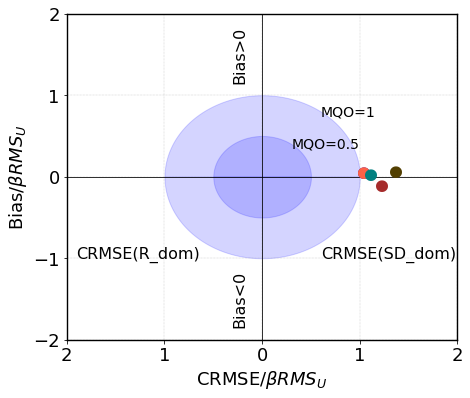

In [618]:
theta = np.linspace( 0 , 2 * np.pi , 150 )
 
radius = 1
 
a = radius * np.cos( theta )
b = radius * np.sin( theta )

radius1=0.5

c = radius1 * np.cos( theta )
d = radius1 * np.sin( theta )

fig= plt.figure(figsize=(7,6))
ax = fig.add_subplot(111)
#ax.patch.set_facecolor('lightblue')
#ax.patch.set_alpha(0.3)
point1 = [0.2, 2]
point2 = [0.2, 2]
x_values = [point1[0], point2[0]]
y_values = [point1[1], point2[1]]
#plt.text(CRMSE_LAB[0],MBE_LAB[0] , '•', rotation=90, va='center',fontsize = 40, color='#426eff')
#plt.text(CRMSE_U_LAB_SO2,Bias_U_LAB_SO2 , '•', rotation=90, va='center',fontsize = 40, color='blue')
plt.text(CRMSE_U_LR_SO2,Bias_U_LR_SO2 , '•', rotation=90, va='center',fontsize = 40, color='#513e00')
plt.text(CRMSE_U_SVR_SO2,Bias_U_SVR_SO2 , '•', rotation=90, va='center',fontsize = 40, color='brown')
plt.text(CRMSE_U_RF_SO2,Bias_U_RF_SO2 , '•', rotation=90, va='center',fontsize = 40, color='indigo')
plt.text(CRMSE_U_ANN_SO2,Bias_U_ANN_SO2 , '•', rotation=90, va='center',fontsize = 40, color='tomato')
plt.text(CRMSE_U_XGB_SO2,Bias_U_XGB_SO2 , '•', rotation=90, va='center',fontsize = 40, color='teal')
#plt.scatter(10,10,color='#426eff',s=100,alpha=1)
plt.scatter(10,10,color='blue',s=100)
plt.scatter(10,10,color='#513e00',s=100)
plt.scatter(10,10,color='brown',s=100)
plt.scatter(10,10,color='indigo',s=100)
plt.scatter(10,10,color='tomato',s=100)
plt.scatter(10,10,color='teal',s=100)
#plt.legend(['LAB','LR','SVR','RF','ANN','XGBoost'],loc = 2, bbox_to_anchor = (0,1), fontsize=13)
plt.plot(x_values, y_values, color='black')
plt.Circle((0, 0), 1, color='black', linewidth=10)
plt.Circle((0, 0), 1.1, fill=False, linewidth=2)
plt.vlines([0], -2, 2, color='black', linewidth=0.8)
plt.hlines([0], -2, 2, color='black', linewidth=0.8)
plt.plot(x_values, y_values, color='black')
plt.text(-1.9, -1, 'CRMSE(R_dom)', fontsize = 16, color='black')
plt.text(0.6, -1, 'CRMSE(SD_dom)', fontsize = 16, color='black')
plt.text(-0.3, -1.5, 'Bias<0', rotation=90, va='center',fontsize = 16, color='black')
plt.text(-0.3, 1.5, 'Bias>0', rotation=90, va='center',fontsize = 16, color='black')
plt.text(0.3, 0.4, 'MQO=0.5', rotation=0, va='center',fontsize = 14, color='black')
plt.text(0.6, 0.8, 'MQO=1', rotation=0, va='center',fontsize = 14, color='black')
plt.fill_between(c, d, color='blue', alpha=0.17)
plt.fill_between(a, b, color='blue', alpha=0.17)
plt.xlabel('CRMSE/'+r'$βRMS_{U}$',fontsize=18)
plt.ylabel('Bias/'+r'$βRMS_{U}$',fontsize=18)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
#plt.xticks(color='w')
plt.ylim([-2, 2])
plt.xlim([-2, 2])
ax.set_xticks([-2,-1,0,1,2])
ax.set_yticks([-2,-1,0,1,2])
ax.set_xticklabels(['2','1','0','1','2'])
#ax.plot([0, 1], [0, 1], transform=ax.transAxes)
#ax.plot([0, -1], [0, 1], transform=ax.transAxes)
#ax.plot(x_values, y_values, color='black')
#plt.yticks(color='w')
#plt.title('CO',fontsize=18)
plt.grid(linestyle='-.',linewidth=0.3)
plt.setp(ax.spines.values(), linewidth=1.4)
plt.savefig("MPC_N3_2.5_C.pdf", format="pdf", bbox_inches="tight")
plt.show()

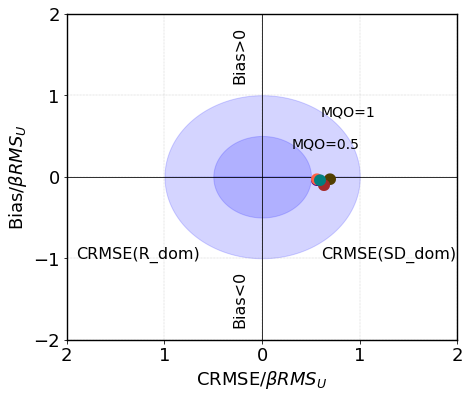

In [619]:
theta = np.linspace( 0 , 2 * np.pi , 150 )
 
radius = 1
 
a = radius * np.cos( theta )
b = radius * np.sin( theta )

radius1=0.5

c = radius1 * np.cos( theta )
d = radius1 * np.sin( theta )

fig= plt.figure(figsize=(7,6))
ax = fig.add_subplot(111)
#ax.patch.set_facecolor('lightblue')
#ax.patch.set_alpha(0.3)
point1 = [0.2, 2]
point2 = [0.2, 2]
x_values = [point1[0], point2[0]]
y_values = [point1[1], point2[1]]
#plt.text(CRMSE_LAB[0],MBE_LAB[0] , '•', rotation=90, va='center',fontsize = 40, color='#426eff')
Bias1_U_XGB_NO2**2+CRMSE1_U_XGB_NO2**2
#plt.text(CRMSE1_U_LAB_SO2,Bias1_U_LAB_SO2 , '•', rotation=90, va='center',fontsize = 40, color='blue')
plt.text(CRMSE1_U_LR_SO2,Bias1_U_LR_SO2 , '•', rotation=90, va='center',fontsize = 40, color='#513e00')
plt.text(CRMSE1_U_SVR_SO2,Bias1_U_SVR_SO2 , '•', rotation=90, va='center',fontsize = 40, color='brown')
plt.text(CRMSE1_U_RF_SO2,Bias1_U_RF_SO2 , '•', rotation=90, va='center',fontsize = 40, color='indigo')
plt.text(CRMSE1_U_ANN_SO2,Bias1_U_ANN_SO2 , '•', rotation=90, va='center',fontsize = 40, color='tomato')
plt.text(CRMSE1_U_XGB_SO2,Bias1_U_XGB_SO2 , '•', rotation=90, va='center',fontsize = 40, color='teal')
#plt.scatter(10,10,color='#426eff',s=100,alpha=1)
plt.scatter(10,10,color='blue',s=100)
plt.scatter(10,10,color='#513e00',s=100)
plt.scatter(10,10,color='brown',s=100)
plt.scatter(10,10,color='indigo',s=100)
plt.scatter(10,10,color='tomato',s=100)
plt.scatter(10,10,color='teal',s=100)
#plt.legend(['LAB','LR','SVR','RF','ANN','XGBoost'],loc = 2, bbox_to_anchor = (0,1), fontsize=13)
plt.plot(x_values, y_values, color='black')
plt.Circle((0, 0), 1, color='black', linewidth=10)
plt.Circle((0, 0), 1.1, fill=False, linewidth=2)
plt.vlines([0], -2, 2, color='black', linewidth=0.8)
plt.hlines([0], -2, 2, color='black', linewidth=0.8)
plt.plot(x_values, y_values, color='black')
plt.text(-1.9, -1, 'CRMSE(R_dom)', fontsize = 16, color='black')
plt.text(0.6, -1, 'CRMSE(SD_dom)', fontsize = 16, color='black')
plt.text(-0.3, -1.5, 'Bias<0', rotation=90, va='center',fontsize = 16, color='black')
plt.text(-0.3, 1.5, 'Bias>0', rotation=90, va='center',fontsize = 16, color='black')
plt.text(0.3, 0.4, 'MQO=0.5', rotation=0, va='center',fontsize = 14, color='black')
plt.text(0.6, 0.8, 'MQO=1', rotation=0, va='center',fontsize = 14, color='black')
plt.fill_between(c, d, color='blue', alpha=0.17)
plt.fill_between(a, b, color='blue', alpha=0.17)
plt.xlabel('CRMSE/'+r'$βRMS_{U}$',fontsize=18)
plt.ylabel('Bias/'+r'$βRMS_{U}$',fontsize=18)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
#plt.xticks(color='w')
plt.ylim([-2, 2])
plt.xlim([-2, 2])
ax.set_xticks([-2,-1,0,1,2])
ax.set_yticks([-2,-1,0,1,2])
ax.set_xticklabels(['2','1','0','1','2'])
#ax.plot([0, 1], [0, 1], transform=ax.transAxes)
#ax.plot([0, -1], [0, 1], transform=ax.transAxes)
#ax.plot(x_values, y_values, color='black')
#plt.yticks(color='w')
#plt.title('CO',fontsize=18)
plt.grid(linestyle='-.',linewidth=0.3)
plt.setp(ax.spines.values(), linewidth=1.4)
plt.savefig("MPC_N3_2.5_V.pdf", format="pdf", bbox_inches="tight")
plt.show()

# NMB_MPC

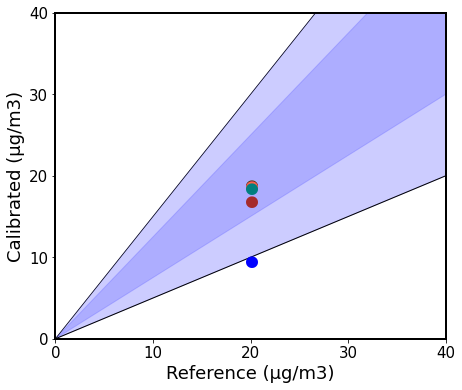

In [620]:
Y_Test=[i for i in np.arange(0,120,0.1)]
fig= plt.figure(figsize=(7,6))
ax = fig.add_subplot(111)
y1=0.5*np.array(Y_Test)
y2=1.5*np.array(Y_Test)
y3=0.75*np.array(Y_Test)
y4=1.25*np.array(Y_Test)
plt.text(Mean_SO2,Mean_LAB_SO2, '•', rotation=90, va='center',fontsize = 40, color='blue')
plt.text(Mean_SO2,Mean_LR_SO2, '•', rotation=90, va='center',fontsize = 40, color='#513e00')
plt.text(Mean_SO2,Mean_SVR_SO2, '•', rotation=90, va='center',fontsize = 40, color='brown')
plt.text(Mean_SO2,Mean_RF_SO2, '•', rotation=90, va='center',fontsize = 40, color='indigo')
plt.text(Mean_SO2,Mean_ANN_SO2, '•', rotation=90, va='center',fontsize = 40, color='tomato')
plt.text(Mean_SO2,Mean_XGB_SO2, '•', rotation=90, va='center',fontsize = 40, color='teal')
plt.scatter(10,200,color='blue',s=100)
plt.scatter(10,200,color='#513e00',s=100)
plt.scatter(10,200,color='brown',s=100)
plt.scatter(10,200,color='indigo',s=100)
plt.scatter(10,200,color='tomato',s=100)
plt.scatter(10,200,color='teal',s=100)
#plt.legend(['LAB','LR','SVR','RF','ANN','XGBoost'],loc = 2, bbox_to_anchor = (0,1), fontsize=13)
plt.plot(np.array(Y_Test),1.5*np.array(Y_Test),c ="black",linewidth=0.7)
plt.plot(np.array(Y_Test),0.5*np.array(Y_Test),c ="black",linewidth=1)
plt.fill_between(np.array(Y_Test), y1, y2, color='blue', alpha=0.2)
plt.fill_between(np.array(Y_Test), y3, y4, color='blue', alpha=0.15)
ax.set_ylim(bottom=0)
ax.set_xlim(left=0)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.show
plt.xlim(0, 40)
plt.ylim(0, 40)
plt.xticks(np.arange(0,41, step=10))
plt.yticks(np.arange(0,41, step=10))
plt.setp(ax.spines.values(), linewidth=2)
plt.xlabel('Reference (µg/m3)',fontsize=18)
plt.ylabel('Calibrated (µg/m3)',fontsize=18)
plt.savefig("MPC2_N3_2.5.pdf",format="pdf", bbox_inches="tight", dpi=1000)
plt.show()

# NMSD_MPC

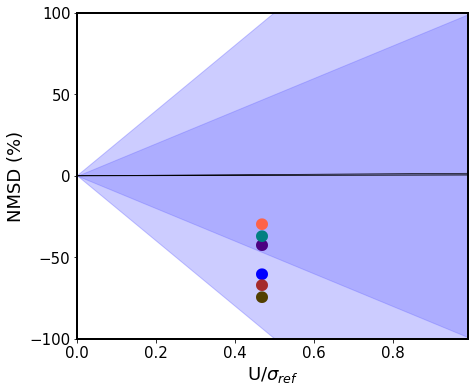

In [621]:
Y_Test=[i for i in np.arange(0,1,0.01)]
fig= plt.figure(figsize=(7,6))
ax = fig.add_subplot(111)
y1=-200*np.array(Y_Test)
y2=200*np.array(Y_Test)
y3=-100*np.array(Y_Test)
y4=100*np.array(Y_Test)
plt.text(U_d_LAB_SO2,NMSD_LAB_SO2 , '•', rotation=90, va='center',fontsize = 40, color='blue')
plt.text(U_d_LR_SO2,NMSD_LR_SO2 , '•', rotation=90, va='center',fontsize = 40, color='#513e00')
plt.text(U_d_SVR_SO2,NMSD_SVR_SO2, '•', rotation=90, va='center',fontsize = 40, color='brown')
plt.text(U_d_RF_SO2,NMSD_RF_SO2, '•', rotation=90, va='center',fontsize = 40, color='indigo')
plt.text(U_d_ANN_SO2,NMSD_ANN_SO2, '•', rotation=90, va='center',fontsize = 40, color='tomato')
plt.text(U_d_XGB_SO2,NMSD_XGB_SO2, '•', rotation=90, va='center',fontsize = 40, color='teal')
plt.scatter(10,10,color='blue',s=100)
plt.scatter(10,10,color='#513e00',s=100)
plt.scatter(10,10,color='brown',s=100)
plt.scatter(10,10,color='indigo',s=100)
plt.scatter(10,10,color='tomato',s=100)
plt.scatter(10,10,color='teal',s=100)
#plt.legend(['LAB','LR','SVR','RF','ANN','XGBoost'],loc =2, bbox_to_anchor = (0,0.83), fontsize=15)
plt.plot(np.array(Y_Test),1.5*np.array(Y_Test),c ="black",linewidth=0.7)
plt.plot(np.array(Y_Test),0.5*np.array(Y_Test),c ="black",linewidth=1)
plt.fill_between(np.array(Y_Test), y1, y2, color='blue', alpha=0.2)
plt.fill_between(np.array(Y_Test), y3, y4, color='blue', alpha=0.15)
ax.set_ylim(bottom=0)
ax.set_xlim(left=0)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.show
plt.xlim(0,0.99)
plt.ylim(-100,100)
plt.xticks(np.arange(0,1, step=0.2))
plt.yticks(np.arange(-100,101, step=50))
plt.setp(ax.spines.values(), linewidth=2)
plt.xlabel('U/'+r'$σ_{ref}$',fontsize=18)
plt.ylabel('NMSD (%)',fontsize=18)
plt.savefig("MPC3_N3_2.5.pdf",format="pdf", bbox_inches="tight", dpi=1000)
plt.show()

# R_MPC

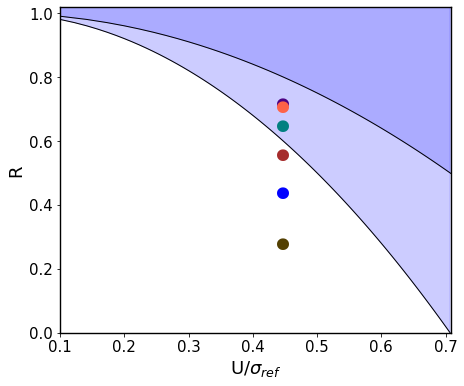

In [622]:
import matplotlib.pyplot as plt
import numpy as np
fig= plt.figure(figsize=(7,6))
ax = fig.add_subplot(111)
R=np.array([i for i in np.arange(0,1,0.01)])
x=np.sqrt((1-R)/2)
x2=np.sqrt((1-R))
plt.text(U_d_LAB_SO2,R_LAB_SO2 , '•', rotation=90, va='center',fontsize = 40, color='blue')
plt.text(U_d_LR_SO2,R_LR_SO2 , '•', rotation=90, va='center',fontsize = 40, color='#513e00')
plt.text(U_d_SVR_SO2,R_SVR_SO2, '•', rotation=90, va='center',fontsize = 40, color='brown')
plt.text(U_d_RF_SO2,R_RF_SO2, '•', rotation=90, va='center',fontsize = 40, color='indigo')
plt.text(U_d_ANN_SO2,R_ANN_SO2, '•', rotation=90, va='center',fontsize = 40, color='tomato')
plt.text(U_d_XGB_SO2,R_XGB_SO2, '•', rotation=90, va='center',fontsize = 40, color='teal')
plt.scatter(10,10,color='blue',s=100)
plt.scatter(10,10,color='#513e00',s=100)
plt.scatter(10,10,color='brown',s=100)
plt.scatter(10,10,color='indigo',s=100)
plt.scatter(10,10,color='tomato',s=100)
plt.scatter(10,10,color='teal',s=100)
#plt.legend(['LAB','LR','SVR','RF','ANN','XGBoost'],loc =2, bbox_to_anchor = (0,0.83), fontsize=15)
plt.plot(x,R, color='black', linewidth=1)
plt.plot(x2,R, color='black', linewidth=1)
ax.set_ylim(bottom=0)
ax.set_ylim(top=1.02)
ax.set_xlim(left=0.1)
ax.set_xlim(right=0.708)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.xlabel('U/'+r'$σ_{ref}$',fontsize=18)
plt.ylabel('R',fontsize=18)
ax.fill_between(x, R, 1.3, color='blue', alpha=.2)
ax.fill_between(x2, R, 1.3, color='blue', alpha=.16)
plt.setp(ax.spines.values(), linewidth=1.4)
plt.savefig("MPC4_N3_2.5_C.pdf", format="pdf", bbox_inches="tight")
plt.show()

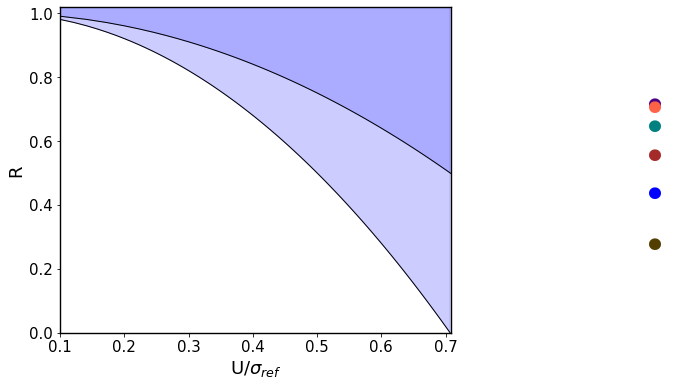

In [623]:
import matplotlib.pyplot as plt
import numpy as np
fig= plt.figure(figsize=(7,6))
ax = fig.add_subplot(111)
R=np.array([i for i in np.arange(0,1,0.01)])
x=np.sqrt((1-R)/2)
x2=np.sqrt((1-R))
plt.text(U_d_LAB1_SO2,R_LAB_SO2 , '•', rotation=90, va='center',fontsize = 40, color='blue')
plt.text(U_d_LR1_SO2,R_LR_SO2 , '•', rotation=90, va='center',fontsize = 40, color='#513e00')
plt.text(U_d_SVR1_SO2,R_SVR_SO2, '•', rotation=90, va='center',fontsize = 40, color='brown')
plt.text(U_d_RF1_SO2,R_RF_SO2, '•', rotation=90, va='center',fontsize = 40, color='indigo')
plt.text(U_d_ANN1_SO2,R_ANN_SO2, '•', rotation=90, va='center',fontsize = 40, color='tomato')
plt.text(U_d_XGB1_SO2,R_XGB_SO2, '•', rotation=90, va='center',fontsize = 40, color='teal')
plt.scatter(10,10,color='blue',s=100)
plt.scatter(10,10,color='#513e00',s=100)
plt.scatter(10,10,color='brown',s=100)
plt.scatter(10,10,color='indigo',s=100)
plt.scatter(10,10,color='tomato',s=100)
plt.scatter(10,10,color='teal',s=100)
#plt.legend(['LAB','LR','SVR','RF','ANN','XGBoost'],loc =2, bbox_to_anchor = (0,0.83), fontsize=13)
plt.plot(x,R, color='black', linewidth=1)
plt.plot(x2,R, color='black', linewidth=1)
ax.set_ylim(bottom=0)
ax.set_ylim(top=1.02)
ax.set_xlim(left=0.1)
ax.set_xlim(right=0.708)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.xlabel('U/'+r'$σ_{ref}$',fontsize=18)
plt.ylabel('R',fontsize=18)
ax.fill_between(x, R, 1.3, color='blue', alpha=.2)
ax.fill_between(x2, R, 1.3, color='blue', alpha=.16)
plt.setp(ax.spines.values(), linewidth=1.4)
plt.savefig("MPC4_N3_2.5_V.pdf", format="pdf", bbox_inches="tight")
plt.show()

# N3 PM10

# RMSE_MPC

## Constant U_r

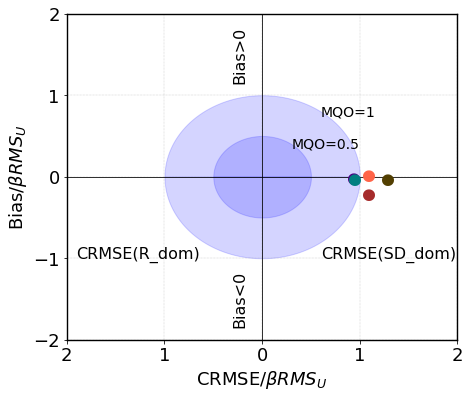

In [624]:
theta = np.linspace( 0 , 2 * np.pi , 150 )
 
radius = 1
 
a = radius * np.cos( theta )
b = radius * np.sin( theta )

radius1=0.5

c = radius1 * np.cos( theta )
d = radius1 * np.sin( theta )

fig= plt.figure(figsize=(7,6))
ax = fig.add_subplot(111)
#ax.patch.set_facecolor('lightblue')
#ax.patch.set_alpha(0.3)
point1 = [0.2, 2]
point2 = [0.2, 2]
x_values = [point1[0], point2[0]]
y_values = [point1[1], point2[1]]
#plt.text(CRMSE_LAB[0],MBE_LAB[0] , '•', rotation=90, va='center',fontsize = 40, color='#426eff')
#plt.text(CRMSE_U_LAB_O3,Bias_U_LAB_O3 , '•', rotation=90, va='center',fontsize = 40, color='blue')
plt.text(CRMSE_U_LR_O3,Bias_U_LR_O3 , '•', rotation=90, va='center',fontsize = 40, color='#513e00')
plt.text(CRMSE_U_SVR_O3,Bias_U_SVR_O3 , '•', rotation=90, va='center',fontsize = 40, color='brown')
plt.text(CRMSE_U_RF_O3,Bias_U_RF_O3 , '•', rotation=90, va='center',fontsize = 40, color='indigo')
plt.text(CRMSE_U_ANN_O3,Bias_U_ANN_O3 , '•', rotation=90, va='center',fontsize = 40, color='tomato')
plt.text(CRMSE_U_XGB_O3,Bias_U_XGB_O3 , '•', rotation=90, va='center',fontsize = 40, color='teal')
plt.scatter(10,10,color='blue',s=100)
plt.scatter(10,10,color='#513e00',s=100)
plt.scatter(10,10,color='brown',s=100)
plt.scatter(10,10,color='indigo',s=100)
plt.scatter(10,10,color='tomato',s=100)
plt.scatter(10,10,color='teal',s=100)
#plt.legend(['LAB','LR','SVR','RF','ANN','XGBoost'],loc = 2, bbox_to_anchor = (0,1), fontsize=13)
plt.plot(x_values, y_values, color='black')
plt.Circle((0, 0), 1, color='black', linewidth=10)
plt.Circle((0, 0), 1.1, fill=False, linewidth=2)
plt.vlines([0], -2, 2, color='black', linewidth=0.8)
plt.hlines([0], -2, 2, color='black', linewidth=0.8)
plt.plot(x_values, y_values, color='black')
plt.text(-1.9, -1, 'CRMSE(R_dom)', fontsize = 16, color='black')
plt.text(0.6, -1, 'CRMSE(SD_dom)', fontsize = 16, color='black')
plt.text(-0.3, -1.5, 'Bias<0', rotation=90, va='center',fontsize = 16, color='black')
plt.text(-0.3, 1.5, 'Bias>0', rotation=90, va='center',fontsize = 16, color='black')
plt.text(0.3, 0.4, 'MQO=0.5', rotation=0, va='center',fontsize = 14, color='black')
plt.text(0.6, 0.8, 'MQO=1', rotation=0, va='center',fontsize = 14, color='black')
plt.fill_between(c, d, color='blue', alpha=0.17)
plt.fill_between(a, b, color='blue', alpha=0.17)
plt.xlabel('CRMSE/'+r'$βRMS_{U}$',fontsize=18)
plt.ylabel('Bias/'+r'$βRMS_{U}$',fontsize=18)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
#plt.xticks(color='w')
plt.ylim([-2, 2])
plt.xlim([-2, 2])
ax.set_xticks([-2,-1,0,1,2])
ax.set_yticks([-2,-1,0,1,2])
ax.set_xticklabels(['2','1','0','1','2'])
#ax.plot([0, 1], [0, 1], transform=ax.transAxes)
#ax.plot([0, -1], [0, 1], transform=ax.transAxes)
#ax.plot(x_values, y_values, color='black')
#plt.yticks(color='w')
#plt.title('CO',fontsize=18)
plt.grid(linestyle='-.',linewidth=0.3)
plt.setp(ax.spines.values(), linewidth=1.4)
plt.savefig("MPC_N3_10_C.pdf", format="pdf", bbox_inches="tight")
plt.show()

# Variable U_r 

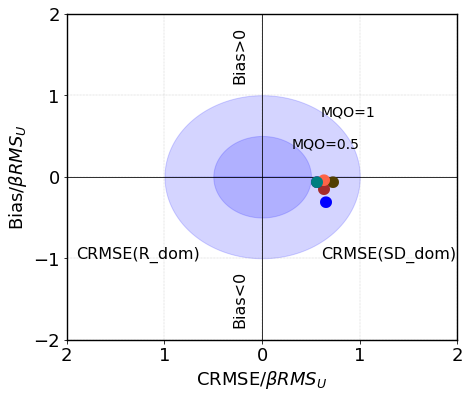

In [625]:
theta = np.linspace( 0 , 2 * np.pi , 150 )
 
radius = 1
 
a = radius * np.cos( theta )
b = radius * np.sin( theta )

radius1=0.5

c = radius1 * np.cos( theta )
d = radius1 * np.sin( theta )

fig= plt.figure(figsize=(7,6))
ax = fig.add_subplot(111)
#ax.patch.set_facecolor('lightblue')
#ax.patch.set_alpha(0.3)
point1 = [0.2, 2]
point2 = [0.2, 2]
x_values = [point1[0], point2[0]]
y_values = [point1[1], point2[1]]
#plt.text(CRMSE_LAB[0],MBE_LAB[0] , '•', rotation=90, va='center',fontsize = 40, color='#426eff')
plt.text(CRMSE1_U_LAB_O3,Bias1_U_LAB_O3 , '•', rotation=90, va='center',fontsize = 40, color='blue')
plt.text(CRMSE1_U_LR_O3,Bias1_U_LR_O3 , '•', rotation=90, va='center',fontsize = 40, color='#513e00')
plt.text(CRMSE1_U_SVR_O3,Bias1_U_SVR_O3 , '•', rotation=90, va='center',fontsize = 40, color='brown')
plt.text(CRMSE1_U_RF_O3,Bias1_U_RF_O3 , '•', rotation=90, va='center',fontsize = 40, color='indigo')
plt.text(CRMSE1_U_ANN_O3,Bias1_U_ANN_O3 , '•', rotation=90, va='center',fontsize = 40, color='tomato')
plt.text(CRMSE1_U_XGB_O3,Bias1_U_XGB_O3 , '•', rotation=90, va='center',fontsize = 40, color='teal')
#plt.scatter(10,10,color='#426eff',s=100,alpha=1)
plt.scatter(10,10,color='blue',s=100)
plt.scatter(10,10,color='#513e00',s=100)
plt.scatter(10,10,color='brown',s=100)
plt.scatter(10,10,color='indigo',s=100)
plt.scatter(10,10,color='tomato',s=100)
plt.scatter(10,10,color='teal',s=100)
#plt.legend(['LAB','LR','SVR','RF','ANN','XGBoost'],loc = 2, bbox_to_anchor = (0,1), fontsize=13)
plt.plot(x_values, y_values, color='black')
plt.Circle((0, 0), 1, color='black', linewidth=10)
plt.Circle((0, 0), 1.1, fill=False, linewidth=2)
plt.vlines([0], -2, 2, color='black', linewidth=0.8)
plt.hlines([0], -2, 2, color='black', linewidth=0.8)
plt.plot(x_values, y_values, color='black')
plt.text(-1.9, -1, 'CRMSE(R_dom)', fontsize = 16, color='black')
plt.text(0.6, -1, 'CRMSE(SD_dom)', fontsize = 16, color='black')
plt.text(-0.3, -1.5, 'Bias<0', rotation=90, va='center',fontsize = 16, color='black')
plt.text(-0.3, 1.5, 'Bias>0', rotation=90, va='center',fontsize = 16, color='black')
plt.text(0.3, 0.4, 'MQO=0.5', rotation=0, va='center',fontsize = 14, color='black')
plt.text(0.6, 0.8, 'MQO=1', rotation=0, va='center',fontsize = 14, color='black')
plt.fill_between(c, d, color='blue', alpha=0.17)
plt.fill_between(a, b, color='blue', alpha=0.17)
plt.xlabel('CRMSE/'+r'$βRMS_{U}$',fontsize=18)
plt.ylabel('Bias/'+r'$βRMS_{U}$',fontsize=18)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
#plt.xticks(color='w')
plt.ylim([-2, 2])
plt.xlim([-2, 2])
ax.set_xticks([-2,-1,0,1,2])
ax.set_yticks([-2,-1,0,1,2])
ax.set_xticklabels(['2','1','0','1','2'])
#ax.plot([0, 1], [0, 1], transform=ax.transAxes)
#ax.plot([0, -1], [0, 1], transform=ax.transAxes)
#ax.plot(x_values, y_values, color='black')
#plt.yticks(color='w')
#plt.title('CO',fontsize=18)
plt.grid(linestyle='-.',linewidth=0.3)
plt.setp(ax.spines.values(), linewidth=1.4)
plt.savefig("MPC_N3_10_V.pdf", format="pdf", bbox_inches="tight")
plt.show()

# NMB_MPC

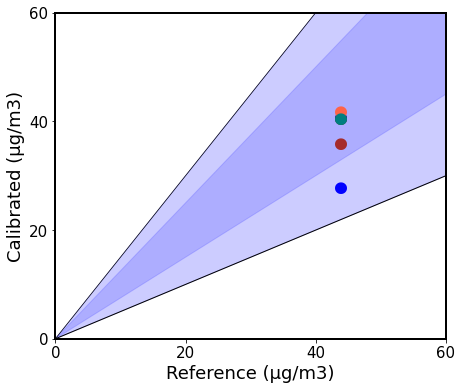

In [626]:
Y_Test=[i for i in np.arange(0,120,0.1)]
fig= plt.figure(figsize=(7,6))
ax = fig.add_subplot(111)
y1=0.5*np.array(Y_Test)
y2=1.5*np.array(Y_Test)
y3=0.75*np.array(Y_Test)
y4=1.25*np.array(Y_Test)
plt.text(Mean_O3,Mean_LAB_O3, '•', rotation=90, va='center',fontsize = 40, color='blue')
plt.text(Mean_O3,Mean_LR_O3, '•', rotation=90, va='center',fontsize = 40, color='#513e00')
plt.text(Mean_O3,Mean_SVR_O3, '•', rotation=90, va='center',fontsize = 40, color='brown')
plt.text(Mean_O3,Mean_RF_O3, '•', rotation=90, va='center',fontsize = 40, color='indigo')
plt.text(Mean_O3,Mean_ANN_O3, '•', rotation=90, va='center',fontsize = 40, color='tomato')
plt.text(Mean_O3,Mean_XGB_O3, '•', rotation=90, va='center',fontsize = 40, color='teal')
plt.scatter(10,200,color='blue',s=100)
plt.scatter(10,200,color='#513e00',s=100)
plt.scatter(10,200,color='brown',s=100)
plt.scatter(10,200,color='indigo',s=100)
plt.scatter(10,200,color='tomato',s=100)
plt.scatter(10,200,color='teal',s=100)
#plt.legend(['LAB','LR','SVR','RF','ANN','XGBoost'],loc = 2, bbox_to_anchor = (0,1), fontsize=15)
plt.plot(np.array(Y_Test),1.5*np.array(Y_Test),c ="black",linewidth=0.7)
plt.plot(np.array(Y_Test),0.5*np.array(Y_Test),c ="black",linewidth=1)
plt.fill_between(np.array(Y_Test), y1, y2, color='blue', alpha=0.2)
plt.fill_between(np.array(Y_Test), y3, y4, color='blue', alpha=0.15)
ax.set_ylim(bottom=0)
ax.set_xlim(left=0)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.show
plt.xlim(0, 60)
plt.ylim(0, 60)
plt.xticks(np.arange(0,61, step=20))
plt.yticks(np.arange(0,61, step=20))
plt.setp(ax.spines.values(), linewidth=2)
plt.xlabel('Reference (µg/m3)',fontsize=18)
plt.ylabel('Calibrated (µg/m3)',fontsize=18)
plt.savefig("MPC2_N3_10.pdf",format="pdf", bbox_inches="tight", dpi=1000)
plt.show()

# NMSD_MPC

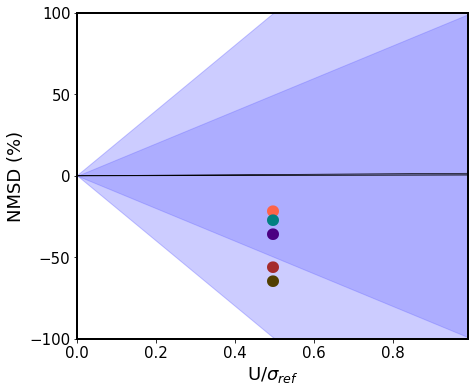

In [627]:
Y_Test=[i for i in np.arange(0,1,0.01)]
fig= plt.figure(figsize=(7,6))
ax = fig.add_subplot(111)
y1=-200*np.array(Y_Test)
y2=200*np.array(Y_Test)
y3=-100*np.array(Y_Test)
y4=100*np.array(Y_Test)
#plt.text(U_d_LAB_O3,NMSD_LAB_O3 , '•', rotation=90, va='center',fontsize = 40, color='blue')
plt.text(U_d_LR_O3,NMSD_LR_O3 , '•', rotation=90, va='center',fontsize = 40, color='#513e00')
plt.text(U_d_SVR_O3,NMSD_SVR_O3, '•', rotation=90, va='center',fontsize = 40, color='brown')
plt.text(U_d_RF_O3,NMSD_RF_O3, '•', rotation=90, va='center',fontsize = 40, color='indigo')
plt.text(U_d_ANN_O3,NMSD_ANN_O3, '•', rotation=90, va='center',fontsize = 40, color='tomato')
plt.text(U_d_XGB_O3,NMSD_XGB_O3, '•', rotation=90, va='center',fontsize = 40, color='teal')
plt.scatter(10,10,color='blue',s=100)
plt.scatter(10,10,color='#513e00',s=100)
plt.scatter(10,10,color='brown',s=100)
plt.scatter(10,10,color='indigo',s=100)
plt.scatter(10,10,color='tomato',s=100)
plt.scatter(10,10,color='teal',s=100)
#plt.legend(['LAB','LR','SVR','RF','ANN','XGBoost'],loc =2, bbox_to_anchor = (0,0.83), fontsize=15)
plt.plot(np.array(Y_Test),1.5*np.array(Y_Test),c ="black",linewidth=0.7)
plt.plot(np.array(Y_Test),0.5*np.array(Y_Test),c ="black",linewidth=1)
plt.fill_between(np.array(Y_Test), y1, y2, color='blue', alpha=0.2)
plt.fill_between(np.array(Y_Test), y3, y4, color='blue', alpha=0.15)
ax.set_ylim(bottom=0)
ax.set_xlim(left=0)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.show
plt.xlim(0,0.99)
plt.ylim(-100,100)
plt.xticks(np.arange(0,1, step=0.2))
plt.yticks(np.arange(-100,101, step=50))
plt.setp(ax.spines.values(), linewidth=2)
plt.xlabel('U/'+r'$σ_{ref}$',fontsize=18)
plt.ylabel('NMSD (%)',fontsize=18)
plt.savefig("MPC3_N3_10.pdf",format="pdf", bbox_inches="tight", dpi=1000)
plt.show()

# R_MPC

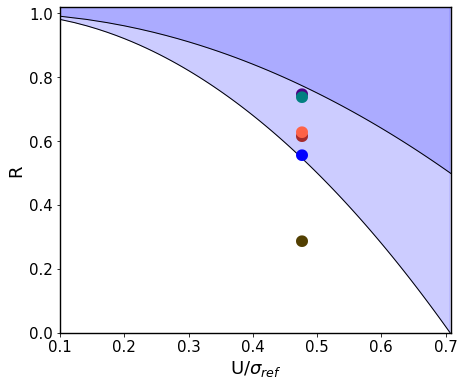

In [628]:
import matplotlib.pyplot as plt
import numpy as np
fig= plt.figure(figsize=(7,6))
ax = fig.add_subplot(111)
R=np.array([i for i in np.arange(0,1,0.01)])
x=np.sqrt((1-R)/2)
x2=np.sqrt((1-R))
plt.text(U_d_LAB_O3,R_LAB_O3 , '•', rotation=90, va='center',fontsize = 40, color='blue')
plt.text(U_d_LR_O3,R_LR_O3 , '•', rotation=90, va='center',fontsize = 40, color='#513e00')
plt.text(U_d_SVR_O3,R_SVR_O3, '•', rotation=90, va='center',fontsize = 40, color='brown')
plt.text(U_d_RF_O3,R_RF_O3, '•', rotation=90, va='center',fontsize = 40, color='indigo')
plt.text(U_d_ANN_O3,R_ANN_O3, '•', rotation=90, va='center',fontsize = 40, color='tomato')
plt.text(U_d_XGB_O3,R_XGB_O3, '•', rotation=90, va='center',fontsize = 40, color='teal')
plt.scatter(10,10,color='blue',s=100)
plt.scatter(10,10,color='#513e00',s=100)
plt.scatter(10,10,color='brown',s=100)
plt.scatter(10,10,color='indigo',s=100)
plt.scatter(10,10,color='tomato',s=100)
plt.scatter(10,10,color='teal',s=100)
#plt.legend(['LAB','LR','SVR','RF','ANN','XGBoost'],loc =2, bbox_to_anchor = (0,0.83), fontsize=15)
plt.plot(x,R, color='black', linewidth=1)
plt.plot(x2,R, color='black', linewidth=1)
ax.set_ylim(bottom=0)
ax.set_ylim(top=1.02)
ax.set_xlim(left=0.1)
ax.set_xlim(right=0.708)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.xlabel('U/'+r'$σ_{ref}$',fontsize=18)
plt.ylabel('R',fontsize=18)
ax.fill_between(x, R, 1.3, color='blue', alpha=.2)
ax.fill_between(x2, R, 1.3, color='blue', alpha=.16)
plt.setp(ax.spines.values(), linewidth=1.4)
plt.savefig("MPC4_N3_10_C.pdf", format="pdf", bbox_inches="tight")
plt.show()

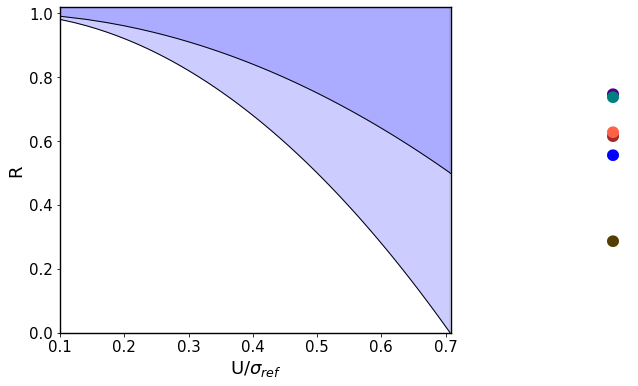

In [629]:
import matplotlib.pyplot as plt
import numpy as np
fig= plt.figure(figsize=(7,6))
ax = fig.add_subplot(111)
R=np.array([i for i in np.arange(0,1,0.01)])
x=np.sqrt((1-R)/2)
x2=np.sqrt((1-R))
plt.text(U_d_LAB1_O3,R_LAB_O3 , '•', rotation=90, va='center',fontsize = 40, color='blue')
plt.text(U_d_LR1_O3,R_LR_O3 , '•', rotation=90, va='center',fontsize = 40, color='#513e00')
plt.text(U_d_SVR1_O3,R_SVR_O3, '•', rotation=90, va='center',fontsize = 40, color='brown')
plt.text(U_d_RF1_O3,R_RF_O3, '•', rotation=90, va='center',fontsize = 40, color='indigo')
plt.text(U_d_ANN1_O3,R_ANN_O3, '•', rotation=90, va='center',fontsize = 40, color='tomato')
plt.text(U_d_XGB1_O3,R_XGB_O3, '•', rotation=90, va='center',fontsize = 40, color='teal')
plt.scatter(10,10,color='blue',s=100)
plt.scatter(10,10,color='#513e00',s=100)
plt.scatter(10,10,color='brown',s=100)
plt.scatter(10,10,color='indigo',s=100)
plt.scatter(10,10,color='tomato',s=100)
plt.scatter(10,10,color='teal',s=100)
#plt.legend(['LAB','LR','SVR','RF','ANN','XGBoost'],loc =2, bbox_to_anchor = (0,0.83), fontsize=13)
plt.plot(x,R, color='black', linewidth=1)
plt.plot(x2,R, color='black', linewidth=1)
ax.set_ylim(bottom=0)
ax.set_ylim(top=1.02)
ax.set_xlim(left=0.1)
ax.set_xlim(right=0.708)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.xlabel('U/'+r'$σ_{ref}$',fontsize=18)
plt.ylabel('R',fontsize=18)
ax.fill_between(x, R, 1.3, color='blue', alpha=.2)
ax.fill_between(x2, R, 1.3, color='blue', alpha=.16)
plt.setp(ax.spines.values(), linewidth=1.4)
plt.savefig("MPC4_N3_10_V.pdf", format="pdf", bbox_inches="tight")
plt.show()

In [630]:
Bias_CO=[b_LAB_CO,b_LR_CO,b_SVR_CO,b_RF_CO,b_ANN_CO,b_XGB_CO]
Bias_NO2=[b_LAB_NO2,b_LR_NO2,b_SVR_NO2,b_RF_NO2,b_ANN_NO2,b_XGB_NO2]
Bias_SO2=[b_LAB_SO2,b_LR_SO2,b_SVR_SO2,b_RF_SO2,b_ANN_SO2,b_XGB_SO2]
Bias_O3=[b_LAB_O3,b_LR_O3,b_SVR_O3,b_RF_O3,b_ANN_O3,b_XGB_O3]
Bias_CO

[52.0, 41.0, 40.0, 37.0, 40.0, 39.0]

In [631]:
precision_CO=[p_LAB_CO,p_LR_CO,p_SVR_CO,p_RF_CO,p_ANN_CO,p_XGB_CO]
precision_NO2=[p_LAB_NO2,p_LR_NO2,p_SVR_NO2,p_RF_NO2,p_ANN_NO2,p_XGB_NO2]
precision_SO2=[p_LAB_SO2,p_LR_SO2,p_SVR_SO2,p_RF_SO2,p_ANN_SO2,p_XGB_SO2]
precision_O3=[p_LAB_O3,p_LR_O3,p_SVR_O3,p_RF_O3,p_ANN_O3,p_XGB_O3]
precision_SO2

[43.0, 37.0, 35.0, 27.0, 27.0, 30.0]

<ipython-input-632-08ac6721ea4c>:13: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



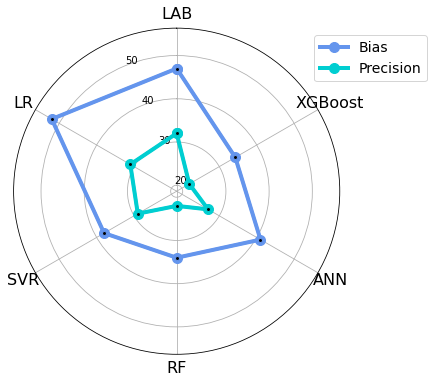

In [632]:
import matplotlib.pyplot as plt
import numpy as np
B=Bias_O3
C=precision_O3

A=[[B[i],C[i]] for i in range (6)]
import pandas as pd

df= pd.DataFrame (A, columns=['Bias','Precision'])

def plot_polar(df, error_alpha=0):
    # add last row to complete cycle (otherwise plot lines don't connect)
    df = df.append(df.iloc[0, :])
    B=df['Bias'].to_list()
    #convert index to radians
    radians = np.linspace(0, 2 * np.pi, num=6, endpoint=False)
    df.index = [radians[day] for day in df.index]
    plt.figure(figsize=(6, 6))
    ax = plt.axes(polar=True)
    ax.set_theta_zero_location('N')
    # Set up labels
    ax.set_xticks(radians)
    ax.set_rticks([10,20,30,40,50,60,70])
    ax.set_rautorange=True
    ax.set_xticklabels(['LAB', 'LR', 'SVR', 'RF', 'ANN','XGBoost'], size=16)

    m1=df.plot(ax=ax,color=['#6495ED','#00CED1'], lw=4,marker="o",markersize=10,)
    m2=df.plot(ax=ax,color=['#6495ED','#00CED1'], lw=3,marker="o",markersize=4,
               markerfacecolor='black')#k'
    colors=['#00CED1' for i in range(5)]
    radii = 10 * np.random.rand(5)
    
    #ax.bar(radians, radii, width=width, bottom=0.0, color=colors, alpha=0.5)
    # need to lookup line color for shaded error region
    line_colors = {line.get_label(): line.get_color() for line in ax.get_lines()}
    def plot_errors(series):
        sem = series.sem()
        ax.fill_between(np.append(radians, 0), 
                        series - sem, series + sem,
                        color=line_colors[series.name], alpha=error_alpha)
    df.apply(plot_errors)
    ax.legend(['Bias','Precision'],loc=2,bbox_to_anchor = (0.9,1), fontsize=14)
    #ax.get_legend().remove()
    ax.grid(True)
    #plt.text(0.43*np.pi,24 , '10')
    plt.savefig("BP_CO_OPC.pdf", format="pdf",bbox_inches="tight",dpi=1000)
plot_polar(df, error_alpha=0)

In [633]:
import numpy as np
import plotly.graph_objects as go
import plotly.express as px
r, theta = np.mgrid[0.1:1:6j, 0:360:2j]
# %%
T = np.linspace(0,100,6)
#T=np.array([0,10,25,30,50,70])


color = np.ones(r.shape) * T[:,np.newaxis]
fig = go.Figure(go.Barpolar(
    r=r.ravel(),
    theta=theta.ravel(),
    marker_color=color.ravel(),
    marker={"showscale": True,
            "colorscale": px.colors.sequential.Oranges   ,},
    opacity=0.5))



margin =10
fig.update_layout(
    showlegend=True,
    paper_bgcolor="white",
    plot_bgcolor='white',
    polar=dict(
        #radialaxis_layer="above traces",
        angularaxis_direction="clockwise",
        angularaxis_color="black",
        angularaxis_dtick=60,
        angularaxis_showgrid=True,
        radialaxis_showgrid=True,
        radialaxis_showline=False,
        angularaxis_gridcolor='black',
        angularaxis_gridwidth=1.5,
        radialaxis_tickvals=[],  # Radii ticks
        bargap=0,  # Ensure cells will touch
        hole=0,  # Center gap
    ),

)
fig.write_image("BP_CO3_OPC.pdf")
fig.show()

In [634]:
R125=R1_data[['Sen_2.5','Ref_2.5','T','RH','Month','Day_of_week','Hour']]
R110=R1_data[['Sen_10','Ref_10','T','RH','Month','Day_of_week','Hour']]
N325=N3_data[['Sen_2.5','Ref_2.5','T','RH','Month','Day_of_week','Hour']]
N310=N3_data[['Sen_10','Ref_10','T','RH','Month','Day_of_week','Hour']]

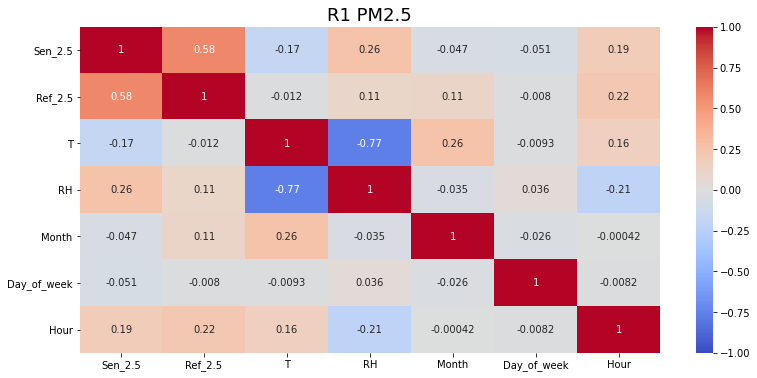

In [635]:
import matplotlib.pyplot as plt
import seaborn as sns
fig= plt.figure(figsize=(13,6))
sns.heatmap(R125.corr(), annot = True, vmin=-1, vmax=1, 
            center= 0, cmap= 'coolwarm')
plt.title('R1 PM2.5',fontsize=18)
plt.savefig("Corr_R125.pdf", format="pdf",bbox_inches="tight",dpi=1000)

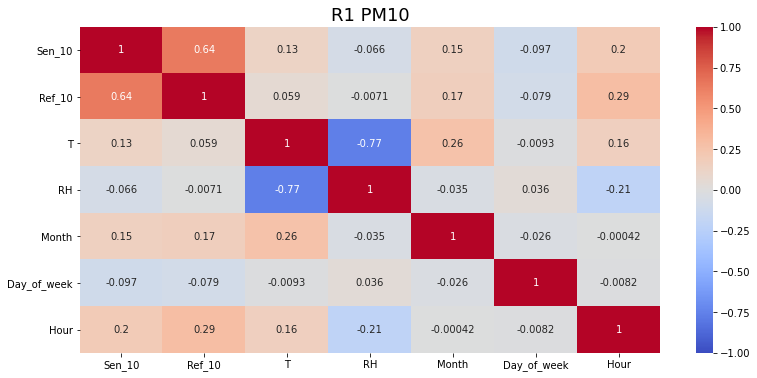

In [636]:
import matplotlib.pyplot as plt
import seaborn as sns
fig= plt.figure(figsize=(13,6))
sns.heatmap(R110.corr(), annot = True, vmin=-1, vmax=1, 
            center= 0, cmap= 'coolwarm')
plt.title('R1 PM10',fontsize=18)
plt.savefig("Corr_R110.pdf", format="pdf",bbox_inches="tight",dpi=1000)

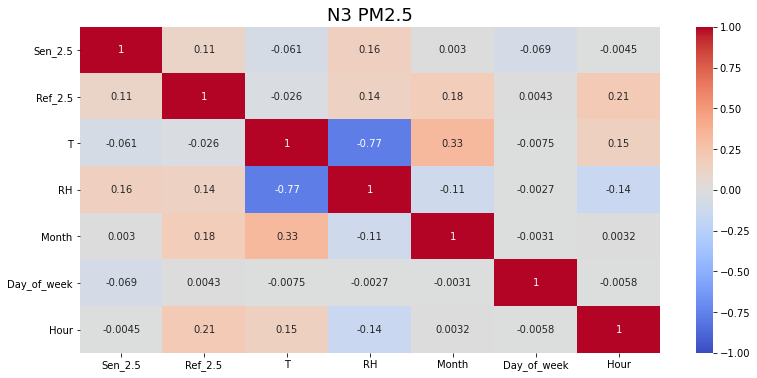

In [637]:
import matplotlib.pyplot as plt
import seaborn as sns
fig= plt.figure(figsize=(13,6))
sns.heatmap(N325.corr(), annot = True, vmin=-1, vmax=1, 
            center= 0, cmap= 'coolwarm')
plt.title('N3 PM2.5',fontsize=18)
plt.savefig("Corr_N325.pdf", format="pdf",bbox_inches="tight",dpi=1000)

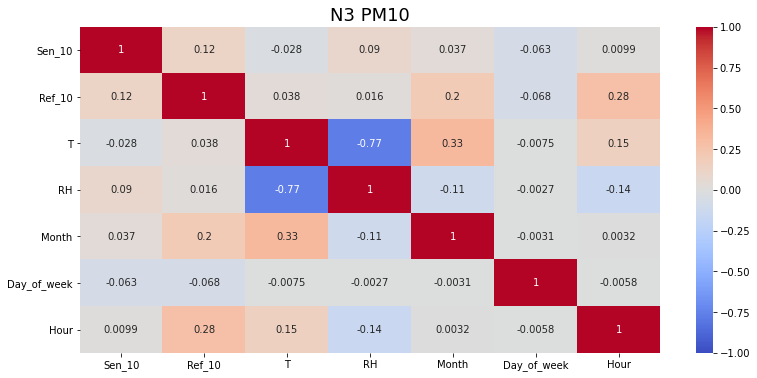

In [638]:
import matplotlib.pyplot as plt
import seaborn as sns
fig= plt.figure(figsize=(13,6))
sns.heatmap(N310.corr(), annot = True, vmin=-1, vmax=1, 
            center= 0, cmap= 'coolwarm')
plt.title('N3 PM10',fontsize=18)
plt.savefig("Corr_N310.pdf", format="pdf",bbox_inches="tight",dpi=1000)

In [1]:
import pandas as pd
import numpy as np
R1_data= pd.read_csv('R1_data.csv')
R1_data.columns=['Sen_2.5','Sen_10','Ref_2.5','Ref_10','Time','T','RH']
R1_data=R1_data.dropna()
Time=R1_data['Time'].to_list()
time=[]
for i in range(len(Time)):
    time.append(float(abs(Time[i])))
Time=np.array(time)
Date=pd.to_datetime(Time-719529,unit='d').round('s')
R1_data['Date'] = Date.tolist()
R1_data=R1_data.set_index('Date')
R1_data.drop('Time',axis = 1, inplace = True)
R1_data['Month']=R1_data.index.month
R1_data['Day_of_week']=R1_data.index.dayofweek
R1_data['Hour']=R1_data.index.hour
#R1_data=R1_data[R1_data['Sen_10'] <=700]
#R1_data=R1_data[R1_data['Sen_2.5'] <=300]
#R1_data=R1_data.resample('30min').mean()
#R1_data=R1_data.dropna()
R1_data.shape

(34896, 9)

In [2]:
B=[]

A=R1_data['Sen_10'].to_list()
for i in range(len(A)):
    if A[i]>500:
        B.append(i)

In [3]:
len(B)

25

In [4]:
import pandas as pd
import numpy as np
N3_data= pd.read_csv('N3_data.csv')
N3_data.columns=['Sen_2.5','Sen_10','Ref_2.5','Ref_10','Time','T','RH']
N3_data=N3_data.dropna()
Time=N3_data['Time'].to_list()
time=[]
for i in range(len(Time)):
    time.append(float(abs(Time[i])))
Time=np.array(time)
Date=pd.to_datetime(Time-719529,unit='d').round('s')
N3_data['Date'] = Date.tolist()
N3_data=N3_data.set_index('Date')
N3_data.drop('Time',axis = 1, inplace = True)
N3_data['Month']=N3_data.index.month
N3_data['Day_of_week']=N3_data.index.dayofweek
N3_data['Hour']=N3_data.index.hour
#N3_data=N3_data[N3_data['Sen_10'] <=700]
#N3_data=N3_data[N3_data['Sen_2.5'] <=300]
#N3_data=N3_data.resample('30min').mean()
#N3_data=N3_data.dropna()
N3_data.shape

(43427, 9)

In [5]:
lab=N3_data['Sen_10'].to_list()
Ref=N3_data['Ref_10'].to_list()
Pearson_2=round(np.corrcoef(Ref,lab)[0, 1],2)
Pearson_2

0.12

In [6]:
from sktime.performance_metrics.forecasting import sMAPE, smape_loss
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error as mae
import sklearn.metrics as sm
import matplotlib.pyplot as plt
X=R1_data[['Sen_10','T','RH','Month','Day_of_week','Hour']]#,'T','RH','Month','Day_of_week','Hour'
y=R1_data['Ref_10']
X_train, X_test, y_train, y_test =train_test_split(X, y, test_size = 0.2,shuffle=True)

In [7]:
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
  
 # create regressor object
regressor = RandomForestRegressor(n_estimators = 500,min_samples_split= 2,min_samples_leaf= 1,max_features= 'sqrt', 
                                  random_state = 0,max_depth=None,bootstrap=False)
  
  
# fit the regressor with x and y data
regressor=regressor.fit(X_train, y_train)
pred =regressor.predict(X_test)

In [ ]:
import shap
explainer = shap.Explainer(regressor)
shap_values = explainer(X_train)

In [ ]:
shap.summary_plot(shap_values, X, plot_type="bar")

from keras.models import Sequential
from keras.layers import Dense
from keras import optimizers
from sklearn.preprocessing import StandardScaler
model = Sequential()
model.add(Dense(3, input_shape = (1,),kernel_initializer='normal', activation= 'linear'))
model.add(Dense(128,kernel_initializer='normal', activation= 'relu'))
model.add(Dense(128, kernel_initializer='normal',activation= 'relu'))
model.add(Dense(100, kernel_initializer='normal',activation= 'relu'))
model.add(Dense(1,kernel_initializer='normal',activation='linear',))
sgd = optimizers.Adam(learning_rate=0.01)

model.compile(optimizer = sgd, loss = 'mean_squared_error', metrics= ['mse', 'mae'])
scaler = StandardScaler()
scaler.fit(X_train)
X_train_scaled=scaler.transform(X_train)
X_test_scaled=scaler.transform(X_test)
hist=model.fit(X_train_scaled, y_train, batch_size= 10, epochs=20, verbose= 1)#,validation_split=0.2
train_pred = model.predict(X_train_scaled)
test_pred = model.predict(X_test_scaled)
pred=[]
for i in range(len(test_pred)):
    pred.append(sum(list(test_pred[i])))

from xgboost import  XGBRegressor
from numpy import absolute
from pandas import read_csv
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedKFold
# create an xgboost regression model
#n_estimators=10000, max_depth=5, eta=0.01, subsample=0.9,colsample_bytree=0.4,alpha=10
model = XGBRegressor(n_estimators=10000, max_depth=5, eta=0.01, subsample=0.9, 
                     colsample_bytree=0.4,alpha=10)
model.fit(X_train, y_train)
pred = model.predict(X_test)

from sklearn.linear_model import LinearRegression
lr = LinearRegression()
model = lr.fit(X_train, y_train)
pred = model.predict(X_test)

from sklearn.svm import SVR
from sklearn.preprocessing import StandardScaler
regressor = SVR(kernel = 'linear', C=1,epsilon=1)
regressor.fit(X_train, y_train)
pred = regressor.predict(X_test)

In [27]:
Pearson_2=round(np.corrcoef(y_test, pred)[0, 1],2)
Pearson_2

0.97

In [28]:
SUB = str.maketrans("0123456789", "₀₁₂₃₄₅₆₇₈₉")
SUP = str.maketrans("0123456789", "⁰¹²³⁴⁵⁶⁷⁸⁹")

In [29]:
Y_test=[]
Y_test.append(min(y_test))
Y_test.append(max(y_test))

In [30]:
Y_test

[2.8073490000000003, 211.4777]

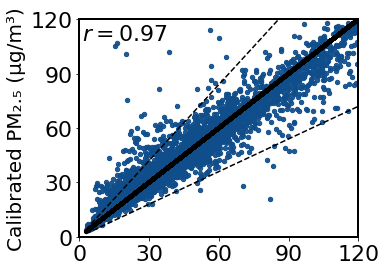

In [31]:
fig= plt.figure(figsize=(5,4))
ax = fig.add_subplot(111)
#ax.patch.set_facecolor('lightblue')
#ax.patch.set_alpha(0.3)
#m0, b0 = np.polyfit(np.array(y_test), np.array(lab1), 1)
#plt.plot(np.array(y_test), m0*np.array(y_test) + b0,color='#426eff',linewidth=4)
#m1, b1 = np.polyfit(np.array(y_test), np.array(pred_lr), 1)
#plt.plot(np.array(y_test), m1*np.array(y_test) + b1,color='#513e00',linewidth=4)
#m2, b2 = np.polyfit(np.array(y_test), np.array(pred_svr), 1)
#plt.plot(np.array(y_test), m2*np.array(y_test) + b2,color='brown',linewidth=4)
#m3, b3 = np.polyfit(np.array(y_test), np.array(pred_rf), 1)
#plt.plot(np.array(y_test), m3*np.array(y_test) + b3,color='indigo',linewidth=4)
#m4, b4 = np.polyfit(np.array(y_test), np.array(pred_ann), 1)
#plt.plot(np.array(y_test), m4*np.array(y_test) + b4,color='tomato',linewidth=4)
#m5, b5 = np.polyfit(np.array(y_test), np.array(pred_xgb), 1)
#plt.plot(np.array(y_test), m5*np.array(y_test) + b5,color='darkgoldenrod',linewidth=4)
#plt.scatter(np.array(y_test),np.array(lab1),color='teal',marker="$\\bigoplus$",s=10)
plt.scatter(np.array(y_test),np.array(pred),color='#104E8B',marker="$\\bigoplus$",s=20, alpha=0.9)
#plt.scatter(np.array(y_test),np.array(pred_lr),color='#513e00',marker='P')
#plt.scatter(np.array(y_test),np.array(pred_svr),color='brown',marker='d')
#plt.scatter(np.array(y_test),np.array(pred_rf),color='indigo',marker='*',s=30)
#plt.scatter(np.array(y_test),np.array(pred_ann),color='tomato',marker='s')
#plt.scatter(np.array(y_test),np.array(pred_xgb),color='darkgoldenrod',marker='1',s=15)
plt.plot(np.array(y_test),np.array(y_test), c ="black",linewidth=4)
plt.plot(np.array(Y_test),1.4*np.array(Y_test),c ="black",linestyle='dashed',linewidth=1.5)
plt.plot(np.array(Y_test),0.6*np.array(Y_test),c ="black",linestyle='dashed',linewidth=1.5)
#ax.spines['right'].set_visible(False)
#ax.spines['top'].set_visible(False)
ax.set_ylim(bottom=0)
ax.set_xlim(left=0)
#plt.xlabel('Reference PM2.5'.translate(SUB) +  ' (µg/m3)'.translate(SUP),fontsize=20)
plt.ylabel('Calibrated'+' PM2.5'.translate(SUB) +  ' (µg/m3)'.translate(SUP),fontsize=20)
#plt.legend(['1:1','N3','RF'
            #], loc = 2, bbox_to_anchor = (0,1),fontsize=12)
#plt.title('CO Sensor',fontsize=18 )
A=[Pearson_2]
#ax.text(1800, 2900, r'$ r=$'+str(A[0]), fontsize=13)
#ax.text(200, 2900, 'LAB', fontsize=17)
#plt.title(r'$ r=$'+str(A[0]))
          #,
          #fontsize=12)
#plt.grid(linestyle='-.',linewidth=0.1)
plt.xticks(fontsize=22)
plt.yticks(fontsize=22)
plt.show
plt.xlim(0, 120)
plt.ylim(0, 120)
#plt.xticks(np.arange(0,2.9, step=1))
plt.xticks(np.arange(0,121, step=30))
plt.yticks(np.arange(0,121, step=30))
plt.show
textstr = r'$r=%.2f$' % (Pearson_2,)
#textstr = '\n'.join(('RF',r'$r=%.2f$' % (A[0], ) ))

props = dict(boxstyle='round', facecolor='white', alpha=1)

#place a text box in upper left in axes coords
ax.text(0.01, 0.98, textstr, transform=ax.transAxes, fontsize=22,
        verticalalignment='top')

plt.setp(ax.spines.values(), linewidth=2)
plt.savefig("fig10a.pdf",format="pdf", bbox_inches="tight", dpi=1000)
#plt.savefig("fig4d.pdf", format="pdf", bbox_inches="tight")
plt.show()

In [32]:
Data=[[pred[i], y_test[i]] for i in range(len(y_test))]
Data=pd.DataFrame(data=Data, columns=['LCS','Ref'])
Data.to_excel('Data_ALL.xlsx')

In [33]:
err=(np.array(pred)-np.array(y_test))/np.array(y_test)
err1=[]
err2=[]
y_test1=[]
y_test2=[]
for i in range(len(err)):
    if err[i]>=-0.4 and err[i]<=0.4:
        err1.append(err[i])
        y_test1.append(y_test[i])
    else:
        err2.append(err[i])
        y_test2.append(y_test[i])
Err_rf=np.round((len(err1)/len(err))*100)
Err_rf

96.0

In [34]:
FI=regressor.feature_importances_
FI=np.round(FI*100)
FI

array([49., 11., 10.,  6.,  5., 18.])

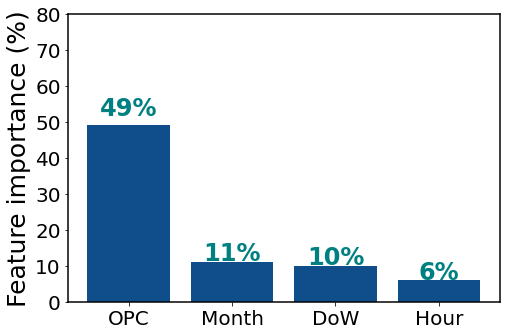

In [35]:
import matplotlib.pyplot as plt
fig = plt.figure()
ax = fig.add_axes([0,0,1,1])
langs = ['OPC','Month','DoW','Hour']#,'Month','DoW','Hour'
students = [int(FI[0]),int(FI[1]),int(FI[2]),int(FI[3])]#,int(FI[3]),int(FI[4]),int(FI[5])
graph=ax.bar(langs,students, color='#104E8B')
i = 0
for p in graph:
    width = p.get_width()
    height = p.get_height()
    x, y = p.get_xy()
    plt.text(x+width/2,
             y+height*1.06,
             str(students[i])+'%',
             ha='center',
             weight='bold',fontsize=24, color='teal')
    i+=1
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.yticks(np.arange(0,81, step=10))
plt.ylabel('Feature importance (%)', fontsize=25)
plt.setp(ax.spines.values(), linewidth=1.5)
#plt.title(r"$O_3$",fontsize=18)
plt.savefig("fig6e.pdf", format="pdf", bbox_inches="tight")
plt.show()

import matplotlib.pyplot as plt
fig = plt.figure(figsize=(5,4))
ax = fig.add_axes([0,0,1,1])
langs = ['R1 Conc.','Month','DoW','Hour']
students = [int(FI[0]),int(FI[1]),int(FI[2]),int(FI[3])]#,int(FI[3]),int(FI[4]),int(FI[5])
graph=ax.bar(langs,students, color='#104E8B')
i = 0
for p in graph:
    width = p.get_width()
    height = p.get_height()
    x, y = p.get_xy()
    plt.text(x+width/2,
             y+height+1.5,
             str(students[i])+'%',
             ha='center',
             weight='bold',fontsize=24, color='teal')
    i+=1
plt.xticks(fontsize=22)
plt.yticks(fontsize=22)
plt.yticks(np.arange(0,71, step=10))
plt.ylabel('Feature importance (%)', fontsize=26)
#plt.title(r"$O_3$",fontsize=18)
plt.setp(ax.spines.values(), linewidth=2)
plt.savefig("fig3c.pdf", format="pdf", bbox_inches="tight")
plt.show()

from sklearn.svm import SVR
from sklearn.preprocessing import StandardScaler
regressor = SVR(kernel = 'rbf', C=1,epsilon=0.1)
regressor.fit(X_train, y_train)
pred = regressor.predict(X_test)

lab1=X_test['Sen_2.5'].to_list()

import statsmodels.api as sm
X=lab1
Y=y_test
X = sm.add_constant(X) # adding a constant

model = sm.OLS(Y, X).fit()
pred = model.predict(X)

Pearson_2=round(np.corrcoef(y_test, pred)[0, 1],2)
Pearson_2

import sklearn.metrics as sm
R2=round(sm.r2_score(y_test, pred), 2)
R2

In [36]:
Pearson_2=round(np.corrcoef(y_test, pred)[0, 1],2)
Pearson_2

0.97

In [52]:
def REF10(pred,y_test,alpha):
    import random
    cal=np.array(pred)
    ref=np.array(y_test.to_list())
    ref_mean=np.mean(ref)
    cal_mean=np.mean(cal)
    prec=np.array([20 for i in range(len(ref))])
    u=np.maximum(prec,0.1*ref)
    u=0.01*ref
    #cal=np.log(cal)
    #ref=np.log(ref)
    sx_s=(1/len(ref))*sum((ref-ref_mean)**2)
    sy_s=(1/len(cal))*sum((cal-cal_mean)**2)
    sxy=(1/len(cal))*sum((cal-cal_mean)*(ref-ref_mean))
    beta_1=((sy_s-alpha*sx_s)+np.sqrt((sy_s-sx_s)**2+4*alpha*sxy**2))/(2*sxy)
    beta_0=cal_mean-beta_1*ref_mean
    RSS=sum((cal-beta_0-beta_1*ref)**2-(beta_1**2+alpha)*u**2)
    du_s=RSS/(len(cal)-2)
    Beta_1=((sy_s-alpha*sx_s-du_s)+np.sqrt((sy_s-alpha*sx_s-du_s)**2+4*alpha*sxy**2))/(2*sxy)
    Beta_0=cal_mean-Beta_1*ref_mean
    P1=(RSS/(len(cal)-2))
    P2=(Beta_1**2+alpha)*u**2+(-2*Beta_1**2+2*Beta_1-1)*u**2
    P2=u**2
    P3=(Beta_0+(Beta_1-1)*ref)**2
    P=[]
    for i in range(len(P3)):
        P.append(P1+P2[i]+P3[i])
    for i in range(len(P)):
        if P[i]<0:
            P[i]=random.randint(1,100)
    u_cal=np.sqrt(np.array(P))
    #u_cal=((2*np.sqrt((RSS/(len(cal)-2))+(1-(beta_1-1)**2)*(0.08*ref)**2+(Beta_0+(Beta_1-1)*ref)**2))/cal)*100
    return u_cal 

In [53]:
u_cal_s=((REF10(pred,y_test,1)))**2
u_cal_s

y=(y_test)**2
y=np.array(y).reshape(-1,1)
import numpy as np
from sklearn.linear_model import LinearRegression
model = LinearRegression()
model.fit(y,u_cal_s)
model.coef_,model.intercept_

(array([0.00410934]), 42.35290415112877)

# DATA

# CO CALIBRATION

In [1]:
import pandas as pd
Ref=pd.read_csv('Ref.csv')
Ref["CO"] = 1000 * Ref["CO"]
Ref['Date'] = pd.to_datetime(Ref['Date_Time'])
Ref=Ref.set_index('Date')
Ref.drop('Date_Time',axis = 1, inplace = True)
Ref=Ref.resample('5min').mean()
Ref=Ref[76463:137376]
Ref_CO=Ref['CO'].to_list()
Ref_NO2=Ref['NO2'].to_list()
Ref_SO2=Ref['SO2'].to_list()
Ref_O3=Ref['O3'].to_list()

In [2]:
import random
import pandas as pd
import scipy.io
import numpy as np
data = pd.read_csv('CO.txt', header = None,low_memory=False)
data.columns=['WE','AE','Temp','RH','Time']
Time=data['Time'].to_list()
time=[]
for i in range(len(Time)):
    time.append(float(abs(Time[i])))
Time=np.array(time)
Date=pd.to_datetime(Time-719529,unit='d').round('s')
data['Date'] = Date.tolist()
data=data.set_index('Date')
data.drop('Time',axis = 1, inplace = True)
data=data.resample('5min').mean()
Data_CO=data
Data_CO['Ref']=Ref_CO
index_names = Data_CO[ (Data_CO['WE'] >1000)].index
#Data_CO.drop(index_names, inplace = True)
WE=Data_CO['WE'].to_list()
AE=Data_CO['AE'].to_list()
signal=np.array(WE)-np.array(AE)
Data_CO['Net Signal']=signal
Data_CO['Month']=Data_CO.index.month
Data_CO['Day_of_week']=Data_CO.index.dayofweek
Data_CO['Day']=Data_CO.index.day
Data_CO['Hour']=Data_CO.index.hour
CO_Data=Data_CO
CO_Data=CO_Data[(CO_Data[CO_Data.columns] >= 0).all(axis=1)]
CO_Data=CO_Data.dropna()
data = pd.read_csv('Conc_CO.txt', header = None,low_memory=False)
data.columns=['Lab1','Temp','RH','Time','Ref']
Time=data['Time'].to_list()
time=[]
for i in range(len(Time)):
    time.append(float(abs(Time[i])))
Time=np.array(time)
Date=pd.to_datetime(Time-719529,unit='d').round('s')
data['Date'] = Date.tolist()
data=data.set_index('Date')
data.drop('Time',axis = 1, inplace = True)
data=data.resample('5min').mean()
Data_CO=data
#Data_CO.drop(index_names, inplace = True)
signal=np.array(WE)-np.array(AE)
Data_CO['Net Signal']=signal
Data_CO['Month']=Data_CO.index.month
Data_CO['Day_of_week']=Data_CO.index.dayofweek
Data_CO['Day']=Data_CO.index.day
Data_CO['Hour']=Data_CO.index.hour
CO_Data=Data_CO
CO_Data=CO_Data[(CO_Data[CO_Data.columns] >= 0).all(axis=1)]
CO_Data=CO_Data.dropna()
CO_Data=CO_Data.sample(frac=1)

In [3]:
CO_Data=CO_Data.resample('20min').mean()
CO_Data=CO_Data.dropna()
CO_Data.head()

,Lab1,Temp,RH,Ref,Net Signal,Month,Day_of_week,Day,Hour
Date,,,,,,,,,
2019-10-02 11:40:00,3571.592599,26.378438,58.063437,312.707200,984.426875,10.0,2.0,2.0,11.0
2019-10-02 12:00:00,3108.940622,25.632544,48.527009,188.164925,900.879534,10.0,2.0,2.0,12.0
2019-10-02 12:20:00,2614.641410,25.811435,53.792695,269.273025,746.248697,10.0,2.0,2.0,12.0
2019-10-02 15:40:00,3313.026561,30.623188,49.580620,259.460975,914.638179,10.0,2.0,2.0,15.0
2019-10-03 15:40:00,535.086842,29.421250,52.411845,341.897275,152.440810,10.0,3.0,3.0,15.0


In [4]:
#Ref=CO_Data['Ref'].to_list()
#CO_Data=CO_Data[CO_Data.Ref.between(np.mean(Ref)-0.7*np.std(Ref), np.mean(Ref)+0.7*np.std(Ref))]
#CO_Data.shape

In [5]:
sub= str.maketrans("0123456789", "₀₁₂₃₄₅₆₇₈₉")

In [6]:
print('O2'.translate(sub))

O₂


In [7]:
print(r'$O_{2}$')

$O_{2}$


In [8]:
import pandas as pd
import numpy as np
R1_data= pd.read_csv('R1_data.csv')
R1_data.columns=['Sen_2.5','Sen_10','Ref_2.5','Ref_10','Time','T','RH']
R1_data=R1_data.dropna()
Time=R1_data['Time'].to_list()
time=[]
for i in range(len(Time)):
    time.append(float(abs(Time[i])))
Time=np.array(time)
Date=pd.to_datetime(Time-719529,unit='d').round('s')
R1_data['Date'] = Date.tolist()
R1_data=R1_data.set_index('Date')
R1_data.drop('Time',axis = 1, inplace = True)
R1_data['Month']=R1_data.index.month
R1_data['Day_of_week']=R1_data.index.dayofweek
R1_data['Hour']=R1_data.index.hour
R1_data=R1_data.resample('10min').mean()
R1_data=R1_data.dropna()
R1_data.head()

,Sen_2.5,Sen_10,Ref_2.5,Ref_10,T,RH,Month,Day_of_week,Hour
Date,,,,,,,,,
2019-10-02 11:50:00,112.477418,112.477418,18.583300,32.754810,26.378438,58.063437,10.0,2.0,11.0
2019-10-02 12:10:00,9.696690,40.138927,17.201155,31.342380,25.652438,48.442262,10.0,2.0,12.0
2019-10-02 12:20:00,68.966260,81.577428,16.845975,30.682855,25.813062,53.801740,10.0,2.0,12.0
2019-10-02 15:40:00,7.471156,44.234396,19.076640,35.864505,30.589409,49.682787,10.0,2.0,15.0
2019-10-03 15:50:00,9.744537,144.047407,17.341335,29.977575,29.364176,52.513747,10.0,3.0,15.0


In [9]:
import pandas as pd
import numpy as np
N3_data= pd.read_csv('N3_data.csv')
N3_data.columns=['Sen_2.5','Sen_10','Ref_2.5','Ref_10','Time','T','RH']
N3_data=N3_data.dropna()
Time=N3_data['Time'].to_list()
time=[]
for i in range(len(Time)):
    time.append(float(abs(Time[i])))
Time=np.array(time)
Date=pd.to_datetime(Time-719529,unit='d').round('s')
N3_data['Date'] = Date.tolist()
N3_data=N3_data.set_index('Date')
N3_data.drop('Time',axis = 1, inplace = True)
N3_data['Month']=N3_data.index.month
N3_data['Day_of_week']=N3_data.index.dayofweek
N3_data['Hour']=N3_data.index.hour
N3_data=N3_data.resample('10min').mean()
N3_data=N3_data.dropna()
N3_data.head()

,Sen_2.5,Sen_10,Ref_2.5,Ref_10,T,RH,Month,Day_of_week,Hour
Date,,,,,,,,,
2019-10-02 12:00:00,7.972913,17.284141,17.700490,31.956415,24.827483,64.382667,10.0,2.0,12.0
2019-10-02 12:10:00,4.448633,10.763524,17.201155,31.342380,25.074930,54.874831,10.0,2.0,12.0
2019-10-02 12:20:00,3.378485,17.141379,17.062410,31.074470,25.445921,54.380000,10.0,2.0,12.0
2019-10-02 15:40:00,4.223667,13.522096,19.076640,35.864505,30.180843,55.684552,10.0,2.0,15.0
2019-10-02 15:50:00,4.301400,16.168827,19.210635,34.961880,30.316215,55.095438,10.0,2.0,15.0


# Outlier detection and removal

In [10]:
import numpy as np

import pandas as pd   
import seaborn as sns
from scipy import stats

((11151, 9), (11610, 9))

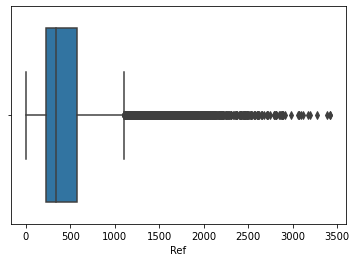

In [11]:
sns.boxplot(x=CO_Data['Ref'])
z=np.abs(stats.zscore(CO_Data))
CO_data=CO_Data[(z < 3).all(axis=1)]
CO_data.shape,CO_Data.shape

In [12]:
def MBE(true,pred):
    true=np.array(true)
    pred=np.array(pred)
    mbe=np.mean(true-pred)
    return mbe
def CRMSE(true,pred):
    true=np.array(true)
    pred=np.array(pred)
    crmse=np.sqrt(np.mean(((true-np.mean(true))-(pred-np.mean(pred)))**2))
    if np.std(pred)>np.std(true):
        crmse=crmse
    else:
        crmse=-crmse
    return crmse
import random

# Relative Expanded  Uncertainty(REU)

In [13]:
def REF(pred,y_test,alpha):
    import random
    cal=np.array(pred)
    ref=np.array(y_test.to_list())
    ref_mean=np.mean(ref)
    cal_mean=np.mean(cal)
    prec=np.array([20 for i in range(len(ref))])
    u=np.maximum(prec,0.001*ref)
    #cal=np.log(cal)
    #ref=np.log(ref)
    sx_s=(1/len(ref))*sum((ref-ref_mean)**2)
    sy_s=(1/len(cal))*sum((cal-cal_mean)**2)
    sxy=(1/len(cal))*sum((cal-cal_mean)*(ref-ref_mean))
    beta_1=((sy_s-alpha*sx_s)+np.sqrt((sy_s-sx_s)**2+4*alpha*sxy**2))/(2*sxy)
    beta_0=cal_mean-beta_1*ref_mean
    RSS=sum((cal-beta_0-beta_1*ref)**2-(beta_1**2+alpha)*u**2)
    du_s=RSS/(len(cal)-2)
    Beta_1=((sy_s-alpha*sx_s-du_s)+np.sqrt((sy_s-alpha*sx_s-du_s)**2+4*alpha*sxy**2))/(2*sxy)
    Beta_0=cal_mean-Beta_1*ref_mean
    P1=(RSS/(len(cal)-2))
    P2=(Beta_1**2+alpha)*u**2+(-2*Beta_1**2+2*Beta_1-1)*u**2
    P3=(Beta_0+(Beta_1-1)*ref)**2
    P=[]
    for i in range(len(P3)):
        P.append(P1+P2[i]+P3[i])
    for i in range(len(P)):
        if P[i]<0:
            P[i]=random.randint(1,100)
    u_cal=(2*np.sqrt(np.array(P))/cal)*100
    #u_cal=((2*np.sqrt((RSS/(len(cal)-2))+(1-(beta_1-1)**2)*(0.08*ref)**2+(Beta_0+(Beta_1-1)*ref)**2))/cal)*100
    return u_cal  

In [14]:
def REF2(pred,y_test,alpha,LV):
    import random
    cal=np.array(pred)
    ref=np.array(y_test.to_list())
    ref_mean=np.mean(ref)
    cal_mean=np.mean(cal)
    for i in range(len(ref)):
        if ref[i]==0:
            ref[i]=ref_mean
    prec=np.array([20 for i in range(len(ref))])
    u=0.001*ref
    #cal=np.log(cal)
    #ref=np.log(ref)
    sx_s=(1/len(ref))*sum((ref-ref_mean)**2)
    sy_s=(1/len(cal))*sum((cal-cal_mean)**2)
    sxy=(1/len(cal))*sum((cal-cal_mean)*(ref-ref_mean))
    #beta_1=((sy_s-sx_s)+np.sqrt((sy_s-sx_s)**2+4*sxy**2))/(2*sxy)
    beta_1=((sy_s-alpha*sx_s)+np.sqrt((sy_s-sx_s)**2+4*alpha*sxy**2))/(2*sxy)
    beta_0=cal_mean-beta_1*ref_mean
    RSS=sum((cal-beta_0-beta_1*ref)**2-(beta_1**2+alpha)*(0.001*LV)**2)
    du_s=RSS/(len(cal)-2)
    #Beta_1=((sy_s-sx_s-du_s)+np.sqrt((sy_s-sx_s-du_s)**2+4*sxy**2))/(2*sxy)
    Beta_1=((sy_s-alpha*sx_s-du_s)+np.sqrt((sy_s-alpha*sx_s-du_s)**2+4*alpha*sxy**2))/(2*sxy)
    Beta_0=cal_mean-Beta_1*ref_mean
    P1=(RSS/(len(cal)-2))
    P2=(Beta_1**2+alpha)*(0.001*LV)**2+(-2*Beta_1**2+2*Beta_1-1)*(0.001*LV)**2
    P3=(Beta_0+(Beta_1-1)*LV)**2
    P=P1+P2+P3
    if P<0:
        P=random.randint(1,100)
    u_cal=(2*np.sqrt(P)/(Beta_0+Beta_1*LV))*100
    #u_cal=((2*np.sqrt((RSS/(len(cal)-2))+(1-(beta_1-1)**2)*0.1+(Beta_0+(Beta_1-1)*ref)**2))/cal)*100
    return u_cal  

In [15]:
def target(pred,y_test,alpha):
    import random
    cal=np.array(pred)
    ref=np.array(y_test.to_list())
    ref_mean=np.mean(ref)
    cal_mean=np.mean(cal)
    prec=np.array([20 for i in range(len(ref))])
    u=np.maximum(prec, 0.001*ref)
    #u=0.01*ref
    #cal=np.log(cal)
    #ref=np.log(ref)
    sx_s=(1/len(ref))*sum((ref-ref_mean)**2)
    sy_s=(1/len(cal))*sum((cal-cal_mean)**2)
    sxy=(1/len(cal))*sum((cal-cal_mean)*(ref-ref_mean))
    #beta_1=((sy_s-sx_s)+np.sqrt((sy_s-sx_s)**2+4*sxy**2))/(2*sxy)
    beta_1=((sy_s-alpha*sx_s)+np.sqrt((sy_s-sx_s)**2+4*alpha*sxy**2))/(2*sxy)
    beta_0=cal_mean-beta_1*ref_mean
    RSS=sum((cal-beta_0-beta_1*ref)**2-(beta_1**2+alpha)*u**2)
    du_s=RSS/(len(cal)-2)
    #Beta_1=((sy_s-sx_s-du_s)+np.sqrt((sy_s-sx_s-du_s)**2+4*sxy**2))/(2*sxy)
    Beta_1=((sy_s-alpha*sx_s-du_s)+np.sqrt((sy_s-alpha*sx_s-du_s)**2+4*alpha*sxy**2))/(2*sxy)
    Beta_0=cal_mean-Beta_1*ref_mean
    P1=(RSS/(len(cal)-2))
    P2=(Beta_1**2+alpha)*u**2+(-2*Beta_1**2+2*Beta_1-1)*u**2
    P3=(Beta_0+(Beta_1-1)*ref)
    P=[]
    for i in range(len(P2)):
        P.append(P1+P2[i])
    for i in range(len(P)):
        if P[i]<0:
            P[i]=random.randint(1,50)
    A=(2*(np.array(P))**0.5/ref)*100
    #for i in range(len(P3)):
        #if P3[i]<0:
            #P3[i]=random.randint(0,50)
    B=(2*(np.array(P3))/ref)*100
    bias=[]
    random=[]
    Ref=[]
    part1=(Beta_0/ref)*100
    part=[beta_1-1 for i in range(len(ref))]
    part2=(np.array(part))*100
    PART1=[]
    PART2=[]
    for i in range(len(A)):
        if A[i]<500:
            random.append(A[i])
            bias.append(B[i])
            Ref.append(ref[i])
            PART1.append(part1[i])
            PART2.append(part2[i])
    return [random,bias,Ref, PART1,PART2]

In [16]:
from sklearn import linear_model
import numpy as np
Y=[20,40,60,80,100]
X=np.array([10,30,50,70,90]).reshape(-1, 1)

regr = linear_model.LinearRegression()
regr.fit(X, Y)
print('Intercept: \n', regr.intercept_)
print('Coefficients: \n', regr.coef_)

Intercept: 
 10.0
Coefficients: 
 [1.]


In [74]:
def target2(Y,X,u):
    from sklearn import linear_model
    import numpy as np
    x=np.array(Y).reshape(-1, 1)
    y=np.array(X).reshape(-1, 1)
    regr = linear_model.LinearRegression()
    regr.fit(x, y)
    b0=regr.intercept_
    b1=regr.coef_[0]
    RSS=sum((np.array(Y)-(b0[0]+b1[0]*np.array(X)))**2)
    RR=2*((RSS/((len(X)-2))-u**2)/np.array(X))**0.5
    RB=2*(b0/np.array(X)+(b1-1))
    return RR,RB

A=[200,360,288,290]
B=[204,336,267,301]
y=np.array(B).reshape(-1, 1)
RSS=sum((np.array(A)-(b0[0]+b1[0]*np.array(B)))**2)
RSS
RR=2*((RSS/((len(X)-2))-5**2)/np.array(X))**0.5
RR

x=np.array(A).reshape(-1, 1)
y=np.array(B).reshape(-1, 1)
regr = linear_model.LinearRegression()
regr.fit(x, y)
b0=regr.intercept_
b1=regr.coef_[0]
b0[0]
b1[0]

target2(A,B,5)

B=np.array([20,20])
A=np.array([1,30])
C=np.array([A,B])
np.maximum(A,B)

In [75]:
Ref=R1_data['Ref_2.5'].to_list()
#CO_Data=CO_Data[CO_Data.Ref.between(np.mean(Ref)-1*np.std(Ref), np.mean(Ref)+1*np.std(Ref))]
#NO2_Data.shape

In [76]:
import numpy as np 

x = np.quantile(Ref, [0,0.25,0.5,0.75,1])
CO_LQ=x[1]
CO_Mean=x[2]
CO_UQ=x[3]
CO_Max=x[4]
CO_LQ,CO_Mean,CO_UQ,CO_Max

(10.539464500000001, 17.316535000000002, 25.551195, 131.35415)

## Model 1: Linear Regression

In [77]:
from sktime.performance_metrics.forecasting import sMAPE, smape_loss
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error as mae
import sklearn.metrics as sm
import matplotlib.pyplot as plt
#'Ref_NO2','Ref_SO2','Ref_O3',
#,'Month','Day_of_week','Day','Hour'

X=R1_data[['Sen_2.5','T','RH','Month','Day_of_week','Hour']]
y=R1_data['Ref_2.5']
X_train, X_test, y_train, y_test =train_test_split(X, y, test_size = 0.2)
#train_test_split(X, y, test_size = 0.2)

In [78]:
lr = LinearRegression()
model = lr.fit(X_train, y_train)
pred = model.predict(X_test)
lab1=X_test['Sen_2.5'].to_list()

index=[i for i in range(len(y_test))]
Y_test=y_test.to_list()
Y_test=pd.Series(Y_test,index =index)
Y_test
Pred=pd.Series(pred,index =index)
Lab1=pd.Series(lab1,index =index)
sMAPE_lr=round(smape_loss(Y_test,Pred),2)
sMAPE_lab=round (smape_loss(Y_test,Lab1),2)
RMSE_lr=round(np.sqrt(sm.mean_squared_error(y_test, pred)),1)
RMSE_lab=round(np.sqrt(sm.mean_squared_error(y_test, lab1)),1)
Pearson_lr=round(np.corrcoef(y_test, pred)[0, 1],2)
Pearson_lab=round(np.corrcoef(y_test, lab1)[0, 1],2)
sMAPE_lr_CO=sMAPE_lr
RMSE_lr_CO=round(RMSE_lr/np.mean(np.array(y_test)),2)
Pearson_lr_CO=Pearson_lr
sMAPE_lab_CO=sMAPE_lab
RMSE_lab_CO=round(RMSE_lab/np.mean(np.array(lab1)),2)
Pearson_lab_CO=Pearson_lab
R2_lr_CO=round(sm.r2_score(y_test, pred), 2)
R2_lab_CO=round(sm.r2_score(y_test, lab1), 2)
RMSE_Lr_CO=RMSE_lr
RMSE_Lab_CO=RMSE_lab

A=len(y_test)-200
D=max(y_test[A:])-0.2*max(y_test[A:])
C=max(y_test[A:])-0.1*max(y_test[A:])
B=120
Pearson_lr,RMSE_Lr_CO

(0.61, 9.9)

In [79]:
#y_test=np.array(y_test)
#pred=np.array(y_test)

In [80]:
dataframe = pd.DataFrame({'pred':pred,
                          'ytest':y_test})

# Breusch Pagan Test #

In [81]:
import numpy as np
import pandas as pd
import statsmodels.regression.linear_model as rg
import statsmodels.tools.tools as ct
import statsmodels.stats.diagnostic as dg
data=dataframe
data.loc[:, 'const'] = ct.add_constant(data)
ivar = ['const', 'ytest']
reg = rg.OLS(data['pred'], data[ivar], hasconst=bool).fit()
res = reg.resid
print('== Residuals Homoscedasticity Breusch-Pagan Test ==')
print('')
print('Breusch-Pagan LM Test Statistic:', np.round(dg.het_breuschpagan(res, exog_het=data[ivar])[0], 6))
print('Breusch-Pagan LM Test P-Value:', np.round(dg.het_breuschpagan(res, exog_het=data[ivar])[1], 6))

== Residuals Homoscedasticity Breusch-Pagan Test ==

Breusch-Pagan LM Test Statistic: 51.520022
Breusch-Pagan LM Test P-Value: 0.0


In [82]:
cal=np.array(pred)
ref=np.array(y_test.to_list())
ref_mean=np.mean(ref)
cal_mean=np.mean(cal)
    #cal=np.log(cal)
    #ref=np.log(ref)
sx_s=(1/len(ref))*sum((ref-ref_mean)**2)
sy_s=(1/len(cal))*sum((cal-cal_mean)**2)
sxy=(1/len(cal))*sum((cal-cal_mean)*(ref-ref_mean))
beta_1=((sy_s-sx_s)+np.sqrt((sy_s-sx_s)**2+4*sxy**2))/(2*sxy)
beta_0=cal_mean-beta_1*ref_mean
RSS=sum((cal-beta_0-beta_1*ref)**2-(beta_1**2+1)*(0.08*ref)**2)
du_s=RSS/(len(cal)-2)
Beta_1=((sy_s-sx_s-du_s)+np.sqrt((sy_s-sx_s-du_s)**2+4*sxy**2))/(2*sxy)
Beta_0=cal_mean-Beta_1*ref_mean
P1=(RSS/(len(cal)-2))
P1

33.32142453265967

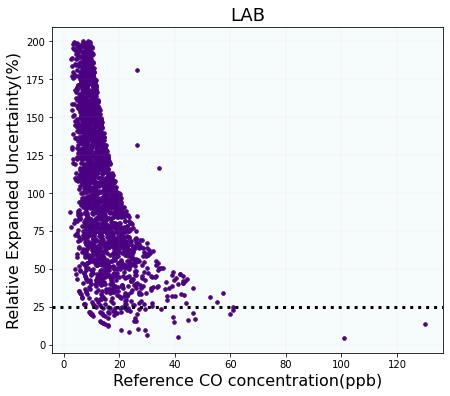

In [83]:
u_cal=REF(lab1,y_test,0.1)
fig= plt.figure(figsize=(7,6))
ax = fig.add_subplot(111)
ax.patch.set_facecolor('lightblue')
ax.patch.set_alpha(0.1)
ind=[]
U_cal=[]
Ref=[]
for i in range(len(pred)):
    if u_cal[i]<200:
        U_cal.append(u_cal[i])
        Ref.append(Lab1[i])

dqo=[25 for i in range(len(Ref))]
plt.scatter(Ref,U_cal, color='#4B0082',marker='.',s=50)
plt.axhline(y=25, color='black', linestyle=':',linewidth=3)
plt.ylabel('Relative Expanded Uncertainty(%)', fontsize=16)
#plt.ylabel(r'$H_{2}$', fontsize=24)
plt.xlabel('Reference CO concentration(ppb)',fontsize=16)
plt.grid(linestyle='-.',linewidth=0.1)
plt.title('LAB',fontsize=18)
plt.show()

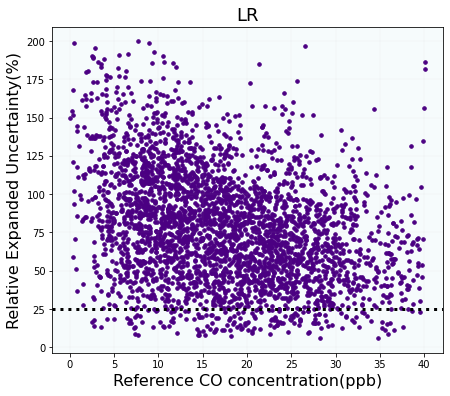

In [97]:
u_cal=REF(pred,y_test,0.1)
fig= plt.figure(figsize=(7,6))
ax = fig.add_subplot(111)
ax.patch.set_facecolor('lightblue')
ax.patch.set_alpha(0.1)
ind=[]
U_cal=[]
Ref=[]
for i in range(len(u_cal)):
    if u_cal[i]<200:
        U_cal.append(u_cal[i])
        Ref.append(y_test[i])
plt.scatter(Ref,U_cal, color='#4B0082',marker='.',s=50)
plt.axhline(y=25, color='black', linestyle=':',linewidth=3)
plt.ylabel('Relative Expanded Uncertainty(%)', fontsize=16)
plt.xlabel('Reference CO concentration(ppb)',fontsize=16)
plt.grid(linestyle='-.',linewidth=0.1)
plt.title('LR', fontsize=18)
plt.show()

In [85]:
REF2(Lab1,y_test,1,20000)

167.9460981278052

In [86]:
max(y_test)

131.35415

In [87]:
B=0
for i in range(len(y_test)):
    if y_test[i]==max(y_test):
        B=Lab1[i]    

In [88]:
sorted(y_test)[int(0.25*len(sorted(y_test)))]

10.77305

In [89]:
import random
alpha=1.4
LV=sorted(y_test)[int(0.25*len(sorted(y_test)))]
Cal=0
for i in range(len(y_test)):
    if y_test[i]==LV:
        Cal=lab1[i]
cal=np.array(lab1)
ref=np.array(y_test)
ref_mean=np.mean(ref)
cal_mean=np.mean(cal)
prec=np.array([20 for i in range(len(ref))])
u=0.001*ref
#cal=np.log(cal)
#ref=np.log(ref)
sx_s=(1/len(ref))*sum((ref-ref_mean)**2)
sy_s=(1/len(cal))*sum((cal-cal_mean)**2)
sxy=(1/len(cal))*sum((cal-cal_mean)*(ref-ref_mean))
#beta_1=((sy_s-sx_s)+np.sqrt((sy_s-sx_s)**2+4*sxy**2))/(2*sxy)
beta_1=((sy_s-alpha*sx_s)+np.sqrt((sy_s-sx_s)**2+4*alpha*sxy**2))/(2*sxy)
beta_0=cal_mean-beta_1*ref_mean
RSS=sum((cal-beta_0-beta_1*ref)**2-(beta_1**2+alpha)*(0.001*LV)**2)
du_s=RSS/(len(cal)-2)
    #Beta_1=((sy_s-sx_s-du_s)+np.sqrt((sy_s-sx_s-du_s)**2+4*sxy**2))/(2*sxy)
Beta_1=((sy_s-alpha*sx_s-du_s)+np.sqrt((sy_s-alpha*sx_s-du_s)**2+4*alpha*sxy**2))/(2*sxy)
Beta_0=cal_mean-Beta_1*ref_mean
P1=(RSS/(len(cal)-2))
P2=(Beta_1**2+alpha)*(0.001*LV)**2+(-2*Beta_1**2+2*Beta_1-1)*(0.001*LV)**2
P3=(Beta_0+(Beta_1-1)*LV)
P=P1+P2+P3
Bias=(2*(P3)/LV)*100
Random=(2*(P1+P2)**0.5/LV)*100




import random
alpha=1.4
LV2=sorted(y_test)[int(0.5*len(sorted(y_test)))]
Cal=0
for i in range(len(y_test)):
    if y_test[i]==LV:
        Cal=lab1[i]
cal=np.array(lab1)
ref=np.array(y_test)
ref_mean=np.mean(ref)
cal_mean=np.mean(cal)
prec=np.array([20 for i in range(len(ref))])
u=0.001*ref
#cal=np.log(cal)
#ref=np.log(ref)
sx_s=(1/len(ref))*sum((ref-ref_mean)**2)
sy_s=(1/len(cal))*sum((cal-cal_mean)**2)
sxy=(1/len(cal))*sum((cal-cal_mean)*(ref-ref_mean))
#beta_1=((sy_s-sx_s)+np.sqrt((sy_s-sx_s)**2+4*sxy**2))/(2*sxy)
beta_1=((sy_s-alpha*sx_s)+np.sqrt((sy_s-sx_s)**2+4*alpha*sxy**2))/(2*sxy)
beta_0=cal_mean-beta_1*ref_mean
RSS=sum((cal-beta_0-beta_1*ref)**2-(beta_1**2+alpha)*(0.001*LV)**2)
du_s=RSS/(len(cal)-2)
    #Beta_1=((sy_s-sx_s-du_s)+np.sqrt((sy_s-sx_s-du_s)**2+4*sxy**2))/(2*sxy)
Beta_1=((sy_s-alpha*sx_s-du_s)+np.sqrt((sy_s-alpha*sx_s-du_s)**2+4*alpha*sxy**2))/(2*sxy)
Beta_0=cal_mean-Beta_1*ref_mean
P1=(RSS/(len(cal)-2))
P2=(Beta_1**2+alpha)*(0.001*LV2)**2+(-2*Beta_1**2+2*Beta_1-1)*(0.001*LV2)**2
P3=(Beta_0+(Beta_1-1)*LV2)
P=P1+P2+P3
Bias2=(2*(P3)/LV2)*100
Random2=(2*(P1+P2)**0.5/LV2)*100



import random
alpha=1.4
LV1=sorted(y_test)[int(0.75*len(sorted(y_test)))]
Cal=0
for i in range(len(y_test)):
    if y_test[i]==LV:
        Cal=lab1[i]
cal=np.array(lab1)
ref=np.array(y_test)
ref_mean=np.mean(ref)
cal_mean=np.mean(cal)
prec=np.array([20 for i in range(len(ref))])
u=0.001*ref
#cal=np.log(cal)
#ref=np.log(ref)
sx_s=(1/len(ref))*sum((ref-ref_mean)**2)
sy_s=(1/len(cal))*sum((cal-cal_mean)**2)
sxy=(1/len(cal))*sum((cal-cal_mean)*(ref-ref_mean))
#beta_1=((sy_s-sx_s)+np.sqrt((sy_s-sx_s)**2+4*sxy**2))/(2*sxy)
beta_1=((sy_s-alpha*sx_s)+np.sqrt((sy_s-sx_s)**2+4*alpha*sxy**2))/(2*sxy)
beta_0=cal_mean-beta_1*ref_mean
RSS=sum((cal-beta_0-beta_1*ref)**2-(beta_1**2+alpha)*(0.001*LV1)**2)
du_s=RSS/(len(cal)-2)
    #Beta_1=((sy_s-sx_s-du_s)+np.sqrt((sy_s-sx_s-du_s)**2+4*sxy**2))/(2*sxy)
Beta_1=((sy_s-alpha*sx_s-du_s)+np.sqrt((sy_s-alpha*sx_s-du_s)**2+4*alpha*sxy**2))/(2*sxy)
Beta_0=cal_mean-Beta_1*ref_mean
P1=(RSS/(len(cal)-2))
P2=(Beta_1**2+alpha)*(0.001*LV1)**2+(-2*Beta_1**2+2*Beta_1-1)*(0.001*LV1)**2
P3=(Beta_0+(Beta_1-1)*LV1)
P=P1+P2+P3
Bias1=(2*(P3)/(LV1))*100
Random1=(2*(P1+P2)**0.5/(LV1))*100


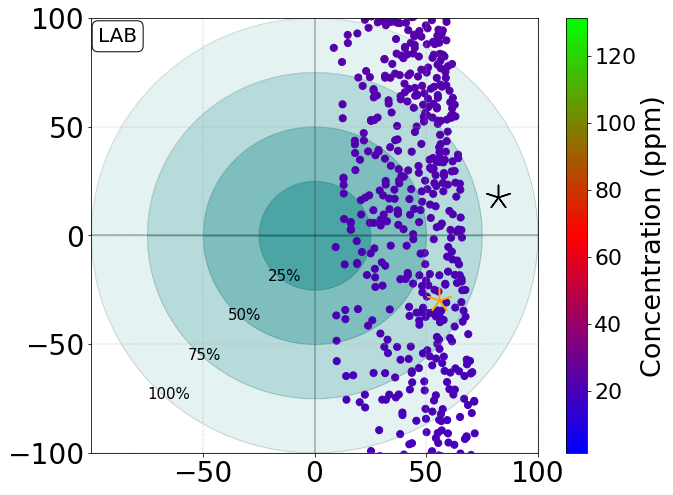

In [98]:
A1=target(lab1,y_test,1.4)
theta = np.linspace( 0 , 2 * np.pi , 150 )
r1 =25
a1= r1 * np.cos( theta )
b1= r1 * np.sin( theta )
r2 =50
a2=r2* np.cos( theta )
b2=r2* np.sin( theta )
r3 =75
a3=r3* np.cos( theta )
b3=r3* np.sin( theta )

r4 =100
a4=r4* np.cos( theta )
b4=r4* np.sin( theta )
fig= plt.figure(figsize=(10,8))

plt.Circle((0, 0), 1, color='wheat')
#plt.vlines([0], -130, 130, linestyles='dashed',color='violet')
#plt.hlines([0], -130, 130, linestyles='dashed', color='violet')

plt.fill_between(a1, b1, color='teal', alpha=0.4)
plt.fill_between(a2, b2, color='teal',alpha=0.3)
plt.fill_between(a3, b3, color='teal',alpha=0.2)
plt.fill_between(a4, b4, color='teal',alpha=0.1)

x1=np.arange(0,25.1,0.1)
r1=25
y1=np.sqrt(r1**2-x1**2)
x2=np.arange(0,50.1,0.1)
r2=50
y2=np.sqrt(r2**2-x2**2)

x3=np.arange(0,75.1,0.1)
r3=75
y3=np.sqrt(r3**2-x3**2)

x4=np.arange(0,100.1,0.1)
r4=100
y4=np.sqrt(r4**2-x4**2)

plt.plot(x1,y1, linewidth=0.2, color='grey')
plt.plot(x1,-1*y1, linewidth=0.2, color='grey')
plt.plot(x2,y2, linewidth=0.2, color='grey')
plt.plot(x2,-1*y2, linewidth=0.2, color='grey')
plt.plot(x3,y3, linewidth=0.2, color='grey')
plt.plot(x3,-1*y3, linewidth=0.2, color='grey')
plt.plot(x4,y4, linewidth=0.2, color='grey')
plt.plot(x4,-1*y4, linewidth=0.2, color='grey')

plt.plot(-1*x1,y1, linewidth=0.2, color='grey')
plt.plot(-1*x1,-1*y1, linewidth=0.2, color='grey')
plt.plot(-1*x2,y2, linewidth=0.2, color='grey')
plt.plot(-1*x2,-1*y2, linewidth=0.2, color='grey')
plt.plot(-1*x3,y3, linewidth=0.2, color='grey')
plt.plot(-1*x3,-1*y3, linewidth=0.2, color='grey')
plt.plot(-1*x4,y4, linewidth=0.2, color='grey')
plt.plot(-1*x4,-1*y4, linewidth=0.2, color='grey')

#plt.xlabel('Random uncertainty effect (%)',fontsize=24)
#plt.ylabel('Bias effect (%)',fontsize=24)
#plt.title('CO',fontsize=18)
color_map = plt.cm.get_cmap('brg')
reversed_color_map = color_map
plt.scatter(A1[0],A1[1],marker='.',s=200,c=np.array(A1[2]),cmap=reversed_color_map)
#plt.scatter(A1[3],A1[1],marker='.',s=10,c=np.array(A1[2])/1000,cmap=reversed_color_map)
#plt.scatter(A1[4],A1[1],marker='.',s=10,c=np.array(A1[2])/1000,cmap=reversed_color_map)
plt.vlines([0], -130, 130,color='black',linewidth=0.4)
plt.hlines([0], -130, 130, color='black',linewidth=0.4)
plt.grid(linestyle='-.',linewidth=0.4)
plt.ylim(ymin=-100)
plt.ylim(ymax=100)
plt.xlim(xmax=100)
plt.xlim(xmin=-100)
plt.xticks(np.arange(-50,101, 50),fontsize=28)
plt.yticks(np.arange(-100,101, 50),fontsize=28)
#plt.colorbar()
cbar = plt.colorbar()
cbar.ax.tick_params(labelsize=22)
cbar.set_label('Concentration (ppm)', rotation=90,fontsize=27)
plt.scatter(Random,Bias,marker=(5, 2),s=600, color='black')
plt.scatter(Random1,Bias1,marker=(5, 2),s=600, color='brown')
plt.scatter(Random2,Bias2,marker=(5, 2),s=600, color='orange')
textstr = 'LAB'
props = dict(boxstyle='round', facecolor='white', alpha=1)
plt.text(0.09, 1.27, textstr, transform=ax.transAxes, fontsize=20,
        verticalalignment='top', bbox=props)
plt.text(-21,-21, '25%',fontsize=15)
plt.text(-39,-39, '50%',fontsize=15)
plt.text(-57,-57, '75%',fontsize=15)
plt.text(-75,-75, '100%',fontsize=15)
plt.show()

In [92]:
import random
alpha=1.4
LV=CO_Mean#sorted(y_test)[int(0.25*len(sorted(y_test)))]
Cal=0
for i in range(len(y_test)):
    if y_test[i]==LV:
        Cal=pred[i]
cal=np.array(pred)
ref=np.array(y_test)
ref_mean=np.mean(ref)
cal_mean=np.mean(cal)
prec=np.array([20 for i in range(len(ref))])
u=0.001*ref
#cal=np.log(cal)
#ref=np.log(ref)
sx_s=(1/len(ref))*sum((ref-ref_mean)**2)
sy_s=(1/len(cal))*sum((cal-cal_mean)**2)
sxy=(1/len(cal))*sum((cal-cal_mean)*(ref-ref_mean))
#beta_1=((sy_s-sx_s)+np.sqrt((sy_s-sx_s)**2+4*sxy**2))/(2*sxy)
beta_1=((sy_s-alpha*sx_s)+np.sqrt((sy_s-sx_s)**2+4*alpha*sxy**2))/(2*sxy)
beta_0=cal_mean-beta_1*ref_mean
RSS=sum((cal-beta_0-beta_1*ref)**2-(beta_1**2+alpha)*(0.001*LV)**2)
du_s=RSS/(len(cal)-2)
    #Beta_1=((sy_s-sx_s-du_s)+np.sqrt((sy_s-sx_s-du_s)**2+4*sxy**2))/(2*sxy)
Beta_1=((sy_s-alpha*sx_s-du_s)+np.sqrt((sy_s-alpha*sx_s-du_s)**2+4*alpha*sxy**2))/(2*sxy)
Beta_0=cal_mean-Beta_1*ref_mean
P1=(RSS/(len(cal)-2))
P2=(Beta_1**2+alpha)*(0.001*LV)**2+(-2*Beta_1**2+2*Beta_1-1)*(0.001*LV)**2
P3=(Beta_0+(Beta_1-1)*LV)
P=P1+P2+P3
Bias=(2*(P3)/LV)*100
Random=(2*(P1+P2)**0.5/LV)*100

import random
alpha=1.4
LV2=CO_UQ#sorted(y_test)[int(0.5*len(sorted(y_test)))]
Cal=0
for i in range(len(y_test)):
    if y_test[i]==LV:
        Cal=lab1[i]
cal=np.array(pred)
ref=np.array(y_test)
ref_mean=np.mean(ref)
cal_mean=np.mean(cal)
prec=np.array([20 for i in range(len(ref))])
u=0.001*ref
#cal=np.log(cal)
#ref=np.log(ref)
sx_s=(1/len(ref))*sum((ref-ref_mean)**2)
sy_s=(1/len(cal))*sum((cal-cal_mean)**2)
sxy=(1/len(cal))*sum((cal-cal_mean)*(ref-ref_mean))
#beta_1=((sy_s-sx_s)+np.sqrt((sy_s-sx_s)**2+4*sxy**2))/(2*sxy)
beta_1=((sy_s-alpha*sx_s)+np.sqrt((sy_s-sx_s)**2+4*alpha*sxy**2))/(2*sxy)
beta_0=cal_mean-beta_1*ref_mean
RSS=sum((cal-beta_0-beta_1*ref)**2-(beta_1**2+alpha)*(0.001*LV)**2)
du_s=RSS/(len(cal)-2)
    #Beta_1=((sy_s-sx_s-du_s)+np.sqrt((sy_s-sx_s-du_s)**2+4*sxy**2))/(2*sxy)
Beta_1=((sy_s-alpha*sx_s-du_s)+np.sqrt((sy_s-alpha*sx_s-du_s)**2+4*alpha*sxy**2))/(2*sxy)
Beta_0=cal_mean-Beta_1*ref_mean
P1=(RSS/(len(cal)-2))
P2=(Beta_1**2+alpha)*(0.001*LV2)**2+(-2*Beta_1**2+2*Beta_1-1)*(0.001*LV2)**2
P3=(Beta_0+(Beta_1-1)*LV2)
P=P1+P2+P3
Bias2=(2*(P3)/LV2)*100
Random2=(2*(P1+P2)**0.5/LV2)*100


import random
alpha=1.4
LV1=CO_Max#sorted(y_test)[int(0.75*len(sorted(y_test)))]
Cal=0
for i in range(len(y_test)):
    if y_test[i]==LV:
        Cal=pred[i]
cal=np.array(pred)
ref=np.array(y_test)
ref_mean=np.mean(ref)
cal_mean=np.mean(cal)
prec=np.array([20 for i in range(len(ref))])
u=0.001*ref
#cal=np.log(cal)
#ref=np.log(ref)
sx_s=(1/len(ref))*sum((ref-ref_mean)**2)
sy_s=(1/len(cal))*sum((cal-cal_mean)**2)
sxy=(1/len(cal))*sum((cal-cal_mean)*(ref-ref_mean))
#beta_1=((sy_s-sx_s)+np.sqrt((sy_s-sx_s)**2+4*sxy**2))/(2*sxy)
beta_1=((sy_s-alpha*sx_s)+np.sqrt((sy_s-sx_s)**2+4*alpha*sxy**2))/(2*sxy)
beta_0=cal_mean-beta_1*ref_mean
RSS=sum((cal-beta_0-beta_1*ref)**2-(beta_1**2+alpha)*(0.001*LV1)**2)
du_s=RSS/(len(cal)-2)
    #Beta_1=((sy_s-sx_s-du_s)+np.sqrt((sy_s-sx_s-du_s)**2+4*sxy**2))/(2*sxy)
Beta_1=((sy_s-alpha*sx_s-du_s)+np.sqrt((sy_s-alpha*sx_s-du_s)**2+4*alpha*sxy**2))/(2*sxy)
Beta_0=cal_mean-Beta_1*ref_mean
P1=(RSS/(len(cal)-2))
P2=(Beta_1**2+alpha)*(0.001*LV1)**2+(-2*Beta_1**2+2*Beta_1-1)*(0.001*LV1)**2
P3=(Beta_0+(Beta_1-1)*LV1)
P=P1+P2+P3
Bias1=(2*(P3)/(LV1))*100
Random1=(2*(P1+P2)**0.5/(LV1))*100

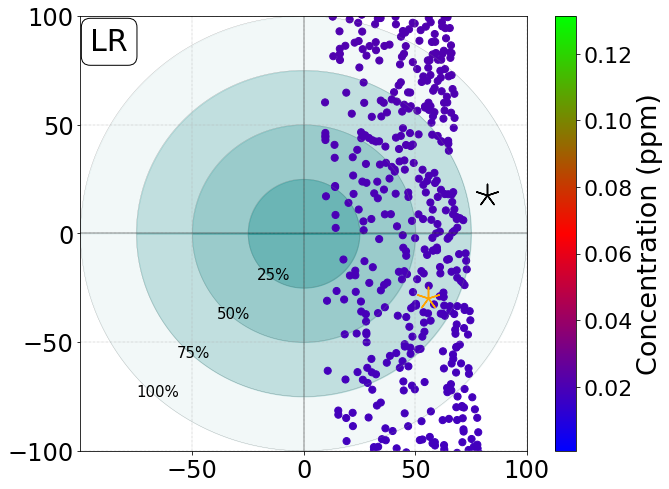

In [93]:
A2=target(pred,y_test,1.4)
theta = np.linspace( 0 , 2 * np.pi , 150 )
r1 =25
a1= r1 * np.cos( theta )
b1= r1 * np.sin( theta )
r2 =50
a2=r2* np.cos( theta )
b2=r2* np.sin( theta )
r3 =75
a3=r3* np.cos( theta )
b3=r3* np.sin( theta )

r4 =100
a4=r4* np.cos( theta )
b4=r4* np.sin( theta )
fig= plt.figure(figsize=(10,8))

plt.Circle((0, 0), 1, color='wheat')
#plt.vlines([0], -130, 130, linestyles='dashed',color='violet')
#plt.hlines([0], -130, 130, linestyles='dashed', color='violet')

plt.fill_between(a1, b1, color='teal', alpha=0.3)
plt.fill_between(a2, b2, color='teal',alpha=0.2)
plt.fill_between(a3, b3, color='teal',alpha=0.2)
plt.fill_between(a4, b4, color='teal',alpha=0.05)

x1=np.arange(0,25.1,0.1)
r1=25
y1=np.sqrt(r1**2-x1**2)
x2=np.arange(0,50.1,0.1)
r2=50
y2=np.sqrt(r2**2-x2**2)

x3=np.arange(0,75.1,0.1)
r3=75
y3=np.sqrt(r3**2-x3**2)

x4=np.arange(0,100.1,0.1)
r4=100
y4=np.sqrt(r4**2-x4**2)

plt.plot(x1,y1, linewidth=0.2, color='grey')
plt.plot(x1,-1*y1, linewidth=0.2, color='grey')
plt.plot(x2,y2, linewidth=0.2, color='grey')
plt.plot(x2,-1*y2, linewidth=0.2, color='grey')
plt.plot(x3,y3, linewidth=0.2, color='grey')
plt.plot(x3,-1*y3, linewidth=0.2, color='grey')
plt.plot(x4,y4, linewidth=0.2, color='grey')
plt.plot(x4,-1*y4, linewidth=0.2, color='grey')

plt.plot(-1*x1,y1, linewidth=0.2, color='grey')
plt.plot(-1*x1,-1*y1, linewidth=0.2, color='grey')
plt.plot(-1*x2,y2, linewidth=0.2, color='grey')
plt.plot(-1*x2,-1*y2, linewidth=0.2, color='grey')
plt.plot(-1*x3,y3, linewidth=0.2, color='grey')
plt.plot(-1*x3,-1*y3, linewidth=0.2, color='grey')
plt.plot(-1*x4,y4, linewidth=0.2, color='grey')
plt.plot(-1*x4,-1*y4, linewidth=0.2, color='grey')

#plt.xlabel('Random uncertainty effect (%)',fontsize=24)
#plt.ylabel('Bias effect (%)',fontsize=24)
#plt.title('CO',fontsize=18)
color_map = plt.cm.get_cmap('brg')
reversed_color_map = color_map
plt.scatter(A2[0],A2[1],marker='.',s=200,c=np.array(A2[2])/1000,cmap=reversed_color_map)
#plt.scatter(A2[3],A2[1],marker='.',s=10,c=np.array(A2[2])/1000,cmap=reversed_color_map)
#plt.scatter(A2[4],A2[1],marker='.',s=10,c=np.array(A2[2])/1000,cmap=reversed_color_map)
plt.vlines([0], -130, 130,color='black',linewidth=0.4)
plt.hlines([0], -130, 130, color='black',linewidth=0.4)
plt.grid(linestyle='-.',linewidth=0.4)
plt.ylim(ymin=-100)
plt.ylim(ymax=100)
plt.xlim(xmax=100)
plt.xlim(xmin=-100)
plt.xticks(np.arange(-50,101, 50),fontsize=24)
plt.yticks(np.arange(-100,101, 50),fontsize=24)
#plt.colorbar()
cbar = plt.colorbar()
cbar.ax.tick_params(labelsize=22)
cbar.set_label('Concentration (ppm)', rotation=90,fontsize=27)
plt.scatter(Random,Bias,marker=(5, 2),s=500, color='black')
plt.scatter(Random1,Bias1,marker=(5, 2),s=500, color='teal')
plt.scatter(Random2,Bias2,marker=(5, 2),s=500, color='orange')
textstr = 'LR'
props = dict(boxstyle='round', facecolor='white', alpha=1)
plt.text(0.07, 1.25, textstr, transform=ax.transAxes, fontsize=30,
        verticalalignment='top', bbox=props)
plt.text(-21,-21, '25%',fontsize=15)
plt.text(-39,-39, '50%',fontsize=15)
plt.text(-57,-57, '75%',fontsize=15)
plt.text(-75,-75, '100%',fontsize=15)
plt.show()

In [94]:
A=target2(pred,y_test,20)
A[1]

<ipython-input-74-1c8082621693>:11: RuntimeWarning: invalid value encountered in sqrt
  RR=2*((RSS/((len(X)-2))-u**2)/np.array(X))**0.5


array([-0.00241034, -0.01704534, -0.09019788, ...,  0.00116852,
       -0.02008078, -0.01686204])

(-2.0, 1.0)

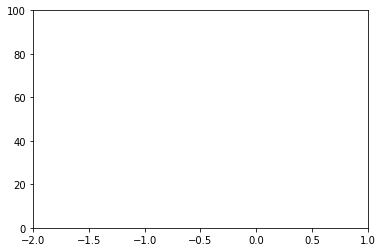

In [95]:
plt.scatter(A[1],A[0])
plt.ylim(ymin=-0)
plt.ylim(ymax=100)
plt.xlim(xmax=1)
plt.xlim(xmin=-2)

In [69]:
REF2(Lab1,y_test,1,30000)

173.80246434417316

In [96]:
REF2(pred,y_test,1,30000)

187.87902821722597

fig= plt.figure(figsize=(8,6))
index=[i for i in range(1,201)]
ax = fig.add_subplot(111)
ax.patch.set_facecolor('lightblue')
ax.patch.set_alpha(0.2)
plt.plot(index,y_test[A:], color='limegreen',linewidth=3)
plt.plot(index,pred[A:], color='#513e00',linewidth=3)
plt.plot(index,lab1[A:], color='#426eff',linewidth=3)
plt.legend(['Ref', 'LR-Calibrated', 'Lab-Calibrated'], loc = 2, bbox_to_anchor = (0.74,1))
plt.ylabel('CO Concentration(ppb)',fontsize=18)
#plt.text(B-20, C, r'$R^{2}(LR)=$'+str(R2_lr_CO), fontsize = 14, color='#513e00')
#plt.text(B-20, D, r'$R^{2}(Lab)=$' +str(R2_lab_CO), fontsize = 14, color='#426eff')
#plt.text(B-70, C, 'Pearson r(LR)='+str(Pearson_lr), fontsize = 14, color='#513e00')
#plt.text(B-70, D, 'Pearson r(Lab)='+str(Pearson_lab), fontsize = 14, color='#426eff')
#plt.xlabel('Last 200 hours of testing period',fontsize=18)
#plt.title('Visualization: Linear Regression Calibration vs Laboratory Calibration',fontsize=18)
plt.grid(linestyle='-.',linewidth=0.3)
plt.show()

In [71]:
print("Regressor model performance:")
print("Mean absolute error(MAE) =", round(sm.mean_absolute_error(y_test, pred), 2))
print("Mean squared error(MSE) =", round(sm.mean_squared_error(y_test, pred), 2))
print("Median absolute error =", round(sm.median_absolute_error(y_test, pred), 2))
print("Explain variance score =", round(sm.explained_variance_score(y_test, pred), 2))
print("R2 score =", round(sm.r2_score(y_test, pred), 2))
pred_lr=pred
MBE_LR_CO=MBE(pred,y_test)/np.std(y_test)
CRMSE_LR_CO=CRMSE(y_test,pred)/np.std(y_test)
MBE_LAB_CO=MBE(lab1,y_test)/np.std(y_test)
CRMSE_LAB_CO=CRMSE(y_test,lab1)/np.std(y_test)

Regressor model performance:
Mean absolute error(MAE) = 93.41
Mean squared error(MSE) = 26929.4
Median absolute error = 57.86
Explain variance score = 0.84
R2 score = 0.84


## Model 2 :  Support Vector Regression (SVR)

In [72]:
from sklearn.svm import SVR
from sklearn.preprocessing import StandardScaler
regressor = SVR(kernel = 'linear')
regressor.fit(X_train.drop(['Lab1'], axis=1), y_train)
pred = regressor.predict(X_test.drop(['Lab1'], axis=1))
for i in range(len(Pred)):
    if pred[i]<0:
        pred[i]=np.mean(np.array(pred))
pred_svr=pred

In [73]:
Index=[i for i in range(len(y_test))]
Y_test=y_test.to_list()
Y_test=pd.Series(Y_test,index =Index)
Y_test
Pred=pd.Series(pred,index =Index)

Lab1=pd.Series(lab1,index =Index)
sMAPE_lr=round(smape_loss(Y_test,Pred),2)
sMAPE_lab=round (smape_loss(Y_test,Lab1),2)
RMSE_lr=round(np.sqrt(sm.mean_squared_error(y_test, pred)),1)
RMSE_lab=round(np.sqrt(sm.mean_squared_error(y_test, lab1)),1)
Pearson_lr=round(np.corrcoef(y_test, pred)[0, 1],2)
Pearson_lab=round(np.corrcoef(y_test, lab1)[0, 1],2)
sMAPE_svr_CO=sMAPE_lr
RMSE_svr_CO=round(RMSE_lr/np.mean(np.array(y_test)),2)
Pearson_svr_CO=Pearson_lr
R2_svr_CO=round(sm.r2_score(y_test, pred), 2)
RMSE_Svr_CO=RMSE_lr

fig= plt.figure(figsize=(8,6))
ax = fig.add_subplot(111)
ax.patch.set_facecolor('lightblue')
ax.patch.set_alpha(0.3)
plt.plot(index,y_test[A:], color='limegreen',linewidth=3)
plt.plot(index,pred[A:], color='brown',linewidth=3)
plt.plot(index,lab1[A:], color='#426eff',linewidth=3)
plt.legend(['Ref', 'SVR-Calibrated', 'Lab-Calibrated'], loc = 2, bbox_to_anchor = (0.74,1))
plt.ylabel('CO Concentration(ppb)',fontsize=18)
#plt.text(B-20, C,r'$R^{2}(SVR)=$'+str(R2_svr_CO) , fontsize = 14, color='brown')
#plt.text(B-20, D,r'$R^{2}(Lab)=$'+str(R2_lab_CO) , fontsize = 14, color='#426eff')
#plt.text(B-70, C, 'Pearson r(SVR)='+str(Pearson_lr), fontsize = 14, color='brown')
#plt.text(B-70, D, 'Pearson r(Lab)='+str(Pearson_lab), fontsize = 14, color='#426eff')
#plt.xlabel('Last 200 hours of testing period',fontsize=18)
#plt.title('Visualization: Support Vector Regression (SVR) Calibration vs Laboratory Calibration',fontsize=18)
plt.grid(linestyle='-.',linewidth=0.3)
plt.show()

In [74]:
print("Regressor model performance:")
print("Mean absolute error(MAE) =", round(sm.mean_absolute_error(y_test, pred), 2))
print("Mean squared error(MSE) =", round(sm.mean_squared_error(y_test, pred), 2))
print("Median absolute error =", round(sm.median_absolute_error(y_test, pred), 2))
print("Explain variance score =", round(sm.explained_variance_score(y_test, pred), 2))
print("R2 score =", round(sm.r2_score(y_test, pred), 2))
pred_svr=pred
MBE_SVR_CO=MBE(pred,y_test)/np.std(y_test)
CRMSE_SVR_CO=CRMSE(y_test,pred)/np.std(y_test)

Regressor model performance:
Mean absolute error(MAE) = 91.81
Mean squared error(MSE) = 26942.7
Median absolute error = 54.07
Explain variance score = 0.84
R2 score = 0.84


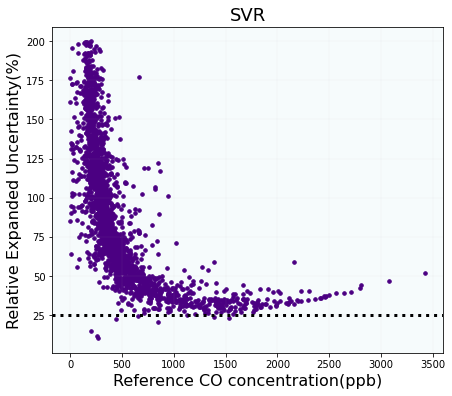

In [75]:
u_cal=REF(pred,y_test,1.4)
fig= plt.figure(figsize=(7,6))
ax = fig.add_subplot(111)
ax.patch.set_facecolor('lightblue')
ax.patch.set_alpha(0.1)
ind=[]
U_cal=[]
Ref=[]
for i in range(len(u_cal)):
    if u_cal[i]<200:
        U_cal.append(u_cal[i])
        Ref.append(y_test[i])
plt.scatter(Ref,U_cal, color='#4B0082',marker='.',s=50)
plt.axhline(y=25, color='black', linestyle=':',linewidth=3)
plt.ylabel('Relative Expanded Uncertainty(%)', fontsize=16)
plt.xlabel('Reference CO concentration(ppb)',fontsize=16)
plt.grid(linestyle='-.',linewidth=0.1)
plt.title('SVR', fontsize=18)
plt.show()

In [76]:
REF2(pred,y_test,1,20000)

39.55256619836408

In [77]:
import random
alpha=1.4
LV=5000
Cal=0
for i in range(len(y_test)):
    if y_test[i]==LV:
        Cal=pred[i]
cal=np.array(pred)
ref=np.array(y_test)
ref_mean=np.mean(ref)
cal_mean=np.mean(cal)
prec=np.array([20 for i in range(len(ref))])
u=0.001*ref
#cal=np.log(cal)
#ref=np.log(ref)
sx_s=(1/len(ref))*sum((ref-ref_mean)**2)
sy_s=(1/len(cal))*sum((cal-cal_mean)**2)
sxy=(1/len(cal))*sum((cal-cal_mean)*(ref-ref_mean))
#beta_1=((sy_s-sx_s)+np.sqrt((sy_s-sx_s)**2+4*sxy**2))/(2*sxy)
beta_1=((sy_s-alpha*sx_s)+np.sqrt((sy_s-sx_s)**2+4*alpha*sxy**2))/(2*sxy)
beta_0=cal_mean-beta_1*ref_mean
RSS=sum((cal-beta_0-beta_1*ref)**2-(beta_1**2+alpha)*(0.001*LV)**2)
du_s=RSS/(len(cal)-2)
    #Beta_1=((sy_s-sx_s-du_s)+np.sqrt((sy_s-sx_s-du_s)**2+4*sxy**2))/(2*sxy)
Beta_1=((sy_s-alpha*sx_s-du_s)+np.sqrt((sy_s-alpha*sx_s-du_s)**2+4*alpha*sxy**2))/(2*sxy)
Beta_0=cal_mean-Beta_1*ref_mean
P1=(RSS/(len(cal)-2))
P2=(Beta_1**2+alpha)*(0.001*LV)**2+(-2*Beta_1**2+2*Beta_1-1)*(0.001*LV)**2
P3=(Beta_0+(Beta_1-1)*LV)
P=P1+P2+P3
Bias=(2*(P3)/LV)*100
Random=(2*(P1+P2)**0.5/LV)*100


import random
alpha=1.4
LV2=7000
Cal=0
for i in range(len(y_test)):
    if y_test[i]==LV:
        Cal=lab1[i]
cal=np.array(pred)
ref=np.array(y_test)
ref_mean=np.mean(ref)
cal_mean=np.mean(cal)
prec=np.array([20 for i in range(len(ref))])
u=0.001*ref
#cal=np.log(cal)
#ref=np.log(ref)
sx_s=(1/len(ref))*sum((ref-ref_mean)**2)
sy_s=(1/len(cal))*sum((cal-cal_mean)**2)
sxy=(1/len(cal))*sum((cal-cal_mean)*(ref-ref_mean))
#beta_1=((sy_s-sx_s)+np.sqrt((sy_s-sx_s)**2+4*sxy**2))/(2*sxy)
beta_1=((sy_s-alpha*sx_s)+np.sqrt((sy_s-sx_s)**2+4*alpha*sxy**2))/(2*sxy)
beta_0=cal_mean-beta_1*ref_mean
RSS=sum((cal-beta_0-beta_1*ref)**2-(beta_1**2+alpha)*(0.001*LV)**2)
du_s=RSS/(len(cal)-2)
    #Beta_1=((sy_s-sx_s-du_s)+np.sqrt((sy_s-sx_s-du_s)**2+4*sxy**2))/(2*sxy)
Beta_1=((sy_s-alpha*sx_s-du_s)+np.sqrt((sy_s-alpha*sx_s-du_s)**2+4*alpha*sxy**2))/(2*sxy)
Beta_0=cal_mean-Beta_1*ref_mean
P1=(RSS/(len(cal)-2))
P2=(Beta_1**2+alpha)*(0.001*LV2)**2+(-2*Beta_1**2+2*Beta_1-1)*(0.001*LV2)**2
P3=(Beta_0+(Beta_1-1)*LV2)
P=P1+P2+P3
Bias2=(2*(P3)/LV2)*100
Random2=(2*(P1+P2)**0.5/LV2)*100



import random
alpha=1.4
LV1=30000
Cal=0
for i in range(len(y_test)):
    if y_test[i]==LV:
        Cal=pred[i]
cal=np.array(pred)
ref=np.array(y_test)
ref_mean=np.mean(ref)
cal_mean=np.mean(cal)
prec=np.array([20 for i in range(len(ref))])
u=0.001*ref
#cal=np.log(cal)
#ref=np.log(ref)
sx_s=(1/len(ref))*sum((ref-ref_mean)**2)
sy_s=(1/len(cal))*sum((cal-cal_mean)**2)
sxy=(1/len(cal))*sum((cal-cal_mean)*(ref-ref_mean))
#beta_1=((sy_s-sx_s)+np.sqrt((sy_s-sx_s)**2+4*sxy**2))/(2*sxy)
beta_1=((sy_s-alpha*sx_s)+np.sqrt((sy_s-sx_s)**2+4*alpha*sxy**2))/(2*sxy)
beta_0=cal_mean-beta_1*ref_mean
RSS=sum((cal-beta_0-beta_1*ref)**2-(beta_1**2+alpha)*(0.001*LV1)**2)
du_s=RSS/(len(cal)-2)
    #Beta_1=((sy_s-sx_s-du_s)+np.sqrt((sy_s-sx_s-du_s)**2+4*sxy**2))/(2*sxy)
Beta_1=((sy_s-alpha*sx_s-du_s)+np.sqrt((sy_s-alpha*sx_s-du_s)**2+4*alpha*sxy**2))/(2*sxy)
Beta_0=cal_mean-Beta_1*ref_mean
P1=(RSS/(len(cal)-2))
P2=(Beta_1**2+alpha)*(0.001*LV1)**2+(-2*Beta_1**2+2*Beta_1-1)*(0.001*LV1)**2
P3=(Beta_0+(Beta_1-1)*LV1)
P=P1+P2+P3
Bias1=(2*(P3)/(LV1))*100
Random1=(2*(P1+P2)**0.5/(LV1))*100


<ipython-input-46-6842ed1662bc>:32: RuntimeWarning: divide by zero encountered in true_divide
  A=(2*(np.array(P))**0.5/ref)*100
<ipython-input-46-6842ed1662bc>:36: RuntimeWarning: divide by zero encountered in true_divide
  B=(2*(np.array(P3))/ref)*100
<ipython-input-46-6842ed1662bc>:40: RuntimeWarning: divide by zero encountered in true_divide
  part1=(Beta_0/ref)*100


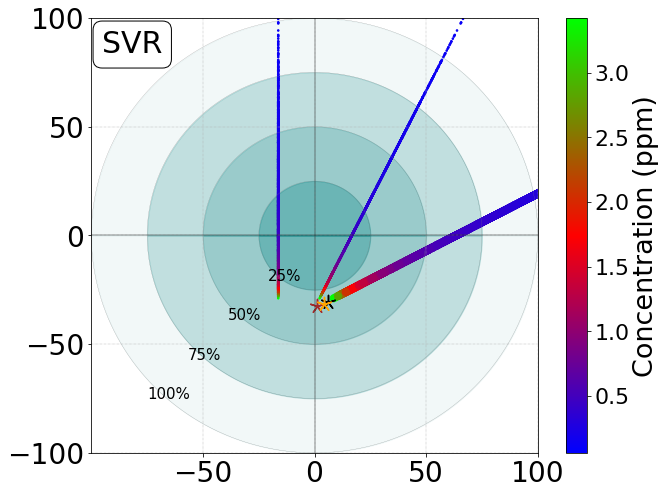

In [78]:
A3=target(pred,y_test,1.4)
theta = np.linspace( 0 , 2 * np.pi , 150 )
r1 =25
a1= r1 * np.cos( theta )
b1= r1 * np.sin( theta )
r2 =50
a2=r2* np.cos( theta )
b2=r2* np.sin( theta )
r3 =75
a3=r3* np.cos( theta )
b3=r3* np.sin( theta )

r4 =100
a4=r4* np.cos( theta )
b4=r4* np.sin( theta )
fig= plt.figure(figsize=(10,8))

plt.Circle((0, 0), 1, color='wheat')
#plt.vlines([0], -130, 130, linestyles='dashed',color='violet')
#plt.hlines([0], -130, 130, linestyles='dashed', color='violet')
plt.fill_between(a1, b1, color='teal', alpha=0.3)
plt.fill_between(a2, b2, color='teal',alpha=0.2)
plt.fill_between(a3, b3, color='teal',alpha=0.2)
plt.fill_between(a4, b4, color='teal',alpha=0.05)


x1=np.arange(0,25.1,0.1)
r1=25
y1=np.sqrt(r1**2-x1**2)
x2=np.arange(0,50.1,0.1)
r2=50
y2=np.sqrt(r2**2-x2**2)

x3=np.arange(0,75.1,0.1)
r3=75
y3=np.sqrt(r3**2-x3**2)

x4=np.arange(0,100.1,0.1)
r4=100
y4=np.sqrt(r4**2-x4**2)

plt.plot(x1,y1, linewidth=0.2, color='grey')
plt.plot(x1,-1*y1, linewidth=0.2, color='grey')
plt.plot(x2,y2, linewidth=0.2, color='grey')
plt.plot(x2,-1*y2, linewidth=0.2, color='grey')
plt.plot(x3,y3, linewidth=0.2, color='grey')
plt.plot(x3,-1*y3, linewidth=0.2, color='grey')
plt.plot(x4,y4, linewidth=0.2, color='grey')
plt.plot(x4,-1*y4, linewidth=0.2, color='grey')

plt.plot(-1*x1,y1, linewidth=0.2, color='grey')
plt.plot(-1*x1,-1*y1, linewidth=0.2, color='grey')
plt.plot(-1*x2,y2, linewidth=0.2, color='grey')
plt.plot(-1*x2,-1*y2, linewidth=0.2, color='grey')
plt.plot(-1*x3,y3, linewidth=0.2, color='grey')
plt.plot(-1*x3,-1*y3, linewidth=0.2, color='grey')
plt.plot(-1*x4,y4, linewidth=0.2, color='grey')
plt.plot(-1*x4,-1*y4, linewidth=0.2, color='grey')

#plt.xlabel('Random uncertainty effect (%)',fontsize=24)
#plt.ylabel('Bias effect (%)',fontsize=24)
#plt.title('CO',fontsize=18)
color_map = plt.cm.get_cmap('brg')
reversed_color_map = color_map
plt.scatter(A3[0],A3[1],marker='.',s=200,c=np.array(A3[2])/1000,cmap=reversed_color_map)
plt.scatter(A3[3],A3[1],marker='.',s=10,c=np.array(A3[2])/1000,cmap=reversed_color_map)
plt.scatter(A3[4],A3[1],marker='.',s=10,c=np.array(A3[2])/1000,cmap=reversed_color_map)
plt.vlines([0], -130, 130,color='black',linewidth=0.4)
plt.hlines([0], -130, 130, color='black',linewidth=0.4)
plt.grid(linestyle='-.',linewidth=0.4)
plt.ylim(ymin=-100)
plt.ylim(ymax=100)
plt.xlim(xmax=100)
plt.xlim(xmin=-100)
plt.xticks(np.arange(-50,101, 50),fontsize=28)
plt.yticks(np.arange(-100,101, 50),fontsize=28)
#plt.colorbar()
cbar = plt.colorbar()
cbar.ax.tick_params(labelsize=22)
cbar.set_label('Concentration (ppm)', rotation=90,fontsize=27)
plt.scatter(Random,Bias,marker=(5, 2),s=200, color='black')
plt.scatter(Random1,Bias1,marker=(5, 2),s=200, color='brown')
plt.scatter(Random2,Bias2,marker=(5, 2),s=200, color='orange')
textstr = 'SVR'
props = dict(boxstyle='round', facecolor='white', alpha=1)
plt.text(0.1, 1.26, textstr, transform=ax.transAxes, fontsize=30,
        verticalalignment='top', bbox=props)
plt.text(-21,-21, '25%',fontsize=15)
plt.text(-39,-39, '50%',fontsize=15)
plt.text(-57,-57, '75%',fontsize=15)
plt.text(-75,-75, '100%',fontsize=15)
plt.show()

In [79]:
REF2(pred,y_test,1,30000)

39.181551122502334

## Model 3 : Random Forest

In [80]:
from sklearn.ensemble import RandomForestRegressor
  
 # create regressor object
regressor = RandomForestRegressor(n_estimators = 500,min_samples_split= 2,min_samples_leaf= 1,max_features= 'sqrt', 
                                  random_state = 0,max_depth=None,bootstrap=False)
  
  
# fit the regressor with x and y data
regressor=regressor.fit(X_train.drop(['Lab1'], axis=1), y_train)
pred = regressor.predict(X_test.drop(['Lab1'], axis=1))

In [81]:
features_CO=regressor.feature_importances_
pred = regressor.predict(X_test.drop(['Lab1'], axis=1))
pred_rf_co=pred
Index=[i for i in range(len(y_test))]
Y_test=y_test.to_list()
Y_test=pd.Series(Y_test,index =Index)
Y_test
Pred=pd.Series(pred,index =Index)
Lab1=pd.Series(lab1,index =Index)
sMAPE_lr=round(smape_loss(Y_test,Pred),2)
sMAPE_lab=round (smape_loss(Y_test,Lab1),2)
RMSE_lr=round(np.sqrt(sm.mean_squared_error(y_test, pred)),1)
RMSE_lab=round(np.sqrt(sm.mean_squared_error(y_test, lab1)),1)
Pearson_lr=round(np.corrcoef(y_test, pred)[0, 1],2)
Pearson_lab=round(np.corrcoef(y_test, lab1)[0, 1],2)
sMAPE_rf_CO=sMAPE_lr
RMSE_rf_CO=round(RMSE_lr/np.mean(np.array(y_test)),2)
Pearson_rf_CO=Pearson_lr
R2_rf_CO=round(sm.r2_score(y_test, pred), 2)
RMSE_Rf_CO=RMSE_lr

In [82]:
features_CO

array([0.72431   , 0.07255402, 0.05103354, 0.04333225, 0.02465834,
       0.08411185])

fig= plt.figure(figsize=(30,4))

ax = fig.add_subplot(111)
#ax.patch.set_facecolor('lightblue')
ax.patch.set_alpha(0.3)
plt.plot(index,y_test[A:], color='black',linewidth=3)
plt.plot(index,pred[A:], color='red',linewidth=3)
plt.plot(index,lab1[A:], color='blue',linewidth=3)
plt.legend(['Ref', 'RF-Calibrated', 'LAB-Calibrated'], loc = 2, bbox_to_anchor = (0.79,1))
plt.ylabel('CO Concentration(ppb)',fontsize=18)
plt.text(B-20, C, r'$R^{2}(RF)=$'+str(R2_rf_CO), fontsize = 14, color='red')
plt.text(B-20, D, r'$R^{2}(Lab)=$'+str(R2_lab_CO), fontsize = 14, color='blue')
plt.text(B-72, C, 'Pearson r(RF)='+str(Pearson_lr), fontsize = 14, color='red')
plt.text(B-72, D, 'Pearson r(Lab)='+str(Pearson_lab), fontsize = 14, color='blue')
#plt.xlabel('Last 200 hours of testing period',fontsize=18)
#plt.title('Visualization: Random Forest(RF) Calibration vs Laboratory Calibration',fontsize=18)
#plt.grid(linestyle='-.',linewidth=0.3)
plt.show()

In [83]:
print("Regressor model performance:")
print("Mean absolute error(MAE) =", round(sm.mean_absolute_error(y_test, pred), 2))
print("Mean squared error(MSE) =", round(sm.mean_squared_error(y_test, pred), 2))
print("Median absolute error =", round(sm.median_absolute_error(y_test, pred), 2))
print("Explain variance score =", round(sm.explained_variance_score(y_test, pred), 2))
print("R2 score =", round(sm.r2_score(y_test, pred), 2))
pred_rf=pred
MBE_RF_CO=MBE(pred,y_test)/np.std(y_test)
CRMSE_RF_CO=CRMSE(y_test,pred)/np.std(y_test)

Regressor model performance:
Mean absolute error(MAE) = 65.51
Mean squared error(MSE) = 13315.94
Median absolute error = 33.72
Explain variance score = 0.92
R2 score = 0.92


R2=[]
DQO=[]
lv=max(y_test)
for i in range(1,25):
    regressor=regressor.fit(X_train[:360*i].drop(['Lab1'], axis=1), y_train[:360*i])
    pred = regressor.predict(X_test.drop(['Lab1'], axis=1))
    dqo=REF2(pred,y_test,1.3,lv)
    r2=round(sm.r2_score(y_test, pred), 2)
    DQO.append(dqo)
    R2.append(r2)
    
    

# Hyper parameter tuning

In [84]:
# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 200, stop = 2000, num = 10)]
# Number of features to consider at every split
max_features = ['auto', 'sqrt']
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(10, 110, num = 11)]
max_depth.append(None)
# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4]
# Method of selecting samples for training each tree
bootstrap = [True, False]
# Create the random grid
random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
               'bootstrap': bootstrap}
print(random_grid)

{'n_estimators': [200, 400, 600, 800, 1000, 1200, 1400, 1600, 1800, 2000], 'max_features': ['auto', 'sqrt'], 'max_depth': [10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, None], 'min_samples_split': [2, 5, 10], 'min_samples_leaf': [1, 2, 4], 'bootstrap': [True, False]}


In [85]:
from sklearn.model_selection import RandomizedSearchCV
# Use the random grid to search for best hyperparameters
# First create the base model to tune
#rf = RandomForestRegressor()
# Random search of parameters, using 3 fold cross validation, 
# search across 100 different combinations, and use all available cores
#rf_random = RandomizedSearchCV(estimator = rf, param_distributions = random_grid, n_iter = 100, cv = 3, 
#                               verbose=1, random_state=42, n_jobs = -1)
# Fit the random search model
#rf_random.fit(X_train, y_train)
#rf_random.best_params_
#{'n_estimators': 400,
 #'min_samples_split': 2,
 #'min_samples_leaf': 1,
 #'max_features': 'sqrt',
 #'max_depth': None,
 #'bootstrap': False}

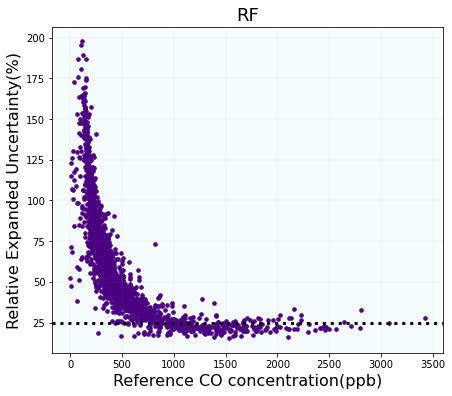

In [86]:
u_cal=REF(pred,y_test,1.4)
fig= plt.figure(figsize=(7,6))
ax = fig.add_subplot(111)
ax.patch.set_facecolor('lightblue')
ax.patch.set_alpha(0.1)
ind=[]
U_cal=[]
Ref=[]
for i in range(len(u_cal)):
    if u_cal[i]<200:
        U_cal.append(u_cal[i])
        Ref.append(y_test[i])
plt.scatter(Ref,U_cal, color='#4B0082',marker='.',s=50)
plt.axhline(y=25, color='black', linestyle=':',linewidth=3)
plt.ylabel('Relative Expanded Uncertainty(%)', fontsize=16)
plt.xlabel('Reference CO concentration(ppb)',fontsize=16)
plt.grid(linestyle='-.',linewidth=0.1)
plt.title('RF', fontsize=18)
plt.show()

In [87]:
u_r=0.15
U=np.sqrt(np.mean((u_r*np.array(y_test))**2))
RMSE=np.sqrt(np.mean((np.array(pred)-np.array(y_test))**2))
ind=RMSE/(2*U)
ind

0.6058140736059071

In [88]:
A=[i for i in np.arange(1,3,0.05)]
B=[]
for i in A:
    k=REF2(pred,y_test,i,30000)
    B.append(k)
for i in range(len(B)):
    if B[i]==min(B):
        print(A[i])

1.3000000000000003


In [89]:
REF2(pred,y_test,1.3,30000)

24.36972146945551

In [90]:
import random
alpha=1.4
LV=max(y_test)
Cal=0
for i in range(len(y_test)):
    if y_test[i]==LV:
        Cal=pred[i]
cal=np.array(pred)
ref=np.array(y_test)
ref_mean=np.mean(ref)
cal_mean=np.mean(cal)
prec=np.array([20 for i in range(len(ref))])
u=0.001*ref
#cal=np.log(cal)
#ref=np.log(ref)
sx_s=(1/len(ref))*sum((ref-ref_mean)**2)
sy_s=(1/len(cal))*sum((cal-cal_mean)**2)
sxy=(1/len(cal))*sum((cal-cal_mean)*(ref-ref_mean))
#beta_1=((sy_s-sx_s)+np.sqrt((sy_s-sx_s)**2+4*sxy**2))/(2*sxy)
beta_1=((sy_s-alpha*sx_s)+np.sqrt((sy_s-sx_s)**2+4*alpha*sxy**2))/(2*sxy)
beta_0=cal_mean-beta_1*ref_mean
RSS=sum((cal-beta_0-beta_1*ref)**2-(beta_1**2+alpha)*(0.001*LV)**2)
du_s=RSS/(len(cal)-2)
    #Beta_1=((sy_s-sx_s-du_s)+np.sqrt((sy_s-sx_s-du_s)**2+4*sxy**2))/(2*sxy)
Beta_1=((sy_s-alpha*sx_s-du_s)+np.sqrt((sy_s-alpha*sx_s-du_s)**2+4*alpha*sxy**2))/(2*sxy)
Beta_0=cal_mean-Beta_1*ref_mean
P1=(RSS/(len(cal)-2))
P2=(Beta_1**2+alpha)*(0.001*LV)**2+(-2*Beta_1**2+2*Beta_1-1)*(0.001*LV)**2
P3=(Beta_0+(Beta_1-1)*LV)
P=P1+P2+P3
Bias=(2*(P3)/LV)*100
Random=(2*(P1+P2)**0.5/LV)*100



import random
alpha=1.4
LV2=7000
Cal=0
for i in range(len(y_test)):
    if y_test[i]==LV:
        Cal=lab1[i]
cal=np.array(pred)
ref=np.array(y_test)
ref_mean=np.mean(ref)
cal_mean=np.mean(cal)
prec=np.array([20 for i in range(len(ref))])
u=0.001*ref
#cal=np.log(cal)
#ref=np.log(ref)
sx_s=(1/len(ref))*sum((ref-ref_mean)**2)
sy_s=(1/len(cal))*sum((cal-cal_mean)**2)
sxy=(1/len(cal))*sum((cal-cal_mean)*(ref-ref_mean))
#beta_1=((sy_s-sx_s)+np.sqrt((sy_s-sx_s)**2+4*sxy**2))/(2*sxy)
beta_1=((sy_s-alpha*sx_s)+np.sqrt((sy_s-sx_s)**2+4*alpha*sxy**2))/(2*sxy)
beta_0=cal_mean-beta_1*ref_mean
RSS=sum((cal-beta_0-beta_1*ref)**2-(beta_1**2+alpha)*(0.001*LV)**2)
du_s=RSS/(len(cal)-2)
    #Beta_1=((sy_s-sx_s-du_s)+np.sqrt((sy_s-sx_s-du_s)**2+4*sxy**2))/(2*sxy)
Beta_1=((sy_s-alpha*sx_s-du_s)+np.sqrt((sy_s-alpha*sx_s-du_s)**2+4*alpha*sxy**2))/(2*sxy)
Beta_0=cal_mean-Beta_1*ref_mean
P1=(RSS/(len(cal)-2))
P2=(Beta_1**2+alpha)*(0.001*LV2)**2+(-2*Beta_1**2+2*Beta_1-1)*(0.001*LV2)**2
P3=(Beta_0+(Beta_1-1)*LV2)
P=P1+P2+P3
Bias2=(2*(P3)/LV2)*100
Random2=(2*(P1+P2)**0.5/LV2)*100


import random
alpha=1.4
LV1=30000
Cal=0
for i in range(len(y_test)):
    if y_test[i]==LV:
        Cal=lab1[i]
cal=np.array(pred)
ref=np.array(y_test)
ref_mean=np.mean(ref)
cal_mean=np.mean(cal)
prec=np.array([20 for i in range(len(ref))])
u=0.001*ref
#cal=np.log(cal)
#ref=np.log(ref)
sx_s=(1/len(ref))*sum((ref-ref_mean)**2)
sy_s=(1/len(cal))*sum((cal-cal_mean)**2)
sxy=(1/len(cal))*sum((cal-cal_mean)*(ref-ref_mean))
#beta_1=((sy_s-sx_s)+np.sqrt((sy_s-sx_s)**2+4*sxy**2))/(2*sxy)
beta_1=((sy_s-alpha*sx_s)+np.sqrt((sy_s-sx_s)**2+4*alpha*sxy**2))/(2*sxy)
beta_0=cal_mean-beta_1*ref_mean
RSS=sum((cal-beta_0-beta_1*ref)**2-(beta_1**2+alpha)*(0.001*LV1)**2)
du_s=RSS/(len(cal)-2)
    #Beta_1=((sy_s-sx_s-du_s)+np.sqrt((sy_s-sx_s-du_s)**2+4*sxy**2))/(2*sxy)
Beta_1=((sy_s-alpha*sx_s-du_s)+np.sqrt((sy_s-alpha*sx_s-du_s)**2+4*alpha*sxy**2))/(2*sxy)
Beta_0=cal_mean-Beta_1*ref_mean
P1=(RSS/(len(cal)-2))
P2=(Beta_1**2+alpha)*(0.001*LV1)**2+(-2*Beta_1**2+2*Beta_1-1)*(0.001*LV1)**2
P3=(Beta_0+(Beta_1-1)*LV1)
P=P1+P2+P3
Bias1=(2*(P3)/(LV1))*100
Random1=(2*(P1+P2)**0.5/(LV1))*100

In [94]:
import random
alpha=1.4
LV=CO_Mean#sorted(y_test)[int(0.25*len(sorted(y_test)))]
Cal=0
for i in range(len(y_test)):
    if y_test[i]==LV:
        Cal=pred[i]
cal=np.array(pred)
ref=np.array(y_test)
ref_mean=np.mean(ref)
cal_mean=np.mean(cal)
prec=np.array([20 for i in range(len(ref))])
u=0.001*ref
#cal=np.log(cal)
#ref=np.log(ref)
sx_s=(1/len(ref))*sum((ref-ref_mean)**2)
sy_s=(1/len(cal))*sum((cal-cal_mean)**2)
sxy=(1/len(cal))*sum((cal-cal_mean)*(ref-ref_mean))
#beta_1=((sy_s-sx_s)+np.sqrt((sy_s-sx_s)**2+4*sxy**2))/(2*sxy)
beta_1=((sy_s-alpha*sx_s)+np.sqrt((sy_s-sx_s)**2+4*alpha*sxy**2))/(2*sxy)
beta_0=cal_mean-beta_1*ref_mean
RSS=sum((cal-beta_0-beta_1*ref)**2-(beta_1**2+alpha)*(0.001*LV)**2)
du_s=RSS/(len(cal)-2)
    #Beta_1=((sy_s-sx_s-du_s)+np.sqrt((sy_s-sx_s-du_s)**2+4*sxy**2))/(2*sxy)
Beta_1=((sy_s-alpha*sx_s-du_s)+np.sqrt((sy_s-alpha*sx_s-du_s)**2+4*alpha*sxy**2))/(2*sxy)
Beta_0=cal_mean-Beta_1*ref_mean
P1=(RSS/(len(cal)-2))
P2=(Beta_1**2+alpha)*(0.001*LV)**2+(-2*Beta_1**2+2*Beta_1-1)*(0.001*LV)**2
P3=(Beta_0+(Beta_1-1)*LV)
P=P1+P2+P3
Bias=(2*(P3)/LV)*100
Random=(2*(P1+P2)**0.5/LV)*100

import random
alpha=1.4
LV2=CO_UQ#sorted(y_test)[int(0.5*len(sorted(y_test)))]
Cal=0
for i in range(len(y_test)):
    if y_test[i]==LV:
        Cal=lab1[i]
cal=np.array(pred)
ref=np.array(y_test)
ref_mean=np.mean(ref)
cal_mean=np.mean(cal)
prec=np.array([20 for i in range(len(ref))])
u=0.001*ref
#cal=np.log(cal)
#ref=np.log(ref)
sx_s=(1/len(ref))*sum((ref-ref_mean)**2)
sy_s=(1/len(cal))*sum((cal-cal_mean)**2)
sxy=(1/len(cal))*sum((cal-cal_mean)*(ref-ref_mean))
#beta_1=((sy_s-sx_s)+np.sqrt((sy_s-sx_s)**2+4*sxy**2))/(2*sxy)
beta_1=((sy_s-alpha*sx_s)+np.sqrt((sy_s-sx_s)**2+4*alpha*sxy**2))/(2*sxy)
beta_0=cal_mean-beta_1*ref_mean
RSS=sum((cal-beta_0-beta_1*ref)**2-(beta_1**2+alpha)*(0.001*LV)**2)
du_s=RSS/(len(cal)-2)
    #Beta_1=((sy_s-sx_s-du_s)+np.sqrt((sy_s-sx_s-du_s)**2+4*sxy**2))/(2*sxy)
Beta_1=((sy_s-alpha*sx_s-du_s)+np.sqrt((sy_s-alpha*sx_s-du_s)**2+4*alpha*sxy**2))/(2*sxy)
Beta_0=cal_mean-Beta_1*ref_mean
P1=(RSS/(len(cal)-2))
P2=(Beta_1**2+alpha)*(0.001*LV2)**2+(-2*Beta_1**2+2*Beta_1-1)*(0.001*LV2)**2
P3=(Beta_0+(Beta_1-1)*LV2)
P=P1+P2+P3
Bias2=(2*(P3)/LV2)*100
Random2=(2*(P1+P2)**0.5/LV2)*100


import random
alpha=1.4
LV1=CO_Max#sorted(y_test)[int(0.75*len(sorted(y_test)))]
Cal=0
for i in range(len(y_test)):
    if y_test[i]==LV:
        Cal=pred[i]
cal=np.array(pred)
ref=np.array(y_test)
ref_mean=np.mean(ref)
cal_mean=np.mean(cal)
prec=np.array([20 for i in range(len(ref))])
u=0.001*ref
#cal=np.log(cal)
#ref=np.log(ref)
sx_s=(1/len(ref))*sum((ref-ref_mean)**2)
sy_s=(1/len(cal))*sum((cal-cal_mean)**2)
sxy=(1/len(cal))*sum((cal-cal_mean)*(ref-ref_mean))
#beta_1=((sy_s-sx_s)+np.sqrt((sy_s-sx_s)**2+4*sxy**2))/(2*sxy)
beta_1=((sy_s-alpha*sx_s)+np.sqrt((sy_s-sx_s)**2+4*alpha*sxy**2))/(2*sxy)
beta_0=cal_mean-beta_1*ref_mean
RSS=sum((cal-beta_0-beta_1*ref)**2-(beta_1**2+alpha)*(0.001*LV1)**2)
du_s=RSS/(len(cal)-2)
    #Beta_1=((sy_s-sx_s-du_s)+np.sqrt((sy_s-sx_s-du_s)**2+4*sxy**2))/(2*sxy)
Beta_1=((sy_s-alpha*sx_s-du_s)+np.sqrt((sy_s-alpha*sx_s-du_s)**2+4*alpha*sxy**2))/(2*sxy)
Beta_0=cal_mean-Beta_1*ref_mean
P1=(RSS/(len(cal)-2))
P2=(Beta_1**2+alpha)*(0.001*LV1)**2+(-2*Beta_1**2+2*Beta_1-1)*(0.001*LV1)**2
P3=(Beta_0+(Beta_1-1)*LV1)
P=P1+P2+P3
Bias1=(2*(P3)/(LV1))*100
Random1=(2*(P1+P2)**0.5/(LV1))*100

In [103]:
Lim_val=10000
DQO_Mean=25*(Lim_val/CO_Mean)
DQO_Max=25*(Lim_val/CO_Max)
DQO_UQ=25*(Lim_val/CO_UQ)
DQO_Mean,DQO_UQ,DQO_Max
CO_Max

3424.3903333333333

<ipython-input-46-6842ed1662bc>:32: RuntimeWarning: divide by zero encountered in true_divide
  A=(2*(np.array(P))**0.5/ref)*100
<ipython-input-46-6842ed1662bc>:36: RuntimeWarning: divide by zero encountered in true_divide
  B=(2*(np.array(P3))/ref)*100
<ipython-input-46-6842ed1662bc>:40: RuntimeWarning: divide by zero encountered in true_divide
  part1=(Beta_0/ref)*100


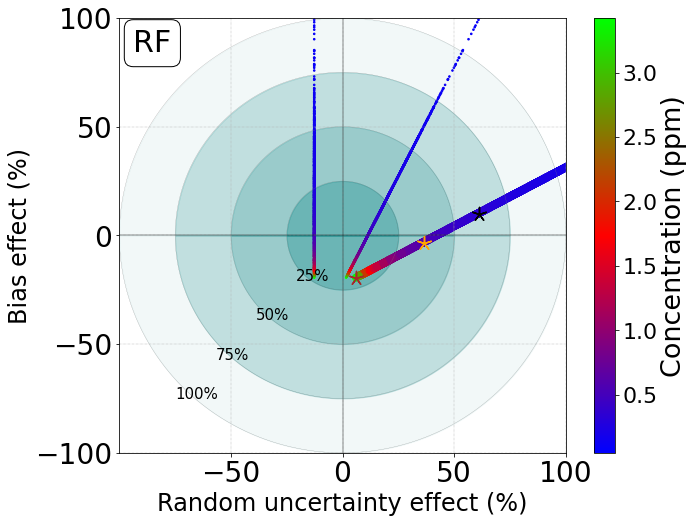

In [96]:
A4=target(pred,y_test,1.4)
theta = np.linspace( 0 , 2 * np.pi , 150 )
r1 =25
a1= r1 * np.cos( theta )
b1= r1 * np.sin( theta )
r2 =50
a2=r2* np.cos( theta )
b2=r2* np.sin( theta )
r3 =75
a3=r3* np.cos( theta )
b3=r3* np.sin( theta )

r4 =100
a4=r4* np.cos( theta )
b4=r4* np.sin( theta )
fig= plt.figure(figsize=(10,8))

plt.Circle((0, 0), 1, color='wheat')
#plt.vlines([0], -130, 130, linestyles='dashed',color='violet')
#plt.hlines([0], -130, 130, linestyles='dashed', color='violet')

plt.fill_between(a1, b1, color='teal', alpha=0.3)
plt.fill_between(a2, b2, color='teal',alpha=0.2)
plt.fill_between(a3, b3, color='teal',alpha=0.2)
plt.fill_between(a4, b4, color='teal',alpha=0.05)

x1=np.arange(0,25.1,0.1)
r1=25
y1=np.sqrt(r1**2-x1**2)
x2=np.arange(0,50.1,0.1)
r2=50
y2=np.sqrt(r2**2-x2**2)

x3=np.arange(0,75.1,0.1)
r3=75
y3=np.sqrt(r3**2-x3**2)

x4=np.arange(0,100.1,0.1)
r4=100
y4=np.sqrt(r4**2-x4**2)

plt.plot(x1,y1, linewidth=0.2, color='grey')
plt.plot(x1,-1*y1, linewidth=0.2, color='grey')
plt.plot(x2,y2, linewidth=0.2, color='grey')
plt.plot(x2,-1*y2, linewidth=0.2, color='grey')
plt.plot(x3,y3, linewidth=0.2, color='grey')
plt.plot(x3,-1*y3, linewidth=0.2, color='grey')
plt.plot(x4,y4, linewidth=0.2, color='grey')
plt.plot(x4,-1*y4, linewidth=0.2, color='grey')

plt.plot(-1*x1,y1, linewidth=0.2, color='grey')
plt.plot(-1*x1,-1*y1, linewidth=0.2, color='grey')
plt.plot(-1*x2,y2, linewidth=0.2, color='grey')
plt.plot(-1*x2,-1*y2, linewidth=0.2, color='grey')
plt.plot(-1*x3,y3, linewidth=0.2, color='grey')
plt.plot(-1*x3,-1*y3, linewidth=0.2, color='grey')
plt.plot(-1*x4,y4, linewidth=0.2, color='grey')
plt.plot(-1*x4,-1*y4, linewidth=0.2, color='grey')

plt.xlabel('Random uncertainty effect (%)',fontsize=24)
plt.ylabel('Bias effect (%)',fontsize=24)
#plt.title('CO',fontsize=18)
color_map = plt.cm.get_cmap('brg')
reversed_color_map = color_map
plt.scatter(A4[0],A4[1],marker='.',s=200,c=np.array(A4[2])/1000,cmap=reversed_color_map)
plt.scatter(A4[3],A4[1],marker='.',s=10,c=np.array(A4[2])/1000,cmap=reversed_color_map)
plt.scatter(A4[4],A4[1],marker='.',s=10,c=np.array(A4[2])/1000,cmap=reversed_color_map)
plt.vlines([0], -130, 130,color='black',linewidth=0.4)
plt.hlines([0], -130, 130, color='black',linewidth=0.4)
plt.grid(linestyle='-.',linewidth=0.4)
plt.ylim(ymin=-100)
plt.ylim(ymax=100)
plt.xlim(xmax=100)
plt.xlim(xmin=-100)
plt.xticks(np.arange(-50,101, 50),fontsize=28)
plt.yticks(np.arange(-100,101, 50),fontsize=28)
#plt.colorbar()
cbar = plt.colorbar()
cbar.ax.tick_params(labelsize=22)
cbar.set_label('Concentration (ppm)', rotation=90,fontsize=27)
plt.scatter(Random,Bias,marker=(5, 2),s=200, color='black')
plt.scatter(Random1,Bias1,marker=(5, 2),s=200, color='brown')
plt.scatter(Random2,Bias2,marker=(5, 2),s=200, color='orange')
textstr = 'RF'
props = dict(boxstyle='round', facecolor='white', alpha=1)
plt.text(0.18, 1.35, textstr, transform=ax.transAxes, fontsize=30,
        verticalalignment='top', bbox=props)
plt.text(-21,-21, '25%',fontsize=15)
plt.text(-39,-39, '50%',fontsize=15)
plt.text(-57,-57, '75%',fontsize=15)
plt.text(-75,-75, '100%',fontsize=15)
plt.show()

In [582]:
A=[i for i in np.arange(1,3,0.05)]
B=[]
for i in A:
    k=REF2(pred,y_test,i,30000)
    B.append(k)
for i in range(len(B)):
    if B[i]==min(B):
        print(A[i])

1.3500000000000003


In [583]:
np.std(pred),np.std(y_test)

(426.3382825251323, 450.7371650417704)

X_Train, X_Test, y_Train, y_Test =train_test_split(X, y, test_size = 0.001)
REU_CO=[]
for i in range(1,30):
    regressor=regressor.fit(X_train[:120*i].drop(['Lab1'], axis=1), y_train[:120*i])
    pred = regressor.predict(X_test.drop(['Lab1'], axis=1))
    reu=REF2(pred,y_test,1.35,30000)
    REU_CO.append(reu) 

## Model 5: ANN

In [584]:
from keras.models import Sequential
from keras.layers import Dense
from keras import optimizers
from sklearn.preprocessing import StandardScaler
model = Sequential()
model.add(Dense(3, input_shape = (6,),kernel_initializer='normal', activation= 'linear'))
model.add(Dense(128,kernel_initializer='normal', activation= 'relu'))
model.add(Dense(128, kernel_initializer='normal',activation= 'relu'))
model.add(Dense(100, kernel_initializer='normal',activation= 'relu'))
model.add(Dense(1,kernel_initializer='normal',activation='linear',))
sgd = optimizers.Adam(learning_rate=0.01)

model.compile(optimizer = sgd, loss = 'mean_squared_error', metrics= ['mse', 'mae'])
model.summary()

Model: "sequential_8"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_38 (Dense)             (None, 3)                 21        
_________________________________________________________________
dense_39 (Dense)             (None, 128)               512       
_________________________________________________________________
dense_40 (Dense)             (None, 128)               16512     
_________________________________________________________________
dense_41 (Dense)             (None, 100)               12900     
_________________________________________________________________
dense_42 (Dense)             (None, 1)                 101       
Total params: 30,046
Trainable params: 30,046
Non-trainable params: 0
_________________________________________________________________


In [585]:
scaler = StandardScaler()
scaler.fit(X_train.drop(['Lab1'], axis=1))
X_train_scaled=scaler.transform(X_train.drop(['Lab1'], axis=1))
X_test_scaled=scaler.transform(X_test.drop(['Lab1'], axis=1))
hist=model.fit(X_train_scaled, y_train, batch_size= 10, epochs=40, verbose= 0)#,validation_split=0.2

In [586]:
train_pred = model.predict(X_train_scaled)
test_pred = model.predict(X_test_scaled)
pred=[]
for i in range(len(test_pred)):
    pred.append(sum(list(test_pred[i])))
Y_test=y_test.to_list()
Y_test=pd.Series(Y_test,index =Index)
Y_test
Pred=pd.Series(pred,index =Index)
Lab1=pd.Series(lab1,index =Index)
sMAPE_lr=round(smape_loss(Y_test,Pred),2)
sMAPE_lab=round (smape_loss(Y_test,Lab1),2)
RMSE_lr=round(np.sqrt(sm.mean_squared_error(y_test, pred)),1)
RMSE_lab=round(np.sqrt(sm.mean_squared_error(y_test, lab1)),1)
Pearson_lr=round(np.corrcoef(y_test, pred)[0, 1],2)
Pearson_lab=round(np.corrcoef(y_test, lab1)[0, 1],2)
sMAPE_ann_CO=sMAPE_lr
RMSE_ann_CO=round(RMSE_lr/np.mean(np.array(y_test)),2)
Pearson_ann_CO=Pearson_lr
R2_ann_CO=round(sm.r2_score(y_test, pred), 2)
RMSE_Ann_CO=RMSE_lr

fig= plt.figure(figsize=(8,6))
ax = fig.add_subplot(111)
ax.patch.set_facecolor('lightblue')
ax.patch.set_alpha(0.3)
plt.plot(index,y_test[A:], color='limegreen',linewidth=3)
plt.plot(index,pred[A:], color='tomato',linewidth=3)
plt.plot(index,lab1[A:], color='#426eff',linewidth=3)
plt.legend(['Ref', 'ANN-Calibrated', 'LAB-Calibrated'], loc = 2, bbox_to_anchor = (0.74,1))
plt.ylabel('CO Concentration(ppb)',fontsize=18)
#plt.text(B-200, C, r'$R^{2}(ANN)=$'+str(R2_ann_CO), fontsize = 14, color='tomato')
#plt.text(B-200, D, r'$R^{2}(Lab)=$'+str(R2_lab_CO), fontsize = 14, color='#426eff')
#plt.text(B-800, C, 'Pearson r(ANN)='+str(Pearson_lr), fontsize = 14, color='tomato')
#plt.text(B-800, D, 'Pearson r(Lab)='+str(Pearson_lab), fontsize = 14, color='#426eff')
#plt.xlabel('Last 200 hours of testing period',fontsize=18)
#plt.title('ANN Calibration vs Laboratory Calibration',fontsize=18)
plt.grid(linestyle='-.',linewidth=0.3)
plt.show()

In [587]:
print("Regressor model performance:")
print("Mean absolute error(MAE) =", round(sm.mean_absolute_error(y_test, pred), 2))
print("Mean squared error(MSE) =", round(sm.mean_squared_error(y_test, pred), 2))
print("Median absolute error =", round(sm.median_absolute_error(y_test, pred), 2))
print("Explain variance score =", round(sm.explained_variance_score(y_test, pred), 2))
print("R2 score =", round(sm.r2_score(y_test, pred), 2))
pred_ann=pred
MBE_ANN_CO=MBE(pred,y_test)/np.std(y_test)
CRMSE_ANN_CO=CRMSE(y_test,pred)/np.std(y_test)

Regressor model performance:
Mean absolute error(MAE) = 88.42
Mean squared error(MSE) = 21628.62
Median absolute error = 50.38
Explain variance score = 0.89
R2 score = 0.89


In [588]:
len(pred_ann)

2322

fig= plt.figure(figsize=(50,6))
ax = fig.add_subplot(111)
ax.patch.set_facecolor('lightblue')
ax.patch.set_alpha(0.3)
plt.plot(index[A:],y_test[A:], color='limegreen',linewidth=3)
plt.plot(index[A:],lab1[A:], color='#426eff',linewidth=3)
plt.plot(index[A:],pred_lr[A:], color='goldenrod',linewidth=3)
plt.plot(index[A:],pred_svr[A:], color='brown',linewidth=3)
plt.plot(index[A:],pred_rf[A:], color='indigo',linewidth=3)
plt.plot(index[A:],pred_ann[A:], color='tomato',linewidth=3)

plt.xlabel('Last 200 hours of testing period',fontsize=18)
plt.ylabel('CO Concentration(ppb)',fontsize=18)
plt.legend(['Ref', 'LAB', 'LR','SVR','RF','ANN'], loc = 2, bbox_to_anchor = (0.95,1))
#plt.title('CO Sensor',fontsize=18 )
plt.grid(linestyle='-.',linewidth=0.3)

Text(0.5, 1.0, 'ANN')

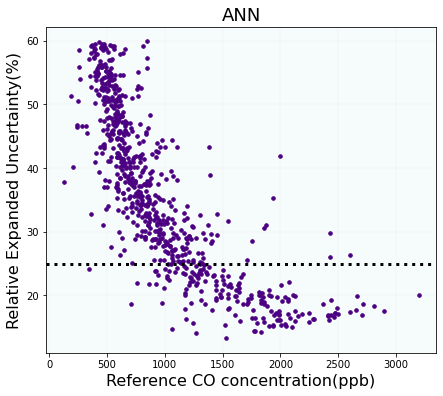

In [589]:
u_cal=REF(pred,y_test,1.4)
fig= plt.figure(figsize=(7,6))
ax = fig.add_subplot(111)
ax.patch.set_facecolor('lightblue')
ax.patch.set_alpha(0.1)
ind=[]
U_cal=[]
Ref=[]
for i in range(len(u_cal)):
    if u_cal[i]<60:
        U_cal.append(u_cal[i])
        Ref.append(y_test[i])
plt.scatter(Ref,U_cal, color='#4B0082',marker='.',s=50)
plt.axhline(y=25, color='black', linestyle=':',linewidth=3)
plt.ylabel('Relative Expanded Uncertainty(%)', fontsize=16)
plt.xlabel('Reference CO concentration(ppb)',fontsize=16)
plt.grid(linestyle='-.',linewidth=0.1)
plt.title('ANN', fontsize=18)

In [590]:
REF2(pred,y_test,1,30000)

14.020937923453975

In [591]:
import random
alpha=1.4
LV=max(y_test)
Cal=0
for i in range(len(y_test)):
    if y_test[i]==LV:
        Cal=pred[i]
cal=np.array(pred)
ref=np.array(y_test)
ref_mean=np.mean(ref)
cal_mean=np.mean(cal)
prec=np.array([20 for i in range(len(ref))])
u=0.001*ref
#cal=np.log(cal)
#ref=np.log(ref)
sx_s=(1/len(ref))*sum((ref-ref_mean)**2)
sy_s=(1/len(cal))*sum((cal-cal_mean)**2)
sxy=(1/len(cal))*sum((cal-cal_mean)*(ref-ref_mean))
#beta_1=((sy_s-sx_s)+np.sqrt((sy_s-sx_s)**2+4*sxy**2))/(2*sxy)
beta_1=((sy_s-alpha*sx_s)+np.sqrt((sy_s-sx_s)**2+4*alpha*sxy**2))/(2*sxy)
beta_0=cal_mean-beta_1*ref_mean
RSS=sum((cal-beta_0-beta_1*ref)**2-(beta_1**2+alpha)*(0.001*LV)**2)
du_s=RSS/(len(cal)-2)
    #Beta_1=((sy_s-sx_s-du_s)+np.sqrt((sy_s-sx_s-du_s)**2+4*sxy**2))/(2*sxy)
Beta_1=((sy_s-alpha*sx_s-du_s)+np.sqrt((sy_s-alpha*sx_s-du_s)**2+4*alpha*sxy**2))/(2*sxy)
Beta_0=cal_mean-Beta_1*ref_mean
P1=(RSS/(len(cal)-2))
P2=(Beta_1**2+alpha)*(0.001*LV)**2+(-2*Beta_1**2+2*Beta_1-1)*(0.001*LV)**2
P3=(Beta_0+(Beta_1-1)*LV)
P=P1+P2+P3
Bias=(2*(P3)/LV)*100
Random=(2*(P1+P2)**0.5/LV)*100


import random
alpha=1.4
LV2=7000
Cal=0
for i in range(len(y_test)):
    if y_test[i]==LV:
        Cal=lab1[i]
cal=np.array(pred)
ref=np.array(y_test)
ref_mean=np.mean(ref)
cal_mean=np.mean(cal)
prec=np.array([20 for i in range(len(ref))])
u=0.001*ref
#cal=np.log(cal)
#ref=np.log(ref)
sx_s=(1/len(ref))*sum((ref-ref_mean)**2)
sy_s=(1/len(cal))*sum((cal-cal_mean)**2)
sxy=(1/len(cal))*sum((cal-cal_mean)*(ref-ref_mean))
#beta_1=((sy_s-sx_s)+np.sqrt((sy_s-sx_s)**2+4*sxy**2))/(2*sxy)
beta_1=((sy_s-alpha*sx_s)+np.sqrt((sy_s-sx_s)**2+4*alpha*sxy**2))/(2*sxy)
beta_0=cal_mean-beta_1*ref_mean
RSS=sum((cal-beta_0-beta_1*ref)**2-(beta_1**2+alpha)*(0.001*LV)**2)
du_s=RSS/(len(cal)-2)
    #Beta_1=((sy_s-sx_s-du_s)+np.sqrt((sy_s-sx_s-du_s)**2+4*sxy**2))/(2*sxy)
Beta_1=((sy_s-alpha*sx_s-du_s)+np.sqrt((sy_s-alpha*sx_s-du_s)**2+4*alpha*sxy**2))/(2*sxy)
Beta_0=cal_mean-Beta_1*ref_mean
P1=(RSS/(len(cal)-2))
P2=(Beta_1**2+alpha)*(0.001*LV2)**2+(-2*Beta_1**2+2*Beta_1-1)*(0.001*LV2)**2
P3=(Beta_0+(Beta_1-1)*LV2)
P=P1+P2+P3
Bias2=(2*(P3)/LV2)*100
Random2=(2*(P1+P2)**0.5/LV2)*100

import random
alpha=1.4
LV1=30000
Cal=0
for i in range(len(y_test)):
    if y_test[i]==LV:
        Cal=lab1[i]
cal=np.array(pred)
ref=np.array(y_test)
ref_mean=np.mean(ref)
cal_mean=np.mean(cal)
prec=np.array([20 for i in range(len(ref))])
u=0.001*ref
#cal=np.log(cal)
#ref=np.log(ref)
sx_s=(1/len(ref))*sum((ref-ref_mean)**2)
sy_s=(1/len(cal))*sum((cal-cal_mean)**2)
sxy=(1/len(cal))*sum((cal-cal_mean)*(ref-ref_mean))
#beta_1=((sy_s-sx_s)+np.sqrt((sy_s-sx_s)**2+4*sxy**2))/(2*sxy)
beta_1=((sy_s-alpha*sx_s)+np.sqrt((sy_s-sx_s)**2+4*alpha*sxy**2))/(2*sxy)
beta_0=cal_mean-beta_1*ref_mean
RSS=sum((cal-beta_0-beta_1*ref)**2-(beta_1**2+alpha)*(0.001*LV1)**2)
du_s=RSS/(len(cal)-2)
    #Beta_1=((sy_s-sx_s-du_s)+np.sqrt((sy_s-sx_s-du_s)**2+4*sxy**2))/(2*sxy)
Beta_1=((sy_s-alpha*sx_s-du_s)+np.sqrt((sy_s-alpha*sx_s-du_s)**2+4*alpha*sxy**2))/(2*sxy)
Beta_0=cal_mean-Beta_1*ref_mean
P1=(RSS/(len(cal)-2))
P2=(Beta_1**2+alpha)*(0.001*LV1)**2+(-2*Beta_1**2+2*Beta_1-1)*(0.001*LV1)**2
P3=(Beta_0+(Beta_1-1)*LV1)
P=P1+P2+P3
Bias1=(2*(P3)/(LV1))*100
Random1=(2*(P1+P2)**0.5/(LV1))*100


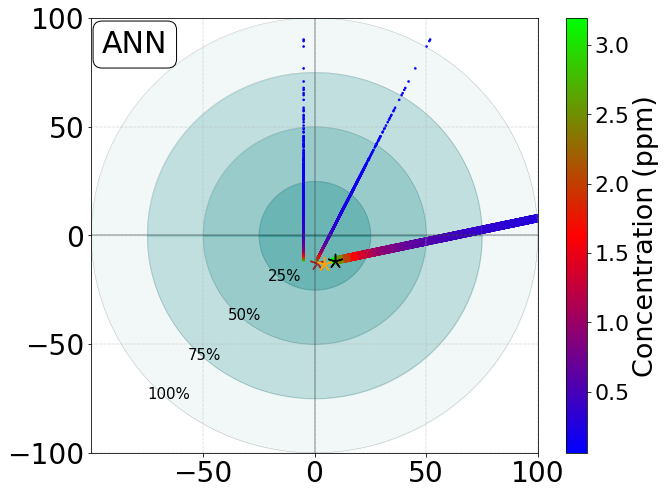

In [592]:
A5=target(pred,y_test,1.4)
theta = np.linspace( 0 , 2 * np.pi , 150 )
r1 =25
a1= r1 * np.cos( theta )
b1= r1 * np.sin( theta )
r2 =50
a2=r2* np.cos( theta )
b2=r2* np.sin( theta )
r3 =75
a3=r3* np.cos( theta )
b3=r3* np.sin( theta )

r4 =100
a4=r4* np.cos( theta )
b4=r4* np.sin( theta )
fig= plt.figure(figsize=(10,8))

plt.Circle((0, 0), 1, color='wheat')
#plt.vlines([0], -130, 130, linestyles='dashed',color='violet')
#plt.hlines([0], -130, 130, linestyles='dashed', color='violet')

plt.fill_between(a1, b1, color='teal', alpha=0.3)
plt.fill_between(a2, b2, color='teal',alpha=0.2)
plt.fill_between(a3, b3, color='teal',alpha=0.2)
plt.fill_between(a4, b4, color='teal',alpha=0.05)

x1=np.arange(0,25.1,0.1)
r1=25
y1=np.sqrt(r1**2-x1**2)
x2=np.arange(0,50.1,0.1)
r2=50
y2=np.sqrt(r2**2-x2**2)

x3=np.arange(0,75.1,0.1)
r3=75
y3=np.sqrt(r3**2-x3**2)

x4=np.arange(0,100.1,0.1)
r4=100
y4=np.sqrt(r4**2-x4**2)

plt.plot(x1,y1, linewidth=0.2, color='grey')
plt.plot(x1,-1*y1, linewidth=0.2, color='grey')
plt.plot(x2,y2, linewidth=0.2, color='grey')
plt.plot(x2,-1*y2, linewidth=0.2, color='grey')
plt.plot(x3,y3, linewidth=0.2, color='grey')
plt.plot(x3,-1*y3, linewidth=0.2, color='grey')
plt.plot(x4,y4, linewidth=0.2, color='grey')
plt.plot(x4,-1*y4, linewidth=0.2, color='grey')

plt.plot(-1*x1,y1, linewidth=0.2, color='grey')
plt.plot(-1*x1,-1*y1, linewidth=0.2, color='grey')
plt.plot(-1*x2,y2, linewidth=0.2, color='grey')
plt.plot(-1*x2,-1*y2, linewidth=0.2, color='grey')
plt.plot(-1*x3,y3, linewidth=0.2, color='grey')
plt.plot(-1*x3,-1*y3, linewidth=0.2, color='grey')
plt.plot(-1*x4,y4, linewidth=0.2, color='grey')
plt.plot(-1*x4,-1*y4, linewidth=0.2, color='grey')

#plt.xlabel('Random uncertainty effect (%)',fontsize=24)
#plt.ylabel('Bias effect (%)',fontsize=24)
#plt.title('CO',fontsize=18)
color_map = plt.cm.get_cmap('brg')
reversed_color_map = color_map
plt.scatter(A5[0],A5[1],marker='.',s=200,c=np.array(A5[2])/1000,cmap=reversed_color_map)
plt.scatter(A5[3],A5[1],marker='.',s=10,c=np.array(A5[2])/1000,cmap=reversed_color_map)
plt.scatter(A5[4],A5[1],marker='.',s=10,c=np.array(A5[2])/1000,cmap=reversed_color_map)
plt.vlines([0], -130, 130,color='black',linewidth=0.4)
plt.hlines([0], -130, 130, color='black',linewidth=0.4)
plt.grid(linestyle='-.',linewidth=0.4)
plt.ylim(ymin=-100)
plt.ylim(ymax=100)
plt.xlim(xmax=100)
plt.xlim(xmin=-100)
plt.xticks(np.arange(-50,101, 50),fontsize=28)
plt.yticks(np.arange(-100,101, 50),fontsize=28)
#plt.colorbar()
cbar = plt.colorbar()
cbar.ax.tick_params(labelsize=22)
cbar.set_label('Concentration (ppm)', rotation=90,fontsize=27)
plt.scatter(Random,Bias,marker=(5, 2),s=200, color='black')
plt.scatter(Random1,Bias1,marker=(5, 2),s=200, color='brown')
plt.scatter(Random2,Bias2,marker=(5, 2),s=200, color='orange')
textstr = 'ANN'
props = dict(boxstyle='round', facecolor='white', alpha=1)
plt.text(0.1, 1.26, textstr, transform=ax.transAxes, fontsize=30,
        verticalalignment='top', bbox=props)
plt.text(-21,-21, '25%',fontsize=15)
plt.text(-39,-39, '50%',fontsize=15)
plt.text(-57,-57, '75%',fontsize=15)
plt.text(-75,-75, '100%',fontsize=15)
plt.show()

In [593]:
A=[i for i in np.arange(1,3,0.05)]
B=[]
for i in A:
    k=REF2(pred,y_test,i,30000)
    B.append(k)
for i in range(len(B)):
    if B[i]==min(B):
        print(A[i])

1.5500000000000005


# Model 6: XGBoost

In [594]:
from xgboost import  XGBRegressor
from numpy import absolute
from pandas import read_csv
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedKFold
# create an xgboost regression model
#n_estimators=10000, max_depth=5, eta=0.01, subsample=0.9,colsample_bytree=0.4,alpha=10
model = XGBRegressor(n_estimators=10000, max_depth=5, eta=0.01, subsample=0.9, 
                     colsample_bytree=0.4,alpha=10)
model.fit(X_train.drop(['Lab1'], axis=1), y_train)

XGBRegressor(alpha=10, base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=0.4, eta=0.01, gamma=0,
             gpu_id=-1, importance_type='gain', interaction_constraints='',
             learning_rate=0.00999999978, max_delta_step=0, max_depth=5,
             min_child_weight=1, missing=nan, monotone_constraints='()',
             n_estimators=10000, n_jobs=0, num_parallel_tree=1, random_state=0,
             reg_alpha=10, reg_lambda=1, scale_pos_weight=1, subsample=0.9,
             tree_method='exact', validate_parameters=1, verbosity=None)

In [595]:
pred = model.predict(X_test.drop(['Lab1'], axis=1))
pred_xgb_co=pred
Y_test=y_test.to_list()
Y_test=pd.Series(Y_test,index =Index)
Y_test
Pred=pd.Series(pred,index =Index)
Lab1=pd.Series(lab1,index =Index)
sMAPE_lr=round(smape_loss(Y_test,Pred),2)
sMAPE_lab=round (smape_loss(Y_test,Lab1),2)
RMSE_lr=round(np.sqrt(sm.mean_squared_error(y_test, pred)),1)
RMSE_lab=round(np.sqrt(sm.mean_squared_error(y_test, lab1)),1)
Pearson_lr=round(np.corrcoef(y_test, pred)[0, 1],2)
Pearson_lab=round(np.corrcoef(y_test, lab1)[0, 1],2)
sMAPE_xgb_CO=sMAPE_lr
RMSE_xgb_CO=RMSE_lr/np.mean(np.array(y_test))
Pearson_xgb_CO=Pearson_lr
R2_xgb_CO=round(sm.r2_score(y_test, pred), 2)
RMSE_Xgb_CO=RMSE_lr

In [596]:
print("Regressor model performance:")
print("Mean absolute error(MAE) =", round(sm.mean_absolute_error(y_test, pred), 2))
print("Mean squared error(MSE) =", round(sm.mean_squared_error(y_test, pred), 2))
print("Median absolute error =", round(sm.median_absolute_error(y_test, pred), 2))
print("Explain variance score =", round(sm.explained_variance_score(y_test, pred), 2))
print("R2 score =", round(sm.r2_score(y_test, pred), 2))
pred_xgb=pred
MBE_XGB_CO=MBE(pred,y_test)/np.std(y_test)
CRMSE_XGB_CO=CRMSE(y_test,pred)/np.std(y_test)

Regressor model performance:
Mean absolute error(MAE) = 83.28
Mean squared error(MSE) = 18451.31
Median absolute error = 50.6
Explain variance score = 0.91
R2 score = 0.91


Text(0.5, 1.0, 'XGBoost')

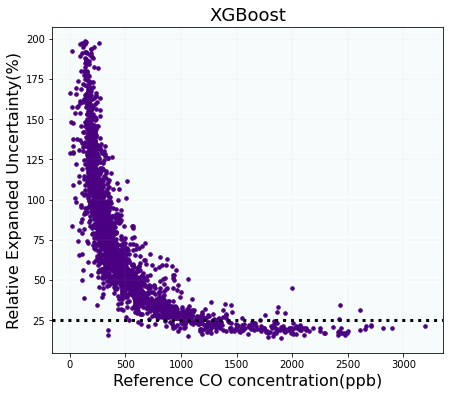

In [597]:
u_cal=REF(pred,y_test,1.4)
fig= plt.figure(figsize=(7,6))
ax = fig.add_subplot(111)
ax.patch.set_facecolor('lightblue')
ax.patch.set_alpha(0.1)
ind=[]
U_cal=[]
Ref=[]
for i in range(len(u_cal)):
    if u_cal[i]<200:
        U_cal.append(u_cal[i])
        Ref.append(y_test[i])
plt.scatter(Ref,U_cal, color='#4B0082',marker='.',s=50)
plt.axhline(y=25, color='black', linestyle=':',linewidth=3)
plt.ylabel('Relative Expanded Uncertainty(%)', fontsize=16)
plt.xlabel('Reference CO concentration(ppb)',fontsize=16)
plt.grid(linestyle='-.',linewidth=0.1)
plt.title('XGBoost', fontsize=18)

In [598]:
import random
alpha=1.4
LV=5000
Cal=0
for i in range(len(y_test)):
    if y_test[i]==LV:
        Cal=pred[i]
cal=np.array(pred)
ref=np.array(y_test)
ref_mean=np.mean(ref)
cal_mean=np.mean(cal)
prec=np.array([20 for i in range(len(ref))])
u=0.001*ref
#cal=np.log(cal)
#ref=np.log(ref)
sx_s=(1/len(ref))*sum((ref-ref_mean)**2)
sy_s=(1/len(cal))*sum((cal-cal_mean)**2)
sxy=(1/len(cal))*sum((cal-cal_mean)*(ref-ref_mean))
#beta_1=((sy_s-sx_s)+np.sqrt((sy_s-sx_s)**2+4*sxy**2))/(2*sxy)
beta_1=((sy_s-alpha*sx_s)+np.sqrt((sy_s-sx_s)**2+4*alpha*sxy**2))/(2*sxy)
beta_0=cal_mean-beta_1*ref_mean
RSS=sum((cal-beta_0-beta_1*ref)**2-(beta_1**2+alpha)*(0.001*LV)**2)
du_s=RSS/(len(cal)-2)
    #Beta_1=((sy_s-sx_s-du_s)+np.sqrt((sy_s-sx_s-du_s)**2+4*sxy**2))/(2*sxy)
Beta_1=((sy_s-alpha*sx_s-du_s)+np.sqrt((sy_s-alpha*sx_s-du_s)**2+4*alpha*sxy**2))/(2*sxy)
Beta_0=cal_mean-Beta_1*ref_mean
P1=(RSS/(len(cal)-2))
P2=(Beta_1**2+alpha)*(0.001*LV)**2+(-2*Beta_1**2+2*Beta_1-1)*(0.001*LV)**2
P3=(Beta_0+(Beta_1-1)*LV)
P=P1+P2+P3
Bias=(2*(P3)/LV)*100
Random=(2*(P1+P2)**0.5/LV)*100

import random
alpha=1.4
LV2=7000
Cal=0
for i in range(len(y_test)):
    if y_test[i]==LV:
        Cal=lab1[i]
cal=np.array(pred)
ref=np.array(y_test)
ref_mean=np.mean(ref)
cal_mean=np.mean(cal)
prec=np.array([20 for i in range(len(ref))])
u=0.001*ref
#cal=np.log(cal)
#ref=np.log(ref)
sx_s=(1/len(ref))*sum((ref-ref_mean)**2)
sy_s=(1/len(cal))*sum((cal-cal_mean)**2)
sxy=(1/len(cal))*sum((cal-cal_mean)*(ref-ref_mean))
#beta_1=((sy_s-sx_s)+np.sqrt((sy_s-sx_s)**2+4*sxy**2))/(2*sxy)
beta_1=((sy_s-alpha*sx_s)+np.sqrt((sy_s-sx_s)**2+4*alpha*sxy**2))/(2*sxy)
beta_0=cal_mean-beta_1*ref_mean
RSS=sum((cal-beta_0-beta_1*ref)**2-(beta_1**2+alpha)*(0.001*LV)**2)
du_s=RSS/(len(cal)-2)
    #Beta_1=((sy_s-sx_s-du_s)+np.sqrt((sy_s-sx_s-du_s)**2+4*sxy**2))/(2*sxy)
Beta_1=((sy_s-alpha*sx_s-du_s)+np.sqrt((sy_s-alpha*sx_s-du_s)**2+4*alpha*sxy**2))/(2*sxy)
Beta_0=cal_mean-Beta_1*ref_mean
P1=(RSS/(len(cal)-2))
P2=(Beta_1**2+alpha)*(0.001*LV2)**2+(-2*Beta_1**2+2*Beta_1-1)*(0.001*LV2)**2
P3=(Beta_0+(Beta_1-1)*LV2)
P=P1+P2+P3
Bias2=(2*(P3)/LV2)*100
Random2=(2*(P1+P2)**0.5/LV2)*100

import random
alpha=1.4
LV1=30000
Cal=0
for i in range(len(y_test)):
    if y_test[i]==LV:
        Cal=lab1[i]
cal=np.array(pred)
ref=np.array(y_test)
ref_mean=np.mean(ref)
cal_mean=np.mean(cal)
prec=np.array([20 for i in range(len(ref))])
u=0.001*ref
#cal=np.log(cal)
#ref=np.log(ref)
sx_s=(1/len(ref))*sum((ref-ref_mean)**2)
sy_s=(1/len(cal))*sum((cal-cal_mean)**2)
sxy=(1/len(cal))*sum((cal-cal_mean)*(ref-ref_mean))
#beta_1=((sy_s-sx_s)+np.sqrt((sy_s-sx_s)**2+4*sxy**2))/(2*sxy)
beta_1=((sy_s-alpha*sx_s)+np.sqrt((sy_s-sx_s)**2+4*alpha*sxy**2))/(2*sxy)
beta_0=cal_mean-beta_1*ref_mean
RSS=sum((cal-beta_0-beta_1*ref)**2-(beta_1**2+alpha)*(0.001*LV1)**2)
du_s=RSS/(len(cal)-2)
    #Beta_1=((sy_s-sx_s-du_s)+np.sqrt((sy_s-sx_s-du_s)**2+4*sxy**2))/(2*sxy)
Beta_1=((sy_s-alpha*sx_s-du_s)+np.sqrt((sy_s-alpha*sx_s-du_s)**2+4*alpha*sxy**2))/(2*sxy)
Beta_0=cal_mean-Beta_1*ref_mean
P1=(RSS/(len(cal)-2))
P2=(Beta_1**2+alpha)*(0.001*LV1)**2+(-2*Beta_1**2+2*Beta_1-1)*(0.001*LV1)**2
P3=(Beta_0+(Beta_1-1)*LV1)
P=P1+P2+P3
Bias1=(2*(P3)/(LV1))*100
Random1=(2*(P1+P2)**0.5/(LV1))*100

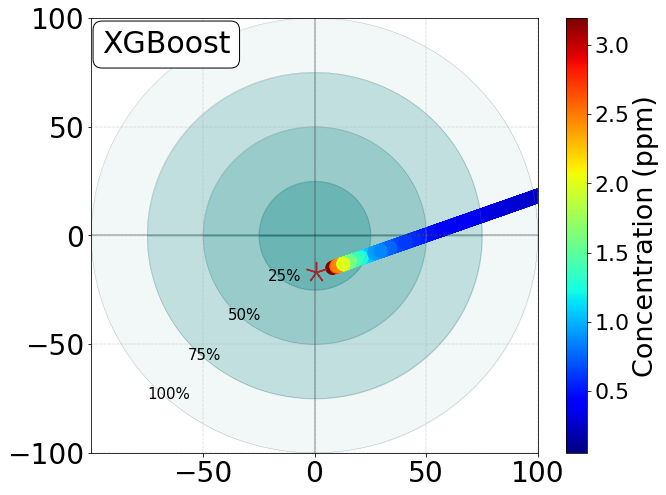

In [599]:
A6=target(pred,y_test,1.4)
theta = np.linspace( 0 , 2 * np.pi , 150 )
r1 =25
a1= r1 * np.cos( theta )
b1= r1 * np.sin( theta )
r2 =50
a2=r2* np.cos( theta )
b2=r2* np.sin( theta )
r3 =75
a3=r3* np.cos( theta )
b3=r3* np.sin( theta )

r4 =100
a4=r4* np.cos( theta )
b4=r4* np.sin( theta )
fig= plt.figure(figsize=(10,8))

plt.Circle((0, 0), 1, color='wheat')
#plt.vlines([0], -130, 130, linestyles='dashed',color='violet')
#plt.hlines([0], -130, 130, linestyles='dashed', color='violet')

plt.fill_between(a1, b1, color='teal', alpha=0.3)
plt.fill_between(a2, b2, color='teal',alpha=0.2)
plt.fill_between(a3, b3, color='teal',alpha=0.2)
plt.fill_between(a4, b4, color='teal',alpha=0.05)

x1=np.arange(0,25.1,0.1)
r1=25
y1=np.sqrt(r1**2-x1**2)
x2=np.arange(0,50.1,0.1)
r2=50
y2=np.sqrt(r2**2-x2**2)

x3=np.arange(0,75.1,0.1)
r3=75
y3=np.sqrt(r3**2-x3**2)

x4=np.arange(0,100.1,0.1)
r4=100
y4=np.sqrt(r4**2-x4**2)

plt.plot(x1,y1, linewidth=0.2, color='grey')
plt.plot(x1,-1*y1, linewidth=0.2, color='grey')
plt.plot(x2,y2, linewidth=0.2, color='grey')
plt.plot(x2,-1*y2, linewidth=0.2, color='grey')
plt.plot(x3,y3, linewidth=0.2, color='grey')
plt.plot(x3,-1*y3, linewidth=0.2, color='grey')
plt.plot(x4,y4, linewidth=0.2, color='grey')
plt.plot(x4,-1*y4, linewidth=0.2, color='grey')

plt.plot(-1*x1,y1, linewidth=0.2, color='grey')
plt.plot(-1*x1,-1*y1, linewidth=0.2, color='grey')
plt.plot(-1*x2,y2, linewidth=0.2, color='grey')
plt.plot(-1*x2,-1*y2, linewidth=0.2, color='grey')
plt.plot(-1*x3,y3, linewidth=0.2, color='grey')
plt.plot(-1*x3,-1*y3, linewidth=0.2, color='grey')
plt.plot(-1*x4,y4, linewidth=0.2, color='grey')
plt.plot(-1*x4,-1*y4, linewidth=0.2, color='grey')

#plt.xlabel('Random uncertainty effect (%)',fontsize=24)
#plt.ylabel('Bias effect (%)',fontsize=24)
#plt.title('CO',fontsize=18)
color_map = plt.cm.get_cmap('jet')
reversed_color_map= color_map
#plt.scatter(A1[0],A1[1],marker='.',s=20,c=np.array(A1[2])/1000,cmap=color_map)
#plt.scatter(A2[0],A2[1],marker='.',s=20,c=np.array(A2[2])/1000,cmap=reversed_color_map)
#plt.scatter(A3[0],A3[1],marker='.',s=20,c=np.array(A3[2])/1000,cmap=reversed_color_map)
#plt.scatter(A4[0],A4[1],marker='.',s=20,c=np.array(A4[2])/1000,cmap=reversed_color_map)
#plt.scatter(A5[0],A5[1],marker='.',s=20,c=np.array(A5[2])/1000,cmap=reversed_color_map)
plt.scatter(A6[0],A6[1],marker='.',s=700,c=np.array(A6[2])/1000,cmap=reversed_color_map)
#plt.scatter(A[3],A[1],marker='.',s=10,c=np.array(A[2])/1000,cmap=reversed_color_map)
#plt.scatter(A[4],A[1],marker='.',s=10,c=np.array(A[2])/1000,cmap=reversed_color_map)
plt.vlines([0], -130, 130,color='black',linewidth=0.4)
plt.hlines([0], -130, 130, color='black',linewidth=0.4)
plt.grid(linestyle='-.',linewidth=0.4)
plt.ylim(ymin=-100)
plt.ylim(ymax=100)
plt.xlim(xmax=100)
plt.xlim(xmin=-100)
plt.xticks(np.arange(-50,101, 50),fontsize=28)
plt.yticks(np.arange(-100,101, 50),fontsize=28)
#plt.colorbar()
cbar = plt.colorbar()
cbar.ax.tick_params(labelsize=22)
cbar.set_label('Concentration (ppm)', rotation=90,fontsize=27)
#plt.scatter(Random,Bias,marker=(5, 2),s=200, color='black')
plt.scatter(Random1,Bias1,marker=(5, 2),s=400, color='brown')
#plt.scatter(Random2,Bias2,marker=(5, 2),s=200, color='orange')
textstr = 'XGBoost'
props = dict(boxstyle='round', facecolor='white', alpha=1)
plt.text(0.1, 1.26, textstr, transform=ax.transAxes, fontsize=30,
        verticalalignment='top', bbox=props)
plt.text(-21,-21, '25%',fontsize=15)
plt.text(-39,-39, '50%',fontsize=15)
plt.text(-57,-57, '75%',fontsize=15)
plt.text(-75,-75, '100%',fontsize=15)
plt.show()

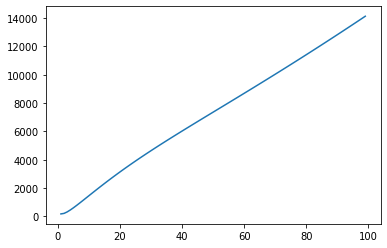

In [600]:
B=[]
for i in range(1,100):
    U=REF2(Lab1,y_test,i,30000)
    B.append(U)
ind=[i for i in range(1,100)]
plt.plot(ind,B)

In [601]:
A=[i for i in np.arange(1,3,0.05)]
B=[]
for i in A:
    k=REF2(pred,y_test,i,30000)
    B.append(k)
for i in range(len(B)):
    if B[i]==min(B):
        print(A[i])

1.4000000000000004


# NO2 Calibration

In [602]:
import pandas as pd
import scipy.io
import numpy as np
data = pd.read_csv('O3.txt', header = None,low_memory=False)
data.columns=['AE','WE','Temp','RH','Time']
Time=data['Time'].to_list()
time=[]
for i in range(len(Time)):
    time.append(float(abs(Time[i])))
Time=np.array(time)
Date=pd.to_datetime(Time-719529,unit='d').round('s')
data['Date'] = Date.tolist()
data=data.set_index('Date')
data.drop('Time',axis = 1, inplace = True)
data=data.resample('5min').mean()
Data_O3=data
Data_O3['Ref']=Ref_O3
WE=Data_O3['WE'].to_list()
AE=Data_O3['AE'].to_list()
signal=np.array(WE)-np.array(AE)
Data_O3['Net Signal']=signal
Data_O3['Month']=Data_O3.index.month
Data_O3['Day_of_week']=Data_O3.index.dayofweek
Data_O3['Day']=Data_O3.index.day
Data_O3['Hour']=Data_O3.index.hour
O3_Data=Data_O3
O3_Data=O3_Data[(O3_Data[O3_Data.columns] >= 0).all(axis=1)]
O3_Data=O3_Data.dropna()
data = pd.read_csv('Conc_O3.txt', header = None,low_memory=False)
data.columns=['Lab1','Temp','RH','Time','Ref']
Time=data['Time'].to_list()
time=[]
for i in range(len(Time)):
    time.append(float(abs(Time[i])))
Time=np.array(time)
Date=pd.to_datetime(Time-719529,unit='d').round('s')
data['Date'] = Date.tolist()
data=data.set_index('Date')
data.drop('Time',axis = 1, inplace = True)
data=data.resample('5min').mean()
Data_O3=data
signal=np.array(WE)-np.array(AE)
Data_O3['Net Signal']=signal
Data_O3['Month']=Data_O3.index.month
Data_O3['Day_of_week']=Data_O3.index.dayofweek
Data_O3['Day']=Data_O3.index.day
Data_O3['Hour']=Data_O3.index.hour
O3_Data=Data_O3
O3_Data=O3_Data[(O3_Data[O3_Data.columns] >= 0).all(axis=1)]
O3_Data=O3_Data.dropna() 
O3_Data=O3_Data.resample('h').mean()
O3_Data=O3_Data.dropna()
O3_Data.head()

ref_O3=Data_O3['Ref'].to_list()
len(ref_O3)

60913

In [603]:
import pandas as pd
import scipy.io
import numpy as np
data = pd.read_csv('NO2.txt', header = None,low_memory=False)
data.columns=['WE','AE','Temp','RH','Time']
Time=data['Time'].to_list()
time=[]
for i in range(len(Time)):
    time.append(float(abs(Time[i])))
Time=np.array(time)
Date=pd.to_datetime(Time-719529,unit='d').round('s')
data['Date'] = Date.tolist()
data=data.set_index('Date')
data.drop('Time',axis = 1, inplace = True)
data=data.resample('5min').mean()
Data_NO2=data
Data_NO2['Ref']=Ref_NO2
WE=Data_NO2['WE'].to_list()
AE=Data_NO2['AE'].to_list()
signal=np.array(WE)-np.array(AE)
Data_NO2['Net Signal']=signal
Data_NO2['Month']=Data_NO2.index.month
Data_NO2['Day_of_week']=Data_NO2.index.dayofweek
Data_NO2['Day']=Data_NO2.index.day
Data_NO2['Hour']=Data_NO2.index.hour
NO2_Data=Data_NO2
NO2_Data=NO2_Data[(NO2_Data[NO2_Data.columns] >= 0).all(axis=1)]
NO2_Data=NO2_Data.dropna()
data = pd.read_csv('Conc_NO2.txt', header = None,low_memory=False)
data.columns=['Lab1','Temp','RH','Time','Ref']
Time=data['Time'].to_list()
time=[]
subscript = str.maketrans("0123456789", "₀₁₂₃₄₅₆₇₈₉") 
for i in range(len(Time)):
    time.append(float(abs(Time[i])))
Time=np.array(time)
Date=pd.to_datetime(Time-719529,unit='d').round('s')
data['Date'] = Date.tolist()
data=data.set_index('Date')
data.drop('Time',axis = 1, inplace = True)
data=data.resample('5min').mean()
Data_NO2=data
signal=np.array(WE)-np.array(AE)
Data_NO2['Net Signal']=signal
Data_NO2['Month']=Data_NO2.index.month
Data_NO2['Day_of_week']=Data_NO2.index.dayofweek
Data_NO2['Day']=Data_NO2.index.day
Data_NO2['Hour']=Data_NO2.index.hour
Data_NO2['Ref_O3']=ref_O3
NO2_Data=Data_NO2
NO2_Data=NO2_Data[(NO2_Data[NO2_Data.columns] >= 0).all(axis=1)]
NO2_Data=NO2_Data.dropna()
NO2_Data=NO2_Data.resample('20min').mean()
NO2_Data=NO2_Data.dropna()
NO2_Data.head()

,Lab1,Temp,RH,Ref,Net Signal,Month,Day_of_week,Day,Hour,Ref_O3
Date,,,,,,,,,,
2019-10-02 11:40:00,460.448301,26.378438,58.063437,15.230400,7.850000,10.0,2.0,2.0,11.0,46.094860
2019-10-02 12:00:00,794.371300,25.632544,48.527009,6.653971,25.045773,10.0,2.0,2.0,12.0,56.858942
2019-10-02 12:20:00,82.998996,26.120078,47.716553,2.844210,13.152720,10.0,2.0,2.0,12.0,58.880540
2019-10-02 15:40:00,566.301152,30.418466,50.153181,10.084125,9.323533,10.0,2.0,2.0,15.0,40.068225
2019-10-03 15:40:00,84.482370,29.421250,52.411845,12.621282,22.596524,10.0,3.0,3.0,15.0,33.473237


In [604]:
def REF(pred,y_test,alpha):
    import random
    cal=np.array(pred)
    ref=np.array(y_test.to_list())
    ref_mean=np.mean(ref)
    cal_mean=np.mean(cal)
    prec=np.array([0.4 for i in range(len(ref))])
    u=np.maximum(prec,0.005*ref)
    #cal=np.log(cal)
    #ref=np.log(ref)
    sx_s=(1/len(ref))*sum((ref-ref_mean)**2)
    sy_s=(1/len(cal))*sum((cal-cal_mean)**2)
    sxy=(1/len(cal))*sum((cal-cal_mean)*(ref-ref_mean))
    beta_1=((sy_s-alpha*sx_s)+np.sqrt((sy_s-sx_s)**2+4*alpha*sxy**2))/(2*sxy)
    beta_0=cal_mean-beta_1*ref_mean
    RSS=sum((cal-beta_0-beta_1*ref)**2-(beta_1**2+alpha)*u**2)
    du_s=RSS/(len(cal)-2)
    Beta_1=((sy_s-alpha*sx_s-du_s)+np.sqrt((sy_s-alpha*sx_s-du_s)**2+4*alpha*sxy**2))/(2*sxy)
    Beta_0=cal_mean-Beta_1*ref_mean
    P1=(RSS/(len(cal)-2))
    P2=(Beta_1**2+alpha)*u**2+(-2*Beta_1**2+2*Beta_1-1)*u**2
    P3=(Beta_0+(Beta_1-1)*ref)**2
    P=[]
    for i in range(len(P3)):
        P.append(P1+P2[i]+P3[i])
    for i in range(len(P)):
        if P[i]<0:
            P[i]=random.randint(1,100)
    u_cal=(2*np.sqrt(np.array(P))/cal)*100
    #u_cal=((2*np.sqrt((RSS/(len(cal)-2))+(1-(beta_1-1)**2)*(0.08*ref)**2+(Beta_0+(Beta_1-1)*ref)**2))/cal)*100
    return u_cal  

In [605]:
def REF2(pred,y_test,alpha,LV):
    import random
    cal=np.array(pred)
    ref=np.array(y_test.to_list())
    ref_mean=np.mean(ref)
    cal_mean=np.mean(cal)
    prec=np.array([0.4 for i in range(len(ref))])
    u=0.001*ref
    #cal=np.log(cal)
    #ref=np.log(ref)
    sx_s=(1/len(ref))*sum((ref-ref_mean)**2)
    sy_s=(1/len(cal))*sum((cal-cal_mean)**2)
    sxy=(1/len(cal))*sum((cal-cal_mean)*(ref-ref_mean))
    #beta_1=((sy_s-sx_s)+np.sqrt((sy_s-sx_s)**2+4*sxy**2))/(2*sxy)
    beta_1=((sy_s-alpha*sx_s)+np.sqrt((sy_s-sx_s)**2+4*alpha*sxy**2))/(2*sxy)
    beta_0=cal_mean-beta_1*ref_mean
    RSS=sum((cal-beta_0-beta_1*ref)**2-(beta_1**2+alpha)*(0.001*LV)**2)
    du_s=RSS/(len(cal)-2)
    #Beta_1=((sy_s-sx_s-du_s)+np.sqrt((sy_s-sx_s-du_s)**2+4*sxy**2))/(2*sxy)
    Beta_1=((sy_s-alpha*sx_s-du_s)+np.sqrt((sy_s-alpha*sx_s-du_s)**2+4*alpha*sxy**2))/(2*sxy)
    Beta_0=cal_mean-Beta_1*ref_mean
    P1=(RSS/(len(cal)-2))
    P2=(Beta_1**2+alpha)*(0.001*LV)**2+(-2*Beta_1**2+2*Beta_1-1)*(0.001*LV)**2
    P3=(Beta_0+(Beta_1-1)*LV)**2
    P=P1+P2+P3
    if P<0:
        P=random.randint(1,100)
    u_cal=(2*np.sqrt(P)/(Beta_0+Beta_1*LV))*100
    #u_cal=((2*np.sqrt((RSS/(len(cal)-2))+(1-(beta_1-1)**2)*0.1+(Beta_0+(Beta_1-1)*ref)**2))/cal)*100
    return u_cal  

In [606]:
def target(pred,y_test,alpha):
    import random
    cal=np.array(pred)
    ref=np.array(y_test.to_list())
    ref_mean=np.mean(ref)
    cal_mean=np.mean(cal)
    prec=np.array([0.4 for i in range(len(ref))])
    u=np.maximum(prec, 0.005*ref)
    #u=0.01*ref
    #cal=np.log(cal)
    #ref=np.log(ref)
    sx_s=(1/len(ref))*sum((ref-ref_mean)**2)
    sy_s=(1/len(cal))*sum((cal-cal_mean)**2)
    sxy=(1/len(cal))*sum((cal-cal_mean)*(ref-ref_mean))
    #beta_1=((sy_s-sx_s)+np.sqrt((sy_s-sx_s)**2+4*sxy**2))/(2*sxy)
    beta_1=((sy_s-alpha*sx_s)+np.sqrt((sy_s-sx_s)**2+4*alpha*sxy**2))/(2*sxy)
    beta_0=cal_mean-beta_1*ref_mean
    RSS=sum((cal-beta_0-beta_1*ref)**2-(beta_1**2+alpha)*u**2)
    du_s=RSS/(len(cal)-2)
    #Beta_1=((sy_s-sx_s-du_s)+np.sqrt((sy_s-sx_s-du_s)**2+4*sxy**2))/(2*sxy)
    Beta_1=((sy_s-alpha*sx_s-du_s)+np.sqrt((sy_s-alpha*sx_s-du_s)**2+4*alpha*sxy**2))/(2*sxy)
    Beta_0=cal_mean-Beta_1*ref_mean
    P1=(RSS/(len(cal)-2))
    P2=(Beta_1**2+alpha)*u**2+(-2*Beta_1**2+2*Beta_1-1)*u**2
    P3=(Beta_0+(Beta_1-1)*ref)
    P=[]
    for i in range(len(P2)):
        P.append(P1+P2[i])
    for i in range(len(P)):
        if P[i]<0:
            P[i]=random.randint(1,50)
    A=(2*(np.array(P))**0.5/ref)*100
    #for i in range(len(P3)):
        #if P3[i]<0:
            #P3[i]=random.randint(0,50)
    B=(2*(np.array(P3))/ref)*100
    bias=[]
    random=[]
    Ref=[]
    part1=(Beta_0/ref)*100
    part=[beta_1-1 for i in range(len(ref))]
    part2=(np.array(part))*100
    PART1=[]
    PART2=[]
    for i in range(len(A)):
        if A[i]<500:
            random.append(A[i])
            bias.append(B[i])
            Ref.append(ref[i])
            PART1.append(part1[i])
            PART2.append(part2[i])
    return [random,bias,Ref, PART1,PART2]

In [607]:
#Ref=NO2_Data['Ref'].to_list()
#NO2_Data=NO2_Data[NO2_Data.Ref.between(np.mean(Ref)-1*np.std(Ref), np.mean(Ref)+1*np.std(Ref))]
#NO2_Data.shape

## Model 1: Linear Regression (LR)

In [608]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error as mae
import sklearn.metrics as sm
import matplotlib.pyplot as plt
#'Ref_CO','Ref_SO2','Ref_O3',
#,'Month','Day_of_week','Day','Hour'
X=NO2_Data[['Net Signal','Lab1','Temp','RH','Month','Day_of_week','Hour','Ref_O3']]#'Ref_O3'
y=NO2_Data['Ref']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2)
len(X_test)

2185

In [609]:
lr = LinearRegression()
model = lr.fit(X_train.drop(['Lab1'], axis=1), y_train)
pred = model.predict(X_test.drop(['Lab1'], axis=1))
lab1=X_test['Lab1'].to_list()
for i in range(len(lab1)):
    if lab1[i]>100:
        lab1[i]=np.mean(lab1)
index=[i for i in range(len(y_test))]
Y_test=y_test.to_list()
Y_test=pd.Series(Y_test,index =index)
Y_test
Pred=pd.Series(pred,index =index)
Lab1=pd.Series(lab1,index =index)
sMAPE_lr=round(smape_loss(Y_test,Pred),2)
sMAPE_lab=round (smape_loss(Y_test,Lab1),2)
RMSE_lr=round(np.sqrt(sm.mean_squared_error(y_test, pred)),1)
RMSE_lab=round(np.sqrt(sm.mean_squared_error(y_test, lab1)),1)
Pearson_lr=round(np.corrcoef(y_test, pred)[0, 1],2)
Pearson_lab=round(np.corrcoef(y_test, lab1)[0, 1],2)
sMAPE_lr_NO2=sMAPE_lr
RMSE_lr_NO2=round(RMSE_lr/np.mean(np.array(y_test)),2)
Pearson_lr_NO2=Pearson_lr
sMAPE_lab_NO2=sMAPE_lab
RMSE_lab_NO2=round(RMSE_lab/np.mean(np.array(lab1)),2)
Pearson_lab_NO2=Pearson_lab
R2_lr_NO2=round(sm.r2_score(y_test, pred), 2)
R2_lab_NO2=round(sm.r2_score(y_test, lab1), 2)
RMSE_Lr_NO2=RMSE_lr
RMSE_Lab_NO2=RMSE_lab

A=len(y_test)-200
B=120
D=max(y_test[A:])-0.15*max(y_test[A:])
C=max(y_test[A:])-0.05*max(y_test[A:])
Pearson_lr_NO2,R2_lr_NO2,RMSE_Lr_NO2

(0.9, 0.81, 5.2)

subscript = str.maketrans("0123456789", "₀₁₂₃₄₅₆₇₈₉")
fig= plt.figure(figsize=(8,6))
index=[i for i in range(1,201)]
ax = fig.add_subplot(111)
ax.patch.set_facecolor('lightblue')
ax.patch.set_alpha(0.3)
plt.plot(index,y_test[A:], color='limegreen',linewidth=3)
plt.plot(index,pred[A:], color='#513e00',linewidth=3)
plt.plot(index,lab1[A:], color='#426eff',linewidth=3)
plt.legend(['Ref', 'LR-Calibrated', 'LAB-Calibrated'], loc = 2, bbox_to_anchor = (0.75,1))
plt.ylabel('NO2 Concentration(ppb)'.translate(subscript),fontsize=18)
#plt.text(B-150, C,r'$R^{2}(LR)=$'+str(R2_lr_NO2) , fontsize = 14, color='#513e00')
#plt.text(B-150, D,r'$R^{2}(Lab)=$'+str(R2_lab_NO2) , fontsize = 14, color='#426eff')
#plt.text(B-700, C, 'Pearson r(LR)='+str(Pearson_lr), fontsize = 14, color='#513e00')
#plt.text(B-700, D, 'Pearson r(Lab)='+str(Pearson_lab), fontsize = 14, color='#426eff')
#plt.xlabel('Last 200 hours of testing period',fontsize=18)
#plt.title('Linear Regression Calibration vs Laboratory Calibration',fontsize=18)
plt.grid(linestyle='-.',linewidth=0.3)
plt.show()

In [610]:
print("Regressor model performance:")
print("Mean absolute error(MAE) =", round(sm.mean_absolute_error(y_test, pred), 2))
print("Mean squared error(MSE) =", round(sm.mean_squared_error(y_test, pred), 2))
print("Median absolute error =", round(sm.median_absolute_error(y_test, pred), 2))
print("Explain variance score =", round(sm.explained_variance_score(y_test, pred), 2))
print("R2 score =", round(sm.r2_score(y_test, pred), 2))

MBE_LR_NO2=MBE(pred,y_test)/np.std(y_test)
CRMSE_LR_NO2=CRMSE(y_test,pred)/np.std(y_test)
MBE_LAB_NO2=MBE(lab1,y_test)/(2.6*np.std(y_test))
CRMSE_LAB_NO2=CRMSE(y_test,lab1)/(2.6*np.std(y_test))
pred_lr=pred

Regressor model performance:
Mean absolute error(MAE) = 4.03
Mean squared error(MSE) = 26.95
Median absolute error = 3.37
Explain variance score = 0.81
R2 score = 0.81


In [611]:
import random
alpha=1.4
LV=max(y_test)
Cal=0
for i in range(len(y_test)):
    if y_test[i]==LV:
        Cal=pred[i]
cal=np.array(lab1)
ref=np.array(y_test)
ref_mean=np.mean(ref)
cal_mean=np.mean(cal)
prec=np.array([0.4 for i in range(len(ref))])
u=0.005*ref
#cal=np.log(cal)
#ref=np.log(ref)
sx_s=(1/len(ref))*sum((ref-ref_mean)**2)
sy_s=(1/len(cal))*sum((cal-cal_mean)**2)
sxy=(1/len(cal))*sum((cal-cal_mean)*(ref-ref_mean))
#beta_1=((sy_s-sx_s)+np.sqrt((sy_s-sx_s)**2+4*sxy**2))/(2*sxy)
beta_1=((sy_s-alpha*sx_s)+np.sqrt((sy_s-sx_s)**2+4*alpha*sxy**2))/(2*sxy)
beta_0=cal_mean-beta_1*ref_mean
RSS=sum((cal-beta_0-beta_1*ref)**2-(beta_1**2+alpha)*(0.001*LV)**2)
du_s=RSS/(len(cal)-2)
    #Beta_1=((sy_s-sx_s-du_s)+np.sqrt((sy_s-sx_s-du_s)**2+4*sxy**2))/(2*sxy)
Beta_1=((sy_s-alpha*sx_s-du_s)+np.sqrt((sy_s-alpha*sx_s-du_s)**2+4*alpha*sxy**2))/(2*sxy)
Beta_0=cal_mean-Beta_1*ref_mean
P1=(RSS/(len(cal)-2))
P2=(Beta_1**2+alpha)*(0.001*LV)**2+(-2*Beta_1**2+2*Beta_1-1)*(0.001*LV)**2
P3=(Beta_0+(Beta_1-1)*LV)
P=P1+P2+P3
Bias=(2*(P3)/LV)*100
Random=(2*(P1+P2)**0.5/LV)*100

import random
alpha=1.4
LV1=200
Cal=0
for i in range(len(y_test)):
    if y_test[i]==LV:
        Cal=lab1[i]
cal=np.array(lab1)
ref=np.array(y_test)
ref_mean=np.mean(ref)
cal_mean=np.mean(cal)
prec=np.array([0.4 for i in range(len(ref))])
u=0.005*ref
#cal=np.log(cal)
#ref=np.log(ref)
sx_s=(1/len(ref))*sum((ref-ref_mean)**2)
sy_s=(1/len(cal))*sum((cal-cal_mean)**2)
sxy=(1/len(cal))*sum((cal-cal_mean)*(ref-ref_mean))
#beta_1=((sy_s-sx_s)+np.sqrt((sy_s-sx_s)**2+4*sxy**2))/(2*sxy)
beta_1=((sy_s-alpha*sx_s)+np.sqrt((sy_s-sx_s)**2+4*alpha*sxy**2))/(2*sxy)
beta_0=cal_mean-beta_1*ref_mean
RSS=sum((cal-beta_0-beta_1*ref)**2-(beta_1**2+alpha)*(0.001*LV1)**2)
du_s=RSS/(len(cal)-2)
    #Beta_1=((sy_s-sx_s-du_s)+np.sqrt((sy_s-sx_s-du_s)**2+4*sxy**2))/(2*sxy)
Beta_1=((sy_s-alpha*sx_s-du_s)+np.sqrt((sy_s-alpha*sx_s-du_s)**2+4*alpha*sxy**2))/(2*sxy)
Beta_0=cal_mean-Beta_1*ref_mean
P1=(RSS/(len(cal)-2))
P2=(Beta_1**2+alpha)*(0.001*LV1)**2+(-2*Beta_1**2+2*Beta_1-1)*(0.001*LV1)**2
P3=(Beta_0+(Beta_1-1)*LV1)
P=P1+P2+P3
Bias1=(2*(P3)/(LV1))*100
Random1=(2*(P1+P2)**0.5/(LV1))*100

In [612]:
A=target(lab1,y_test,1.4)

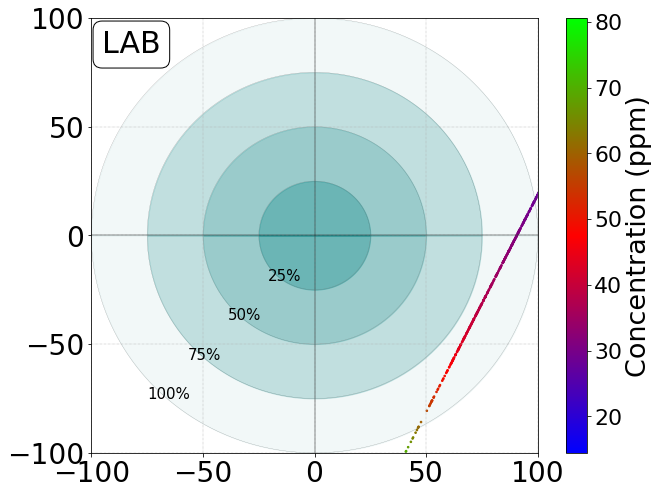

In [613]:
A=target(lab1,y_test,1.4)
theta = np.linspace( 0 , 2 * np.pi , 150 )
r1 =25
a1= r1 * np.cos( theta )
b1= r1 * np.sin( theta )
r2 =50
a2=r2* np.cos( theta )
b2=r2* np.sin( theta )
r3 =75
a3=r3* np.cos( theta )
b3=r3* np.sin( theta )

r4 =100
a4=r4* np.cos( theta )
b4=r4* np.sin( theta )
fig= plt.figure(figsize=(10,8))

plt.Circle((0, 0), 1, color='wheat')
#plt.vlines([0], -130, 130, linestyles='dashed',color='violet')
#plt.hlines([0], -130, 130, linestyles='dashed', color='violet')

plt.fill_between(a1, b1, color='teal', alpha=0.3)
plt.fill_between(a2, b2, color='teal',alpha=0.2)
plt.fill_between(a3, b3, color='teal',alpha=0.2)
plt.fill_between(a4, b4, color='teal',alpha=0.05)

x1=np.arange(0,25.1,0.1)
r1=25
y1=np.sqrt(r1**2-x1**2)
x2=np.arange(0,50.1,0.1)
r2=50
y2=np.sqrt(r2**2-x2**2)

x3=np.arange(0,75.1,0.1)
r3=75
y3=np.sqrt(r3**2-x3**2)

x4=np.arange(0,100.1,0.1)
r4=100
y4=np.sqrt(r4**2-x4**2)

plt.plot(x1,y1, linewidth=0.2, color='grey')
plt.plot(x1,-1*y1, linewidth=0.2, color='grey')
plt.plot(x2,y2, linewidth=0.2, color='grey')
plt.plot(x2,-1*y2, linewidth=0.2, color='grey')
plt.plot(x3,y3, linewidth=0.2, color='grey')
plt.plot(x3,-1*y3, linewidth=0.2, color='grey')
plt.plot(x4,y4, linewidth=0.2, color='grey')
plt.plot(x4,-1*y4, linewidth=0.2, color='grey')

plt.plot(-1*x1,y1, linewidth=0.2, color='grey')
plt.plot(-1*x1,-1*y1, linewidth=0.2, color='grey')
plt.plot(-1*x2,y2, linewidth=0.2, color='grey')
plt.plot(-1*x2,-1*y2, linewidth=0.2, color='grey')
plt.plot(-1*x3,y3, linewidth=0.2, color='grey')
plt.plot(-1*x3,-1*y3, linewidth=0.2, color='grey')
plt.plot(-1*x4,y4, linewidth=0.2, color='grey')
plt.plot(-1*x4,-1*y4, linewidth=0.2, color='grey')

#plt.xlabel('Random uncertainty effect (%)',fontsize=24)
#plt.ylabel('Bias effect (%)',fontsize=24)
#plt.title('CO',fontsize=18)
color_map = plt.cm.get_cmap('brg')
reversed_color_map = color_map
plt.scatter(A[0],A[1],marker='.',s=200,c=np.array(A[2]),cmap=reversed_color_map)
plt.scatter(A[3],A[1],marker='.',s=10,c=np.array(A[2]),cmap=reversed_color_map)
plt.scatter(A[4],A[1],marker='.',s=10,c=np.array(A[2]),cmap=reversed_color_map)
plt.vlines([0], -130, 130,color='black',linewidth=0.4)
plt.hlines([0], -130, 130, color='black',linewidth=0.4)
plt.grid(linestyle='-.',linewidth=0.4)
plt.ylim(ymin=-100)
plt.ylim(ymax=100)
plt.xlim(xmax=100)
plt.xlim(xmin=-100)
plt.xticks(np.arange(-100,101, 50),fontsize=28)
plt.yticks(np.arange(-100,101, 50),fontsize=28)
#plt.colorbar()
cbar = plt.colorbar()
cbar.ax.tick_params(labelsize=22)
cbar.set_label('Concentration (ppm)', rotation=90,fontsize=27)
plt.scatter(Random,Bias,marker=(5, 2),s=200, color='black')
plt.scatter(Random1+2,Bias1,marker=(5, 2),s=200, color='brown')
textstr = 'LAB'
props = dict(boxstyle='round', facecolor='white', alpha=1)
plt.text(0.1, 1.26, textstr, transform=ax.transAxes, fontsize=30,
        verticalalignment='top', bbox=props)
plt.text(-21,-21, '25%',fontsize=15)
plt.text(-39,-39, '50%',fontsize=15)
plt.text(-57,-57, '75%',fontsize=15)
plt.text(-75,-75, '100%',fontsize=15)
plt.show()

In [614]:
import random
alpha=1.4
LV=100
Cal=0
for i in range(len(y_test)):
    if y_test[i]==LV:
        Cal=pred[i]
cal=np.array(pred)
ref=np.array(y_test)
ref_mean=np.mean(ref)
cal_mean=np.mean(cal)
prec=np.array([0.4 for i in range(len(ref))])
u=0.005*ref
#cal=np.log(cal)
#ref=np.log(ref)
sx_s=(1/len(ref))*sum((ref-ref_mean)**2)
sy_s=(1/len(cal))*sum((cal-cal_mean)**2)
sxy=(1/len(cal))*sum((cal-cal_mean)*(ref-ref_mean))
#beta_1=((sy_s-sx_s)+np.sqrt((sy_s-sx_s)**2+4*sxy**2))/(2*sxy)
beta_1=((sy_s-alpha*sx_s)+np.sqrt((sy_s-sx_s)**2+4*alpha*sxy**2))/(2*sxy)
beta_0=cal_mean-beta_1*ref_mean
RSS=sum((cal-beta_0-beta_1*ref)**2-(beta_1**2+alpha)*(0.001*LV)**2)
du_s=RSS/(len(cal)-2)
    #Beta_1=((sy_s-sx_s-du_s)+np.sqrt((sy_s-sx_s-du_s)**2+4*sxy**2))/(2*sxy)
Beta_1=((sy_s-alpha*sx_s-du_s)+np.sqrt((sy_s-alpha*sx_s-du_s)**2+4*alpha*sxy**2))/(2*sxy)
Beta_0=cal_mean-Beta_1*ref_mean
P1=(RSS/(len(cal)-2))
P2=(Beta_1**2+alpha)*(0.001*LV)**2+(-2*Beta_1**2+2*Beta_1-1)*(0.001*LV)**2
P3=(Beta_0+(Beta_1-1)*LV)
P=P1+P2+P3
Bias=(2*(P3)/LV)*100
Random=(2*(P1+P2)**0.5/LV)*100

import random
alpha=1.4
LV2=140
Cal=0
for i in range(len(y_test)):
    if y_test[i]==LV:
        Cal=pred[i]
cal=np.array(pred)
ref=np.array(y_test)
ref_mean=np.mean(ref)
cal_mean=np.mean(cal)
prec=np.array([0.4 for i in range(len(ref))])
u=0.005*ref
#cal=np.log(cal)
#ref=np.log(ref)
sx_s=(1/len(ref))*sum((ref-ref_mean)**2)
sy_s=(1/len(cal))*sum((cal-cal_mean)**2)
sxy=(1/len(cal))*sum((cal-cal_mean)*(ref-ref_mean))
#beta_1=((sy_s-sx_s)+np.sqrt((sy_s-sx_s)**2+4*sxy**2))/(2*sxy)
beta_1=((sy_s-alpha*sx_s)+np.sqrt((sy_s-sx_s)**2+4*alpha*sxy**2))/(2*sxy)
beta_0=cal_mean-beta_1*ref_mean
RSS=sum((cal-beta_0-beta_1*ref)**2-(beta_1**2+alpha)*(0.001*LV)**2)
du_s=RSS/(len(cal)-2)
    #Beta_1=((sy_s-sx_s-du_s)+np.sqrt((sy_s-sx_s-du_s)**2+4*sxy**2))/(2*sxy)
Beta_1=((sy_s-alpha*sx_s-du_s)+np.sqrt((sy_s-alpha*sx_s-du_s)**2+4*alpha*sxy**2))/(2*sxy)
Beta_0=cal_mean-Beta_1*ref_mean
P1=(RSS/(len(cal)-2))
P2=(Beta_1**2+alpha)*(0.001*LV2)**2+(-2*Beta_1**2+2*Beta_1-1)*(0.001*LV2)**2
P3=(Beta_0+(Beta_1-1)*LV2)
P=P1+P2+P3
Bias2=(2*(P3)/LV2)*100
Random2=(2*(P1+P2)**0.5/LV2)*100


import random
alpha=1.4
LV1=200
Cal=0
for i in range(len(y_test)):
    if y_test[i]==LV:
        Cal=lab1[i]
cal=np.array(pred)
ref=np.array(y_test)
ref_mean=np.mean(ref)
cal_mean=np.mean(cal)
prec=np.array([0.4 for i in range(len(ref))])
u=0.005*ref
#cal=np.log(cal)
#ref=np.log(ref)
sx_s=(1/len(ref))*sum((ref-ref_mean)**2)
sy_s=(1/len(cal))*sum((cal-cal_mean)**2)
sxy=(1/len(cal))*sum((cal-cal_mean)*(ref-ref_mean))
#beta_1=((sy_s-sx_s)+np.sqrt((sy_s-sx_s)**2+4*sxy**2))/(2*sxy)
beta_1=((sy_s-alpha*sx_s)+np.sqrt((sy_s-sx_s)**2+4*alpha*sxy**2))/(2*sxy)
beta_0=cal_mean-beta_1*ref_mean
RSS=sum((cal-beta_0-beta_1*ref)**2-(beta_1**2+alpha)*(0.001*LV1)**2)
du_s=RSS/(len(cal)-2)
    #Beta_1=((sy_s-sx_s-du_s)+np.sqrt((sy_s-sx_s-du_s)**2+4*sxy**2))/(2*sxy)
Beta_1=((sy_s-alpha*sx_s-du_s)+np.sqrt((sy_s-alpha*sx_s-du_s)**2+4*alpha*sxy**2))/(2*sxy)
Beta_0=cal_mean-Beta_1*ref_mean
P1=(RSS/(len(cal)-2))
P2=(Beta_1**2+alpha)*(0.001*LV1)**2+(-2*Beta_1**2+2*Beta_1-1)*(0.001*LV1)**2
P3=(Beta_0+(Beta_1-1)*LV1)
P=P1+P2+P3
Bias1=(2*(P3)/(LV1))*100
Random1=(2*(P1+P2)**0.5/(LV1))*100

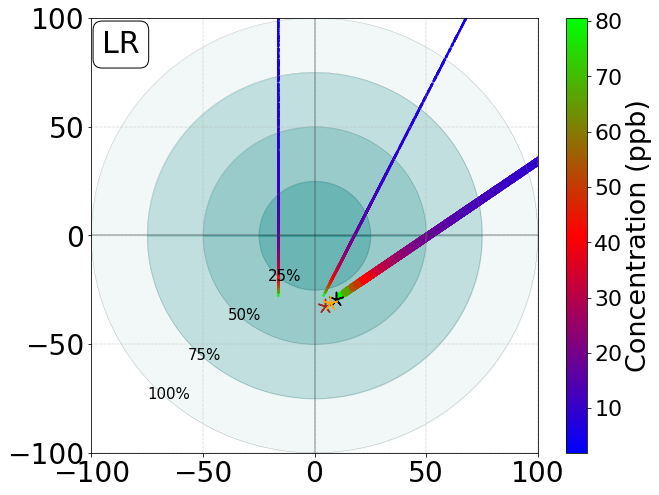

In [615]:
A=target(pred,y_test,1.4)
theta = np.linspace( 0 , 2 * np.pi , 150 )
r1 =25
a1= r1 * np.cos( theta )
b1= r1 * np.sin( theta )
r2 =50
a2=r2* np.cos( theta )
b2=r2* np.sin( theta )
r3 =75
a3=r3* np.cos( theta )
b3=r3* np.sin( theta )

r4 =100
a4=r4* np.cos( theta )
b4=r4* np.sin( theta )
fig= plt.figure(figsize=(10,8))

plt.Circle((0, 0), 1, color='wheat')
#plt.vlines([0], -130, 130, linestyles='dashed',color='violet')
#plt.hlines([0], -130, 130, linestyles='dashed', color='violet')

plt.fill_between(a1, b1, color='teal', alpha=0.3)
plt.fill_between(a2, b2, color='teal',alpha=0.2)
plt.fill_between(a3, b3, color='teal',alpha=0.2)
plt.fill_between(a4, b4, color='teal',alpha=0.05)

x1=np.arange(0,25.1,0.1)
r1=25
y1=np.sqrt(r1**2-x1**2)
x2=np.arange(0,50.1,0.1)
r2=50
y2=np.sqrt(r2**2-x2**2)

x3=np.arange(0,75.1,0.1)
r3=75
y3=np.sqrt(r3**2-x3**2)

x4=np.arange(0,100.1,0.1)
r4=100
y4=np.sqrt(r4**2-x4**2)

plt.plot(x1,y1, linewidth=0.2, color='grey')
plt.plot(x1,-1*y1, linewidth=0.2, color='grey')
plt.plot(x2,y2, linewidth=0.2, color='grey')
plt.plot(x2,-1*y2, linewidth=0.2, color='grey')
plt.plot(x3,y3, linewidth=0.2, color='grey')
plt.plot(x3,-1*y3, linewidth=0.2, color='grey')
plt.plot(x4,y4, linewidth=0.2, color='grey')
plt.plot(x4,-1*y4, linewidth=0.2, color='grey')

plt.plot(-1*x1,y1, linewidth=0.2, color='grey')
plt.plot(-1*x1,-1*y1, linewidth=0.2, color='grey')
plt.plot(-1*x2,y2, linewidth=0.2, color='grey')
plt.plot(-1*x2,-1*y2, linewidth=0.2, color='grey')
plt.plot(-1*x3,y3, linewidth=0.2, color='grey')
plt.plot(-1*x3,-1*y3, linewidth=0.2, color='grey')
plt.plot(-1*x4,y4, linewidth=0.2, color='grey')
plt.plot(-1*x4,-1*y4, linewidth=0.2, color='grey')

#plt.xlabel('Random uncertainty effect (%)',fontsize=24)
#plt.ylabel('Bias effect (%)',fontsize=24)
#plt.title('CO',fontsize=18)
color_map = plt.cm.get_cmap('brg')
reversed_color_map = color_map
plt.scatter(A[0],A[1],marker='.',s=200,c=np.array(A[2]),cmap=reversed_color_map)
plt.scatter(A[3],A[1],marker='.',s=10,c=np.array(A[2]),cmap=reversed_color_map)
plt.scatter(A[4],A[1],marker='.',s=10,c=np.array(A[2]),cmap=reversed_color_map)
plt.vlines([0], -130, 130,color='black',linewidth=0.4)
plt.hlines([0], -130, 130, color='black',linewidth=0.4)
plt.grid(linestyle='-.',linewidth=0.4)
plt.ylim(ymin=-100)
plt.ylim(ymax=100)
plt.xlim(xmax=100)
plt.xlim(xmin=-100)
plt.xticks(np.arange(-100,101, 50),fontsize=28)
plt.yticks(np.arange(-100,101, 50),fontsize=28)
#plt.colorbar()
cbar = plt.colorbar()
cbar.ax.tick_params(labelsize=22)
cbar.set_label('Concentration (ppb)', rotation=90,fontsize=27)
plt.scatter(Random,Bias,marker=(5, 2),s=200, color='black')
plt.scatter(Random1,Bias1,marker=(5, 2),s=200, color='brown')
plt.scatter(Random2,Bias2,marker=(5, 2),s=200, color='orange')
textstr = 'LR'
props = dict(boxstyle='round', facecolor='white', alpha=1)
plt.text(0.1, 1.26, textstr, transform=ax.transAxes, fontsize=30,
        verticalalignment='top', bbox=props)
plt.text(-21,-21, '25%',fontsize=15)
plt.text(-39,-39, '50%',fontsize=15)
plt.text(-57,-57, '75%',fontsize=15)
plt.text(-75,-75, '100%',fontsize=15)
plt.show()

## Model 2: Support Vector Regression (SVR)

In [616]:
from sklearn.svm import SVR
from sklearn.preprocessing import StandardScaler
regressor = SVR(kernel = 'poly')
regressor.fit(X_train.drop(['Lab1'], axis=1), y_train)
pred = regressor.predict(X_test.drop(['Lab1'], axis=1))
for i in range(len(Pred)):
    if pred[i]<0:
        pred[i]=np.mean(np.array(pred))

In [617]:
Index=[i for i in range(len(y_test))]
Y_test=y_test.to_list()
Y_test=pd.Series(Y_test,index =Index)
Y_test
Pred=pd.Series(pred,index =Index)
Lab1=pd.Series(lab1,index =Index)
sMAPE_lr=round(smape_loss(Y_test,Pred),2)
sMAPE_lab=round (smape_loss(Y_test,Lab1),2)
RMSE_lr=round(np.sqrt(sm.mean_squared_error(y_test, pred)),1)
RMSE_lab=round(np.sqrt(sm.mean_squared_error(y_test, lab1)),1)
Pearson_lr=round(np.corrcoef(y_test, pred)[0, 1],2)
Pearson_lab=round(np.corrcoef(y_test, lab1)[0, 1],2)
sMAPE_svr_NO2=sMAPE_lr
RMSE_svr_NO2=round(RMSE_lr/np.mean(np.array(y_test)),2)
Pearson_svr_NO2=Pearson_lr
R2_svr_NO2=round(sm.r2_score(y_test, pred), 2)
RMSE_Svr_NO2=RMSE_lr
Pearson_svr_NO2,R2_svr_NO2,RMSE_Svr_NO2

(0.92, 0.85, 4.7)

fig= plt.figure(figsize=(8,6))
ax = fig.add_subplot(111)
ax.patch.set_facecolor('lightblue')
ax.patch.set_alpha(0.3)
plt.plot(index,y_test[A:], color='limegreen',linewidth=3)
plt.plot(index,pred[A:], color='brown',linewidth=3)
plt.plot(index,lab1[A:], color='#426eff',linewidth=3)
plt.legend(['Ref', 'SVR-Calibrated', 'LAB-Calibrated'], loc = 2, bbox_to_anchor = (0.74,1))
plt.ylabel('NO2 Concentration(ppb)'.translate(subscript),fontsize=18)
#plt.text(B-150, C, r'$R^{2}(SVR)=$'+str(R2_svr_NO2), fontsize = 14, color='brown')
#plt.text(B-150, D, r'$R^{2}(Lab)=$'+str(R2_lab_NO2), fontsize = 14, color='#426eff')
#plt.text(B-700, C, 'Pearson r(SVR)='+str(Pearson_lr), fontsize = 14, color='brown')
#plt.text(B-700, D, 'Pearson r(Lab)='+str(Pearson_lab), fontsize = 14, color='#426eff')
#plt.xlabel('Last 200 hours of testing period',fontsize=18)
#plt.title('Support Vector Regression (SVR) Calibration vs Laboratory Calibration',fontsize=18)
plt.grid(linestyle='-.',linewidth=0.3)
plt.show()

In [618]:
print("Regressor model performance:")
print("Mean absolute error(MAE) =", round(sm.mean_absolute_error(y_test, pred), 2))
print("Mean squared error(MSE) =", round(sm.mean_squared_error(y_test, pred), 2))
print("Median absolute error =", round(sm.median_absolute_error(y_test, pred), 2))
print("Explain variance score =", round(sm.explained_variance_score(y_test, pred), 2))
print("R2 score =", round(sm.r2_score(y_test, pred), 2))

MBE_SVR_NO2=MBE(pred,y_test)/np.std(y_test)
CRMSE_SVR_NO2=CRMSE(y_test,pred)/np.std(y_test)
pred_svr=pred

Regressor model performance:
Mean absolute error(MAE) = 3.45
Mean squared error(MSE) = 22.22
Median absolute error = 2.62
Explain variance score = 0.85
R2 score = 0.85


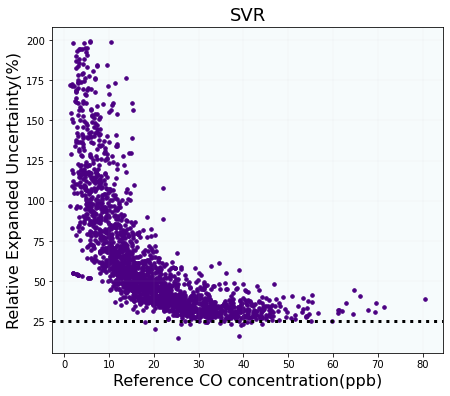

In [619]:
u_cal=REF(pred,y_test,1.3)
fig= plt.figure(figsize=(7,6))
ax = fig.add_subplot(111)
ax.patch.set_facecolor('lightblue')
ax.patch.set_alpha(0.1)
ind=[]
U_cal=[]
Ref=[]
for i in range(len(u_cal)):
    if -50<u_cal[i]<200:
        U_cal.append(u_cal[i])
        Ref.append(y_test[i])
plt.scatter(Ref,U_cal, color='#4B0082',marker='.',s=50)
plt.axhline(y=25, color='black', linestyle=':',linewidth=3)
plt.ylabel('Relative Expanded Uncertainty(%)', fontsize=16)
plt.xlabel('Reference CO concentration(ppb)',fontsize=16)
plt.grid(linestyle='-.',linewidth=0.1)
plt.title('SVR', fontsize=18)
plt.show()

In [620]:
import random
alpha=1.4
LV=100
Cal=0
for i in range(len(y_test)):
    if y_test[i]==LV:
        Cal=pred[i]
cal=np.array(pred)
ref=np.array(y_test)
ref_mean=np.mean(ref)
cal_mean=np.mean(cal)
prec=np.array([0.4 for i in range(len(ref))])
u=0.005*ref
#cal=np.log(cal)
#ref=np.log(ref)
sx_s=(1/len(ref))*sum((ref-ref_mean)**2)
sy_s=(1/len(cal))*sum((cal-cal_mean)**2)
sxy=(1/len(cal))*sum((cal-cal_mean)*(ref-ref_mean))
#beta_1=((sy_s-sx_s)+np.sqrt((sy_s-sx_s)**2+4*sxy**2))/(2*sxy)
beta_1=((sy_s-alpha*sx_s)+np.sqrt((sy_s-sx_s)**2+4*alpha*sxy**2))/(2*sxy)
beta_0=cal_mean-beta_1*ref_mean
RSS=sum((cal-beta_0-beta_1*ref)**2-(beta_1**2+alpha)*(0.001*LV)**2)
du_s=RSS/(len(cal)-2)
    #Beta_1=((sy_s-sx_s-du_s)+np.sqrt((sy_s-sx_s-du_s)**2+4*sxy**2))/(2*sxy)
Beta_1=((sy_s-alpha*sx_s-du_s)+np.sqrt((sy_s-alpha*sx_s-du_s)**2+4*alpha*sxy**2))/(2*sxy)
Beta_0=cal_mean-Beta_1*ref_mean
P1=(RSS/(len(cal)-2))
P2=(Beta_1**2+alpha)*(0.001*LV)**2+(-2*Beta_1**2+2*Beta_1-1)*(0.001*LV)**2
P3=(Beta_0+(Beta_1-1)*LV)
P=P1+P2+P3
Bias=(2*(P3)/LV)*100
Random=(2*(P1+P2)**0.5/LV)*100

import random
alpha=1.4
LV2=140
Cal=0
for i in range(len(y_test)):
    if y_test[i]==LV:
        Cal=pred[i]
cal=np.array(pred)
ref=np.array(y_test)
ref_mean=np.mean(ref)
cal_mean=np.mean(cal)
prec=np.array([0.4 for i in range(len(ref))])
u=0.005*ref
#cal=np.log(cal)
#ref=np.log(ref)
sx_s=(1/len(ref))*sum((ref-ref_mean)**2)
sy_s=(1/len(cal))*sum((cal-cal_mean)**2)
sxy=(1/len(cal))*sum((cal-cal_mean)*(ref-ref_mean))
#beta_1=((sy_s-sx_s)+np.sqrt((sy_s-sx_s)**2+4*sxy**2))/(2*sxy)
beta_1=((sy_s-alpha*sx_s)+np.sqrt((sy_s-sx_s)**2+4*alpha*sxy**2))/(2*sxy)
beta_0=cal_mean-beta_1*ref_mean
RSS=sum((cal-beta_0-beta_1*ref)**2-(beta_1**2+alpha)*(0.001*LV)**2)
du_s=RSS/(len(cal)-2)
    #Beta_1=((sy_s-sx_s-du_s)+np.sqrt((sy_s-sx_s-du_s)**2+4*sxy**2))/(2*sxy)
Beta_1=((sy_s-alpha*sx_s-du_s)+np.sqrt((sy_s-alpha*sx_s-du_s)**2+4*alpha*sxy**2))/(2*sxy)
Beta_0=cal_mean-Beta_1*ref_mean
P1=(RSS/(len(cal)-2))
P2=(Beta_1**2+alpha)*(0.001*LV2)**2+(-2*Beta_1**2+2*Beta_1-1)*(0.001*LV2)**2
P3=(Beta_0+(Beta_1-1)*LV2)
P=P1+P2+P3
Bias2=(2*(P3)/LV2)*100
Random2=(2*(P1+P2)**0.5/LV2)*100

import random
alpha=1.4
LV1=200
Cal=0
for i in range(len(y_test)):
    if y_test[i]==LV:
        Cal=lab1[i]
cal=np.array(pred)
ref=np.array(y_test)
ref_mean=np.mean(ref)
cal_mean=np.mean(cal)
prec=np.array([0.4 for i in range(len(ref))])
u=0.005*ref
#cal=np.log(cal)
#ref=np.log(ref)
sx_s=(1/len(ref))*sum((ref-ref_mean)**2)
sy_s=(1/len(cal))*sum((cal-cal_mean)**2)
sxy=(1/len(cal))*sum((cal-cal_mean)*(ref-ref_mean))
#beta_1=((sy_s-sx_s)+np.sqrt((sy_s-sx_s)**2+4*sxy**2))/(2*sxy)
beta_1=((sy_s-alpha*sx_s)+np.sqrt((sy_s-sx_s)**2+4*alpha*sxy**2))/(2*sxy)
beta_0=cal_mean-beta_1*ref_mean
RSS=sum((cal-beta_0-beta_1*ref)**2-(beta_1**2+alpha)*(0.001*LV1)**2)
du_s=RSS/(len(cal)-2)
    #Beta_1=((sy_s-sx_s-du_s)+np.sqrt((sy_s-sx_s-du_s)**2+4*sxy**2))/(2*sxy)
Beta_1=((sy_s-alpha*sx_s-du_s)+np.sqrt((sy_s-alpha*sx_s-du_s)**2+4*alpha*sxy**2))/(2*sxy)
Beta_0=cal_mean-Beta_1*ref_mean
P1=(RSS/(len(cal)-2))
P2=(Beta_1**2+alpha)*(0.001*LV1)**2+(-2*Beta_1**2+2*Beta_1-1)*(0.001*LV1)**2
P3=(Beta_0+(Beta_1-1)*LV1)
P=P1+P2+P3
Bias1=(2*(P3)/(LV1))*100
Random1=(2*(P1+P2)**0.5/(LV1))*100

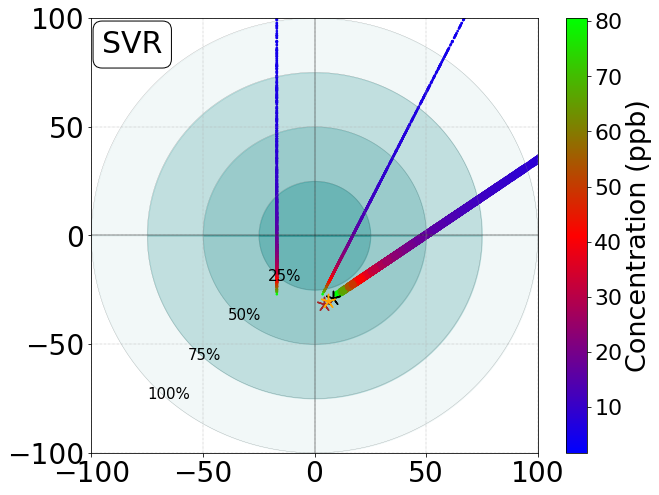

In [621]:
A=target(pred,y_test,1.4)
theta = np.linspace( 0 , 2 * np.pi , 150 )
r1 =25
a1= r1 * np.cos( theta )
b1= r1 * np.sin( theta )
r2 =50
a2=r2* np.cos( theta )
b2=r2* np.sin( theta )
r3 =75
a3=r3* np.cos( theta )
b3=r3* np.sin( theta )

r4 =100
a4=r4* np.cos( theta )
b4=r4* np.sin( theta )
fig= plt.figure(figsize=(10,8))

plt.Circle((0, 0), 1, color='wheat')
#plt.vlines([0], -130, 130, linestyles='dashed',color='violet')
#plt.hlines([0], -130, 130, linestyles='dashed', color='violet')

plt.fill_between(a1, b1, color='teal', alpha=0.3)
plt.fill_between(a2, b2, color='teal',alpha=0.2)
plt.fill_between(a3, b3, color='teal',alpha=0.2)
plt.fill_between(a4, b4, color='teal',alpha=0.05)

x1=np.arange(0,25.1,0.1)
r1=25
y1=np.sqrt(r1**2-x1**2)
x2=np.arange(0,50.1,0.1)
r2=50
y2=np.sqrt(r2**2-x2**2)

x3=np.arange(0,75.1,0.1)
r3=75
y3=np.sqrt(r3**2-x3**2)

x4=np.arange(0,100.1,0.1)
r4=100
y4=np.sqrt(r4**2-x4**2)

plt.plot(x1,y1, linewidth=0.2, color='grey')
plt.plot(x1,-1*y1, linewidth=0.2, color='grey')
plt.plot(x2,y2, linewidth=0.2, color='grey')
plt.plot(x2,-1*y2, linewidth=0.2, color='grey')
plt.plot(x3,y3, linewidth=0.2, color='grey')
plt.plot(x3,-1*y3, linewidth=0.2, color='grey')
plt.plot(x4,y4, linewidth=0.2, color='grey')
plt.plot(x4,-1*y4, linewidth=0.2, color='grey')

plt.plot(-1*x1,y1, linewidth=0.2, color='grey')
plt.plot(-1*x1,-1*y1, linewidth=0.2, color='grey')
plt.plot(-1*x2,y2, linewidth=0.2, color='grey')
plt.plot(-1*x2,-1*y2, linewidth=0.2, color='grey')
plt.plot(-1*x3,y3, linewidth=0.2, color='grey')
plt.plot(-1*x3,-1*y3, linewidth=0.2, color='grey')
plt.plot(-1*x4,y4, linewidth=0.2, color='grey')
plt.plot(-1*x4,-1*y4, linewidth=0.2, color='grey')

#plt.xlabel('Random uncertainty effect (%)',fontsize=24)
#plt.ylabel('Bias effect (%)',fontsize=24)
#plt.title('CO',fontsize=18)
color_map = plt.cm.get_cmap('brg')
reversed_color_map = color_map
plt.scatter(A[0],A[1],marker='.',s=200,c=np.array(A[2]),cmap=reversed_color_map)
plt.scatter(A[3],A[1],marker='.',s=10,c=np.array(A[2]),cmap=reversed_color_map)
plt.scatter(A[4],A[1],marker='.',s=10,c=np.array(A[2]),cmap=reversed_color_map)
plt.vlines([0], -130, 130,color='black',linewidth=0.4)
plt.hlines([0], -130, 130, color='black',linewidth=0.4)
plt.grid(linestyle='-.',linewidth=0.4)
plt.ylim(ymin=-100)
plt.ylim(ymax=100)
plt.xlim(xmax=100)
plt.xlim(xmin=-100)
plt.xticks(np.arange(-100,101, 50),fontsize=28)
plt.yticks(np.arange(-100,101, 50),fontsize=28)
#plt.colorbar()
cbar = plt.colorbar()
cbar.ax.tick_params(labelsize=22)
cbar.set_label('Concentration (ppb)', rotation=90,fontsize=27)
plt.scatter(Random,Bias,marker=(5, 2),s=200, color='black')
plt.scatter(Random1,Bias1,marker=(5, 2),s=200, color='brown')
plt.scatter(Random2,Bias2,marker=(5, 2),s=200, color='orange')
textstr = 'SVR'
props = dict(boxstyle='round', facecolor='white', alpha=1)
plt.text(0.1, 1.26, textstr, transform=ax.transAxes, fontsize=30,
        verticalalignment='top', bbox=props)
plt.text(-21,-21, '25%',fontsize=15)
plt.text(-39,-39, '50%',fontsize=15)
plt.text(-57,-57, '75%',fontsize=15)
plt.text(-75,-75, '100%',fontsize=15)
plt.show()

## Model 3: Random Forest

In [622]:
from sklearn.ensemble import RandomForestRegressor
  
 # create regressor object
regressor = RandomForestRegressor(n_estimators = 500,min_samples_split= 2,min_samples_leaf= 1,
                                  max_features= 'sqrt', 
                                  random_state = 0,max_depth=None,bootstrap=False)
  
# fit the regressor with x and y data
regressor.fit(X_train.drop(['Lab1'], axis=1), y_train)  

RandomForestRegressor(bootstrap=False, max_features='sqrt', n_estimators=500,
                      random_state=0)

In [623]:
Index=[i for i in range(len(y_test))]
features_NO2=regressor.feature_importances_
pred = regressor.predict(X_test.drop(['Lab1'], axis=1))
pred_rf_no2=pred
Y_test=y_test.to_list()
Y_test=pd.Series(Y_test,index =Index)
Y_test
Pred=pd.Series(pred,index =Index)
Lab1=pd.Series(lab1,index =Index)
sMAPE_lr=round(smape_loss(Y_test,Pred),2)
sMAPE_lab=round (smape_loss(Y_test,Lab1),2)
RMSE_lr=round(np.sqrt(sm.mean_squared_error(y_test, pred)),1)
RMSE_lab=round(np.sqrt(sm.mean_squared_error(y_test, lab1)),1)
Pearson_lr=round(np.corrcoef(y_test, pred)[0, 1],2)
Pearson_lab=round(np.corrcoef(y_test, lab1)[0, 1],2)
sMAPE_rf_NO2=sMAPE_lr
RMSE_rf_NO2=round(RMSE_lr/np.mean(np.array(y_test)),2)
Pearson_rf_NO2=Pearson_lr
R2_rf_NO2=round(sm.r2_score(y_test, pred), 2)
RMSE_Rf_NO2=RMSE_lr
Pearson_rf_NO2,R2_rf_NO2,RMSE_Rf_NO2

(0.97, 0.94, 2.9)

fig= plt.figure(figsize=(10,5))

ax = fig.add_subplot(111)
ax.patch.set_facecolor('lightblue')
ax.patch.set_alpha(0.3)
plt.plot(index,y_test[A:], color='limegreen',linewidth=3)
plt.plot(index,pred[A:], color='indigo',linewidth=3)
plt.plot(index,lab1[A:], color='#426eff',linewidth=3)
plt.legend(['Ref', 'RF-Calibrated', 'LAB-Calibrated'], loc = 2, bbox_to_anchor = (0.79,1))
plt.ylabel('NO2 Concentration(ppb)'.translate(subscript),fontsize=18)
plt.text(B-15, C,r'$R^{2}(RF)=$'+str(R2_rf_NO2) , fontsize = 14, color='indigo')
plt.text(B-15, D,r'$R^{2}(Lab)=$'+str(R2_lab_NO2) , fontsize = 14, color='#426eff')
plt.text(B-73, C, 'Pearson r(RF)='+str(Pearson_lr), fontsize = 14, color='indigo')
plt.text(B-73, D, 'Pearson r(Lab)='+str(Pearson_lab), fontsize = 14, color='#426eff')
#plt.xlabel('Last 200 hours of testing period',fontsize=18)
#plt.title('Random Forest(RF) Calibration vs Laboratory Calibration',fontsize=18)
plt.xlabel('Last 100 hours of testing period',fontsize=18)
plt.grid(linestyle='-.',linewidth=0.3)
plt.show()

In [624]:
print("Regressor model performance:")
print("Mean absolute error(MAE) =", round(sm.mean_absolute_error(y_test, pred), 2))
print("Mean squared error(MSE) =", round(sm.mean_squared_error(y_test, pred), 2))
print("Median absolute error =", round(sm.median_absolute_error(y_test, pred), 2))
print("Explain variance score =", round(sm.explained_variance_score(y_test, pred), 2))
print("R2 score =", round(sm.r2_score(y_test, pred), 2))

MBE_RF_NO2=MBE(pred,y_test)/np.std(y_test)
CRMSE_RF_NO2=CRMSE(y_test,pred)/np.std(y_test)
pred_rf=pred

Regressor model performance:
Mean absolute error(MAE) = 2.05
Mean squared error(MSE) = 8.18
Median absolute error = 1.49
Explain variance score = 0.94
R2 score = 0.94


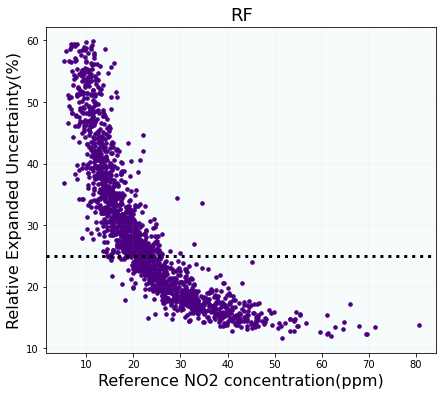

In [625]:
u_cal=REF(pred,y_test,1.3)
fig= plt.figure(figsize=(7,6))
ax = fig.add_subplot(111)
ax.patch.set_facecolor('lightblue')
ax.patch.set_alpha(0.1)
ind=[]
U_cal=[]
Ref=[]
for i in range(len(u_cal)):
    if -50<u_cal[i]<60:
        U_cal.append(u_cal[i])
        Ref.append(y_test[i])
plt.scatter(Ref,U_cal, color='#4B0082', marker='.',s=50 )
plt.axhline(y=25, color='black', linestyle=':',linewidth=3)
plt.ylabel('Relative Expanded Uncertainty(%)', fontsize=16)
plt.xlabel('Reference NO2 concentration(ppm)',fontsize=16)
plt.grid(linestyle='-.',linewidth=0.1)
plt.title('RF', fontsize=18)
plt.show()

In [626]:
import random
alpha=1.4
LV=100
Cal=0
for i in range(len(y_test)):
    if y_test[i]==LV:
        Cal=pred[i]
cal=np.array(pred)
ref=np.array(y_test)
ref_mean=np.mean(ref)
cal_mean=np.mean(cal)
prec=np.array([0.4 for i in range(len(ref))])
u=0.005*ref
#cal=np.log(cal)
#ref=np.log(ref)
sx_s=(1/len(ref))*sum((ref-ref_mean)**2)
sy_s=(1/len(cal))*sum((cal-cal_mean)**2)
sxy=(1/len(cal))*sum((cal-cal_mean)*(ref-ref_mean))
#beta_1=((sy_s-sx_s)+np.sqrt((sy_s-sx_s)**2+4*sxy**2))/(2*sxy)
beta_1=((sy_s-alpha*sx_s)+np.sqrt((sy_s-sx_s)**2+4*alpha*sxy**2))/(2*sxy)
beta_0=cal_mean-beta_1*ref_mean
RSS=sum((cal-beta_0-beta_1*ref)**2-(beta_1**2+alpha)*(0.001*LV)**2)
du_s=RSS/(len(cal)-2)
    #Beta_1=((sy_s-sx_s-du_s)+np.sqrt((sy_s-sx_s-du_s)**2+4*sxy**2))/(2*sxy)
Beta_1=((sy_s-alpha*sx_s-du_s)+np.sqrt((sy_s-alpha*sx_s-du_s)**2+4*alpha*sxy**2))/(2*sxy)
Beta_0=cal_mean-Beta_1*ref_mean
P1=(RSS/(len(cal)-2))
P2=(Beta_1**2+alpha)*(0.001*LV)**2+(-2*Beta_1**2+2*Beta_1-1)*(0.001*LV)**2
P3=(Beta_0+(Beta_1-1)*LV)
P=P1+P2+P3
Bias=(2*(P3)/LV)*100
Random=(2*(P1+P2)**0.5/LV)*100

import random
alpha=1.4
LV2=140
Cal=0
for i in range(len(y_test)):
    if y_test[i]==LV:
        Cal=pred[i]
cal=np.array(pred)
ref=np.array(y_test)
ref_mean=np.mean(ref)
cal_mean=np.mean(cal)
prec=np.array([0.4 for i in range(len(ref))])
u=0.005*ref
#cal=np.log(cal)
#ref=np.log(ref)
sx_s=(1/len(ref))*sum((ref-ref_mean)**2)
sy_s=(1/len(cal))*sum((cal-cal_mean)**2)
sxy=(1/len(cal))*sum((cal-cal_mean)*(ref-ref_mean))
#beta_1=((sy_s-sx_s)+np.sqrt((sy_s-sx_s)**2+4*sxy**2))/(2*sxy)
beta_1=((sy_s-alpha*sx_s)+np.sqrt((sy_s-sx_s)**2+4*alpha*sxy**2))/(2*sxy)
beta_0=cal_mean-beta_1*ref_mean
RSS=sum((cal-beta_0-beta_1*ref)**2-(beta_1**2+alpha)*(0.001*LV)**2)
du_s=RSS/(len(cal)-2)
    #Beta_1=((sy_s-sx_s-du_s)+np.sqrt((sy_s-sx_s-du_s)**2+4*sxy**2))/(2*sxy)
Beta_1=((sy_s-alpha*sx_s-du_s)+np.sqrt((sy_s-alpha*sx_s-du_s)**2+4*alpha*sxy**2))/(2*sxy)
Beta_0=cal_mean-Beta_1*ref_mean
P1=(RSS/(len(cal)-2))
P2=(Beta_1**2+alpha)*(0.001*LV2)**2+(-2*Beta_1**2+2*Beta_1-1)*(0.001*LV2)**2
P3=(Beta_0+(Beta_1-1)*LV2)
P=P1+P2+P3
Bias2=(2*(P3)/LV2)*100
Random2=(2*(P1+P2)**0.5/LV2)*100

import random
alpha=1.4
LV1=200
Cal=0
for i in range(len(y_test)):
    if y_test[i]==LV:
        Cal=lab1[i]
cal=np.array(pred)
ref=np.array(y_test)
ref_mean=np.mean(ref)
cal_mean=np.mean(cal)
prec=np.array([0.4 for i in range(len(ref))])
u=0.005*ref
#cal=np.log(cal)
#ref=np.log(ref)
sx_s=(1/len(ref))*sum((ref-ref_mean)**2)
sy_s=(1/len(cal))*sum((cal-cal_mean)**2)
sxy=(1/len(cal))*sum((cal-cal_mean)*(ref-ref_mean))
#beta_1=((sy_s-sx_s)+np.sqrt((sy_s-sx_s)**2+4*sxy**2))/(2*sxy)
beta_1=((sy_s-alpha*sx_s)+np.sqrt((sy_s-sx_s)**2+4*alpha*sxy**2))/(2*sxy)
beta_0=cal_mean-beta_1*ref_mean
RSS=sum((cal-beta_0-beta_1*ref)**2-(beta_1**2+alpha)*(0.001*LV1)**2)
du_s=RSS/(len(cal)-2)
    #Beta_1=((sy_s-sx_s-du_s)+np.sqrt((sy_s-sx_s-du_s)**2+4*sxy**2))/(2*sxy)
Beta_1=((sy_s-alpha*sx_s-du_s)+np.sqrt((sy_s-alpha*sx_s-du_s)**2+4*alpha*sxy**2))/(2*sxy)
Beta_0=cal_mean-Beta_1*ref_mean
P1=(RSS/(len(cal)-2))
P2=(Beta_1**2+alpha)*(0.001*LV1)**2+(-2*Beta_1**2+2*Beta_1-1)*(0.001*LV1)**2
P3=(Beta_0+(Beta_1-1)*LV1)
P=P1+P2+P3
Bias1=(2*(P3)/(LV1))*100
Random1=(2*(P1+P2)**0.5/(LV1))*100

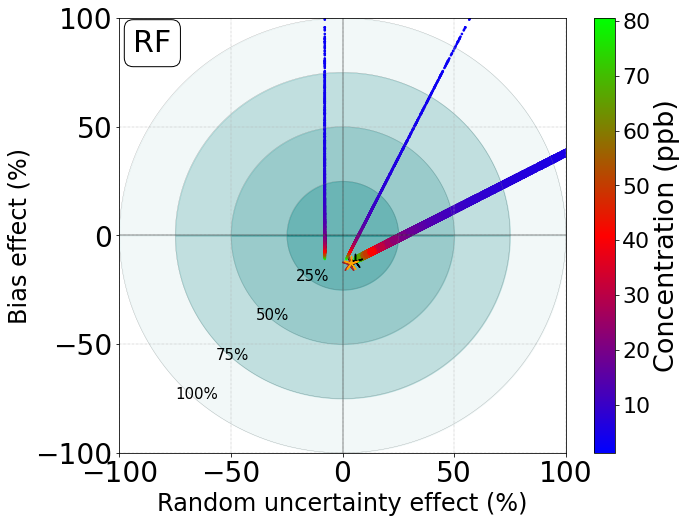

In [627]:
A=target(pred,y_test,1.4)
theta = np.linspace( 0 , 2 * np.pi , 150 )
r1 =25
a1= r1 * np.cos( theta )
b1= r1 * np.sin( theta )
r2 =50
a2=r2* np.cos( theta )
b2=r2* np.sin( theta )
r3 =75
a3=r3* np.cos( theta )
b3=r3* np.sin( theta )

r4 =100
a4=r4* np.cos( theta )
b4=r4* np.sin( theta )
fig= plt.figure(figsize=(10,8))

plt.Circle((0, 0), 1, color='wheat')
#plt.vlines([0], -130, 130, linestyles='dashed',color='violet')
#plt.hlines([0], -130, 130, linestyles='dashed', color='violet')

plt.fill_between(a1, b1, color='teal', alpha=0.3)
plt.fill_between(a2, b2, color='teal',alpha=0.2)
plt.fill_between(a3, b3, color='teal',alpha=0.2)
plt.fill_between(a4, b4, color='teal',alpha=0.05)

x1=np.arange(0,25.1,0.1)
r1=25
y1=np.sqrt(r1**2-x1**2)
x2=np.arange(0,50.1,0.1)
r2=50
y2=np.sqrt(r2**2-x2**2)

x3=np.arange(0,75.1,0.1)
r3=75
y3=np.sqrt(r3**2-x3**2)

x4=np.arange(0,100.1,0.1)
r4=100
y4=np.sqrt(r4**2-x4**2)

plt.plot(x1,y1, linewidth=0.2, color='grey')
plt.plot(x1,-1*y1, linewidth=0.2, color='grey')
plt.plot(x2,y2, linewidth=0.2, color='grey')
plt.plot(x2,-1*y2, linewidth=0.2, color='grey')
plt.plot(x3,y3, linewidth=0.2, color='grey')
plt.plot(x3,-1*y3, linewidth=0.2, color='grey')
plt.plot(x4,y4, linewidth=0.2, color='grey')
plt.plot(x4,-1*y4, linewidth=0.2, color='grey')

plt.plot(-1*x1,y1, linewidth=0.2, color='grey')
plt.plot(-1*x1,-1*y1, linewidth=0.2, color='grey')
plt.plot(-1*x2,y2, linewidth=0.2, color='grey')
plt.plot(-1*x2,-1*y2, linewidth=0.2, color='grey')
plt.plot(-1*x3,y3, linewidth=0.2, color='grey')
plt.plot(-1*x3,-1*y3, linewidth=0.2, color='grey')
plt.plot(-1*x4,y4, linewidth=0.2, color='grey')
plt.plot(-1*x4,-1*y4, linewidth=0.2, color='grey')

plt.xlabel('Random uncertainty effect (%)',fontsize=24)
plt.ylabel('Bias effect (%)',fontsize=24)
#plt.title('CO',fontsize=18)
color_map = plt.cm.get_cmap('brg')
reversed_color_map = color_map
plt.scatter(A[0],A[1],marker='.',s=200,c=np.array(A[2]),cmap=reversed_color_map)
plt.scatter(A[3],A[1],marker='.',s=10,c=np.array(A[2]),cmap=reversed_color_map)
plt.scatter(A[4],A[1],marker='.',s=10,c=np.array(A[2]),cmap=reversed_color_map)
plt.vlines([0], -130, 130,color='black',linewidth=0.4)
plt.hlines([0], -130, 130, color='black',linewidth=0.4)
plt.grid(linestyle='-.',linewidth=0.4)
plt.ylim(ymin=-100)
plt.ylim(ymax=100)
plt.xlim(xmax=100)
plt.xlim(xmin=-100)
plt.xticks(np.arange(-100,101, 50),fontsize=28)
plt.yticks(np.arange(-100,101, 50),fontsize=28)
#plt.colorbar()
cbar = plt.colorbar()
cbar.ax.tick_params(labelsize=22)
cbar.set_label('Concentration (ppb)', rotation=90,fontsize=27)
plt.scatter(Random,Bias,marker=(5, 2),s=200, color='black')
plt.scatter(Random1,Bias1,marker=(5, 2),s=200, color='brown')
plt.scatter(Random2,Bias2,marker=(5, 2),s=200, color='orange')
textstr = 'RF'
props = dict(boxstyle='round', facecolor='white', alpha=1)
plt.text(0.18, 1.35, textstr, transform=ax.transAxes, fontsize=30,
        verticalalignment='top', bbox=props)
plt.text(-21,-21, '25%',fontsize=15)
plt.text(-39,-39, '50%',fontsize=15)
plt.text(-57,-57, '75%',fontsize=15)
plt.text(-75,-75, '100%',fontsize=15)

plt.show()

In [628]:
cal=np.array(pred)
ref=np.array(y_test.to_list())
ref_mean=np.mean(ref)
cal_mean=np.mean(cal)
    #cal=np.log(cal)
    #ref=np.log(ref)
sx_s=(1/len(ref))*sum((ref-ref_mean)**2)
sy_s=(1/len(cal))*sum((cal-cal_mean)**2)
sxy=(1/len(cal))*sum((cal-cal_mean)*(ref-ref_mean))
beta_1=((sy_s-sx_s)+np.sqrt((sy_s-sx_s)**2+4*sxy**2))/(2*sxy)
beta_0=cal_mean-beta_1*ref_mean
RSS=sum((cal-beta_0-beta_1*ref)**2-(beta_1**2+1)*(0.08*ref)**2)
du_s=RSS/(len(cal)-2)
Beta_1=((sy_s-sx_s-du_s)+np.sqrt((sy_s-sx_s-du_s)**2+4*sxy**2))/(2*sxy)
Beta_0=cal_mean-Beta_1*ref_mean
P1=(RSS/(len(cal)-2))
P2=(-2*Beta_1**2+2*Beta_1-1)*(0.08*40)**2
P3=(Beta_0+(Beta_1-1)*40)**2
P1,P2,P3

(1.67102464920488, -9.216420266312635, 1.0918980436207701)

In [629]:
A=[i for i in np.arange(1,20,0.1)]
K=[]
for i in A:
    k=REF2(pred,y_test,i,200)
    K.append(k)
for i in range(len(K)):
    if K[i]==min(K):
        print(A[i])

1.3000000000000003


## Model 4 : ANN

In [630]:
from keras.models import Sequential
from keras.layers import Dense
from keras import optimizers
from sklearn.preprocessing import StandardScaler
model = Sequential()
model.add(Dense(6, input_shape = (7,),kernel_initializer='normal', activation= 'linear'))
model.add(Dense(128,kernel_initializer='normal', activation= 'relu'))
model.add(Dense(128, kernel_initializer='normal',activation= 'relu'))
model.add(Dense(100, kernel_initializer='normal',activation= 'relu'))
model.add(Dense(1,kernel_initializer='normal',activation='linear',))
sgd = optimizers.Adam(learning_rate=0.01)

model.compile(optimizer = sgd, loss = 'mean_squared_error', metrics= ['mse', 'mae'])
model.summary()

Model: "sequential_9"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_43 (Dense)             (None, 6)                 48        
_________________________________________________________________
dense_44 (Dense)             (None, 128)               896       
_________________________________________________________________
dense_45 (Dense)             (None, 128)               16512     
_________________________________________________________________
dense_46 (Dense)             (None, 100)               12900     
_________________________________________________________________
dense_47 (Dense)             (None, 1)                 101       
Total params: 30,457
Trainable params: 30,457
Non-trainable params: 0
_________________________________________________________________


In [631]:
scaler = StandardScaler()
scaler.fit(X_train.drop(['Lab1'], axis=1))
X_train_scaled=scaler.transform(X_train.drop(['Lab1'], axis=1))
X_test_scaled=scaler.transform(X_test.drop(['Lab1'], axis=1))
model.fit(X_train_scaled, y_train, batch_size= 100, epochs=100, verbose= 0)

In [632]:
train_pred = model.predict(X_train_scaled)
test_pred = model.predict(X_test_scaled)
pred=[]
for i in range(len(test_pred)):
    pred.append(sum(list(test_pred[i])))
len(y_test)

2185

In [633]:
Y_test=y_test.to_list()
Y_test=pd.Series(Y_test,index =Index)
Y_test
Pred=pd.Series(pred,index =Index)
Lab1=pd.Series(lab1,index =Index)
sMAPE_lr=round(smape_loss(Y_test,Pred),2)
sMAPE_lab=round (smape_loss(Y_test,Lab1),2)
RMSE_lr=round(np.sqrt(sm.mean_squared_error(y_test, pred)),1)
RMSE_lab=round(np.sqrt(sm.mean_squared_error(y_test, lab1)),1)
Pearson_lr=round(np.corrcoef(y_test, pred)[0, 1],2)
Pearson_lab=round(np.corrcoef(y_test, lab1)[0, 1],2)
sMAPE_ann_NO2=sMAPE_lr
RMSE_ann_NO2=round(RMSE_lr/np.mean(np.array(y_test)),2)
Pearson_ann_NO2=Pearson_lr
R2_ann_NO2=round(sm.r2_score(y_test, pred), 2)
RMSE_Ann_NO2=RMSE_lr
Pearson_ann_NO2,R2_ann_NO2,RMSE_Ann_NO2

(0.97, 0.93, 3.2)

fig= plt.figure(figsize=(8,6))
ax = fig.add_subplot(111)
ax.patch.set_facecolor('lightblue')
ax.patch.set_alpha(0.3)
plt.plot(index,y_test[A:], color='limegreen',linewidth=3)
plt.plot(index,pred[A:], color='tomato',linewidth=3)
plt.plot(index,lab1[A:], color='#426eff',linewidth=3)
plt.legend(['Ref', 'ANN-Calibrated', 'LAB-Calibrated'], loc = 2, bbox_to_anchor = (0.74,1))
plt.ylabel('NO2 Concentration(ppb)',fontsize=18)
#plt.text(B-150, C, r'$R^{2}(ANN)=$'+str(R2_ann_NO2), fontsize = 14, color='tomato')
#plt.text(B-150, D, r'$R^{2}(Lab)=$'+str(R2_lab_NO2), fontsize = 14, color='#426eff')
#plt.text(B-700, C, 'Pearson r(ANN)='+str(Pearson_lr), fontsize = 14, color='tomato')
#plt.text(B-700, D, 'Pearson r(Lab)='+str(Pearson_lab), fontsize = 14, color='#426eff')
#plt.xlabel('Last 200 hours of testing period',fontsize=18)
#plt.title(' Artificial Neural Network(ANN)  Calibration vs Laboratory Calibration',fontsize=18)
plt.grid(linestyle='-.',linewidth=0.3)
plt.show()

In [634]:
print("Regressor model performance:")
print("Mean absolute error(MAE) =", round(sm.mean_absolute_error(y_test, pred), 2))
print("Mean squared error(MSE) =", round(sm.mean_squared_error(y_test, pred), 2))
print("Median absolute error =", round(sm.median_absolute_error(y_test, pred), 2))
print("Explain variance score =", round(sm.explained_variance_score(y_test, pred), 2))
print("R2 score =", round(sm.r2_score(y_test, pred), 2))

MBE_ANN_NO2=MBE(pred,y_test)/np.std(y_test)
CRMSE_ANN_NO2=CRMSE(y_test,pred)/(np.std(y_test))
pred_ann=pred

Regressor model performance:
Mean absolute error(MAE) = 2.34
Mean squared error(MSE) = 10.04
Median absolute error = 1.75
Explain variance score = 0.93
R2 score = 0.93


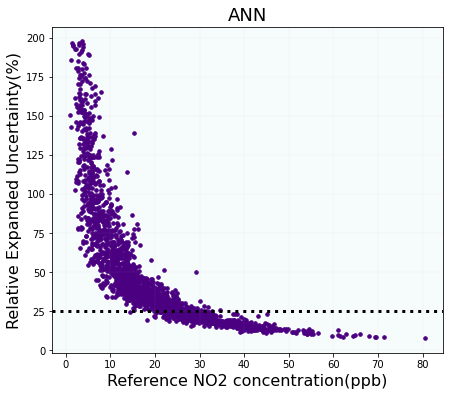

In [635]:
u_cal=REF(pred,y_test,1.3)
fig= plt.figure(figsize=(7,6))
ax = fig.add_subplot(111)
ax.patch.set_facecolor('lightblue')
ax.patch.set_alpha(0.1)
ind=[]
U_cal=[]
Ref=[]
for i in range(len(u_cal)):
    if -50<u_cal[i]<200:
        U_cal.append(u_cal[i])
        Ref.append(y_test[i])
plt.scatter(Ref,U_cal, color='#4B0082',marker='.',s=50)
plt.axhline(y=25, color='black', linestyle=':',linewidth=3)
plt.ylabel('Relative Expanded Uncertainty(%)', fontsize=16)
plt.xlabel('Reference NO2 concentration(ppb)',fontsize=16)
plt.grid(linestyle='-.',linewidth=0.1)
plt.title('ANN', fontsize=18)
plt.show()

In [636]:
import random
alpha=1.4
LV=100
Cal=0
for i in range(len(y_test)):
    if y_test[i]==LV:
        Cal=pred[i]
cal=np.array(pred)
ref=np.array(y_test)
ref_mean=np.mean(ref)
cal_mean=np.mean(cal)
prec=np.array([0.4 for i in range(len(ref))])
u=0.005*ref
#cal=np.log(cal)
#ref=np.log(ref)
sx_s=(1/len(ref))*sum((ref-ref_mean)**2)
sy_s=(1/len(cal))*sum((cal-cal_mean)**2)
sxy=(1/len(cal))*sum((cal-cal_mean)*(ref-ref_mean))
#beta_1=((sy_s-sx_s)+np.sqrt((sy_s-sx_s)**2+4*sxy**2))/(2*sxy)
beta_1=((sy_s-alpha*sx_s)+np.sqrt((sy_s-sx_s)**2+4*alpha*sxy**2))/(2*sxy)
beta_0=cal_mean-beta_1*ref_mean
RSS=sum((cal-beta_0-beta_1*ref)**2-(beta_1**2+alpha)*(0.001*LV)**2)
du_s=RSS/(len(cal)-2)
    #Beta_1=((sy_s-sx_s-du_s)+np.sqrt((sy_s-sx_s-du_s)**2+4*sxy**2))/(2*sxy)
Beta_1=((sy_s-alpha*sx_s-du_s)+np.sqrt((sy_s-alpha*sx_s-du_s)**2+4*alpha*sxy**2))/(2*sxy)
Beta_0=cal_mean-Beta_1*ref_mean
P1=(RSS/(len(cal)-2))
P2=(Beta_1**2+alpha)*(0.001*LV)**2+(-2*Beta_1**2+2*Beta_1-1)*(0.001*LV)**2
P3=(Beta_0+(Beta_1-1)*LV)
P=P1+P2+P3
Bias=(2*(P3)/LV)*100
Random=(2*(P1+P2)**0.5/LV)*100

import random
alpha=1.4
LV2=140
Cal=0
for i in range(len(y_test)):
    if y_test[i]==LV:
        Cal=pred[i]
cal=np.array(pred)
ref=np.array(y_test)
ref_mean=np.mean(ref)
cal_mean=np.mean(cal)
prec=np.array([0.4 for i in range(len(ref))])
u=0.005*ref
#cal=np.log(cal)
#ref=np.log(ref)
sx_s=(1/len(ref))*sum((ref-ref_mean)**2)
sy_s=(1/len(cal))*sum((cal-cal_mean)**2)
sxy=(1/len(cal))*sum((cal-cal_mean)*(ref-ref_mean))
#beta_1=((sy_s-sx_s)+np.sqrt((sy_s-sx_s)**2+4*sxy**2))/(2*sxy)
beta_1=((sy_s-alpha*sx_s)+np.sqrt((sy_s-sx_s)**2+4*alpha*sxy**2))/(2*sxy)
beta_0=cal_mean-beta_1*ref_mean
RSS=sum((cal-beta_0-beta_1*ref)**2-(beta_1**2+alpha)*(0.001*LV)**2)
du_s=RSS/(len(cal)-2)
    #Beta_1=((sy_s-sx_s-du_s)+np.sqrt((sy_s-sx_s-du_s)**2+4*sxy**2))/(2*sxy)
Beta_1=((sy_s-alpha*sx_s-du_s)+np.sqrt((sy_s-alpha*sx_s-du_s)**2+4*alpha*sxy**2))/(2*sxy)
Beta_0=cal_mean-Beta_1*ref_mean
P1=(RSS/(len(cal)-2))
P2=(Beta_1**2+alpha)*(0.001*LV2)**2+(-2*Beta_1**2+2*Beta_1-1)*(0.001*LV2)**2
P3=(Beta_0+(Beta_1-1)*LV2)
P=P1+P2+P3
Bias2=(2*(P3)/LV2)*100
Random2=(2*(P1+P2)**0.5/LV2)*100

import random
alpha=1.4
LV1=200
Cal=0
for i in range(len(y_test)):
    if y_test[i]==LV:
        Cal=lab1[i]
cal=np.array(pred)
ref=np.array(y_test)
ref_mean=np.mean(ref)
cal_mean=np.mean(cal)
prec=np.array([0.4 for i in range(len(ref))])
u=0.005*ref
#cal=np.log(cal)
#ref=np.log(ref)
sx_s=(1/len(ref))*sum((ref-ref_mean)**2)
sy_s=(1/len(cal))*sum((cal-cal_mean)**2)
sxy=(1/len(cal))*sum((cal-cal_mean)*(ref-ref_mean))
#beta_1=((sy_s-sx_s)+np.sqrt((sy_s-sx_s)**2+4*sxy**2))/(2*sxy)
beta_1=((sy_s-alpha*sx_s)+np.sqrt((sy_s-sx_s)**2+4*alpha*sxy**2))/(2*sxy)
beta_0=cal_mean-beta_1*ref_mean
RSS=sum((cal-beta_0-beta_1*ref)**2-(beta_1**2+alpha)*(0.001*LV1)**2)
du_s=RSS/(len(cal)-2)
    #Beta_1=((sy_s-sx_s-du_s)+np.sqrt((sy_s-sx_s-du_s)**2+4*sxy**2))/(2*sxy)
Beta_1=((sy_s-alpha*sx_s-du_s)+np.sqrt((sy_s-alpha*sx_s-du_s)**2+4*alpha*sxy**2))/(2*sxy)
Beta_0=cal_mean-Beta_1*ref_mean
P1=(RSS/(len(cal)-2))
P2=(Beta_1**2+alpha)*(0.001*LV1)**2+(-2*Beta_1**2+2*Beta_1-1)*(0.001*LV1)**2
P3=(Beta_0+(Beta_1-1)*LV1)
P=P1+P2+P3
Bias1=(2*(P3)/(LV1))*100
Random1=(2*(P1+P2)**0.5/(LV1))*100

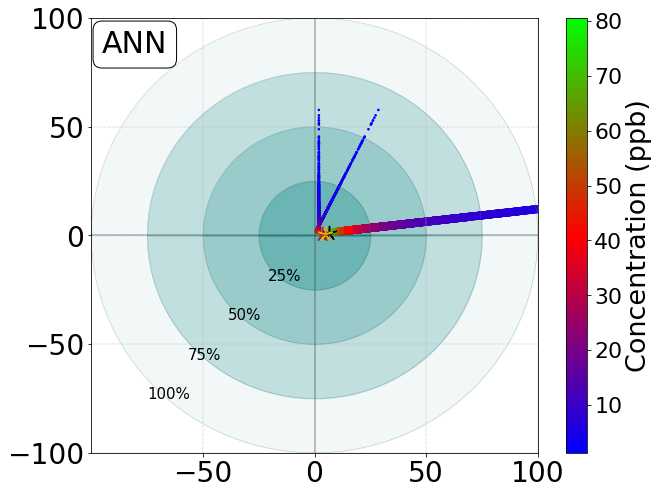

In [637]:
A=target(pred,y_test,1.4)
theta = np.linspace( 0 , 2 * np.pi , 150 )
r1 =25
a1= r1 * np.cos( theta )
b1= r1 * np.sin( theta )
r2 =50
a2=r2* np.cos( theta )
b2=r2* np.sin( theta )
r3 =75
a3=r3* np.cos( theta )
b3=r3* np.sin( theta )

r4 =100
a4=r4* np.cos( theta )
b4=r4* np.sin( theta )
fig= plt.figure(figsize=(10,8))

plt.Circle((0, 0), 1, color='wheat')
#plt.vlines([0], -130, 130, linestyles='dashed',color='violet')
#plt.hlines([0], -130, 130, linestyles='dashed', color='violet')

plt.fill_between(a1, b1, color='teal', alpha=0.3)
plt.fill_between(a2, b2, color='teal',alpha=0.2)
plt.fill_between(a3, b3, color='teal',alpha=0.2)
plt.fill_between(a4, b4, color='teal',alpha=0.05)

x1=np.arange(0,25.1,0.1)
r1=25
y1=np.sqrt(r1**2-x1**2)
x2=np.arange(0,50.1,0.1)
r2=50
y2=np.sqrt(r2**2-x2**2)

x3=np.arange(0,75.1,0.1)
r3=75
y3=np.sqrt(r3**2-x3**2)

x4=np.arange(0,100.1,0.1)
r4=100
y4=np.sqrt(r4**2-x4**2)

plt.plot(x1,y1, linewidth=0.2, color='grey')
plt.plot(x1,-1*y1, linewidth=0.2, color='grey')
plt.plot(x2,y2, linewidth=0.2, color='grey')
plt.plot(x2,-1*y2, linewidth=0.2, color='grey')
plt.plot(x3,y3, linewidth=0.2, color='grey')
plt.plot(x3,-1*y3, linewidth=0.2, color='grey')
plt.plot(x4,y4, linewidth=0.2, color='grey')
plt.plot(x4,-1*y4, linewidth=0.2, color='grey')

plt.plot(-1*x1,y1, linewidth=0.2, color='grey')
plt.plot(-1*x1,-1*y1, linewidth=0.2, color='grey')
plt.plot(-1*x2,y2, linewidth=0.2, color='grey')
plt.plot(-1*x2,-1*y2, linewidth=0.2, color='grey')
plt.plot(-1*x3,y3, linewidth=0.2, color='grey')
plt.plot(-1*x3,-1*y3, linewidth=0.2, color='grey')
plt.plot(-1*x4,y4, linewidth=0.2, color='grey')
plt.plot(-1*x4,-1*y4, linewidth=0.2, color='grey')

#plt.xlabel('Random uncertainty effect (%)',fontsize=24)
#plt.ylabel('Bias effect (%)',fontsize=24)
#plt.title('CO',fontsize=18)
color_map = plt.cm.get_cmap('brg')
reversed_color_map = color_map
plt.scatter(A[0],A[1],marker='.',s=200,c=np.array(A[2]),cmap=reversed_color_map)
plt.scatter(A[3],A[1],marker='.',s=10,c=np.array(A[2]),cmap=reversed_color_map)
plt.scatter(A[4],A[1],marker='.',s=10,c=np.array(A[2]),cmap=reversed_color_map)
plt.vlines([0], -130, 130,color='black',linewidth=0.4)
plt.hlines([0], -130, 130, color='black',linewidth=0.4)
plt.grid(linestyle='-.',linewidth=0.4)
plt.ylim(ymin=-100)
plt.ylim(ymax=100)
plt.xlim(xmax=100)
plt.xlim(xmin=-100)
plt.xticks(np.arange(-50,101, 50),fontsize=28)
plt.yticks(np.arange(-100,101, 50),fontsize=28)
#plt.colorbar()
cbar = plt.colorbar()
cbar.ax.tick_params(labelsize=22)
cbar.set_label('Concentration (ppb)', rotation=90,fontsize=27)
plt.scatter(Random,Bias,marker=(5, 2),s=200, color='black')
plt.scatter(Random1,Bias1,marker=(5, 2),s=200, color='brown')
plt.scatter(Random2,Bias2,marker=(5, 2),s=200, color='orange')
textstr = 'ANN'
props = dict(boxstyle='round', facecolor='white', alpha=1)
plt.text(0.1, 1.26, textstr, transform=ax.transAxes, fontsize=30,
        verticalalignment='top', bbox=props)
plt.text(-21,-21, '25%',fontsize=15)
plt.text(-39,-39, '50%',fontsize=15)
plt.text(-57,-57, '75%',fontsize=15)
plt.text(-75,-75, '100%',fontsize=15)
plt.show()

# Model 5: XGBoost

In [638]:
from xgboost import  XGBRegressor
from numpy import absolute
from pandas import read_csv
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedKFold
# create an xgboost regression model
#n_estimators=10000, max_depth=5, eta=0.01, subsample=0.9,colsample_bytree=0.4,alpha=10
model = XGBRegressor(n_estimators=10000, max_depth=5, eta=0.01, subsample=0.9, 
                     colsample_bytree=0.4,alpha=10)
model.fit(X_train.drop(['Lab1'], axis=1),y_train)

XGBRegressor(alpha=10, base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=0.4, eta=0.01, gamma=0,
             gpu_id=-1, importance_type='gain', interaction_constraints='',
             learning_rate=0.00999999978, max_delta_step=0, max_depth=5,
             min_child_weight=1, missing=nan, monotone_constraints='()',
             n_estimators=10000, n_jobs=0, num_parallel_tree=1, random_state=0,
             reg_alpha=10, reg_lambda=1, scale_pos_weight=1, subsample=0.9,
             tree_method='exact', validate_parameters=1, verbosity=None)

In [639]:
pred = model.predict(X_test.drop(['Lab1'], axis=1))
pred_xgb_no2=pred
Y_test=y_test.to_list()
Y_test=pd.Series(Y_test,index =Index)
Pred=pd.Series(pred,index =Index)
Lab1=pd.Series(lab1,index =Index)
sMAPE_lr=round(smape_loss(Y_test,Pred),2)
sMAPE_lab=round (smape_loss(Y_test,Lab1),2)
RMSE_lr=round(np.sqrt(sm.mean_squared_error(y_test, pred)),1)
RMSE_lab=round(np.sqrt(sm.mean_squared_error(y_test, lab1)),1)
Pearson_lr=round(np.corrcoef(y_test, pred)[0, 1],2)
Pearson_lab=round(np.corrcoef(y_test, lab1)[0, 1],2)
sMAPE_xgb_NO2=sMAPE_lr
RMSE_xgb_NO2=RMSE_lr/np.mean(np.array(y_test))
Pearson_xgb_NO2=Pearson_lr
R2_xgb_NO2=round(sm.r2_score(y_test, pred), 2)
RMSE_Xgb_NO2=RMSE_lr
Pearson_xgb_NO2,R2_xgb_NO2,RMSE_Xgb_NO2

(0.96, 0.93, 3.2)

fig= plt.figure(figsize=(8,6))
ax = fig.add_subplot(111)
ax.patch.set_facecolor('lightblue')
ax.patch.set_alpha(0.3)
plt.plot(index,y_test[A:], color='limegreen',linewidth=3)
plt.plot(index,pred[A:], color='darkgoldenrod',linewidth=3)
plt.plot(index,lab1[A:], color='#426eff',linewidth=3)
plt.legend(['Ref', 'XGBoost-Calibrated', 'LAB-Calibrated'], loc = 2, bbox_to_anchor = (0.69,1))
plt.ylabel('NO2 Concentration(ppb)'.translate(subscript),fontsize=18)
#plt.text(B-150, C, r'$R^{2}(XGB)=$'+str(R2_xgb_NO2), fontsize = 14, color='darkgoldenrod')
#plt.text(B-150, D, r'$R^{2}(Lab)=$'+str(R2_lab_NO2), fontsize = 14, color='#426eff')
#plt.text(B-700, C, 'Pearson r(XGB)='+str(Pearson_lr), fontsize = 14, color='darkgoldenrod')
#plt.text(B-700, D, 'Pearson r(Lab)='+str(Pearson_lab), fontsize = 14, color='#426eff')
#plt.xlabel('Last 200 hours of testing period',fontsize=18)
#plt.title('XGBoost  Calibration vs Laboratory Calibration',fontsize=18)
plt.grid(linestyle='-.',linewidth=0.3)
plt.show()

In [640]:
print("Regressor model performance:")
print("Mean absolute error(MAE) =", round(sm.mean_absolute_error(y_test, pred), 2))
print("Mean squared error(MSE) =", round(sm.mean_squared_error(y_test, pred), 2))
print("Median absolute error =", round(sm.median_absolute_error(y_test, pred), 2))
print("Explain variance score =", round(sm.explained_variance_score(y_test, pred), 2))
print("R2 score =", round(sm.r2_score(y_test, pred), 2))

MBE_XGB_NO2=MBE(pred,y_test)/np.std(y_test)
CRMSE_XGB_NO2=CRMSE(y_test,pred)/np.std(y_test)
pred_xgb=pred

Regressor model performance:
Mean absolute error(MAE) = 2.39
Mean squared error(MSE) = 10.54
Median absolute error = 1.76
Explain variance score = 0.93
R2 score = 0.93


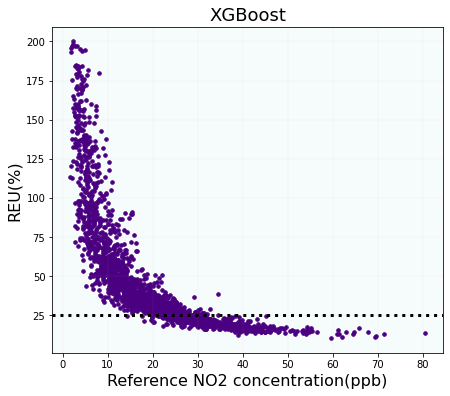

In [641]:
u_cal=REF(pred,y_test,1.3)
fig= plt.figure(figsize=(7,6))
ax = fig.add_subplot(111)
ax.patch.set_facecolor('lightblue')
ax.patch.set_alpha(0.1)
ind=[]
U_cal=[]
Ref=[]
for i in range(len(u_cal)):
    if -50<u_cal[i]<200:
        U_cal.append(u_cal[i])
        Ref.append(y_test[i])
plt.scatter(Ref,U_cal, color='#4B0082',marker='.',s=50)
plt.axhline(y=25, color='black', linestyle=':',linewidth=3)
plt.ylabel('REU(%)', fontsize=16)
plt.xlabel('Reference NO2 concentration(ppb)',fontsize=16)
plt.grid(linestyle='-.',linewidth=0.1)
plt.title('XGBoost', fontsize=18)
plt.show()

In [642]:
import random
alpha=1.4
LV=100
Cal=0
for i in range(len(y_test)):
    if y_test[i]==LV:
        Cal=pred[i]
cal=np.array(pred)
ref=np.array(y_test)
ref_mean=np.mean(ref)
cal_mean=np.mean(cal)
prec=np.array([0.4 for i in range(len(ref))])
u=0.005*ref
#cal=np.log(cal)
#ref=np.log(ref)
sx_s=(1/len(ref))*sum((ref-ref_mean)**2)
sy_s=(1/len(cal))*sum((cal-cal_mean)**2)
sxy=(1/len(cal))*sum((cal-cal_mean)*(ref-ref_mean))
#beta_1=((sy_s-sx_s)+np.sqrt((sy_s-sx_s)**2+4*sxy**2))/(2*sxy)
beta_1=((sy_s-alpha*sx_s)+np.sqrt((sy_s-sx_s)**2+4*alpha*sxy**2))/(2*sxy)
beta_0=cal_mean-beta_1*ref_mean
RSS=sum((cal-beta_0-beta_1*ref)**2-(beta_1**2+alpha)*(0.001*LV)**2)
du_s=RSS/(len(cal)-2)
    #Beta_1=((sy_s-sx_s-du_s)+np.sqrt((sy_s-sx_s-du_s)**2+4*sxy**2))/(2*sxy)
Beta_1=((sy_s-alpha*sx_s-du_s)+np.sqrt((sy_s-alpha*sx_s-du_s)**2+4*alpha*sxy**2))/(2*sxy)
Beta_0=cal_mean-Beta_1*ref_mean
P1=(RSS/(len(cal)-2))
P2=(Beta_1**2+alpha)*(0.001*LV)**2+(-2*Beta_1**2+2*Beta_1-1)*(0.001*LV)**2
P3=(Beta_0+(Beta_1-1)*LV)
P=P1+P2+P3
Bias=(2*(P3)/LV)*100
Random=(2*(P1+P2)**0.5/LV)*100

import random
alpha=1.4
LV2=140
Cal=0
for i in range(len(y_test)):
    if y_test[i]==LV:
        Cal=pred[i]
cal=np.array(pred)
ref=np.array(y_test)
ref_mean=np.mean(ref)
cal_mean=np.mean(cal)
prec=np.array([0.4 for i in range(len(ref))])
u=0.005*ref
#cal=np.log(cal)
#ref=np.log(ref)
sx_s=(1/len(ref))*sum((ref-ref_mean)**2)
sy_s=(1/len(cal))*sum((cal-cal_mean)**2)
sxy=(1/len(cal))*sum((cal-cal_mean)*(ref-ref_mean))
#beta_1=((sy_s-sx_s)+np.sqrt((sy_s-sx_s)**2+4*sxy**2))/(2*sxy)
beta_1=((sy_s-alpha*sx_s)+np.sqrt((sy_s-sx_s)**2+4*alpha*sxy**2))/(2*sxy)
beta_0=cal_mean-beta_1*ref_mean
RSS=sum((cal-beta_0-beta_1*ref)**2-(beta_1**2+alpha)*(0.001*LV)**2)
du_s=RSS/(len(cal)-2)
    #Beta_1=((sy_s-sx_s-du_s)+np.sqrt((sy_s-sx_s-du_s)**2+4*sxy**2))/(2*sxy)
Beta_1=((sy_s-alpha*sx_s-du_s)+np.sqrt((sy_s-alpha*sx_s-du_s)**2+4*alpha*sxy**2))/(2*sxy)
Beta_0=cal_mean-Beta_1*ref_mean
P1=(RSS/(len(cal)-2))
P2=(Beta_1**2+alpha)*(0.001*LV2)**2+(-2*Beta_1**2+2*Beta_1-1)*(0.001*LV2)**2
P3=(Beta_0+(Beta_1-1)*LV2)
P=P1+P2+P3
Bias2=(2*(P3)/LV2)*100
Random2=(2*(P1+P2)**0.5/LV2)*100

import random
alpha=1.4
LV1=200
Cal=0
for i in range(len(y_test)):
    if y_test[i]==LV:
        Cal=lab1[i]
cal=np.array(pred)
ref=np.array(y_test)
ref_mean=np.mean(ref)
cal_mean=np.mean(cal)
prec=np.array([0.4 for i in range(len(ref))])
u=0.005*ref
#cal=np.log(cal)
#ref=np.log(ref)
sx_s=(1/len(ref))*sum((ref-ref_mean)**2)
sy_s=(1/len(cal))*sum((cal-cal_mean)**2)
sxy=(1/len(cal))*sum((cal-cal_mean)*(ref-ref_mean))
#beta_1=((sy_s-sx_s)+np.sqrt((sy_s-sx_s)**2+4*sxy**2))/(2*sxy)
beta_1=((sy_s-alpha*sx_s)+np.sqrt((sy_s-sx_s)**2+4*alpha*sxy**2))/(2*sxy)
beta_0=cal_mean-beta_1*ref_mean
RSS=sum((cal-beta_0-beta_1*ref)**2-(beta_1**2+alpha)*(0.001*LV1)**2)
du_s=RSS/(len(cal)-2)
    #Beta_1=((sy_s-sx_s-du_s)+np.sqrt((sy_s-sx_s-du_s)**2+4*sxy**2))/(2*sxy)
Beta_1=((sy_s-alpha*sx_s-du_s)+np.sqrt((sy_s-alpha*sx_s-du_s)**2+4*alpha*sxy**2))/(2*sxy)
Beta_0=cal_mean-Beta_1*ref_mean
P1=(RSS/(len(cal)-2))
P2=(Beta_1**2+alpha)*(0.001*LV1)**2+(-2*Beta_1**2+2*Beta_1-1)*(0.001*LV1)**2
P3=(Beta_0+(Beta_1-1)*LV1)
P=P1+P2+P3
Bias1=(2*(P3)/(LV1))*100
Random1=(2*(P1+P2)**0.5/(LV1))*100

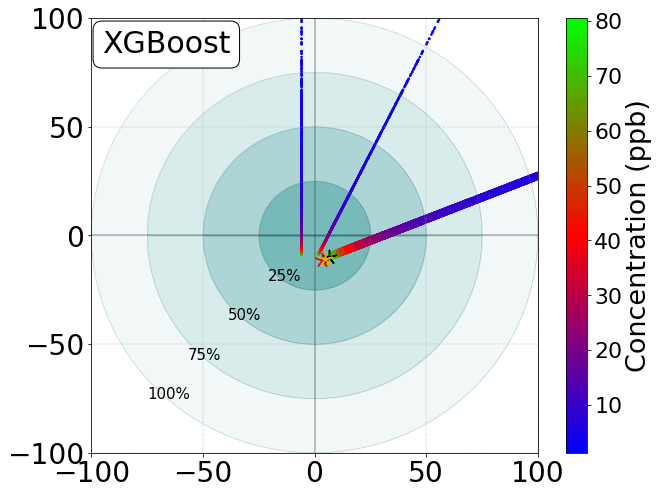

In [643]:
A=target(pred,y_test,1.4)
theta = np.linspace( 0 , 2 * np.pi , 150 )
r1 =25
a1= r1 * np.cos( theta )
b1= r1 * np.sin( theta )
r2 =50
a2=r2* np.cos( theta )
b2=r2* np.sin( theta )
r3 =75
a3=r3* np.cos( theta )
b3=r3* np.sin( theta )

r4 =100
a4=r4* np.cos( theta )
b4=r4* np.sin( theta )
fig= plt.figure(figsize=(10,8))

plt.Circle((0, 0), 1, color='wheat')
#plt.vlines([0], -130, 130, linestyles='dashed',color='violet')
#plt.hlines([0], -130, 130, linestyles='dashed', color='violet')

plt.fill_between(a1, b1, color='teal', alpha=0.3)
plt.fill_between(a2, b2, color='teal',alpha=0.2)
plt.fill_between(a3, b3, color='teal',alpha=0.1)
plt.fill_between(a4, b4, color='teal',alpha=0.05)

x1=np.arange(0,25.1,0.1)
r1=25
y1=np.sqrt(r1**2-x1**2)
x2=np.arange(0,50.1,0.1)
r2=50
y2=np.sqrt(r2**2-x2**2)

x3=np.arange(0,75.1,0.1)
r3=75
y3=np.sqrt(r3**2-x3**2)

x4=np.arange(0,100.1,0.1)
r4=100
y4=np.sqrt(r4**2-x4**2)

plt.plot(x1,y1, linewidth=0.2, color='grey')
plt.plot(x1,-1*y1, linewidth=0.2, color='grey')
plt.plot(x2,y2, linewidth=0.2, color='grey')
plt.plot(x2,-1*y2, linewidth=0.2, color='grey')
plt.plot(x3,y3, linewidth=0.2, color='grey')
plt.plot(x3,-1*y3, linewidth=0.2, color='grey')
plt.plot(x4,y4, linewidth=0.2, color='grey')
plt.plot(x4,-1*y4, linewidth=0.2, color='grey')

plt.plot(-1*x1,y1, linewidth=0.2, color='grey')
plt.plot(-1*x1,-1*y1, linewidth=0.2, color='grey')
plt.plot(-1*x2,y2, linewidth=0.2, color='grey')
plt.plot(-1*x2,-1*y2, linewidth=0.2, color='grey')
plt.plot(-1*x3,y3, linewidth=0.2, color='grey')
plt.plot(-1*x3,-1*y3, linewidth=0.2, color='grey')
plt.plot(-1*x4,y4, linewidth=0.2, color='grey')
plt.plot(-1*x4,-1*y4, linewidth=0.2, color='grey')

#plt.xlabel('Random uncertainty effect (%)',fontsize=24)
#plt.ylabel('Bias effect (%)',fontsize=24)
#plt.title('CO',fontsize=18)
color_map = plt.cm.get_cmap('brg')
reversed_color_map = color_map
plt.scatter(A[0],A[1],marker='.',s=200,c=np.array(A[2]),cmap=reversed_color_map)
plt.scatter(A[3],A[1],marker='.',s=10,c=np.array(A[2]),cmap=reversed_color_map)
plt.scatter(A[4],A[1],marker='.',s=10,c=np.array(A[2]),cmap=reversed_color_map)
plt.vlines([0], -130, 130,color='black',linewidth=0.4)
plt.hlines([0], -130, 130, color='black',linewidth=0.4)
plt.grid(linestyle='-.',linewidth=0.4)
plt.ylim(ymin=-100)
plt.ylim(ymax=100)
plt.xlim(xmax=100)
plt.xlim(xmin=-100)
plt.xticks(np.arange(-100,101, 50),fontsize=28)
plt.yticks(np.arange(-100,101, 50),fontsize=28)
#plt.colorbar()
cbar = plt.colorbar()
cbar.ax.tick_params(labelsize=22)
cbar.set_label('Concentration (ppb)', rotation=90,fontsize=27)
plt.scatter(Random,Bias,marker=(5, 2),s=200, color='black')
plt.scatter(Random1,Bias1,marker=(5, 2),s=200, color='brown')
plt.scatter(Random2,Bias2,marker=(5, 2),s=200, color='orange')
textstr = 'XGBoost'
props = dict(boxstyle='round', facecolor='white', alpha=1)
plt.text(0.1, 1.26, textstr, transform=ax.transAxes, fontsize=30,
        verticalalignment='top', bbox=props)
plt.text(-21,-21, '25%',fontsize=15)
plt.text(-39,-39, '50%',fontsize=15)
plt.text(-57,-57, '75%',fontsize=15)
plt.text(-75,-75, '100%',fontsize=15)
plt.show()

 # SO2 Calibration

In [644]:
import pandas as pd
Ref=pd.read_csv('Ref.csv')
Ref["CO"] = 1000 * Ref["CO"]
Ref['Date'] = pd.to_datetime(Ref['Date_Time'])
Ref=Ref.set_index('Date')
Ref.drop('Date_Time',axis = 1, inplace = True)
Ref=Ref.resample('5min').mean()
Ref=Ref[76463:137376]
Ref_CO=Ref['CO'].to_list()
Ref_NO2=Ref['NO2'].to_list()
Ref_SO2=Ref['SO2'].to_list()
Ref_O3=Ref['O3'].to_list()

import pandas as pd
import scipy.io
import numpy as np
data = pd.read_csv('SO2.txt', header = None,low_memory=False)
data.columns=['WE','AE','Temp','RH','Time']
Time=data['Time'].to_list()
time=[]
for i in range(len(Time)):
    time.append(float(abs(Time[i])))
Time=np.array(time)
Date=pd.to_datetime(Time-719529,unit='d').round('s')
data['Date'] = Date.tolist()
data=data.set_index('Date')
data.drop('Time',axis = 1, inplace = True)
data=data.resample('5min').mean()
Data_SO2=data
Data_SO2['Ref']=Ref_SO2
WE=Data_SO2['WE'].to_list()
AE=Data_SO2['AE'].to_list()
signal=np.array(WE)-np.array(AE)
Data_SO2['Net Signal']=signal
Data_SO2['Month']=Data_SO2.index.month
Data_SO2['Day_of_week']=Data_SO2.index.dayofweek
Data_SO2['Day']=Data_SO2.index.day
Data_SO2['Hour']=Data_SO2.index.hour
SO2_Data=Data_SO2
SO2_Data=SO2_Data[(SO2_Data[SO2_Data.columns] >= 0).all(axis=1)]
SO2_Data=SO2_Data.dropna() 
data = pd.read_csv('Conc_SO2.txt', header = None,low_memory=False)
data.columns=['Lab2','Temp','RH','Time','Ref']
Time=data['Time'].to_list()
time=[]
for i in range(len(Time)):
    time.append(float(abs(Time[i])))
Time=np.array(time)
Date=pd.to_datetime(Time-719529,unit='d').round('s')
data['Date'] = Date.tolist()
data=data.set_index('Date')
data.drop('Time',axis = 1, inplace = True)
data=data.resample('5min').mean()
Data_SO2=data
signal=np.array(WE)-np.array(AE)
Data_SO2['Net Signal']=signal
Data_SO2['Month']=Data_SO2.index.month
Data_SO2['Day_of_week']=Data_SO2.index.dayofweek
Data_SO2['Day']=Data_SO2.index.day
Data_SO2['Hour']=Data_SO2.index.hour
SO2_Data=Data_SO2
SO2_Data=SO2_Data[(SO2_Data[SO2_Data.columns] >= 0).all(axis=1)]
SO2_Data=SO2_Data.dropna()
SO2_Data=SO2_Data.resample('h').mean()
SO2_Data=SO2_Data.dropna()
SO2_Data.head()

In [645]:
import pandas as pd
import scipy.io
import numpy as np
data = pd.read_csv('Conc_SO2.txt', header = None,low_memory=False)
data.columns=['Lab2','Temp','RH','Time','Ref']
Time=data['Time'].to_list()
time=[]
for i in range(len(Time)):
    time.append(float(abs(Time[i])))
Time=np.array(time)
Date=pd.to_datetime(Time-719529,unit='d').round('s')
data['Date'] = Date.tolist()
data=data.set_index('Date')
data.drop('Time',axis = 1, inplace = True)
data=data.resample('5min').mean()
Data_SO2=data
Data_so2=data
signal=np.array(WE)-np.array(AE)
Data_SO2['Net Signal']=signal
Data_SO2['Month']=Data_SO2.index.month
Data_SO2['Day_of_week']=Data_SO2.index.dayofweek
Data_SO2['Day']=Data_SO2.index.day
Data_SO2['Hour']=Data_SO2.index.hour
SO2_Data=Data_SO2
SO2_Data=SO2_Data.resample('5min').mean()
SO2_Data=SO2_Data[(SO2_Data[SO2_Data.columns] >= 0).all(axis=1)]
SO2_Data=SO2_Data.dropna() 
data = pd.read_csv('SO2.txt', header = None,low_memory=False)
data.columns=['WE','AE','Temp','RH','Time']
Time=data['Time'].to_list()
time=[]
for i in range(len(Time)):
    time.append(float(abs(Time[i])))
Time=np.array(time)
Date=pd.to_datetime(Time-719529,unit='d').round('s')
data['Date'] = Date.tolist()
data=data.set_index('Date')
data.drop('Time',axis = 1, inplace = True)
data=data.resample('5min').mean()
Data_SO2=data
Data_SO2['Ref']=Ref_SO2
WE=Data_SO2['WE'].to_list()
AE=Data_SO2['AE'].to_list()
signal=np.array(WE)-np.array(AE)
Data_SO2['Lab2']=Data_so2['Lab2'].to_list()
Data_SO2['Net Signal']=signal
Data_SO2['Month']=Data_SO2.index.month
Data_SO2['Day_of_week']=Data_SO2.index.dayofweek
Data_SO2['Day']=Data_SO2.index.day
Data_SO2['Hour']=Data_SO2.index.hour
SO2_Data=Data_SO2
SO2_Data=SO2_Data[(SO2_Data[SO2_Data.columns] >= 0).all(axis=1)]
SO2_Data=SO2_Data.dropna()
CO_Data=CO_Data.resample('20min').mean()
CO_Data=CO_Data.dropna()
SO2_Data.head()

,WE,AE,Temp,RH,Ref,Lab2,Net Signal,Month,Day_of_week,Day,Hour
Date,,,,,,,,,,,
2019-10-10 04:15:00,342.991196,342.255475,18.268917,81.793083,1.085790,7.660248,0.735722,10,3,10,4
2019-10-10 04:45:00,345.767413,342.543745,18.359000,82.451958,1.163473,15.077802,3.223668,10,3,10,4
2019-10-10 04:50:00,343.919310,342.689191,18.348826,82.572044,1.200187,9.035877,1.230119,10,3,10,4
2019-10-10 04:55:00,343.377326,342.448811,18.353612,82.675760,1.312772,8.189301,0.928515,10,3,10,4
2019-10-10 05:00:00,343.358621,342.322426,18.351611,82.723472,1.237584,8.546278,1.036195,10,3,10,5


In [646]:
#Ref=SO2_Data['Ref'].to_list()
#SO2_Data=SO2_Data[SO2_Data.Ref.between(np.mean(Ref)-1*np.std(Ref), np.mean(Ref)+1*np.std(Ref))]
#SO2_Data.shape

In [647]:
#sns.boxplot(x=SO2_Data['Ref'])
#z=np.abs(stats.zscore(SO2_Data))
#SO2_data=SO2_Data[(z < 3).all(axis=1)]
#SO2_data.shape,SO2_Data.shape

In [648]:
def REF(pred,y_test,alpha):
    import random
    cal=np.array(pred)
    ref=np.array(y_test.to_list())
    ref_mean=np.mean(ref)
    cal_mean=np.mean(cal)
    prec=np.array([0.5 for i in range(len(ref))])
    u=np.maximum(prec,0.0015*ref)
    #cal=np.log(cal)
    #ref=np.log(ref)
    sx_s=(1/len(ref))*sum((ref-ref_mean)**2)
    sy_s=(1/len(cal))*sum((cal-cal_mean)**2)
    sxy=(1/len(cal))*sum((cal-cal_mean)*(ref-ref_mean))
    beta_1=((sy_s-alpha*sx_s)+np.sqrt((sy_s-sx_s)**2+4*alpha*sxy**2))/(2*sxy)
    beta_0=cal_mean-beta_1*ref_mean
    RSS=sum((cal-beta_0-beta_1*ref)**2-(beta_1**2+alpha)*u**2)
    du_s=RSS/(len(cal)-2)
    Beta_1=((sy_s-alpha*sx_s-du_s)+np.sqrt((sy_s-alpha*sx_s-du_s)**2+4*alpha*sxy**2))/(2*sxy)
    Beta_0=cal_mean-Beta_1*ref_mean
    P1=(RSS/(len(cal)-2))
    P2=(Beta_1**2+alpha)*u**2+(-2*Beta_1**2+2*Beta_1-1)*u**2
    P3=(Beta_0+(Beta_1-1)*ref)**2
    P=[]
    for i in range(len(P3)):
        P.append(P1+P2[i]+P3[i])
    for i in range(len(P)):
        if P[i]<0:
            P[i]=random.randint(1,100)
    u_cal=(2*np.sqrt(np.array(P))/cal)*100
    #u_cal=((2*np.sqrt((RSS/(len(cal)-2))+(1-(beta_1-1)**2)*(0.08*ref)**2+(Beta_0+(Beta_1-1)*ref)**2))/cal)*100
    return u_cal  

In [649]:
def REF2(pred,y_test,alpha,LV):
    import random
    cal=np.array(pred)
    ref=np.array(y_test.to_list())
    ref_mean=np.mean(ref)
    cal_mean=np.mean(cal)
    prec=np.array([0.5 for i in range(len(ref))])
    u=0.001*ref
    #cal=np.log(cal)
    #ref=np.log(ref)
    sx_s=(1/len(ref))*sum((ref-ref_mean)**2)
    sy_s=(1/len(cal))*sum((cal-cal_mean)**2)
    sxy=(1/len(cal))*sum((cal-cal_mean)*(ref-ref_mean))
    #beta_1=((sy_s-sx_s)+np.sqrt((sy_s-sx_s)**2+4*sxy**2))/(2*sxy)
    beta_1=((sy_s-alpha*sx_s)+np.sqrt((sy_s-sx_s)**2+4*alpha*sxy**2))/(2*sxy)
    beta_0=cal_mean-beta_1*ref_mean
    RSS=sum((cal-beta_0-beta_1*ref)**2-(beta_1**2+alpha)*(0.001*LV)**2)
    du_s=RSS/(len(cal)-2)
    #Beta_1=((sy_s-sx_s-du_s)+np.sqrt((sy_s-sx_s-du_s)**2+4*sxy**2))/(2*sxy)
    Beta_1=((sy_s-alpha*sx_s-du_s)+np.sqrt((sy_s-alpha*sx_s-du_s)**2+4*alpha*sxy**2))/(2*sxy)
    Beta_0=cal_mean-Beta_1*ref_mean
    P1=(RSS/(len(cal)-2))
    P2=(Beta_1**2+alpha)*(0.001*LV)**2+(-2*Beta_1**2+2*Beta_1-1)*(0.001*LV)**2
    P3=(Beta_0+(Beta_1-1)*LV)**2
    P=P1+P2+P3
    if P<0:
        P=random.randint(1,100)
    u_cal=(2*np.sqrt(P)/(Beta_0+Beta_1*LV))*100
    #u_cal=((2*np.sqrt((RSS/(len(cal)-2))+(1-(beta_1-1)**2)*0.1+(Beta_0+(Beta_1-1)*ref)**2))/cal)*100
    return u_cal  

In [650]:
def target(pred,y_test,alpha):
    import random
    cal=np.array(pred)
    ref=np.array(y_test.to_list())
    ref_mean=np.mean(ref)
    cal_mean=np.mean(cal)
    prec=np.array([0.5 for i in range(len(ref))])
    u=np.maximum(prec, 0.0015*ref)
    #u=0.01*ref
    #cal=np.log(cal)
    #ref=np.log(ref)
    sx_s=(1/len(ref))*sum((ref-ref_mean)**2)
    sy_s=(1/len(cal))*sum((cal-cal_mean)**2)
    sxy=(1/len(cal))*sum((cal-cal_mean)*(ref-ref_mean))
    #beta_1=((sy_s-sx_s)+np.sqrt((sy_s-sx_s)**2+4*sxy**2))/(2*sxy)
    beta_1=((sy_s-alpha*sx_s)+np.sqrt((sy_s-sx_s)**2+4*alpha*sxy**2))/(2*sxy)
    beta_0=cal_mean-beta_1*ref_mean
    RSS=sum((cal-beta_0-beta_1*ref)**2-(beta_1**2+alpha)*u**2)
    du_s=RSS/(len(cal)-2)
    #Beta_1=((sy_s-sx_s-du_s)+np.sqrt((sy_s-sx_s-du_s)**2+4*sxy**2))/(2*sxy)
    Beta_1=((sy_s-alpha*sx_s-du_s)+np.sqrt((sy_s-alpha*sx_s-du_s)**2+4*alpha*sxy**2))/(2*sxy)
    Beta_0=cal_mean-Beta_1*ref_mean
    P1=(RSS/(len(cal)-2))
    P2=(Beta_1**2+alpha)*u**2+(-2*Beta_1**2+2*Beta_1-1)*u**2
    P3=(Beta_0+(Beta_1-1)*ref)**2
    P=[]
    for i in range(len(P2)):
        P.append(P1+P2[i])
    for i in range(len(P)):
        if P[i]<0:
            P[i]=random.randint(1,50)
    A=(2*(np.array(P))**0.5/cal)*100
    for i in range(len(P3)):
        if P3[i]<0:
            P3[i]=random.randint(0,50)
    B=(2*(np.array(P3))**0.5/cal)*100
    bias=[]
    random=[]
    Ref=[]
    for i in range(len(A)):
        if A[i]<500:
            random.append(A[i])
            bias.append(B[i])
            Ref.append(ref[i])
    
    return [random,bias,Ref]

# Model 1: Linear Regression (LR)

In [651]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error as mae
import sklearn.metrics as sm
import matplotlib.pyplot as plt
#'Ref_CO','Ref_NO2','Ref_O3',
X=SO2_Data[['Net Signal','Lab2','Temp','RH','Month','Day_of_week','Hour']]
y=SO2_Data['Ref']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2)
len(X_test)

3562

In [652]:
lr = LinearRegression()
model = lr.fit(X_train.drop(['Lab2'], axis=1), y_train)
pred = model.predict(X_test.drop(['Lab2'], axis=1))
lab1=X_test['Lab2'].to_list()
Index=[i for i in range(len(y_test))]
Y_test=y_test.to_list()
Y_test=pd.Series(Y_test,index =Index)
Y_test
Pred=pd.Series(pred,index =Index)
Lab1=pd.Series(lab1,index =Index)
sMAPE_lr=round(smape_loss(Y_test,Pred),2)
sMAPE_lab=round (smape_loss(Y_test,Lab1),2)
RMSE_lr=round(np.sqrt(sm.mean_squared_error(y_test, pred)),1)
RMSE_lab=round(np.sqrt(sm.mean_squared_error(y_test, lab1)),1)
Pearson_lr=round(np.corrcoef(y_test, pred)[0, 1],2)
Pearson_lab=round(np.corrcoef(y_test, lab1)[0, 1],2)
sMAPE_lr_SO2=sMAPE_lr
RMSE_lr_SO2=RMSE_lr/np.mean(np.array(y_test))
Pearson_lr_SO2=Pearson_lr
sMAPE_lab_SO2=sMAPE_lab
RMSE_lab_SO2=RMSE_lab/np.mean(np.array(lab1))
Pearson_lab_SO2=Pearson_lab
R2_lr_SO2=round(sm.r2_score(y_test, pred), 2)
R2_lab_SO2=round(sm.r2_score(y_test, lab1), 2)
RMSE_Lr_SO2=RMSE_lr
RMSE_Lab_SO2=RMSE_lab

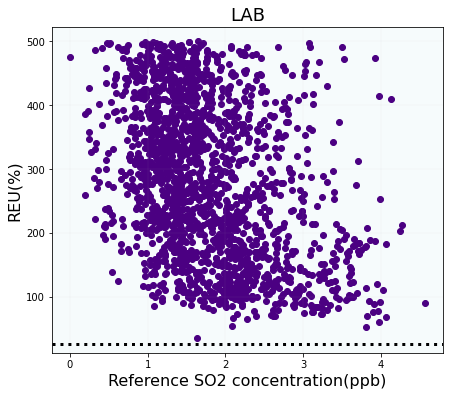

In [653]:
u_cal=REF(Lab1,y_test,3.9)
fig= plt.figure(figsize=(7,6))
ax = fig.add_subplot(111)
ax.patch.set_facecolor('lightblue')
ax.patch.set_alpha(0.1)
ind=[]
U_cal=[]
Ref=[]
for i in range(len(u_cal)):
    if -50<u_cal[i]<500:
        U_cal.append(u_cal[i])
        Ref.append(y_test[i])
plt.scatter(Ref,U_cal, color='#4B0082')
plt.axhline(y=25, color='black', linestyle=':',linewidth=3)
plt.ylabel('REU(%)', fontsize=16)
plt.xlabel('Reference SO2 concentration(ppb)',fontsize=16)
plt.grid(linestyle='-.',linewidth=0.1)
plt.title('LAB', fontsize=18)
plt.show()

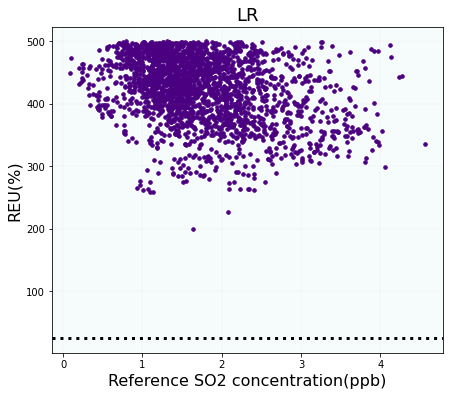

In [654]:
u_cal=REF(pred,y_test,3.9)
fig= plt.figure(figsize=(7,6))
ax = fig.add_subplot(111)
ax.patch.set_facecolor('lightblue')
ax.patch.set_alpha(0.1)
ind=[]
U_cal=[]
Ref=[]
for i in range(len(u_cal)):
    if -50<u_cal[i]<500:
        U_cal.append(u_cal[i])
        Ref.append(y_test[i])
plt.scatter(Ref,U_cal, color='#4B0082',marker='.',s=50)
plt.axhline(y=25, color='black', linestyle=':',linewidth=3)
plt.ylabel('REU(%)', fontsize=16)
plt.xlabel('Reference SO2 concentration(ppb)',fontsize=16)
plt.grid(linestyle='-.',linewidth=0.1)
plt.title('LR', fontsize=18)
plt.show()

In [655]:
import random
alpha=3.9
LV=max(y_test)
Cal=0
for i in range(len(y_test)):
    if y_test[i]==LV:
        Cal=lab1[i]
cal=np.array(lab1)
ref=np.array(y_test)
ref_mean=np.mean(ref)
cal_mean=np.mean(cal)
prec=np.array([20 for i in range(len(ref))])
u=0.001*ref
#cal=np.log(cal)
#ref=np.log(ref)
sx_s=(1/len(ref))*sum((ref-ref_mean)**2)
sy_s=(1/len(cal))*sum((cal-cal_mean)**2)
sxy=(1/len(cal))*sum((cal-cal_mean)*(ref-ref_mean))
#beta_1=((sy_s-sx_s)+np.sqrt((sy_s-sx_s)**2+4*sxy**2))/(2*sxy)
beta_1=((sy_s-alpha*sx_s)+np.sqrt((sy_s-sx_s)**2+4*alpha*sxy**2))/(2*sxy)
beta_0=cal_mean-beta_1*ref_mean
RSS=sum((cal-beta_0-beta_1*ref)**2-(beta_1**2+alpha)*(0.001*LV)**2)
du_s=RSS/(len(cal)-2)
    #Beta_1=((sy_s-sx_s-du_s)+np.sqrt((sy_s-sx_s-du_s)**2+4*sxy**2))/(2*sxy)
Beta_1=((sy_s-alpha*sx_s-du_s)+np.sqrt((sy_s-alpha*sx_s-du_s)**2+4*alpha*sxy**2))/(2*sxy)
Beta_0=cal_mean-Beta_1*ref_mean
P1=(RSS/(len(cal)-2))
P2=(Beta_1**2+alpha)*(0.001*LV)**2+(-2*Beta_1**2+2*Beta_1-1)*(0.001*LV)**2
P3=(Beta_0+(Beta_1-1)*LV)**2
P=P1+P2+P3
Bias=(2*(P3)**0.5/(Cal))*100
Random=(2*(P1+P2)**0.5/(Cal))*100

import random
alpha=3.9
LV1=350
Cal=0
for i in range(len(y_test)):
    if y_test[i]==LV:
        Cal=lab1[i]
cal=np.array(lab1)
ref=np.array(y_test)
ref_mean=np.mean(ref)
cal_mean=np.mean(cal)
prec=np.array([20 for i in range(len(ref))])
u=0.001*ref
#cal=np.log(cal)
#ref=np.log(ref)
sx_s=(1/len(ref))*sum((ref-ref_mean)**2)
sy_s=(1/len(cal))*sum((cal-cal_mean)**2)
sxy=(1/len(cal))*sum((cal-cal_mean)*(ref-ref_mean))
#beta_1=((sy_s-sx_s)+np.sqrt((sy_s-sx_s)**2+4*sxy**2))/(2*sxy)
beta_1=((sy_s-alpha*sx_s)+np.sqrt((sy_s-sx_s)**2+4*alpha*sxy**2))/(2*sxy)
beta_0=cal_mean-beta_1*ref_mean
RSS=sum((cal-beta_0-beta_1*ref)**2-(beta_1**2+alpha)*(0.001*LV1)**2)
du_s=RSS/(len(cal)-2)
    #Beta_1=((sy_s-sx_s-du_s)+np.sqrt((sy_s-sx_s-du_s)**2+4*sxy**2))/(2*sxy)
Beta_1=((sy_s-alpha*sx_s-du_s)+np.sqrt((sy_s-alpha*sx_s-du_s)**2+4*alpha*sxy**2))/(2*sxy)
Beta_0=cal_mean-Beta_1*ref_mean
P1=(RSS/(len(cal)-2))
P2=(Beta_1**2+alpha)*(0.001*LV1)**2+(-2*Beta_1**2+2*Beta_1-1)*(0.001*LV1)**2
P3=(Beta_0+(Beta_1-1)*LV1)**2
P=P1+P2+P3
Bias1=(2*(P3)**0.5/(Beta_0+Beta_1*LV1))*100
Random1=(2*(P1+P2)**0.5/(Beta_0+Beta_1*LV1))*100
Bias1,Random1

(2090.6443403399307, 312.3705767487102)

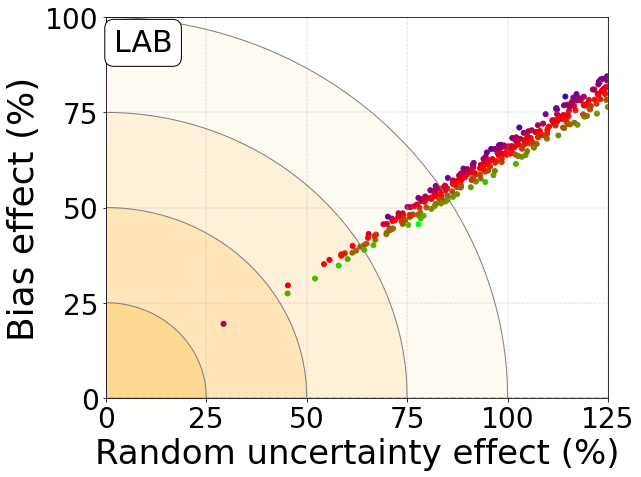

In [656]:
A=target(Lab1,y_test,3.9)
theta = np.linspace( 0 , 2 * np.pi , 150 )
r1 =25
a1= r1 * np.cos( theta )
b1= r1 * np.sin( theta )
r2 =50
a2=r2* np.cos( theta )
b2=r2* np.sin( theta )
r3 =75
a3=r3* np.cos( theta )
b3=r3* np.sin( theta )

r4 =100
a4=r4* np.cos( theta )
b4=r4* np.sin( theta )

fig= plt.figure(figsize=(9,7))
plt.Circle((0, 0), 1, color='wheat')
plt.vlines([0], -130, 130, linestyles='dashed',color='violet')
plt.hlines([0], -130, 130, linestyles='dashed', color='violet')

plt.fill_between(a1, b1, color='orange', alpha=0.2)
plt.fill_between(a2, b2, color='orange',alpha=0.15)
plt.fill_between(a3, b3, color='orange',alpha=0.1)
plt.fill_between(a4, b4, color='orange',alpha=0.05)

x1=np.arange(0,25.1,0.1)
r1=25
y1=np.sqrt(r1**2-x1**2)
x2=np.arange(0,50.1,0.1)
r2=50
y2=np.sqrt(r2**2-x2**2)

x3=np.arange(0,75.1,0.1)
r3=75
y3=np.sqrt(r3**2-x3**2)

x4=np.arange(0,100.1,0.1)
r4=100
y4=np.sqrt(r4**2-x4**2)

plt.plot(x1,y1, linewidth=1, color='grey')
plt.plot(x2,y2, linewidth=1, color='grey')
plt.plot(x3,y3, linewidth=1, color='grey')
plt.plot(x4,y4, linewidth=1, color='grey')

plt.xlabel('Random uncertainty effect (%)',fontsize=34)
plt.ylabel('Bias effect (%)',fontsize=36)
#plt.title(r'$SO_{2}$',fontsize=20)
plt.scatter(Random,Bias,marker='.',s=700, color='red')
plt.scatter(Random1,Bias1,marker='.',s=700, color='teal')
color_map = plt.cm.get_cmap('brg')
reversed_color_map = color_map
plt.scatter(A[0],A[1],marker='.',s=100,c=A[2],cmap=reversed_color_map)
plt.grid(linestyle='-.',linewidth=0.4)
plt.ylim(ymin=-0)
plt.ylim(ymax=100)
plt.xlim(xmax=125)
plt.xlim(xmin=0)
plt.xticks(np.arange(0,126, 25), fontsize=28)
plt.yticks(np.arange(0,101, 25), fontsize=28)
#plt.colorbar()
#cbar = plt.colorbar()
cbar.ax.tick_params(labelsize=30)
cbar.set_label('Concentration (ppb)', rotation=90,fontsize=36)
textstr = 'LAB'
props = dict(boxstyle='round', facecolor='white', alpha=1)
plt.text(0.13, 1.21, textstr, transform=ax.transAxes, fontsize=30,
        verticalalignment='top', bbox=props)
plt.show()

In [657]:
import random
alpha=3.9
LV=max(y_test)
Cal=0
for i in range(len(y_test)):
    if y_test[i]==LV:
        Cal=y_test[i]
cal=np.array(pred)
ref=np.array(y_test)
ref_mean=np.mean(ref)
cal_mean=np.mean(cal)
prec=np.array([20 for i in range(len(ref))])
u=0.001*ref
#cal=np.log(cal)
#ref=np.log(ref)
sx_s=(1/len(ref))*sum((ref-ref_mean)**2)
sy_s=(1/len(cal))*sum((cal-cal_mean)**2)
sxy=(1/len(cal))*sum((cal-cal_mean)*(ref-ref_mean))
#beta_1=((sy_s-sx_s)+np.sqrt((sy_s-sx_s)**2+4*sxy**2))/(2*sxy)
beta_1=((sy_s-alpha*sx_s)+np.sqrt((sy_s-sx_s)**2+4*alpha*sxy**2))/(2*sxy)
beta_0=cal_mean-beta_1*ref_mean
RSS=sum((cal-beta_0-beta_1*ref)**2-(beta_1**2+alpha)*(0.001*LV)**2)
du_s=RSS/(len(cal)-2)
    #Beta_1=((sy_s-sx_s-du_s)+np.sqrt((sy_s-sx_s-du_s)**2+4*sxy**2))/(2*sxy)
Beta_1=((sy_s-alpha*sx_s-du_s)+np.sqrt((sy_s-alpha*sx_s-du_s)**2+4*alpha*sxy**2))/(2*sxy)
Beta_0=cal_mean-Beta_1*ref_mean
P1=(RSS/(len(cal)-2))
P2=(Beta_1**2+alpha)*(0.001*LV)**2+(-2*Beta_1**2+2*Beta_1-1)*(0.001*LV)**2
P3=(Beta_0+(Beta_1-1)*LV)**2
P=P1+P2+P3
Bias=(2*(P3)**0.5/(Cal))*100
Random=(2*(P1+P2)**0.5/(Cal))*100

import random
alpha=3.9
LV1=350
Cal=0
for i in range(len(y_test)):
    if y_test[i]==LV:
        Cal=lab1[i]
cal=np.array(pred)
ref=np.array(y_test)
ref_mean=np.mean(ref)
cal_mean=np.mean(cal)
prec=np.array([20 for i in range(len(ref))])
u=0.001*ref
#cal=np.log(cal)
#ref=np.log(ref)
sx_s=(1/len(ref))*sum((ref-ref_mean)**2)
sy_s=(1/len(cal))*sum((cal-cal_mean)**2)
sxy=(1/len(cal))*sum((cal-cal_mean)*(ref-ref_mean))
#beta_1=((sy_s-sx_s)+np.sqrt((sy_s-sx_s)**2+4*sxy**2))/(2*sxy)
beta_1=((sy_s-alpha*sx_s)+np.sqrt((sy_s-sx_s)**2+4*alpha*sxy**2))/(2*sxy)
beta_0=cal_mean-beta_1*ref_mean
RSS=sum((cal-beta_0-beta_1*ref)**2-(beta_1**2+alpha)*(0.001*LV1)**2)
du_s=RSS/(len(cal)-2)
    #Beta_1=((sy_s-sx_s-du_s)+np.sqrt((sy_s-sx_s-du_s)**2+4*sxy**2))/(2*sxy)
Beta_1=((sy_s-alpha*sx_s-du_s)+np.sqrt((sy_s-alpha*sx_s-du_s)**2+4*alpha*sxy**2))/(2*sxy)
Beta_0=cal_mean-Beta_1*ref_mean
P1=(RSS/(len(cal)-2))
P2=(Beta_1**2+alpha)*(0.001*LV1)**2+(-2*Beta_1**2+2*Beta_1-1)*(0.001*LV1)**2
P3=(Beta_0+(Beta_1-1)*LV1)**2
P=P1+P2+P3
Bias1=(2*(P3)**0.5/(Beta_0+Beta_1*LV1))*100
Random1=(2*(P1+P2)**0.5/(Beta_0+Beta_1*LV1))*100


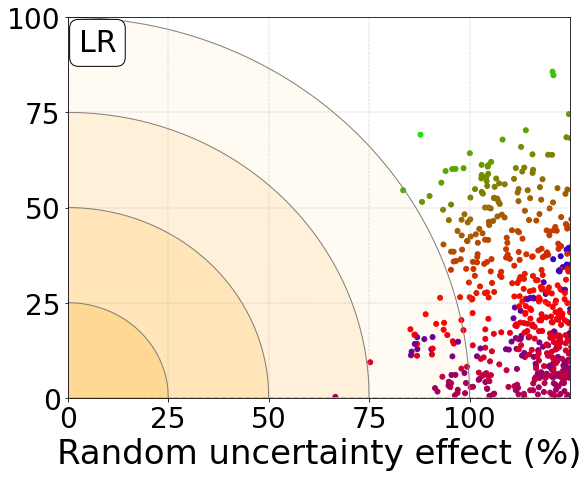

In [658]:
A=target(pred,y_test,3.9)
theta = np.linspace( 0 , 2 * np.pi , 150 )
r1 =25
a1= r1 * np.cos( theta )
b1= r1 * np.sin( theta )
r2 =50
a2=r2* np.cos( theta )
b2=r2* np.sin( theta )
r3 =75
a3=r3* np.cos( theta )
b3=r3* np.sin( theta )

r4 =100
a4=r4* np.cos( theta )
b4=r4* np.sin( theta )

fig= plt.figure(figsize=(9,7))
plt.Circle((0, 0), 1, color='wheat')
plt.vlines([0], -130, 130, linestyles='dashed',color='violet')
plt.hlines([0], -130, 130, linestyles='dashed', color='violet')

plt.fill_between(a1, b1, color='orange', alpha=0.2)
plt.fill_between(a2, b2, color='orange',alpha=0.15)
plt.fill_between(a3, b3, color='orange',alpha=0.1)
plt.fill_between(a4, b4, color='orange',alpha=0.05)

x1=np.arange(0,25.1,0.1)
r1=25
y1=np.sqrt(r1**2-x1**2)
x2=np.arange(0,50.1,0.1)
r2=50
y2=np.sqrt(r2**2-x2**2)

x3=np.arange(0,75.1,0.1)
r3=75
y3=np.sqrt(r3**2-x3**2)

x4=np.arange(0,100.1,0.1)
r4=100
y4=np.sqrt(r4**2-x4**2)

plt.plot(x1,y1, linewidth=1, color='grey')
plt.plot(x2,y2, linewidth=1, color='grey')
plt.plot(x3,y3, linewidth=1, color='grey')
plt.plot(x4,y4, linewidth=1, color='grey')

plt.xlabel('Random uncertainty effect (%)',fontsize=34)
#plt.ylabel('Bias effect (%)',fontsize=36)
#plt.title('SO2',fontsize=18)
color_map = plt.cm.get_cmap('brg')
reversed_color_map = color_map
plt.scatter(np.array(A[0])/3,np.array(A[1])/3,marker='.',s=100,c=A[2],cmap=reversed_color_map)
plt.grid(linestyle='-.',linewidth=0.4)
plt.ylim(ymin=-0)
plt.ylim(ymax=100)
plt.xlim(xmax=125)
plt.xlim(xmin=0)
plt.xticks(np.arange(0,121, 25),fontsize=28)
plt.yticks(np.arange(0,101, 25),fontsize=28)
#plt.colorbar()
#cbar = plt.colorbar()
cbar.ax.tick_params(labelsize=30)
cbar.set_label('Concentration (ppb)', rotation=90,fontsize=36)
plt.scatter(Random,Bias,marker='.',s=1500, color='teal')
plt.scatter(Random1+2,Bias1,marker='.',s=1500, color='black')
textstr = 'LR'
props = dict(boxstyle='round', facecolor='white', alpha=1)
plt.text(0.04, 1.21, textstr, transform=ax.transAxes, fontsize=30,
        verticalalignment='top', bbox=props)
plt.show()

## Scaling Laboratory Calibration
For the purpose of visual comparison with the ref and calibrated measurements, the lab measurement was scaled by a factor of 0.05

In [659]:
LAB1=0.2*np.array(Lab1)
A=len(y_test)-200
D=max(LAB1[A:])-0.2*max(LAB1[A:])
C=max(LAB1[A:])-0.1*max(LAB1[A:])
B=4000

fig= plt.figure(figsize=(8,6))
index=[i for i in range(1,201)]
ax = fig.add_subplot(111)
ax.patch.set_facecolor('lightblue')
ax.patch.set_alpha(0.3)
plt.plot(index,y_test[A:], color='limegreen',linewidth=3)
plt.plot(index,pred[A:], color='#513e00',linewidth=3)
plt.plot(index,LAB1[A:], color='#426eff',linewidth=3)
plt.legend(['Ref', 'LR-Calibrated', 'LAB-Calibrated(scaled)'], loc = 2, bbox_to_anchor = (0.65,1))
plt.ylabel('SO2 Concentration(ppb)'.translate(subscript),fontsize=18)
#plt.text(B-100, C, r'$R^{2}(LR)=$'+str(R2_lr_SO2), fontsize = 14, color='#513e00')
#plt.text(B-100, D, r'$R^{2}(Lab)=$'+str(R2_lab_SO2), fontsize = 14, color='#426eff')
#plt.text(B-400, C, 'Pearson r(LR)='+str(Pearson_lr), fontsize = 14, color='#513e00')
#plt.text(B-400, D, 'Pearson r(Lab)='+str(Pearson_lab), fontsize = 14, color='#426eff')
#plt.xlabel('Last 200 hours of testing period',fontsize=18)
#plt.title('Linear Regression Calibration vs Laboratory Calibration',fontsize=18)
plt.grid(linestyle='-.',linewidth=0.3)
plt.show()


In [660]:
print("Regressor model performance:")
print("Mean absolute error(MAE) =", round(sm.mean_absolute_error(y_test, pred), 2))
print("Mean squared error(MSE) =", round(sm.mean_squared_error(y_test, pred), 2))
print("Median absolute error =", round(sm.median_absolute_error(y_test, pred), 2))
print("Explain variance score =", round(sm.explained_variance_score(y_test, pred), 2))
print("R2 score =", round(sm.r2_score(y_test, pred), 2))
MBE_LR_SO2=MBE(pred,y_test)/np.std(y_test)
CRMSE_LR_SO2=CRMSE(y_test,pred)/np.std(y_test)
MBE_LAB_SO2=MBE(lab1,y_test)/(25*np.std(y_test))
CRMSE_LAB_SO2=CRMSE(y_test,lab1)/25*(np.std(y_test))
pred_lr=pred

Regressor model performance:
Mean absolute error(MAE) = 0.5
Mean squared error(MSE) = 0.41
Median absolute error = 0.4
Explain variance score = 0.19
R2 score = 0.19


# Model 2: SVR

In [661]:
from sklearn.svm import SVR
from sklearn.preprocessing import StandardScaler
regressor = SVR(kernel = 'poly',degree=3)
regressor.fit(X_train.drop(['Lab2'], axis=1), y_train)
pred = regressor.predict(X_test.drop(['Lab2'], axis=1))

In [662]:
Y_test=y_test.to_list()
Y_test=pd.Series(Y_test,index =Index)
Y_test
Pred=pd.Series(pred,index =Index)
Lab1=pd.Series(lab1,index =Index)
sMAPE_lr=round(smape_loss(Y_test,Pred),2)
sMAPE_lab=round (smape_loss(Y_test,Lab1),2)
RMSE_lr=round(np.sqrt(sm.mean_squared_error(y_test, pred)),1)
RMSE_lab=round(np.sqrt(sm.mean_squared_error(y_test, lab1)),1)
Pearson_lr=round(np.corrcoef(y_test, pred)[0, 1],2)
Pearson_lab=round(np.corrcoef(y_test, lab1)[0, 1],2)
sMAPE_svr_SO2=sMAPE_lr
RMSE_svr_SO2=RMSE_lr/np.mean(np.array(y_test))
Pearson_svr_SO2=Pearson_lr
R2_svr_SO2=round(sm.r2_score(y_test, pred), 2)
RMSE_Svr_SO2=RMSE_lr

fig= plt.figure(figsize=(8,6))
ax = fig.add_subplot(111)
ax.patch.set_facecolor('lightblue')
ax.patch.set_alpha(0.3)
plt.plot(index,y_test[A:], color='limegreen',linewidth=3)
plt.plot(index,pred[A:], color='brown',linewidth=3)
plt.plot(index,LAB1[A:], color='#426eff',linewidth=3)
plt.legend(['Ref', 'SVR-Calibrated', 'LAB-Calibrated(Scaled)'], loc = 2, bbox_to_anchor = (0.65,1))
plt.ylabel('SO2 Concentration(ppb)'.translate(subscript),fontsize=18)
#plt.text(B-200, C,r'$R^{2}(SVR)=$'+str(R2_svr_SO2) , fontsize = 14, color='brown')
#plt.text(B-200, D, r'$R^{2}(Lab)=$'+str(R2_lab_SO2), fontsize = 14, color='#426eff')
#plt.text(B-420, C, 'Pearson r(SVR)='+str(Pearson_lr), fontsize = 14, color='brown')
#plt.text(B-420, D, 'Pearson r(Lab)='+str(Pearson_lab), fontsize = 14, color='#426eff')
#plt.xlabel('Last 200 hours of testing period',fontsize=18)
#plt.title('Support Vector Regression (SVR) Calibration vs Laboratory Calibration',fontsize=18)
plt.grid(linestyle='-.',linewidth=0.3)
plt.show()

In [663]:
print("Regressor model performance:")
print("Mean absolute error(MAE) =", round(sm.mean_absolute_error(y_test, pred), 2))
print("Mean squared error(MSE) =", round(sm.mean_squared_error(y_test, pred), 2))
print("Median absolute error =", round(sm.median_absolute_error(y_test, pred), 2))
print("Explain variance score =", round(sm.explained_variance_score(y_test, pred), 2))
print("R2 score =", round(sm.r2_score(y_test, pred), 2))

MBE_SVR_SO2=MBE(pred,y_test)/np.std(y_test)
CRMSE_SVR_SO2=CRMSE(y_test,pred)/np.std(y_test)
pred_svr=pred

Regressor model performance:
Mean absolute error(MAE) = 0.45
Mean squared error(MSE) = 0.37
Median absolute error = 0.35
Explain variance score = 0.28
R2 score = 0.27


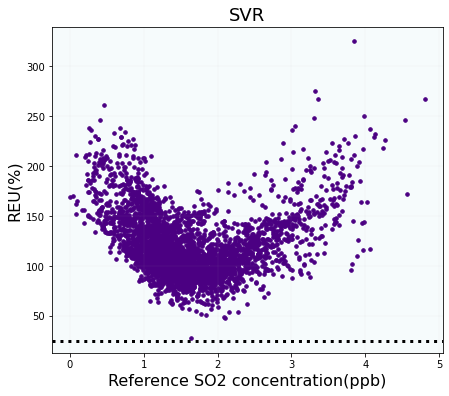

In [664]:
u_cal=REF(pred,y_test,1.9)
fig= plt.figure(figsize=(7,6))
ax = fig.add_subplot(111)
ax.patch.set_facecolor('lightblue')
ax.patch.set_alpha(0.1)
ind=[]
U_cal=[]
Ref=[]
for i in range(len(u_cal)):
    if -50<u_cal[i]<500:
        U_cal.append(u_cal[i])
        Ref.append(y_test[i])
plt.scatter(Ref,U_cal, color='#4B0082',marker='.',s=50)
plt.axhline(y=25, color='black', linestyle=':',linewidth=3)
plt.ylabel('REU(%)', fontsize=16)
plt.xlabel('Reference SO2 concentration(ppb)',fontsize=16)
plt.grid(linestyle='-.',linewidth=0.1)
plt.title('SVR', fontsize=18)
plt.show()

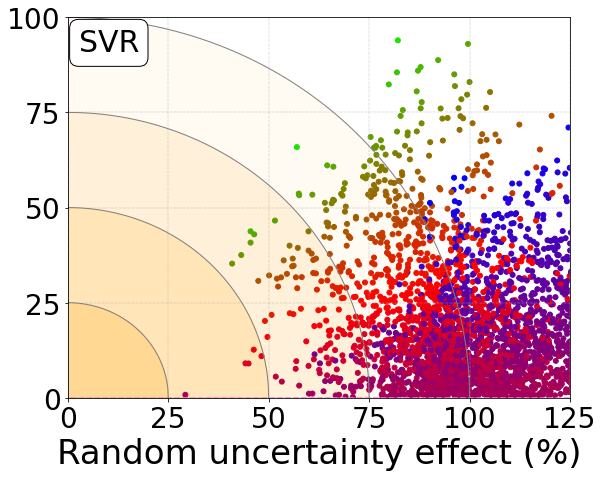

In [665]:
A=target(pred,y_test,3.9)
theta = np.linspace( 0 , 2 * np.pi , 150 )
r1 =25
a1= r1 * np.cos( theta )
b1= r1 * np.sin( theta )
r2 =50
a2=r2* np.cos( theta )
b2=r2* np.sin( theta )
r3 =75
a3=r3* np.cos( theta )
b3=r3* np.sin( theta )

r4 =100
a4=r4* np.cos( theta )
b4=r4* np.sin( theta )

fig= plt.figure(figsize=(9,7))
plt.Circle((0, 0), 1, color='wheat')
plt.vlines([0], -130, 130, linestyles='dashed',color='violet')
plt.hlines([0], -130, 130, linestyles='dashed', color='violet')

plt.fill_between(a1, b1, color='orange', alpha=0.2)
plt.fill_between(a2, b2, color='orange',alpha=0.15)
plt.fill_between(a3, b3, color='orange',alpha=0.1)
plt.fill_between(a4, b4, color='orange',alpha=0.05)

x1=np.arange(0,25.1,0.1)
r1=25
y1=np.sqrt(r1**2-x1**2)
x2=np.arange(0,50.1,0.1)
r2=50
y2=np.sqrt(r2**2-x2**2)

x3=np.arange(0,75.1,0.1)
r3=75
y3=np.sqrt(r3**2-x3**2)

x4=np.arange(0,100.1,0.1)
r4=100
y4=np.sqrt(r4**2-x4**2)

plt.plot(x1,y1, linewidth=1, color='grey')
plt.plot(x2,y2, linewidth=1, color='grey')
plt.plot(x3,y3, linewidth=1, color='grey')
plt.plot(x4,y4, linewidth=1, color='grey')

plt.xlabel('Random uncertainty effect (%)',fontsize=34)
#plt.ylabel('Bias effect (%)',fontsize=36)
#plt.title('SO2',fontsize=20)
color_map = plt.cm.get_cmap('brg')
reversed_color_map = color_map
plt.scatter(np.array(A[0])/3,np.array(A[1])/3,marker='.',s=100,c=A[2],cmap=reversed_color_map)
plt.grid(linestyle='-.',linewidth=0.4)
plt.ylim(ymin=-0)
plt.ylim(ymax=100)
plt.xlim(xmax=125)
plt.xlim(xmin=0)
plt.xticks(np.arange(0,126, 25),fontsize=28)
plt.yticks(np.arange(0,101, 25),fontsize=28)
#plt.colorbar()
#cbar = plt.colorbar()
cbar.ax.tick_params(labelsize=30)
cbar.set_label('Concentration (ppb)', rotation=90,fontsize=36)
plt.scatter(Random,Bias,marker='.',s=1500, color='teal')
plt.scatter(Random1+2,Bias1,marker='.',s=1500, color='black')
textstr = 'SVR'
props = dict(boxstyle='round', facecolor='white', alpha=1)
plt.text(0.04, 1.21, textstr, transform=ax.transAxes, fontsize=30,
        verticalalignment='top', bbox=props)
plt.show()

 # Model 3: Random Forest

In [666]:
from sklearn.ensemble import RandomForestRegressor
  
 # create regressor object
regressor = RandomForestRegressor(n_estimators = 500,min_samples_split= 2,min_samples_leaf= 1,max_features= 'sqrt', 
                                  random_state = 0,max_depth=None,bootstrap=False)
  
# fit the regressor with x and y data
regressor=regressor.fit(X_train.drop(['Lab2'], axis=1), y_train)  

In [667]:
Index=[i for i in range(len(y_test))]
features_SO2=regressor.feature_importances_
pred = regressor.predict(X_test.drop(['Lab2'], axis=1))
pred_rf_so2=pred
Y_test=y_test.to_list()
Y_test=pd.Series(Y_test,index =Index)
Y_test
Pred=pd.Series(pred,index =Index)
Lab1=pd.Series(lab1,index =Index)
sMAPE_lr=round(smape_loss(Y_test,Pred),2)
sMAPE_lab=round (smape_loss(Y_test,Lab1),2)
RMSE_lr=round(np.sqrt(sm.mean_squared_error(y_test, pred)),1)
RMSE_lab=round(np.sqrt(sm.mean_squared_error(y_test, lab1)),1)
Pearson_lr=round(np.corrcoef(y_test, pred)[0, 1],2)
Pearson_lab=round(np.corrcoef(y_test, lab1)[0, 1],2)
sMAPE_rf_SO2=sMAPE_lr
RMSE_rf_SO2=RMSE_lr/np.mean(np.array(y_test))
Pearson_rf_SO2=Pearson_lr
R2_rf_SO2=round(sm.r2_score(y_test, pred), 2)
RMSE_Rf_SO2=RMSE_lr

fig= plt.figure(figsize=(10,5))
ax = fig.add_subplot(111)
ax.patch.set_facecolor('lightblue')
ax.patch.set_alpha(0.3)
plt.plot(index,y_test[A:], color='limegreen',linewidth=3)
plt.plot(index,pred[A:], color='indigo',linewidth=3)
plt.plot(index,LAB1[A:], color='#426eff',linewidth=3)
plt.legend(['Ref', 'RF-Calibrated', 'LAB-Calibrated(Scaled)'], loc = 2, bbox_to_anchor = (0.72,1))
plt.ylabel('SO2 Concentration(ppb)'.translate(subscript),fontsize=18)
plt.text(B-20, C,r'$R^{2}(RF)=$'+str(R2_rf_SO2) , fontsize = 14, color='indigo')
plt.text(B-20, D,r'$R^{2}(Lab)=$'+str(R2_lab_SO2) , fontsize = 14, color='#426eff')
plt.text(B-70, C, 'Pearson r(RF)='+str(Pearson_lr), fontsize = 14, color='indigo')
plt.text(B-70, D, 'Pearson r(Lab)='+str(Pearson_lab), fontsize = 14, color='#426eff')
#plt.xlabel('Last 200 hours of testing period',fontsize=18)
#plt.title('Visualization: Random Forest(RF) Calibration vs Laboratory Calibration',fontsize=18)
plt.grid(linestyle='-.',linewidth=0.3)
plt.show()

In [668]:
print("Regressor model performance:")
print("Mean absolute error(MAE) =", round(sm.mean_absolute_error(y_test, pred), 2))
print("Mean squared error(MSE) =", round(sm.mean_squared_error(y_test, pred), 2))
print("Median absolute error =", round(sm.median_absolute_error(y_test, pred), 2))
print("Explain variance score =", round(sm.explained_variance_score(y_test, pred), 2))
print("R2 score =", round(sm.r2_score(y_test, pred), 2))

MBE_RF_SO2=MBE(pred,y_test)/np.std(y_test)
CRMSE_RF_SO2=CRMSE(y_test,pred)/np.std(y_test)
pred_rf=pred

Regressor model performance:
Mean absolute error(MAE) = 0.13
Mean squared error(MSE) = 0.04
Median absolute error = 0.08
Explain variance score = 0.92
R2 score = 0.92


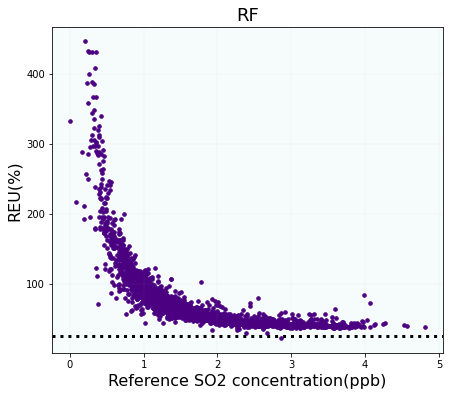

In [669]:
u_cal=REF(pred,y_test,3.9)
fig= plt.figure(figsize=(7,6))
ax = fig.add_subplot(111)
ax.patch.set_facecolor('lightblue')
ax.patch.set_alpha(0.1)
ind=[]
U_cal=[]
Ref=[]
for i in range(len(u_cal)):
    if -50<u_cal[i]<500:
        U_cal.append(u_cal[i])
        Ref.append(y_test[i])
plt.scatter(Ref,U_cal, color='#4B0082',marker='.',s=50)
plt.axhline(y=25, color='black', linestyle=':',linewidth=3)
plt.ylabel('REU(%)', fontsize=16)
plt.xlabel('Reference SO2 concentration(ppb)',fontsize=16)
plt.grid(linestyle='-.',linewidth=0.1)
plt.title('RF', fontsize=18)
plt.show()

In [670]:
import random
alpha=3.9
LV=max(y_test)
Cal=0
for i in range(len(y_test)):
    if y_test[i]==LV:
        Cal=y_test[i]
cal=np.array(pred)
ref=np.array(y_test)
ref_mean=np.mean(ref)
cal_mean=np.mean(cal)
prec=np.array([20 for i in range(len(ref))])
u=0.001*ref
#cal=np.log(cal)
#ref=np.log(ref)
sx_s=(1/len(ref))*sum((ref-ref_mean)**2)
sy_s=(1/len(cal))*sum((cal-cal_mean)**2)
sxy=(1/len(cal))*sum((cal-cal_mean)*(ref-ref_mean))
#beta_1=((sy_s-sx_s)+np.sqrt((sy_s-sx_s)**2+4*sxy**2))/(2*sxy)
beta_1=((sy_s-alpha*sx_s)+np.sqrt((sy_s-sx_s)**2+4*alpha*sxy**2))/(2*sxy)
beta_0=cal_mean-beta_1*ref_mean
RSS=sum((cal-beta_0-beta_1*ref)**2-(beta_1**2+alpha)*(0.001*LV)**2)
du_s=RSS/(len(cal)-2)
    #Beta_1=((sy_s-sx_s-du_s)+np.sqrt((sy_s-sx_s-du_s)**2+4*sxy**2))/(2*sxy)
Beta_1=((sy_s-alpha*sx_s-du_s)+np.sqrt((sy_s-alpha*sx_s-du_s)**2+4*alpha*sxy**2))/(2*sxy)
Beta_0=cal_mean-Beta_1*ref_mean
P1=(RSS/(len(cal)-2))
P2=(Beta_1**2+alpha)*(0.001*LV)**2+(-2*Beta_1**2+2*Beta_1-1)*(0.001*LV)**2
P3=(Beta_0+(Beta_1-1)*LV)**2
P=P1+P2+P3
Bias=(2*(P3)**0.5/(Cal))*100
Random=(2*(P1+P2)**0.5/(Cal))*100

import random
alpha=3.9
LV1=350
Cal=0
for i in range(len(y_test)):
    if y_test[i]==LV:
        Cal=lab1[i]
cal=np.array(pred)
ref=np.array(y_test)
ref_mean=np.mean(ref)
cal_mean=np.mean(cal)
prec=np.array([20 for i in range(len(ref))])
u=0.001*ref
#cal=np.log(cal)
#ref=np.log(ref)
sx_s=(1/len(ref))*sum((ref-ref_mean)**2)
sy_s=(1/len(cal))*sum((cal-cal_mean)**2)
sxy=(1/len(cal))*sum((cal-cal_mean)*(ref-ref_mean))
#beta_1=((sy_s-sx_s)+np.sqrt((sy_s-sx_s)**2+4*sxy**2))/(2*sxy)
beta_1=((sy_s-alpha*sx_s)+np.sqrt((sy_s-sx_s)**2+4*alpha*sxy**2))/(2*sxy)
beta_0=cal_mean-beta_1*ref_mean
RSS=sum((cal-beta_0-beta_1*ref)**2-(beta_1**2+alpha)*(0.001*LV1)**2)
du_s=RSS/(len(cal)-2)
    #Beta_1=((sy_s-sx_s-du_s)+np.sqrt((sy_s-sx_s-du_s)**2+4*sxy**2))/(2*sxy)
Beta_1=((sy_s-alpha*sx_s-du_s)+np.sqrt((sy_s-alpha*sx_s-du_s)**2+4*alpha*sxy**2))/(2*sxy)
Beta_0=cal_mean-Beta_1*ref_mean
P1=(RSS/(len(cal)-2))
P2=(Beta_1**2+alpha)*(0.001*LV1)**2+(-2*Beta_1**2+2*Beta_1-1)*(0.001*LV1)**2
P3=(Beta_0+(Beta_1-1)*LV1)**2
P=P1+P2+P3
Bias1=(2*(P3)**0.5/(Beta_0+Beta_1*LV1))*100
Random1=(2*(P1+P2)**0.5/(Beta_0+Beta_1*LV1))*100


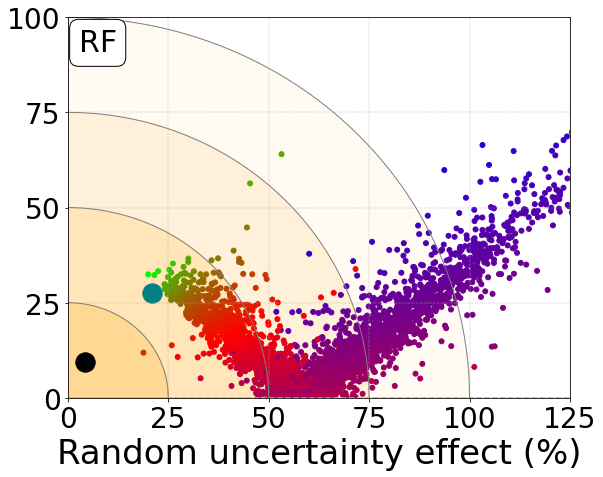

In [671]:
A=target(pred,y_test,3.9)
theta = np.linspace( 0 , 2 * np.pi , 150 )
r1 =25
a1= r1 * np.cos( theta )
b1= r1 * np.sin( theta )
r2 =50
a2=r2* np.cos( theta )
b2=r2* np.sin( theta )
r3 =75
a3=r3* np.cos( theta )
b3=r3* np.sin( theta )

r4 =100
a4=r4* np.cos( theta )
b4=r4* np.sin( theta )

fig= plt.figure(figsize=(9,7))
plt.Circle((0, 0), 1, color='wheat')
plt.vlines([0], -130, 130, linestyles='dashed',color='violet')
plt.hlines([0], -130, 130, linestyles='dashed', color='violet')

plt.fill_between(a1, b1, color='orange', alpha=0.2)
plt.fill_between(a2, b2, color='orange',alpha=0.15)
plt.fill_between(a3, b3, color='orange',alpha=0.1)
plt.fill_between(a4, b4, color='orange',alpha=0.05)

x1=np.arange(0,25.1,0.1)
r1=25
y1=np.sqrt(r1**2-x1**2)
x2=np.arange(0,50.1,0.1)
r2=50
y2=np.sqrt(r2**2-x2**2)

x3=np.arange(0,75.1,0.1)
r3=75
y3=np.sqrt(r3**2-x3**2)

x4=np.arange(0,100.1,0.1)
r4=100
y4=np.sqrt(r4**2-x4**2)

plt.plot(x1,y1, linewidth=1, color='grey')
plt.plot(x2,y2, linewidth=1, color='grey')
plt.plot(x3,y3, linewidth=1, color='grey')
plt.plot(x4,y4, linewidth=1, color='grey')

plt.xlabel('Random uncertainty effect (%)',fontsize=34)
#plt.ylabel('Bias effect (%)',fontsize=36)
#plt.title(r'$SO_{2}$',fontsize=20)
#plt.scatter(Random,Bias,marker='.',s=700, color='red')
#plt.scatter(Random1+2,Bias1,marker='.',s=700, color='teal')
color_map = plt.cm.get_cmap('brg')
reversed_color_map = color_map
plt.scatter(A[0],A[1],marker='.',s=100,c=A[2],cmap=reversed_color_map)
plt.grid(linestyle='-.',linewidth=0.4)
plt.ylim(ymin=-0)
plt.ylim(ymax=100)
plt.xlim(xmax=125)
plt.xlim(xmin=0)
plt.xticks(np.arange(0,126, 25), fontsize=28)
plt.yticks(np.arange(0,101, 25), fontsize=28)
#plt.colorbar()
#cbar = plt.colorbar()
cbar.ax.tick_params(labelsize=30)
cbar.set_label('Concentration (ppb)', rotation=90,fontsize=36)
plt.scatter(Random,Bias,marker='.',s=1500, color='teal')
plt.scatter(Random1+4,Bias1+4,marker='.',s=1500, color='black')
textstr = 'RF'
props = dict(boxstyle='round', facecolor='white', alpha=1)
plt.text(0.04, 1.21, textstr, transform=ax.transAxes, fontsize=30,
        verticalalignment='top', bbox=props)
plt.show()

In [672]:
A=[i for i in np.arange(1,20,0.1)]
K=[]
for i in A:
    k=REF2(pred,y_test,i,350)
    K.append(k)
for i in range(len(K)):
    if K[i]==min(K):
        print(A[i])

3.500000000000002


# Model 4 : ANN

In [673]:
from keras.models import Sequential
from keras.layers import Dense
from keras import optimizers
from sklearn.preprocessing import StandardScaler
model = Sequential()
model.add(Dense(6, input_shape = (6,),kernel_initializer='normal', activation= 'linear'))
model.add(Dense(128,kernel_initializer='normal', activation= 'relu'))
model.add(Dense(50, kernel_initializer='normal',activation= 'relu'))
#model.add(Dense(100, kernel_initializer='normal',activation= 'relu'))
model.add(Dense(1,kernel_initializer='normal',activation='linear',))
sgd = optimizers.Adam(learning_rate=0.01)

model.compile(optimizer = sgd, loss = 'mean_squared_error', metrics= ['mse', 'mae'])
model.summary()

Model: "sequential_10"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_48 (Dense)             (None, 6)                 42        
_________________________________________________________________
dense_49 (Dense)             (None, 128)               896       
_________________________________________________________________
dense_50 (Dense)             (None, 50)                6450      
_________________________________________________________________
dense_51 (Dense)             (None, 1)                 51        
Total params: 7,439
Trainable params: 7,439
Non-trainable params: 0
_________________________________________________________________


In [674]:
scaler = StandardScaler()
scaler.fit(X_train.drop(['Lab2'], axis=1))
X_train_scaled=scaler.transform(X_train.drop(['Lab2'], axis=1))
X_test_scaled=scaler.transform(X_test.drop(['Lab2'], axis=1))
model.fit(X_train_scaled, y_train, batch_size= 200, epochs=100, verbose= 0)

In [675]:
train_pred = model.predict(X_train_scaled)
test_pred = model.predict(X_test_scaled)
pred=[]
for i in range(len(test_pred)):
    pred.append(sum(list(test_pred[i])))
len(y_test)

3562

In [676]:
Y_test=y_test.to_list()
Y_test=pd.Series(Y_test,index =Index)
Y_test
Pred=pd.Series(pred,index =Index)
Lab1=pd.Series(lab1,index =Index)
sMAPE_lr=round(smape_loss(Y_test,Pred),2)
sMAPE_lab=round (smape_loss(Y_test,Lab1),2)
RMSE_lr=round(np.sqrt(sm.mean_squared_error(y_test, pred)),1)
RMSE_lab=round(np.sqrt(sm.mean_squared_error(y_test, lab1)),1)
Pearson_lr=round(np.corrcoef(y_test, pred)[0, 1],2)
Pearson_lab=round(np.corrcoef(y_test, lab1)[0, 1],2)
sMAPE_ann_SO2=sMAPE_lr
RMSE_ann_SO2=RMSE_lr/np.mean(np.array(y_test))
Pearson_ann_SO2=Pearson_lr
R2_ann_SO2=round(sm.r2_score(y_test, pred), 2)
RMSE_Ann_SO2=RMSE_lr

fig= plt.figure(figsize=(8,6))
ax = fig.add_subplot(111)
ax.patch.set_facecolor('lightblue')
ax.patch.set_alpha(0.3)
plt.plot(index,y_test[A:], color='limegreen',linewidth=3)
plt.plot(index,pred[A:], color='tomato',linewidth=3)
plt.plot(index,LAB1[A:], color='#426eff',linewidth=3)
plt.legend(['Ref', 'ANN-Calibrated', 'LAB-Calibrated(Scaled)'], loc = 2, bbox_to_anchor = (0.65,1))
plt.ylabel('SO2 Concentration(ppb)'.translate(subscript),fontsize=18)
#plt.text(B-200, C,r'$R^{2}(ANN)=$'+str(R2_ann_SO2) , fontsize = 14, color='tomato')
#plt.text(B-200, D,r'$R^{2}(Lab)=$'+str(R2_lab_SO2) , fontsize = 14, color='#426eff')
#plt.text(B-400, C, 'Pearson r(ANN)='+str(Pearson_lr), fontsize = 14, color='tomato')
#plt.text(B-400, D, 'Pearson r(Lab)='+str(Pearson_lab), fontsize = 14, color='#426eff')
#plt.xlabel('Last 200 hours of testing period',fontsize=18)
#plt.title('Artificial Neural Network(ANN)  Calibration vs Laboratory Calibration',fontsize=18)
plt.grid(linestyle='-.',linewidth=0.3)
plt.show()

In [677]:
print("Regressor model performance:")
print("Mean absolute error(MAE) =", round(sm.mean_absolute_error(y_test, pred), 2))
print("Mean squared error(MSE) =", round(sm.mean_squared_error(y_test, pred), 2))
print("Median absolute error =", round(sm.median_absolute_error(y_test, pred), 2))
print("Explain variance score =", round(sm.explained_variance_score(y_test, pred), 2))
print("R2 score =", round(sm.r2_score(y_test, pred), 2))

MBE_ANN_SO2=MBE(pred,y_test)/np.std(y_test)
CRMSE_ANN_SO2=CRMSE(y_test,pred)/np.std(y_test)
pred_ann=pred

Regressor model performance:
Mean absolute error(MAE) = 0.25
Mean squared error(MSE) = 0.12
Median absolute error = 0.2
Explain variance score = 0.77
R2 score = 0.76


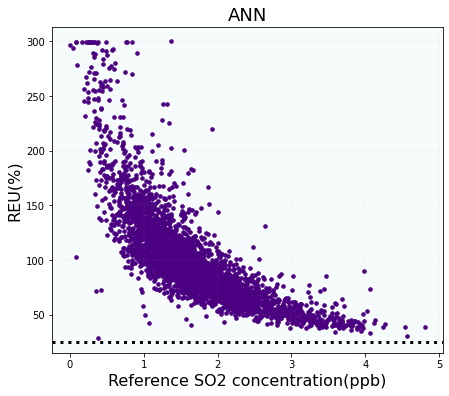

In [678]:
u_cal=REF(pred,y_test,3.9)
fig= plt.figure(figsize=(7,6))
ax = fig.add_subplot(111)
ax.patch.set_facecolor('lightblue')
ax.patch.set_alpha(0.1)
ind=[]
U_cal=[]
Ref=[]
for i in range(len(u_cal)):
    if -50<u_cal[i]<500:
        U_cal.append(u_cal[i])
        Ref.append(y_test[i])
plt.scatter(Ref,U_cal, color='#4B0082',marker='.',s=50)
plt.axhline(y=25, color='black', linestyle=':',linewidth=3)
plt.ylabel('REU(%)', fontsize=16)
plt.xlabel('Reference SO2 concentration(ppb)',fontsize=16)
plt.grid(linestyle='-.',linewidth=0.1)
plt.title('ANN', fontsize=18)
plt.show()

In [679]:
import random
alpha=3.9
LV=max(y_test)
Cal=0
for i in range(len(y_test)):
    if y_test[i]==LV:
        Cal=y_test[i]
cal=np.array(pred)
ref=np.array(y_test)
ref_mean=np.mean(ref)
cal_mean=np.mean(cal)
prec=np.array([20 for i in range(len(ref))])
u=0.001*ref
#cal=np.log(cal)
#ref=np.log(ref)
sx_s=(1/len(ref))*sum((ref-ref_mean)**2)
sy_s=(1/len(cal))*sum((cal-cal_mean)**2)
sxy=(1/len(cal))*sum((cal-cal_mean)*(ref-ref_mean))
#beta_1=((sy_s-sx_s)+np.sqrt((sy_s-sx_s)**2+4*sxy**2))/(2*sxy)
beta_1=((sy_s-alpha*sx_s)+np.sqrt((sy_s-sx_s)**2+4*alpha*sxy**2))/(2*sxy)
beta_0=cal_mean-beta_1*ref_mean
RSS=sum((cal-beta_0-beta_1*ref)**2-(beta_1**2+alpha)*(0.001*LV)**2)
du_s=RSS/(len(cal)-2)
    #Beta_1=((sy_s-sx_s-du_s)+np.sqrt((sy_s-sx_s-du_s)**2+4*sxy**2))/(2*sxy)
Beta_1=((sy_s-alpha*sx_s-du_s)+np.sqrt((sy_s-alpha*sx_s-du_s)**2+4*alpha*sxy**2))/(2*sxy)
Beta_0=cal_mean-Beta_1*ref_mean
P1=(RSS/(len(cal)-2))
P2=(Beta_1**2+alpha)*(0.001*LV)**2+(-2*Beta_1**2+2*Beta_1-1)*(0.001*LV)**2
P3=(Beta_0+(Beta_1-1)*LV)**2
P=P1+P2+P3
Bias=(2*(P3)**0.5/(Cal))*100
Random=(2*(P1+P2)**0.5/(Cal))*100

import random
alpha=3.9
LV1=350
Cal=0
for i in range(len(y_test)):
    if y_test[i]==LV:
        Cal=lab1[i]
cal=np.array(pred)
ref=np.array(y_test)
ref_mean=np.mean(ref)
cal_mean=np.mean(cal)
prec=np.array([20 for i in range(len(ref))])
u=0.001*ref
#cal=np.log(cal)
#ref=np.log(ref)
sx_s=(1/len(ref))*sum((ref-ref_mean)**2)
sy_s=(1/len(cal))*sum((cal-cal_mean)**2)
sxy=(1/len(cal))*sum((cal-cal_mean)*(ref-ref_mean))
#beta_1=((sy_s-sx_s)+np.sqrt((sy_s-sx_s)**2+4*sxy**2))/(2*sxy)
beta_1=((sy_s-alpha*sx_s)+np.sqrt((sy_s-sx_s)**2+4*alpha*sxy**2))/(2*sxy)
beta_0=cal_mean-beta_1*ref_mean
RSS=sum((cal-beta_0-beta_1*ref)**2-(beta_1**2+alpha)*(0.001*LV1)**2)
du_s=RSS/(len(cal)-2)
    #Beta_1=((sy_s-sx_s-du_s)+np.sqrt((sy_s-sx_s-du_s)**2+4*sxy**2))/(2*sxy)
Beta_1=((sy_s-alpha*sx_s-du_s)+np.sqrt((sy_s-alpha*sx_s-du_s)**2+4*alpha*sxy**2))/(2*sxy)
Beta_0=cal_mean-Beta_1*ref_mean
P1=(RSS/(len(cal)-2))
P2=(Beta_1**2+alpha)*(0.001*LV1)**2+(-2*Beta_1**2+2*Beta_1-1)*(0.001*LV1)**2
P3=(Beta_0+(Beta_1-1)*LV1)**2
P=P1+P2+P3
Bias1=(2*(P3)**0.5/(Beta_0+Beta_1*LV1))*100
Random1=(2*(P1+P2)**0.5/(Beta_0+Beta_1*LV1))*100


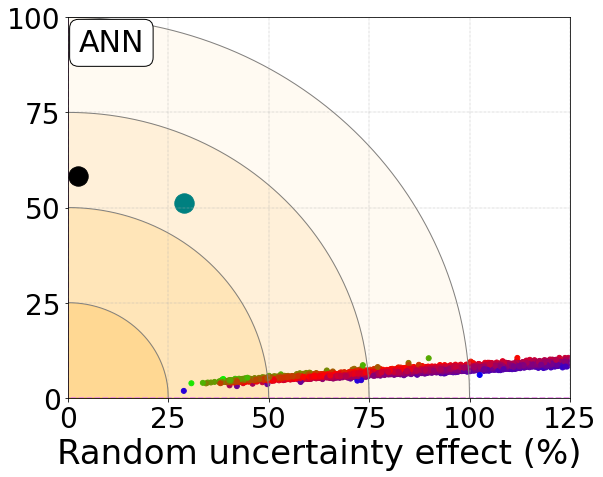

In [680]:
A=target(pred,y_test,3.9)
theta = np.linspace( 0 , 2 * np.pi , 150 )
r1 =25
a1= r1 * np.cos( theta )
b1= r1 * np.sin( theta )
r2 =50
a2=r2* np.cos( theta )
b2=r2* np.sin( theta )
r3 =75
a3=r3* np.cos( theta )
b3=r3* np.sin( theta )

r4 =100
a4=r4* np.cos( theta )
b4=r4* np.sin( theta )

fig= plt.figure(figsize=(9,7))
plt.Circle((0, 0), 1, color='wheat')
plt.vlines([0], -130, 130, linestyles='dashed',color='violet')
plt.hlines([0], -130, 130, linestyles='dashed', color='violet')

plt.fill_between(a1, b1, color='orange', alpha=0.2)
plt.fill_between(a2, b2, color='orange',alpha=0.15)
plt.fill_between(a3, b3, color='orange',alpha=0.1)
plt.fill_between(a4, b4, color='orange',alpha=0.05)

x1=np.arange(0,25.1,0.1)
r1=25
y1=np.sqrt(r1**2-x1**2)
x2=np.arange(0,50.1,0.1)
r2=50
y2=np.sqrt(r2**2-x2**2)

x3=np.arange(0,75.1,0.1)
r3=75
y3=np.sqrt(r3**2-x3**2)

x4=np.arange(0,100.1,0.1)
r4=100
y4=np.sqrt(r4**2-x4**2)

plt.plot(x1,y1, linewidth=1, color='grey')
plt.plot(x2,y2, linewidth=1, color='grey')
plt.plot(x3,y3, linewidth=1, color='grey')
plt.plot(x4,y4, linewidth=1, color='grey')

plt.xlabel('Random uncertainty effect (%)',fontsize=34)
#plt.ylabel('Bias effect (%)',fontsize=36)
#plt.title('SO2',fontsize=18)
color_map = plt.cm.get_cmap('brg')
reversed_color_map = color_map
plt.scatter(A[0],A[1],marker='.',s=100,c=A[2],cmap=reversed_color_map)
plt.grid(linestyle='-.',linewidth=0.4)
plt.ylim(ymin=-0)
plt.ylim(ymax=100)
plt.xlim(xmax=125)
plt.xlim(xmin=0)
plt.xticks(np.arange(0,126, 25),fontsize=28)
plt.yticks(np.arange(0,101, 25),fontsize=28)
#plt.colorbar()
#cbar = plt.colorbar()
cbar.ax.tick_params(labelsize=30)
cbar.set_label('Concentration (ppb)', rotation=90,fontsize=36)
plt.scatter(Random,Bias,marker='.',s=1500, color='teal')
plt.scatter(Random1+2,Bias1,marker='.',s=1500, color='black')
textstr = 'ANN'
props = dict(boxstyle='round', facecolor='white', alpha=1)
plt.text(0.04, 1.21, textstr, transform=ax.transAxes, fontsize=30,
        verticalalignment='top', bbox=props)
plt.show()

# Model 5 : XGBoost

In [681]:
from xgboost import  XGBRegressor
from numpy import absolute
from pandas import read_csv
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedKFold
# create an xgboost regression model
#n_estimators=10000, max_depth=5, eta=0.01, subsample=0.9,colsample_bytree=0.4,alpha=10
model = XGBRegressor(n_estimators=10000, max_depth=5, eta=0.01, subsample=0.9, 
                     colsample_bytree=0.4,alpha=10)

model.fit(X_train.drop(['Lab2'], axis=1),y_train)

XGBRegressor(alpha=10, base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=0.4, eta=0.01, gamma=0,
             gpu_id=-1, importance_type='gain', interaction_constraints='',
             learning_rate=0.00999999978, max_delta_step=0, max_depth=5,
             min_child_weight=1, missing=nan, monotone_constraints='()',
             n_estimators=10000, n_jobs=0, num_parallel_tree=1, random_state=0,
             reg_alpha=10, reg_lambda=1, scale_pos_weight=1, subsample=0.9,
             tree_method='exact', validate_parameters=1, verbosity=None)

In [682]:
pred = model.predict(X_test.drop(['Lab2'], axis=1))
pred_xgb_so2=pred
Y_test=y_test.to_list()
Y_test=pd.Series(Y_test,index =Index)
Y_test
Pred=pd.Series(pred,index =Index)
Lab1=pd.Series(lab1,index =Index)
sMAPE_lr=round(smape_loss(Y_test,Pred),2)
sMAPE_lab=round (smape_loss(Y_test,Lab1),2)
RMSE_lr=round(np.sqrt(sm.mean_squared_error(y_test, pred)),1)
RMSE_lab=round(np.sqrt(sm.mean_squared_error(y_test, lab1)),1)
Pearson_lr=round(np.corrcoef(y_test, pred)[0, 1],2)
Pearson_lab=round(np.corrcoef(y_test, lab1)[0, 1],2)
sMAPE_xgb_SO2=sMAPE_lr
RMSE_xgb_SO2=RMSE_lr/np.mean(np.array(y_test))
Pearson_xgb_SO2=Pearson_lr
R2_xgb_SO2=round(sm.r2_score(y_test, pred), 2)
RMSE_Xgb_SO2=RMSE_lr

fig= plt.figure(figsize=(8,6))
ax = fig.add_subplot(111)
ax.patch.set_facecolor('lightblue')
ax.patch.set_alpha(0.3)
plt.plot(index,y_test[A:], color='limegreen',linewidth=3)
plt.plot(index,pred[A:], color='darkgoldenrod',linewidth=3)
plt.plot(index,LAB1[A:], color='#426eff',linewidth=3)
plt.legend(['Ref', 'XGBoost-Calibrated', 'LAB-Calibrated(scaled)'], loc = 2, bbox_to_anchor = (0.65,1))
plt.ylabel('SO2 Concentration(ppb)'.translate(subscript),fontsize=18)
#plt.text(B-200, C,r'$R^{2}(XGB)=$'+str(R2_xgb_SO2) , fontsize = 14, color='darkgoldenrod')
#plt.text(B-200, D,r'$R^{2}(Lab)=$'+str(R2_lab_SO2), fontsize = 14, color='#426eff')
#plt.text(B-400, C, 'Pearson r(XGB)='+str(Pearson_lr), fontsize = 14, color='darkgoldenrod')
#plt.text(B-400, D, 'Pearson r(Lab)='+str(Pearson_lab), fontsize = 14, color='#426eff')
#plt.xlabel('Last 200 hours of testing period',fontsize=18)
#plt.title('XGBoost  Calibration vs Laboratory Calibration',fontsize=18)
plt.grid(linestyle='-.',linewidth=0.3)
plt.show()

In [683]:
print("Regressor model performance:")
print("Mean absolute error(MAE) =", round(sm.mean_absolute_error(y_test, pred), 2))
print("Mean squared error(MSE) =", round(sm.mean_squared_error(y_test, pred), 2))
print("Median absolute error =", round(sm.median_absolute_error(y_test, pred), 2))
print("Explain variance score =", round(sm.explained_variance_score(y_test, pred), 2))
print("R2 score =", round(sm.r2_score(y_test, pred), 2))

MBE_XGB_SO2=MBE(pred,y_test)/np.std(y_test)
CRMSE_XGB_SO2=CRMSE(y_test,pred)/np.std(y_test)
pred_xgb=pred

Regressor model performance:
Mean absolute error(MAE) = 0.28
Mean squared error(MSE) = 0.14
Median absolute error = 0.21
Explain variance score = 0.72
R2 score = 0.72


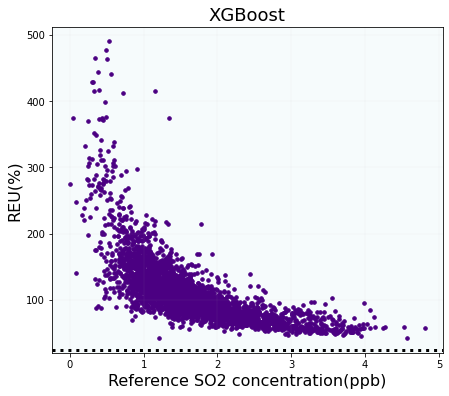

In [684]:
u_cal=REF(pred,y_test,3.9)
fig= plt.figure(figsize=(7,6))
ax = fig.add_subplot(111)
ax.patch.set_facecolor('lightblue')
ax.patch.set_alpha(0.1)
ind=[]
U_cal=[]
Ref=[]
for i in range(len(u_cal)):
    if -50<u_cal[i]<500:
        U_cal.append(u_cal[i])
        Ref.append(y_test[i])
plt.scatter(Ref,U_cal, color='#4B0082',marker='.',s=50)
plt.axhline(y=25, color='black', linestyle=':',linewidth=3)
plt.ylabel('REU(%)', fontsize=16)
plt.xlabel('Reference SO2 concentration(ppb)',fontsize=16)
plt.grid(linestyle='-.',linewidth=0.1)
plt.title('XGBoost', fontsize=18)
plt.show()

In [685]:
import random
alpha=3.9
LV=max(y_test)
Cal=0
for i in range(len(y_test)):
    if y_test[i]==LV:
        Cal=y_test[i]
cal=np.array(pred)
ref=np.array(y_test)
ref_mean=np.mean(ref)
cal_mean=np.mean(cal)
prec=np.array([20 for i in range(len(ref))])
u=0.001*ref
#cal=np.log(cal)
#ref=np.log(ref)
sx_s=(1/len(ref))*sum((ref-ref_mean)**2)
sy_s=(1/len(cal))*sum((cal-cal_mean)**2)
sxy=(1/len(cal))*sum((cal-cal_mean)*(ref-ref_mean))
#beta_1=((sy_s-sx_s)+np.sqrt((sy_s-sx_s)**2+4*sxy**2))/(2*sxy)
beta_1=((sy_s-alpha*sx_s)+np.sqrt((sy_s-sx_s)**2+4*alpha*sxy**2))/(2*sxy)
beta_0=cal_mean-beta_1*ref_mean
RSS=sum((cal-beta_0-beta_1*ref)**2-(beta_1**2+alpha)*(0.001*LV)**2)
du_s=RSS/(len(cal)-2)
    #Beta_1=((sy_s-sx_s-du_s)+np.sqrt((sy_s-sx_s-du_s)**2+4*sxy**2))/(2*sxy)
Beta_1=((sy_s-alpha*sx_s-du_s)+np.sqrt((sy_s-alpha*sx_s-du_s)**2+4*alpha*sxy**2))/(2*sxy)
Beta_0=cal_mean-Beta_1*ref_mean
P1=(RSS/(len(cal)-2))
P2=(Beta_1**2+alpha)*(0.001*LV)**2+(-2*Beta_1**2+2*Beta_1-1)*(0.001*LV)**2
P3=(Beta_0+(Beta_1-1)*LV)**2
P=P1+P2+P3
Bias=(2*(P3)**0.5/(Cal))*100
Random=(2*(P1+P2)**0.5/(Cal))*100

import random
alpha=3.9
LV1=350
Cal=0
for i in range(len(y_test)):
    if y_test[i]==LV:
        Cal=lab1[i]
cal=np.array(pred)
ref=np.array(y_test)
ref_mean=np.mean(ref)
cal_mean=np.mean(cal)
prec=np.array([20 for i in range(len(ref))])
u=0.001*ref
#cal=np.log(cal)
#ref=np.log(ref)
sx_s=(1/len(ref))*sum((ref-ref_mean)**2)
sy_s=(1/len(cal))*sum((cal-cal_mean)**2)
sxy=(1/len(cal))*sum((cal-cal_mean)*(ref-ref_mean))
#beta_1=((sy_s-sx_s)+np.sqrt((sy_s-sx_s)**2+4*sxy**2))/(2*sxy)
beta_1=((sy_s-alpha*sx_s)+np.sqrt((sy_s-sx_s)**2+4*alpha*sxy**2))/(2*sxy)
beta_0=cal_mean-beta_1*ref_mean
RSS=sum((cal-beta_0-beta_1*ref)**2-(beta_1**2+alpha)*(0.001*LV1)**2)
du_s=RSS/(len(cal)-2)
    #Beta_1=((sy_s-sx_s-du_s)+np.sqrt((sy_s-sx_s-du_s)**2+4*sxy**2))/(2*sxy)
Beta_1=((sy_s-alpha*sx_s-du_s)+np.sqrt((sy_s-alpha*sx_s-du_s)**2+4*alpha*sxy**2))/(2*sxy)
Beta_0=cal_mean-Beta_1*ref_mean
P1=(RSS/(len(cal)-2))
P2=(Beta_1**2+alpha)*(0.001*LV1)**2+(-2*Beta_1**2+2*Beta_1-1)*(0.001*LV1)**2
P3=(Beta_0+(Beta_1-1)*LV1)**2
P=P1+P2+P3
Bias1=(2*(P3)**0.5/(Beta_0+Beta_1*LV1))*100
Random1=(2*(P1+P2)**0.5/(Beta_0+Beta_1*LV1))*100


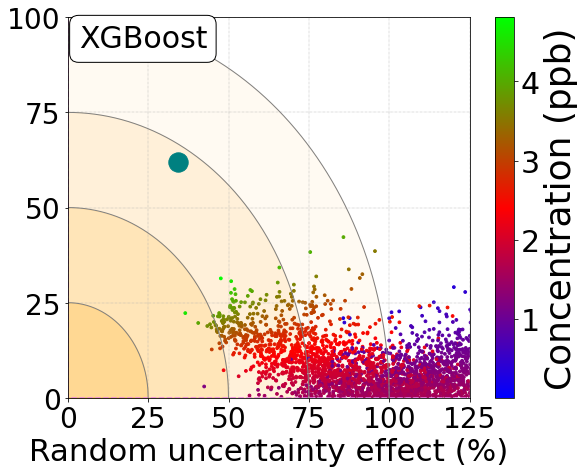

In [686]:
A=target(pred,y_test,3.9)
theta = np.linspace( 0 , 2 * np.pi , 150 )
r1 =25
a1= r1 * np.cos( theta )
b1= r1 * np.sin( theta )
r2 =50
a2=r2* np.cos( theta )
b2=r2* np.sin( theta )
r3 =75
a3=r3* np.cos( theta )
b3=r3* np.sin( theta )

r4 =100
a4=r4* np.cos( theta )
b4=r4* np.sin( theta )

fig= plt.figure(figsize=(9,7))
plt.Circle((0, 0), 1, color='wheat')
plt.vlines([0], -130, 130, linestyles='dashed',color='violet')
plt.hlines([0], -130, 130, linestyles='dashed', color='violet')

plt.fill_between(a1, b1, color='orange', alpha=0.2)
plt.fill_between(a2, b2, color='orange',alpha=0.15)
plt.fill_between(a3, b3, color='orange',alpha=0.1)
plt.fill_between(a4, b4, color='orange',alpha=0.05)

x1=np.arange(0,25.1,0.1)
r1=25
y1=np.sqrt(r1**2-x1**2)
x2=np.arange(0,50.1,0.1)
r2=50
y2=np.sqrt(r2**2-x2**2)

x3=np.arange(0,75.1,0.1)
r3=75
y3=np.sqrt(r3**2-x3**2)

x4=np.arange(0,100.1,0.1)
r4=100
y4=np.sqrt(r4**2-x4**2)

plt.plot(x1,y1, linewidth=1, color='grey')
plt.plot(x2,y2, linewidth=1, color='grey')
plt.plot(x3,y3, linewidth=1, color='grey')
plt.plot(x4,y4, linewidth=1, color='grey')

plt.xlabel('Random uncertainty effect (%)',fontsize=31)
#plt.ylabel('Bias effect (%)',fontsize=24)
#plt.title('SO2',fontsize=18)
color_map = plt.cm.get_cmap('brg')
reversed_color_map = color_map
plt.scatter(A[0],A[1],marker='.',s=30,c=A[2],cmap=reversed_color_map)
plt.grid(linestyle='-.',linewidth=0.4)
plt.ylim(ymin=-0)
plt.ylim(ymax=100)
plt.xlim(xmax=125)
plt.xlim(xmin=0)
plt.xticks(np.arange(0,126, 25),fontsize=28)
plt.yticks(np.arange(0,101, 25),fontsize=28)
#plt.colorbar()
cbar = plt.colorbar()
cbar.ax.tick_params(labelsize=30)
cbar.set_label('Concentration (ppb)', rotation=90,fontsize=36)
plt.scatter(Random,Bias,marker='.',s=1500, color='teal')
plt.scatter(Random1+2,Bias1,marker='.',s=1500, color='black')
textstr = 'XGBoost'
props = dict(boxstyle='round', facecolor='white', alpha=1)
plt.text(0.04, 1.21, textstr, transform=ax.transAxes, fontsize=30,
        verticalalignment='top', bbox=props)
plt.show()

# O3 CALIBRATION

In [687]:
import pandas as pd
import scipy.io
import numpy as np
data = pd.read_csv('O3.txt', header = None,low_memory=False)
data.columns=['AE','WE','Temp','RH','Time']
Time=data['Time'].to_list()
time=[]
for i in range(len(Time)):
    time.append(float(abs(Time[i])))
Time=np.array(time)
Date=pd.to_datetime(Time-719529,unit='d').round('s')
data['Date'] = Date.tolist()
data=data.set_index('Date')
data.drop('Time',axis = 1, inplace = True)
data=data.resample('5min').mean()
Data_O3=data
Data_O3['Ref']=Ref_O3
WE=Data_O3['WE'].to_list()
AE=Data_O3['AE'].to_list()
signal=np.array(WE)-np.array(AE)
Data_O3['Net Signal']=signal
Data_O3['Month']=Data_O3.index.month
Data_O3['Day_of_week']=Data_O3.index.dayofweek
Data_O3['Day']=Data_O3.index.day
Data_O3['Hour']=Data_O3.index.hour
O3_Data=Data_O3
O3_Data=O3_Data[(O3_Data[O3_Data.columns] >= 0).all(axis=1)]
O3_Data=O3_Data.dropna()
data = pd.read_csv('Conc_O3.txt', header = None,low_memory=False)
data.columns=['Lab1','Temp','RH','Time','Ref']
Time=data['Time'].to_list()
time=[]
for i in range(len(Time)):
    time.append(float(abs(Time[i])))
Time=np.array(time)
Date=pd.to_datetime(Time-719529,unit='d').round('s')
data['Date'] = Date.tolist()
data=data.set_index('Date')
data.drop('Time',axis = 1, inplace = True)
data=data.resample('5min').mean()
Data_O3=data
signal=np.array(WE)-np.array(AE)
Data_O3['Net Signal']=signal
Data_O3['Month']=Data_O3.index.month
Data_O3['Day_of_week']=Data_O3.index.dayofweek
Data_O3['Day']=Data_O3.index.day
Data_O3['Hour']=Data_O3.index.hour
ref_NO2=Data_NO2['Ref'].to_list()
Data_O3['Ref_NO2']=ref_NO2
O3_Data=Data_O3
O3_Data=O3_Data[(O3_Data[O3_Data.columns] >= 0).all(axis=1)]
O3_Data=O3_Data.dropna()
O3_Data=O3_Data.resample('20min').mean()
O3_Data=O3_Data.dropna()
O3_Data.head()

,Lab1,Temp,RH,Ref,Net Signal,Month,Day_of_week,Day,Hour,Ref_NO2
Date,,,,,,,,,,
2019-10-02 11:40:00,621.625704,26.378438,58.063437,46.094860,3.605625,10.0,2.0,2.0,11.0,15.230400
2019-10-02 12:00:00,1037.932435,25.632544,48.527009,56.858942,10.655074,10.0,2.0,2.0,12.0,6.653971
2019-10-02 12:20:00,99.598353,26.120078,47.716553,58.880540,20.285180,10.0,2.0,2.0,12.0,2.844210
2019-10-07 10:40:00,108.196313,32.344264,37.260757,47.259007,11.447809,10.0,0.0,7.0,10.0,4.255772
2019-10-07 11:00:00,123.884374,33.621877,36.522761,41.416863,8.541809,10.0,0.0,7.0,11.0,16.150580


In [688]:
#Ref=O3_Data['Ref'].to_list()
#O3_Data=O3_Data[O3_Data.Ref.between(np.mean(Ref)-1*np.std(Ref), np.mean(Ref)+1*np.std(Ref))]
#O3_Data.shape

In [689]:
def REF(pred,y_test,alpha):
    import random
    cal=np.array(pred)
    ref=np.array(y_test.to_list())
    ref_mean=np.mean(ref)
    cal_mean=np.mean(cal)
    prec=np.array([1 for i in range(len(ref))])
    #u=np.maximum(prec,0.0015*ref)
    u=prec
    #cal=np.log(cal)
    #ref=np.log(ref)
    sx_s=(1/len(ref))*sum((ref-ref_mean)**2)
    sy_s=(1/len(cal))*sum((cal-cal_mean)**2)
    sxy=(1/len(cal))*sum((cal-cal_mean)*(ref-ref_mean))
    beta_1=((sy_s-alpha*sx_s)+np.sqrt((sy_s-sx_s)**2+4*alpha*sxy**2))/(2*sxy)
    beta_0=cal_mean-beta_1*ref_mean
    RSS=sum((cal-beta_0-beta_1*ref)**2-(beta_1**2+alpha)*u**2)
    du_s=RSS/(len(cal)-2)
    Beta_1=((sy_s-alpha*sx_s-du_s)+np.sqrt((sy_s-alpha*sx_s-du_s)**2+4*alpha*sxy**2))/(2*sxy)
    Beta_0=cal_mean-Beta_1*ref_mean
    P1=(RSS/(len(cal)-2))
    P2=(Beta_1**2+alpha)*u**2+(-2*Beta_1**2+2*Beta_1-1)*u**2
    P3=(Beta_0+(Beta_1-1)*ref)**2
    P=[]
    for i in range(len(P3)):
        P.append(P1+P2[i]+P3[i])
    for i in range(len(P)):
        if P[i]<0:
            P[i]=random.randint(1,100)
    u_cal=(2*np.sqrt(np.array(P))/cal)*100
    #u_cal=((2*np.sqrt((RSS/(len(cal)-2))+(1-(beta_1-1)**2)*(0.08*ref)**2+(Beta_0+(Beta_1-1)*ref)**2))/cal)*100
    return u_cal  

In [690]:
def REF2(pred,y_test,alpha,LV):
    import random
    cal=np.array(pred)
    ref=np.array(y_test.to_list())
    ref_mean=np.mean(ref)
    cal_mean=np.mean(cal)
    prec=np.array([1 for i in range(len(ref))])
    #u=0.001*ref
    u=prec
    #cal=np.log(cal)
    #ref=np.log(ref)
    sx_s=(1/len(ref))*sum((ref-ref_mean)**2)
    sy_s=(1/len(cal))*sum((cal-cal_mean)**2)
    sxy=(1/len(cal))*sum((cal-cal_mean)*(ref-ref_mean))
    #beta_1=((sy_s-sx_s)+np.sqrt((sy_s-sx_s)**2+4*sxy**2))/(2*sxy)
    beta_1=((sy_s-alpha*sx_s)+np.sqrt((sy_s-sx_s)**2+4*alpha*sxy**2))/(2*sxy)
    beta_0=cal_mean-beta_1*ref_mean
    RSS=sum((cal-beta_0-beta_1*ref)**2-(beta_1**2+alpha)*(0.001*LV)**2)
    du_s=RSS/(len(cal)-2)
    #Beta_1=((sy_s-sx_s-du_s)+np.sqrt((sy_s-sx_s-du_s)**2+4*sxy**2))/(2*sxy)
    Beta_1=((sy_s-alpha*sx_s-du_s)+np.sqrt((sy_s-alpha*sx_s-du_s)**2+4*alpha*sxy**2))/(2*sxy)
    Beta_0=cal_mean-Beta_1*ref_mean
    P1=(RSS/(len(cal)-2))
    P2=(Beta_1**2+alpha)*(0.001*LV)**2+(-2*Beta_1**2+2*Beta_1-1)*(0.001*LV)**2
    P3=(Beta_0+(Beta_1-1)*LV)**2
    P=P1+P2+P3
    if P<0:
        P=random.randint(1,100)
    u_cal=(2*np.sqrt(P)/(Beta_0+Beta_1*LV))*100
    #u_cal=((2*np.sqrt((RSS/(len(cal)-2))+(1-(beta_1-1)**2)*0.1+(Beta_0+(Beta_1-1)*ref)**2))/cal)*100
    return u_cal  

In [691]:
def target(pred,y_test,alpha):
    import random
    cal=np.array(pred)
    ref=np.array(y_test.to_list())
    ref_mean=np.mean(ref)
    cal_mean=np.mean(cal)
    prec=np.array([1 for i in range(len(ref))])
    #u=np.maximum(prec, 0.0015*ref)
    u=prec
    #u=0.01*ref
    #cal=np.log(cal)
    #ref=np.log(ref)
    sx_s=(1/len(ref))*sum((ref-ref_mean)**2)
    sy_s=(1/len(cal))*sum((cal-cal_mean)**2)
    sxy=(1/len(cal))*sum((cal-cal_mean)*(ref-ref_mean))
    #beta_1=((sy_s-sx_s)+np.sqrt((sy_s-sx_s)**2+4*sxy**2))/(2*sxy)
    beta_1=((sy_s-alpha*sx_s)+np.sqrt((sy_s-sx_s)**2+4*alpha*sxy**2))/(2*sxy)
    beta_0=cal_mean-beta_1*ref_mean
    RSS=sum((cal-beta_0-beta_1*ref)**2-(beta_1**2+alpha)*u**2)
    du_s=RSS/(len(cal)-2)
    #Beta_1=((sy_s-sx_s-du_s)+np.sqrt((sy_s-sx_s-du_s)**2+4*sxy**2))/(2*sxy)
    Beta_1=((sy_s-alpha*sx_s-du_s)+np.sqrt((sy_s-alpha*sx_s-du_s)**2+4*alpha*sxy**2))/(2*sxy)
    Beta_0=cal_mean-Beta_1*ref_mean
    P1=(RSS/(len(cal)-2))
    P2=(Beta_1**2+alpha)*u**2+(-2*Beta_1**2+2*Beta_1-1)*u**2
    P3=(Beta_0+(Beta_1-1)*ref)
    P=[]
    for i in range(len(P2)):
        P.append(P1+P2[i])
    for i in range(len(P)):
        if P[i]<0:
            P[i]=random.randint(1,50)
    A=(2*(np.array(P))**0.5/ref)*100
    #for i in range(len(P3)):
        #if P3[i]<0:
            #P3[i]=random.randint(0,50)
    B=(2*(np.array(P3))/ref)*100
    bias=[]
    random=[]
    Ref=[]
    part1=(Beta_0/ref)*100
    part=[beta_1-1 for i in range(len(ref))]
    part2=(np.array(part))*100
    PART1=[]
    PART2=[]
    for i in range(len(A)):
        if A[i]<500:
            random.append(A[i])
            bias.append(B[i])
            Ref.append(ref[i])
            PART1.append(part1[i])
            PART2.append(part2[i])
    return [random,bias,Ref, PART1,PART2]

## Model 1: LR

In [692]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error as mae
import sklearn.metrics as sm
import matplotlib.pyplot as plt
#,'Ref_CO','Ref_NO2','Ref_SO2'
X=O3_Data[['Net Signal','Lab1','Temp','RH','Month','Day_of_week','Hour','Ref_NO2']]#,'Ref_NO2'
y=O3_Data['Ref']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2)
len(X_test)

2002

In [693]:
lr = LinearRegression()
model = lr.fit(X_train.drop(['Lab1'], axis=1), y_train)
pred = model.predict(X_test.drop(['Lab1'], axis=1))
lab1=X_test['Lab1'].to_list()
for i in range(len(lab1)):
    if lab1[i]>370:
        lab1[i]=np.mean(lab1)
Index=[i for i in range(len(y_test))]
Y_test=y_test.to_list()
Y_test=pd.Series(Y_test,index =Index)
Y_test
Pred=pd.Series(pred,index =Index)
Lab1=pd.Series(lab1,index =Index)
sMAPE_lr=round(smape_loss(Y_test,Pred),2)
sMAPE_lab=round (smape_loss(Y_test,Lab1),2)
RMSE_lr=round(np.sqrt(sm.mean_squared_error(y_test, pred)),1)
RMSE_lab=round(np.sqrt(sm.mean_squared_error(y_test, lab1)),1)
Pearson_lr=round(np.corrcoef(y_test, pred)[0, 1],2)
Pearson_lab=round(np.corrcoef(y_test, lab1)[0, 1],2)
sMAPE_lr_O3=sMAPE_lr
RMSE_lr_O3=RMSE_lr/np.mean(np.array(y_test))
Pearson_lr_O3=Pearson_lr
sMAPE_lab_O3=sMAPE_lab
RMSE_lab_O3=RMSE_lab/np.mean(np.array(lab1))
Pearson_lab_O3=Pearson_lab
R2_lr_O3=round(sm.r2_score(y_test, pred), 2)
R2_lab_O3=round(sm.r2_score(y_test, lab1), 2)
RMSE_Lr_O3=RMSE_lr
RMSE_Lab_O3=RMSE_lab

A=len(y_test)
D=max(lab1)-0.10*max(lab1)
C=max(lab1)-0.03*max(lab1)
B=A

Pearson_lr_O3,R2_lr_O3,RMSE_Lr_O3

(0.95, 0.91, 4.6)

fig= plt.figure(figsize=(8,6))
index=[i for i in range(1,len(y_test)+1)]
ax = fig.add_subplot(111)
ax.patch.set_facecolor('lightblue')
ax.patch.set_alpha(0.3)
plt.plot(index,y_test, color='limegreen',linewidth=3)
plt.plot(index,pred, color='#513e00',linewidth=3)
plt.plot(index,lab1, color='#426eff',linewidth=3)
plt.legend(['Ref', 'LR-Calibrated', 'LAB-Calibrated'], loc = 2, bbox_to_anchor = (0.75,1))
plt.ylabel('O3 Concentration(ppb)'.translate(subscript),fontsize=18)
#plt.text(B-5, C,r'$R^{2}(LR)=$'+str(R2_lr_O3) , fontsize = 14, color='#513e00')
#plt.text(B-5, D,r'$R^{2}(Lab)=$'+str(R2_lab_O3) , fontsize = 14, color='#426eff')
#plt.text(B-70, C, 'Pearson r(LR)='+str(Pearson_lr), fontsize = 14, color='#513e00')
#plt.text(B-70, D, 'Pearson r(Lab)='+str(Pearson_lab), fontsize = 14, color='#426eff')
plt.xlabel('Testing period(hours)',fontsize=18)
#plt.title('Linear Regression Calibration vs Laboratory Calibration',fontsize=18)
plt.grid(linestyle='-.',linewidth=0.3)
plt.show()

In [694]:
print("Regressor model performance:")
print("Mean absolute error(MAE) =", round(sm.mean_absolute_error(y_test, pred), 2))
print("Mean squared error(MSE) =", round(sm.mean_squared_error(y_test, pred), 2))
print("Median absolute error =", round(sm.median_absolute_error(y_test, pred), 2))
print("Explain variance score =", round(sm.explained_variance_score(y_test, pred), 2))
print("R2 score =", round(sm.r2_score(y_test, pred), 2))

MBE_LR_O3=MBE(pred,y_test)/np.std(y_test)
CRMSE_LR_O3=CRMSE(y_test,pred)/np.std(y_test)
MBE_LAB_O3=MBE(lab1,y_test)/(3.6*np.std(y_test))
CRMSE_LAB_O3=CRMSE(y_test,lab1)/(3.6*np.std(y_test))
pred_lr=pred

Regressor model performance:
Mean absolute error(MAE) = 3.59
Mean squared error(MSE) = 20.82
Median absolute error = 3.03
Explain variance score = 0.91
R2 score = 0.91


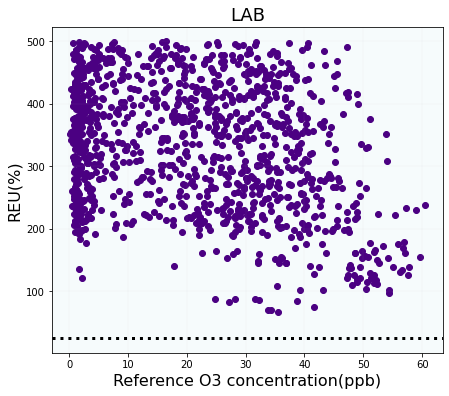

In [695]:
u_cal=REF(lab1,y_test,1.2)
fig= plt.figure(figsize=(7,6))
ax = fig.add_subplot(111)
ax.patch.set_facecolor('lightblue')
ax.patch.set_alpha(0.1)
ind=[]
U_cal=[]
Ref=[]
for i in range(len(u_cal)):
    if -50<u_cal[i]<500:
        U_cal.append(u_cal[i])
        Ref.append(y_test[i])
plt.scatter(Ref,U_cal, color='#4B0082')
plt.axhline(y=25, color='black', linestyle=':',linewidth=3)
plt.ylabel('REU(%)', fontsize=16)
plt.xlabel('Reference O3 concentration(ppb)',fontsize=16)
plt.grid(linestyle='-.',linewidth=0.1)
plt.title('LAB', fontsize=18)
plt.show()

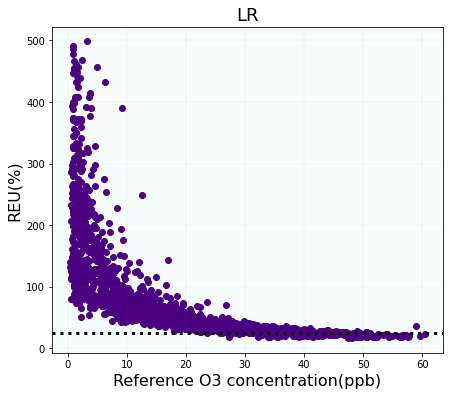

In [696]:
u_cal=REF(pred,y_test,1.2)
fig= plt.figure(figsize=(7,6))
ax = fig.add_subplot(111)
ax.patch.set_facecolor('lightblue')
ax.patch.set_alpha(0.1)
ind=[]
U_cal=[]
Ref=[]
for i in range(len(u_cal)):
    if -50<u_cal[i]<500:
        U_cal.append(u_cal[i])
        Ref.append(y_test[i])
plt.scatter(Ref,U_cal, color='#4B0082')
plt.axhline(y=25, color='black', linestyle=':',linewidth=3)
plt.ylabel('REU(%)', fontsize=16)
plt.xlabel('Reference O3 concentration(ppb)',fontsize=16)
plt.grid(linestyle='-.',linewidth=0.1)
plt.title('LR', fontsize=18)
plt.show()

In [697]:
import random
alpha=1.2
LV=max(y_test)
Cal=0
for i in range(len(y_test)):
    if y_test[i]==LV:
        Cal=pred[i]
cal=np.array(lab1)
ref=np.array(y_test)
ref_mean=np.mean(ref)
cal_mean=np.mean(cal)
prec=np.array([1 for i in range(len(ref))])
u=prec
#cal=np.log(cal)
#ref=np.log(ref)
sx_s=(1/len(ref))*sum((ref-ref_mean)**2)
sy_s=(1/len(cal))*sum((cal-cal_mean)**2)
sxy=(1/len(cal))*sum((cal-cal_mean)*(ref-ref_mean))
#beta_1=((sy_s-sx_s)+np.sqrt((sy_s-sx_s)**2+4*sxy**2))/(2*sxy)
beta_1=((sy_s-alpha*sx_s)+np.sqrt((sy_s-sx_s)**2+4*alpha*sxy**2))/(2*sxy)
beta_0=cal_mean-beta_1*ref_mean
RSS=sum((cal-beta_0-beta_1*ref)**2-(beta_1**2+alpha)*(0.001*LV)**2)
du_s=RSS/(len(cal)-2)
    #Beta_1=((sy_s-sx_s-du_s)+np.sqrt((sy_s-sx_s-du_s)**2+4*sxy**2))/(2*sxy)
Beta_1=((sy_s-alpha*sx_s-du_s)+np.sqrt((sy_s-alpha*sx_s-du_s)**2+4*alpha*sxy**2))/(2*sxy)
Beta_0=cal_mean-Beta_1*ref_mean
P1=(RSS/(len(cal)-2))
P2=(Beta_1**2+alpha)*(0.001*LV)**2+(-2*Beta_1**2+2*Beta_1-1)*(0.001*LV)**2
P3=(Beta_0+(Beta_1-1)*LV)
P=P1+P2+P3
Bias=(2*(P3)/LV)*100
Random=(2*(P1+P2)**0.5/LV)*100

import random
alpha=1.4
LV1=120
Cal=0
for i in range(len(y_test)):
    if y_test[i]==LV:
        Cal=lab1[i]
cal=np.array(lab1)
ref=np.array(y_test)
ref_mean=np.mean(ref)
cal_mean=np.mean(cal)
prec=np.array([1 for i in range(len(ref))])
u=prec
#cal=np.log(cal)
#ref=np.log(ref)
sx_s=(1/len(ref))*sum((ref-ref_mean)**2)
sy_s=(1/len(cal))*sum((cal-cal_mean)**2)
sxy=(1/len(cal))*sum((cal-cal_mean)*(ref-ref_mean))
#beta_1=((sy_s-sx_s)+np.sqrt((sy_s-sx_s)**2+4*sxy**2))/(2*sxy)
beta_1=((sy_s-alpha*sx_s)+np.sqrt((sy_s-sx_s)**2+4*alpha*sxy**2))/(2*sxy)
beta_0=cal_mean-beta_1*ref_mean
RSS=sum((cal-beta_0-beta_1*ref)**2-(beta_1**2+alpha)*(0.001*LV1)**2)
du_s=RSS/(len(cal)-2)
    #Beta_1=((sy_s-sx_s-du_s)+np.sqrt((sy_s-sx_s-du_s)**2+4*sxy**2))/(2*sxy)
Beta_1=((sy_s-alpha*sx_s-du_s)+np.sqrt((sy_s-alpha*sx_s-du_s)**2+4*alpha*sxy**2))/(2*sxy)
Beta_0=cal_mean-Beta_1*ref_mean
P1=(RSS/(len(cal)-2))
P2=(Beta_1**2+alpha)*(0.001*LV1)**2+(-2*Beta_1**2+2*Beta_1-1)*(0.001*LV1)**2
P3=(Beta_0+(Beta_1-1)*LV1)
P=P1+P2+P3
Bias1=(2*(P3)/(LV1))*100
Random1=(2*(P1+P2)**0.5/(LV1))*100

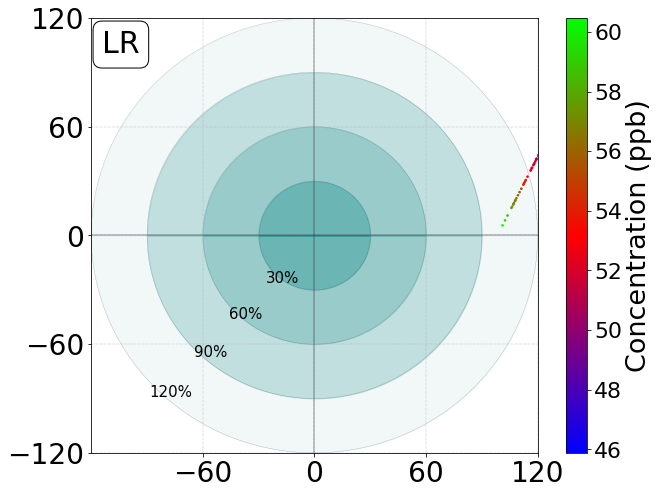

In [698]:
A=target(lab1,y_test,1.2)
theta = np.linspace( 0 , 2 * np.pi , 150 )
r1 =30
a1= r1 * np.cos( theta )
b1= r1 * np.sin( theta )
r2 =60
a2=r2* np.cos( theta )
b2=r2* np.sin( theta )
r3 =90
a3=r3* np.cos( theta )
b3=r3* np.sin( theta )

r4 =120
a4=r4* np.cos( theta )
b4=r4* np.sin( theta )
fig= plt.figure(figsize=(10,8))

plt.Circle((0, 0), 1, color='wheat')
#plt.vlines([0], -130, 130, linestyles='dashed',color='violet')
#plt.hlines([0], -130, 130, linestyles='dashed', color='violet')

plt.fill_between(a1, b1, color='teal', alpha=0.3)
plt.fill_between(a2, b2, color='teal',alpha=0.2)
plt.fill_between(a3, b3, color='teal',alpha=0.2)
plt.fill_between(a4, b4, color='teal',alpha=0.05)

x1=np.arange(0,30.1,0.1)
r1=30
y1=np.sqrt(r1**2-x1**2)
x2=np.arange(0,60.1,0.1)
r2=60
y2=np.sqrt(r2**2-x2**2)

x3=np.arange(0,90.1,0.1)
r3=90
y3=np.sqrt(r3**2-x3**2)

x4=np.arange(0,120.1,0.1)
r4=120
y4=np.sqrt(r4**2-x4**2)

plt.plot(x1,y1, linewidth=0.2, color='grey')
plt.plot(x1,-1*y1, linewidth=0.2, color='grey')
plt.plot(x2,y2, linewidth=0.2, color='grey')
plt.plot(x2,-1*y2, linewidth=0.2, color='grey')
plt.plot(x3,y3, linewidth=0.2, color='grey')
plt.plot(x3,-1*y3, linewidth=0.2, color='grey')
plt.plot(x4,y4, linewidth=0.2, color='grey')
plt.plot(x4,-1*y4, linewidth=0.2, color='grey')

plt.plot(-1*x1,y1, linewidth=0.2, color='grey')
plt.plot(-1*x1,-1*y1, linewidth=0.2, color='grey')
plt.plot(-1*x2,y2, linewidth=0.2, color='grey')
plt.plot(-1*x2,-1*y2, linewidth=0.2, color='grey')
plt.plot(-1*x3,y3, linewidth=0.2, color='grey')
plt.plot(-1*x3,-1*y3, linewidth=0.2, color='grey')
plt.plot(-1*x4,y4, linewidth=0.2, color='grey')
plt.plot(-1*x4,-1*y4, linewidth=0.2, color='grey')

#plt.xlabel('Random uncertainty effect (%)',fontsize=24)
#plt.ylabel('Bias effect (%)',fontsize=24)
#plt.title('CO',fontsize=18)
color_map = plt.cm.get_cmap('brg')
reversed_color_map = color_map
plt.scatter(A[0],A[1],marker='.',s=200,c=np.array(A[2]),cmap=reversed_color_map)
plt.scatter(A[3],A[1],marker='.',s=10,c=np.array(A[2]),cmap=reversed_color_map)
plt.scatter(A[4],A[1],marker='.',s=10,c=np.array(A[2]),cmap=reversed_color_map)
plt.vlines([0], -130, 130,color='black',linewidth=0.4)
plt.hlines([0], -130, 130, color='black',linewidth=0.4)
plt.grid(linestyle='-.',linewidth=0.4)
plt.ylim(ymin=-120)
plt.ylim(ymax=120)
plt.xlim(xmax=120)
plt.xlim(xmin=-120)
plt.xticks(np.arange(-60,121, 60),fontsize=28)
plt.yticks(np.arange(-120,121, 60),fontsize=28)
#plt.colorbar()
cbar = plt.colorbar()
cbar.ax.tick_params(labelsize=22)
cbar.set_label('Concentration (ppb)', rotation=90,fontsize=27)
plt.scatter(Random,Bias,marker=(5, 2),s=200, color='black')
plt.scatter(Random1+2,Bias1,marker=(5, 2),s=200, color='brown')
textstr = 'LR'
props = dict(boxstyle='round', facecolor='white', alpha=1)
plt.text(0.1, 1.26, textstr, transform=ax.transAxes, fontsize=30,
        verticalalignment='top', bbox=props)
plt.text(-26,-26, '30%',fontsize=15)
plt.text(-46,-46, '60%',fontsize=15)
plt.text(-65,-67, '90%',fontsize=15)
plt.text(-89,-89, '120%',fontsize=15)
plt.show()

In [699]:
import random
alpha=1.2
LV=max(y_test)
Cal=0
for i in range(len(y_test)):
    if y_test[i]==LV:
        Cal=pred[i]
cal=np.array(pred)
ref=np.array(y_test)
ref_mean=np.mean(ref)
cal_mean=np.mean(cal)
prec=np.array([1 for i in range(len(ref))])
u=prec
#cal=np.log(cal)
#ref=np.log(ref)
sx_s=(1/len(ref))*sum((ref-ref_mean)**2)
sy_s=(1/len(cal))*sum((cal-cal_mean)**2)
sxy=(1/len(cal))*sum((cal-cal_mean)*(ref-ref_mean))
#beta_1=((sy_s-sx_s)+np.sqrt((sy_s-sx_s)**2+4*sxy**2))/(2*sxy)
beta_1=((sy_s-alpha*sx_s)+np.sqrt((sy_s-sx_s)**2+4*alpha*sxy**2))/(2*sxy)
beta_0=cal_mean-beta_1*ref_mean
RSS=sum((cal-beta_0-beta_1*ref)**2-(beta_1**2+alpha)*(0.001*LV)**2)
du_s=RSS/(len(cal)-2)
    #Beta_1=((sy_s-sx_s-du_s)+np.sqrt((sy_s-sx_s-du_s)**2+4*sxy**2))/(2*sxy)
Beta_1=((sy_s-alpha*sx_s-du_s)+np.sqrt((sy_s-alpha*sx_s-du_s)**2+4*alpha*sxy**2))/(2*sxy)
Beta_0=cal_mean-Beta_1*ref_mean
P1=(RSS/(len(cal)-2))
P2=(Beta_1**2+alpha)*(0.001*LV)**2+(-2*Beta_1**2+2*Beta_1-1)*(0.001*LV)**2
P3=(Beta_0+(Beta_1-1)*LV)
P=P1+P2+P3
Bias=(2*(P3)/LV)*100
Random=(2*(P1+P2)**0.5/LV)*100

import random
alpha=1.4
LV1=120
Cal=0
for i in range(len(y_test)):
    if y_test[i]==LV:
        Cal=lab1[i]
cal=np.array(pred)
ref=np.array(y_test)
ref_mean=np.mean(ref)
cal_mean=np.mean(cal)
prec=np.array([1 for i in range(len(ref))])
u=prec
#cal=np.log(cal)
#ref=np.log(ref)
sx_s=(1/len(ref))*sum((ref-ref_mean)**2)
sy_s=(1/len(cal))*sum((cal-cal_mean)**2)
sxy=(1/len(cal))*sum((cal-cal_mean)*(ref-ref_mean))
#beta_1=((sy_s-sx_s)+np.sqrt((sy_s-sx_s)**2+4*sxy**2))/(2*sxy)
beta_1=((sy_s-alpha*sx_s)+np.sqrt((sy_s-sx_s)**2+4*alpha*sxy**2))/(2*sxy)
beta_0=cal_mean-beta_1*ref_mean
RSS=sum((cal-beta_0-beta_1*ref)**2-(beta_1**2+alpha)*(0.001*LV1)**2)
du_s=RSS/(len(cal)-2)
    #Beta_1=((sy_s-sx_s-du_s)+np.sqrt((sy_s-sx_s-du_s)**2+4*sxy**2))/(2*sxy)
Beta_1=((sy_s-alpha*sx_s-du_s)+np.sqrt((sy_s-alpha*sx_s-du_s)**2+4*alpha*sxy**2))/(2*sxy)
Beta_0=cal_mean-Beta_1*ref_mean
P1=(RSS/(len(cal)-2))
P2=(Beta_1**2+alpha)*(0.001*LV1)**2+(-2*Beta_1**2+2*Beta_1-1)*(0.001*LV1)**2
P3=(Beta_0+(Beta_1-1)*LV1)
P=P1+P2+P3
Bias1=(2*(P3)/(LV1))*100
Random1=(2*(P1+P2)**0.5/(LV1))*100

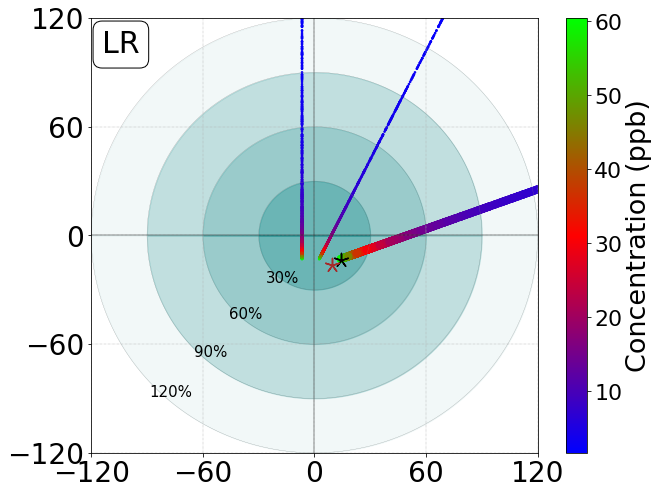

In [700]:
A=target(pred,y_test,1.2)
theta = np.linspace( 0 , 2 * np.pi , 150 )
r1 =30
a1= r1 * np.cos( theta )
b1= r1 * np.sin( theta )
r2 =60
a2=r2* np.cos( theta )
b2=r2* np.sin( theta )
r3 =90
a3=r3* np.cos( theta )
b3=r3* np.sin( theta )

r4 =120
a4=r4* np.cos( theta )
b4=r4* np.sin( theta )
fig= plt.figure(figsize=(10,8))

plt.Circle((0, 0), 1, color='wheat')
#plt.vlines([0], -130, 130, linestyles='dashed',color='violet')
#plt.hlines([0], -130, 130, linestyles='dashed', color='violet')

plt.fill_between(a1, b1, color='teal', alpha=0.3)
plt.fill_between(a2, b2, color='teal',alpha=0.2)
plt.fill_between(a3, b3, color='teal',alpha=0.2)
plt.fill_between(a4, b4, color='teal',alpha=0.05)

x1=np.arange(0,30.1,0.1)
r1=30
y1=np.sqrt(r1**2-x1**2)
x2=np.arange(0,60.1,0.1)
r2=60
y2=np.sqrt(r2**2-x2**2)

x3=np.arange(0,90.1,0.1)
r3=90
y3=np.sqrt(r3**2-x3**2)

x4=np.arange(0,120.1,0.1)
r4=120
y4=np.sqrt(r4**2-x4**2)

plt.plot(x1,y1, linewidth=0.2, color='grey')
plt.plot(x1,-1*y1, linewidth=0.2, color='grey')
plt.plot(x2,y2, linewidth=0.2, color='grey')
plt.plot(x2,-1*y2, linewidth=0.2, color='grey')
plt.plot(x3,y3, linewidth=0.2, color='grey')
plt.plot(x3,-1*y3, linewidth=0.2, color='grey')
plt.plot(x4,y4, linewidth=0.2, color='grey')
plt.plot(x4,-1*y4, linewidth=0.2, color='grey')

plt.plot(-1*x1,y1, linewidth=0.2, color='grey')
plt.plot(-1*x1,-1*y1, linewidth=0.2, color='grey')
plt.plot(-1*x2,y2, linewidth=0.2, color='grey')
plt.plot(-1*x2,-1*y2, linewidth=0.2, color='grey')
plt.plot(-1*x3,y3, linewidth=0.2, color='grey')
plt.plot(-1*x3,-1*y3, linewidth=0.2, color='grey')
plt.plot(-1*x4,y4, linewidth=0.2, color='grey')
plt.plot(-1*x4,-1*y4, linewidth=0.2, color='grey')

#plt.xlabel('Random uncertainty effect (%)',fontsize=24)
#plt.ylabel('Bias effect (%)',fontsize=24)
#plt.title('CO',fontsize=18)
color_map = plt.cm.get_cmap('brg')
reversed_color_map = color_map
plt.scatter(A[0],A[1],marker='.',s=200,c=np.array(A[2]),cmap=reversed_color_map)
plt.scatter(A[3],A[1],marker='.',s=10,c=np.array(A[2]),cmap=reversed_color_map)
plt.scatter(A[4],A[1],marker='.',s=10,c=np.array(A[2]),cmap=reversed_color_map)
plt.vlines([0], -130, 130,color='black',linewidth=0.4)
plt.hlines([0], -130, 130, color='black',linewidth=0.4)
plt.grid(linestyle='-.',linewidth=0.4)
plt.ylim(ymin=-100)
plt.ylim(ymax=100)
plt.xlim(xmax=100)
plt.xlim(xmin=-100)
plt.xticks(np.arange(-120,121, 60),fontsize=28)
plt.yticks(np.arange(-120,121, 60),fontsize=28)
#plt.colorbar()
cbar = plt.colorbar()
cbar.ax.tick_params(labelsize=22)
cbar.set_label('Concentration (ppb)', rotation=90,fontsize=27)
plt.scatter(Random,Bias,marker=(5, 2),s=200, color='black')
plt.scatter(Random1+2,Bias1,marker=(5, 2),s=200, color='brown')
textstr = 'LR'
props = dict(boxstyle='round', facecolor='white', alpha=1)
plt.text(0.1, 1.26, textstr, transform=ax.transAxes, fontsize=30,
        verticalalignment='top', bbox=props)
plt.text(-26,-26, '30%',fontsize=15)
plt.text(-46,-46, '60%',fontsize=15)
plt.text(-65,-67, '90%',fontsize=15)
plt.text(-89,-89, '120%',fontsize=15)
plt.show()

## Model 2: SVR

In [701]:
from sklearn.svm import SVR
from sklearn.preprocessing import StandardScaler
regressor = SVR(kernel = 'linear')
regressor.fit(X_train.drop(['Lab1'], axis=1), y_train)
pred = regressor.predict(X_test.drop(['Lab1'], axis=1))

In [702]:
Y_test=y_test.to_list()
Y_test=pd.Series(Y_test,index =Index)
Y_test
Pred=pd.Series(pred,index =Index)
Lab1=pd.Series(lab1,index =Index)
sMAPE_lr=round(smape_loss(Y_test,Pred),2)
sMAPE_lab=round (smape_loss(Y_test,Lab1),2)
RMSE_lr=round(np.sqrt(sm.mean_squared_error(y_test, pred)),1)
RMSE_lab=round(np.sqrt(sm.mean_squared_error(y_test, lab1)),1)
Pearson_lr=round(np.corrcoef(y_test, pred)[0, 1],2)
Pearson_lab=round(np.corrcoef(y_test, lab1)[0, 1],2)
sMAPE_svr_O3=sMAPE_lr
RMSE_svr_O3=RMSE_lr/np.mean(np.array(y_test))
Pearson_svr_O3=Pearson_lr
R2_svr_O3=round(sm.r2_score(y_test, pred), 2)
RMSE_Svr_O3=RMSE_lr
Pearson_svr_O3,R2_svr_O3,RMSE_Svr_O3

(0.95, 0.9, 4.6)

fig= plt.figure(figsize=(8,6))
ax = fig.add_subplot(111)
ax.patch.set_facecolor('lightblue')
ax.patch.set_alpha(0.3)
plt.plot(index,y_test, color='limegreen',linewidth=3)
plt.plot(index,pred, color='brown',linewidth=3)
plt.plot(index,lab1, color='#426eff',linewidth=3)
plt.legend(['Ref', 'SVR-Calibrated', 'LAB-Calibrated'], loc = 2, bbox_to_anchor = (0.75,1))
plt.ylabel('O3 Concentration(ppb)'.translate(subscript),fontsize=18)
#plt.text(B-5, C,r'$R^{2}(SVR)=$'+str(R2_svr_O3) , fontsize = 14, color='brown')
#plt.text(B-5, D,r'$R^{2}(Lab)=$'+str(R2_lab_O3) , fontsize = 14, color='#426eff')
#plt.text(B-70, C, 'Pearson r(SVR)='+str(Pearson_lr), fontsize = 14, color='brown')
#plt.text(B-70, D, 'Pearson r(Lab)='+str(Pearson_lab), fontsize = 14, color='#426eff')
plt.xlabel('Testing period(hours)',fontsize=18)
#plt.xlabel('Last 200 hours of testing period',fontsize=18)
#plt.title('Support Vector Regression(SVR) vs Laboratory Calibration',fontsize=18)
plt.grid(linestyle='-.',linewidth=0.3)
plt.show()

In [703]:
print("Regressor model performance:")
print("Mean absolute error(MAE) =", round(sm.mean_absolute_error(y_test, pred), 2))
print("Mean squared error(MSE) =", round(sm.mean_squared_error(y_test, pred), 2))
print("Median absolute error =", round(sm.median_absolute_error(y_test, pred), 2))
print("Explain variance score =", round(sm.explained_variance_score(y_test, pred), 2))
print("R2 score =", round(sm.r2_score(y_test, pred), 2))

MBE_SVR_O3=MBE(pred,y_test)/np.std(y_test)
CRMSE_SVR_O3=CRMSE(y_test,pred)/np.std(y_test)
pred_svr=pred

Regressor model performance:
Mean absolute error(MAE) = 3.58
Mean squared error(MSE) = 21.0
Median absolute error = 2.96
Explain variance score = 0.91
R2 score = 0.9


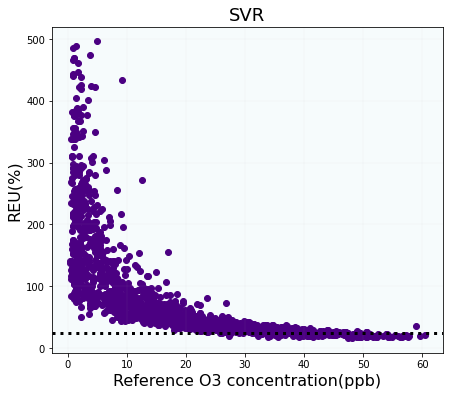

In [704]:
u_cal=REF(pred,y_test,1.2)
fig= plt.figure(figsize=(7,6))
ax = fig.add_subplot(111)
ax.patch.set_facecolor('lightblue')
ax.patch.set_alpha(0.1)
ind=[]
U_cal=[]
Ref=[]
for i in range(len(u_cal)):
    if -50<u_cal[i]<500:
        U_cal.append(u_cal[i])
        Ref.append(y_test[i])
plt.scatter(Ref,U_cal, color='#4B0082')
plt.axhline(y=25, color='black', linestyle=':',linewidth=3)
plt.ylabel('REU(%)', fontsize=16)
plt.xlabel('Reference O3 concentration(ppb)',fontsize=16)
plt.grid(linestyle='-.',linewidth=0.1)
plt.title('SVR', fontsize=18)

plt.show()

In [705]:
import random
alpha=1.2
LV=max(y_test)
Cal=0
for i in range(len(y_test)):
    if y_test[i]==LV:
        Cal=pred[i]
cal=np.array(pred)
ref=np.array(y_test)
ref_mean=np.mean(ref)
cal_mean=np.mean(cal)
prec=np.array([1 for i in range(len(ref))])
u=prec
#cal=np.log(cal)
#ref=np.log(ref)
sx_s=(1/len(ref))*sum((ref-ref_mean)**2)
sy_s=(1/len(cal))*sum((cal-cal_mean)**2)
sxy=(1/len(cal))*sum((cal-cal_mean)*(ref-ref_mean))
#beta_1=((sy_s-sx_s)+np.sqrt((sy_s-sx_s)**2+4*sxy**2))/(2*sxy)
beta_1=((sy_s-alpha*sx_s)+np.sqrt((sy_s-sx_s)**2+4*alpha*sxy**2))/(2*sxy)
beta_0=cal_mean-beta_1*ref_mean
RSS=sum((cal-beta_0-beta_1*ref)**2-(beta_1**2+alpha)*(0.001*LV)**2)
du_s=RSS/(len(cal)-2)
    #Beta_1=((sy_s-sx_s-du_s)+np.sqrt((sy_s-sx_s-du_s)**2+4*sxy**2))/(2*sxy)
Beta_1=((sy_s-alpha*sx_s-du_s)+np.sqrt((sy_s-alpha*sx_s-du_s)**2+4*alpha*sxy**2))/(2*sxy)
Beta_0=cal_mean-Beta_1*ref_mean
P1=(RSS/(len(cal)-2))
P2=(Beta_1**2+alpha)*(0.001*LV)**2+(-2*Beta_1**2+2*Beta_1-1)*(0.001*LV)**2
P3=(Beta_0+(Beta_1-1)*LV)
P=P1+P2+P3
Bias=(2*(P3)/LV)*100
Random=(2*(P1+P2)**0.5/LV)*100

import random
alpha=1.4
LV1=120
Cal=0
for i in range(len(y_test)):
    if y_test[i]==LV:
        Cal=lab1[i]
cal=np.array(pred)
ref=np.array(y_test)
ref_mean=np.mean(ref)
cal_mean=np.mean(cal)
prec=np.array([1 for i in range(len(ref))])
u=prec
#cal=np.log(cal)
#ref=np.log(ref)
sx_s=(1/len(ref))*sum((ref-ref_mean)**2)
sy_s=(1/len(cal))*sum((cal-cal_mean)**2)
sxy=(1/len(cal))*sum((cal-cal_mean)*(ref-ref_mean))
#beta_1=((sy_s-sx_s)+np.sqrt((sy_s-sx_s)**2+4*sxy**2))/(2*sxy)
beta_1=((sy_s-alpha*sx_s)+np.sqrt((sy_s-sx_s)**2+4*alpha*sxy**2))/(2*sxy)
beta_0=cal_mean-beta_1*ref_mean
RSS=sum((cal-beta_0-beta_1*ref)**2-(beta_1**2+alpha)*(0.001*LV1)**2)
du_s=RSS/(len(cal)-2)
    #Beta_1=((sy_s-sx_s-du_s)+np.sqrt((sy_s-sx_s-du_s)**2+4*sxy**2))/(2*sxy)
Beta_1=((sy_s-alpha*sx_s-du_s)+np.sqrt((sy_s-alpha*sx_s-du_s)**2+4*alpha*sxy**2))/(2*sxy)
Beta_0=cal_mean-Beta_1*ref_mean
P1=(RSS/(len(cal)-2))
P2=(Beta_1**2+alpha)*(0.001*LV1)**2+(-2*Beta_1**2+2*Beta_1-1)*(0.001*LV1)**2
P3=(Beta_0+(Beta_1-1)*LV1)
P=P1+P2+P3
Bias1=(2*(P3)/(LV1))*100
Random1=(2*(P1+P2)**0.5/(LV1))*100

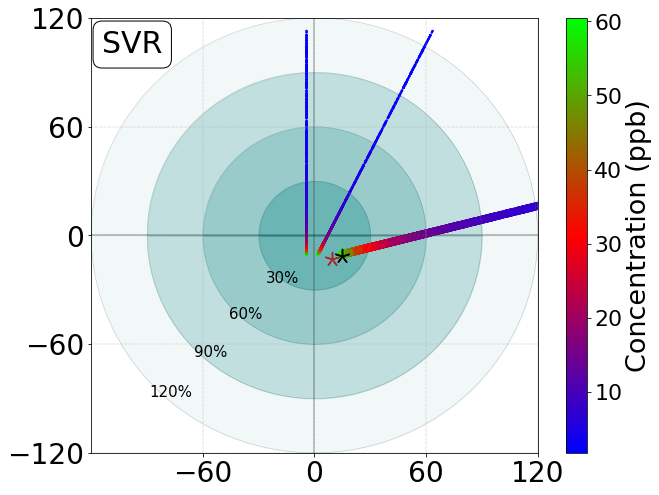

In [706]:
A=target(pred,y_test,1.2)
theta = np.linspace( 0 , 2 * np.pi , 150 )
r1 =30
a1= r1 * np.cos( theta )
b1= r1 * np.sin( theta )
r2 =60
a2=r2* np.cos( theta )
b2=r2* np.sin( theta )
r3 =90
a3=r3* np.cos( theta )
b3=r3* np.sin( theta )

r4 =120
a4=r4* np.cos( theta )
b4=r4* np.sin( theta )
fig= plt.figure(figsize=(10,8))

plt.Circle((0, 0), 1, color='wheat')
#plt.vlines([0], -130, 130, linestyles='dashed',color='violet')
#plt.hlines([0], -130, 130, linestyles='dashed', color='violet')

plt.fill_between(a1, b1, color='teal', alpha=0.3)
plt.fill_between(a2, b2, color='teal',alpha=0.2)
plt.fill_between(a3, b3, color='teal',alpha=0.2)
plt.fill_between(a4, b4, color='teal',alpha=0.05)

x1=np.arange(0,30.1,0.1)
r1=30
y1=np.sqrt(r1**2-x1**2)
x2=np.arange(0,60.1,0.1)
r2=60
y2=np.sqrt(r2**2-x2**2)

x3=np.arange(0,90.1,0.1)
r3=90
y3=np.sqrt(r3**2-x3**2)

x4=np.arange(0,120.1,0.1)
r4=120
y4=np.sqrt(r4**2-x4**2)

plt.plot(x1,y1, linewidth=0.2, color='grey')
plt.plot(x1,-1*y1, linewidth=0.2, color='grey')
plt.plot(x2,y2, linewidth=0.2, color='grey')
plt.plot(x2,-1*y2, linewidth=0.2, color='grey')
plt.plot(x3,y3, linewidth=0.2, color='grey')
plt.plot(x3,-1*y3, linewidth=0.2, color='grey')
plt.plot(x4,y4, linewidth=0.2, color='grey')
plt.plot(x4,-1*y4, linewidth=0.2, color='grey')

plt.plot(-1*x1,y1, linewidth=0.2, color='grey')
plt.plot(-1*x1,-1*y1, linewidth=0.2, color='grey')
plt.plot(-1*x2,y2, linewidth=0.2, color='grey')
plt.plot(-1*x2,-1*y2, linewidth=0.2, color='grey')
plt.plot(-1*x3,y3, linewidth=0.2, color='grey')
plt.plot(-1*x3,-1*y3, linewidth=0.2, color='grey')
plt.plot(-1*x4,y4, linewidth=0.2, color='grey')
plt.plot(-1*x4,-1*y4, linewidth=0.2, color='grey')

#plt.xlabel('Random uncertainty effect (%)',fontsize=24)
#plt.ylabel('Bias effect (%)',fontsize=24)
#plt.title('CO',fontsize=18)
color_map = plt.cm.get_cmap('brg')
reversed_color_map = color_map
plt.scatter(A[0],A[1],marker='.',s=200,c=np.array(A[2]),cmap=reversed_color_map)
plt.scatter(A[3],A[1],marker='.',s=10,c=np.array(A[2]),cmap=reversed_color_map)
plt.scatter(A[4],A[1],marker='.',s=10,c=np.array(A[2]),cmap=reversed_color_map)
plt.vlines([0], -130, 130,color='black',linewidth=0.4)
plt.hlines([0], -130, 130, color='black',linewidth=0.4)
plt.grid(linestyle='-.',linewidth=0.4)
plt.ylim(ymin=-120)
plt.ylim(ymax=120)
plt.xlim(xmax=120)
plt.xlim(xmin=-120)
plt.xticks(np.arange(-60,121, 60),fontsize=28)
plt.yticks(np.arange(-120,121, 60),fontsize=28)
#plt.colorbar()
cbar = plt.colorbar()
cbar.ax.tick_params(labelsize=22)
cbar.set_label('Concentration (ppb)', rotation=90,fontsize=27)
plt.scatter(Random,Bias,marker=(5, 2),s=200, color='black')
plt.scatter(Random1+2,Bias1,marker=(5, 2),s=200, color='brown')
textstr = 'SVR'
props = dict(boxstyle='round', facecolor='white', alpha=1)
plt.text(0.1, 1.26, textstr, transform=ax.transAxes, fontsize=30,
        verticalalignment='top', bbox=props)
plt.text(-26,-26, '30%',fontsize=15)
plt.text(-46,-46, '60%',fontsize=15)
plt.text(-65,-67, '90%',fontsize=15)
plt.text(-89,-89, '120%',fontsize=15)
plt.show()

##  Model 3 : Random Forest

In [707]:
from sklearn.ensemble import RandomForestRegressor
  
 # create regressor object
regressor = RandomForestRegressor(n_estimators = 500,min_samples_split= 2,min_samples_leaf= 1,max_features= 'sqrt', 
                                  random_state = 0,max_depth=None,bootstrap=False)
# fit the regressor with x and y data
regressor.fit(X_train.drop(['Lab1'], axis=1), y_train)  

RandomForestRegressor(bootstrap=False, max_features='sqrt', n_estimators=500,
                      random_state=0)

In [708]:
Index=[i for i in range(len(y_test))]
features_O3=regressor.feature_importances_
pred = regressor.predict(X_test.drop(['Lab1'], axis=1))
pred_rf_o3=pred
Y_test=y_test.to_list()
Y_test=pd.Series(Y_test,index =Index)
Y_test
Pred=pd.Series(pred,index =Index)
Lab1=pd.Series(lab1,index =Index)
sMAPE_lr=round(smape_loss(Y_test,Pred),2)
sMAPE_lab=round (smape_loss(Y_test,Lab1),2)
RMSE_lr=round(np.sqrt(sm.mean_squared_error(y_test, pred)),1)
RMSE_lab=round(np.sqrt(sm.mean_squared_error(y_test, lab1)),1)
Pearson_lr=round(np.corrcoef(y_test, pred)[0, 1],2)
Pearson_lab=round(np.corrcoef(y_test, lab1)[0, 1],2)
sMAPE_rf_O3=sMAPE_lr
RMSE_rf_O3=RMSE_lr/np.mean(np.array(y_test))
Pearson_rf_O3=Pearson_lr
R2_rf_O3=round(sm.r2_score(y_test, pred), 2)
RMSE_Rf_O3=RMSE_lr
Pearson_rf_O3,R2_rf_O3,RMSE_Rf_O3

(0.99, 0.98, 2.3)

fig= plt.figure(figsize=(10,5))
ax = fig.add_subplot(111)
ax.patch.set_facecolor('lightblue')
ax.patch.set_alpha(0.3)
ax.plot(index,y_test, color='limegreen',linewidth=3)
ax.plot(index,pred, color='indigo',linewidth=3)
ax.plot(index,lab1, color='#426eff',linewidth=3)
plt.legend(['Ref', 'RF-Calibrated', 'LAB-Calibrated'], loc = 2, bbox_to_anchor = (0.79,1))
plt.ylabel('O3 Concentration(ppb)'.translate(subscript),fontsize=18)
plt.text(B-22, C,r'$R^{2}(RF)=$'+str(R2_rf_O3) , fontsize = 14, color='indigo')
plt.text(B-22, D,r'$R^{2}(Lab)=$'+str(R2_lab_O3) , fontsize = 14, color='#426eff')
plt.text(B-72, C, 'Pearson r(RF)='+str(Pearson_lr), fontsize = 14, color='indigo')
plt.text(B-72, D, 'Pearson r(Lab)='+str(Pearson_lab), fontsize = 14, color='#426eff')
plt.xlabel('Last 100 hours of testing period',fontsize=18)
#plt.xlabel('Last 200 hours of testing period',fontsize=18)
#plt.title('Random Forest(RF) vs Laboratory Calibration',fontsize=18)
plt.grid(linestyle='-.',linewidth=0.3)
plt.show()

In [709]:
print("Regressor model performance:")
print("Mean absolute error(MAE) =", round(sm.mean_absolute_error(y_test, pred), 2))
print("Mean squared error(MSE) =", round(sm.mean_squared_error(y_test, pred), 2))
print("Median absolute error =", round(sm.median_absolute_error(y_test, pred), 2))
print("Explain variance score =", round(sm.explained_variance_score(y_test, pred), 2))
print("R2 score =", round(sm.r2_score(y_test, pred), 2))
MBE_RF_O3=MBE(pred,y_test)/np.std(y_test)
CRMSE_RF_O3=CRMSE(y_test,pred)/np.std(y_test)
pred_rf=pred

Regressor model performance:
Mean absolute error(MAE) = 1.65
Mean squared error(MSE) = 5.34
Median absolute error = 1.19
Explain variance score = 0.98
R2 score = 0.98


In [710]:
features_O3

array([0.09161521, 0.15443193, 0.20170717, 0.06756315, 0.01190181,
       0.07543335, 0.39734737])

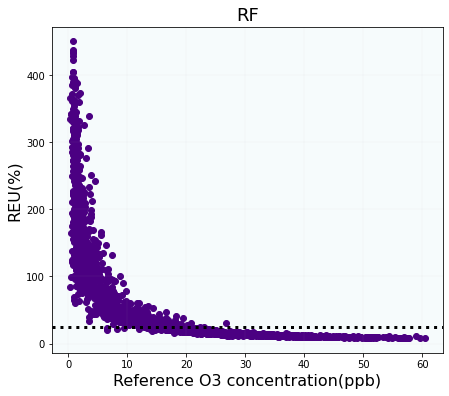

In [711]:
u_cal=REF(pred,y_test,1.2)
fig= plt.figure(figsize=(7,6))
ax = fig.add_subplot(111)
ax.patch.set_facecolor('lightblue')
ax.patch.set_alpha(0.1)
ind=[]
U_cal=[]
Ref=[]
for i in range(len(u_cal)):
    if -50<u_cal[i]<500:
        U_cal.append(u_cal[i])
        Ref.append(y_test[i])
plt.scatter(Ref,U_cal, color='#4B0082')
plt.axhline(y=25, color='black', linestyle=':',linewidth=3)
plt.ylabel('REU(%)', fontsize=16)
plt.xlabel('Reference O3 concentration(ppb)',fontsize=16)
plt.grid(linestyle='-.',linewidth=0.1)
plt.title('RF', fontsize=18)
plt.show()

In [712]:
import random
alpha=1.2
LV=max(y_test)
Cal=0
for i in range(len(y_test)):
    if y_test[i]==LV:
        Cal=pred[i]
cal=np.array(pred)
ref=np.array(y_test)
ref_mean=np.mean(ref)
cal_mean=np.mean(cal)
prec=np.array([1 for i in range(len(ref))])
u=prec
#cal=np.log(cal)
#ref=np.log(ref)
sx_s=(1/len(ref))*sum((ref-ref_mean)**2)
sy_s=(1/len(cal))*sum((cal-cal_mean)**2)
sxy=(1/len(cal))*sum((cal-cal_mean)*(ref-ref_mean))
#beta_1=((sy_s-sx_s)+np.sqrt((sy_s-sx_s)**2+4*sxy**2))/(2*sxy)
beta_1=((sy_s-alpha*sx_s)+np.sqrt((sy_s-sx_s)**2+4*alpha*sxy**2))/(2*sxy)
beta_0=cal_mean-beta_1*ref_mean
RSS=sum((cal-beta_0-beta_1*ref)**2-(beta_1**2+alpha)*(0.001*LV)**2)
du_s=RSS/(len(cal)-2)
    #Beta_1=((sy_s-sx_s-du_s)+np.sqrt((sy_s-sx_s-du_s)**2+4*sxy**2))/(2*sxy)
Beta_1=((sy_s-alpha*sx_s-du_s)+np.sqrt((sy_s-alpha*sx_s-du_s)**2+4*alpha*sxy**2))/(2*sxy)
Beta_0=cal_mean-Beta_1*ref_mean
P1=(RSS/(len(cal)-2))
P2=(Beta_1**2+alpha)*(0.001*LV)**2+(-2*Beta_1**2+2*Beta_1-1)*(0.001*LV)**2
P3=(Beta_0+(Beta_1-1)*LV)
P=P1+P2+P3
Bias=(2*(P3)/LV)*100
Random=(2*(P1+P2)**0.5/LV)*100

import random
alpha=1.4
LV1=120
Cal=0
for i in range(len(y_test)):
    if y_test[i]==LV:
        Cal=lab1[i]
cal=np.array(pred)
ref=np.array(y_test)
ref_mean=np.mean(ref)
cal_mean=np.mean(cal)
prec=np.array([1 for i in range(len(ref))])
u=prec
#cal=np.log(cal)
#ref=np.log(ref)
sx_s=(1/len(ref))*sum((ref-ref_mean)**2)
sy_s=(1/len(cal))*sum((cal-cal_mean)**2)
sxy=(1/len(cal))*sum((cal-cal_mean)*(ref-ref_mean))
#beta_1=((sy_s-sx_s)+np.sqrt((sy_s-sx_s)**2+4*sxy**2))/(2*sxy)
beta_1=((sy_s-alpha*sx_s)+np.sqrt((sy_s-sx_s)**2+4*alpha*sxy**2))/(2*sxy)
beta_0=cal_mean-beta_1*ref_mean
RSS=sum((cal-beta_0-beta_1*ref)**2-(beta_1**2+alpha)*(0.001*LV1)**2)
du_s=RSS/(len(cal)-2)
    #Beta_1=((sy_s-sx_s-du_s)+np.sqrt((sy_s-sx_s-du_s)**2+4*sxy**2))/(2*sxy)
Beta_1=((sy_s-alpha*sx_s-du_s)+np.sqrt((sy_s-alpha*sx_s-du_s)**2+4*alpha*sxy**2))/(2*sxy)
Beta_0=cal_mean-Beta_1*ref_mean
P1=(RSS/(len(cal)-2))
P2=(Beta_1**2+alpha)*(0.001*LV1)**2+(-2*Beta_1**2+2*Beta_1-1)*(0.001*LV1)**2
P3=(Beta_0+(Beta_1-1)*LV1)
P=P1+P2+P3
Bias1=(2*(P3)/(LV1))*100
Random1=(2*(P1+P2)**0.5/(LV1))*100

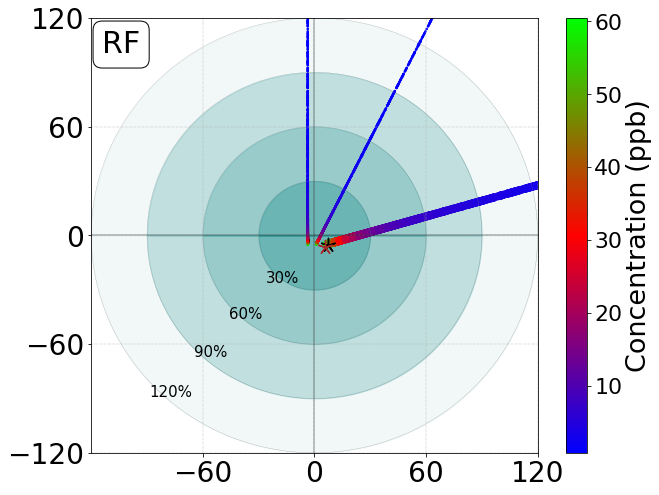

In [713]:
A=target(pred,y_test,1.2)
theta = np.linspace( 0 , 2 * np.pi , 150 )
r1 =30
a1= r1 * np.cos( theta )
b1= r1 * np.sin( theta )
r2 =60
a2=r2* np.cos( theta )
b2=r2* np.sin( theta )
r3 =90
a3=r3* np.cos( theta )
b3=r3* np.sin( theta )

r4 =120
a4=r4* np.cos( theta )
b4=r4* np.sin( theta )
fig= plt.figure(figsize=(10,8))

plt.Circle((0, 0), 1, color='wheat')
#plt.vlines([0], -130, 130, linestyles='dashed',color='violet')
#plt.hlines([0], -130, 130, linestyles='dashed', color='violet')

plt.fill_between(a1, b1, color='teal', alpha=0.3)
plt.fill_between(a2, b2, color='teal',alpha=0.2)
plt.fill_between(a3, b3, color='teal',alpha=0.2)
plt.fill_between(a4, b4, color='teal',alpha=0.05)

x1=np.arange(0,30.1,0.1)
r1=30
y1=np.sqrt(r1**2-x1**2)
x2=np.arange(0,60.1,0.1)
r2=60
y2=np.sqrt(r2**2-x2**2)

x3=np.arange(0,90.1,0.1)
r3=90
y3=np.sqrt(r3**2-x3**2)

x4=np.arange(0,120.1,0.1)
r4=120
y4=np.sqrt(r4**2-x4**2)

plt.plot(x1,y1, linewidth=0.2, color='grey')
plt.plot(x1,-1*y1, linewidth=0.2, color='grey')
plt.plot(x2,y2, linewidth=0.2, color='grey')
plt.plot(x2,-1*y2, linewidth=0.2, color='grey')
plt.plot(x3,y3, linewidth=0.2, color='grey')
plt.plot(x3,-1*y3, linewidth=0.2, color='grey')
plt.plot(x4,y4, linewidth=0.2, color='grey')
plt.plot(x4,-1*y4, linewidth=0.2, color='grey')

plt.plot(-1*x1,y1, linewidth=0.2, color='grey')
plt.plot(-1*x1,-1*y1, linewidth=0.2, color='grey')
plt.plot(-1*x2,y2, linewidth=0.2, color='grey')
plt.plot(-1*x2,-1*y2, linewidth=0.2, color='grey')
plt.plot(-1*x3,y3, linewidth=0.2, color='grey')
plt.plot(-1*x3,-1*y3, linewidth=0.2, color='grey')
plt.plot(-1*x4,y4, linewidth=0.2, color='grey')
plt.plot(-1*x4,-1*y4, linewidth=0.2, color='grey')

#plt.xlabel('Random uncertainty effect (%)',fontsize=24)
#plt.ylabel('Bias effect (%)',fontsize=24)
#plt.title('CO',fontsize=18)
color_map = plt.cm.get_cmap('brg')
reversed_color_map = color_map
plt.scatter(A[0],A[1],marker='.',s=200,c=np.array(A[2]),cmap=reversed_color_map)
plt.scatter(A[3],A[1],marker='.',s=10,c=np.array(A[2]),cmap=reversed_color_map)
plt.scatter(A[4],A[1],marker='.',s=10,c=np.array(A[2]),cmap=reversed_color_map)
plt.vlines([0], -130, 130,color='black',linewidth=0.4)
plt.hlines([0], -130, 130, color='black',linewidth=0.4)
plt.grid(linestyle='-.',linewidth=0.4)
plt.ylim(ymin=-120)
plt.ylim(ymax=120)
plt.xlim(xmax=120)
plt.xlim(xmin=-120)
plt.xticks(np.arange(-60,121, 60),fontsize=28)
plt.yticks(np.arange(-120,121, 60),fontsize=28)
#plt.colorbar()
cbar = plt.colorbar()
cbar.ax.tick_params(labelsize=22)
cbar.set_label('Concentration (ppb)', rotation=90,fontsize=27)
plt.scatter(Random,Bias,marker=(5, 2),s=200, color='black')
plt.scatter(Random1+2,Bias1,marker=(5, 2),s=200, color='brown')
textstr = 'RF'
props = dict(boxstyle='round', facecolor='white', alpha=1)
plt.text(0.1, 1.26, textstr, transform=ax.transAxes, fontsize=30,
        verticalalignment='top', bbox=props)
plt.text(-26,-26, '30%',fontsize=15)
plt.text(-46,-46, '60%',fontsize=15)
plt.text(-65,-67, '90%',fontsize=15)
plt.text(-89,-89, '120%',fontsize=15)
plt.show()

In [714]:
A=[i for i in np.arange(1,20,0.1)]
K=[]
for i in A:
    k=REF2(pred,y_test,i,350)
    K.append(k)
for i in range(len(K)):
    if K[i]==min(K):
        print(A[i])

1.2000000000000002


## Model 4: ANN

In [715]:
from keras.models import Sequential
from keras.layers import Dense
from keras import optimizers
from sklearn.preprocessing import StandardScaler
model = Sequential()
model.add(Dense(6, input_shape = (7,),kernel_initializer='normal', activation= 'linear'))
model.add(Dense(128,kernel_initializer='normal', activation= 'relu'))
model.add(Dense(128, kernel_initializer='normal',activation= 'relu'))
model.add(Dense(100, kernel_initializer='normal',activation= 'relu'))
model.add(Dense(1,kernel_initializer='normal',activation='linear',))
sgd = optimizers.Adam(learning_rate=0.01)

model.compile(optimizer = sgd, loss = 'mean_squared_error', metrics= ['mse', 'mae'])
model.summary()

Model: "sequential_11"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_52 (Dense)             (None, 6)                 48        
_________________________________________________________________
dense_53 (Dense)             (None, 128)               896       
_________________________________________________________________
dense_54 (Dense)             (None, 128)               16512     
_________________________________________________________________
dense_55 (Dense)             (None, 100)               12900     
_________________________________________________________________
dense_56 (Dense)             (None, 1)                 101       
Total params: 30,457
Trainable params: 30,457
Non-trainable params: 0
_________________________________________________________________


In [716]:
scaler = StandardScaler()
scaler.fit(X_train.drop(['Lab1'], axis=1))
X_train_scaled=scaler.transform(X_train.drop(['Lab1'], axis=1))
X_test_scaled=scaler.transform(X_test.drop(['Lab1'], axis=1))
model.fit(X_train_scaled, y_train, batch_size= 100, epochs=200, verbose= 0)

In [717]:
train_pred = model.predict(X_train_scaled)
test_pred = model.predict(X_test_scaled)
pred=[]
for i in range(len(test_pred)):
    pred.append(sum(list(test_pred[i])))
len(y_test)

2002

In [718]:

Y_test=y_test.to_list()
Y_test=pd.Series(Y_test,index =Index)
Y_test
Pred=pd.Series(pred,index =Index)
Lab1=pd.Series(lab1,index =Index)
sMAPE_lr=round(smape_loss(Y_test,Pred),2)
sMAPE_lab=round (smape_loss(Y_test,Lab1),2)
RMSE_lr=round(np.sqrt(sm.mean_squared_error(y_test, pred)),1)
RMSE_lab=round(np.sqrt(sm.mean_squared_error(y_test, lab1)),1)
Pearson_lr=round(np.corrcoef(y_test, pred)[0, 1],2)
Pearson_lab=round(np.corrcoef(y_test, lab1)[0, 1],2)
sMAPE_ann_O3=sMAPE_lr
RMSE_ann_O3=RMSE_lr/np.mean(np.array(y_test))
Pearson_ann_O3=Pearson_lr
R2_ann_O3=round(sm.r2_score(y_test, pred), 2)
RMSE_Ann_O3=RMSE_lr
Pearson_ann_O3,R2_ann_O3,RMSE_Ann_O3

(0.99, 0.97, 2.5)

fig= plt.figure(figsize=(8,6))
ax = fig.add_subplot(111)
ax.patch.set_facecolor('lightblue')
ax.patch.set_alpha(0.3)
ax.plot(index,y_test, color='limegreen',linewidth=3)
ax.plot(index,pred, color='tomato',linewidth=3)
ax.plot(index,lab1, color='#426eff',linewidth=3)
plt.legend(['Ref', 'ANN-Calibrated', 'LAB-Calibrated'], loc = 2, bbox_to_anchor = (0.75,1))
plt.ylabel('O3 Concentration(ppm)'.translate(subscript),fontsize=18)
#plt.text(B-5, C,r'$R^{2}(ANN)=$'+str(R2_ann_O3) , fontsize = 14, color='tomato')
#plt.text(B-5, D, r'$R^{2}(Lab)=$'+str(R2_lab_O3), fontsize = 14, color='#426eff')
#plt.text(B-70, C, 'Pearson r(ANN)='+str(Pearson_lr), fontsize = 14, color='tomato')
#plt.text(B-70, D, 'Pearson r(Lab)='+str(Pearson_lab), fontsize = 14, color='#426eff')
plt.xlabel('Testing period(hours)',fontsize=18)
#plt.xlabel('Last 200 hours of testing period',fontsize=18)
#plt.title('Artificial Neural Network(ANN) vs Laboratory Calibration',fontsize=18)
plt.grid(linestyle='-.',linewidth=0.3)
plt.show()

In [719]:
print("Regressor model performance:")
print("Mean absolute error(MAE) =", round(sm.mean_absolute_error(y_test, pred), 2))
print("Mean squared error(MSE) =", round(sm.mean_squared_error(y_test, pred), 2))
print("Median absolute error =", round(sm.median_absolute_error(y_test, pred), 2))
print("Explain variance score =", round(sm.explained_variance_score(y_test, pred), 2))
print("R2 score =", round(sm.r2_score(y_test, pred), 2))

MBE_ANN_O3=MBE(pred,y_test)/np.std(y_test)
CRMSE_ANN_O3=CRMSE(y_test,pred)/np.std(y_test)
pred_ann=pred

Regressor model performance:
Mean absolute error(MAE) = 1.84
Mean squared error(MSE) = 6.46
Median absolute error = 1.37
Explain variance score = 0.97
R2 score = 0.97


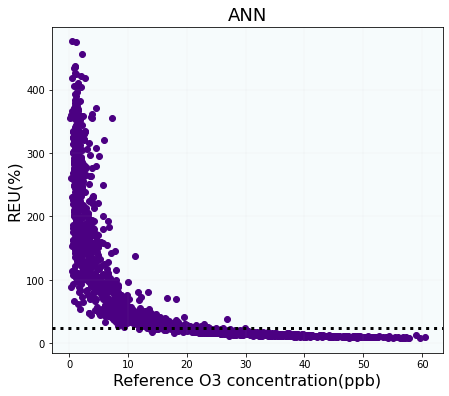

In [720]:
u_cal=REF(pred,y_test,1.2)
fig= plt.figure(figsize=(7,6))
ax = fig.add_subplot(111)
ax.patch.set_facecolor('lightblue')
ax.patch.set_alpha(0.1)
ind=[]
U_cal=[]
Ref=[]
for i in range(len(u_cal)):
    if -50<u_cal[i]<500:
        U_cal.append(u_cal[i])
        Ref.append(y_test[i])
plt.scatter(Ref,U_cal, color='#4B0082')
plt.axhline(y=25, color='black', linestyle=':',linewidth=3)
plt.ylabel('REU(%)', fontsize=16)
plt.xlabel('Reference O3 concentration(ppb)',fontsize=16)
plt.grid(linestyle='-.',linewidth=0.1)
plt.title('ANN', fontsize=18)
plt.show()

In [721]:
import random
alpha=1.2
LV=max(y_test)
Cal=0
for i in range(len(y_test)):
    if y_test[i]==LV:
        Cal=pred[i]
cal=np.array(pred)
ref=np.array(y_test)
ref_mean=np.mean(ref)
cal_mean=np.mean(cal)
prec=np.array([1 for i in range(len(ref))])
u=prec
#cal=np.log(cal)
#ref=np.log(ref)
sx_s=(1/len(ref))*sum((ref-ref_mean)**2)
sy_s=(1/len(cal))*sum((cal-cal_mean)**2)
sxy=(1/len(cal))*sum((cal-cal_mean)*(ref-ref_mean))
#beta_1=((sy_s-sx_s)+np.sqrt((sy_s-sx_s)**2+4*sxy**2))/(2*sxy)
beta_1=((sy_s-alpha*sx_s)+np.sqrt((sy_s-sx_s)**2+4*alpha*sxy**2))/(2*sxy)
beta_0=cal_mean-beta_1*ref_mean
RSS=sum((cal-beta_0-beta_1*ref)**2-(beta_1**2+alpha)*(0.001*LV)**2)
du_s=RSS/(len(cal)-2)
    #Beta_1=((sy_s-sx_s-du_s)+np.sqrt((sy_s-sx_s-du_s)**2+4*sxy**2))/(2*sxy)
Beta_1=((sy_s-alpha*sx_s-du_s)+np.sqrt((sy_s-alpha*sx_s-du_s)**2+4*alpha*sxy**2))/(2*sxy)
Beta_0=cal_mean-Beta_1*ref_mean
P1=(RSS/(len(cal)-2))
P2=(Beta_1**2+alpha)*(0.001*LV)**2+(-2*Beta_1**2+2*Beta_1-1)*(0.001*LV)**2
P3=(Beta_0+(Beta_1-1)*LV)
P=P1+P2+P3
Bias=(2*(P3)/LV)*100
Random=(2*(P1+P2)**0.5/LV)*100

import random
alpha=1.4
LV1=120
Cal=0
for i in range(len(y_test)):
    if y_test[i]==LV:
        Cal=lab1[i]
cal=np.array(pred)
ref=np.array(y_test)
ref_mean=np.mean(ref)
cal_mean=np.mean(cal)
prec=np.array([1 for i in range(len(ref))])
u=prec
#cal=np.log(cal)
#ref=np.log(ref)
sx_s=(1/len(ref))*sum((ref-ref_mean)**2)
sy_s=(1/len(cal))*sum((cal-cal_mean)**2)
sxy=(1/len(cal))*sum((cal-cal_mean)*(ref-ref_mean))
#beta_1=((sy_s-sx_s)+np.sqrt((sy_s-sx_s)**2+4*sxy**2))/(2*sxy)
beta_1=((sy_s-alpha*sx_s)+np.sqrt((sy_s-sx_s)**2+4*alpha*sxy**2))/(2*sxy)
beta_0=cal_mean-beta_1*ref_mean
RSS=sum((cal-beta_0-beta_1*ref)**2-(beta_1**2+alpha)*(0.001*LV1)**2)
du_s=RSS/(len(cal)-2)
    #Beta_1=((sy_s-sx_s-du_s)+np.sqrt((sy_s-sx_s-du_s)**2+4*sxy**2))/(2*sxy)
Beta_1=((sy_s-alpha*sx_s-du_s)+np.sqrt((sy_s-alpha*sx_s-du_s)**2+4*alpha*sxy**2))/(2*sxy)
Beta_0=cal_mean-Beta_1*ref_mean
P1=(RSS/(len(cal)-2))
P2=(Beta_1**2+alpha)*(0.001*LV1)**2+(-2*Beta_1**2+2*Beta_1-1)*(0.001*LV1)**2
P3=(Beta_0+(Beta_1-1)*LV1)
P=P1+P2+P3
Bias1=(2*(P3)/(LV1))*100
Random1=(2*(P1+P2)**0.5/(LV1))*100

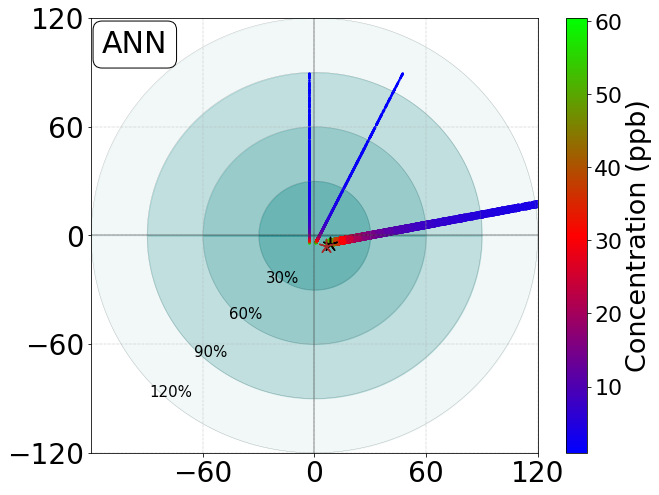

In [722]:
A=target(pred,y_test,1.2)
theta = np.linspace( 0 , 2 * np.pi , 150 )
r1 =30
a1= r1 * np.cos( theta )
b1= r1 * np.sin( theta )
r2 =60
a2=r2* np.cos( theta )
b2=r2* np.sin( theta )
r3 =90
a3=r3* np.cos( theta )
b3=r3* np.sin( theta )

r4 =120
a4=r4* np.cos( theta )
b4=r4* np.sin( theta )
fig= plt.figure(figsize=(10,8))

plt.Circle((0, 0), 1, color='wheat')
#plt.vlines([0], -130, 130, linestyles='dashed',color='violet')
#plt.hlines([0], -130, 130, linestyles='dashed', color='violet')

plt.fill_between(a1, b1, color='teal', alpha=0.3)
plt.fill_between(a2, b2, color='teal',alpha=0.2)
plt.fill_between(a3, b3, color='teal',alpha=0.2)
plt.fill_between(a4, b4, color='teal',alpha=0.05)

x1=np.arange(0,30.1,0.1)
r1=30
y1=np.sqrt(r1**2-x1**2)
x2=np.arange(0,60.1,0.1)
r2=60
y2=np.sqrt(r2**2-x2**2)

x3=np.arange(0,90.1,0.1)
r3=90
y3=np.sqrt(r3**2-x3**2)

x4=np.arange(0,120.1,0.1)
r4=120
y4=np.sqrt(r4**2-x4**2)

plt.plot(x1,y1, linewidth=0.2, color='grey')
plt.plot(x1,-1*y1, linewidth=0.2, color='grey')
plt.plot(x2,y2, linewidth=0.2, color='grey')
plt.plot(x2,-1*y2, linewidth=0.2, color='grey')
plt.plot(x3,y3, linewidth=0.2, color='grey')
plt.plot(x3,-1*y3, linewidth=0.2, color='grey')
plt.plot(x4,y4, linewidth=0.2, color='grey')
plt.plot(x4,-1*y4, linewidth=0.2, color='grey')

plt.plot(-1*x1,y1, linewidth=0.2, color='grey')
plt.plot(-1*x1,-1*y1, linewidth=0.2, color='grey')
plt.plot(-1*x2,y2, linewidth=0.2, color='grey')
plt.plot(-1*x2,-1*y2, linewidth=0.2, color='grey')
plt.plot(-1*x3,y3, linewidth=0.2, color='grey')
plt.plot(-1*x3,-1*y3, linewidth=0.2, color='grey')
plt.plot(-1*x4,y4, linewidth=0.2, color='grey')
plt.plot(-1*x4,-1*y4, linewidth=0.2, color='grey')

#plt.xlabel('Random uncertainty effect (%)',fontsize=24)
#plt.ylabel('Bias effect (%)',fontsize=24)
#plt.title('CO',fontsize=18)
color_map = plt.cm.get_cmap('brg')
reversed_color_map = color_map
plt.scatter(A[0],A[1],marker='.',s=200,c=np.array(A[2]),cmap=reversed_color_map)
plt.scatter(A[3],A[1],marker='.',s=10,c=np.array(A[2]),cmap=reversed_color_map)
plt.scatter(A[4],A[1],marker='.',s=10,c=np.array(A[2]),cmap=reversed_color_map)
plt.vlines([0], -130, 130,color='black',linewidth=0.4)
plt.hlines([0], -130, 130, color='black',linewidth=0.4)
plt.grid(linestyle='-.',linewidth=0.4)
plt.ylim(ymin=-120)
plt.ylim(ymax=120)
plt.xlim(xmax=120)
plt.xlim(xmin=-120)
plt.xticks(np.arange(-60,121, 60),fontsize=28)
plt.yticks(np.arange(-120,121, 60),fontsize=28)
#plt.colorbar()
cbar = plt.colorbar()
cbar.ax.tick_params(labelsize=22)
cbar.set_label('Concentration (ppb)', rotation=90,fontsize=27)
plt.scatter(Random,Bias,marker=(5, 2),s=200, color='black')
plt.scatter(Random1+2,Bias1,marker=(5, 2),s=200, color='brown')
textstr = 'ANN'
props = dict(boxstyle='round', facecolor='white', alpha=1)
plt.text(0.1, 1.26, textstr, transform=ax.transAxes, fontsize=30,
        verticalalignment='top', bbox=props)
plt.text(-26,-26, '30%',fontsize=15)
plt.text(-46,-46, '60%',fontsize=15)
plt.text(-65,-67, '90%',fontsize=15)
plt.text(-89,-89, '120%',fontsize=15)
plt.show()

# Model 5:  XGBoost

In [723]:
from xgboost import  XGBRegressor
from numpy import absolute
from pandas import read_csv
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedKFold
# create an xgboost regression model
#n_estimators=10000, max_depth=5, eta=0.01, subsample=0.9,colsample_bytree=0.4,alpha=10
model = XGBRegressor(n_estimators=10000, max_depth=5, eta=0.01, subsample=0.9, 
                     colsample_bytree=0.4,alpha=10)

model.fit(X_train.drop(['Lab1'], axis=1),y_train)

XGBRegressor(alpha=10, base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=0.4, eta=0.01, gamma=0,
             gpu_id=-1, importance_type='gain', interaction_constraints='',
             learning_rate=0.00999999978, max_delta_step=0, max_depth=5,
             min_child_weight=1, missing=nan, monotone_constraints='()',
             n_estimators=10000, n_jobs=0, num_parallel_tree=1, random_state=0,
             reg_alpha=10, reg_lambda=1, scale_pos_weight=1, subsample=0.9,
             tree_method='exact', validate_parameters=1, verbosity=None)

In [724]:
pred = model.predict(X_test.drop(['Lab1'], axis=1))
pred_xgb_o3=pred
Y_test=y_test.to_list()
Y_test=pd.Series(Y_test,index =Index)
Y_test
Pred=pd.Series(pred,index =Index)
Lab1=pd.Series(lab1,index =Index)
sMAPE_lr=round(smape_loss(Y_test,Pred),2)
sMAPE_lab=round (smape_loss(Y_test,Lab1),2)
RMSE_lr=round(np.sqrt(sm.mean_squared_error(y_test, pred)),1)
RMSE_lab=round(np.sqrt(sm.mean_squared_error(y_test, lab1)),1)
Pearson_lr=round(np.corrcoef(y_test, pred)[0, 1],2)
Pearson_lab=round(np.corrcoef(y_test, lab1)[0, 1],2)
sMAPE_xgb_O3=sMAPE_lr
RMSE_xgb_O3=RMSE_lr/np.mean(np.array(y_test))
Pearson_xgb_O3=Pearson_lr
R2_xgb_O3=round(sm.r2_score(y_test, pred), 2)
RMSE_Xgb_O3=RMSE_lr
Pearson_xgb_O3,R2_xgb_O3,RMSE_Xgb_O3

(0.98, 0.97, 2.6)

fig= plt.figure(figsize=(8,6))
ax = fig.add_subplot(111)
ax.patch.set_facecolor('lightblue')
ax.patch.set_alpha(0.3)
ax.plot(index,y_test, color='limegreen',linewidth=3)
ax.plot(index,pred, color='darkgoldenrod',linewidth=3)
ax.plot(index,lab1, color='#426eff',linewidth=3)
plt.legend(['Ref', 'XGBoost-Calibrated', 'LAB-Calibrated'], loc = 2, bbox_to_anchor = (0.75,1))
plt.ylabel('O3 Concentration(ppb)'.translate(subscript),fontsize=18)
#plt.text(B-5, C,r'$R^{2}(XGB)=$'+str(R2_xgb_O3) , fontsize = 14, color='darkgoldenrod')
#plt.text(B-5, D,r'$R^{2}(Lab)=$'+str(R2_lab_O3) , fontsize = 14, color='#426eff')
#plt.text(B-70, C, 'Pearson r(XGB)='+str(Pearson_lr), fontsize = 14, color='darkgoldenrod')
#plt.text(B-70, D, 'Pearson r(Lab)='+str(Pearson_lab), fontsize = 14, color='#426eff')
plt.xlabel('Testing period(hours)',fontsize=18)
#plt.xlabel('Last 200 hours of testing period',fontsize=18)
#plt.title('XGBoost vs Laboratory Calibration',fontsize=18)
plt.grid(linestyle='-.',linewidth=0.3)
plt.show()

In [725]:
print("Regressor model performance:")
print("Mean absolute error(MAE) =", round(sm.mean_absolute_error(y_test, pred), 2))
print("Mean squared error(MSE) =", round(sm.mean_squared_error(y_test, pred), 2))
print("Median absolute error =", round(sm.median_absolute_error(y_test, pred), 2))
print("Explain variance score =", round(sm.explained_variance_score(y_test, pred), 2))
print("R2 score =", round(sm.r2_score(y_test, pred), 2))
MBE_XGB_O3=MBE(pred,y_test)/np.std(y_test)
CRMSE_XGB_O3=CRMSE(y_test,pred)/np.std(y_test)
pred_xgb=pred

Regressor model performance:
Mean absolute error(MAE) = 1.98
Mean squared error(MSE) = 7.0
Median absolute error = 1.57
Explain variance score = 0.97
R2 score = 0.97


In [726]:
A=len(y_test)-200

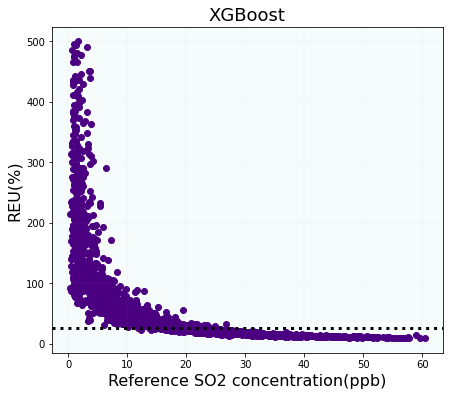

In [727]:
u_cal=REF(pred,y_test,1)
fig= plt.figure(figsize=(7,6))
ax = fig.add_subplot(111)
ax.patch.set_facecolor('lightblue')
ax.patch.set_alpha(0.1)
ind=[]
U_cal=[]
Ref=[]
for i in range(len(u_cal)):
    if -50<u_cal[i]<500:
        U_cal.append(u_cal[i])
        Ref.append(y_test[i])
plt.scatter(Ref,U_cal, color='#4B0082')
plt.axhline(y=25, color='black', linestyle=':',linewidth=3)
plt.ylabel('REU(%)', fontsize=16)
plt.xlabel('Reference SO2 concentration(ppb)',fontsize=16)
plt.grid(linestyle='-.',linewidth=0.1)
plt.title('XGBoost', fontsize=18)
plt.show()

In [728]:
import random
alpha=1.2
LV=max(y_test)
Cal=0
for i in range(len(y_test)):
    if y_test[i]==LV:
        Cal=pred[i]
cal=np.array(pred)
ref=np.array(y_test)
ref_mean=np.mean(ref)
cal_mean=np.mean(cal)
prec=np.array([1 for i in range(len(ref))])
u=prec
#cal=np.log(cal)
#ref=np.log(ref)
sx_s=(1/len(ref))*sum((ref-ref_mean)**2)
sy_s=(1/len(cal))*sum((cal-cal_mean)**2)
sxy=(1/len(cal))*sum((cal-cal_mean)*(ref-ref_mean))
#beta_1=((sy_s-sx_s)+np.sqrt((sy_s-sx_s)**2+4*sxy**2))/(2*sxy)
beta_1=((sy_s-alpha*sx_s)+np.sqrt((sy_s-sx_s)**2+4*alpha*sxy**2))/(2*sxy)
beta_0=cal_mean-beta_1*ref_mean
RSS=sum((cal-beta_0-beta_1*ref)**2-(beta_1**2+alpha)*(0.001*LV)**2)
du_s=RSS/(len(cal)-2)
    #Beta_1=((sy_s-sx_s-du_s)+np.sqrt((sy_s-sx_s-du_s)**2+4*sxy**2))/(2*sxy)
Beta_1=((sy_s-alpha*sx_s-du_s)+np.sqrt((sy_s-alpha*sx_s-du_s)**2+4*alpha*sxy**2))/(2*sxy)
Beta_0=cal_mean-Beta_1*ref_mean
P1=(RSS/(len(cal)-2))
P2=(Beta_1**2+alpha)*(0.001*LV)**2+(-2*Beta_1**2+2*Beta_1-1)*(0.001*LV)**2
P3=(Beta_0+(Beta_1-1)*LV)
P=P1+P2+P3
Bias=(2*(P3)/LV)*100
Random=(2*(P1+P2)**0.5/LV)*100

import random
alpha=1.4
LV1=120
Cal=0
for i in range(len(y_test)):
    if y_test[i]==LV:
        Cal=lab1[i]
cal=np.array(pred)
ref=np.array(y_test)
ref_mean=np.mean(ref)
cal_mean=np.mean(cal)
prec=np.array([1 for i in range(len(ref))])
u=prec
#cal=np.log(cal)
#ref=np.log(ref)
sx_s=(1/len(ref))*sum((ref-ref_mean)**2)
sy_s=(1/len(cal))*sum((cal-cal_mean)**2)
sxy=(1/len(cal))*sum((cal-cal_mean)*(ref-ref_mean))
#beta_1=((sy_s-sx_s)+np.sqrt((sy_s-sx_s)**2+4*sxy**2))/(2*sxy)
beta_1=((sy_s-alpha*sx_s)+np.sqrt((sy_s-sx_s)**2+4*alpha*sxy**2))/(2*sxy)
beta_0=cal_mean-beta_1*ref_mean
RSS=sum((cal-beta_0-beta_1*ref)**2-(beta_1**2+alpha)*(0.001*LV1)**2)
du_s=RSS/(len(cal)-2)
    #Beta_1=((sy_s-sx_s-du_s)+np.sqrt((sy_s-sx_s-du_s)**2+4*sxy**2))/(2*sxy)
Beta_1=((sy_s-alpha*sx_s-du_s)+np.sqrt((sy_s-alpha*sx_s-du_s)**2+4*alpha*sxy**2))/(2*sxy)
Beta_0=cal_mean-Beta_1*ref_mean
P1=(RSS/(len(cal)-2))
P2=(Beta_1**2+alpha)*(0.001*LV1)**2+(-2*Beta_1**2+2*Beta_1-1)*(0.001*LV1)**2
P3=(Beta_0+(Beta_1-1)*LV1)
P=P1+P2+P3
Bias1=(2*(P3)/(LV1))*100
Random1=(2*(P1+P2)**0.5/(LV1))*100

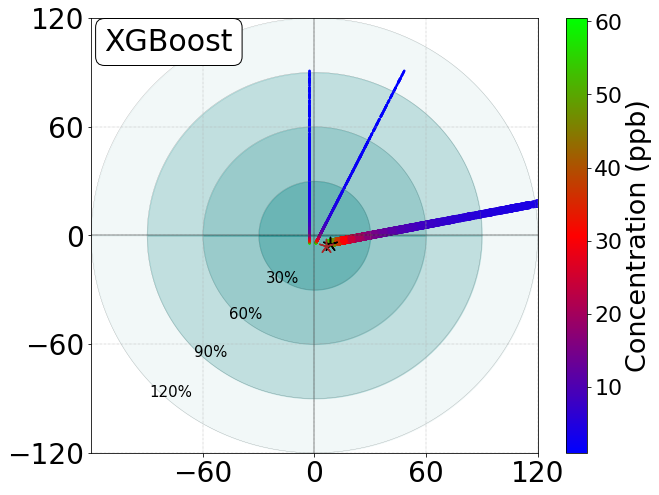

In [776]:
A=target(pred,y_test,1.2)
theta = np.linspace( 0 , 2 * np.pi , 150 )
r1 =30
a1= r1 * np.cos( theta )
b1= r1 * np.sin( theta )
r2 =60
a2=r2* np.cos( theta )
b2=r2* np.sin( theta )
r3 =90
a3=r3* np.cos( theta )
b3=r3* np.sin( theta )

r4 =120
a4=r4* np.cos( theta )
b4=r4* np.sin( theta )
fig= plt.figure(figsize=(10,8))

plt.Circle((0, 0), 1, color='wheat')
#plt.vlines([0], -130, 130, linestyles='dashed',color='violet')
#plt.hlines([0], -130, 130, linestyles='dashed', color='violet')

plt.fill_between(a1, b1, color='teal', alpha=0.3)
plt.fill_between(a2, b2, color='teal',alpha=0.2)
plt.fill_between(a3, b3, color='teal',alpha=0.2)
plt.fill_between(a4, b4, color='teal',alpha=0.05)

x1=np.arange(0,30.1,0.1)
r1=30
y1=np.sqrt(r1**2-x1**2)
x2=np.arange(0,60.1,0.1)
r2=60
y2=np.sqrt(r2**2-x2**2)

x3=np.arange(0,90.1,0.1)
r3=90
y3=np.sqrt(r3**2-x3**2)

x4=np.arange(0,120.1,0.1)
r4=120
y4=np.sqrt(r4**2-x4**2)
ax.set_ylim(bottom=0)
ax.set_xlim(left=0)
plt.plot(x1,y1, linewidth=0.2, color='grey')
plt.plot(x1,-1*y1, linewidth=0.2, color='grey')
plt.plot(x2,y2, linewidth=0.2, color='grey')
plt.plot(x2,-1*y2, linewidth=0.2, color='grey')
plt.plot(x3,y3, linewidth=0.2, color='grey')
plt.plot(x3,-1*y3, linewidth=0.2, color='grey')
plt.plot(x4,y4, linewidth=0.2, color='grey')
plt.plot(x4,-1*y4, linewidth=0.2, color='grey')

plt.plot(-1*x1,y1, linewidth=0.2, color='grey')
plt.plot(-1*x1,-1*y1, linewidth=0.2, color='grey')
plt.plot(-1*x2,y2, linewidth=0.2, color='grey')
plt.plot(-1*x2,-1*y2, linewidth=0.2, color='grey')
plt.plot(-1*x3,y3, linewidth=0.2, color='grey')
plt.plot(-1*x3,-1*y3, linewidth=0.2, color='grey')
plt.plot(-1*x4,y4, linewidth=0.2, color='grey')
plt.plot(-1*x4,-1*y4, linewidth=0.2, color='grey')

#plt.xlabel('Random uncertainty effect (%)',fontsize=24)
#plt.ylabel('Bias effect (%)',fontsize=24)
#plt.title('CO',fontsize=18)
color_map = plt.cm.get_cmap('brg')
reversed_color_map = color_map
plt.scatter(A[0],A[1],marker='.',s=200,c=np.array(A[2]),cmap=reversed_color_map)
plt.scatter(A[3],A[1],marker='.',s=10,c=np.array(A[2]),cmap=reversed_color_map)
plt.scatter(A[4],A[1],marker='.',s=10,c=np.array(A[2]),cmap=reversed_color_map)
plt.vlines([0], -130, 130,color='black',linewidth=0.4)
plt.hlines([0], -130, 130, color='black',linewidth=0.4)
plt.grid(linestyle='-.',linewidth=0.4)
plt.ylim(ymin=-120)
plt.ylim(ymax=120)
plt.xlim(xmax=120)
plt.xlim(xmin=-120)
plt.xticks(np.arange(-60,121, 60),fontsize=28)
plt.yticks(np.arange(-120,121, 60),fontsize=28)
#plt.colorbar()
cbar = plt.colorbar()
cbar.ax.tick_params(labelsize=22)
cbar.set_label('Concentration (ppb)', rotation=90,fontsize=27)
plt.scatter(Random,Bias,marker=(5, 2),s=200, color='black')
plt.scatter(Random1+2,Bias1,marker=(5, 2),s=200, color='brown')
textstr = 'XGBoost'
props = dict(boxstyle='round', facecolor='white', alpha=1)
plt.text(0.047, 0.79, textstr, transform=ax.transAxes, fontsize=30,
        verticalalignment='top', bbox=props)
plt.text(-26,-26, '30%',fontsize=15)
plt.text(-46,-46, '60%',fontsize=15)
plt.text(-65,-67, '90%',fontsize=15)
plt.text(-89,-89, '120%',fontsize=15)
plt.show()

# Data Analytics

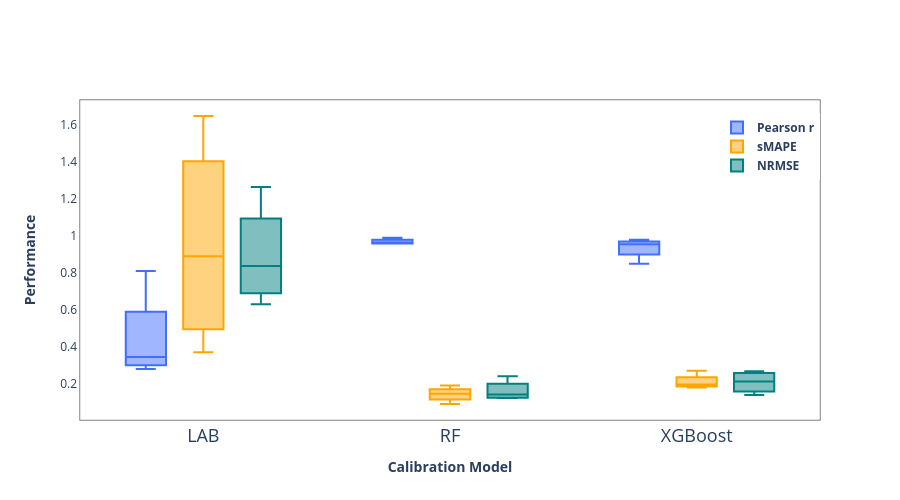

In [730]:
import chart_studio.plotly
import plotly.express as px
from IPython.display import Image
import plotly.graph_objects as go
import numpy as np

LAB_PR=[Pearson_lab_CO,Pearson_lab_NO2,Pearson_lab_SO2,Pearson_lab_O3]
LR_PR=[Pearson_lr_CO,Pearson_lr_NO2,Pearson_lr_SO2,Pearson_lr_O3]
SVR_PR=[Pearson_svr_CO,Pearson_svr_NO2,Pearson_svr_SO2,Pearson_svr_O3]
RF_PR=[Pearson_rf_CO,Pearson_rf_NO2,Pearson_rf_SO2,Pearson_rf_O3]
ANN_PR=[Pearson_ann_CO,Pearson_ann_NO2,Pearson_ann_SO2,Pearson_ann_O3]
XGB_PR=[Pearson_xgb_CO,Pearson_xgb_NO2,Pearson_xgb_SO2,Pearson_xgb_O3]


LAB_SM=[sMAPE_lab_CO,sMAPE_lab_NO2,sMAPE_lab_SO2,sMAPE_lab_O3]
LR_SM=[sMAPE_lr_CO,sMAPE_lr_NO2,sMAPE_lr_SO2,sMAPE_lr_O3]
SVR_SM=[sMAPE_svr_CO,sMAPE_svr_NO2,sMAPE_svr_SO2,sMAPE_svr_O3]
RF_SM=[sMAPE_rf_CO,sMAPE_rf_NO2,sMAPE_rf_SO2,sMAPE_rf_O3]
ANN_SM=[sMAPE_ann_CO,sMAPE_ann_NO2,sMAPE_ann_SO2,sMAPE_ann_O3]
XGB_SM=[sMAPE_xgb_CO,sMAPE_xgb_NO2,sMAPE_xgb_SO2,sMAPE_xgb_O3]

LAB_RM=[RMSE_lab_CO,RMSE_lab_NO2,RMSE_lab_SO2,RMSE_lab_O3]
LR_RM=[RMSE_lr_CO,RMSE_lr_NO2,RMSE_lr_SO2,RMSE_lr_O3]
SVR_RM=[RMSE_svr_CO,RMSE_svr_NO2,RMSE_svr_SO2,RMSE_svr_O3]
RF_RM=[RMSE_rf_CO,RMSE_rf_NO2,RMSE_rf_SO2,RMSE_rf_O3]
ANN_RM=[RMSE_ann_CO,RMSE_ann_NO2,RMSE_ann_SO2,RMSE_ann_O3]
XGB_RM=[RMSE_xgb_CO,RMSE_xgb_NO2,RMSE_xgb_SO2,RMSE_xgb_O3]

PR=LAB_PR+RF_PR+XGB_PR
SM=LAB_SM+RF_SM+XGB_SM
RM=LAB_RM+RF_RM+XGB_RM
x1=['LAB' for i in range(4)]
x2=['LR' for i in range(4)]
x3=['SVR' for i in range(4)]
x4=['RF' for i in range(4)]
x5=['ANN' for i in range(4)]
x6=['XGBoost' for i in range(4)]


x=x1+x4+x6
fig = go.Figure() 

# Defining x axis
x = x
fig.add_trace(go.Box(
  
    # defining y axis in corresponding
    # to x-axis
    y=PR,
    x=x,
    name='<b>Pearson r</b>',
    marker_color='#426eff'
))
  
fig.add_trace(go.Box(
    y=SM,
    x=x,
    name='<b>sMAPE</b>',
    marker_color='orange'

))
fig.add_trace(go.Box(
    y=RM,
    x=x,
    name='<b>NRMSE</b>',
    marker_color='teal'

))

fig.update_layout(autosize=False,
    width=900,
    height=500,
                  
  legend=dict(
    yanchor="bottom",
    y=0.75,
    xanchor="right",
    x=1),
    # group together boxes of the different
    # traces for each value of x
    boxmode='group',
                   plot_bgcolor='rgba(0,0,0,0)'
                  )

fig.update_xaxes(title_text="<b>Calibration Model</b>",tickfont = dict(size=18),showgrid=False,showline=True, 
                 linewidth=0.5, linecolor='black',mirror=True)
fig.update_yaxes(title_text="<b>Performance</b>",showgrid=False,showline=True, linewidth=0.5, linecolor='black',
                 mirror=True)
chart_studio.plotly.sign_in('vinylango', 'gybbJVWfRSUoTcRRSa6J')
chart_studio.plotly.image.save_as(fig, filename='models_boxplot.png')
Image('models_boxplot.png')

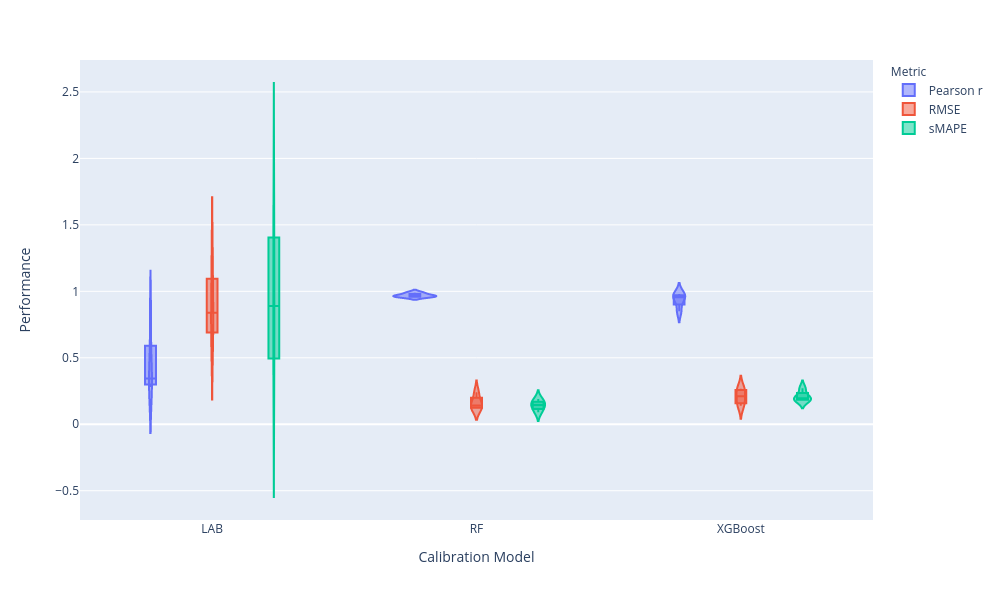

In [731]:
#Violin plot which also show the density of the distribution
import plotly.express as px
Metric1=['Pearson r' for i in range(len(PR))]
Metric2=['RMSE' for i in range(len(RM))]
Metric3=['sMAPE' for i in range(len(RM))]
Metric=Metric1+Metric2+Metric3
Model=x+x+x
Values=PR+RM+SM
lst=[[Model[i],Values[i],Metric[i]] for i in range(len(Model))]
df = pd.DataFrame(lst, columns =['Calibration Model', 'Performance','Metric'])

#fig = px.violin( df,y="Performance", x="Calibration Model", color='Metric', box=True,points="all",
          #hover_data=df.columns)
fig = px.violin( df,y="Performance", x="Calibration Model", color='Metric', box=True,
          hover_data=df.columns)


fig.update_layout(autosize=False,
    width=1000,
    height=600)
#fig.show()
chart_studio.plotly.sign_in('vinylango', 'gybbJVWfRSUoTcRRSa6J')
chart_studio.plotly.image.save_as(fig, filename='models_violinplots.png')
Image('models_violinplots.png')

## Target Diagrams

In [732]:
theta = np.linspace( 0 , 2 * np.pi , 150 )
 
radius = 1
 
a = radius * np.cos( theta )
b = radius * np.sin( theta )
CRMSE_LAB=[CRMSE_LAB_O3,CRMSE_LAB_CO,CRMSE_LAB_NO2,CRMSE_LAB_SO2]
CRMSE_LR=[CRMSE_LR_O3,CRMSE_LR_CO,CRMSE_LR_NO2,CRMSE_LR_SO2]
CRMSE_SVR=[CRMSE_SVR_O3,CRMSE_SVR_CO,CRMSE_SVR_NO2,CRMSE_SVR_SO2]
CRMSE_RF=[CRMSE_RF_O3,CRMSE_RF_CO,CRMSE_RF_NO2,CRMSE_RF_SO2]
CRMSE_ANN=[CRMSE_ANN_O3,CRMSE_ANN_CO,CRMSE_ANN_NO2,CRMSE_ANN_SO2]
CRMSE_XGB=[CRMSE_XGB_O3,CRMSE_XGB_CO,CRMSE_XGB_NO2,CRMSE_XGB_SO2]

MBE_LAB=[MBE_LAB_O3,MBE_LAB_CO,MBE_LAB_NO2,MBE_LAB_SO2]
MBE_LR=[MBE_LR_O3,MBE_LR_CO,MBE_LR_NO2,MBE_LR_SO2]
MBE_SVR=[MBE_SVR_O3,MBE_SVR_CO,MBE_SVR_NO2,MBE_SVR_SO2]
MBE_RF=[MBE_RF_O3,MBE_RF_CO,MBE_RF_NO2,MBE_RF_SO2]
MBE_ANN=[MBE_ANN_O3,MBE_ANN_CO,MBE_ANN_NO2,MBE_ANN_SO2]
MBE_XGB=[MBE_XGB_O3,MBE_XGB_CO,MBE_XGB_NO2,MBE_XGB_SO2]


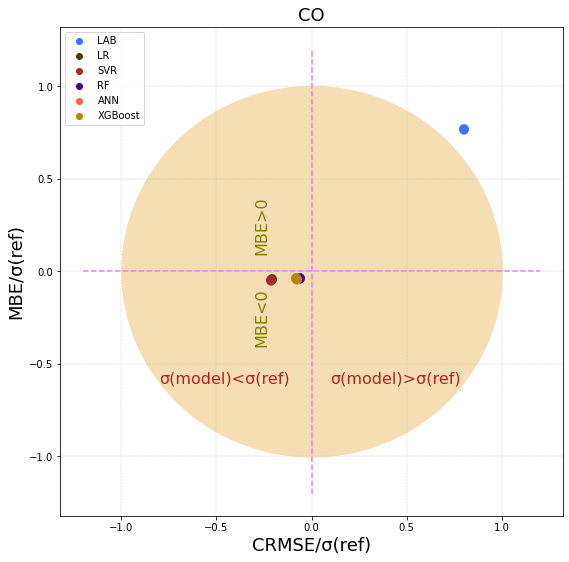

In [733]:
fig= plt.figure(figsize=(9,9))
ax = fig.add_subplot(111)
#ax.patch.set_facecolor('lightblue')
#ax.patch.set_alpha(0.3)
plt.text(CRMSE_LAB[0],MBE_LAB[0] , '•', rotation=90, va='center',fontsize = 36, color='#426eff')
plt.text(CRMSE_LR[0],MBE_LR[0] , '•', rotation=90, va='center',fontsize = 36, color='#513e00')
plt.text(CRMSE_SVR[0],MBE_SVR[0] , '•', rotation=90, va='center',fontsize = 36, color='brown')
plt.text(CRMSE_RF[0],MBE_RF[0] , '•', rotation=90, va='center',fontsize = 36, color='indigo')
plt.text(CRMSE_ANN[0],MBE_ANN[0] , '•', rotation=90, va='center',fontsize = 36, color='tomato')
plt.text(CRMSE_XGB[0],MBE_XGB[0] , '•', rotation=90, va='center',fontsize = 36, color='darkgoldenrod')
plt.scatter(CRMSE_LAB[2]/1.1,MBE_LAB[2],color='#426eff')
plt.scatter(CRMSE_LR,MBE_LR,color='#513e00')
plt.scatter(CRMSE_SVR[0],MBE_SVR[0],color='brown')
plt.scatter(CRMSE_RF,MBE_RF,color='indigo')
plt.scatter(CRMSE_ANN,MBE_ANN,color='tomato')
plt.scatter(CRMSE_XGB,MBE_XGB,color='darkgoldenrod')
plt.legend(['LAB','LR','SVR','RF','ANN','XGBoost'],loc = 2, bbox_to_anchor = (0,1))

plt.Circle((0, 0), 1, color='wheat')
plt.vlines([0], -1.2, 1.2, linestyles='dashed',color='violet')
plt.hlines([0], -1.2, 1.2, linestyles='dashed', color='violet')
plt.text(-0.8, -0.6, 'σ(model)<σ(ref)', fontsize = 16, color='firebrick')
plt.text(0.1, -0.6, 'σ(model)>σ(ref)', fontsize = 16, color='firebrick')
plt.text(-0.3, -0.25, 'MBE<0', rotation=90, va='center',fontsize = 16, color='olive')
plt.text(-0.3, 0.25, 'MBE>0', rotation=90, va='center',fontsize = 16, color='olive')
plt.fill_between(a, b, color='wheat')
plt.xlabel('CRMSE/σ(ref)',fontsize=18)
plt.ylabel('MBE/σ(ref)',fontsize=18)
plt.title('CO',fontsize=18)
plt.grid(linestyle='-.',linewidth=0.3)
plt.show()

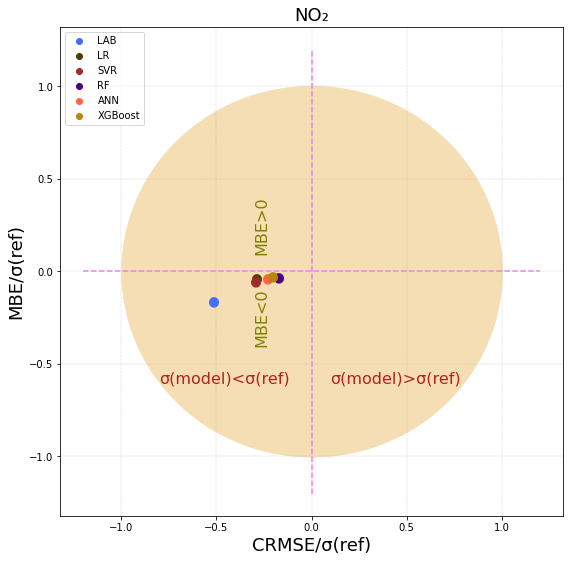

In [734]:
fig= plt.figure(figsize=(9,9))
ax = fig.add_subplot(111)
#ax.patch.set_facecolor('lightblue')
#ax.patch.set_alpha(0.3)
plt.text(CRMSE_LAB[1],MBE_LAB[1] , '•', rotation=90, va='center',fontsize = 36, color='#426eff')
plt.text(CRMSE_LR[1],MBE_LR[1] , '•', rotation=90, va='center',fontsize = 36, color='#513e00')
plt.text(CRMSE_SVR[1],MBE_SVR[1] , '•', rotation=90, va='center',fontsize = 36, color='brown')
plt.text(CRMSE_RF[1],MBE_RF[1] , '•', rotation=90, va='center',fontsize = 36, color='indigo')
plt.text(CRMSE_ANN[1],MBE_ANN[1] , '•', rotation=90, va='center',fontsize = 36, color='tomato')
plt.text(CRMSE_XGB[1],MBE_XGB[1] , '•', rotation=90, va='center',fontsize = 36, color='darkgoldenrod')
plt.scatter(CRMSE_LAB[2]/1.1,MBE_LAB[2],color='#426eff')
plt.scatter(CRMSE_LR,MBE_LR,color='#513e00')
plt.scatter(CRMSE_SVR[0],MBE_SVR[0],color='brown')
plt.scatter(CRMSE_RF,MBE_RF,color='indigo')
plt.scatter(CRMSE_ANN,MBE_ANN,color='tomato')
plt.scatter(CRMSE_XGB,MBE_XGB,color='darkgoldenrod')
plt.legend(['LAB','LR','SVR','RF','ANN','XGBoost'],loc = 2, bbox_to_anchor = (0,1))
plt.Circle((0, 0), 1, color='wheat')
plt.vlines([0], -1.2, 1.2, linestyles='dashed',color='violet')
plt.hlines([0], -1.2, 1.2, linestyles='dashed', color='violet')
plt.text(-0.8, -0.6, 'σ(model)<σ(ref)', fontsize = 16, color='firebrick')
plt.text(0.1, -0.6, 'σ(model)>σ(ref)', fontsize = 16, color='firebrick')
plt.text(-0.3, -0.25, 'MBE<0', rotation=90, va='center',fontsize = 16, color='olive')
plt.text(-0.3, 0.25, 'MBE>0', rotation=90, va='center',fontsize = 16, color='olive')
plt.fill_between(a, b, color='wheat')
plt.xlabel('CRMSE/σ(ref)',fontsize=18)
plt.ylabel('MBE/σ(ref)',fontsize=18)
plt.title('NO2'.translate(subscript),fontsize=18)
plt.grid(linestyle='-.',linewidth=0.3)
plt.show()

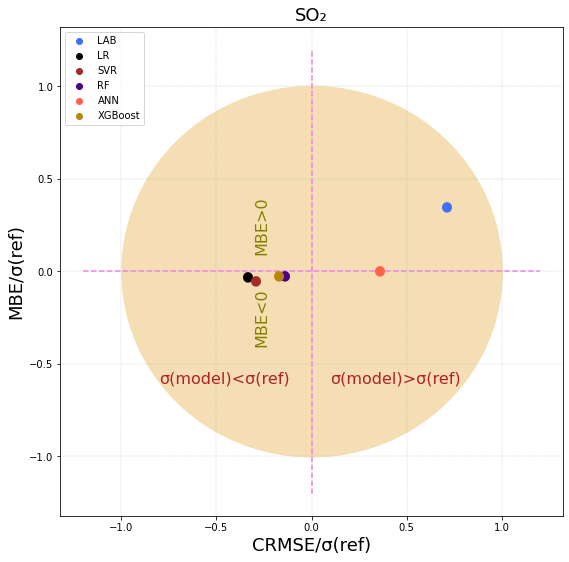

In [735]:
fig= plt.figure(figsize=(9,9))
ax = fig.add_subplot(111)
#ax.patch.set_facecolor('lightblue')
#ax.patch.set_alpha(0.3)
plt.text(CRMSE_LAB[2],MBE_LAB[2] , '•', rotation=90, va='center',fontsize = 36, color='#426eff')
plt.text(CRMSE_LR[2],MBE_LR[2] , '•', rotation=90, va='center',fontsize = 36, color='black')
plt.text(CRMSE_SVR[2],MBE_SVR[2] , '•', rotation=90, va='center',fontsize = 36, color='brown')
plt.text(CRMSE_RF[2],MBE_RF[2] , '•', rotation=90, va='center',fontsize = 36, color='indigo')
plt.text(CRMSE_ANN[2],MBE_ANN[2] , '•', rotation=90, va='center',fontsize = 36, color='tomato')
plt.text(CRMSE_XGB[2],MBE_XGB[2] , '•', rotation=90, va='center',fontsize = 36, color='darkgoldenrod')
plt.scatter(CRMSE_LAB[2]/1.1,MBE_LAB[2],color='#426eff')
plt.scatter(CRMSE_LR,MBE_LR,color='black')
plt.scatter(CRMSE_SVR[0],MBE_SVR[0],color='brown')
plt.scatter(CRMSE_RF,MBE_RF,color='indigo')
plt.scatter(CRMSE_ANN,MBE_ANN,color='tomato')
plt.scatter(CRMSE_XGB,MBE_XGB,color='darkgoldenrod')
plt.legend(['LAB','LR','SVR','RF','ANN','XGBoost'],loc = 2, bbox_to_anchor = (0,1))
plt.Circle((0, 0), 1, color='wheat')
plt.vlines([0], -1.2, 1.2, linestyles='dashed',color='violet')
plt.hlines([0], -1.2, 1.2, linestyles='dashed', color='violet')
plt.text(-0.8, -0.6, 'σ(model)<σ(ref)', fontsize = 16, color='firebrick')
plt.text(0.1, -0.6, 'σ(model)>σ(ref)', fontsize = 16, color='firebrick')
plt.text(-0.3, -0.25, 'MBE<0', rotation=90, va='center',fontsize = 16, color='olive')
plt.text(-0.3, 0.25, 'MBE>0', rotation=90, va='center',fontsize = 16, color='olive')
plt.fill_between(a, b, color='wheat')
plt.xlabel('CRMSE/σ(ref)',fontsize=18)
plt.ylabel('MBE/σ(ref)',fontsize=18)
plt.title('SO2'.translate(subscript),fontsize=18)
plt.grid(linestyle='-.',linewidth=0.3)
plt.show()

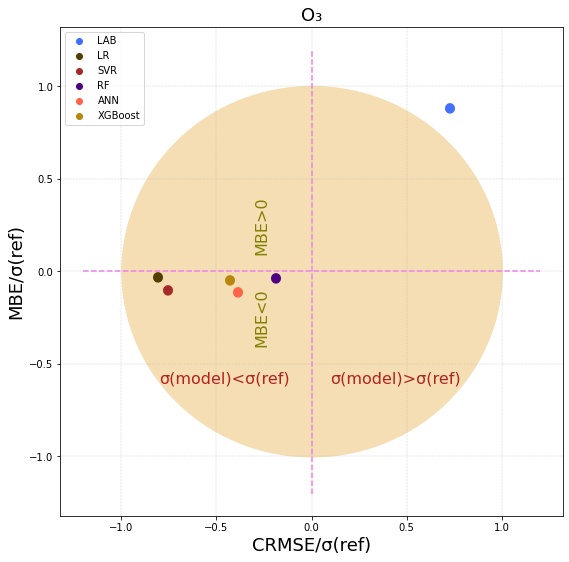

<Figure size 432x288 with 0 Axes>

In [736]:
fig= plt.figure(figsize=(9,9))
ax = fig.add_subplot(111)
#ax.patch.set_facecolor('lightblue')
#ax.patch.set_alpha(0.3)
plt.text(CRMSE_LAB[3],MBE_LAB[3]/1.5 , '•', rotation=90, va='center',fontsize = 36, color='#426eff')
plt.text(CRMSE_LR[3],MBE_LR[3] , '•', rotation=90, va='center',fontsize = 36, color='#513e00')
plt.text(CRMSE_SVR[3],MBE_SVR[3] , '•', rotation=90, va='center',fontsize = 36, color='brown')
plt.text(CRMSE_RF[3],MBE_RF[3] , '•', rotation=90, va='center',fontsize = 36, color='indigo')
plt.text(CRMSE_ANN[3],MBE_ANN[3] , '•', rotation=90, va='center',fontsize = 36, color='tomato')
plt.text(CRMSE_XGB[3],MBE_XGB[3] , '•', rotation=90, va='center',fontsize = 36, color='darkgoldenrod')
plt.scatter(CRMSE_LAB[2]/1.1,MBE_LAB[2]/1.7,color='#426eff')
plt.scatter(CRMSE_LR,MBE_LR,color='#513e00')
plt.scatter(CRMSE_SVR[0],MBE_SVR[0],color='brown')
plt.scatter(CRMSE_RF,MBE_RF,color='indigo')
plt.scatter(CRMSE_ANN,MBE_ANN,color='tomato')
plt.scatter(CRMSE_XGB,MBE_XGB,color='darkgoldenrod')
plt.legend(['LAB','LR','SVR','RF','ANN','XGBoost'],loc = 2, bbox_to_anchor = (0,1))
plt.Circle((0, 0), 1, color='wheat')
plt.vlines([0], -1.2, 1.2, linestyles='dashed',color='violet')
plt.hlines([0], -1.2, 1.2, linestyles='dashed', color='violet')
plt.text(-0.8, -0.6, 'σ(model)<σ(ref)', fontsize = 16, color='firebrick')
plt.text(0.1, -0.6, 'σ(model)>σ(ref)', fontsize = 16, color='firebrick')
plt.text(-0.3, -0.25, 'MBE<0', rotation=90, va='center',fontsize = 16, color='olive')
plt.text(-0.3, 0.25, 'MBE>0', rotation=90, va='center',fontsize = 16, color='olive')
plt.fill_between(a, b, color='wheat')
plt.xlabel('CRMSE/σ(ref)',fontsize=18)
plt.ylabel('MBE/σ(ref)',fontsize=18)
plt.title('O3'.translate(subscript),fontsize=18)
plt.grid(linestyle='-.',linewidth=0.3)
plt.show()
plt.savefig("Target2.pdf", format="pdf", bbox_inches="tight")

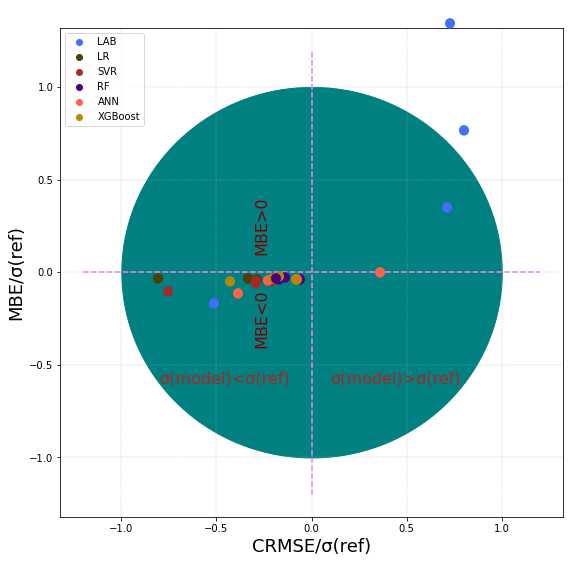

In [737]:
fig= plt.figure(figsize=(9,9))
ax = fig.add_subplot(111)
#ax.patch.set_facecolor('lightblue')
#ax.patch.set_alpha(0.3)
for i in range(4):
    plt.text(CRMSE_LAB[i],MBE_LAB[i] , '•', rotation=90, va='center',fontsize = 36, color='#426eff')
    plt.text(CRMSE_LR[i],MBE_LR[i] , '•', rotation=90, va='center',fontsize = 36, color='#513e00')
    plt.text(CRMSE_SVR[i],MBE_SVR[i] , '•', rotation=90, va='center',fontsize = 36, color='brown')
    plt.text(CRMSE_RF[i],MBE_RF[i] , '•', rotation=90, va='center',fontsize = 36, color='indigo')
    plt.text(CRMSE_ANN[i],MBE_ANN[i] , '•', rotation=90, va='center',fontsize = 36, color='tomato')
    plt.text(CRMSE_XGB[i],MBE_XGB[i] , '•', rotation=90, va='center',fontsize = 36, color='darkgoldenrod')
plt.scatter(CRMSE_LAB[2]-0.2,MBE_LAB[2],color='#426eff')
plt.scatter(CRMSE_LR,MBE_LR,color='#513e00')
plt.scatter(CRMSE_SVR,MBE_SVR,color='brown')
plt.scatter(CRMSE_RF,MBE_RF,color='indigo')
plt.scatter(CRMSE_ANN,MBE_ANN,color='tomato')
plt.scatter(CRMSE_XGB,MBE_XGB,color='darkgoldenrod')
plt.legend(['LAB','LR','SVR','RF','ANN','XGBoost'],loc = 2, bbox_to_anchor = (0,1))
plt.vlines([0], -1.2, 1.2, linestyles='dashed',color='violet')
plt.hlines([0], -1.2, 1.2, linestyles='dashed', color='violet')
plt.text(-0.8, -0.6, 'σ(model)<σ(ref)', fontsize = 16, color='firebrick')
plt.text(0.1, -0.6, 'σ(model)>σ(ref)', fontsize = 16, color='firebrick')
plt.text(-0.3, -0.25, 'MBE<0', rotation=90, va='center',fontsize = 16, color='maroon')
plt.text(-0.3, 0.25, 'MBE>0', rotation=90, va='center',fontsize = 16, color='maroon')
plt.fill_between(a, b, color='teal')
plt.xlabel('CRMSE/σ(ref)',fontsize=18)
plt.ylabel('MBE/σ(ref)',fontsize=18)
#plt.title('Overal',fontsize=18)
plt.grid(linestyle='-.',linewidth=0.3)
plt.show()

## Feature Importance

# libraries
import numpy as np
import matplotlib.pyplot as plt
fig= plt.figure(figsize=(10,5)) 
# set width of bars
ax = fig.add_subplot(111)
ax.patch.set_facecolor('lightblue')
ax.patch.set_alpha(0.3)
barWidth = 0.15
 
# set heights of bars
Signal1 = [features_CO[0],features_NO2[0],features_SO2[0],features_O3[0]]
Signal2 = [features_CO[1],features_NO2[1],features_SO2[1],features_O3[1]]
Signal3 = [features_CO[2],features_NO2[2],features_SO2[2],features_O3[2]]
Signal4 = [features_CO[3],features_NO2[3],features_SO2[3],features_O3[3]]
Temp = [features_CO[4],features_NO2[4],features_SO2[4],features_O3[4]]
RH = [features_CO[5],features_NO2[5],features_SO2[5],features_O3[5]]


 
# Set position of bar on X axis
r1 = np.arange(len(Signal1))
r2 = [x + barWidth for x in r1]
r3 = [x + barWidth for x in r2]
r4 = [x + barWidth for x in r3]
r5 = [x + barWidth for x in r4]
r6 = [x + barWidth for x in r5]
 
 
# Make the plot
plt.bar(r1, Signal1, color='magenta', width=barWidth, edgecolor='white', label='CO')
plt.bar(r2, Signal2, color='teal', width=barWidth, edgecolor='white', label='NO2')
plt.bar(r3, Signal3, color='salmon', width=barWidth, edgecolor='white', label='SO2')
plt.bar(r4, Signal4, color='rebeccapurple', width=barWidth, edgecolor='white', label='O3')
plt.bar(r5, Temp, color='olive', width=barWidth, edgecolor='white', label='Temperature')
plt.bar(r6, RH, color='darkgoldenrod', width=barWidth, edgecolor='white', label='RH')
 
# Add xticks on the middle of the group bars
plt.xlabel('Sensor', fontweight='bold')
plt.ylabel('Feature Importance', fontweight='bold')
plt.xticks([r + barWidth+0.25 for r in range(len(Signal1))], ['CO', 'NO2', 'SO2', 'O3'])
 
# Create legend & Show graphic
plt.legend()
plt.grid(linestyle='-.',linewidth=0.3)
plt.show()

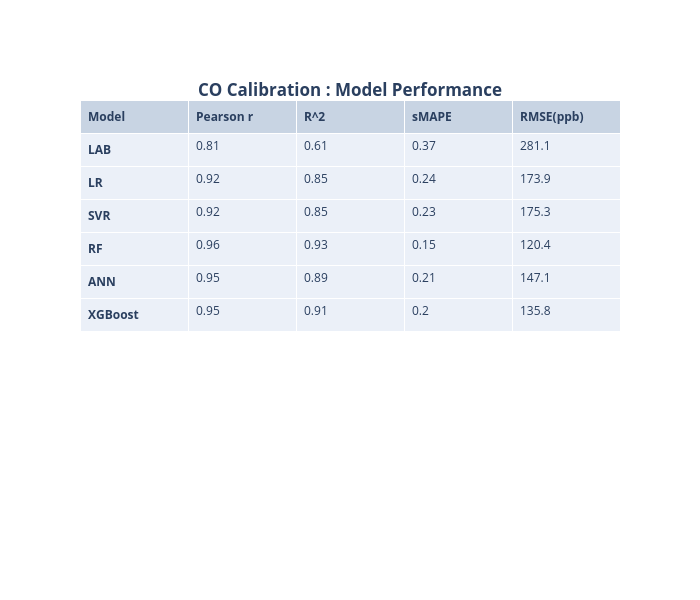

In [738]:
import plotly.graph_objects as go
import pandas as pd
model=['<b>LAB</b>','<b>LR</b>','<b>SVR</b>','<b>RF</b>','<b>ANN</b>','<b>XGBoost</b>']
Pearson=[Pearson_lab_CO,Pearson_lr_CO,Pearson_svr_CO,Pearson_rf_CO,Pearson_ann_CO,Pearson_xgb_CO]
         
R2=[R2_lab_CO,R2_lr_CO,R2_svr_CO,R2_rf_CO,R2_ann_CO,R2_xgb_CO]
RMSE=[RMSE_Lab_CO,RMSE_Lr_CO,RMSE_Svr_CO,RMSE_Rf_CO,RMSE_Ann_CO,RMSE_Xgb_CO]
sMAPE=[sMAPE_lab_CO,sMAPE_lr_CO,sMAPE_svr_CO,sMAPE_rf_CO,sMAPE_ann_CO,sMAPE_xgb_CO]

fig = go.Figure(data=[go.Table(
    header=dict(values=['<b>Model</b>','<b>Pearson r</b>','<b>R^2</b>','<b>sMAPE</b>','<b>RMSE(ppb)</b>'],
                #fill_color='white',
                align='left'),
    cells=dict(values=[model,Pearson,R2,sMAPE,RMSE ],
               #fill_color='white',
               align='left'))
   ])

fig.update_layout(
title={'text': "<b>CO Calibration : Model Performance</b>",
        'y':0.86,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'},
width=700,
height=600,
)
fig.show()
chart_studio.plotly.sign_in('vinylango', 'gybbJVWfRSUoTcRRSa6J')
chart_studio.plotly.image.save_as(fig, filename='models_performance_CO.png')
Image('models_performance_CO.png')


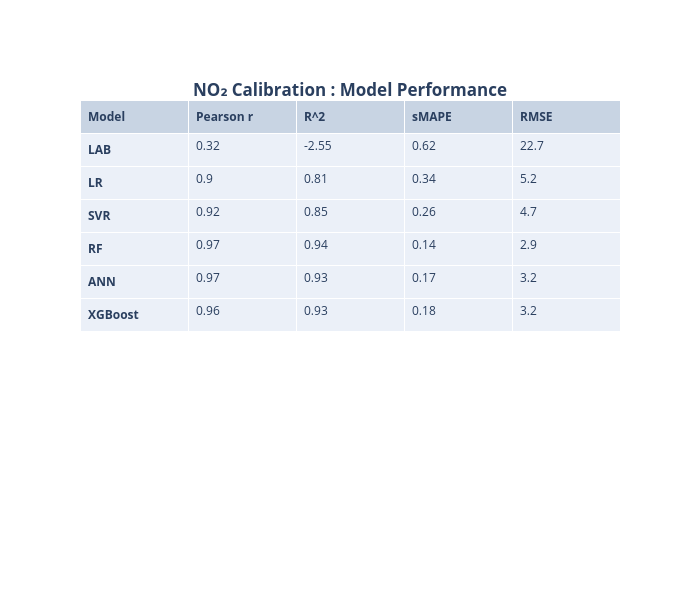

In [739]:
import plotly.graph_objects as go
import pandas as pd
model=['<b>LAB</b>','<b>LR</b>','<b>SVR</b>','<b>RF</b>','<b>ANN</b>','<b>XGBoost</b>']
Pearson=[Pearson_lab_NO2,Pearson_lr_NO2,Pearson_svr_NO2,Pearson_rf_NO2,Pearson_ann_NO2,Pearson_xgb_NO2]
R2=[R2_lab_NO2,R2_lr_NO2,R2_svr_NO2,R2_rf_NO2,R2_ann_NO2,R2_xgb_NO2]
RMSE=[RMSE_Lab_NO2,RMSE_Lr_NO2,RMSE_Svr_NO2,RMSE_Rf_NO2,RMSE_Ann_NO2,RMSE_Xgb_NO2]
sMAPE=[sMAPE_lab_NO2,sMAPE_lr_NO2,sMAPE_svr_NO2,sMAPE_rf_NO2,sMAPE_ann_NO2,sMAPE_xgb_NO2]

fig = go.Figure(data=[go.Table(
    header=dict(values=['<b>Model</b>','<b>Pearson r</b>','<b>R^2</b>','<b>sMAPE</b>','<b>RMSE</b>'],
                #fill_color='paleturquoise',
                align='left'),
    cells=dict(values=[model,Pearson,R2,sMAPE,RMSE ],
               #fill_color='lavender',
               align='left'))
   ])
fig.update_layout(
title={'text': "<b>NO2 Calibration : Model Performance</b>".translate(subscript),
        'y':0.86,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'},
width=700,
height=600,

)
fig.show()
chart_studio.plotly.sign_in('vinylango', 'gybbJVWfRSUoTcRRSa6J')
chart_studio.plotly.image.save_as(fig, filename='models_performance_NO2.png')
Image('models_performance_NO2.png')

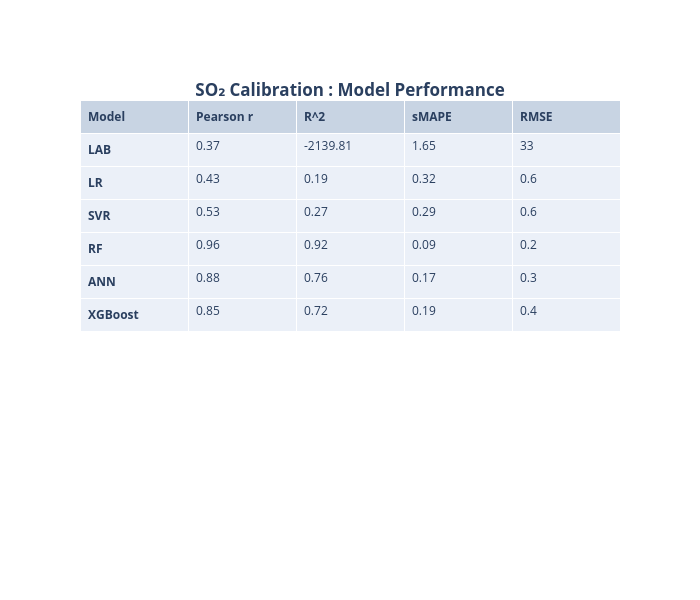

In [740]:
import plotly.graph_objects as go
import pandas as pd
model=['<b>LAB</b>','<b>LR</b>','<b>SVR</b>','<b>RF</b>','<b>ANN</b>','<b>XGBoost</b>']
Pearson=[Pearson_lab_SO2,Pearson_lr_SO2,Pearson_svr_SO2,Pearson_rf_SO2,Pearson_ann_SO2,Pearson_xgb_SO2]
R2=[R2_lab_SO2,R2_lr_SO2,R2_svr_SO2,R2_rf_SO2,R2_ann_SO2,R2_xgb_SO2,]
RMSE=[RMSE_Lab_SO2,RMSE_Lr_SO2,RMSE_Svr_SO2,RMSE_Rf_SO2,RMSE_Ann_SO2,RMSE_Xgb_SO2]
sMAPE=[sMAPE_lab_SO2,sMAPE_lr_SO2,sMAPE_svr_SO2,sMAPE_rf_SO2,sMAPE_ann_SO2,sMAPE_xgb_SO2]

fig = go.Figure(data=[go.Table(
    header=dict(values=['<b>Model</b>','<b>Pearson r</b>','<b>R^2</b>','<b>sMAPE</b>','<b>RMSE</b>'],
                #fill_color='paleturquoise',
                align='left'),
    cells=dict(values=[model,Pearson,R2,sMAPE,RMSE ],
               #fill_color='lavender',
               align='left'))
   ])
fig.update_layout(
title={'text': "<b>SO2 Calibration : Model Performance</b>".translate(subscript),
        'y':0.86,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'},
width=700,
height=600,

)
fig.show()
chart_studio.plotly.sign_in('vinylango', 'gybbJVWfRSUoTcRRSa6J')
chart_studio.plotly.image.save_as(fig, filename='models_performance_SO2.png')
Image('models_performance_SO2.png')

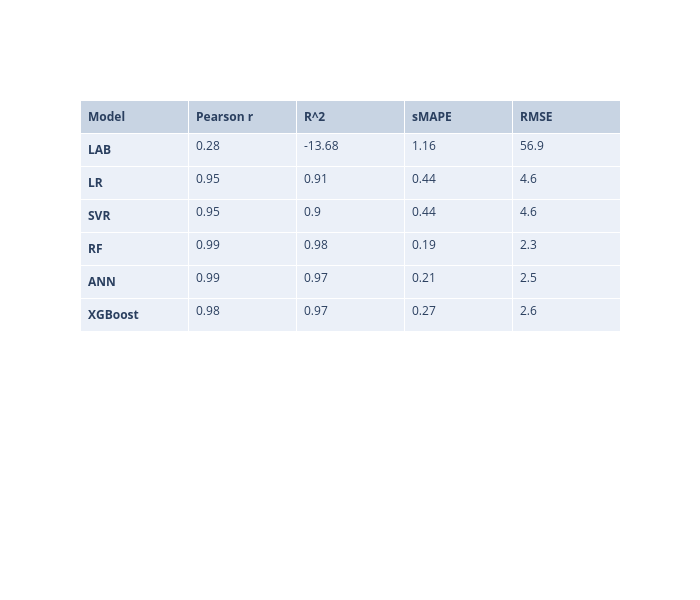

In [741]:
import plotly.graph_objects as go
import pandas as pd
model=['<b>LAB</b>','<b>LR</b>','<b>SVR</b>','<b>RF</b>','<b>ANN</b>','<b>XGBoost</b>']
Pearson=[str(Pearson_lab_O3),Pearson_lr_O3,Pearson_svr_O3,Pearson_rf_O3,Pearson_ann_O3,Pearson_xgb_O3]
R2=[R2_lab_O3,R2_lr_O3,R2_svr_O3,R2_rf_O3,R2_ann_O3,R2_xgb_O3]
RMSE=[RMSE_Lab_O3,RMSE_Lr_O3,RMSE_Svr_O3,RMSE_Rf_O3,RMSE_Ann_O3,RMSE_Xgb_O3]
sMAPE=[sMAPE_lab_O3,sMAPE_lr_O3,sMAPE_svr_O3,sMAPE_rf_O3,sMAPE_ann_O3,sMAPE_xgb_O3]

fig = go.Figure(data=[go.Table(
    header=dict(values=['<b>Model</b>','<b>Pearson r</b>','<b>R^2</b>','<b>sMAPE</b>','<b>RMSE</b>'],
                #fill_color='paleturquoise',
                align='left'),
    cells=dict(values=[model,Pearson,R2,sMAPE,RMSE ],
               #fill_color='lavender',
               align='left'))
   ])
fig.update_layout(
title={#'text': "<b>O3 Calibration : Model Performance</b>".translate(subscript),
        'y':0.86,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'},
width=700,
height=600,

)
fig.show()
chart_studio.plotly.sign_in('vinylango', 'gybbJVWfRSUoTcRRSa6J')
chart_studio.plotly.image.save_as(fig, filename='models_performance_O3.png')
Image('models_performance_O3.png')

In [742]:
Pearson_lab=np.array([Pearson_lab_CO,Pearson_lab_NO2,Pearson_lab_SO2,Pearson_lab_O3])
Pearson_lr=np.array([Pearson_lr_CO,Pearson_lr_NO2,Pearson_lr_SO2,Pearson_lr_O3])
Pearson_svr=np.array([Pearson_svr_CO,Pearson_svr_NO2,Pearson_svr_SO2,Pearson_svr_O3])
Pearson_rf=np.array([Pearson_rf_CO,Pearson_rf_NO2,Pearson_rf_SO2,Pearson_rf_O3])
Pearson_ann=np.array([Pearson_ann_CO,Pearson_ann_NO2,Pearson_ann_SO2,Pearson_ann_O3])
Pearson_xgb=np.array([Pearson_xgb_CO,Pearson_xgb_NO2,Pearson_xgb_SO2,Pearson_xgb_O3])
R2_lab=np.array([R2_lab_CO,R2_lab_NO2,R2_lab_SO2,R2_lab_O3])
R2_lr=np.array([R2_lr_CO,R2_lr_NO2,R2_lr_SO2,R2_lr_O3])
R2_svr=np.array([R2_svr_CO,R2_svr_NO2,R2_svr_SO2,R2_svr_O3])
R2_rf=np.array([R2_rf_CO,R2_rf_NO2,R2_rf_SO2,R2_rf_O3])
R2_ann=np.array([R2_ann_CO,R2_ann_NO2,R2_ann_SO2,R2_ann_O3])
R2_xgb=np.array([R2_xgb_CO,R2_xgb_NO2,R2_xgb_SO2,R2_xgb_O3])
RMSE_lab=np.array([RMSE_Lab_CO,RMSE_Lab_NO2,RMSE_Lab_SO2,RMSE_Lab_O3])
RMSE_lr=np.array([RMSE_Lr_CO,RMSE_Lr_NO2,RMSE_Lr_SO2,RMSE_Lr_O3])
RMSE_svr=np.array([RMSE_Svr_CO,RMSE_Svr_NO2,RMSE_Svr_SO2,RMSE_Svr_O3])
RMSE_rf=np.array([RMSE_Rf_CO,RMSE_Rf_NO2,RMSE_Rf_SO2,RMSE_Rf_O3])
RMSE_ann=np.array([RMSE_Ann_CO,RMSE_Ann_NO2,RMSE_Ann_SO2,RMSE_Ann_O3])
RMSE_xgb=np.array([RMSE_Xgb_CO,RMSE_Xgb_NO2,RMSE_Xgb_SO2,RMSE_Xgb_O3])
sMAPE_lab=np.array([sMAPE_lab_CO,sMAPE_lab_NO2,sMAPE_lab_SO2,sMAPE_lab_O3])
sMAPE_lr=np.array([sMAPE_lr_CO,sMAPE_lr_NO2,sMAPE_lr_SO2,sMAPE_lr_O3])
sMAPE_svr=np.array([sMAPE_svr_CO,sMAPE_svr_NO2,sMAPE_svr_SO2,sMAPE_svr_O3])
sMAPE_rf=np.array([sMAPE_rf_CO,sMAPE_rf_NO2,sMAPE_rf_SO2,sMAPE_rf_O3])
sMAPE_ann=np.array([sMAPE_ann_CO,sMAPE_ann_NO2,sMAPE_ann_SO2,sMAPE_ann_O3])
sMAPE_xgb=np.array([sMAPE_xgb_CO,sMAPE_xgb_NO2,sMAPE_xgb_SO2,sMAPE_xgb_O3])
Pearson_lab_mean=round(np.mean(Pearson_lab),2)
Pearson_lab_std=round(np.std(Pearson_lab),2)
Pearson_lr_mean=round(np.mean(Pearson_lr),2)
Pearson_lr_std=round(np.std(Pearson_lr),2)
Pearson_svr_mean=round(np.mean(Pearson_svr),2)
Pearson_svr_std=round(np.std(Pearson_svr),2)
Pearson_rf_mean=round(np.mean(Pearson_rf),2)
Pearson_rf_std=round(np.std(Pearson_rf),2)
Pearson_ann_mean=round(np.mean(Pearson_ann),2)
Pearson_ann_std=round(np.std(Pearson_ann),2)
Pearson_xgb_mean=round(np.mean(Pearson_xgb),2)
Pearson_xgb_std=round(np.std(Pearson_xgb),2)
R2_lab_mean=round(np.mean(R2_lab),2)
R2_lab_std=round(np.std(R2_lab),2)
R2_lr_mean=round(np.mean(R2_lr),2)
R2_lr_std=round(np.std(R2_lr),2)
R2_svr_mean=round(np.mean(R2_svr),2)
R2_svr_std=round(np.std(R2_svr),2)
R2_rf_mean=round(np.mean(R2_rf),2)
R2_rf_std=round(np.std(R2_rf),2)
R2_ann_mean=round(np.mean(R2_ann),2)
R2_ann_std=round(np.std(R2_ann),2)
R2_xgb_mean=round(np.mean(R2_xgb),2)
R2_xgb_std=round(np.std(R2_xgb),2)
RMSE_lab_mean=round(np.mean(RMSE_lab),2)
RMSE_lab_std=round(np.std(RMSE_lab),2)
RMSE_lr_mean=round(np.mean(RMSE_lr),2)
RMSE_lr_std=round(np.std(RMSE_lr),2)
RMSE_svr_mean=round(np.mean(RMSE_svr),2)
RMSE_svr_std=round(np.std(RMSE_svr),2)
RMSE_rf_mean=round(np.mean(RMSE_rf),2)
RMSE_rf_std=round(np.std(RMSE_rf),2)
RMSE_ann_mean=round(np.mean(RMSE_ann),2)
RMSE_ann_std=round(np.std(RMSE_ann),2)
RMSE_xgb_mean=round(np.mean(RMSE_xgb),2)
RMSE_xgb_std=round(np.std(RMSE_xgb),2)
sMAPE_lab_mean=round(np.mean(sMAPE_lab),2)
sMAPE_lab_std=round(np.std(sMAPE_lab),2)
sMAPE_lr_mean=round(np.mean(sMAPE_lr),2)
sMAPE_lr_std=round(np.std(sMAPE_lr),2)
sMAPE_svr_mean=round(np.mean(sMAPE_svr),2)
sMAPE_svr_std=round(np.std(sMAPE_svr),2)
sMAPE_rf_mean=round(np.mean(sMAPE_rf),2)
sMAPE_rf_std=round(np.std(sMAPE_rf),2)
sMAPE_ann_mean=round(np.mean(sMAPE_ann),2)
sMAPE_ann_std=round(np.std(sMAPE_ann),2)
sMAPE_xgb_mean=round(np.mean(sMAPE_xgb),2)
sMAPE_xgb_std=round(np.std(sMAPE_xgb),2)

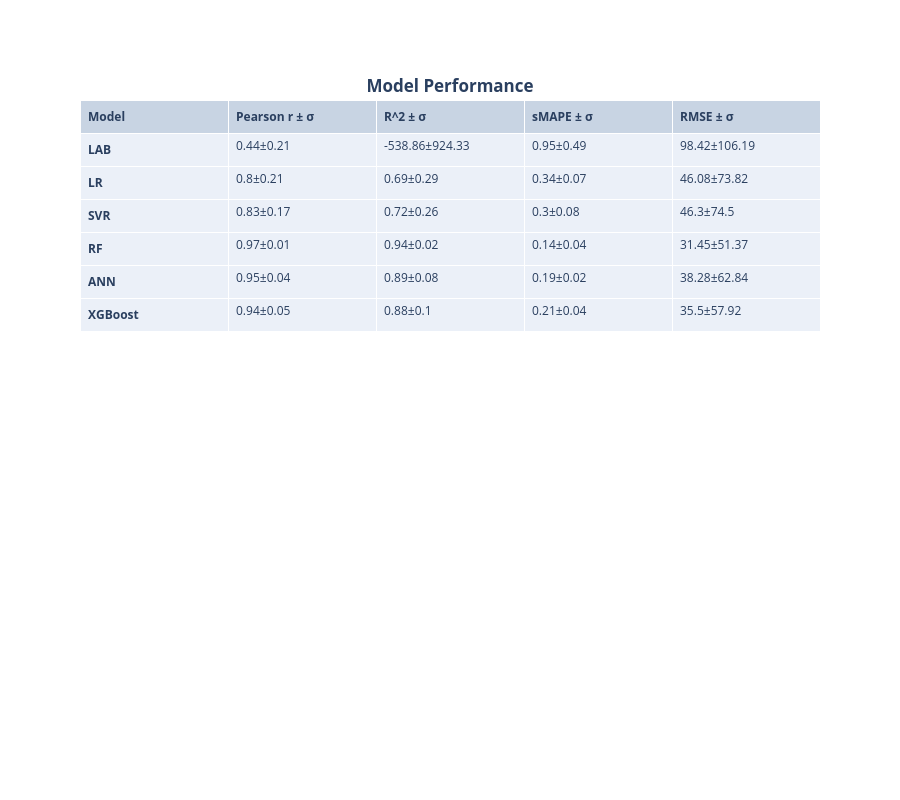

In [743]:
import plotly.graph_objects as go
import pandas as pd
model=['<b>LAB</b>','<b>LR</b>','<b>SVR</b>','<b>RF</b>','<b>ANN</b>','<b>XGBoost</b>']
Pearson=[str(Pearson_lab_mean)+ '±' +str(Pearson_lab_std),str(Pearson_lr_mean)+ '±' +str(Pearson_lr_std),
         str(Pearson_svr_mean)+ '±' +str(Pearson_svr_std),str(Pearson_rf_mean)+ '±' +str(Pearson_rf_std),
         str(Pearson_ann_mean)+ '±' +str(Pearson_ann_std),str(Pearson_xgb_mean)+ '±' +str(Pearson_xgb_std)]


R2=[str(R2_lab_mean)+ '±' +str(R2_lab_std),str(R2_lr_mean)+ '±' +str(R2_lr_std),
    str(R2_svr_mean)+ '±' +str(R2_svr_std),str(R2_rf_mean)+ '±' +str(R2_rf_std),
    str(R2_ann_mean)+ '±' +str(R2_ann_std),str(R2_xgb_mean)+ '±' +str(R2_xgb_std)]



RMSE=[str(RMSE_lab_mean)+ '±' +str(RMSE_lab_std),str(RMSE_lr_mean)+ '±' +str(RMSE_lr_std),
      str(RMSE_svr_mean)+ '±' +str(RMSE_svr_std),str(RMSE_rf_mean)+ '±' +str(RMSE_rf_std),
     str(RMSE_ann_mean)+ '±' +str(RMSE_ann_std),str(RMSE_xgb_mean)+ '±' +str(RMSE_xgb_std)]


sMAPE=[str(sMAPE_lab_mean)+ '±' +str(sMAPE_lab_std),str(sMAPE_lr_mean)+ '±' +str(sMAPE_lr_std),
       str(sMAPE_svr_mean)+ '±' +str(sMAPE_svr_std),str(sMAPE_rf_mean)+ '±' +str(sMAPE_rf_std),
       str(sMAPE_ann_mean)+ '±' +str(sMAPE_ann_std),str(sMAPE_xgb_mean)+ '±' +str(sMAPE_xgb_std)]

fig = go.Figure(data=[go.Table(
    header=dict(values=['<b>Model</b>','<b>Pearson r ± σ</b>','<b>R^2 ± σ</b> ','<b>sMAPE ± σ</b>','<b>RMSE ± σ</b>'],
                #fill_color='paleturquoise',
                align='left'),
    cells=dict(values=[model,Pearson,R2,sMAPE,RMSE ],
               #fill_color='lavender',
               align='left'))
   ])
fig.update_layout(
title={'text': "<b>Model Performance</b>",
        'y':0.9,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'},
width=900,
height=800,

)
fig.show()
chart_studio.plotly.sign_in('vinylango', 'gybbJVWfRSUoTcRRSa6J')
chart_studio.plotly.image.save_as(fig, filename='models_performance_O3.png')
Image('models_performance_O3.png')

In [744]:
import plotly.graph_objects as go
from functools import reduce
from itertools import product

z=[[Pearson_lab_CO,Pearson_lr_CO , Pearson_svr_CO, Pearson_rf_CO, Pearson_ann_CO,Pearson_xgb_CO], 
   [Pearson_lab_NO2,Pearson_lr_NO2 , Pearson_svr_NO2, Pearson_rf_NO2, Pearson_ann_NO2,Pearson_xgb_NO2], 
   [Pearson_lab_SO2,Pearson_lr_SO2 , Pearson_svr_SO2, Pearson_rf_SO2, Pearson_ann_SO2,Pearson_xgb_SO2],
  [Pearson_lab_O3,Pearson_lr_O3 , Pearson_svr_O3, Pearson_rf_O3, Pearson_ann_O3,Pearson_xgb_O3]]
x=['<b>LAB</b>', '<b>LR</b>', '<b>SVR</b>', '<b>RF</b>', '<b>ANN</b>','<b>XGBoost</b>']
y=['<b>CO</b>', '<b>NO2</b>'.translate(subscript), '<b>SO2</b>'.translate(subscript),'<b>O3</b>'.translate(subscript)]

def get_anno_text(z_value):
    annotations=[]
    a, b = len(z_value), len(z_value[0])
    flat_z = reduce(lambda x,y: x+y, z_value) # z_value.flat if you deal with numpy
    coords = product(range(a), range(b))
    for pos, elem in zip(coords, flat_z):
        annotations.append({'font': {'color': '#FFFFFF'},
                    'showarrow': False,
                    'text': str(elem),
                    'x': pos[1],
                    'y': pos[0]})
    return annotations

fig = go.Figure(data=go.Heatmap(
                   z=z,
                   x=x,
                   y=y,
                   hoverongaps = True, colorscale = "curl"))#matter#

fig.update_layout(title={'text': "<b>Pearson r</b>",
        'y':0.8,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'},
    annotations = get_anno_text(z),
                 width=500,
height=400)
fig.show()

In [745]:
import plotly.graph_objects as go
from functools import reduce
from itertools import product

z=[[round(R2_lab_CO/(-10*R2_lab_CO),2),R2_lr_CO , R2_svr_CO, R2_rf_CO, R2_ann_CO,R2_xgb_CO], 
   [round(R2_lab_NO2/(-10*R2_lab_NO2),2),R2_lr_NO2 , R2_svr_NO2, R2_rf_NO2, R2_ann_NO2,R2_xgb_NO2], 
   [round(R2_lab_SO2/(-10*R2_lab_SO2),2),R2_lr_SO2 , R2_svr_SO2, R2_rf_SO2, R2_ann_SO2,R2_xgb_SO2],
  [round(R2_lab_O3/(-10*R2_lab_O3),2),R2_lr_O3 , R2_svr_O3, R2_rf_O3, R2_ann_O3,R2_xgb_O3]]
x=['<b>LAB(scaled)</b>', '<b>LR</b>', '<b>SVR</b>', '<b>RF</b>', '<b>ANN</b>','<b>XGBoost</b>']
y=['<b>CO</b>', '<b>NO2</b>'.translate(subscript), '<b>SO2</b>'.translate(subscript),'<b>O3</b>'.translate(subscript)]

def get_anno_text(z_value):
    annotations=[]
    a, b = len(z_value), len(z_value[0])
    flat_z = reduce(lambda x,y: x+y, z_value) # z_value.flat if you deal with numpy
    coords = product(range(a), range(b))
    for pos, elem in zip(coords, flat_z):
        annotations.append({'font': {'color': '#FFFFFF'},
                    'showarrow': False,
                    'text': str(elem),
                    'x': pos[1],
                    'y': pos[0]})
    return annotations

fig = go.Figure(data=go.Heatmap(
                   z=z,
                   x=x,
                   y=y,
                   hoverongaps = True, colorscale = "curl"))#matter#

fig.update_layout(title={'text': "<b>R-squared</b>",
        'y':0.8,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'},
    annotations = get_anno_text(z),
                 width=500,
height=400)
fig.show()

In [746]:
import plotly.graph_objects as go
from functools import reduce
from itertools import product

z=[[round(RMSE_lab_CO,2),round(RMSE_lr_CO,2) , round(RMSE_svr_CO,2), round(RMSE_rf_CO,2), 
    round(RMSE_ann_CO,2),round(RMSE_xgb_CO,2)], 
   [round(RMSE_lab_NO2,2),round(RMSE_lr_NO2,2) , round(RMSE_svr_NO2,2), round(RMSE_rf_NO2,2), 
   round( RMSE_ann_NO2,2),round(RMSE_xgb_NO2,2)], 
   [round(RMSE_lab_SO2,2),round(RMSE_lr_SO2,2) , round(RMSE_svr_SO2,2),round(RMSE_rf_SO2,2), 
    round(RMSE_ann_SO2,2),round(RMSE_xgb_SO2,2)],
  [round(RMSE_lab_O3,2),round(RMSE_lr_O3,2) , round(RMSE_svr_O3,2), round(RMSE_rf_O3,2), 
   round(RMSE_ann_O3,2),round(RMSE_xgb_O3,2)]]
x=['<b>LAB</b>', '<b>LR</b>', '<b>SVR</b>', '<b>RF</b>', '<b>ANN</b>','<b>XGBoost</b>']
y=['<b>CO</b>', '<b>NO2</b>'.translate(subscript), '<b>SO2</b>'.translate(subscript),'<b>O3</b>'.translate(subscript)]

def get_anno_text(z_value):
    annotations=[]
    a, b = len(z_value), len(z_value[0])
    flat_z = reduce(lambda x,y: x+y, z_value) # z_value.flat if you deal with numpy
    coords = product(range(a), range(b))
    for pos, elem in zip(coords, flat_z):
        annotations.append({'font': {'color': '#FFFFFF'},
                    'showarrow': False,
                    'text': str(elem),
                    'x': pos[1],
                    'y': pos[0]})
    return annotations

fig = go.Figure(data=go.Heatmap(
                   z=z,
                   x=x,
                   y=y,
                   hoverongaps = True, colorscale = "curl"))#matter#

fig.update_layout(title={'text': "<b>RMSE(normalized)</b>",
        'y':0.8,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'},
    annotations = get_anno_text(z),
                 width=500,
height=400)
fig.show()

import seaborn as sns
#+list(features_NO2)+list(features_SO2)+list(features_O3)
fi=list(features_CO)
fi=list(100*np.array(fi))
#+['NO2'.translate(subscript) for i in range(7)]+
#['SO2'.translate(subscript) for i in range(7)]+['O3'.translate(subscript) for i in range(7)]
pollutants=(['CO' for i in range(7)])
feature=['Net signal', 'Temperature', 'RH','Month','Day','Day of week','Hour' ]
#+feature+feature+feature
features=feature

data=[[fi[i],pollutants[i],features[i]] for i in range(len(fi))]

df=pd.DataFrame(data=data, columns=['fi','pollutant','features'])
fig= plt.figure(figsize=(8,5))
ax = fig.add_subplot(111)
ax.patch.set_facecolor('lightblue')
ax.patch.set_alpha(0)
percentage=fi
ax=sns.barplot(x="pollutant", y="fi", hue="features", data=df,
            palette=['gold','rebeccapurple','salmon','palevioletred','steelblue','darkkhaki','plum'])
patches = ax.patches
for i in range(len(patches)):
   x = patches[i].get_x() + patches[i].get_width()/2
   y = patches[i].get_height()+.05
   ax.annotate('{:.1f}%'.format(percentage[i]), (x, y), ha='center')
plt.ylabel( 'Feature importance (%)')
plt.xlabel('')
plt.legend(loc = 2, bbox_to_anchor = (1,1))
#plt.grid(True)
plt.show()

fi=list(features_NO2)
fi=list(100*np.array(fi))
#+['NO2'.translate(subscript) for i in range(7)]+
#['SO2'.translate(subscript) for i in range(7)]+['O3'.translate(subscript) for i in range(7)]
pollutants=(['NO2'.translate(subscript) for i in range(7)])
feature=['Net signal', 'Temperature', 'RH','Month','Day','Day of week','Hour' ]
#+feature+feature+feature
features=feature

data=[[fi[i],pollutants[i],features[i]] for i in range(len(fi))]

df=pd.DataFrame(data=data, columns=['fi','pollutant','features'])
fig= plt.figure(figsize=(8,5))
ax = fig.add_subplot(111)
ax.patch.set_facecolor('lightblue')
ax.patch.set_alpha(0)
percentage=fi
ax=sns.barplot(x="pollutant", y="fi", hue="features", data=df,
            palette=['gold','rebeccapurple','salmon','palevioletred','steelblue','darkkhaki','plum'])
ax.legend_.remove()
patches = ax.patches
for i in range(len(patches)):
   x = patches[i].get_x() + patches[i].get_width()/2
   y = patches[i].get_height()+.05
   ax.annotate('{:.1f}%'.format(percentage[i]), (x, y), ha='center')
plt.ylabel( 'Feature importance (%)')
plt.xlabel('')
plt.legend(loc = 2, bbox_to_anchor = (1,1))
#plt.grid(True)
plt.show()

fi=list(features_SO2)
fi=list(100*np.array(fi))
#+['NO2'.translate(subscript) for i in range(7)]+
#['SO2'.translate(subscript) for i in range(7)]+['O3'.translate(subscript) for i in range(7)]
pollutants=(['SO2'.translate(subscript) for i in range(7)])
feature=['Net signal', 'Temperature', 'RH','Month','Day','Day of week','Hour' ]
#+feature+feature+feature
features=feature

data=[[fi[i],pollutants[i],features[i]] for i in range(len(fi))]

df=pd.DataFrame(data=data, columns=['fi','pollutant','features'])
fig= plt.figure(figsize=(8,5))
ax = fig.add_subplot(111)
ax.patch.set_facecolor('lightblue')
ax.patch.set_alpha(0)
percentage=fi
ax=sns.barplot(x="pollutant", y="fi", hue="features", data=df,
            palette=['gold','rebeccapurple','salmon','palevioletred','steelblue','darkkhaki','plum'])
ax.legend_.remove()
patches = ax.patches
for i in range(len(patches)):
   x= patches[i].get_x() + patches[i].get_width()/2
   y = patches[i].get_height()+.05
   ax.annotate('{:.1f}%'.format(percentage[i]), (x, y), ha='center')
plt.ylabel( 'Feature importance (%)')
plt.xlabel('')
plt.legend(loc = 2, bbox_to_anchor = (1,1))
#plt.grid(True)
plt.show()

column=['features','CO','NO2'.translate(subscript),'SO2'.translate(subscript),'O3'.translate(subscript)]
data=[[features[i],100*features_CO[i],100*features_NO2[i],100*features_SO2[i],100*features_O3[i]] for i in range(7)]
df=pd.DataFrame(data=data, columns=['features','CO','NO2','SO2','O3'])
import seaborn as sns
fig= plt.figure(figsize=(15,5))
sns.set()
df.set_index('features').T.plot(kind='bar', stacked=True)
plt.legend(loc = 2, bbox_to_anchor = (1,1))

import numpy as np
import matplotlib
import matplotlib.pyplot as plt

vegetables = ["cucumber", "tomato", "lettuce", "asparagus",
              "potato", "wheat", "barley"]
farmers = ["Farmer Joe", "Upland Bros.", "Smith Gardening",
           "Agrifun", "Organiculture", "BioGoods Ltd.", "Cornylee Corp."]
harvest = np.array([[0.8, 2.4, 2.5, 3.9, 0.0, 4.0, 0.0],
                    [2.4, 0.0, 4.0, 1.0, 2.7, 0.0, 0.0],
                    [1.1, 2.4, 0.8, 4.3, 1.9, 4.4, 0.0],
                    [0.6, 0.0, 0.3, 0.0, 3.1, 0.0, 0.0],
                    [0.7, 1.7, 0.6, 2.6, 2.2, 6.2, 0.0],
                    [1.3, 1.2, 0.0, 0.0, 0.0, 3.2, 5.1],
                    [0.1, 2.0, 0.0, 1.4, 0.0, 1.9, 6.3]])

fig= plt.figure(figsize=(15,5))
fig, ax = plt.subplots()
im = ax.imshow(harvest)

# We want to show all ticks...
ax.set_xticks(np.arange(len(farmers)))
ax.set_yticks(np.arange(len(vegetables)))
# ... and label them with the respective list entries
ax.set_xticklabels(farmers)
ax.set_yticklabels(vegetables)

# Rotate the tick labels and set their alignment.
plt.setp(ax.get_xticklabels(), rotation=45, ha="right",
         rotation_mode="anchor")

# Loop over data dimensions and create text annotations.
for i in range(len(vegetables)):
    for j in range(len(farmers)):
        text = ax.text(j, i, harvest[i, j],
                       ha="center", va="center", color="green")

ax.set_title("Harvest of local farmers (in tons/year)")
fig.tight_layout()
plt.show()

In [747]:
features_SO2

array([0.21693965, 0.24420384, 0.27997526, 0.06922822, 0.07987885,
       0.10977418])

In [748]:
A=[0,0]
B=[0]
C=[0,features_O3[6]]
features_co=np.array(list(features_CO)+A)
features_no2=np.array(list(features_NO2)+B)
features_so2=np.array(list(features_SO2)+A)
features_o3=np.array(list(features_O3[:6])+C)
data=[100*features_co,100*features_no2,100*features_so2,100*features_o3]
df=pd.DataFrame(data=data, columns=['Net signal', 'Temperature', 'RH','Month','Day of week','Hour',
                                    'O3 Concentraion'.translate(subscript),
                                    'NO2 Concentration'.translate(subscript) ] )
pollutants=['CO','NO2'.translate(subscript),'SO2'.translate(subscript),'O3'.translate(subscript)]
df.insert(0, 'pollutants', pollutants)
#df['pollutants']=pollutants
df

,pollutants,Net signal,Temperature,RH,Month,Day of week,Hour,O₃ Concentraion,NO₂ Concentration
0,CO,72.011451,7.017829,5.195549,4.678263,2.432594,8.664314,0.000000,0.000000
1,NO₂,32.069347,5.522556,6.956166,7.743446,2.235059,8.900259,36.573168,0.000000
2,SO₂,21.693965,24.420384,27.997526,6.922822,7.987885,10.977418,0.000000,0.000000
3,O₃,9.161521,15.443193,20.170717,6.756315,1.190181,7.543335,0.000000,39.734737


<Figure size 720x360 with 0 Axes>

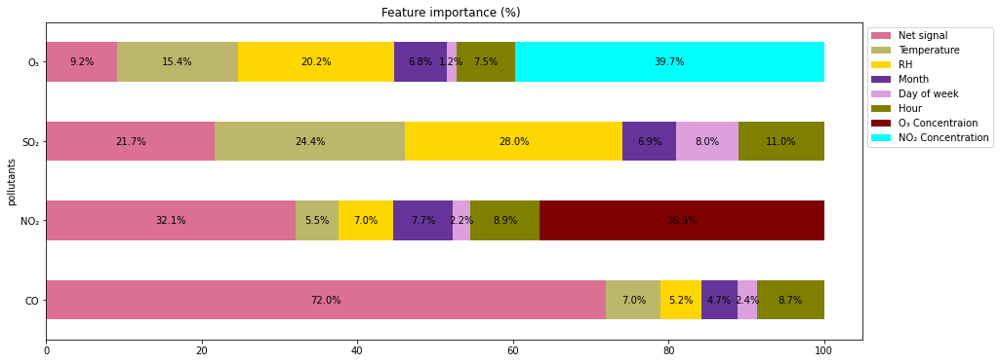

In [749]:
color=['palevioletred','darkkhaki','gold','rebeccapurple','plum','olive','maroon','cyan']
fig= plt.figure(figsize=(10,5)) 
df.plot(
  x = 'pollutants', 
  kind = 'barh', 
  stacked = True,
  color=color,
  title = 'Feature importance (%)  ',#(mean±0.7*std) 
  mark_right = True,
figsize=(15, 6))
  
df_total = (df["Net signal"] + df["Temperature"] + df["RH"]+df["Month"]+df["Day of week"]+df["Hour"]
            +df['O3 Concentraion'.translate(subscript)]+df['NO2 Concentration'.translate(subscript)])
df_rel = df[df.columns[1:]].div(df_total,0)*100
  
for n in df_rel:
    for i, (cs, ab, pc) in enumerate(zip(df.iloc[:, 1:].cumsum(1)[n], 
                                         df[n], df_rel[n])):
        if pc>0:
            plt.text(cs - ab / 2, i, str(np.round(pc, 1)) + '%', 
                 va = 'center', ha = 'center')
plt.legend( loc = 2, bbox_to_anchor = (1,1))

Text(0.5, 1.0, 'CO')

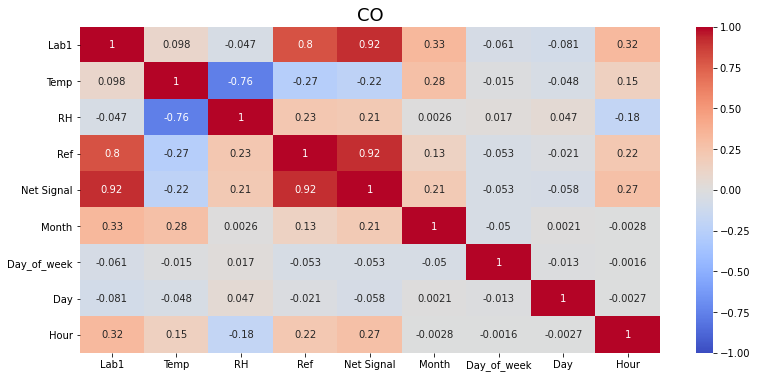

In [750]:
import matplotlib.pyplot as plt
import seaborn as sns
fig= plt.figure(figsize=(13,6))
sns.heatmap(CO_Data.corr(), annot = True, vmin=-1, vmax=1, 
            center= 0, cmap= 'coolwarm')
plt.title('CO',fontsize=18)

Text(0.5, 1.0, 'CO')

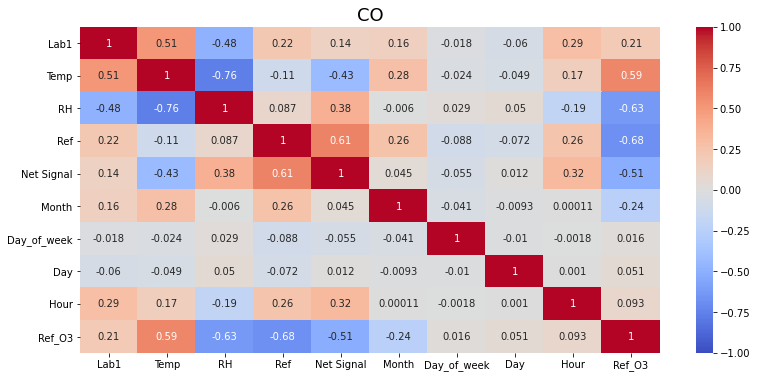

In [751]:
import matplotlib.pyplot as plt
import seaborn as sns
fig= plt.figure(figsize=(13,6))
sns.heatmap(NO2_Data.corr(), annot = True, vmin=-1, vmax=1, 
            center= 0, cmap= 'coolwarm')
plt.title('CO',fontsize=18)

Text(0.5, 1.0, 'CO')

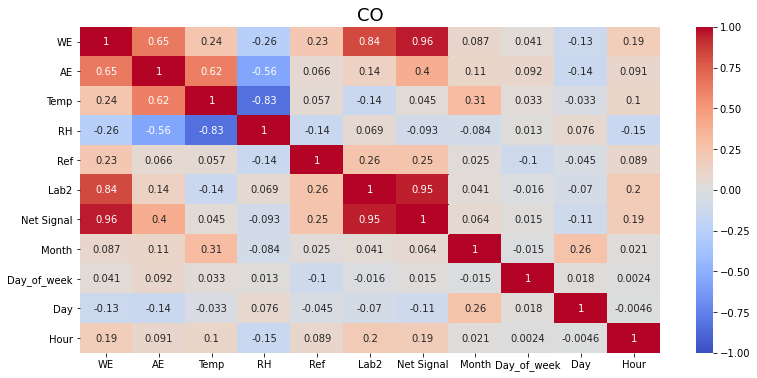

In [752]:
import matplotlib.pyplot as plt
import seaborn as sns
fig= plt.figure(figsize=(13,6))
sns.heatmap(SO2_Data.corr(), annot = True, vmin=-1, vmax=1, 
            center= 0, cmap= 'coolwarm')
plt.title('CO',fontsize=18)

Text(0.5, 1.0, 'CO')

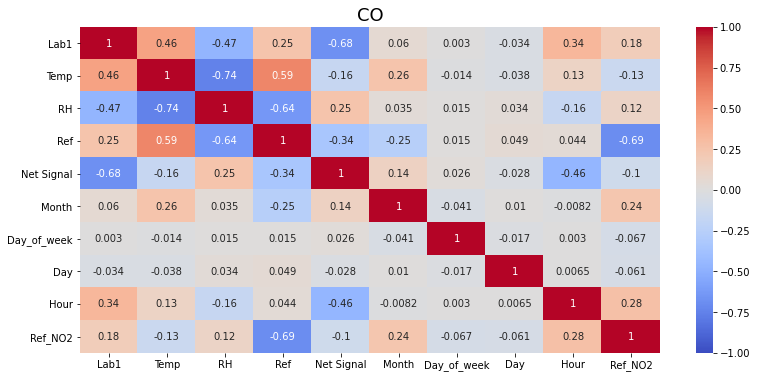

In [753]:
import matplotlib.pyplot as plt
import seaborn as sns
fig= plt.figure(figsize=(13,6))
sns.heatmap(O3_Data.corr(), annot = True, vmin=-1, vmax=1, 
            center= 0, cmap= 'coolwarm')
plt.title('CO',fontsize=18)

# Cross Sensitivities

# NO2

In [754]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
Pearson_NO2_inc=[0.89,0.92,0.97,0.96,0.96]
R2_NO2_inc=[0.79,0.84,0.94,0.92,0.92]
RMSE_NO2_inc=[5.7,5,3,3.5,3.6]

Pearson_NO2_Ninc=[0.67,0.79,0.95,0.93,0.91]
R2_NO2_Ninc=[0.45,0.62,0.9,0.86,0.83]
RMSE_NO2_Ninc=[9.4,7.8,4.1,4.7,5.3]


<function matplotlib.pyplot.legend(*args, **kwargs)>

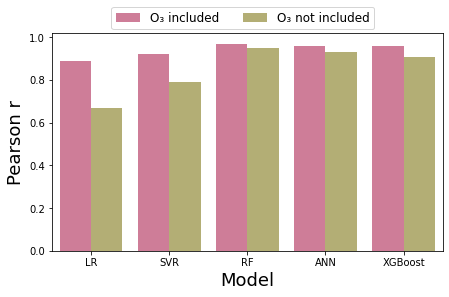

In [755]:
Pearson=Pearson_NO2_inc+Pearson_NO2_Ninc
Model=['LR','SVR','RF','ANN','XGBoost']
Models=Model+Model
Class1=['NO2 included' for i in range(5)]
Class2=['NO2 not included' for i in range(5)]
Classification=Class1+Class2
data=[[Models[i],Pearson[i],Classification[i] ] for i in range(len(Models))]
df=pd.DataFrame(data=data, columns=['Model', 'Pearson r','Classification'])
#df=df.sample(frac=1)
#df.head()

fig= plt.figure(figsize=(7,4))
sns.barplot(x="Model", y="Pearson r", hue="Classification",data=df,palette=['palevioletred','darkkhaki'],
ci=None)
plt.legend(['O3 included'.translate(subscript), 'O3 not included'.translate(subscript)],ncol = 4  , 
           bbox_to_anchor = (0.84,1.15),fontsize=12)
#plt.ylabel( 'Average ' + r'$O_{3}$' + ' Concentration (μg/m³)')
#plt.title('NO2 Calibration'.translate(subscript), fontsize=18)
plt.ylabel('Pearson r',fontsize=18)
plt.xlabel('Model',fontsize=18)
plt.legend

<function matplotlib.pyplot.legend(*args, **kwargs)>

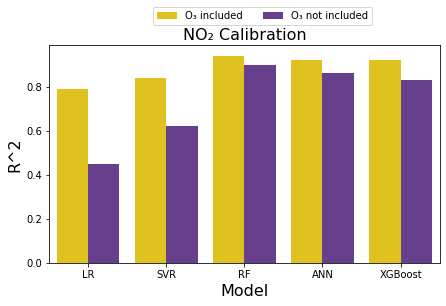

In [756]:
R2=R2_NO2_inc+R2_NO2_Ninc
Model=['LR','SVR','RF','ANN','XGBoost']
Models=Model+Model
Class1=['NO2 included' for i in range(5)]
Class2=['NO2 not included' for i in range(5)]
Classification=Class1+Class2
data=[[Models[i],R2[i],Classification[i] ] for i in range(len(Models))]
df=pd.DataFrame(data=data, columns=['Model', 'R2','Classification'])
#df=df.sample(frac=1)
#df.head()

fig= plt.figure(figsize=(7,4))
sns.barplot(x="Model", y="R2", hue="Classification",data=df,palette=['gold','rebeccapurple'],
ci=None)
plt.legend(['O3 included'.translate(subscript), 'O3 not included'.translate(subscript)],ncol = 4  , 
           bbox_to_anchor = (0.84,1.2),fontsize=10)
#plt.ylabel( 'Average ' + r'$O_{3}$' + ' Concentration (μg/m³)')
#plt.title('NO2 Calibration'.translate(subscript), fontsize=18)
plt.ylabel('R^2',fontsize=16)
plt.xlabel('Model',fontsize=16)
plt.title('NO2 Calibration'.translate(subscript),fontsize=16)
plt.legend

<function matplotlib.pyplot.legend(*args, **kwargs)>

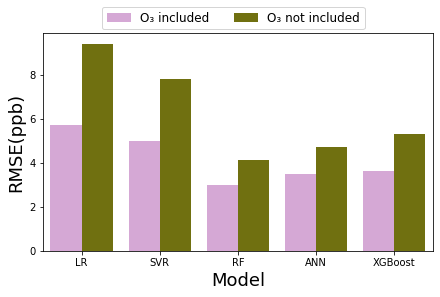

In [757]:
RMSE=RMSE_NO2_inc+RMSE_NO2_Ninc
Model=['LR','SVR','RF','ANN','XGBoost']
Models=Model+Model
Class1=['NO2 included' for i in range(5)]
Class2=['NO2 not included' for i in range(5)]
Classification=Class1+Class2
data=[[Models[i],RMSE[i],Classification[i] ] for i in range(len(Models))]
df=pd.DataFrame(data=data, columns=['Model', 'RMSE','Classification'])
#df=df.sample(frac=1)
#df.head()

fig= plt.figure(figsize=(7,4))
sns.barplot(x="Model", y="RMSE", hue="Classification",data=df,palette=['plum','olive'],
ci=None)
plt.legend(['O3 included'.translate(subscript), 'O3 not included'.translate(subscript)],ncol = 4  , 
           bbox_to_anchor = (0.84,1.15),fontsize=12)
#plt.ylabel( 'Average ' + r'$O_{3}$' + ' Concentration (μg/m³)')
#plt.title('NO2 Calibration'.translate(subscript), fontsize=18)
plt.ylabel('RMSE(ppb)',fontsize=18)
plt.xlabel('Model',fontsize=18)
plt.legend

# O3

In [758]:
Pearson_O3_inc=[0.94,0.94,0.99,0.99,0.98]
R2_O3_inc=[0.89,0.89,0.98,0.97,0.97]
RMSE_O3_inc=[5,5,2.2,2.6,2.8]

Pearson_O3_Ninc=[0.77,0.77,0.98,0.97,0.92]
R2_O3_Ninc=[0.59,0.59,0.95,0.93,0.85]
RMSE_O3_Ninc=[9.6,9.7,3.3,3.9,5.7]

<BarContainer object of 5 artists>

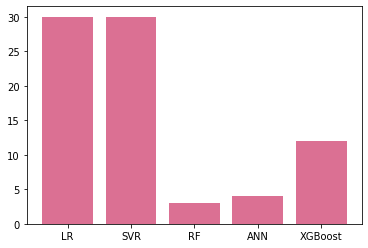

In [759]:
Per=(np.array(R2_O3_inc)-np.array(R2_O3_Ninc))*100
Model=['LR','SVR','RF','ANN','XGBoost']
plt.bar(Model,Per, color='palevioletred')


<function matplotlib.pyplot.legend(*args, **kwargs)>

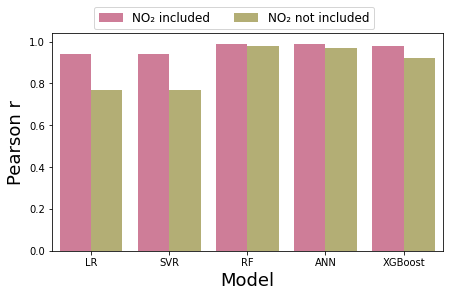

In [760]:
Pearson=Pearson_O3_inc+Pearson_O3_Ninc
Model=['LR','SVR','RF','ANN','XGBoost']
Models=Model+Model
Class1=['NO2 included' for i in range(5)]
Class2=['NO2 not included' for i in range(5)]
Classification=Class1+Class2
data=[[Models[i],Pearson[i],Classification[i] ] for i in range(len(Models))]
df=pd.DataFrame(data=data, columns=['Model', 'Pearson r','Classification'])
#df=df.sample(frac=1)
#df.head()

fig= plt.figure(figsize=(7,4))
sns.barplot(x="Model", y="Pearson r", hue="Classification",data=df,palette=['palevioletred','darkkhaki'],
ci=None)
plt.legend(['NO2 included'.translate(subscript), 'NO2 not included'.translate(subscript)],ncol = 4  , 
           bbox_to_anchor = (0.84,1.15),fontsize=12)
#plt.ylabel( 'Average ' + r'$O_{3}$' + ' Concentration (μg/m³)')
#plt.title('NO2 Calibration'.translate(subscript), fontsize=18)
plt.ylabel('Pearson r',fontsize=18)
plt.xlabel('Model',fontsize=18)
plt.legend

<function matplotlib.pyplot.legend(*args, **kwargs)>

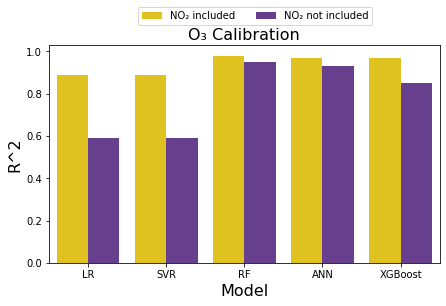

In [761]:
R2=R2_O3_inc+R2_O3_Ninc
Model=['LR','SVR','RF','ANN','XGBoost']
Models=Model+Model
Class1=['NO2 included' for i in range(5)]
Class2=['NO2 not included' for i in range(5)]
Classification=Class1+Class2
data=[[Models[i],R2[i],Classification[i] ] for i in range(len(Models))]
df=pd.DataFrame(data=data, columns=['Model', 'R2','Classification'])
#df=df.sample(frac=1)
#df.head()

fig= plt.figure(figsize=(7,4))
sns.barplot(x="Model", y="R2", hue="Classification",data=df,palette=['gold','rebeccapurple'],
ci=None)
plt.legend(['NO2 included'.translate(subscript), 'NO2 not included'.translate(subscript)],ncol = 4  , 
           bbox_to_anchor = (0.84,1.2),fontsize=10)
#plt.ylabel( 'Average ' + r'$O_{3}$' + ' Concentration (μg/m³)')
#plt.title('NO2 Calibration'.translate(subscript), fontsize=18)
plt.ylabel('R^2',fontsize=16)
plt.xlabel('Model',fontsize=16)
plt.title('O3 Calibration'.translate(subscript),fontsize=16)
plt.legend

<function matplotlib.pyplot.legend(*args, **kwargs)>

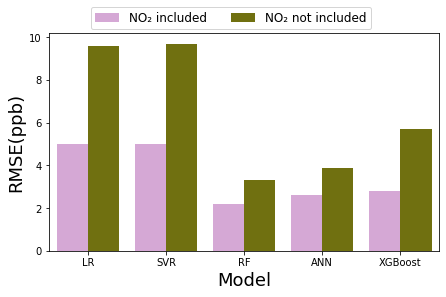

In [762]:
RMSE=RMSE_O3_inc+RMSE_O3_Ninc
Model=['LR','SVR','RF','ANN','XGBoost']
Models=Model+Model
Class1=['NO2 included' for i in range(5)]
Class2=['NO2 not included' for i in range(5)]
Classification=Class1+Class2
data=[[Models[i],RMSE[i],Classification[i] ] for i in range(len(Models))]
df=pd.DataFrame(data=data, columns=['Model', 'RMSE','Classification'])
#df=df.sample(frac=1)
#df.head()

fig= plt.figure(figsize=(7,4))
sns.barplot(x="Model", y="RMSE", hue="Classification",data=df,palette=['plum','olive'],
ci=None)
plt.legend(['NO2 included'.translate(subscript), 'NO2 not included'.translate(subscript)],ncol = 4  , 
           bbox_to_anchor = (0.84,1.15),fontsize=12)
#plt.ylabel( 'Average ' + r'$O_{3}$' + ' Concentration (μg/m³)')
#plt.title('NO2 Calibration'.translate(subscript), fontsize=18)
plt.ylabel('RMSE(ppb)',fontsize=18)
plt.xlabel('Model',fontsize=18)
plt.legend

In [94]:
import pandas as pd
import numpy as np
R1_data= pd.read_csv('R1.csv')
R1_data.columns=['Sen_2.5','Sen_10','Ref_2.5','Ref_10','Time','T','RH']
R1_data=R1_data.dropna()
Time=R1_data['Time'].to_list()
time=[]
for i in range(len(Time)):
    time.append(float(abs(Time[i])))
Time=np.array(time)
Date=pd.to_datetime(Time-719529,unit='d').round('s')
R1_data['Date'] = Date.tolist()
R1_data=R1_data.set_index('Date')
R1_data.drop('Time',axis = 1, inplace = True)
R1_data.head()

,Sen_2.5,Sen_10,Ref_2.5,Ref_10,T,RH
Date,,,,,,
2019-10-02 13:00:00,37.606508,61.467964,16.945596,31.358817,30.55,44.88
2019-10-02 14:00:00,37.606508,61.467964,22.114387,45.218727,28.72,56.78
2019-10-02 15:00:00,8.507763,42.813486,22.611759,61.807504,27.38,57.16
2019-10-02 16:00:00,8.507763,42.813486,19.652068,41.656351,26.31,58.61
2019-10-02 17:00:00,8.507763,42.813486,17.954197,30.121207,28.52,50.16


In [95]:
import pandas as pd
import numpy as np
N3_data= pd.read_csv('N3.csv')
N3_data.columns=['Sen_2.5','Sen_10','Ref_2.5','Ref_10','Time','T','RH']
N3_data=N3_data.dropna()
Time=N3_data['Time'].to_list()
time=[]
for i in range(len(Time)):
    time.append(float(abs(Time[i])))
Time=np.array(time)
Date=pd.to_datetime(Time-719529,unit='d').round('s')
N3_data['Date'] = Date.tolist()
N3_data=N3_data.set_index('Date')
N3_data.drop('Time',axis = 1, inplace = True)
N3_data.tail()

,Sen_2.5,Sen_10,Ref_2.5,Ref_10,T,RH
Date,,,,,,
2020-11-09 19:00:00,15.255277,59.432720,34.47053,112.54680,13.66,84.61
2020-11-09 20:00:00,13.595549,49.218701,51.01247,185.77910,13.35,85.21
2020-11-09 21:00:00,15.531131,47.994590,50.29734,152.05290,13.12,85.77
2020-11-09 22:00:00,12.958598,38.296699,48.03581,122.83820,13.02,85.93
2020-11-09 23:00:00,12.374930,35.061428,41.15864,94.77707,12.66,86.06


In [96]:
SUB = str.maketrans("0123456789", "₀₁₂₃₄₅₆₇₈₉")
SUP = str.maketrans("0123456789", "⁰¹²³⁴⁵⁶⁷⁸⁹")

# LR

## PM2.5

## OPC

In [97]:
from sktime.performance_metrics.forecasting import sMAPE, smape_loss
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error as mae
import sklearn.metrics as sm
import matplotlib.pyplot as plt
#'Ref_NO2','Ref_SO2','Ref_O3',
#,'Month','Day_of_week','Day','Hour'
X=R1_data[['Sen_10', 'T', 'RH']]
y=R1_data['Ref_10']
X_train, X_test, y_train, y_test =train_test_split(X, y, test_size = 0.2,shuffle=True)

In [98]:
X_train.shape

(2479, 3)

from sklearn.ensemble import RandomForestRegressor
  
 # create regressor object
regressor = RandomForestRegressor(n_estimators =500 ,min_samples_split=2,min_samples_leaf= 2,max_features= 'sqrt', 
                                  random_state = 0,max_depth=None,bootstrap=True)
  
  
# fit the regressor with x and y data
regressor=regressor.fit(X_train, y_train) 

In [99]:
from sklearn.linear_model import LinearRegression
regressor = LinearRegression()
regressor=regressor.fit(X_train[['Sen_10']], y_train) 

In [100]:
pred = regressor.predict(X_test[['Sen_10']])
lab1=X_test['Sen_10'].to_list()
Pearson_1=round(np.corrcoef(y_test, lab1)[0, 1],2)
Pearson_2=round(np.corrcoef(y_test, pred)[0, 1],2)
R2_lab=round(sm.r2_score(y_test, lab1), 2)
R2_RF=round(sm.r2_score(y_test, pred), 2)
R2_lab,R2_RF

(0.32, 0.62)

In [101]:
Pearson_1,Pearson_2

(0.79, 0.79)

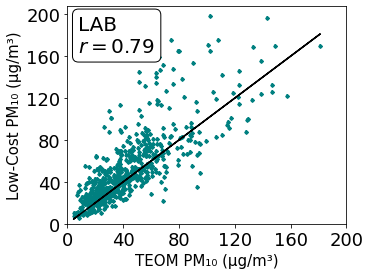

In [111]:
fig= plt.figure(figsize=(5,4))
ax = fig.add_subplot(111)
#ax.patch.set_facecolor('lightblue')
#ax.patch.set_alpha(0.3)
#m0, b0 = np.polyfit(np.array(y_test), np.array(lab1), 1)
#plt.plot(np.array(y_test), m0*np.array(y_test) + b0,color='#426eff',linewidth=4)
#m1, b1 = np.polyfit(np.array(y_test), np.array(pred_lr), 1)
#plt.plot(np.array(y_test), m1*np.array(y_test) + b1,color='#513e00',linewidth=4)
#m2, b2 = np.polyfit(np.array(y_test), np.array(pred_svr), 1)
#plt.plot(np.array(y_test), m2*np.array(y_test) + b2,color='brown',linewidth=4)
#m3, b3 = np.polyfit(np.array(y_test), np.array(pred_rf), 1)
#plt.plot(np.array(y_test), m3*np.array(y_test) + b3,color='indigo',linewidth=4)
#m4, b4 = np.polyfit(np.array(y_test), np.array(pred_ann), 1)
#plt.plot(np.array(y_test), m4*np.array(y_test) + b4,color='tomato',linewidth=4)
#m5, b5 = np.polyfit(np.array(y_test), np.array(pred_xgb), 1)
#plt.plot(np.array(y_test), m5*np.array(y_test) + b5,color='darkgoldenrod',linewidth=4)
plt.scatter(np.array(y_test),np.array(lab1),color='teal',marker="$\\bigoplus$",s=10)
#plt.scatter(np.array(y_test),np.array(pred),color='teal',marker="$\\bigoplus$",s=10)
#plt.scatter(np.array(y_test),np.array(pred_lr),color='#513e00',marker='P')
#plt.scatter(np.array(y_test),np.array(pred_svr),color='brown',marker='d')
#plt.scatter(np.array(y_test),np.array(pred_rf),color='indigo',marker='*',s=30)
#plt.scatter(np.array(y_test),np.array(pred_ann),color='tomato',marker='s')
#plt.scatter(np.array(y_test),np.array(pred_xgb),color='darkgoldenrod',marker='1',s=15)
plt.plot(np.array(y_test),np.array(y_test), c ="black",linewidth=1.5)
#ax.spines['right'].set_visible(False)
#ax.spines['top'].set_visible(False)
ax.set_ylim(bottom=0)
ax.set_xlim(left=0)
plt.xlabel('TEOM PM10'.translate(SUB) +  ' (µg/m3)'.translate(SUP),fontsize=15)
plt.ylabel('Low-Cost PM10'.translate(SUB) +  ' (µg/m3)'.translate(SUP),fontsize=15)
#plt.legend(['1:1','N3','RF'
            #], loc = 2, bbox_to_anchor = (0,1),fontsize=12)
#plt.title('CO Sensor',fontsize=18 )
A=[Pearson_1]
#ax.text(1800, 2900, r'$ r=$'+str(A[0]), fontsize=13)
#ax.text(200, 2900, 'LAB', fontsize=17)
#plt.title(r'$ r=$'+str(A[0]))
          #,
          #fontsize=12)
#plt.grid(linestyle='-.',linewidth=0.1)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.show
#plt.xticks(np.arange(0,2.9, step=1))
plt.xticks(np.arange(0,201, step=40))
plt.yticks(np.arange(0,201, step=40))
plt.show
textstr = '\n'.join(('LAB',r'$r=%.2f$' % (A[0], ) ))

props = dict(boxstyle='round', facecolor='white', alpha=1)

#place a text box in upper left in axes coords
ax.text(0.04, 0.96, textstr, transform=ax.transAxes, fontsize=20,
        verticalalignment='top', bbox=props)

#plt.savefig("R1_10_OPC.pdf",format="pdf", bbox_inches="tight")
plt.show()

In [103]:
max(np.array(lab1)),max(np.array(y_test))

(197.938678691275, 181.32983000000002)

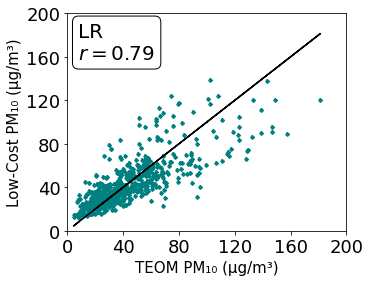

In [104]:
fig= plt.figure(figsize=(5,4))
ax = fig.add_subplot(111)
#ax.patch.set_facecolor('lightblue')
#ax.patch.set_alpha(0.3)
#m0, b0 = np.polyfit(np.array(y_test), np.array(lab1), 1)
#plt.plot(np.array(y_test), m0*np.array(y_test) + b0,color='#426eff',linewidth=4)
#m1, b1 = np.polyfit(np.array(y_test), np.array(pred_lr), 1)
#plt.plot(np.array(y_test), m1*np.array(y_test) + b1,color='#513e00',linewidth=4)
#m2, b2 = np.polyfit(np.array(y_test), np.array(pred_svr), 1)
#plt.plot(np.array(y_test), m2*np.array(y_test) + b2,color='brown',linewidth=4)
#m3, b3 = np.polyfit(np.array(y_test), np.array(pred_rf), 1)
#plt.plot(np.array(y_test), m3*np.array(y_test) + b3,color='indigo',linewidth=4)
#m4, b4 = np.polyfit(np.array(y_test), np.array(pred_ann), 1)
#plt.plot(np.array(y_test), m4*np.array(y_test) + b4,color='tomato',linewidth=4)
#m5, b5 = np.polyfit(np.array(y_test), np.array(pred_xgb), 1)
#plt.plot(np.array(y_test), m5*np.array(y_test) + b5,color='darkgoldenrod',linewidth=4)
#plt.scatter(np.array(y_test),np.array(lab1),color='teal',marker="$\\bigoplus$",s=10)
plt.scatter(np.array(y_test),np.array(pred),color='teal',marker="$\\bigoplus$",s=10)
#plt.scatter(np.array(y_test),np.array(pred_lr),color='#513e00',marker='P')
#plt.scatter(np.array(y_test),np.array(pred_svr),color='brown',marker='d')
#plt.scatter(np.array(y_test),np.array(pred_rf),color='indigo',marker='*',s=30)
#plt.scatter(np.array(y_test),np.array(pred_ann),color='tomato',marker='s')
#plt.scatter(np.array(y_test),np.array(pred_xgb),color='darkgoldenrod',marker='1',s=15)
plt.plot(np.array(y_test),np.array(y_test), c ="black",linewidth=1.5)
#ax.spines['right'].set_visible(False)
#ax.spines['top'].set_visible(False)
ax.set_ylim(bottom=0)
ax.set_xlim(left=0)
plt.xlabel('TEOM PM10'.translate(SUB) +  ' (µg/m3)'.translate(SUP),fontsize=15)
plt.ylabel('Low-Cost PM10'.translate(SUB) +  ' (µg/m3)'.translate(SUP),fontsize=15)
#plt.legend(['1:1','N3','RF'
            #], loc = 2, bbox_to_anchor = (0,1),fontsize=12)
#plt.title('CO Sensor',fontsize=18 )
A=[Pearson_2]
#ax.text(1800, 2900, r'$ r=$'+str(A[0]), fontsize=13)
#ax.text(200, 2900, 'LAB', fontsize=17)
#plt.title(r'$ r=$'+str(A[0]))
          #,
          #fontsize=12)
#plt.grid(linestyle='-.',linewidth=0.1)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.show
#plt.xticks(np.arange(0,2.9, step=1))
plt.xticks(np.arange(0,201, step=40))
plt.yticks(np.arange(0,201, step=40))
plt.show
textstr = '\n'.join(('LR',r'$r=%.2f$' % (A[0], ) ))

props = dict(boxstyle='round', facecolor='white', alpha=1)

#place a text box in upper left in axes coords
ax.text(0.04, 0.96, textstr, transform=ax.transAxes, fontsize=20,
        verticalalignment='top', bbox=props)

plt.savefig("R1_10_LR_O.pdf",format="pdf", bbox_inches="tight")
#plt.savefig("fig4d.pdf", format="pdf", bbox_inches="tight")
plt.show()

## OPC+T

In [105]:
regressor=regressor.fit(X_train[['Sen_10','T']], y_train)
pred = regressor.predict(X_test[['Sen_10','T']])
lab1=X_test['Sen_10'].to_list()
Pearson_1=round(np.corrcoef(y_test, lab1)[0, 1],2)
Pearson_2=round(np.corrcoef(y_test, pred)[0, 1],2)
R2_lab=round(sm.r2_score(y_test, lab1), 2)
R2_RF=round(sm.r2_score(y_test, pred), 2)
R2_lab,R2_RF

(0.32, 0.63)

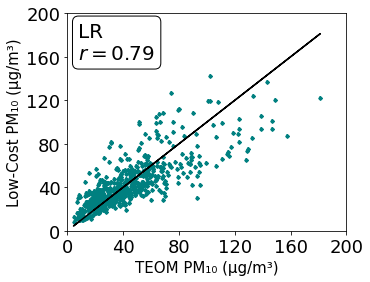

In [106]:
fig= plt.figure(figsize=(5,4))
ax = fig.add_subplot(111)
#ax.patch.set_facecolor('lightblue')
#ax.patch.set_alpha(0.3)
#m0, b0 = np.polyfit(np.array(y_test), np.array(lab1), 1)
#plt.plot(np.array(y_test), m0*np.array(y_test) + b0,color='#426eff',linewidth=4)
#m1, b1 = np.polyfit(np.array(y_test), np.array(pred_lr), 1)
#plt.plot(np.array(y_test), m1*np.array(y_test) + b1,color='#513e00',linewidth=4)
#m2, b2 = np.polyfit(np.array(y_test), np.array(pred_svr), 1)
#plt.plot(np.array(y_test), m2*np.array(y_test) + b2,color='brown',linewidth=4)
#m3, b3 = np.polyfit(np.array(y_test), np.array(pred_rf), 1)
#plt.plot(np.array(y_test), m3*np.array(y_test) + b3,color='indigo',linewidth=4)
#m4, b4 = np.polyfit(np.array(y_test), np.array(pred_ann), 1)
#plt.plot(np.array(y_test), m4*np.array(y_test) + b4,color='tomato',linewidth=4)
#m5, b5 = np.polyfit(np.array(y_test), np.array(pred_xgb), 1)
#plt.plot(np.array(y_test), m5*np.array(y_test) + b5,color='darkgoldenrod',linewidth=4)
#plt.scatter(np.array(y_test),np.array(lab1),color='teal',marker="$\\bigoplus$",s=10)
plt.scatter(np.array(y_test),np.array(pred),color='teal',marker="$\\bigoplus$",s=10)
#plt.scatter(np.array(y_test),np.array(pred_lr),color='#513e00',marker='P')
#plt.scatter(np.array(y_test),np.array(pred_svr),color='brown',marker='d')
#plt.scatter(np.array(y_test),np.array(pred_rf),color='indigo',marker='*',s=30)
#plt.scatter(np.array(y_test),np.array(pred_ann),color='tomato',marker='s')
#plt.scatter(np.array(y_test),np.array(pred_xgb),color='darkgoldenrod',marker='1',s=15)
plt.plot(np.array(y_test),np.array(y_test), c ="black",linewidth=1.5)
#ax.spines['right'].set_visible(False)
#ax.spines['top'].set_visible(False)
ax.set_ylim(bottom=0)
ax.set_xlim(left=0)
plt.xlabel('TEOM PM10'.translate(SUB) +  ' (µg/m3)'.translate(SUP),fontsize=15)
plt.ylabel('Low-Cost PM10'.translate(SUB) +  ' (µg/m3)'.translate(SUP),fontsize=15)
#plt.legend(['1:1','N3','RF'
            #], loc = 2, bbox_to_anchor = (0,1),fontsize=12)
#plt.title('CO Sensor',fontsize=18 )
A=[Pearson_2]
#ax.text(1800, 2900, r'$ r=$'+str(A[0]), fontsize=13)
#ax.text(200, 2900, 'LAB', fontsize=17)
#plt.title(r'$ r=$'+str(A[0]))
          #,
          #fontsize=12)
#plt.grid(linestyle='-.',linewidth=0.1)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.show
#plt.xticks(np.arange(0,2.9, step=1))
plt.xticks(np.arange(0,201, step=40))
plt.yticks(np.arange(0,201, step=40))
plt.show
textstr = '\n'.join(('LR',r'$r=%.2f$' % (A[0], ) ))

props = dict(boxstyle='round', facecolor='white', alpha=1)

#place a text box in upper left in axes coords
ax.text(0.04, 0.96, textstr, transform=ax.transAxes, fontsize=20,
        verticalalignment='top', bbox=props)

plt.savefig("R1_10_LR_OT.pdf",format="pdf", bbox_inches="tight")
#plt.savefig("fig4d.pdf", format="pdf", bbox_inches="tight")
plt.show()

## OPC+RH

In [107]:
regressor=regressor.fit(X_train[['Sen_10','RH']], y_train)
pred = regressor.predict(X_test[['Sen_10','RH']])
lab1=X_test['Sen_10'].to_list()
Pearson_1=round(np.corrcoef(y_test, lab1)[0, 1],2)
Pearson_2=round(np.corrcoef(y_test, pred)[0, 1],2)
R2_lab=round(sm.r2_score(y_test, lab1), 2)
R2_RF=round(sm.r2_score(y_test, pred), 2)
R2_lab,R2_RF

(0.32, 0.64)

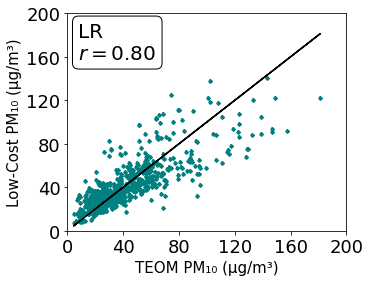

In [108]:
fig= plt.figure(figsize=(5,4))
ax = fig.add_subplot(111)
#ax.patch.set_facecolor('lightblue')
#ax.patch.set_alpha(0.3)
#m0, b0 = np.polyfit(np.array(y_test), np.array(lab1), 1)
#plt.plot(np.array(y_test), m0*np.array(y_test) + b0,color='#426eff',linewidth=4)
#m1, b1 = np.polyfit(np.array(y_test), np.array(pred_lr), 1)
#plt.plot(np.array(y_test), m1*np.array(y_test) + b1,color='#513e00',linewidth=4)
#m2, b2 = np.polyfit(np.array(y_test), np.array(pred_svr), 1)
#plt.plot(np.array(y_test), m2*np.array(y_test) + b2,color='brown',linewidth=4)
#m3, b3 = np.polyfit(np.array(y_test), np.array(pred_rf), 1)
#plt.plot(np.array(y_test), m3*np.array(y_test) + b3,color='indigo',linewidth=4)
#m4, b4 = np.polyfit(np.array(y_test), np.array(pred_ann), 1)
#plt.plot(np.array(y_test), m4*np.array(y_test) + b4,color='tomato',linewidth=4)
#m5, b5 = np.polyfit(np.array(y_test), np.array(pred_xgb), 1)
#plt.plot(np.array(y_test), m5*np.array(y_test) + b5,color='darkgoldenrod',linewidth=4)
#plt.scatter(np.array(y_test),np.array(lab1),color='teal',marker="$\\bigoplus$",s=10)
plt.scatter(np.array(y_test),np.array(pred),color='teal',marker="$\\bigoplus$",s=10)
#plt.scatter(np.array(y_test),np.array(pred_lr),color='#513e00',marker='P')
#plt.scatter(np.array(y_test),np.array(pred_svr),color='brown',marker='d')
#plt.scatter(np.array(y_test),np.array(pred_rf),color='indigo',marker='*',s=30)
#plt.scatter(np.array(y_test),np.array(pred_ann),color='tomato',marker='s')
#plt.scatter(np.array(y_test),np.array(pred_xgb),color='darkgoldenrod',marker='1',s=15)
plt.plot(np.array(y_test),np.array(y_test), c ="black",linewidth=1.5)
#ax.spines['right'].set_visible(False)
#ax.spines['top'].set_visible(False)
ax.set_ylim(bottom=0)
ax.set_xlim(left=0)
plt.xlabel('TEOM PM10'.translate(SUB) +  ' (µg/m3)'.translate(SUP),fontsize=15)
plt.ylabel('Low-Cost PM10'.translate(SUB) +  ' (µg/m3)'.translate(SUP),fontsize=15)
#plt.legend(['1:1','N3','RF'
            #], loc = 2, bbox_to_anchor = (0,1),fontsize=12)
#plt.title('CO Sensor',fontsize=18 )
A=[Pearson_2]
#ax.text(1800, 2900, r'$ r=$'+str(A[0]), fontsize=13)
#ax.text(200, 2900, 'LAB', fontsize=17)
#plt.title(r'$ r=$'+str(A[0]))
          #,
          #fontsize=12)
#plt.grid(linestyle='-.',linewidth=0.1)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.show
#plt.xticks(np.arange(0,2.9, step=1))
plt.xticks(np.arange(0,201, step=40))
plt.yticks(np.arange(0,201, step=40))
plt.show
textstr = '\n'.join(('LR',r'$r=%.2f$' % (A[0], ) ))

props = dict(boxstyle='round', facecolor='white', alpha=1)

#place a text box in upper left in axes coords
ax.text(0.04, 0.96, textstr, transform=ax.transAxes, fontsize=20,
        verticalalignment='top', bbox=props)

plt.savefig("R1_10_LR_ORH.pdf",format="pdf", bbox_inches="tight")
#plt.savefig("fig4d.pdf", format="pdf", bbox_inches="tight")
plt.show()

## OPC+T+RH

In [109]:
regressor=regressor.fit(X_train[['Sen_10','T','RH']], y_train)
pred = regressor.predict(X_test[['Sen_10','T','RH']])
lab1=X_test['Sen_10'].to_list()
Pearson_1=round(np.corrcoef(y_test, lab1)[0, 1],2)
Pearson_2=round(np.corrcoef(y_test, pred)[0, 1],2)
R2_lab=round(sm.r2_score(y_test, lab1), 2)
R2_RF=round(sm.r2_score(y_test, pred), 2)
R2_lab,R2_RF

(0.32, 0.64)

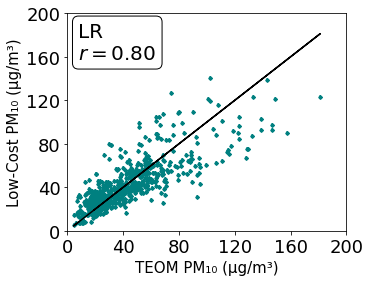

In [110]:
fig= plt.figure(figsize=(5,4))
ax = fig.add_subplot(111)
#ax.patch.set_facecolor('lightblue')
#ax.patch.set_alpha(0.3)
#m0, b0 = np.polyfit(np.array(y_test), np.array(lab1), 1)
#plt.plot(np.array(y_test), m0*np.array(y_test) + b0,color='#426eff',linewidth=4)
#m1, b1 = np.polyfit(np.array(y_test), np.array(pred_lr), 1)
#plt.plot(np.array(y_test), m1*np.array(y_test) + b1,color='#513e00',linewidth=4)
#m2, b2 = np.polyfit(np.array(y_test), np.array(pred_svr), 1)
#plt.plot(np.array(y_test), m2*np.array(y_test) + b2,color='brown',linewidth=4)
#m3, b3 = np.polyfit(np.array(y_test), np.array(pred_rf), 1)
#plt.plot(np.array(y_test), m3*np.array(y_test) + b3,color='indigo',linewidth=4)
#m4, b4 = np.polyfit(np.array(y_test), np.array(pred_ann), 1)
#plt.plot(np.array(y_test), m4*np.array(y_test) + b4,color='tomato',linewidth=4)
#m5, b5 = np.polyfit(np.array(y_test), np.array(pred_xgb), 1)
#plt.plot(np.array(y_test), m5*np.array(y_test) + b5,color='darkgoldenrod',linewidth=4)
#plt.scatter(np.array(y_test),np.array(lab1),color='teal',marker="$\\bigoplus$",s=10)
plt.scatter(np.array(y_test),np.array(pred),color='teal',marker="$\\bigoplus$",s=10)
#plt.scatter(np.array(y_test),np.array(pred_lr),color='#513e00',marker='P')
#plt.scatter(np.array(y_test),np.array(pred_svr),color='brown',marker='d')
#plt.scatter(np.array(y_test),np.array(pred_rf),color='indigo',marker='*',s=30)
#plt.scatter(np.array(y_test),np.array(pred_ann),color='tomato',marker='s')
#plt.scatter(np.array(y_test),np.array(pred_xgb),color='darkgoldenrod',marker='1',s=15)
plt.plot(np.array(y_test),np.array(y_test), c ="black",linewidth=1.5)
#ax.spines['right'].set_visible(False)
#ax.spines['top'].set_visible(False)
ax.set_ylim(bottom=0)
ax.set_xlim(left=0)
plt.xlabel('TEOM PM10'.translate(SUB) +  ' (µg/m3)'.translate(SUP),fontsize=15)
plt.ylabel('Low-Cost PM10'.translate(SUB) +  ' (µg/m3)'.translate(SUP),fontsize=15)
#plt.legend(['1:1','N3','RF'
            #], loc = 2, bbox_to_anchor = (0,1),fontsize=12)
#plt.title('CO Sensor',fontsize=18 )
A=[Pearson_2]
#ax.text(1800, 2900, r'$ r=$'+str(A[0]), fontsize=13)
#ax.text(200, 2900, 'LAB', fontsize=17)
#plt.title(r'$ r=$'+str(A[0]))
          #,
          #fontsize=12)
#plt.grid(linestyle='-.',linewidth=0.1)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.show
#plt.xticks(np.arange(0,2.9, step=1))
plt.xticks(np.arange(0,201, step=40))
plt.yticks(np.arange(0,201, step=40))
plt.show
textstr = '\n'.join(('LR',r'$r=%.2f$' % (A[0], ) ))

props = dict(boxstyle='round', facecolor='white', alpha=1)

#place a text box in upper left in axes coords
ax.text(0.04, 0.96, textstr, transform=ax.transAxes, fontsize=20,
        verticalalignment='top', bbox=props)

plt.savefig("R1_10_LR_OTRH.pdf",format="pdf", bbox_inches="tight")
#plt.savefig("fig4d.pdf", format="pdf", bbox_inches="tight")
plt.show()

## Feature Importance

FI=regressor.feature_importances_
FI=np.round(FI*100)
FI

import matplotlib.pyplot as plt
fig = plt.figure()
ax = fig.add_axes([0,0,1,1])
langs = ['OPC', 'T', 'RH']
students = [int(FI[0]),int(FI[1]),int(FI[2])]
graph=ax.bar(langs,students, color='#6495ED')
i = 0
for p in graph:
    width = p.get_width()
    height = p.get_height()
    x, y = p.get_xy()
    plt.text(x+width/2,
             y+height*1.01,
             str(students[i])+'%',
             ha='center',
             weight='bold',fontsize=18, color='teal')
    i+=1
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.yticks(np.arange(0,100, step=10))
plt.ylabel('Feature importance (%)', fontsize=20)
#plt.title(r"$O_3$",fontsize=18)
plt.savefig("R1_10_FI.pdf", format="pdf", bbox_inches="tight")
plt.show()

from keras.models import Sequential
from keras.layers import Dense
from keras import optimizers
from sklearn.preprocessing import StandardScaler
model = Sequential()
model.add(Dense(6, input_shape = (3,),kernel_initializer='normal', activation= 'linear'))
model.add(Dense(128,kernel_initializer='normal', activation= 'relu'))
model.add(Dense(128, kernel_initializer='normal',activation= 'relu'))
model.add(Dense(100, kernel_initializer='normal',activation= 'relu'))
model.add(Dense(1,kernel_initializer='normal',activation='linear',))
sgd = optimizers.Adam(learning_rate=0.01)

model.compile(optimizer = sgd, loss = 'mean_squared_error', metrics= ['mse', 'mae'])
model.summary()

scaler = StandardScaler()
scaler.fit(X_train)
X_train_scaled=scaler.transform(X_train)
X_test_scaled=scaler.transform(X_test)
model.fit(X_train_scaled, y_train, batch_size= 100, epochs=100, verbose= 0)

train_pred = model.predict(X_train_scaled)
test_pred = model.predict(X_test_scaled)
pred=[]
for i in range(len(test_pred)):
    pred.append(sum(list(test_pred[i])))
len(y_test)

Pearson_1=round(np.corrcoef(y_test, lab1)[0, 1],2)
Pearson_2=round(np.corrcoef(y_test, pred)[0, 1],2)
R2_lab=round(sm.r2_score(y_test, lab1), 2)
R2_RF=round(sm.r2_score(y_test, pred), 2)
R2_lab,R2_RF

Pearson_1,Pearson_2

In [342]:
import pandas as pd
import numpy as np
R1_data= pd.read_csv('R1_data.csv')
R1_data.columns=['Sen_2.5','Sen_10','Ref_2.5','Ref_10','Time','T','RH']
R1_data=R1_data.dropna()
Time=R1_data['Time'].to_list()
time=[]
for i in range(len(Time)):
    time.append(float(abs(Time[i])))
Time=np.array(time)
Date=pd.to_datetime(Time-719529,unit='d').round('s')
R1_data['Date'] = Date.tolist()
R1_data=R1_data.set_index('Date')
R1_data.drop('Time',axis = 1, inplace = True)
R1_data['Month']=R1_data.index.month
R1_data['Day_of_week']=R1_data.index.dayofweek
R1_data['Hour']=R1_data.index.hour
R1_data.head()

,Sen_2.5,Sen_10,Ref_2.5,Ref_10,T,RH,Month,Day_of_week,Hour
Date,,,,,,,,,
2019-10-02 11:57:33,112.477418,112.477418,18.58330,32.75481,26.378438,58.063437,10,2,11
2019-10-02 12:12:32,14.218595,58.035547,17.30462,31.54500,25.497143,48.609524,10,2,12
2019-10-02 12:17:34,5.174785,22.242307,17.09769,31.13976,25.807733,48.275000,10,2,12
2019-10-02 12:22:28,4.945599,29.365024,17.06241,31.07447,26.123333,47.734643,10,2,12
2019-10-02 12:27:30,132.986920,133.789832,16.62954,30.29124,25.502791,59.868837,10,2,12


In [343]:
R1_data.shape

(34896, 9)

In [344]:
import pandas as pd
import numpy as np
N3_data= pd.read_csv('N3_data.csv')
N3_data.columns=['Sen_2.5','Sen_10','Ref_2.5','Ref_10','Time','T','RH']
N3_data=N3_data.dropna()
Time=N3_data['Time'].to_list()
time=[]
for i in range(len(Time)):
    time.append(float(abs(Time[i])))
Time=np.array(time)
Date=pd.to_datetime(Time-719529,unit='d').round('s')
N3_data['Date'] = Date.tolist()
N3_data=N3_data.set_index('Date')
N3_data.drop('Time',axis = 1, inplace = True)
N3_data['Month']=N3_data.index.month
N3_data['Day_of_week']=N3_data.index.dayofweek
N3_data['Hour']=N3_data.index.hour
N3_data.head()

,Sen_2.5,Sen_10,Ref_2.5,Ref_10,T,RH,Month,Day_of_week,Hour
Date,,,,,,,,,
2019-10-02 12:02:27,1.847114,6.241146,17.95153,32.19386,24.614167,63.383333,10,2,12
2019-10-02 12:07:29,14.098711,28.327135,17.44945,31.71897,25.040800,65.382000,10,2,12
2019-10-02 12:12:32,5.068198,7.505471,17.30462,31.54500,25.035000,54.825000,10,2,12
2019-10-02 12:17:34,3.829068,14.021578,17.09769,31.13976,25.114861,54.924661,10,2,12
2019-10-02 12:22:28,3.378485,17.141379,17.06241,31.07447,25.445921,54.380000,10,2,12


In [345]:
Sen=N3_data['Sen_10'].to_list()
Q1 = np.percentile(Sen, 25, interpolation = 'midpoint')
  
# Third quartile (Q3)
Q3 = np.percentile(Sen, 75, interpolation = 'midpoint')
  
# Interquaritle range (IQR)
IQR = Q3 - Q1

In [346]:
#N3_data=N3_data[N3_data['Sen_10'] <=300]
#N3_data.head()

In [347]:
SUB = str.maketrans("0123456789", "₀₁₂₃₄₅₆₇₈₉")
SUP = str.maketrans("0123456789", "⁰¹²³⁴⁵⁶⁷⁸⁹")

Raw=N3_data['Sen_10'].to_list()
Ref=N3_data['Ref_10'].to_list()
RAW1=[]
REF1=[]
RAW2=[]
REF2=[]
for i in range(len(Raw)):
    if Raw[i]>=Ref[i]:
        RAW1.append(Raw[i])
        REF1.append(Ref[i])
    else:
        RAW2.append(Raw[i])
        REF2.append(Ref[i])
        

Sen=[]
for i in range(len(Raw)):
    if Raw[i]>=Ref[i]:
        Sen.append(Raw[i]-(np.mean(RAW1)-np.mean(REF1)))
    else:
        Sen.append(Raw[i]-(np.mean(RAW1)-np.mean(REF1)))

N3_data['Sen']=Sen

# RF

## PM2.5

## OPC

In [384]:
from sktime.performance_metrics.forecasting import sMAPE, smape_loss
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error as mae
import sklearn.metrics as sm
import matplotlib.pyplot as plt
#'Ref_NO2','Ref_SO2','Ref_O3',
#,'Month','Day_of_week','Day','Hour'
X=R1_data[['Sen_2.5','T','RH','Month','Day_of_week','Hour']]
y=R1_data['Ref_2.5']
X_train, X_test, y_train, y_test =train_test_split(X, y, test_size = 0.2,shuffle=True)

In [349]:
X_train.shape

(34741, 6)

In [350]:
from sklearn.ensemble import RandomForestRegressor
  
 # create regressor object
regressor = RandomForestRegressor(n_estimators =500 ,min_samples_split=2,min_samples_leaf= 2,max_features= 'sqrt', 
                                  random_state = 0,max_depth=None,bootstrap=True)
  
  
# fit the regressor with x and y data
regressor=regressor.fit(X_train[['Sen_10']], y_train) 

In [351]:
pred = regressor.predict(X_test[['Sen_10']])
lab1=X_test['Sen_10'].to_list()
Pearson_1=round(np.corrcoef(y_test, lab1)[0, 1],2)
Pearson_2=round(np.corrcoef(y_test, pred)[0, 1],2)
R2_lab=round(sm.r2_score(y_test, lab1), 2)
R2_RF=round(sm.r2_score(y_test, pred), 2)
R2_lab,R2_RF

(-5.03, 0.2)

In [352]:
Pearson_1,Pearson_2

(0.16, 0.5)

In [353]:
max(lab1)

2949.193667

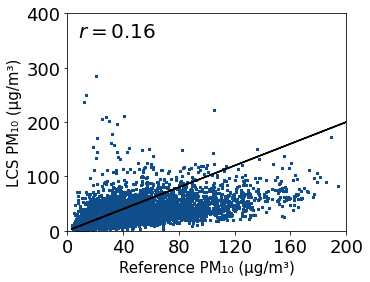

In [354]:
fig= plt.figure(figsize=(5,4))
ax = fig.add_subplot(111)
#ax.patch.set_facecolor('lightblue')
#ax.patch.set_alpha(0.3)
#m0, b0 = np.polyfit(np.array(y_test), np.array(lab1), 1)
#plt.plot(np.array(y_test), m0*np.array(y_test) + b0,color='#426eff',linewidth=4)
#m1, b1 = np.polyfit(np.array(y_test), np.array(pred_lr), 1)
#plt.plot(np.array(y_test), m1*np.array(y_test) + b1,color='#513e00',linewidth=4)
#m2, b2 = np.polyfit(np.array(y_test), np.array(pred_svr), 1)
#plt.plot(np.array(y_test), m2*np.array(y_test) + b2,color='brown',linewidth=4)
#m3, b3 = np.polyfit(np.array(y_test), np.array(pred_rf), 1)
#plt.plot(np.array(y_test), m3*np.array(y_test) + b3,color='indigo',linewidth=4)
#m4, b4 = np.polyfit(np.array(y_test), np.array(pred_ann), 1)
#plt.plot(np.array(y_test), m4*np.array(y_test) + b4,color='tomato',linewidth=4)
#m5, b5 = np.polyfit(np.array(y_test), np.array(pred_xgb), 1)
#plt.plot(np.array(y_test), m5*np.array(y_test) + b5,color='darkgoldenrod',linewidth=4)
plt.scatter(np.array(y_test),np.array(lab1),color='#104E8B',marker="$\\bigoplus$",s=5)
#plt.scatter(np.array(y_test),np.array(pred),color='teal',marker="$\\bigoplus$",s=10)
#plt.scatter(np.array(y_test),np.array(pred_lr),color='#513e00',marker='P')
#plt.scatter(np.array(y_test),np.array(pred_svr),color='brown',marker='d')
#plt.scatter(np.array(y_test),np.array(pred_rf),color='indigo',marker='*',s=30)
#plt.scatter(np.array(y_test),np.array(pred_ann),color='tomato',marker='s')
#plt.scatter(np.array(y_test),np.array(pred_xgb),color='darkgoldenrod',marker='1',s=15)
plt.plot(np.array(y_test),np.array(y_test), c ="black",linewidth=1.5)
#ax.spines['right'].set_visible(False)
#ax.spines['top'].set_visible(False)
ax.set_ylim(bottom=0)
ax.set_xlim(left=0)
plt.xlabel('Reference PM10'.translate(SUB) +  ' (µg/m3)'.translate(SUP),fontsize=15)
plt.ylabel('LCS PM10'.translate(SUB) +  ' (µg/m3)'.translate(SUP),fontsize=15)
#plt.legend(['1:1','N3','RF'
            #], loc = 2, bbox_to_anchor = (0,1),fontsize=12)
#plt.title('CO Sensor',fontsize=18 )
A=[Pearson_1]
#ax.text(1800, 2900, r'$ r=$'+str(A[0]), fontsize=13)
#ax.text(200, 2900, 'LAB', fontsize=17)
#plt.title(r'$ r=$'+str(A[0]))
          #,
          #fontsize=12)
#plt.grid(linestyle='-.',linewidth=0.1)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.show
#plt.xticks(np.arange(0,2.9, step=1))
plt.xticks(np.arange(0,201, step=40))
plt.yticks(np.arange(0,501, step=100))
plt.xlim(0, 200)
plt.ylim(0, 400)
plt.show
textstr = r'$r=%.2f$' % (A[0],)
#textstr = '\n'.join(('LAB',r'$r=%.2f$' % (A[0], ) ))

props = dict(boxstyle='round', facecolor='white', alpha=1)

#place a text box in upper left in axes coords
ax.text(0.04, 0.96, textstr, transform=ax.transAxes, fontsize=20,
        verticalalignment='top')

plt.savefig("R1_10_OPC.pdf",format="pdf", bbox_inches="tight",dpi=1000)
#plt.savefig("fig4d.pdf", format="pdf", bbox_inches="tight")
plt.show()

In [355]:
err=(np.array(lab1)-np.array(y_test))/np.array(y_test)
err1=[]
err2=[]
y_test1=[]
y_test2=[]
for i in range(len(err)):
    if err[i]>=-0.4 and err[i]<=0.4:
        err1.append(err[i])
        y_test1.append(y_test[i])
    else:
        err2.append(err[i])
        y_test2.append(y_test[i])
Err_lab=np.round((len(err1)/len(err))*100)

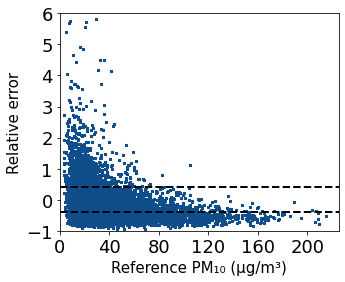

In [356]:
#err=(np.array(lab1)-np.array(y_test))/np.array(y_test)
fig= plt.figure(figsize=(5,4))
ax = fig.add_subplot(111)
#ax.patch.set_facecolor('lightblue')
#ax.patch.set_alpha(0.3)
#m0, b0 = np.polyfit(np.array(y_test), np.array(lab1), 1)
#plt.plot(np.array(y_test), m0*np.array(y_test) + b0,color='#426eff',linewidth=4)
#m1, b1 = np.polyfit(np.array(y_test), np.array(pred_lr), 1)
#plt.plot(np.array(y_test), m1*np.array(y_test) + b1,color='#513e00',linewidth=4)
#m2, b2 = np.polyfit(np.array(y_test), np.array(pred_svr), 1)
#plt.plot(np.array(y_test), m2*np.array(y_test) + b2,color='brown',linewidth=4)
#m3, b3 = np.polyfit(np.array(y_test), np.array(pred_rf), 1)
#plt.plot(np.array(y_test), m3*np.array(y_test) + b3,color='indigo',linewidth=4)
#m4, b4 = np.polyfit(np.array(y_test), np.array(pred_ann), 1)
#plt.plot(np.array(y_test), m4*np.array(y_test) + b4,color='tomato',linewidth=4)
#m5, b5 = np.polyfit(np.array(y_test), np.array(pred_xgb), 1)
#plt.plot(np.array(y_test), m5*np.array(y_test) + b5,color='darkgoldenrod',linewidth=4)
#plt.scatter(np.array(y_test1),err1,color='teal',marker="$\\bigoplus$",s=5)
plt.scatter(np.array(y_test),err,color='#104E8B',marker="$\\bigoplus$",s=5)
#plt.scatter(np.array(y_test),np.array(pred),color='teal',marker="$\\bigoplus$",s=10)
#plt.scatter(np.array(y_test),np.array(pred_lr),color='#513e00',marker='P')
#plt.scatter(np.array(y_test),np.array(pred_svr),color='brown',marker='d')
#plt.scatter(np.array(y_test),np.array(pred_rf),color='indigo',marker='*',s=30)
#plt.scatter(np.array(y_test),np.array(pred_ann),color='tomato',marker='s')
#plt.scatter(np.array(y_test),np.array(pred_xgb),color='darkgoldenrod',marker='1',s=15)
#plt.plot(np.array(y_test),np.array(y_test), c ="black",linewidth=1.5)
#ax.spines['right'].set_visible(False)
#ax.spines['top'].set_visible(False)
ax.set_ylim(bottom=0)
ax.set_xlim(left=0)
plt.xlabel('Reference PM10'.translate(SUB) +  ' (µg/m3)'.translate(SUP),fontsize=15)
plt.ylabel('Relative error',fontsize=15)
#plt.legend(['1:1','N3','RF'
            #], loc = 2, bbox_to_anchor = (0,1),fontsize=12)
#plt.title('CO Sensor',fontsize=18 )
A=[Pearson_1]
#ax.text(1800, 2900, r'$ r=$'+str(A[0]), fontsize=13)
#ax.text(200, 2900, 'LAB', fontsize=17)
#plt.title(r'$ r=$'+str(A[0]))
          #,
          #fontsize=12)
#plt.grid(linestyle='-.',linewidth=0.1)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.show
#plt.xticks(np.arange(0,2.9, step=1))
plt.xticks(np.arange(0,201, step=40))
plt.yticks(np.arange(-1,7, step=1))
plt.ylim(-1, 6)
plt.axhline(y=-0.4, color='black', linestyle='--', linewidth=2)
plt.axhline(y=0.4, color='black', linestyle='--',linewidth=2)
#textstr = '\n'.join(('LAB',r'$r=%.2f$' % (A[0], ) ))

#props = dict(boxstyle='round', facecolor='white', alpha=1)

#place a text box in upper left in axes coords
#ax.text(0.04, 0.96, textstr, transform=ax.transAxes, fontsize=20,
        #verticalalignment='top', bbox=props)

plt.savefig("R1_10_OPC_err.pdf",format="pdf", bbox_inches="tight",dpi=1000)
#plt.savefig("fig4d.pdf", format="pdf", bbox_inches="tight")
plt.show()

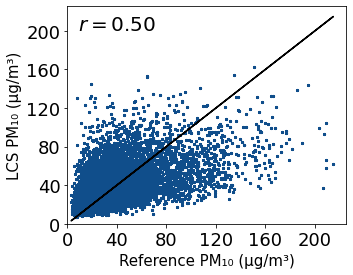

In [357]:
fig= plt.figure(figsize=(5,4))
ax = fig.add_subplot(111)
#ax.patch.set_facecolor('lightblue')
#ax.patch.set_alpha(0.3)
#m0, b0 = np.polyfit(np.array(y_test), np.array(lab1), 1)
#plt.plot(np.array(y_test), m0*np.array(y_test) + b0,color='#426eff',linewidth=4)
#m1, b1 = np.polyfit(np.array(y_test), np.array(pred_lr), 1)
#plt.plot(np.array(y_test), m1*np.array(y_test) + b1,color='#513e00',linewidth=4)
#m2, b2 = np.polyfit(np.array(y_test), np.array(pred_svr), 1)
#plt.plot(np.array(y_test), m2*np.array(y_test) + b2,color='brown',linewidth=4)
#m3, b3 = np.polyfit(np.array(y_test), np.array(pred_rf), 1)
#plt.plot(np.array(y_test), m3*np.array(y_test) + b3,color='indigo',linewidth=4)
#m4, b4 = np.polyfit(np.array(y_test), np.array(pred_ann), 1)
#plt.plot(np.array(y_test), m4*np.array(y_test) + b4,color='tomato',linewidth=4)
#m5, b5 = np.polyfit(np.array(y_test), np.array(pred_xgb), 1)
#plt.plot(np.array(y_test), m5*np.array(y_test) + b5,color='darkgoldenrod',linewidth=4)
#plt.scatter(np.array(y_test),np.array(lab1),color='teal',marker="$\\bigoplus$",s=10)
plt.scatter(np.array(y_test),np.array(pred),color='#104E8B',marker="$\\bigoplus$",s=5)
#plt.scatter(np.array(y_test),np.array(pred_lr),color='#513e00',marker='P')
#plt.scatter(np.array(y_test),np.array(pred_svr),color='brown',marker='d')
#plt.scatter(np.array(y_test),np.array(pred_rf),color='indigo',marker='*',s=30)
#plt.scatter(np.array(y_test),np.array(pred_ann),color='tomato',marker='s')
#plt.scatter(np.array(y_test),np.array(pred_xgb),color='darkgoldenrod',marker='1',s=15)
plt.plot(np.array(y_test),np.array(y_test), c ="black",linewidth=1.5)
#ax.spines['right'].set_visible(False)
#ax.spines['top'].set_visible(False)
ax.set_ylim(bottom=0)
ax.set_xlim(left=0)
plt.xlabel('Reference PM10'.translate(SUB) +  ' (µg/m3)'.translate(SUP),fontsize=15)
plt.ylabel('LCS PM10'.translate(SUB) +  ' (µg/m3)'.translate(SUP),fontsize=15)
#plt.legend(['1:1','N3','RF'
            #], loc = 2, bbox_to_anchor = (0,1),fontsize=12)
#plt.title('CO Sensor',fontsize=18 )
A=[Pearson_2]
#ax.text(1800, 2900, r'$ r=$'+str(A[0]), fontsize=13)
#ax.text(200, 2900, 'LAB', fontsize=17)
#plt.title(r'$ r=$'+str(A[0]))
          #,
          #fontsize=12)
#plt.grid(linestyle='-.',linewidth=0.1)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.show
#plt.xticks(np.arange(0,2.9, step=1))
plt.xticks(np.arange(0,201, step=40))
plt.yticks(np.arange(0,201, step=40))
plt.show
textstr = r'$r=%.2f$' % (A[0],)
#'\n'.join(('RF',r'$r=%.2f$' % (A[0], ) ))

props = dict(boxstyle='round', facecolor='white', alpha=1)

#place a text box in upper left in axes coords
ax.text(0.04, 0.96, textstr, transform=ax.transAxes, fontsize=20,
        verticalalignment='top')

plt.savefig("R1_10_RF_O.pdf",format="pdf", bbox_inches="tight")
#plt.savefig("fig4d.pdf", format="pdf", bbox_inches="tight")
plt.show()

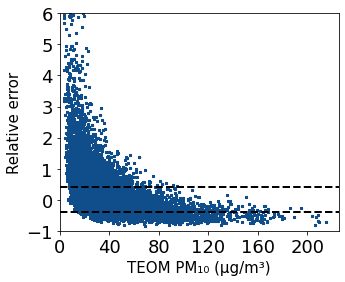

In [358]:
err=(np.array(pred)-np.array(y_test))/np.array(y_test)
fig= plt.figure(figsize=(5,4))
ax = fig.add_subplot(111)
#ax.patch.set_facecolor('lightblue')
#ax.patch.set_alpha(0.3)
#m0, b0 = np.polyfit(np.array(y_test), np.array(lab1), 1)
#plt.plot(np.array(y_test), m0*np.array(y_test) + b0,color='#426eff',linewidth=4)
#m1, b1 = np.polyfit(np.array(y_test), np.array(pred_lr), 1)
#plt.plot(np.array(y_test), m1*np.array(y_test) + b1,color='#513e00',linewidth=4)
#m2, b2 = np.polyfit(np.array(y_test), np.array(pred_svr), 1)
#plt.plot(np.array(y_test), m2*np.array(y_test) + b2,color='brown',linewidth=4)
#m3, b3 = np.polyfit(np.array(y_test), np.array(pred_rf), 1)
#plt.plot(np.array(y_test), m3*np.array(y_test) + b3,color='indigo',linewidth=4)
#m4, b4 = np.polyfit(np.array(y_test), np.array(pred_ann), 1)
#plt.plot(np.array(y_test), m4*np.array(y_test) + b4,color='tomato',linewidth=4)
#m5, b5 = np.polyfit(np.array(y_test), np.array(pred_xgb), 1)
#plt.plot(np.array(y_test), m5*np.array(y_test) + b5,color='darkgoldenrod',linewidth=4)
plt.scatter(np.array(y_test),err,color='#104E8B',marker="$\\bigoplus$",s=5)
#plt.scatter(np.array(y_test),np.array(pred),color='teal',marker="$\\bigoplus$",s=10)
#plt.scatter(np.array(y_test),np.array(pred_lr),color='#513e00',marker='P')
#plt.scatter(np.array(y_test),np.array(pred_svr),color='brown',marker='d')
#plt.scatter(np.array(y_test),np.array(pred_rf),color='indigo',marker='*',s=30)
#plt.scatter(np.array(y_test),np.array(pred_ann),color='tomato',marker='s')
#plt.scatter(np.array(y_test),np.array(pred_xgb),color='darkgoldenrod',marker='1',s=15)
#plt.plot(np.array(y_test),np.array(y_test), c ="black",linewidth=1.5)
#ax.spines['right'].set_visible(False)
#ax.spines['top'].set_visible(False)
ax.set_ylim(bottom=0)
ax.set_xlim(left=0)
plt.xlabel('TEOM PM10'.translate(SUB) +  ' (µg/m3)'.translate(SUP),fontsize=15)
plt.ylabel('Relative error',fontsize=15)
#plt.legend(['1:1','N3','RF'
            #], loc = 2, bbox_to_anchor = (0,1),fontsize=12)
#plt.title('CO Sensor',fontsize=18 )
A=[Pearson_1]
#ax.text(1800, 2900, r'$ r=$'+str(A[0]), fontsize=13)
#ax.text(200, 2900, 'LAB', fontsize=17)
#plt.title(r'$ r=$'+str(A[0]))
          #,
          #fontsize=12)
#plt.grid(linestyle='-.',linewidth=0.1)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.show
#plt.xticks(np.arange(0,2.9, step=1))
plt.xticks(np.arange(0,201, step=40))
plt.yticks(np.arange(-1,7, step=1))
plt.ylim(-1, 6)
plt.axhline(y=-0.4, color='black', linestyle='--', linewidth=2)
plt.axhline(y=0.4, color='black', linestyle='--',linewidth=2)
#textstr = '\n'.join(('LAB',r'$r=%.2f$' % (A[0], ) ))

#props = dict(boxstyle='round', facecolor='white', alpha=1)

#place a text box in upper left in axes coords
#ax.text(0.04, 0.96, textstr, transform=ax.transAxes, fontsize=20,
        #verticalalignment='top', bbox=props)

plt.savefig("R1_10_RF_O_err.pdf",format="pdf", bbox_inches="tight",dpi=1000)
#plt.savefig("fig4d.pdf", format="pdf", bbox_inches="tight")
plt.show()

## OPC+T

In [359]:
regressor=regressor.fit(X_train[['Sen_10','T']], y_train)
pred = regressor.predict(X_test[['Sen_10','T']])
lab1=X_test['Sen_10'].to_list()
Pearson_1=round(np.corrcoef(y_test, lab1)[0, 1],2)
Pearson_2=round(np.corrcoef(y_test, pred)[0, 1],2)
R2_lab=round(sm.r2_score(y_test, lab1), 2)
R2_RF=round(sm.r2_score(y_test, pred), 2)
R2_lab,R2_RF

(-5.03, 0.36)

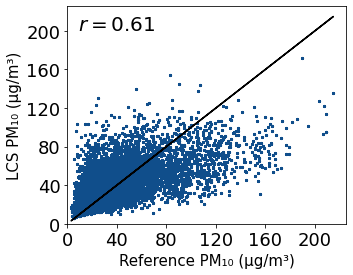

In [360]:
fig= plt.figure(figsize=(5,4))
ax = fig.add_subplot(111)
#ax.patch.set_facecolor('lightblue')
#ax.patch.set_alpha(0.3)
#m0, b0 = np.polyfit(np.array(y_test), np.array(lab1), 1)
#plt.plot(np.array(y_test), m0*np.array(y_test) + b0,color='#426eff',linewidth=4)
#m1, b1 = np.polyfit(np.array(y_test), np.array(pred_lr), 1)
#plt.plot(np.array(y_test), m1*np.array(y_test) + b1,color='#513e00',linewidth=4)
#m2, b2 = np.polyfit(np.array(y_test), np.array(pred_svr), 1)
#plt.plot(np.array(y_test), m2*np.array(y_test) + b2,color='brown',linewidth=4)
#m3, b3 = np.polyfit(np.array(y_test), np.array(pred_rf), 1)
#plt.plot(np.array(y_test), m3*np.array(y_test) + b3,color='indigo',linewidth=4)
#m4, b4 = np.polyfit(np.array(y_test), np.array(pred_ann), 1)
#plt.plot(np.array(y_test), m4*np.array(y_test) + b4,color='tomato',linewidth=4)
#m5, b5 = np.polyfit(np.array(y_test), np.array(pred_xgb), 1)
#plt.plot(np.array(y_test), m5*np.array(y_test) + b5,color='darkgoldenrod',linewidth=4)
#plt.scatter(np.array(y_test),np.array(lab1),color='teal',marker="$\\bigoplus$",s=10)
plt.scatter(np.array(y_test),np.array(pred),color='#104E8B',marker="$\\bigoplus$",s=5)
#plt.scatter(np.array(y_test),np.array(pred_lr),color='#513e00',marker='P')
#plt.scatter(np.array(y_test),np.array(pred_svr),color='brown',marker='d')
#plt.scatter(np.array(y_test),np.array(pred_rf),color='indigo',marker='*',s=30)
#plt.scatter(np.array(y_test),np.array(pred_ann),color='tomato',marker='s')
#plt.scatter(np.array(y_test),np.array(pred_xgb),color='darkgoldenrod',marker='1',s=15)
plt.plot(np.array(y_test),np.array(y_test), c ="black",linewidth=1.5)
#ax.spines['right'].set_visible(False)
#ax.spines['top'].set_visible(False)
ax.set_ylim(bottom=0)
ax.set_xlim(left=0)
plt.xlabel('Reference PM10'.translate(SUB) +  ' (µg/m3)'.translate(SUP),fontsize=15)
plt.ylabel('LCS PM10'.translate(SUB) +  ' (µg/m3)'.translate(SUP),fontsize=15)
#plt.legend(['1:1','N3','RF'
            #], loc = 2, bbox_to_anchor = (0,1),fontsize=12)
#plt.title('CO Sensor',fontsize=18 )
A=[Pearson_2]
#ax.text(1800, 2900, r'$ r=$'+str(A[0]), fontsize=13)
#ax.text(200, 2900, 'LAB', fontsize=17)
#plt.title(r'$ r=$'+str(A[0]))
          #,
          #fontsize=12)
#plt.grid(linestyle='-.',linewidth=0.1)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.show
#plt.xticks(np.arange(0,2.9, step=1))
plt.xticks(np.arange(0,201, step=40))
plt.yticks(np.arange(0,201, step=40))
plt.show
textstr = r'$r=%.2f$' % (A[0],)
#textstr = '\n'.join(('RF',r'$r=%.2f$' % (A[0], ) ))

props = dict(boxstyle='round', facecolor='white', alpha=1)

#place a text box in upper left in axes coords
ax.text(0.04, 0.96, textstr, transform=ax.transAxes, fontsize=20,
        verticalalignment='top')

plt.savefig("R1_10_RF_OT.pdf",format="pdf", bbox_inches="tight")
#plt.savefig("fig4d.pdf", format="pdf", bbox_inches="tight")
plt.show()

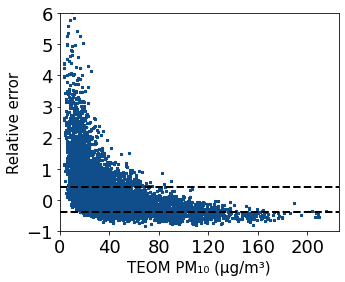

In [361]:
err=(np.array(pred)-np.array(y_test))/np.array(y_test)
fig= plt.figure(figsize=(5,4))
ax = fig.add_subplot(111)
#ax.patch.set_facecolor('lightblue')
#ax.patch.set_alpha(0.3)
#m0, b0 = np.polyfit(np.array(y_test), np.array(lab1), 1)
#plt.plot(np.array(y_test), m0*np.array(y_test) + b0,color='#426eff',linewidth=4)
#m1, b1 = np.polyfit(np.array(y_test), np.array(pred_lr), 1)
#plt.plot(np.array(y_test), m1*np.array(y_test) + b1,color='#513e00',linewidth=4)
#m2, b2 = np.polyfit(np.array(y_test), np.array(pred_svr), 1)
#plt.plot(np.array(y_test), m2*np.array(y_test) + b2,color='brown',linewidth=4)
#m3, b3 = np.polyfit(np.array(y_test), np.array(pred_rf), 1)
#plt.plot(np.array(y_test), m3*np.array(y_test) + b3,color='indigo',linewidth=4)
#m4, b4 = np.polyfit(np.array(y_test), np.array(pred_ann), 1)
#plt.plot(np.array(y_test), m4*np.array(y_test) + b4,color='tomato',linewidth=4)
#m5, b5 = np.polyfit(np.array(y_test), np.array(pred_xgb), 1)
#plt.plot(np.array(y_test), m5*np.array(y_test) + b5,color='darkgoldenrod',linewidth=4)
plt.scatter(np.array(y_test),err,color='#104E8B',marker="$\\bigoplus$",s=5)
#plt.scatter(np.array(y_test),np.array(pred),color='teal',marker="$\\bigoplus$",s=10)
#plt.scatter(np.array(y_test),np.array(pred_lr),color='#513e00',marker='P')
#plt.scatter(np.array(y_test),np.array(pred_svr),color='brown',marker='d')
#plt.scatter(np.array(y_test),np.array(pred_rf),color='indigo',marker='*',s=30)
#plt.scatter(np.array(y_test),np.array(pred_ann),color='tomato',marker='s')
#plt.scatter(np.array(y_test),np.array(pred_xgb),color='darkgoldenrod',marker='1',s=15)
#plt.plot(np.array(y_test),np.array(y_test), c ="black",linewidth=1.5)
#ax.spines['right'].set_visible(False)
#ax.spines['top'].set_visible(False)
ax.set_ylim(bottom=0)
ax.set_xlim(left=0)
plt.xlabel('TEOM PM10'.translate(SUB) +  ' (µg/m3)'.translate(SUP),fontsize=15)
plt.ylabel('Relative error',fontsize=15)
#plt.legend(['1:1','N3','RF'
            #], loc = 2, bbox_to_anchor = (0,1),fontsize=12)
#plt.title('CO Sensor',fontsize=18 )
A=[Pearson_1]
#ax.text(1800, 2900, r'$ r=$'+str(A[0]), fontsize=13)
#ax.text(200, 2900, 'LAB', fontsize=17)
#plt.title(r'$ r=$'+str(A[0]))
          #,
          #fontsize=12)
#plt.grid(linestyle='-.',linewidth=0.1)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.show
#plt.xticks(np.arange(0,2.9, step=1))
plt.xticks(np.arange(0,201, step=40))
plt.yticks(np.arange(-1,7, step=1))
plt.ylim(-1, 6)
plt.axhline(y=-0.4, color='black', linestyle='--', linewidth=2)
plt.axhline(y=0.4, color='black', linestyle='--',linewidth=2)
#textstr = '\n'.join(('LAB',r'$r=%.2f$' % (A[0], ) ))

#props = dict(boxstyle='round', facecolor='white', alpha=1)

#place a text box in upper left in axes coords
#ax.text(0.04, 0.96, textstr, transform=ax.transAxes, fontsize=20,
        #verticalalignment='top', bbox=props)

plt.savefig("R1_10_RF_OT_err.pdf",format="pdf", bbox_inches="tight",dpi=1000)
#plt.savefig("fig4d.pdf", format="pdf", bbox_inches="tight")
plt.show()

## OPC+RH

In [362]:
X_train, X_test, y_train, y_test =train_test_split(X, y, test_size = 0.2,shuffle=True)
regressor=regressor.fit(X_train[['Sen_10','RH']], y_train)
pred = regressor.predict(X_test[['Sen_10','RH']])
lab1=X_test['Sen_10'].to_list()
Pearson_1=round(np.corrcoef(y_test, lab1)[0, 1],2)
Pearson_2=round(np.corrcoef(y_test, pred)[0, 1],2)
R2_lab=round(sm.r2_score(y_test, lab1), 2)
R2_RF=round(sm.r2_score(y_test, pred), 2)
R2_lab,R2_RF

(-21.47, 0.41)

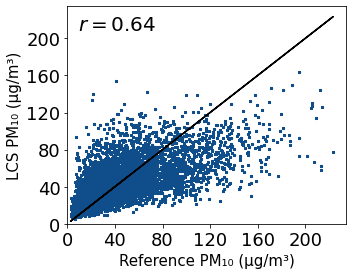

In [363]:
fig= plt.figure(figsize=(5,4))
ax = fig.add_subplot(111)
#ax.patch.set_facecolor('lightblue')
#ax.patch.set_alpha(0.3)
#m0, b0 = np.polyfit(np.array(y_test), np.array(lab1), 1)
#plt.plot(np.array(y_test), m0*np.array(y_test) + b0,color='#426eff',linewidth=4)
#m1, b1 = np.polyfit(np.array(y_test), np.array(pred_lr), 1)
#plt.plot(np.array(y_test), m1*np.array(y_test) + b1,color='#513e00',linewidth=4)
#m2, b2 = np.polyfit(np.array(y_test), np.array(pred_svr), 1)
#plt.plot(np.array(y_test), m2*np.array(y_test) + b2,color='brown',linewidth=4)
#m3, b3 = np.polyfit(np.array(y_test), np.array(pred_rf), 1)
#plt.plot(np.array(y_test), m3*np.array(y_test) + b3,color='indigo',linewidth=4)
#m4, b4 = np.polyfit(np.array(y_test), np.array(pred_ann), 1)
#plt.plot(np.array(y_test), m4*np.array(y_test) + b4,color='tomato',linewidth=4)
#m5, b5 = np.polyfit(np.array(y_test), np.array(pred_xgb), 1)
#plt.plot(np.array(y_test), m5*np.array(y_test) + b5,color='darkgoldenrod',linewidth=4)
#plt.scatter(np.array(y_test),np.array(lab1),color='teal',marker="$\\bigoplus$",s=10)
plt.scatter(np.array(y_test),np.array(pred),color='#104E8B',marker="$\\bigoplus$",s=5)
#plt.scatter(np.array(y_test),np.array(pred_lr),color='#513e00',marker='P')
#plt.scatter(np.array(y_test),np.array(pred_svr),color='brown',marker='d')
#plt.scatter(np.array(y_test),np.array(pred_rf),color='indigo',marker='*',s=30)
#plt.scatter(np.array(y_test),np.array(pred_ann),color='tomato',marker='s')
#plt.scatter(np.array(y_test),np.array(pred_xgb),color='darkgoldenrod',marker='1',s=15)
plt.plot(np.array(y_test),np.array(y_test), c ="black",linewidth=1.5)
#ax.spines['right'].set_visible(False)
#ax.spines['top'].set_visible(False)
ax.set_ylim(bottom=0)
ax.set_xlim(left=0)
plt.xlabel('Reference PM10'.translate(SUB) +  ' (µg/m3)'.translate(SUP),fontsize=15)
plt.ylabel('LCS PM10'.translate(SUB) +  ' (µg/m3)'.translate(SUP),fontsize=15)
#plt.legend(['1:1','N3','RF'
            #], loc = 2, bbox_to_anchor = (0,1),fontsize=12)
#plt.title('CO Sensor',fontsize=18 )
A=[Pearson_2]
#ax.text(1800, 2900, r'$ r=$'+str(A[0]), fontsize=13)
#ax.text(200, 2900, 'LAB', fontsize=17)
#plt.title(r'$ r=$'+str(A[0]))
          #,
          #fontsize=12)
#plt.grid(linestyle='-.',linewidth=0.1)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.show
#plt.xticks(np.arange(0,2.9, step=1))
plt.xticks(np.arange(0,201, step=40))
plt.yticks(np.arange(0,201, step=40))
plt.show
textstr = r'$r=%.2f$' % (A[0],)
#textstr = '\n'.join(('RF',r'$r=%.2f$' % (A[0], ) ))

props = dict(boxstyle='round', facecolor='white', alpha=1)

#place a text box in upper left in axes coords
ax.text(0.04, 0.96, textstr, transform=ax.transAxes, fontsize=20,
        verticalalignment='top')

plt.savefig("R1_10_RF_ORH.pdf",format="pdf", bbox_inches="tight")
#plt.savefig("fig4d.pdf", format="pdf", bbox_inches="tight")
plt.show()

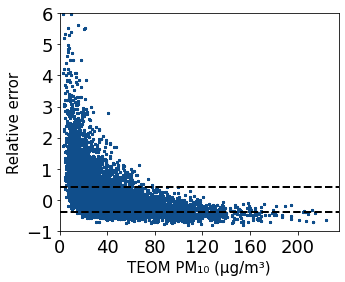

In [364]:
err=(np.array(pred)-np.array(y_test))/np.array(y_test)
fig= plt.figure(figsize=(5,4))
ax = fig.add_subplot(111)
#ax.patch.set_facecolor('lightblue')
#ax.patch.set_alpha(0.3)
#m0, b0 = np.polyfit(np.array(y_test), np.array(lab1), 1)
#plt.plot(np.array(y_test), m0*np.array(y_test) + b0,color='#426eff',linewidth=4)
#m1, b1 = np.polyfit(np.array(y_test), np.array(pred_lr), 1)
#plt.plot(np.array(y_test), m1*np.array(y_test) + b1,color='#513e00',linewidth=4)
#m2, b2 = np.polyfit(np.array(y_test), np.array(pred_svr), 1)
#plt.plot(np.array(y_test), m2*np.array(y_test) + b2,color='brown',linewidth=4)
#m3, b3 = np.polyfit(np.array(y_test), np.array(pred_rf), 1)
#plt.plot(np.array(y_test), m3*np.array(y_test) + b3,color='indigo',linewidth=4)
#m4, b4 = np.polyfit(np.array(y_test), np.array(pred_ann), 1)
#plt.plot(np.array(y_test), m4*np.array(y_test) + b4,color='tomato',linewidth=4)
#m5, b5 = np.polyfit(np.array(y_test), np.array(pred_xgb), 1)
#plt.plot(np.array(y_test), m5*np.array(y_test) + b5,color='darkgoldenrod',linewidth=4)
plt.scatter(np.array(y_test),err,color='#104E8B',marker="$\\bigoplus$",s=5)
#plt.scatter(np.array(y_test),np.array(pred),color='teal',marker="$\\bigoplus$",s=10)
#plt.scatter(np.array(y_test),np.array(pred_lr),color='#513e00',marker='P')
#plt.scatter(np.array(y_test),np.array(pred_svr),color='brown',marker='d')
#plt.scatter(np.array(y_test),np.array(pred_rf),color='indigo',marker='*',s=30)
#plt.scatter(np.array(y_test),np.array(pred_ann),color='tomato',marker='s')
#plt.scatter(np.array(y_test),np.array(pred_xgb),color='darkgoldenrod',marker='1',s=15)
#plt.plot(np.array(y_test),np.array(y_test), c ="black",linewidth=1.5)
#ax.spines['right'].set_visible(False)
#ax.spines['top'].set_visible(False)
ax.set_ylim(bottom=0)
ax.set_xlim(left=0)
plt.xlabel('TEOM PM10'.translate(SUB) +  ' (µg/m3)'.translate(SUP),fontsize=15)
plt.ylabel('Relative error',fontsize=15)
#plt.legend(['1:1','N3','RF'
            #], loc = 2, bbox_to_anchor = (0,1),fontsize=12)
#plt.title('CO Sensor',fontsize=18 )
A=[Pearson_1]
#ax.text(1800, 2900, r'$ r=$'+str(A[0]), fontsize=13)
#ax.text(200, 2900, 'LAB', fontsize=17)
#plt.title(r'$ r=$'+str(A[0]))
          #,
          #fontsize=12)
#plt.grid(linestyle='-.',linewidth=0.1)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.show
#plt.xticks(np.arange(0,2.9, step=1))
plt.xticks(np.arange(0,201, step=40))
plt.yticks(np.arange(-1,7, step=1))
plt.axhline(y=-0.4, color='black', linestyle='--', linewidth=2)
plt.axhline(y=0.4, color='black', linestyle='--',linewidth=2)
plt.ylim(-1, 6)
#textstr = '\n'.join(('LAB',r'$r=%.2f$' % (A[0], ) ))

#props = dict(boxstyle='round', facecolor='white', alpha=1)

#place a text box in upper left in axes coords
#ax.text(0.04, 0.96, textstr, transform=ax.transAxes, fontsize=20,
        #verticalalignment='top', bbox=props)

plt.savefig("R1_10_RF_ORH_err.pdf",format="pdf", bbox_inches="tight",dpi=1000)
#plt.savefig("fig4d.pdf", format="pdf", bbox_inches="tight")
plt.show()

## OPC+T+RH

In [386]:
regressor=regressor.fit(X_train[['Sen_2.5','T','RH','Month','Day_of_week','Hour']], y_train)
pred = regressor.predict(X_test[['Sen_2.5','T','RH','Month','Day_of_week','Hour']])
lab1=X_test['Sen_2.5'].to_list()
Pearson_1=round(np.corrcoef(y_test, lab1)[0, 1],2)
Pearson_2=round(np.corrcoef(y_test, pred)[0, 1],2)
R2_lab=round(sm.r2_score(y_test, lab1), 2)
R2_RF=round(sm.r2_score(y_test, pred), 2)
R2_lab,R2_RF

(-0.09, 0.94)

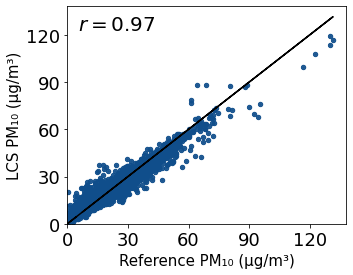

In [388]:
fig= plt.figure(figsize=(5,4))
ax = fig.add_subplot(111)
#ax.patch.set_facecolor('lightblue')
#ax.patch.set_alpha(0.3)
#m0, b0 = np.polyfit(np.array(y_test), np.array(lab1), 1)
#plt.plot(np.array(y_test), m0*np.array(y_test) + b0,color='#426eff',linewidth=4)
#m1, b1 = np.polyfit(np.array(y_test), np.array(pred_lr), 1)
#plt.plot(np.array(y_test), m1*np.array(y_test) + b1,color='#513e00',linewidth=4)
#m2, b2 = np.polyfit(np.array(y_test), np.array(pred_svr), 1)
#plt.plot(np.array(y_test), m2*np.array(y_test) + b2,color='brown',linewidth=4)
#m3, b3 = np.polyfit(np.array(y_test), np.array(pred_rf), 1)
#plt.plot(np.array(y_test), m3*np.array(y_test) + b3,color='indigo',linewidth=4)
#m4, b4 = np.polyfit(np.array(y_test), np.array(pred_ann), 1)
#plt.plot(np.array(y_test), m4*np.array(y_test) + b4,color='tomato',linewidth=4)
#m5, b5 = np.polyfit(np.array(y_test), np.array(pred_xgb), 1)
#plt.plot(np.array(y_test), m5*np.array(y_test) + b5,color='darkgoldenrod',linewidth=4)
#plt.scatter(np.array(y_test),np.array(lab1),color='teal',marker="$\\bigoplus$",s=10)
plt.scatter(np.array(y_test),np.array(pred),color='#104E8B',marker="$\\bigoplus$",s=20, alpha=0.9)
#plt.scatter(np.array(y_test),np.array(pred_lr),color='#513e00',marker='P')
#plt.scatter(np.array(y_test),np.array(pred_svr),color='brown',marker='d')
#plt.scatter(np.array(y_test),np.array(pred_rf),color='indigo',marker='*',s=30)
#plt.scatter(np.array(y_test),np.array(pred_ann),color='tomato',marker='s')
#plt.scatter(np.array(y_test),np.array(pred_xgb),color='darkgoldenrod',marker='1',s=15)
plt.plot(np.array(y_test),np.array(y_test), c ="black",linewidth=1.5)
#ax.spines['right'].set_visible(False)
#ax.spines['top'].set_visible(False)
ax.set_ylim(bottom=0)
ax.set_xlim(left=0)
plt.xlabel('Reference PM10'.translate(SUB) +  ' (µg/m3)'.translate(SUP),fontsize=15)
plt.ylabel('LCS PM10'.translate(SUB) +  ' (µg/m3)'.translate(SUP),fontsize=15)
#plt.legend(['1:1','N3','RF'
            #], loc = 2, bbox_to_anchor = (0,1),fontsize=12)
#plt.title('CO Sensor',fontsize=18 )
A=[Pearson_2]
#ax.text(1800, 2900, r'$ r=$'+str(A[0]), fontsize=13)
#ax.text(200, 2900, 'LAB', fontsize=17)
#plt.title(r'$ r=$'+str(A[0]))
          #,
          #fontsize=12)
#plt.grid(linestyle='-.',linewidth=0.1)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.show
#plt.xticks(np.arange(0,2.9, step=1))
plt.xticks(np.arange(0,121, step=30))
plt.yticks(np.arange(0,121, step=30))
plt.show
textstr = r'$r=%.2f$' % (0.97,)
#textstr = '\n'.join(('RF',r'$r=%.2f$' % (A[0], ) ))

props = dict(boxstyle='round', facecolor='white', alpha=1)

#place a text box in upper left in axes coords
ax.text(0.04, 0.96, textstr, transform=ax.transAxes, fontsize=20,
        verticalalignment='top')

plt.savefig("R1_2.5_RF_OTRH.pdf",format="pdf", bbox_inches="tight", dpi=1000)
#plt.savefig("fig4d.pdf", format="pdf", bbox_inches="tight")
plt.show()

In [367]:
err=(np.array(pred)-np.array(y_test))/np.array(y_test)
err1=[]
err2=[]
y_test1=[]
y_test2=[]
for i in range(len(err)):
    if err[i]>=-0.4 and err[i]<=0.4:
        err1.append(err[i])
        y_test1.append(y_test[i])
    else:
        err2.append(err[i])
        y_test2.append(y_test[i])
Err_rf=np.round((len(err1)/len(err))*100)

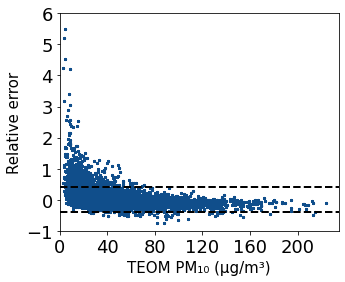

In [368]:
#err=(np.array(pred)-np.array(y_test))/np.array(y_test)
fig= plt.figure(figsize=(5,4))
ax = fig.add_subplot(111)
#ax.patch.set_facecolor('lightblue')
#ax.patch.set_alpha(0.3)
#m0, b0 = np.polyfit(np.array(y_test), np.array(lab1), 1)
#plt.plot(np.array(y_test), m0*np.array(y_test) + b0,color='#426eff',linewidth=4)
#m1, b1 = np.polyfit(np.array(y_test), np.array(pred_lr), 1)
#plt.plot(np.array(y_test), m1*np.array(y_test) + b1,color='#513e00',linewidth=4)
#m2, b2 = np.polyfit(np.array(y_test), np.array(pred_svr), 1)
#plt.plot(np.array(y_test), m2*np.array(y_test) + b2,color='brown',linewidth=4)
#m3, b3 = np.polyfit(np.array(y_test), np.array(pred_rf), 1)
#plt.plot(np.array(y_test), m3*np.array(y_test) + b3,color='indigo',linewidth=4)
#m4, b4 = np.polyfit(np.array(y_test), np.array(pred_ann), 1)
#plt.plot(np.array(y_test), m4*np.array(y_test) + b4,color='tomato',linewidth=4)
#m5, b5 = np.polyfit(np.array(y_test), np.array(pred_xgb), 1)
#plt.plot(np.array(y_test), m5*np.array(y_test) + b5,color='darkgoldenrod',linewidth=4)
plt.scatter(np.array(y_test),err,color='#104E8B',marker="$\\bigoplus$",s=5)
#plt.scatter(np.array(y_test),np.array(pred),color='teal',marker="$\\bigoplus$",s=10)
#plt.scatter(np.array(y_test),np.array(pred_lr),color='#513e00',marker='P')
#plt.scatter(np.array(y_test),np.array(pred_svr),color='brown',marker='d')
#plt.scatter(np.array(y_test),np.array(pred_rf),color='indigo',marker='*',s=30)
#plt.scatter(np.array(y_test),np.array(pred_ann),color='tomato',marker='s')
#plt.scatter(np.array(y_test),np.array(pred_xgb),color='darkgoldenrod',marker='1',s=15)
#plt.plot(np.array(y_test),np.array(y_test), c ="black",linewidth=1.5)
#ax.spines['right'].set_visible(False)
#ax.spines['top'].set_visible(False)
ax.set_ylim(bottom=0)
ax.set_xlim(left=0)
plt.xlabel('TEOM PM10'.translate(SUB) +  ' (µg/m3)'.translate(SUP),fontsize=15)
plt.ylabel('Relative error',fontsize=15)
#plt.legend(['1:1','N3','RF'
            #], loc = 2, bbox_to_anchor = (0,1),fontsize=12)
#plt.title('CO Sensor',fontsize=18 )
A=[Pearson_1]
#ax.text(1800, 2900, r'$ r=$'+str(A[0]), fontsize=13)
#ax.text(200, 2900, 'LAB', fontsize=17)
#plt.title(r'$ r=$'+str(A[0]))
          #,
          #fontsize=12)
#plt.grid(linestyle='-.',linewidth=0.1)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.show
#plt.xticks(np.arange(0,2.9, step=1))
plt.xticks(np.arange(0,201, step=40))
plt.yticks(np.arange(-1,7, step=1))
plt.ylim(-1, 6)
plt.axhline(y=-0.4, color='black', linestyle='--', linewidth=2)
plt.axhline(y=0.4, color='black', linestyle='--',linewidth=2)
#textstr = '\n'.join(('LAB',r'$r=%.2f$' % (A[0], ) ))

#props = dict(boxstyle='round', facecolor='white', alpha=1)

#place a text box in upper left in axes coords
#ax.text(0.04, 0.96, textstr, transform=ax.transAxes, fontsize=20,
        #verticalalignment='top', bbox=props)

plt.savefig("R1_10_RF_OTRH_err.pdf",format="pdf", bbox_inches="tight",dpi=1000)
#plt.savefig("fig4d.pdf", format="pdf", bbox_inches="tight")
plt.show()

In [369]:
A1=R1_data['Sen_10'].to_list()
B1=R1_data['Ref_10'].to_list()
Pearson_1=round(np.corrcoef(y_test, lab1)[0, 1],2)
Pearson_2=round(np.corrcoef(A1, B1)[0, 1],2)

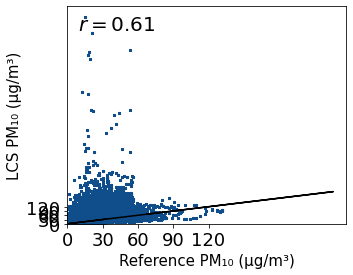

In [370]:
fig= plt.figure(figsize=(5,4))
ax = fig.add_subplot(111)
#ax.patch.set_facecolor('lightblue')
#ax.patch.set_alpha(0.3)
#m0, b0 = np.polyfit(np.array(y_test), np.array(lab1), 1)
#plt.plot(np.array(y_test), m0*np.array(y_test) + b0,color='#426eff',linewidth=4)
#m1, b1 = np.polyfit(np.array(y_test), np.array(pred_lr), 1)
#plt.plot(np.array(y_test), m1*np.array(y_test) + b1,color='#513e00',linewidth=4)
#m2, b2 = np.polyfit(np.array(y_test), np.array(pred_svr), 1)
#plt.plot(np.array(y_test), m2*np.array(y_test) + b2,color='brown',linewidth=4)
#m3, b3 = np.polyfit(np.array(y_test), np.array(pred_rf), 1)
#plt.plot(np.array(y_test), m3*np.array(y_test) + b3,color='indigo',linewidth=4)
#m4, b4 = np.polyfit(np.array(y_test), np.array(pred_ann), 1)
#plt.plot(np.array(y_test), m4*np.array(y_test) + b4,color='tomato',linewidth=4)
#m5, b5 = np.polyfit(np.array(y_test), np.array(pred_xgb), 1)
#plt.plot(np.array(y_test), m5*np.array(y_test) + b5,color='darkgoldenrod',linewidth=4)
#plt.scatter(np.array(y_test),np.array(lab1),color='teal',marker="$\\bigoplus$",s=10)
plt.scatter(np.array(B),np.array(A1),color='#104E8B',marker="$\\bigoplus$",s=5, alpha=1)
#plt.scatter(np.array(y_test),np.array(pred_lr),color='#513e00',marker='P')
#plt.scatter(np.array(y_test),np.array(pred_svr),color='brown',marker='d')
#plt.scatter(np.array(y_test),np.array(pred_rf),color='indigo',marker='*',s=30)
#plt.scatter(np.array(y_test),np.array(pred_ann),color='tomato',marker='s')
#plt.scatter(np.array(y_test),np.array(pred_xgb),color='darkgoldenrod',marker='1',s=15)
plt.plot(np.array(B1),np.array(B1), c ="black",linewidth=1.5)
#ax.spines['right'].set_visible(False)
#ax.spines['top'].set_visible(False)
ax.set_ylim(bottom=0)
ax.set_xlim(left=0)
plt.xlabel('Reference PM10'.translate(SUB) +  ' (µg/m3)'.translate(SUP),fontsize=15)
plt.ylabel('LCS PM10'.translate(SUB) +  ' (µg/m3)'.translate(SUP),fontsize=15)
#plt.legend(['1:1','N3','RF'
            #], loc = 2, bbox_to_anchor = (0,1),fontsize=12)
#plt.title('CO Sensor',fontsize=18 )
A=[Pearson_2]
#ax.text(1800, 2900, r'$ r=$'+str(A[0]), fontsize=13)
#ax.text(200, 2900, 'LAB', fontsize=17)
#plt.title(r'$ r=$'+str(A[0]))
          #,
          #fontsize=12)
#plt.grid(linestyle='-.',linewidth=0.1)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.show
#plt.xticks(np.arange(0,2.9, step=1))
plt.xticks(np.arange(0,121, step=30))
plt.yticks(np.arange(0,121, step=30))
plt.show
textstr = r'$r=%.2f$' % (A[0],)
#textstr = '\n'.join(('',r'$r=%.2f$' % (A[0], ) ))

props = dict(boxstyle='round', facecolor='white', alpha=1)

#place a text box in upper left in axes coords
ax.text(0.04, 0.96, textstr, transform=ax.transAxes, fontsize=20,
        verticalalignment='top')

plt.savefig("R1_10_LAB.pdf",format="pdf", bbox_inches="tight")
#plt.savefig("fig4d.pdf", format="pdf", bbox_inches="tight")
plt.show()

## Feature Importance

In [371]:
FI=regressor.feature_importances_
FI=np.round(FI*100)
FI

array([36., 13., 13., 10.,  7., 21.])

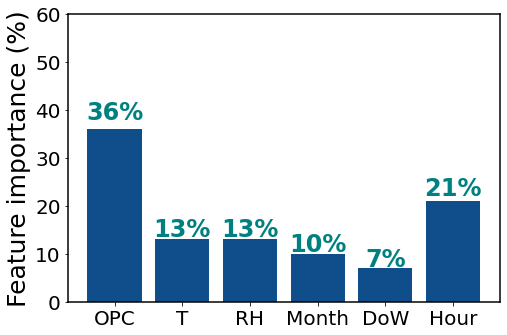

In [406]:
import matplotlib.pyplot as plt
fig = plt.figure()
ax = fig.add_axes([0,0,1,1])
langs = ['OPC', 'T', 'RH','Month','DoW','Hour']
students = [int(FI[0]),int(FI[1]),int(FI[2]),int(FI[3]),int(FI[4]),int(FI[5])]
graph=ax.bar(langs,students, color='#104E8B')
i = 0
for p in graph:
    width = p.get_width()
    height = p.get_height()
    x, y = p.get_xy()
    plt.text(x+width/2,
             y+height*1.06,
             str(students[i])+'%',
             ha='center',
             weight='bold',fontsize=24, color='teal')
    i+=1
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.yticks(np.arange(0,61, step=10))
plt.ylabel('Feature importance (%)', fontsize=25)
plt.setp(ax.spines.values(), linewidth=1.5)
#plt.title(r"$O_3$",fontsize=18)
plt.savefig("R1_10_FI.pdf", format="pdf", bbox_inches="tight")
plt.show()

## Points within error thresholds

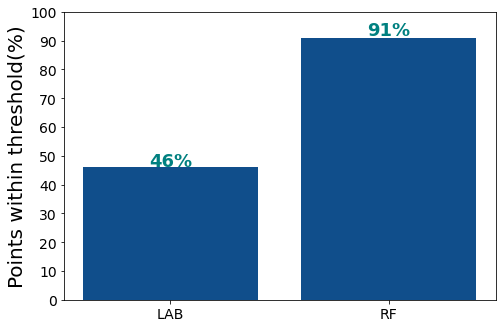

In [373]:
import matplotlib.pyplot as plt
fig = plt.figure()
ax = fig.add_axes([0,0,1,1])
langs = ['LAB', 'RF']
students = [int(Err_lab),int(Err_rf)]
graph=ax.bar(langs,students, color='#104E8B')
i = 0
for p in graph:
    width = p.get_width()
    height = p.get_height()
    x, y = p.get_xy()
    plt.text(x+width/2,
             y+height*1.01,
             str(students[i])+'%',
             ha='center',
             weight='bold',fontsize=18, color='teal')
    i+=1
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.yticks(np.arange(0,101, step=10))
plt.ylabel('Points within threshold(%)', fontsize=20)
#plt.title(r"$O_3$",fontsize=18)
plt.savefig("R1_10_ET.pdf", format="pdf", bbox_inches="tight")
plt.show()

scaler = StandardScaler()
scaler.fit(X_train)
X_train_scaled=scaler.transform(X_train)
X_test_scaled=scaler.transform(X_test)
model.fit(X_train_scaled, y_train, batch_size= 100, epochs=100, verbose= 0)

train_pred = model.predict(X_train_scaled)
test_pred = model.predict(X_test_scaled)
pred=[]
for i in range(len(test_pred)):
    pred.append(sum(list(test_pred[i])))
len(y_test)

In [374]:
subscript= str.maketrans("0123456789", "₀₁₂₃₄₅₆₇₈₉")
SUP = str.maketrans("0123456789", "⁰¹²³⁴⁵⁶⁷⁸⁹")

In [11]:
!pip install -U kaleido
import plotly.graph_objects as go
from functools import reduce
from itertools import product

z=[[0.12,0.23,0.51,0.64,0.61,0.62],
  [0.11,0.21,0.49,0.53,0.51,0.51],
  [0.61,0.64,0.62,0.74,0.7,0.69],
  [0.58,0.58,0.6,0.66,0.62,0.6]]
x=['<b>LAB</b>', '<b>LR</b>', '<b>SVR</b>', '<b>RF</b>', '<b>ANN</b>','<b>XGBoost</b>']
y=['<b>N3</b>'+ ' <b>PM10</b>','<b>N3</b>'+ ' <b>PM2.5</b>' , 
   '<b>R1</b>'+ ' <b>PM10</b>','<b>R1</b>'+ ' <b>PM2.5</b>']

def get_anno_text(z_value):
    annotations=[]
    a, b = len(z_value), len(z_value[0])
    flat_z = reduce(lambda x,y: x+y, z_value) # z_value.flat if you deal with numpy
    coords = product(range(a), range(b))
    for pos, elem in zip(coords, flat_z):
        annotations.append({'font': {'color': 'black'},
                    'showarrow': False,
                    'text': str(elem),
                    'x': pos[1],
                    'y': pos[0],
                        'font.size':22   })
    return annotations

fig = go.Figure(data=go.Heatmap(
                   z=z,
                   x=x,
                   y=y,
                   hoverongaps = True, colorscale ='Viridis',opacity=0.7))#matter#

fig.update_layout(title={'text': "",
        'y':0.8,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'},
           plot_bgcolor='rgba(0,0,0,0)',       
    annotations = get_anno_text(z),
                 width=1000,
height=400,xaxis={'side': 'top'})

fig.update_xaxes(tickfont = dict(size=16),linewidth=0.3, linecolor='black',
    
                 mirror=True)
fig.update_yaxes(tickfont = dict(size=16),linewidth=0.3, linecolor='black',
        
                 mirror=True)
fig.write_image("table1.pdf",engine="kaleido")
#plt.savefig("table2a.pdf", format="pdf", bbox_inches="tight")
fig.show()


You should consider upgrading via the '/Library/Frameworks/Python.framework/Versions/3.8/bin/python3 -m pip install --upgrade pip' command.


In [12]:
import plotly.graph_objects as go
from functools import reduce
from itertools import product

z=[[0.12,0.59,0.69,0.96,0.75,0.87],
  [0.11,0.51,0.63,0.98,0.72,0.86],
  [0.61,0.76,0.79,0.97,0.79,0.9],
  [0.58,0.61,0.7,0.98,0.79,0.9]]
x=['<b>LAB</b>', '<b>LR</b>', '<b>SVR</b>', '<b>RF</b>', '<b>ANN</b>','<b>XGBoost</b>']
y=['<b>N3</b>'+ ' <b>PM10</b>','<b>N3</b>'+ ' <b>PM2.5</b>' , 
   '<b>R1</b>'+ ' <b>PM10</b>','<b>R1</b>'+ ' <b>PM2.5</b>']

def get_anno_text(z_value):
    annotations=[]
    a, b = len(z_value), len(z_value[0])
    flat_z = reduce(lambda x,y: x+y, z_value) # z_value.flat if you deal with numpy
    coords = product(range(a), range(b))
    for pos, elem in zip(coords, flat_z):
        annotations.append({'font': {'color': 'black'},
                    'showarrow': False,
                    'text': str(elem),
                    'x': pos[1],
                    'y': pos[0],
                        'font.size':22   })
    return annotations

fig = go.Figure(data=go.Heatmap(
                   z=z,
                   x=x,
                   y=y,
                   hoverongaps = True, colorscale ='Viridis',opacity=0.7))#matter#

fig.update_layout(title={'text': "",
        'y':0.8,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'},
           plot_bgcolor='rgba(0,0,0,0)',       
    annotations = get_anno_text(z),
                 width=1000,
height=400,xaxis={'side': 'top'})

fig.update_xaxes(tickfont = dict(size=16),linewidth=0.3, linecolor='black',
    
                 mirror=True)
fig.update_yaxes(tickfont = dict(size=16),linewidth=0.3, linecolor='black',
        
                 mirror=True)
fig.write_image("table2.pdf",engine="kaleido")
#plt.savefig("table2a.pdf", format="pdf", bbox_inches="tight")
fig.show()


In [662]:
import pandas as pd
import numpy as np
R1_data= pd.read_csv('R1.csv')
R1_data.columns=['Sen_2.5','Sen_10','Ref_2.5','Ref_10','Time','T','RH']
R1_data=R1_data.dropna()
Time=R1_data['Time'].to_list()
time=[]
for i in range(len(Time)):
    time.append(float(abs(Time[i])))
Time=np.array(time)
Date=pd.to_datetime(Time-719529,unit='d').round('s')
R1_data['Date'] = Date.tolist()
R1_data=R1_data.set_index('Date')
R1_data.drop('Time',axis = 1, inplace = True)
R1_data.head()

,Sen_2.5,Sen_10,Ref_2.5,Ref_10,T,RH
Date,,,,,,
2019-10-02 13:00:00,37.606508,61.467964,16.945596,31.358817,30.55,44.88
2019-10-02 14:00:00,37.606508,61.467964,22.114387,45.218727,28.72,56.78
2019-10-02 15:00:00,8.507763,42.813486,22.611759,61.807504,27.38,57.16
2019-10-02 16:00:00,8.507763,42.813486,19.652068,41.656351,26.31,58.61
2019-10-02 17:00:00,8.507763,42.813486,17.954197,30.121207,28.52,50.16


In [663]:
import pandas as pd
import numpy as np
N3_data= pd.read_csv('N3.csv')
N3_data.columns=['Sen_2.5','Sen_10','Ref_2.5','Ref_10','Time','T','RH']
N3_data=N3_data.dropna()
Time=N3_data['Time'].to_list()
time=[]
for i in range(len(Time)):
    time.append(float(abs(Time[i])))
Time=np.array(time)
Date=pd.to_datetime(Time-719529,unit='d').round('s')
N3_data['Date'] = Date.tolist()
N3_data=N3_data.set_index('Date')
N3_data.drop('Time',axis = 1, inplace = True)
N3_data.tail()

,Sen_2.5,Sen_10,Ref_2.5,Ref_10,T,RH
Date,,,,,,
2020-11-09 19:00:00,15.255277,59.432720,34.47053,112.54680,13.66,84.61
2020-11-09 20:00:00,13.595549,49.218701,51.01247,185.77910,13.35,85.21
2020-11-09 21:00:00,15.531131,47.994590,50.29734,152.05290,13.12,85.77
2020-11-09 22:00:00,12.958598,38.296699,48.03581,122.83820,13.02,85.93
2020-11-09 23:00:00,12.374930,35.061428,41.15864,94.77707,12.66,86.06


In [664]:
SUB = str.maketrans("0123456789", "₀₁₂₃₄₅₆₇₈₉")
SUP = str.maketrans("0123456789", "⁰¹²³⁴⁵⁶⁷⁸⁹")

# RF

## PM2.5

## OPC

In [665]:
from sktime.performance_metrics.forecasting import sMAPE, smape_loss
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error as mae
import sklearn.metrics as sm
import matplotlib.pyplot as plt
#'Ref_NO2','Ref_SO2','Ref_O3',
#,'Month','Day_of_week','Day','Hour'
X=R1_data[['Sen_10']]
y=R1_data['Ref_10']
X_train, X_test, y_train, y_test =train_test_split(X, y, test_size = 0.2,shuffle=True)

In [666]:
X_train.shape

(2479, 1)

In [667]:
from sklearn.ensemble import RandomForestRegressor
  
 # create regressor object
regressor = RandomForestRegressor(n_estimators =500 ,min_samples_split=2,min_samples_leaf= 2,max_features= 'sqrt', 
                                  random_state = 0,max_depth=None,bootstrap=True)
  
  
# fit the regressor with x and y data
regressor=regressor.fit(X_train, y_train) 

In [668]:
pred = regressor.predict(X_test)
lab1=X_test['Sen_10'].to_list()
Pearson_1=round(np.corrcoef(y_test, lab1)[0, 1],2)
Pearson_2=round(np.corrcoef(y_test, pred)[0, 1],2)
R2_lab=round(sm.r2_score(y_test, lab1), 2)
R2_RF=round(sm.r2_score(y_test, pred), 2)
R2_lab,R2_RF

(0.38, 0.55)

In [669]:
Pearson_1,Pearson_2

(0.8, 0.74)

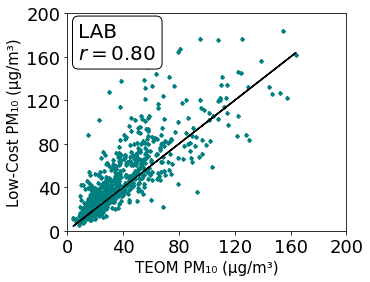

In [670]:
fig= plt.figure(figsize=(5,4))
ax = fig.add_subplot(111)
#ax.patch.set_facecolor('lightblue')
#ax.patch.set_alpha(0.3)
#m0, b0 = np.polyfit(np.array(y_test), np.array(lab1), 1)
#plt.plot(np.array(y_test), m0*np.array(y_test) + b0,color='#426eff',linewidth=4)
#m1, b1 = np.polyfit(np.array(y_test), np.array(pred_lr), 1)
#plt.plot(np.array(y_test), m1*np.array(y_test) + b1,color='#513e00',linewidth=4)
#m2, b2 = np.polyfit(np.array(y_test), np.array(pred_svr), 1)
#plt.plot(np.array(y_test), m2*np.array(y_test) + b2,color='brown',linewidth=4)
#m3, b3 = np.polyfit(np.array(y_test), np.array(pred_rf), 1)
#plt.plot(np.array(y_test), m3*np.array(y_test) + b3,color='indigo',linewidth=4)
#m4, b4 = np.polyfit(np.array(y_test), np.array(pred_ann), 1)
#plt.plot(np.array(y_test), m4*np.array(y_test) + b4,color='tomato',linewidth=4)
#m5, b5 = np.polyfit(np.array(y_test), np.array(pred_xgb), 1)
#plt.plot(np.array(y_test), m5*np.array(y_test) + b5,color='darkgoldenrod',linewidth=4)
plt.scatter(np.array(y_test),np.array(lab1),color='teal',marker="$\\bigoplus$",s=10)
#plt.scatter(np.array(y_test),np.array(pred),color='teal',marker="$\\bigoplus$",s=10)
#plt.scatter(np.array(y_test),np.array(pred_lr),color='#513e00',marker='P')
#plt.scatter(np.array(y_test),np.array(pred_svr),color='brown',marker='d')
#plt.scatter(np.array(y_test),np.array(pred_rf),color='indigo',marker='*',s=30)
#plt.scatter(np.array(y_test),np.array(pred_ann),color='tomato',marker='s')
#plt.scatter(np.array(y_test),np.array(pred_xgb),color='darkgoldenrod',marker='1',s=15)
plt.plot(np.array(y_test),np.array(y_test), c ="black",linewidth=1.5)
#ax.spines['right'].set_visible(False)
#ax.spines['top'].set_visible(False)
ax.set_ylim(bottom=0)
ax.set_xlim(left=0)
plt.xlabel('TEOM PM10'.translate(SUB) +  ' (µg/m3)'.translate(SUP),fontsize=15)
plt.ylabel('Low-Cost PM10'.translate(SUB) +  ' (µg/m3)'.translate(SUP),fontsize=15)
#plt.legend(['1:1','N3','RF'
            #], loc = 2, bbox_to_anchor = (0,1),fontsize=12)
#plt.title('CO Sensor',fontsize=18 )
A=[Pearson_1]
#ax.text(1800, 2900, r'$ r=$'+str(A[0]), fontsize=13)
#ax.text(200, 2900, 'LAB', fontsize=17)
#plt.title(r'$ r=$'+str(A[0]))
          #,
          #fontsize=12)
#plt.grid(linestyle='-.',linewidth=0.1)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.show
#plt.xticks(np.arange(0,2.9, step=1))
plt.xticks(np.arange(0,201, step=40))
plt.yticks(np.arange(0,201, step=40))
plt.show
textstr = '\n'.join(('LAB',r'$r=%.2f$' % (A[0], ) ))

props = dict(boxstyle='round', facecolor='white', alpha=1)

#place a text box in upper left in axes coords
ax.text(0.04, 0.96, textstr, transform=ax.transAxes, fontsize=20,
        verticalalignment='top', bbox=props)

plt.savefig("R1_10_OPC.pdf",format="pdf", bbox_inches="tight")
#plt.savefig("fig4d.pdf", format="pdf", bbox_inches="tight")
plt.show()

In [671]:
max(np.array(lab1)),max(np.array(y_test))

(184.08615397443, 163.854456666667)

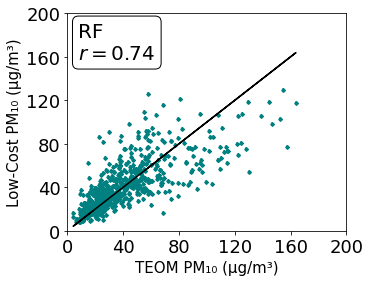

In [672]:
fig= plt.figure(figsize=(5,4))
ax = fig.add_subplot(111)
#ax.patch.set_facecolor('lightblue')
#ax.patch.set_alpha(0.3)
#m0, b0 = np.polyfit(np.array(y_test), np.array(lab1), 1)
#plt.plot(np.array(y_test), m0*np.array(y_test) + b0,color='#426eff',linewidth=4)
#m1, b1 = np.polyfit(np.array(y_test), np.array(pred_lr), 1)
#plt.plot(np.array(y_test), m1*np.array(y_test) + b1,color='#513e00',linewidth=4)
#m2, b2 = np.polyfit(np.array(y_test), np.array(pred_svr), 1)
#plt.plot(np.array(y_test), m2*np.array(y_test) + b2,color='brown',linewidth=4)
#m3, b3 = np.polyfit(np.array(y_test), np.array(pred_rf), 1)
#plt.plot(np.array(y_test), m3*np.array(y_test) + b3,color='indigo',linewidth=4)
#m4, b4 = np.polyfit(np.array(y_test), np.array(pred_ann), 1)
#plt.plot(np.array(y_test), m4*np.array(y_test) + b4,color='tomato',linewidth=4)
#m5, b5 = np.polyfit(np.array(y_test), np.array(pred_xgb), 1)
#plt.plot(np.array(y_test), m5*np.array(y_test) + b5,color='darkgoldenrod',linewidth=4)
#plt.scatter(np.array(y_test),np.array(lab1),color='teal',marker="$\\bigoplus$",s=10)
plt.scatter(np.array(y_test),np.array(pred),color='teal',marker="$\\bigoplus$",s=10)
#plt.scatter(np.array(y_test),np.array(pred_lr),color='#513e00',marker='P')
#plt.scatter(np.array(y_test),np.array(pred_svr),color='brown',marker='d')
#plt.scatter(np.array(y_test),np.array(pred_rf),color='indigo',marker='*',s=30)
#plt.scatter(np.array(y_test),np.array(pred_ann),color='tomato',marker='s')
#plt.scatter(np.array(y_test),np.array(pred_xgb),color='darkgoldenrod',marker='1',s=15)
plt.plot(np.array(y_test),np.array(y_test), c ="black",linewidth=1.5)
#ax.spines['right'].set_visible(False)
#ax.spines['top'].set_visible(False)
ax.set_ylim(bottom=0)
ax.set_xlim(left=0)
plt.xlabel('TEOM PM10'.translate(SUB) +  ' (µg/m3)'.translate(SUP),fontsize=15)
plt.ylabel('Low-Cost PM10'.translate(SUB) +  ' (µg/m3)'.translate(SUP),fontsize=15)
#plt.legend(['1:1','N3','RF'
            #], loc = 2, bbox_to_anchor = (0,1),fontsize=12)
#plt.title('CO Sensor',fontsize=18 )
A=[Pearson_2]
#ax.text(1800, 2900, r'$ r=$'+str(A[0]), fontsize=13)
#ax.text(200, 2900, 'LAB', fontsize=17)
#plt.title(r'$ r=$'+str(A[0]))
          #,
          #fontsize=12)
#plt.grid(linestyle='-.',linewidth=0.1)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.show
#plt.xticks(np.arange(0,2.9, step=1))
plt.xticks(np.arange(0,201, step=40))
plt.yticks(np.arange(0,201, step=40))
plt.show
textstr = '\n'.join(('RF',r'$r=%.2f$' % (A[0], ) ))

props = dict(boxstyle='round', facecolor='white', alpha=1)

#place a text box in upper left in axes coords
ax.text(0.04, 0.96, textstr, transform=ax.transAxes, fontsize=20,
        verticalalignment='top', bbox=props)

plt.savefig("R1_10_RF_O.pdf",format="pdf", bbox_inches="tight")
#plt.savefig("fig4d.pdf", format="pdf", bbox_inches="tight")
plt.show()

## OPC+T

In [673]:
X=R1_data[['Sen_10','T']]
y=R1_data['Ref_10']
X_train, X_test, y_train, y_test =train_test_split(X, y, test_size = 0.2,shuffle=True)
regressor=regressor.fit(X_train, y_train)
pred = regressor.predict(X_test)
lab1=X_test['Sen_10'].to_list()
Pearson_1=round(np.corrcoef(y_test, lab1)[0, 1],2)
Pearson_2=round(np.corrcoef(y_test, pred)[0, 1],2)
R2_lab=round(sm.r2_score(y_test, lab1), 2)
R2_RF=round(sm.r2_score(y_test, pred), 2)
R2_lab,R2_RF

(0.34, 0.65)

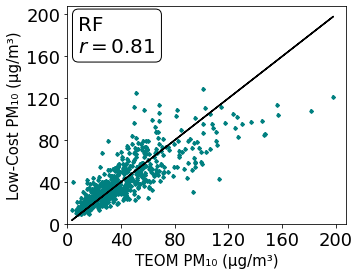

In [674]:
fig= plt.figure(figsize=(5,4))
ax = fig.add_subplot(111)
#ax.patch.set_facecolor('lightblue')
#ax.patch.set_alpha(0.3)
#m0, b0 = np.polyfit(np.array(y_test), np.array(lab1), 1)
#plt.plot(np.array(y_test), m0*np.array(y_test) + b0,color='#426eff',linewidth=4)
#m1, b1 = np.polyfit(np.array(y_test), np.array(pred_lr), 1)
#plt.plot(np.array(y_test), m1*np.array(y_test) + b1,color='#513e00',linewidth=4)
#m2, b2 = np.polyfit(np.array(y_test), np.array(pred_svr), 1)
#plt.plot(np.array(y_test), m2*np.array(y_test) + b2,color='brown',linewidth=4)
#m3, b3 = np.polyfit(np.array(y_test), np.array(pred_rf), 1)
#plt.plot(np.array(y_test), m3*np.array(y_test) + b3,color='indigo',linewidth=4)
#m4, b4 = np.polyfit(np.array(y_test), np.array(pred_ann), 1)
#plt.plot(np.array(y_test), m4*np.array(y_test) + b4,color='tomato',linewidth=4)
#m5, b5 = np.polyfit(np.array(y_test), np.array(pred_xgb), 1)
#plt.plot(np.array(y_test), m5*np.array(y_test) + b5,color='darkgoldenrod',linewidth=4)
#plt.scatter(np.array(y_test),np.array(lab1),color='teal',marker="$\\bigoplus$",s=10)
plt.scatter(np.array(y_test),np.array(pred),color='teal',marker="$\\bigoplus$",s=10)
#plt.scatter(np.array(y_test),np.array(pred_lr),color='#513e00',marker='P')
#plt.scatter(np.array(y_test),np.array(pred_svr),color='brown',marker='d')
#plt.scatter(np.array(y_test),np.array(pred_rf),color='indigo',marker='*',s=30)
#plt.scatter(np.array(y_test),np.array(pred_ann),color='tomato',marker='s')
#plt.scatter(np.array(y_test),np.array(pred_xgb),color='darkgoldenrod',marker='1',s=15)
plt.plot(np.array(y_test),np.array(y_test), c ="black",linewidth=1.5)
#ax.spines['right'].set_visible(False)
#ax.spines['top'].set_visible(False)
ax.set_ylim(bottom=0)
ax.set_xlim(left=0)
plt.xlabel('TEOM PM10'.translate(SUB) +  ' (µg/m3)'.translate(SUP),fontsize=15)
plt.ylabel('Low-Cost PM10'.translate(SUB) +  ' (µg/m3)'.translate(SUP),fontsize=15)
#plt.legend(['1:1','N3','RF'
            #], loc = 2, bbox_to_anchor = (0,1),fontsize=12)
#plt.title('CO Sensor',fontsize=18 )
A=[Pearson_2]
#ax.text(1800, 2900, r'$ r=$'+str(A[0]), fontsize=13)
#ax.text(200, 2900, 'LAB', fontsize=17)
#plt.title(r'$ r=$'+str(A[0]))
          #,
          #fontsize=12)
#plt.grid(linestyle='-.',linewidth=0.1)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.show
#plt.xticks(np.arange(0,2.9, step=1))
plt.xticks(np.arange(0,201, step=40))
plt.yticks(np.arange(0,201, step=40))
plt.show
textstr = '\n'.join(('RF',r'$r=%.2f$' % (A[0], ) ))

props = dict(boxstyle='round', facecolor='white', alpha=1)

#place a text box in upper left in axes coords
ax.text(0.04, 0.96, textstr, transform=ax.transAxes, fontsize=20,
        verticalalignment='top', bbox=props)

plt.savefig("R1_10_RF_OT.pdf",format="pdf", bbox_inches="tight")
#plt.savefig("fig4d.pdf", format="pdf", bbox_inches="tight")
plt.show()

## OPC+RH

In [675]:
X=R1_data[['Sen_10','RH']]
y=R1_data['Ref_10']
X_train, X_test, y_train, y_test =train_test_split(X, y, test_size = 0.2,shuffle=True)
regressor=regressor.fit(X_train, y_train)
pred = regressor.predict(X_test)
lab1=X_test['Sen_10'].to_list()
Pearson_1=round(np.corrcoef(y_test, lab1)[0, 1],2)
Pearson_2=round(np.corrcoef(y_test, pred)[0, 1],2)
R2_lab=round(sm.r2_score(y_test, lab1), 2)
R2_RF=round(sm.r2_score(y_test, pred), 2)
R2_lab,R2_RF

(0.36, 0.63)

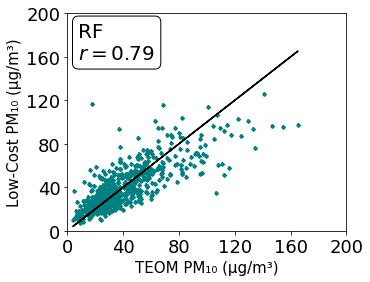

In [676]:
fig= plt.figure(figsize=(5,4))
ax = fig.add_subplot(111)
#ax.patch.set_facecolor('lightblue')
#ax.patch.set_alpha(0.3)
#m0, b0 = np.polyfit(np.array(y_test), np.array(lab1), 1)
#plt.plot(np.array(y_test), m0*np.array(y_test) + b0,color='#426eff',linewidth=4)
#m1, b1 = np.polyfit(np.array(y_test), np.array(pred_lr), 1)
#plt.plot(np.array(y_test), m1*np.array(y_test) + b1,color='#513e00',linewidth=4)
#m2, b2 = np.polyfit(np.array(y_test), np.array(pred_svr), 1)
#plt.plot(np.array(y_test), m2*np.array(y_test) + b2,color='brown',linewidth=4)
#m3, b3 = np.polyfit(np.array(y_test), np.array(pred_rf), 1)
#plt.plot(np.array(y_test), m3*np.array(y_test) + b3,color='indigo',linewidth=4)
#m4, b4 = np.polyfit(np.array(y_test), np.array(pred_ann), 1)
#plt.plot(np.array(y_test), m4*np.array(y_test) + b4,color='tomato',linewidth=4)
#m5, b5 = np.polyfit(np.array(y_test), np.array(pred_xgb), 1)
#plt.plot(np.array(y_test), m5*np.array(y_test) + b5,color='darkgoldenrod',linewidth=4)
#plt.scatter(np.array(y_test),np.array(lab1),color='teal',marker="$\\bigoplus$",s=10)
plt.scatter(np.array(y_test),np.array(pred),color='teal',marker="$\\bigoplus$",s=10)
#plt.scatter(np.array(y_test),np.array(pred_lr),color='#513e00',marker='P')
#plt.scatter(np.array(y_test),np.array(pred_svr),color='brown',marker='d')
#plt.scatter(np.array(y_test),np.array(pred_rf),color='indigo',marker='*',s=30)
#plt.scatter(np.array(y_test),np.array(pred_ann),color='tomato',marker='s')
#plt.scatter(np.array(y_test),np.array(pred_xgb),color='darkgoldenrod',marker='1',s=15)
plt.plot(np.array(y_test),np.array(y_test), c ="black",linewidth=1.5)
#ax.spines['right'].set_visible(False)
#ax.spines['top'].set_visible(False)
ax.set_ylim(bottom=0)
ax.set_xlim(left=0)
plt.xlabel('TEOM PM10'.translate(SUB) +  ' (µg/m3)'.translate(SUP),fontsize=15)
plt.ylabel('Low-Cost PM10'.translate(SUB) +  ' (µg/m3)'.translate(SUP),fontsize=15)
#plt.legend(['1:1','N3','RF'
            #], loc = 2, bbox_to_anchor = (0,1),fontsize=12)
#plt.title('CO Sensor',fontsize=18 )
A=[Pearson_2]
#ax.text(1800, 2900, r'$ r=$'+str(A[0]), fontsize=13)
#ax.text(200, 2900, 'LAB', fontsize=17)
#plt.title(r'$ r=$'+str(A[0]))
          #,
          #fontsize=12)
#plt.grid(linestyle='-.',linewidth=0.1)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.show
#plt.xticks(np.arange(0,2.9, step=1))
plt.xticks(np.arange(0,201, step=40))
plt.yticks(np.arange(0,201, step=40))
plt.show
textstr = '\n'.join(('RF',r'$r=%.2f$' % (A[0], ) ))

props = dict(boxstyle='round', facecolor='white', alpha=1)

#place a text box in upper left in axes coords
ax.text(0.04, 0.96, textstr, transform=ax.transAxes, fontsize=20,
        verticalalignment='top', bbox=props)

plt.savefig("R1_10_RF_ORH.pdf",format="pdf", bbox_inches="tight")
#plt.savefig("fig4d.pdf", format="pdf", bbox_inches="tight")
plt.show()

## OPC+T+RH

In [677]:
X=R1_data[['Sen_10','T','RH']]
y=R1_data['Ref_10']
X_train, X_test, y_train, y_test =train_test_split(X, y, test_size = 0.2,shuffle=True)
regressor=regressor.fit(X_train, y_train)
pred = regressor.predict(X_test)
lab1=X_test['Sen_10'].to_list()
Pearson_1=round(np.corrcoef(y_test, lab1)[0, 1],2)
Pearson_2=round(np.corrcoef(y_test, pred)[0, 1],2)
R2_lab=round(sm.r2_score(y_test, lab1), 2)
R2_RF=round(sm.r2_score(y_test, pred), 2)
R2_lab,R2_RF

(0.42, 0.66)

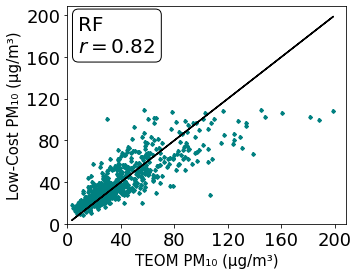

In [678]:
fig= plt.figure(figsize=(5,4))
ax = fig.add_subplot(111)
#ax.patch.set_facecolor('lightblue')
#ax.patch.set_alpha(0.3)
#m0, b0 = np.polyfit(np.array(y_test), np.array(lab1), 1)
#plt.plot(np.array(y_test), m0*np.array(y_test) + b0,color='#426eff',linewidth=4)
#m1, b1 = np.polyfit(np.array(y_test), np.array(pred_lr), 1)
#plt.plot(np.array(y_test), m1*np.array(y_test) + b1,color='#513e00',linewidth=4)
#m2, b2 = np.polyfit(np.array(y_test), np.array(pred_svr), 1)
#plt.plot(np.array(y_test), m2*np.array(y_test) + b2,color='brown',linewidth=4)
#m3, b3 = np.polyfit(np.array(y_test), np.array(pred_rf), 1)
#plt.plot(np.array(y_test), m3*np.array(y_test) + b3,color='indigo',linewidth=4)
#m4, b4 = np.polyfit(np.array(y_test), np.array(pred_ann), 1)
#plt.plot(np.array(y_test), m4*np.array(y_test) + b4,color='tomato',linewidth=4)
#m5, b5 = np.polyfit(np.array(y_test), np.array(pred_xgb), 1)
#plt.plot(np.array(y_test), m5*np.array(y_test) + b5,color='darkgoldenrod',linewidth=4)
#plt.scatter(np.array(y_test),np.array(lab1),color='teal',marker="$\\bigoplus$",s=10)
plt.scatter(np.array(y_test),np.array(pred),color='teal',marker="$\\bigoplus$",s=10)
#plt.scatter(np.array(y_test),np.array(pred_lr),color='#513e00',marker='P')
#plt.scatter(np.array(y_test),np.array(pred_svr),color='brown',marker='d')
#plt.scatter(np.array(y_test),np.array(pred_rf),color='indigo',marker='*',s=30)
#plt.scatter(np.array(y_test),np.array(pred_ann),color='tomato',marker='s')
#plt.scatter(np.array(y_test),np.array(pred_xgb),color='darkgoldenrod',marker='1',s=15)
plt.plot(np.array(y_test),np.array(y_test), c ="black",linewidth=1.5)
#ax.spines['right'].set_visible(False)
#ax.spines['top'].set_visible(False)
ax.set_ylim(bottom=0)
ax.set_xlim(left=0)
plt.xlabel('TEOM PM10'.translate(SUB) +  ' (µg/m3)'.translate(SUP),fontsize=15)
plt.ylabel('Low-Cost PM10'.translate(SUB) +  ' (µg/m3)'.translate(SUP),fontsize=15)
#plt.legend(['1:1','N3','RF'
            #], loc = 2, bbox_to_anchor = (0,1),fontsize=12)
#plt.title('CO Sensor',fontsize=18 )
A=[Pearson_2]
#ax.text(1800, 2900, r'$ r=$'+str(A[0]), fontsize=13)
#ax.text(200, 2900, 'LAB', fontsize=17)
#plt.title(r'$ r=$'+str(A[0]))
          #,
          #fontsize=12)
#plt.grid(linestyle='-.',linewidth=0.1)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.show
#plt.xticks(np.arange(0,2.9, step=1))
plt.xticks(np.arange(0,201, step=40))
plt.yticks(np.arange(0,201, step=40))
plt.show
textstr = '\n'.join(('RF',r'$r=%.2f$' % (A[0], ) ))

props = dict(boxstyle='round', facecolor='white', alpha=1)

#place a text box in upper left in axes coords
ax.text(0.04, 0.96, textstr, transform=ax.transAxes, fontsize=20,
        verticalalignment='top', bbox=props)

plt.savefig("R1_10_RF_OTRH.pdf",format="pdf", bbox_inches="tight")
#plt.savefig("fig4d.pdf", format="pdf", bbox_inches="tight")
plt.show()

## Feature Importance

In [679]:
FI=regressor.feature_importances_
FI=np.round(FI*100)
FI

array([75., 12., 12.])

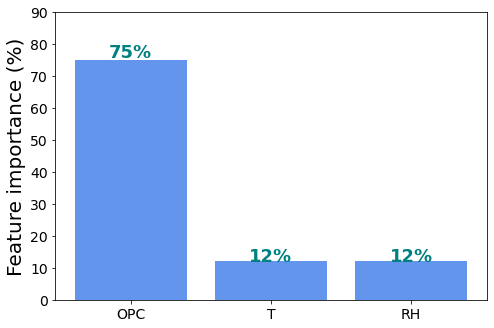

In [680]:
import matplotlib.pyplot as plt
fig = plt.figure()
ax = fig.add_axes([0,0,1,1])
langs = ['OPC', 'T', 'RH']
students = [int(FI[0]),int(FI[1]),int(FI[2])]
graph=ax.bar(langs,students, color='#6495ED')
i = 0
for p in graph:
    width = p.get_width()
    height = p.get_height()
    x, y = p.get_xy()
    plt.text(x+width/2,
             y+height*1.01,
             str(students[i])+'%',
             ha='center',
             weight='bold',fontsize=18, color='teal')
    i+=1
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.yticks(np.arange(0,100, step=10))
plt.ylabel('Feature importance (%)', fontsize=20)
#plt.title(r"$O_3$",fontsize=18)
plt.savefig("R1_10_FI.pdf", format="pdf", bbox_inches="tight")
plt.show()

In [681]:
from keras.models import Sequential
from keras.layers import Dense
from keras import optimizers
from sklearn.preprocessing import StandardScaler
model = Sequential()
model.add(Dense(6, input_shape = (3,),kernel_initializer='normal', activation= 'linear'))
model.add(Dense(128,kernel_initializer='normal', activation= 'relu'))
model.add(Dense(128, kernel_initializer='normal',activation= 'relu'))
model.add(Dense(100, kernel_initializer='normal',activation= 'relu'))
model.add(Dense(1,kernel_initializer='normal',activation='linear',))
sgd = optimizers.Adam(learning_rate=0.01)

model.compile(optimizer = sgd, loss = 'mean_squared_error', metrics= ['mse', 'mae'])
model.summary()

Model: "sequential_24"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_120 (Dense)            (None, 6)                 24        
_________________________________________________________________
dense_121 (Dense)            (None, 128)               896       
_________________________________________________________________
dense_122 (Dense)            (None, 128)               16512     
_________________________________________________________________
dense_123 (Dense)            (None, 100)               12900     
_________________________________________________________________
dense_124 (Dense)            (None, 1)                 101       
Total params: 30,433
Trainable params: 30,433
Non-trainable params: 0
_________________________________________________________________


scaler = StandardScaler()
scaler.fit(X_train)
X_train_scaled=scaler.transform(X_train)
X_test_scaled=scaler.transform(X_test)
model.fit(X_train_scaled, y_train, batch_size= 100, epochs=100, verbose= 0)

train_pred = model.predict(X_train_scaled)
test_pred = model.predict(X_test_scaled)
pred=[]
for i in range(len(test_pred)):
    pred.append(sum(list(test_pred[i])))
len(y_test)

In [682]:
Pearson_1=round(np.corrcoef(y_test, lab1)[0, 1],2)
Pearson_2=round(np.corrcoef(y_test, pred)[0, 1],2)
R2_lab=round(sm.r2_score(y_test, lab1), 2)
R2_RF=round(sm.r2_score(y_test, pred), 2)
R2_lab,R2_RF

(0.42, 0.66)

In [683]:
Pearson_1,Pearson_2

(0.82, 0.82)

In [662]:
import pandas as pd
import numpy as np
R1_data= pd.read_csv('R1.csv')
R1_data.columns=['Sen_2.5','Sen_10','Ref_2.5','Ref_10','Time','T','RH']
R1_data=R1_data.dropna()
Time=R1_data['Time'].to_list()
time=[]
for i in range(len(Time)):
    time.append(float(abs(Time[i])))
Time=np.array(time)
Date=pd.to_datetime(Time-719529,unit='d').round('s')
R1_data['Date'] = Date.tolist()
R1_data=R1_data.set_index('Date')
R1_data.drop('Time',axis = 1, inplace = True)
R1_data.head()

,Sen_2.5,Sen_10,Ref_2.5,Ref_10,T,RH
Date,,,,,,
2019-10-02 13:00:00,37.606508,61.467964,16.945596,31.358817,30.55,44.88
2019-10-02 14:00:00,37.606508,61.467964,22.114387,45.218727,28.72,56.78
2019-10-02 15:00:00,8.507763,42.813486,22.611759,61.807504,27.38,57.16
2019-10-02 16:00:00,8.507763,42.813486,19.652068,41.656351,26.31,58.61
2019-10-02 17:00:00,8.507763,42.813486,17.954197,30.121207,28.52,50.16


In [663]:
import pandas as pd
import numpy as np
N3_data= pd.read_csv('N3.csv')
N3_data.columns=['Sen_2.5','Sen_10','Ref_2.5','Ref_10','Time','T','RH']
N3_data=N3_data.dropna()
Time=N3_data['Time'].to_list()
time=[]
for i in range(len(Time)):
    time.append(float(abs(Time[i])))
Time=np.array(time)
Date=pd.to_datetime(Time-719529,unit='d').round('s')
N3_data['Date'] = Date.tolist()
N3_data=N3_data.set_index('Date')
N3_data.drop('Time',axis = 1, inplace = True)
N3_data.tail()

,Sen_2.5,Sen_10,Ref_2.5,Ref_10,T,RH
Date,,,,,,
2020-11-09 19:00:00,15.255277,59.432720,34.47053,112.54680,13.66,84.61
2020-11-09 20:00:00,13.595549,49.218701,51.01247,185.77910,13.35,85.21
2020-11-09 21:00:00,15.531131,47.994590,50.29734,152.05290,13.12,85.77
2020-11-09 22:00:00,12.958598,38.296699,48.03581,122.83820,13.02,85.93
2020-11-09 23:00:00,12.374930,35.061428,41.15864,94.77707,12.66,86.06


In [664]:
SUB = str.maketrans("0123456789", "₀₁₂₃₄₅₆₇₈₉")
SUP = str.maketrans("0123456789", "⁰¹²³⁴⁵⁶⁷⁸⁹")

# RF

## PM2.5

## OPC

In [665]:
from sktime.performance_metrics.forecasting import sMAPE, smape_loss
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error as mae
import sklearn.metrics as sm
import matplotlib.pyplot as plt
#'Ref_NO2','Ref_SO2','Ref_O3',
#,'Month','Day_of_week','Day','Hour'
X=R1_data[['Sen_10']]
y=R1_data['Ref_10']
X_train, X_test, y_train, y_test =train_test_split(X, y, test_size = 0.2,shuffle=True)

In [666]:
X_train.shape

(2479, 1)

In [667]:
from sklearn.ensemble import RandomForestRegressor
  
 # create regressor object
regressor = RandomForestRegressor(n_estimators =500 ,min_samples_split=2,min_samples_leaf= 2,max_features= 'sqrt', 
                                  random_state = 0,max_depth=None,bootstrap=True)
  
  
# fit the regressor with x and y data
regressor=regressor.fit(X_train, y_train) 

In [668]:
pred = regressor.predict(X_test)
lab1=X_test['Sen_10'].to_list()
Pearson_1=round(np.corrcoef(y_test, lab1)[0, 1],2)
Pearson_2=round(np.corrcoef(y_test, pred)[0, 1],2)
R2_lab=round(sm.r2_score(y_test, lab1), 2)
R2_RF=round(sm.r2_score(y_test, pred), 2)
R2_lab,R2_RF

(0.38, 0.55)

In [669]:
Pearson_1,Pearson_2

(0.8, 0.74)

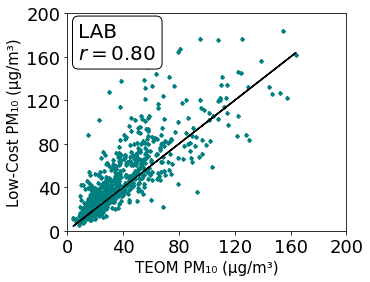

In [670]:
fig= plt.figure(figsize=(5,4))
ax = fig.add_subplot(111)
#ax.patch.set_facecolor('lightblue')
#ax.patch.set_alpha(0.3)
#m0, b0 = np.polyfit(np.array(y_test), np.array(lab1), 1)
#plt.plot(np.array(y_test), m0*np.array(y_test) + b0,color='#426eff',linewidth=4)
#m1, b1 = np.polyfit(np.array(y_test), np.array(pred_lr), 1)
#plt.plot(np.array(y_test), m1*np.array(y_test) + b1,color='#513e00',linewidth=4)
#m2, b2 = np.polyfit(np.array(y_test), np.array(pred_svr), 1)
#plt.plot(np.array(y_test), m2*np.array(y_test) + b2,color='brown',linewidth=4)
#m3, b3 = np.polyfit(np.array(y_test), np.array(pred_rf), 1)
#plt.plot(np.array(y_test), m3*np.array(y_test) + b3,color='indigo',linewidth=4)
#m4, b4 = np.polyfit(np.array(y_test), np.array(pred_ann), 1)
#plt.plot(np.array(y_test), m4*np.array(y_test) + b4,color='tomato',linewidth=4)
#m5, b5 = np.polyfit(np.array(y_test), np.array(pred_xgb), 1)
#plt.plot(np.array(y_test), m5*np.array(y_test) + b5,color='darkgoldenrod',linewidth=4)
plt.scatter(np.array(y_test),np.array(lab1),color='teal',marker="$\\bigoplus$",s=10)
#plt.scatter(np.array(y_test),np.array(pred),color='teal',marker="$\\bigoplus$",s=10)
#plt.scatter(np.array(y_test),np.array(pred_lr),color='#513e00',marker='P')
#plt.scatter(np.array(y_test),np.array(pred_svr),color='brown',marker='d')
#plt.scatter(np.array(y_test),np.array(pred_rf),color='indigo',marker='*',s=30)
#plt.scatter(np.array(y_test),np.array(pred_ann),color='tomato',marker='s')
#plt.scatter(np.array(y_test),np.array(pred_xgb),color='darkgoldenrod',marker='1',s=15)
plt.plot(np.array(y_test),np.array(y_test), c ="black",linewidth=1.5)
#ax.spines['right'].set_visible(False)
#ax.spines['top'].set_visible(False)
ax.set_ylim(bottom=0)
ax.set_xlim(left=0)
plt.xlabel('TEOM PM10'.translate(SUB) +  ' (µg/m3)'.translate(SUP),fontsize=15)
plt.ylabel('Low-Cost PM10'.translate(SUB) +  ' (µg/m3)'.translate(SUP),fontsize=15)
#plt.legend(['1:1','N3','RF'
            #], loc = 2, bbox_to_anchor = (0,1),fontsize=12)
#plt.title('CO Sensor',fontsize=18 )
A=[Pearson_1]
#ax.text(1800, 2900, r'$ r=$'+str(A[0]), fontsize=13)
#ax.text(200, 2900, 'LAB', fontsize=17)
#plt.title(r'$ r=$'+str(A[0]))
          #,
          #fontsize=12)
#plt.grid(linestyle='-.',linewidth=0.1)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.show
#plt.xticks(np.arange(0,2.9, step=1))
plt.xticks(np.arange(0,201, step=40))
plt.yticks(np.arange(0,201, step=40))
plt.show
textstr = '\n'.join(('LAB',r'$r=%.2f$' % (A[0], ) ))

props = dict(boxstyle='round', facecolor='white', alpha=1)

#place a text box in upper left in axes coords
ax.text(0.04, 0.96, textstr, transform=ax.transAxes, fontsize=20,
        verticalalignment='top', bbox=props)

plt.savefig("R1_10_OPC.pdf",format="pdf", bbox_inches="tight")
#plt.savefig("fig4d.pdf", format="pdf", bbox_inches="tight")
plt.show()

In [671]:
max(np.array(lab1)),max(np.array(y_test))

(184.08615397443, 163.854456666667)

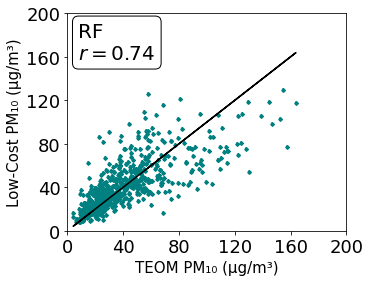

In [672]:
fig= plt.figure(figsize=(5,4))
ax = fig.add_subplot(111)
#ax.patch.set_facecolor('lightblue')
#ax.patch.set_alpha(0.3)
#m0, b0 = np.polyfit(np.array(y_test), np.array(lab1), 1)
#plt.plot(np.array(y_test), m0*np.array(y_test) + b0,color='#426eff',linewidth=4)
#m1, b1 = np.polyfit(np.array(y_test), np.array(pred_lr), 1)
#plt.plot(np.array(y_test), m1*np.array(y_test) + b1,color='#513e00',linewidth=4)
#m2, b2 = np.polyfit(np.array(y_test), np.array(pred_svr), 1)
#plt.plot(np.array(y_test), m2*np.array(y_test) + b2,color='brown',linewidth=4)
#m3, b3 = np.polyfit(np.array(y_test), np.array(pred_rf), 1)
#plt.plot(np.array(y_test), m3*np.array(y_test) + b3,color='indigo',linewidth=4)
#m4, b4 = np.polyfit(np.array(y_test), np.array(pred_ann), 1)
#plt.plot(np.array(y_test), m4*np.array(y_test) + b4,color='tomato',linewidth=4)
#m5, b5 = np.polyfit(np.array(y_test), np.array(pred_xgb), 1)
#plt.plot(np.array(y_test), m5*np.array(y_test) + b5,color='darkgoldenrod',linewidth=4)
#plt.scatter(np.array(y_test),np.array(lab1),color='teal',marker="$\\bigoplus$",s=10)
plt.scatter(np.array(y_test),np.array(pred),color='teal',marker="$\\bigoplus$",s=10)
#plt.scatter(np.array(y_test),np.array(pred_lr),color='#513e00',marker='P')
#plt.scatter(np.array(y_test),np.array(pred_svr),color='brown',marker='d')
#plt.scatter(np.array(y_test),np.array(pred_rf),color='indigo',marker='*',s=30)
#plt.scatter(np.array(y_test),np.array(pred_ann),color='tomato',marker='s')
#plt.scatter(np.array(y_test),np.array(pred_xgb),color='darkgoldenrod',marker='1',s=15)
plt.plot(np.array(y_test),np.array(y_test), c ="black",linewidth=1.5)
#ax.spines['right'].set_visible(False)
#ax.spines['top'].set_visible(False)
ax.set_ylim(bottom=0)
ax.set_xlim(left=0)
plt.xlabel('TEOM PM10'.translate(SUB) +  ' (µg/m3)'.translate(SUP),fontsize=15)
plt.ylabel('Low-Cost PM10'.translate(SUB) +  ' (µg/m3)'.translate(SUP),fontsize=15)
#plt.legend(['1:1','N3','RF'
            #], loc = 2, bbox_to_anchor = (0,1),fontsize=12)
#plt.title('CO Sensor',fontsize=18 )
A=[Pearson_2]
#ax.text(1800, 2900, r'$ r=$'+str(A[0]), fontsize=13)
#ax.text(200, 2900, 'LAB', fontsize=17)
#plt.title(r'$ r=$'+str(A[0]))
          #,
          #fontsize=12)
#plt.grid(linestyle='-.',linewidth=0.1)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.show
#plt.xticks(np.arange(0,2.9, step=1))
plt.xticks(np.arange(0,201, step=40))
plt.yticks(np.arange(0,201, step=40))
plt.show
textstr = '\n'.join(('RF',r'$r=%.2f$' % (A[0], ) ))

props = dict(boxstyle='round', facecolor='white', alpha=1)

#place a text box in upper left in axes coords
ax.text(0.04, 0.96, textstr, transform=ax.transAxes, fontsize=20,
        verticalalignment='top', bbox=props)

plt.savefig("R1_10_RF_O.pdf",format="pdf", bbox_inches="tight")
#plt.savefig("fig4d.pdf", format="pdf", bbox_inches="tight")
plt.show()

## OPC+T

In [673]:
X=R1_data[['Sen_10','T']]
y=R1_data['Ref_10']
X_train, X_test, y_train, y_test =train_test_split(X, y, test_size = 0.2,shuffle=True)
regressor=regressor.fit(X_train, y_train)
pred = regressor.predict(X_test)
lab1=X_test['Sen_10'].to_list()
Pearson_1=round(np.corrcoef(y_test, lab1)[0, 1],2)
Pearson_2=round(np.corrcoef(y_test, pred)[0, 1],2)
R2_lab=round(sm.r2_score(y_test, lab1), 2)
R2_RF=round(sm.r2_score(y_test, pred), 2)
R2_lab,R2_RF

(0.34, 0.65)

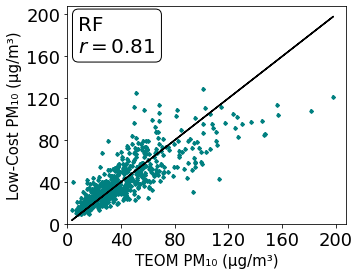

In [674]:
fig= plt.figure(figsize=(5,4))
ax = fig.add_subplot(111)
#ax.patch.set_facecolor('lightblue')
#ax.patch.set_alpha(0.3)
#m0, b0 = np.polyfit(np.array(y_test), np.array(lab1), 1)
#plt.plot(np.array(y_test), m0*np.array(y_test) + b0,color='#426eff',linewidth=4)
#m1, b1 = np.polyfit(np.array(y_test), np.array(pred_lr), 1)
#plt.plot(np.array(y_test), m1*np.array(y_test) + b1,color='#513e00',linewidth=4)
#m2, b2 = np.polyfit(np.array(y_test), np.array(pred_svr), 1)
#plt.plot(np.array(y_test), m2*np.array(y_test) + b2,color='brown',linewidth=4)
#m3, b3 = np.polyfit(np.array(y_test), np.array(pred_rf), 1)
#plt.plot(np.array(y_test), m3*np.array(y_test) + b3,color='indigo',linewidth=4)
#m4, b4 = np.polyfit(np.array(y_test), np.array(pred_ann), 1)
#plt.plot(np.array(y_test), m4*np.array(y_test) + b4,color='tomato',linewidth=4)
#m5, b5 = np.polyfit(np.array(y_test), np.array(pred_xgb), 1)
#plt.plot(np.array(y_test), m5*np.array(y_test) + b5,color='darkgoldenrod',linewidth=4)
#plt.scatter(np.array(y_test),np.array(lab1),color='teal',marker="$\\bigoplus$",s=10)
plt.scatter(np.array(y_test),np.array(pred),color='teal',marker="$\\bigoplus$",s=10)
#plt.scatter(np.array(y_test),np.array(pred_lr),color='#513e00',marker='P')
#plt.scatter(np.array(y_test),np.array(pred_svr),color='brown',marker='d')
#plt.scatter(np.array(y_test),np.array(pred_rf),color='indigo',marker='*',s=30)
#plt.scatter(np.array(y_test),np.array(pred_ann),color='tomato',marker='s')
#plt.scatter(np.array(y_test),np.array(pred_xgb),color='darkgoldenrod',marker='1',s=15)
plt.plot(np.array(y_test),np.array(y_test), c ="black",linewidth=1.5)
#ax.spines['right'].set_visible(False)
#ax.spines['top'].set_visible(False)
ax.set_ylim(bottom=0)
ax.set_xlim(left=0)
plt.xlabel('TEOM PM10'.translate(SUB) +  ' (µg/m3)'.translate(SUP),fontsize=15)
plt.ylabel('Low-Cost PM10'.translate(SUB) +  ' (µg/m3)'.translate(SUP),fontsize=15)
#plt.legend(['1:1','N3','RF'
            #], loc = 2, bbox_to_anchor = (0,1),fontsize=12)
#plt.title('CO Sensor',fontsize=18 )
A=[Pearson_2]
#ax.text(1800, 2900, r'$ r=$'+str(A[0]), fontsize=13)
#ax.text(200, 2900, 'LAB', fontsize=17)
#plt.title(r'$ r=$'+str(A[0]))
          #,
          #fontsize=12)
#plt.grid(linestyle='-.',linewidth=0.1)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.show
#plt.xticks(np.arange(0,2.9, step=1))
plt.xticks(np.arange(0,201, step=40))
plt.yticks(np.arange(0,201, step=40))
plt.show
textstr = '\n'.join(('RF',r'$r=%.2f$' % (A[0], ) ))

props = dict(boxstyle='round', facecolor='white', alpha=1)

#place a text box in upper left in axes coords
ax.text(0.04, 0.96, textstr, transform=ax.transAxes, fontsize=20,
        verticalalignment='top', bbox=props)

plt.savefig("R1_10_RF_OT.pdf",format="pdf", bbox_inches="tight")
#plt.savefig("fig4d.pdf", format="pdf", bbox_inches="tight")
plt.show()

## OPC+RH

In [675]:
X=R1_data[['Sen_10','RH']]
y=R1_data['Ref_10']
X_train, X_test, y_train, y_test =train_test_split(X, y, test_size = 0.2,shuffle=True)
regressor=regressor.fit(X_train, y_train)
pred = regressor.predict(X_test)
lab1=X_test['Sen_10'].to_list()
Pearson_1=round(np.corrcoef(y_test, lab1)[0, 1],2)
Pearson_2=round(np.corrcoef(y_test, pred)[0, 1],2)
R2_lab=round(sm.r2_score(y_test, lab1), 2)
R2_RF=round(sm.r2_score(y_test, pred), 2)
R2_lab,R2_RF

(0.36, 0.63)

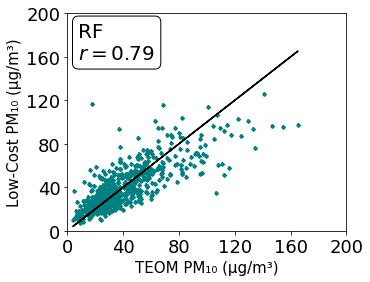

In [676]:
fig= plt.figure(figsize=(5,4))
ax = fig.add_subplot(111)
#ax.patch.set_facecolor('lightblue')
#ax.patch.set_alpha(0.3)
#m0, b0 = np.polyfit(np.array(y_test), np.array(lab1), 1)
#plt.plot(np.array(y_test), m0*np.array(y_test) + b0,color='#426eff',linewidth=4)
#m1, b1 = np.polyfit(np.array(y_test), np.array(pred_lr), 1)
#plt.plot(np.array(y_test), m1*np.array(y_test) + b1,color='#513e00',linewidth=4)
#m2, b2 = np.polyfit(np.array(y_test), np.array(pred_svr), 1)
#plt.plot(np.array(y_test), m2*np.array(y_test) + b2,color='brown',linewidth=4)
#m3, b3 = np.polyfit(np.array(y_test), np.array(pred_rf), 1)
#plt.plot(np.array(y_test), m3*np.array(y_test) + b3,color='indigo',linewidth=4)
#m4, b4 = np.polyfit(np.array(y_test), np.array(pred_ann), 1)
#plt.plot(np.array(y_test), m4*np.array(y_test) + b4,color='tomato',linewidth=4)
#m5, b5 = np.polyfit(np.array(y_test), np.array(pred_xgb), 1)
#plt.plot(np.array(y_test), m5*np.array(y_test) + b5,color='darkgoldenrod',linewidth=4)
#plt.scatter(np.array(y_test),np.array(lab1),color='teal',marker="$\\bigoplus$",s=10)
plt.scatter(np.array(y_test),np.array(pred),color='teal',marker="$\\bigoplus$",s=10)
#plt.scatter(np.array(y_test),np.array(pred_lr),color='#513e00',marker='P')
#plt.scatter(np.array(y_test),np.array(pred_svr),color='brown',marker='d')
#plt.scatter(np.array(y_test),np.array(pred_rf),color='indigo',marker='*',s=30)
#plt.scatter(np.array(y_test),np.array(pred_ann),color='tomato',marker='s')
#plt.scatter(np.array(y_test),np.array(pred_xgb),color='darkgoldenrod',marker='1',s=15)
plt.plot(np.array(y_test),np.array(y_test), c ="black",linewidth=1.5)
#ax.spines['right'].set_visible(False)
#ax.spines['top'].set_visible(False)
ax.set_ylim(bottom=0)
ax.set_xlim(left=0)
plt.xlabel('TEOM PM10'.translate(SUB) +  ' (µg/m3)'.translate(SUP),fontsize=15)
plt.ylabel('Low-Cost PM10'.translate(SUB) +  ' (µg/m3)'.translate(SUP),fontsize=15)
#plt.legend(['1:1','N3','RF'
            #], loc = 2, bbox_to_anchor = (0,1),fontsize=12)
#plt.title('CO Sensor',fontsize=18 )
A=[Pearson_2]
#ax.text(1800, 2900, r'$ r=$'+str(A[0]), fontsize=13)
#ax.text(200, 2900, 'LAB', fontsize=17)
#plt.title(r'$ r=$'+str(A[0]))
          #,
          #fontsize=12)
#plt.grid(linestyle='-.',linewidth=0.1)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.show
#plt.xticks(np.arange(0,2.9, step=1))
plt.xticks(np.arange(0,201, step=40))
plt.yticks(np.arange(0,201, step=40))
plt.show
textstr = '\n'.join(('RF',r'$r=%.2f$' % (A[0], ) ))

props = dict(boxstyle='round', facecolor='white', alpha=1)

#place a text box in upper left in axes coords
ax.text(0.04, 0.96, textstr, transform=ax.transAxes, fontsize=20,
        verticalalignment='top', bbox=props)

plt.savefig("R1_10_RF_ORH.pdf",format="pdf", bbox_inches="tight")
#plt.savefig("fig4d.pdf", format="pdf", bbox_inches="tight")
plt.show()

## OPC+T+RH

In [677]:
X=R1_data[['Sen_10','T','RH']]
y=R1_data['Ref_10']
X_train, X_test, y_train, y_test =train_test_split(X, y, test_size = 0.2,shuffle=True)
regressor=regressor.fit(X_train, y_train)
pred = regressor.predict(X_test)
lab1=X_test['Sen_10'].to_list()
Pearson_1=round(np.corrcoef(y_test, lab1)[0, 1],2)
Pearson_2=round(np.corrcoef(y_test, pred)[0, 1],2)
R2_lab=round(sm.r2_score(y_test, lab1), 2)
R2_RF=round(sm.r2_score(y_test, pred), 2)
R2_lab,R2_RF

(0.42, 0.66)

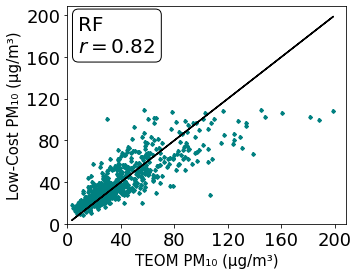

In [678]:
fig= plt.figure(figsize=(5,4))
ax = fig.add_subplot(111)
#ax.patch.set_facecolor('lightblue')
#ax.patch.set_alpha(0.3)
#m0, b0 = np.polyfit(np.array(y_test), np.array(lab1), 1)
#plt.plot(np.array(y_test), m0*np.array(y_test) + b0,color='#426eff',linewidth=4)
#m1, b1 = np.polyfit(np.array(y_test), np.array(pred_lr), 1)
#plt.plot(np.array(y_test), m1*np.array(y_test) + b1,color='#513e00',linewidth=4)
#m2, b2 = np.polyfit(np.array(y_test), np.array(pred_svr), 1)
#plt.plot(np.array(y_test), m2*np.array(y_test) + b2,color='brown',linewidth=4)
#m3, b3 = np.polyfit(np.array(y_test), np.array(pred_rf), 1)
#plt.plot(np.array(y_test), m3*np.array(y_test) + b3,color='indigo',linewidth=4)
#m4, b4 = np.polyfit(np.array(y_test), np.array(pred_ann), 1)
#plt.plot(np.array(y_test), m4*np.array(y_test) + b4,color='tomato',linewidth=4)
#m5, b5 = np.polyfit(np.array(y_test), np.array(pred_xgb), 1)
#plt.plot(np.array(y_test), m5*np.array(y_test) + b5,color='darkgoldenrod',linewidth=4)
#plt.scatter(np.array(y_test),np.array(lab1),color='teal',marker="$\\bigoplus$",s=10)
plt.scatter(np.array(y_test),np.array(pred),color='teal',marker="$\\bigoplus$",s=10)
#plt.scatter(np.array(y_test),np.array(pred_lr),color='#513e00',marker='P')
#plt.scatter(np.array(y_test),np.array(pred_svr),color='brown',marker='d')
#plt.scatter(np.array(y_test),np.array(pred_rf),color='indigo',marker='*',s=30)
#plt.scatter(np.array(y_test),np.array(pred_ann),color='tomato',marker='s')
#plt.scatter(np.array(y_test),np.array(pred_xgb),color='darkgoldenrod',marker='1',s=15)
plt.plot(np.array(y_test),np.array(y_test), c ="black",linewidth=1.5)
#ax.spines['right'].set_visible(False)
#ax.spines['top'].set_visible(False)
ax.set_ylim(bottom=0)
ax.set_xlim(left=0)
plt.xlabel('TEOM PM10'.translate(SUB) +  ' (µg/m3)'.translate(SUP),fontsize=15)
plt.ylabel('Low-Cost PM10'.translate(SUB) +  ' (µg/m3)'.translate(SUP),fontsize=15)
#plt.legend(['1:1','N3','RF'
            #], loc = 2, bbox_to_anchor = (0,1),fontsize=12)
#plt.title('CO Sensor',fontsize=18 )
A=[Pearson_2]
#ax.text(1800, 2900, r'$ r=$'+str(A[0]), fontsize=13)
#ax.text(200, 2900, 'LAB', fontsize=17)
#plt.title(r'$ r=$'+str(A[0]))
          #,
          #fontsize=12)
#plt.grid(linestyle='-.',linewidth=0.1)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.show
#plt.xticks(np.arange(0,2.9, step=1))
plt.xticks(np.arange(0,201, step=40))
plt.yticks(np.arange(0,201, step=40))
plt.show
textstr = '\n'.join(('RF',r'$r=%.2f$' % (A[0], ) ))

props = dict(boxstyle='round', facecolor='white', alpha=1)

#place a text box in upper left in axes coords
ax.text(0.04, 0.96, textstr, transform=ax.transAxes, fontsize=20,
        verticalalignment='top', bbox=props)

plt.savefig("R1_10_RF_OTRH.pdf",format="pdf", bbox_inches="tight")
#plt.savefig("fig4d.pdf", format="pdf", bbox_inches="tight")
plt.show()

## Feature Importance

In [679]:
FI=regressor.feature_importances_
FI=np.round(FI*100)
FI

array([75., 12., 12.])

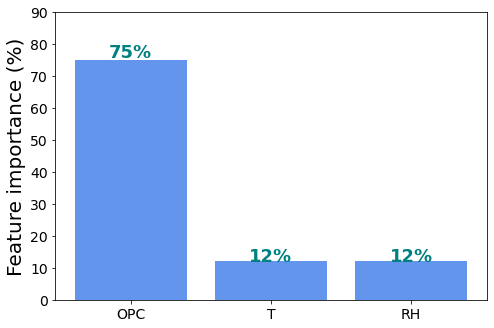

In [680]:
import matplotlib.pyplot as plt
fig = plt.figure()
ax = fig.add_axes([0,0,1,1])
langs = ['OPC', 'T', 'RH']
students = [int(FI[0]),int(FI[1]),int(FI[2])]
graph=ax.bar(langs,students, color='#6495ED')
i = 0
for p in graph:
    width = p.get_width()
    height = p.get_height()
    x, y = p.get_xy()
    plt.text(x+width/2,
             y+height*1.01,
             str(students[i])+'%',
             ha='center',
             weight='bold',fontsize=18, color='teal')
    i+=1
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.yticks(np.arange(0,100, step=10))
plt.ylabel('Feature importance (%)', fontsize=20)
#plt.title(r"$O_3$",fontsize=18)
plt.savefig("R1_10_FI.pdf", format="pdf", bbox_inches="tight")
plt.show()

In [681]:
from keras.models import Sequential
from keras.layers import Dense
from keras import optimizers
from sklearn.preprocessing import StandardScaler
model = Sequential()
model.add(Dense(6, input_shape = (3,),kernel_initializer='normal', activation= 'linear'))
model.add(Dense(128,kernel_initializer='normal', activation= 'relu'))
model.add(Dense(128, kernel_initializer='normal',activation= 'relu'))
model.add(Dense(100, kernel_initializer='normal',activation= 'relu'))
model.add(Dense(1,kernel_initializer='normal',activation='linear',))
sgd = optimizers.Adam(learning_rate=0.01)

model.compile(optimizer = sgd, loss = 'mean_squared_error', metrics= ['mse', 'mae'])
model.summary()

Model: "sequential_24"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_120 (Dense)            (None, 6)                 24        
_________________________________________________________________
dense_121 (Dense)            (None, 128)               896       
_________________________________________________________________
dense_122 (Dense)            (None, 128)               16512     
_________________________________________________________________
dense_123 (Dense)            (None, 100)               12900     
_________________________________________________________________
dense_124 (Dense)            (None, 1)                 101       
Total params: 30,433
Trainable params: 30,433
Non-trainable params: 0
_________________________________________________________________


scaler = StandardScaler()
scaler.fit(X_train)
X_train_scaled=scaler.transform(X_train)
X_test_scaled=scaler.transform(X_test)
model.fit(X_train_scaled, y_train, batch_size= 100, epochs=100, verbose= 0)

train_pred = model.predict(X_train_scaled)
test_pred = model.predict(X_test_scaled)
pred=[]
for i in range(len(test_pred)):
    pred.append(sum(list(test_pred[i])))
len(y_test)

In [682]:
Pearson_1=round(np.corrcoef(y_test, lab1)[0, 1],2)
Pearson_2=round(np.corrcoef(y_test, pred)[0, 1],2)
R2_lab=round(sm.r2_score(y_test, lab1), 2)
R2_RF=round(sm.r2_score(y_test, pred), 2)
R2_lab,R2_RF

(0.42, 0.66)

In [683]:
Pearson_1,Pearson_2

(0.82, 0.82)

In [3]:
!pip install openpyxl

You should consider upgrading via the '/Library/Frameworks/Python.framework/Versions/3.8/bin/python3 -m pip install --upgrade pip' command.


def REF(pred,y_test,alpha):
    import random
    import numpy as np
    cal=np.array(pred)
    ref=np.array(y_test)
    ref_mean=np.mean(ref)
    cal_mean=np.mean(cal)
    prec=np.array([20 for i in range(len(ref))])
    u=np.maximum(prec,0.001*ref)
    #cal=np.log(cal)
    #ref=np.log(ref)
    sx_s=(1/len(ref))*sum((ref-ref_mean)**2)
    sy_s=(1/len(cal))*sum((cal-cal_mean)**2)
    sxy=(1/len(cal))*sum((cal-cal_mean)*(ref-ref_mean))
    beta_1=((sy_s-alpha*sx_s)+np.sqrt((sy_s-sx_s)**2+4*alpha*sxy**2))/(2*sxy)
    beta_0=cal_mean-beta_1*ref_mean
    RSS=sum((cal-beta_0-beta_1*ref)**2-(beta_1**2+alpha)*u**2)
    du_s=RSS/(len(cal)-2)
    Beta_1=((sy_s-alpha*sx_s-du_s)+np.sqrt((sy_s-alpha*sx_s-du_s)**2+4*alpha*sxy**2))/(2*sxy)
    Beta_0=cal_mean-Beta_1*ref_mean
    P1=(RSS/(len(cal)-2))
    P2=(Beta_1**2+alpha)*u**2+(-2*Beta_1**2+2*Beta_1-1)*u**2
    P3=(Beta_0+(Beta_1-1)*ref)**2
    P=[]
    for i in range(len(P3)):
        P.append(P1+P2[i]+P3[i])
    for i in range(len(P)):
        if P[i]<0:
            P[i]=random.randint(1,100)
    u_cal=(2*np.sqrt(np.array(P))/ref)*100
    #u_cal=((2*np.sqrt((RSS/(len(cal)-2))+(1-(beta_1-1)**2)*(0.08*ref)**2+(Beta_0+(Beta_1-1)*ref)**2))/cal)*100
    return u_cal  

# ALPHASENSE #

## co ##

def REF(pred,y_test,alpha):
    import random
    import numpy as np
    cal=np.array(pred)
    ref=np.array(y_test)
    ref_mean=np.mean(ref)
    cal_mean=np.mean(cal)
    prec=np.array([20 for i in range(len(ref))])
    u=np.maximum(prec,0.001*ref)
    #cal=np.log(cal)
    #ref=np.log(ref)
    sx_s=(1/len(ref))*sum((ref-ref_mean)**2)
    sy_s=(1/len(cal))*sum((cal-cal_mean)**2)
    sxy=(1/len(cal))*sum((cal-cal_mean)*(ref-ref_mean))
    beta_1=((sy_s-alpha*sx_s)+np.sqrt((sy_s-sx_s)**2+4*alpha*sxy**2))/(2*sxy)
    beta_0=cal_mean-beta_1*ref_mean
    RSS=sum((cal-beta_0-beta_1*ref)**2-(beta_1**2+alpha)*u**2)
    du_s=RSS/(len(cal)-2)
    Beta_1=((sy_s-alpha*sx_s-du_s)+np.sqrt((sy_s-alpha*sx_s-du_s)**2+4*alpha*sxy**2))/(2*sxy)
    Beta_0=cal_mean-Beta_1*ref_mean
    print([Beta_0,Beta_1])
    P1=(RSS/(len(cal)-2))
    P2=(Beta_1**2+alpha)*u**2+(-2*Beta_1**2+2*Beta_1-1)*u**2
    P3=(Beta_0+(Beta_1-1)*ref)**2
    P=[]
    for i in range(len(P3)):
        P.append(P1+P2[i]+P3[i])
    for i in range(len(P)):
        if P[i]<0:
            P[i]=random.randint(1,100)
    u_cal=(2*np.sqrt(np.array(P))/ref)*100
    #u_cal=((2*np.sqrt((RSS/(len(cal)-2))+(1-(beta_1-1)**2)*(0.08*ref)**2+(Beta_0+(Beta_1-1)*ref)**2))/cal)*100
    return u_cal  

In [48]:
def REF(pred,y_test,alpha):
    import random
    import numpy as np
    cal=np.array(pred)
    ref=np.array(y_test)
    for i in range(len(ref)):
        if ref[i]==0:
            ref[i]=np.mean(ref)
    ref_mean=np.mean(ref)
    cal_mean=np.mean(cal)
    prec=np.array([20 for i in range(len(ref))])
    u=np.maximum(prec,0.001*ref)
    u=0.001*ref
    #cal=np.log(cal)
    #ref=np.log(ref)
    sx_s=(1/len(ref))*sum((ref-ref_mean)**2)
    sy_s=(1/len(cal))*sum((cal-cal_mean)**2)
    sxy=(1/len(cal))*sum((cal-cal_mean)*(ref-ref_mean))
    beta_1=((sy_s-alpha*sx_s)+np.sqrt((sy_s-sx_s)**2+4*alpha*sxy**2))/(2*sxy)
    beta_0=cal_mean-beta_1*ref_mean
    RSS=sum((cal-beta_0-beta_1*ref)**2-(beta_1**2+alpha)*u**2)
    du_s=RSS/(len(cal)-2)
    Beta_1=((sy_s-alpha*sx_s-du_s)+np.sqrt((sy_s-alpha*sx_s-du_s)**2+4*alpha*sxy**2))/(2*sxy)
    Beta_0=cal_mean-Beta_1*ref_mean
    P1=(RSS/(len(cal)-2))
    #P2=(Beta_1**2+alpha)*u**2+(-2*Beta_1**2+2*Beta_1-1)*u**2
    P2=-(u**2)
    P3=(Beta_0+(Beta_1-1)*ref)**2
    P=[]
    for i in range(len(P3)):
        P.append(P1+P2[i]+P3[i])
    U1=[]
    Ref=[]
    for i in range(len(P)):
        if P[i]>=0:
            U1.append(P[i])
            Ref.append(ref[i])
    #for i in range(len(P)):
        #if P[i]<0:
           # P[i]=np.mean(P1)
    u=(2*np.sqrt(np.array(U1))/np.array(Ref))*100
    return u,Ref

In [63]:
import numpy as np
import pandas as pd
data_CO=pd.read_excel('final_data.xlsx', engine='openpyxl', sheet_name='CO')
Time=data_CO['time matlab'].to_list()
time=[]
for i in range(len(Time)):
    time.append(float(abs(Time[i])))
Time=np.array(time)
Date=pd.to_datetime(Time-719529,unit='d').round('s')
data_CO['Time'] = Date.tolist()
#data_CO['Time'] = pd.to_numeric(pd.to_datetime(data_CO['Time']))
data_CO=data_CO.set_index('Time')
data_CO=data_CO.resample('8h').mean()
data_CO=data_CO.dropna()
data_CO['Time'] = data_CO.index
data_CO

,LCS (ppb),Reference (ppb),Precision (0.1% of reading),precision (20ppb),Greater,λ,time matlab,Time
Time,,,,,,,,
2019-10-02 08:00:00,2620.920182,260.755777,0.260756,20.0,20.0,0.2,737700.541667,2019-10-02 08:00:00
2019-10-02 16:00:00,3048.561560,268.448957,0.268449,20.0,20.0,0.2,737700.666667,2019-10-02 16:00:00
2019-10-03 16:00:00,540.899001,281.354037,0.281354,20.0,20.0,0.2,737701.666667,2019-10-03 16:00:00
2019-10-07 08:00:00,428.827168,259.649389,0.259649,20.0,20.0,0.2,737705.541667,2019-10-07 08:00:00
2019-10-07 16:00:00,501.981031,321.898870,0.321899,20.0,20.0,0.2,737705.812500,2019-10-07 16:00:00
...,...,...,...,...,...,...,...,...
2020-12-30 08:00:00,677.607882,1560.011531,1.560012,20.0,20.0,0.2,738155.482143,2020-12-30 08:00:00
2020-12-30 16:00:00,864.687950,2392.087134,2.392087,20.0,20.0,0.2,738155.812500,2020-12-30 16:00:00
2020-12-31 00:00:00,425.377009,1249.232824,1.249233,20.0,20.0,0.2,738156.145833,2020-12-31 00:00:00


In [64]:
lab=data_CO['LCS (ppb)'].to_list()
ref=data_CO['Reference (ppb)'].to_list()
u_cal=REF(lab,ref,1.4)[0]

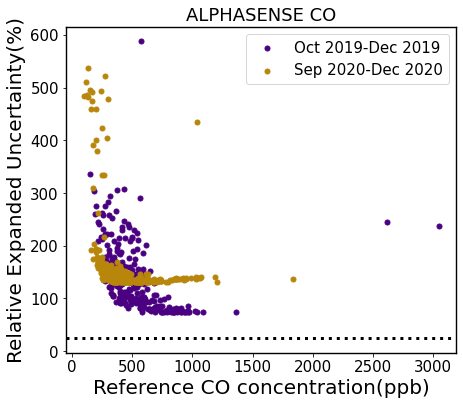

In [65]:
Time=data_CO['Time'].to_list()
lab1=data_CO['LCS (ppb)'].to_list()[:245]
ref1=data_CO['Reference (ppb)'].to_list()[:245]
lab2=data_CO['LCS (ppb)'].to_list()[245:480]
ref2=data_CO['Reference (ppb)'].to_list()[245:480]
lab3=data_CO['LCS (ppb)'].to_list()[480:len(Time)]
ref3=data_CO['Reference (ppb)'].to_list()[480:len(Time)]

import matplotlib.pyplot as plt
u_cal1=REF(lab1,ref1,1.4)[0]
u_cal2=REF(lab2,ref2,1.4)[0]
u_cal3=REF(lab3,ref3,1.4)[0]
fig= plt.figure(figsize=(7,6))
ax = fig.add_subplot(111)
#ax.patch.set_facecolor('lightblue')
#ax.patch.set_alpha(0.1)
ind=[]
U_cal1=[]
Ref1=[]
U_cal2=[]
Ref2=[]
U_cal3=[]
Ref3=[]
for i in range(len(lab1)):
    if u_cal1[i]<1000:
        U_cal1.append(u_cal1[i])
        Ref1.append(lab1[i])
for i in range(len(lab2)):
    if u_cal2[i]<1000:
        U_cal2.append(u_cal2[i])
        Ref2.append(lab2[i])
for i in range(len(lab3)):
    if u_cal3[i]<1000:
        U_cal3.append(u_cal3[i])
        Ref3.append(lab3[i])

plt.scatter(Ref1,U_cal1, color='#4B0082',marker='.',s=100)
#plt.scatter(Ref2,U_cal2, color='teal',marker='.',s=50)
plt.scatter(Ref3,U_cal3, color='darkgoldenrod',marker='.',s=100)
dqo=[25 for i in range(len(Ref1))]
Time=np.array(data_CO['Time'].to_list())
color_map = plt.cm.get_cmap('brg')
reversed_color_map = color_map
#plt.scatter(Ref,U_cal,marker='.',s=100,c=Time,cmap=reversed_color_map)

plt.ylabel('Relative Expanded Uncertainty(%)', fontsize=20)
#plt.ylabel(r'$H_{2}$', fontsize=24)
plt.xlabel('Reference CO concentration(ppb)',fontsize=20)
plt.legend(['Oct 2019-Dec 2019','Sep 2020-Dec 2020'], fontsize=15)
plt.axhline(y=25, color='black', linestyle=':',linewidth=3)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
#plt.grid(linestyle='-.',linewidth=0.1)
plt.setp(ax.spines.values(), linewidth=1.4)
plt.title('ALPHASENSE CO',fontsize=18)
plt.savefig("CO_DQO.pdf",format="pdf", bbox_inches="tight",dpi=1000)
plt.show()

In [66]:
A=[[Ref1[i],U_cal1[i]] for i in range(len(Ref1))]
df1= pd.DataFrame (A, columns = ['Conc', 'REU'])
df1.head()
df1.to_csv('oct2019_dec2019_Alphasense.csv')

In [67]:
B=[[Ref3[i],U_cal3[i]] for i in range(len(Ref3))]
df2= pd.DataFrame (B, columns = ['Conc', 'REU'])
df2.head()
df2.to_csv('sep2020_dec2020_Alphasense.csv')

In [12]:
Data1=[[Ref1[i], U_cal1[i]] for i in range(len(Ref1))]
A_CO_2019= pd.DataFrame(Data1, columns=['Ref_conc', 'REU'])
A_CO_2019.to_excel("A_CO_2019.xlsx")

Data2=[[Ref3[i], U_cal3[i]] for i in range(len(Ref3))]
A_CO_2020= pd.DataFrame(Data2, columns=['Ref_conc', 'REU'])
A_CO_2020.to_excel("A_CO_2020.xlsx")


# NO2 #

def REF(pred,y_test,alpha):
    import random
    import numpy as np
    cal=np.array(pred)
    ref=np.array(y_test)
    ref_mean=np.mean(ref)
    cal_mean=np.mean(cal)
    prec=np.array([0.4 for i in range(len(ref))])
    u=np.maximum(prec,0.005*ref)
    #cal=np.log(cal)
    #ref=np.log(ref)
    sx_s=(1/len(ref))*sum((ref-ref_mean)**2)
    sy_s=(1/len(cal))*sum((cal-cal_mean)**2)
    sxy=(1/len(cal))*sum((cal-cal_mean)*(ref-ref_mean))
    beta_1=((sy_s-alpha*sx_s)+np.sqrt((sy_s-sx_s)**2+4*alpha*sxy**2))/(2*sxy)
    beta_0=cal_mean-beta_1*ref_mean
    RSS=sum((cal-beta_0-beta_1*ref)**2-(beta_1**2+alpha)*u**2)
    du_s=RSS/(len(cal)-2)
    Beta_1=((sy_s-alpha*sx_s-du_s)+np.sqrt((sy_s-alpha*sx_s-du_s)**2+4*alpha*sxy**2))/(2*sxy)
    Beta_0=cal_mean-Beta_1*ref_mean
    print(Beta_0, Beta_1)
    P1=(RSS/(len(cal)-2))
    P2=(Beta_1**2+alpha)*u**2+(-2*Beta_1**2+2*Beta_1-1)*u**2
    P3=(Beta_0+(Beta_1-1)*ref)**2
    P=[]
    for i in range(len(P3)):
        P.append(P1+P2[i]+P3[i])
    for i in range(len(P)):
        if P[i]<0:
            P[i]=random.randint(1,100)
    u_cal=(2*np.sqrt(np.array(P))/ref)*100
    #u_cal=((2*np.sqrt((RSS/(len(cal)-2))+(1-(beta_1-1)**2)*(0.08*ref)**2+(Beta_0+(Beta_1-1)*ref)**2))/cal)*100
    return u_cal  

In [13]:
import pandas as pd
data_NO2=pd.read_excel('final_data.xlsx', engine='openpyxl', sheet_name='NO2')
data_NO2

,LCS (ppb),Reference (ppb),Precision (0.5% of reading),precision (0.4 ppb),Greater,λ,time,time matlab
0,16.194840,9.928468,0.049642,0.4,0.400000,37.500000,'02-Oct-2019 12:00:00',737700.500000
1,6.764827,15.201376,0.076007,0.4,0.400000,37.500000,'02-Oct-2019 13:00:00',737700.541667
2,11.775937,12.957107,0.064786,0.4,0.400000,37.500000,'02-Oct-2019 16:00:00',737700.666667
3,29.961170,14.371937,0.071860,0.4,0.400000,37.500000,'03-Oct-2019 16:00:00',737701.666667
4,10.069838,17.249565,0.086248,0.4,0.400000,37.500000,'07-Oct-2019 14:00:00',737705.583333
...,...,...,...,...,...,...,...,...
3985,33.705730,22.192404,0.110962,0.4,0.400000,37.500000,'19-Oct-2020 14:00:00',738083.583333
3986,0.403924,94.531614,0.472658,0.4,0.472658,31.735415,'13-Nov-2020 20:00:00',738108.833333
3987,0.828964,88.008742,0.440044,0.4,0.440044,34.087523,'23-Nov-2020 17:00:00',738118.708333
3988,6.752765,97.479861,0.487399,0.4,0.487399,30.775588,'23-Nov-2020 18:00:00',738118.750000


In [14]:
lab=data_NO2['LCS (ppb)'].to_list()
ref=data_NO2['Reference (ppb)'].to_list()
u_cal=REF(lab,ref,1.4)[0]

In [55]:
Time=data_NO2['time'].to_list()
Time[3360]

"'20-Apr-2020 08:00:00'"

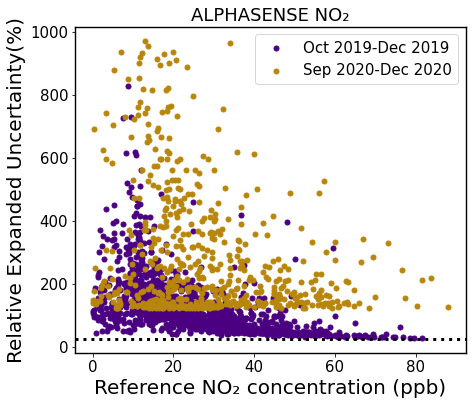

In [70]:
SUB = str.maketrans("0123456789", "₀₁₂₃₄₅₆₇₈₉")
SUP = str.maketrans("0123456789", "⁰¹²³⁴⁵⁶⁷⁸⁹")
Time=data_NO2['time'].to_list()
lab1=data_NO2['LCS (ppb)'].to_list()[:1650]
ref1=data_NO2['Reference (ppb)'].to_list()[:1650]
lab2=data_NO2['LCS (ppb)'].to_list()[1650:3360]
ref2=data_NO2['Reference (ppb)'].to_list()[1650:3360]
lab3=data_NO2['LCS (ppb)'].to_list()[3360:len(Time)]
ref3=data_NO2['Reference (ppb)'].to_list()[3360:len(Time)]

import matplotlib.pyplot as plt
u_cal1=REF(lab1,ref1,1.3)[0]
u_cal2=REF(lab2,ref2,1.3)[0]
u_cal3=REF(lab3,ref3,1.3)[0]
fig= plt.figure(figsize=(7,6))
ax = fig.add_subplot(111)
#ax.patch.set_facecolor('lightblue')
#ax.patch.set_alpha(0.1)
ind=[]
U_cal1=[]
Ref1=[]
U_cal2=[]
Ref2=[]
U_cal3=[]
Ref3=[]
for i in range(len(lab1)):
    if u_cal1[i]<1000:
        U_cal1.append(u_cal1[i])
        Ref1.append(lab1[i])
for i in range(len(lab2)):
    if u_cal2[i]<1000:
        U_cal2.append(u_cal2[i])
        Ref2.append(lab2[i])
for i in range(len(lab3)):
    if u_cal3[i]<1000:
        U_cal3.append(u_cal3[i])
        Ref3.append(lab3[i])

dqo=[25 for i in range(len(Ref1))]
plt.scatter(Ref1,U_cal1, color='#4B0082',marker='.',s=100)
#plt.scatter(Ref2,U_cal2, color='teal',marker='.',s=50)
plt.scatter(Ref3,U_cal3, color='darkgoldenrod',marker='.',s=100)
Time=np.array(data_CO['Time'].to_list())
color_map = plt.cm.get_cmap('brg')
reversed_color_map = color_map
#plt.scatter(Ref,U_cal,marker='.',s=100,c=Time,cmap=reversed_color_map)
plt.ylabel('Relative Expanded Uncertainty(%)', fontsize=20)
#plt.ylabel(r'$H_{2}$', fontsize=24)
plt.xlabel('Reference NO2 concentration (ppb)'.translate(SUB),fontsize=20)
plt.legend(['Oct 2019-Dec 2019','Sep 2020-Dec 2020'], fontsize=15)
plt.axhline(y=25, color='black', linestyle=':',linewidth=3)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.setp(ax.spines.values(), linewidth=1.4)
#plt.grid(linestyle='-.',linewidth=0.1)
#plt.title('LAB',fontsize=18)
plt.title('ALPHASENSE NO2'.translate(SUB),fontsize=18)
plt.savefig("NO2_DQO.pdf",format="pdf", bbox_inches="tight",dpi=1000)
plt.show()

In [23]:
Data1=[[Ref1[i], U_cal1[i]] for i in range(len(Ref1))]
A_CO_2019= pd.DataFrame(Data1, columns=['Ref_conc', 'REU'])
A_CO_2019.to_excel("A_NO2_2019.xlsx")

Data2=[[Ref3[i], U_cal3[i]] for i in range(len(Ref3))]
A_CO_2020= pd.DataFrame(Data2, columns=['Ref_conc', 'REU'])
A_CO_2020.to_excel("A_NO2_2020.xlsx")

# O3 #

def REF(pred,y_test,alpha):
    import random
    import numpy as np
    cal=np.array(pred)
    ref=np.array(y_test)
    ref_mean=np.mean(ref)
    cal_mean=np.mean(cal)
    prec=np.array([1 for i in range(len(ref))])
    u=prec
    #cal=np.log(cal)
    #ref=np.log(ref)
    sx_s=(1/len(ref))*sum((ref-ref_mean)**2)
    sy_s=(1/len(cal))*sum((cal-cal_mean)**2)
    sxy=(1/len(cal))*sum((cal-cal_mean)*(ref-ref_mean))
    beta_1=((sy_s-alpha*sx_s)+np.sqrt((sy_s-sx_s)**2+4*alpha*sxy**2))/(2*sxy)
    beta_0=cal_mean-beta_1*ref_mean
    RSS=sum((cal-beta_0-beta_1*ref)**2-(beta_1**2+alpha)*u**2)
    du_s=RSS/(len(cal)-2)
    Beta_1=((sy_s-alpha*sx_s-du_s)+np.sqrt((sy_s-alpha*sx_s-du_s)**2+4*alpha*sxy**2))/(2*sxy)
    Beta_0=cal_mean-Beta_1*ref_mean
    P1=(RSS/(len(cal)-2))
    P2=(Beta_1**2+alpha)*u**2+(-2*Beta_1**2+2*Beta_1-1)*u**2
    P3=(Beta_0+(Beta_1-1)*ref)**2
    P=[]
    for i in range(len(P3)):
        P.append(P1+P2[i]+P3[i])
    for i in range(len(P)):
        if P[i]<0:
            P[i]=random.randint(1,100)
    u_cal=(2*np.sqrt(np.array(P))/ref)*100
    #u_cal=((2*np.sqrt((RSS/(len(cal)-2))+(1-(beta_1-1)**2)*(0.08*ref)**2+(Beta_0+(Beta_1-1)*ref)**2))/cal)*100
    return u_cal  

In [15]:
import pandas as pd
data_O3=pd.read_excel('final_data.xlsx', engine='openpyxl', sheet_name='O3')
data_O3

,LCS (ppb),Reference (ppb),λ (15/1),time,time matlab
0,214.299967,33.131701,15,'03-Oct-2019 16:00:00',737701.666667
1,188.838900,42.068068,15,'07-Oct-2019 11:00:00',737705.458333
2,116.414713,42.201664,15,'07-Oct-2019 12:00:00',737705.500000
3,183.507622,46.237601,15,'07-Oct-2019 13:00:00',737705.541667
4,217.139469,40.835853,15,'07-Oct-2019 14:00:00',737705.583333
...,...,...,...,...,...
5043,77.083326,40.420060,15,'31-Dec-2020 17:00:00',738156.708333
5044,62.933952,31.160191,15,'31-Dec-2020 18:00:00',738156.750000
5045,58.701665,6.206343,15,'31-Dec-2020 19:00:00',738156.791667
5046,39.480333,5.175187,15,'31-Dec-2020 20:00:00',738156.833333


In [16]:
Time=data_O3['time'].to_list()
Time[3700]

"'30-Apr-2020 18:00:00'"

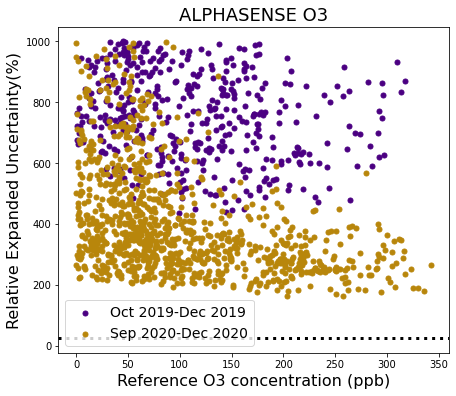

In [18]:
Time=data_O3['time'].to_list()
lab1=data_O3['LCS (ppb)'].to_list()[:1820]
ref1=data_O3['Reference (ppb)'].to_list()[:1820]
lab2=data_O3['LCS (ppb)'].to_list()[1820:3700]
ref2=data_O3['Reference (ppb)'].to_list()[1820:3700]
lab3=data_O3['LCS (ppb)'].to_list()[3700:len(Time)]
ref3=data_O3['Reference (ppb)'].to_list()[3700:len(Time)]

import matplotlib.pyplot as plt
u_cal1=REF(lab1,ref1,1.2)[0]
u_cal2=REF(lab2,ref2,1.2)[0]
u_cal3=REF(lab3,ref3,1.2)[0]
fig= plt.figure(figsize=(7,6))
ax = fig.add_subplot(111)
#ax.patch.set_facecolor('lightblue')
#ax.patch.set_alpha(0.1)
ind=[]
U_cal1=[]
Ref1=[]
U_cal2=[]
Ref2=[]
U_cal3=[]
Ref3=[]
for i in range(len(lab1)):
    if u_cal1[i]<1000:
        U_cal1.append(u_cal1[i])
        Ref1.append(lab1[i])
for i in range(len(lab2)):
    if u_cal2[i]<1000:
        U_cal2.append(u_cal2[i])
        Ref2.append(lab2[i])
for i in range(len(lab3)):
    if u_cal3[i]<1000:
        U_cal3.append(u_cal3[i])
        Ref3.append(lab3[i])

dqo=[25 for i in range(len(Ref1))]
plt.scatter(Ref1,U_cal1, color='#4B0082',marker='.',s=100)
#plt.scatter(Ref2,U_cal2, color='teal',marker='.',s=50)
plt.scatter(Ref3,U_cal3, color='darkgoldenrod',marker='.',s=100)
Time=np.array(data_CO['Time'].to_list())
color_map = plt.cm.get_cmap('brg')
reversed_color_map = color_map
#plt.scatter(Ref,U_cal,marker='.',s=100,c=Time,cmap=reversed_color_map)
plt.ylabel('Relative Expanded Uncertainty(%)', fontsize=16)
#plt.ylabel(r'$H_{2}$', fontsize=24)
plt.xlabel('Reference O3 concentration (ppb)',fontsize=16)
plt.legend(['Oct 2019-Dec 2019','Sep 2020-Dec 2020'], fontsize=14)
plt.axhline(y=25, color='black', linestyle=':',linewidth=3)
#plt.grid(linestyle='-.',linewidth=0.1)
#plt.title('LAB',fontsize=18)
plt.title('ALPHASENSE O3',fontsize=18)
plt.show()

In [19]:
Data1=[[Ref1[i], U_cal1[i]] for i in range(len(Ref1))]
A_CO_2019= pd.DataFrame(Data1, columns=['Ref_conc', 'REU'])
A_CO_2019.to_excel("A_O3_2019.xlsx")

Data2=[[Ref3[i], U_cal3[i]] for i in range(len(Ref3))]
A_CO_2020= pd.DataFrame(Data2, columns=['Ref_conc', 'REU'])
A_CO_2020.to_excel("A_O3_2020.xlsx")

# SO2 #

def REF(pred,y_test,alpha):
    import random
    import numpy as np
    cal=np.array(pred)
    ref=np.array(y_test)
    ref_mean=np.mean(ref)
    cal_mean=np.mean(cal)
    prec=np.array([0.5 for i in range(len(ref))])
    u=np.maximum(prec,0.0015*ref)
    #cal=np.log(cal)
    #ref=np.log(ref)
    sx_s=(1/len(ref))*sum((ref-ref_mean)**2)
    sy_s=(1/len(cal))*sum((cal-cal_mean)**2)
    sxy=(1/len(cal))*sum((cal-cal_mean)*(ref-ref_mean))
    beta_1=((sy_s-alpha*sx_s)+np.sqrt((sy_s-sx_s)**2+4*alpha*sxy**2))/(2*sxy)
    beta_0=cal_mean-beta_1*ref_mean
    RSS=sum((cal-beta_0-beta_1*ref)**2-(beta_1**2+alpha)*u**2)
    du_s=RSS/(len(cal)-2)
    Beta_1=((sy_s-alpha*sx_s-du_s)+np.sqrt((sy_s-alpha*sx_s-du_s)**2+4*alpha*sxy**2))/(2*sxy)
    Beta_0=cal_mean-Beta_1*ref_mean
    P1=(RSS/(len(cal)-2))
    P2=(Beta_1**2+alpha)*u**2+(-2*Beta_1**2+2*Beta_1-1)*u**2
    P3=(Beta_0+(Beta_1-1)*ref)**2
    P=[]
    for i in range(len(P3)):
        P.append(P1+P2[i]+P3[i])
    for i in range(len(P)):
        if P[i]<0:
            P[i]=random.randint(1,100)
    u_cal=(2*np.sqrt(np.array(P))/ref)*100
    #u_cal=((2*np.sqrt((RSS/(len(cal)-2))+(1-(beta_1-1)**2)*(0.08*ref)**2+(Beta_0+(Beta_1-1)*ref)**2))/cal)*100
    return u_cal  

In [20]:
import pandas as pd
data_SO2=pd.read_excel('final_data.xlsx', engine='openpyxl', sheet_name='SO2')
data_SO2

,LCS (ppb),Reference (ppb),Precision (0.15% of reading),precision (0.5 ppb),Greater,λ,time,time matlab
0,127.493863,1.497022,0.002246,0.5,0.5,30,'02-Oct-2019 13:00:00',737700.541667
1,40.588564,1.421115,0.002132,0.5,0.5,30,'03-Oct-2019 16:00:00',737701.666667
2,11.067794,2.093634,0.003140,0.5,0.5,30,'07-Oct-2019 11:00:00',737705.458333
3,15.251380,1.696417,0.002545,0.5,0.5,30,'07-Oct-2019 12:00:00',737705.500000
4,32.710258,1.416432,0.002125,0.5,0.5,30,'07-Oct-2019 13:00:00',737705.541667
...,...,...,...,...,...,...,...,...
3859,42.057006,2.799977,0.004200,0.5,0.5,30,'31-Dec-2020 19:00:00',738156.791667
3860,76.261634,3.763351,0.005645,0.5,0.5,30,'31-Dec-2020 20:00:00',738156.833333
3861,137.039708,4.248347,0.006373,0.5,0.5,30,'31-Dec-2020 21:00:00',738156.875000
3862,98.341529,2.554624,0.003832,0.5,0.5,30,'31-Dec-2020 23:00:00',738156.958333


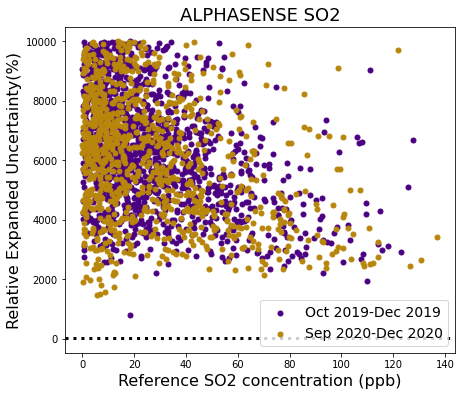

In [21]:
Time=data_SO2['time'].to_list()
lab1=data_SO2['LCS (ppb)'].to_list()[:1750]
ref1=data_SO2['Reference (ppb)'].to_list()[:1750]
lab2=data_SO2['LCS (ppb)'].to_list()[1750:2520]
ref2=data_SO2['Reference (ppb)'].to_list()[1750:2520]
lab3=data_SO2['LCS (ppb)'].to_list()[2520:len(Time)]
ref3=data_SO2['Reference (ppb)'].to_list()[2520:len(Time)]

import matplotlib.pyplot as plt
u_cal1=REF(lab1,ref1,3.9)[0]
u_cal2=REF(lab2,ref2,3.9)[0]
u_cal3=REF(lab3,ref3,3.9)[0]
fig= plt.figure(figsize=(7,6))
ax = fig.add_subplot(111)
#ax.patch.set_facecolor('lightblue')
#ax.patch.set_alpha(0.1)
ind=[]
U_cal1=[]
Ref1=[]
U_cal2=[]
Ref2=[]
U_cal3=[]
Ref3=[]
for i in range(len(lab1)):
    if u_cal1[i]<10000:
        U_cal1.append(u_cal1[i])
        Ref1.append(lab1[i])
for i in range(len(lab2)):
    if u_cal2[i]<10000:
        U_cal2.append(u_cal2[i])
        Ref2.append(lab2[i])
for i in range(len(lab3)):
    if u_cal3[i]<10000:
        U_cal3.append(u_cal3[i])
        Ref3.append(lab3[i])

dqo=[25 for i in range(len(Ref1))]
plt.scatter(Ref1,U_cal1, color='#4B0082',marker='.',s=100)
#plt.scatter(Ref2,U_cal2, color='teal',marker='.',s=50)
plt.scatter(Ref3,U_cal3, color='darkgoldenrod',marker='.',s=100)
Time=np.array(data_CO['Time'].to_list())
color_map = plt.cm.get_cmap('brg')
reversed_color_map = color_map
#plt.scatter(Ref,U_cal,marker='.',s=100,c=Time,cmap=reversed_color_map)
plt.ylabel('Relative Expanded Uncertainty(%)', fontsize=16)
#plt.ylabel(r'$H_{2}$', fontsize=24)
plt.xlabel('Reference SO2 concentration (ppb)',fontsize=16)
plt.legend(['Oct 2019-Dec 2019','Sep 2020-Dec 2020'], fontsize=14)
plt.axhline(y=25, color='black', linestyle=':',linewidth=3)
#plt.grid(linestyle='-.',linewidth=0.1)
#plt.title('LAB',fontsize=18)
plt.title('ALPHASENSE SO2',fontsize=18)
plt.show()

In [22]:
Data1=[[Ref1[i], U_cal1[i]] for i in range(len(Ref1))]
A_CO_2019= pd.DataFrame(Data1, columns=['Ref_conc', 'REU'])
A_CO_2019.to_excel("A_SO2_2019.xlsx")

Data2=[[Ref3[i], U_cal3[i]] for i in range(len(Ref3))]
A_CO_2020= pd.DataFrame(Data2, columns=['Ref_conc', 'REU'])
A_CO_2020.to_excel("A_SO2_2020.xlsx")

# WINSEN #

## CO ##

In [74]:
import pandas as pd
data_CO=pd.read_excel('final_data.xlsx', engine='openpyxl', sheet_name='Winsen_CO')
data_CO['Time'] = pd.to_datetime(data_CO['time'])
data_CO=data_CO.set_index('Time')
data_CO['time']=data_CO.index
data_CO=data_CO.resample('8h').mean()
data_CO=data_CO.dropna()
data_CO

,LCS (ppb),Reference (ppb),Precision (0.1% of reading),precision (20ppb),Greater,λ (150ug/m³/20),time matlab
Time,,,,,,,
2019-10-02 08:00:00,1289.544041,260.755777,0.260756,20.0,20.0,6.55,737700.541667
2019-10-02 16:00:00,541.674116,277.198132,0.277198,20.0,20.0,6.55,737700.812500
2019-10-03 00:00:00,406.570201,348.476939,0.348477,20.0,20.0,6.55,737701.145833
2019-10-03 08:00:00,520.689150,371.876507,0.371877,20.0,20.0,6.55,737701.375000
2019-10-03 16:00:00,446.460077,274.579088,0.274579,20.0,20.0,6.55,737701.812500
...,...,...,...,...,...,...,...
2020-09-22 16:00:00,199.643009,685.446322,0.685446,20.0,20.0,6.55,738056.791667
2020-10-19 08:00:00,265.076424,523.927256,0.523927,20.0,20.0,6.55,738083.583333
2020-11-11 08:00:00,299.844383,954.393505,0.954394,20.0,20.0,6.55,738106.541667


def REF(pred,y_test,alpha):
    import random
    import numpy as np
    cal=np.array(pred)
    ref=np.array(y_test)
    ref_mean=np.mean(ref)
    cal_mean=np.mean(cal)
    prec=np.array([20 for i in range(len(ref))])
    u=np.maximum(prec,0.001*ref)
    #cal=np.log(cal)
    #ref=np.log(ref)
    sx_s=(1/len(ref))*sum((ref-ref_mean)**2)
    sy_s=(1/len(cal))*sum((cal-cal_mean)**2)
    sxy=(1/len(cal))*sum((cal-cal_mean)*(ref-ref_mean))
    beta_1=((sy_s-alpha*sx_s)+np.sqrt((sy_s-sx_s)**2+4*alpha*sxy**2))/(2*sxy)
    beta_0=cal_mean-beta_1*ref_mean
    RSS=sum((cal-beta_0-beta_1*ref)**2-(beta_1**2+alpha)*u**2)
    du_s=RSS/(len(cal)-2)
    Beta_1=((sy_s-alpha*sx_s-du_s)+np.sqrt((sy_s-alpha*sx_s-du_s)**2+4*alpha*sxy**2))/(2*sxy)
    Beta_0=cal_mean-Beta_1*ref_mean
    print(Beta_0,Beta_1)
    P1=(RSS/(len(cal)-2))
    P2=(Beta_1**2+alpha)*u**2+(-2*Beta_1**2+2*Beta_1-1)*u**2
    P3=(Beta_0+(Beta_1-1)*ref)**2
    P=[]
    for i in range(len(P3)):
        P.append(P1+P2[i]+P3[i])
    for i in range(len(P)):
        if P[i]<0:
            P[i]=random.randint(1,100)
    u_cal=(2*np.sqrt(np.array(P))/ref)*100
    #u_cal=((2*np.sqrt((RSS/(len(cal)-2))+(1-(beta_1-1)**2)*(0.08*ref)**2+(Beta_0+(Beta_1-1)*ref)**2))/cal)*100
    return u_cal  

In [82]:
lab=data_CO['LCS (ppb)'].to_list()
ref=data_CO['Reference (ppb)'].to_list()
u_cal=REF(lab,ref,1.4)

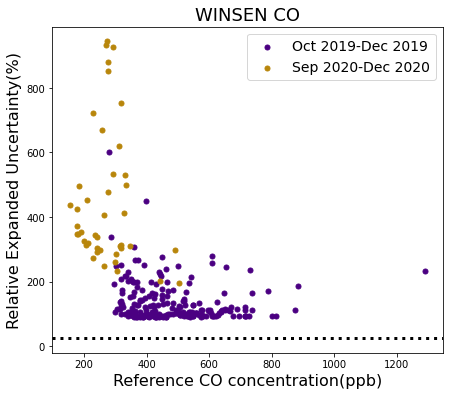

In [83]:
Time=data_CO.index
lab1=data_CO['LCS (ppb)'].to_list()[:int(1730/8)]
ref1=data_CO['Reference (ppb)'].to_list()[:int(1730/8)]
lab2=data_CO['LCS (ppb)'].to_list()[int(1730/8):int(3590/8)]
ref2=data_CO['Reference (ppb)'].to_list()[int(1730/8):int(3590/8)]
lab3=data_CO['LCS (ppb)'].to_list()[int(3590/8):len(Time)]
ref3=data_CO['Reference (ppb)'].to_list()[int(3590/8):len(Time)]

import matplotlib.pyplot as plt
u_cal1=REF(lab1,ref1,1.4)[0]
u_cal2=REF(lab2,ref2,1.4)[0]
u_cal3=REF(lab3,ref3,1.4)[0]
fig= plt.figure(figsize=(7,6))
ax = fig.add_subplot(111)
#ax.patch.set_facecolor('lightblue')
#ax.patch.set_alpha(0.1)
ind=[]
U_cal1=[]
Ref1=[]
U_cal2=[]
Ref2=[]
U_cal3=[]
Ref3=[]
for i in range(len(lab1)):
    if u_cal1[i]<1000:
        U_cal1.append(u_cal1[i])
        Ref1.append(lab1[i])
for i in range(len(lab2)):
    if u_cal2[i]<1000:
        U_cal2.append(u_cal2[i])
        Ref2.append(lab2[i])
for i in range(len(lab3)):
    if u_cal3[i]<1000:
        U_cal3.append(u_cal3[i])
        Ref3.append(lab3[i])

plt.scatter(Ref1,U_cal1, color='#4B0082',marker='.',s=100)
#plt.scatter(Ref2,U_cal2, color='teal',marker='.',s=50)
plt.scatter(Ref3,U_cal3, color='darkgoldenrod',marker='.',s=100)
dqo=[25 for i in range(len(Ref1))]
#Time=np.array(data_CO['Time'].to_list())
color_map = plt.cm.get_cmap('brg')
reversed_color_map = color_map
#plt.scatter(Ref,U_cal,marker='.',s=100,c=Time,cmap=reversed_color_map)

plt.ylabel('Relative Expanded Uncertainty(%)', fontsize=16)
#plt.ylabel(r'$H_{2}$', fontsize=24)
plt.xlabel('Reference CO concentration(ppb)',fontsize=16)
plt.legend(['Oct 2019-Dec 2019','Sep 2020-Dec 2020'], fontsize=14)
plt.axhline(y=25, color='black', linestyle=':',linewidth=3)
#plt.grid(linestyle='-.',linewidth=0.1)
#plt.title('LAB',fontsize=18)
plt.title('WINSEN CO',fontsize=18)
plt.show()

In [84]:
A=[[Ref1[i],U_cal1[i]] for i in range(len(Ref1))]
df1= pd.DataFrame (A, columns = ['Conc', 'REU'])
df1.head()
df1.to_csv('oct2019_dec2019_Winsen.csv')

In [85]:
B=[[Ref3[i],U_cal3[i]] for i in range(len(Ref3))]
df2= pd.DataFrame (B, columns = ['Conc', 'REU'])
df2.head()
df2.to_csv('Sep2020_dec2020_Winsen.csv')

In [27]:
Data1=[[Ref1[i], U_cal1[i]] for i in range(len(Ref1))]
W_CO_2019= pd.DataFrame(Data1, columns=['Ref_conc', 'REU'])
W_CO_2019.to_excel("W_CO_2019.xlsx")

Data2=[[Ref3[i], U_cal3[i]] for i in range(len(Ref3))]
W_CO_2020= pd.DataFrame(Data2, columns=['Ref_conc', 'REU'])
W_CO_2020.to_excel("W_CO_2020.xlsx")

## NO2 ##

In [28]:
import pandas as pd
data_NO2=pd.read_excel('final_data.xlsx', engine='openpyxl', sheet_name='Winsen_NO2')
data_NO2

,LCS (ppb),Reference (ppb),Precision (0.5% of reading),precision (0.4 ppb),Greater,λ (16ppb/greater),time,time matlab
0,13.323120,15.201376,0.076007,0.4,0.4,40.0,'02-Oct-2019 13:00:00',737700.541667
1,12.327343,12.957107,0.064786,0.4,0.4,40.0,'02-Oct-2019 16:00:00',737700.666667
2,26.489319,18.323288,0.091616,0.4,0.4,40.0,'02-Oct-2019 17:00:00',737700.708333
3,65.603944,17.013020,0.085065,0.4,0.4,40.0,'02-Oct-2019 18:00:00',737700.750000
4,65.548064,15.687344,0.078437,0.4,0.4,40.0,'02-Oct-2019 19:00:00',737700.791667
...,...,...,...,...,...,...,...,...
3895,62.780645,78.186127,0.390931,0.4,0.4,40.0,'11-Nov-2020 21:00:00',738106.875000
3896,52.163399,65.764299,0.328821,0.4,0.4,40.0,'11-Nov-2020 22:00:00',738106.916667
3897,46.287582,55.861265,0.279306,0.4,0.4,40.0,'11-Nov-2020 23:00:00',738106.958333
3898,41.986577,51.477190,0.257386,0.4,0.4,40.0,'12-Nov-2020 00:00:00',738107.000000


def REF(pred,y_test,alpha):
    import random
    import numpy as np
    cal=np.array(pred)
    ref=np.array(y_test)
    ref_mean=np.mean(ref)
    cal_mean=np.mean(cal)
    prec=np.array([0.4 for i in range(len(ref))])
    u=np.maximum(prec,0.005*ref)
    #cal=np.log(cal)
    #ref=np.log(ref)
    sx_s=(1/len(ref))*sum((ref-ref_mean)**2)
    sy_s=(1/len(cal))*sum((cal-cal_mean)**2)
    sxy=(1/len(cal))*sum((cal-cal_mean)*(ref-ref_mean))
    beta_1=((sy_s-alpha*sx_s)+np.sqrt((sy_s-sx_s)**2+4*alpha*sxy**2))/(2*sxy)
    beta_0=cal_mean-beta_1*ref_mean
    RSS=sum((cal-beta_0-beta_1*ref)**2-(beta_1**2+alpha)*u**2)
    du_s=RSS/(len(cal)-2)
    Beta_1=((sy_s-alpha*sx_s-du_s)+np.sqrt((sy_s-alpha*sx_s-du_s)**2+4*alpha*sxy**2))/(2*sxy)
    Beta_0=cal_mean-Beta_1*ref_mean
    print(Beta_0,Beta_1)
    P1=(RSS/(len(cal)-2))
    P2=(Beta_1**2+alpha)*u**2+(-2*Beta_1**2+2*Beta_1-1)*u**2
    P3=(Beta_0+(Beta_1-1)*ref)**2
    P=[]
    for i in range(len(P3)):
        P.append(P1+P2[i]+P3[i])
    for i in range(len(P)):
        if P[i]<0:
            P[i]=random.randint(1,100)
    u_cal=(2*np.sqrt(np.array(P))/ref)*100
    #u_cal=((2*np.sqrt((RSS/(len(cal)-2))+(1-(beta_1-1)**2)*(0.08*ref)**2+(Beta_0+(Beta_1-1)*ref)**2))/cal)*100
    return u_cal  

In [29]:
Time=data_NO2['time'].to_list()
Time[3700]

"'31-Mar-2020 22:00:00'"

In [30]:
lab=data_NO2['LCS (ppb)'].to_list()
ref=data_NO2['Reference (ppb)'].to_list()
u_cal=REF(lab,ref,1.4)

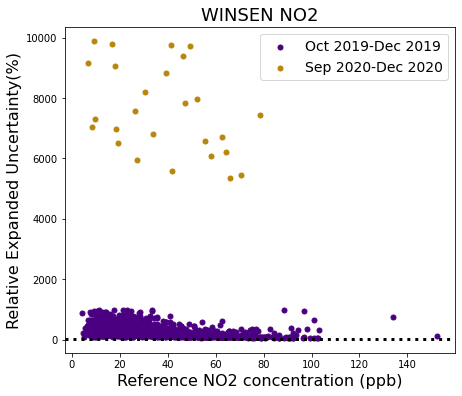

In [32]:
Time=data_NO2['time'].to_list()
lab1=data_NO2['LCS (ppb)'].to_list()[:1750]
ref1=data_NO2['Reference (ppb)'].to_list()[:1750]
lab2=data_NO2['LCS (ppb)'].to_list()[1750:3700]
ref2=data_NO2['Reference (ppb)'].to_list()[1750:3700]
lab3=data_NO2['LCS (ppb)'].to_list()[3700:len(Time)]
ref3=data_NO2['Reference (ppb)'].to_list()[3700:len(Time)]

import matplotlib.pyplot as plt
u_cal1=REF(lab1,ref1,1.3)[0]
u_cal2=REF(lab2,ref2,1.3)[0]
u_cal3=REF(lab3,ref3,1.3)[0]
fig= plt.figure(figsize=(7,6))
ax = fig.add_subplot(111)
#ax.patch.set_facecolor('lightblue')
#ax.patch.set_alpha(0.1)
ind=[]
U_cal1=[]
Ref1=[]
U_cal2=[]
Ref2=[]
U_cal3=[]
Ref3=[]
for i in range(len(lab1)):
    if u_cal1[i]<1000:
        U_cal1.append(u_cal1[i])
        Ref1.append(lab1[i])
for i in range(len(lab2)):
    if u_cal2[i]<1000:
        U_cal2.append(u_cal2[i])
        Ref2.append(lab2[i])
for i in range(len(lab3)):
    if u_cal3[i]<10000:
        U_cal3.append(u_cal3[i])
        Ref3.append(lab3[i])

dqo=[25 for i in range(len(Ref1))]
plt.scatter(Ref1,U_cal1, color='#4B0082',marker='.',s=100)
#plt.scatter(Ref2,U_cal2, color='teal',marker='.',s=50)
plt.scatter(Ref3,U_cal3, color='darkgoldenrod',marker='.',s=100)
#Time=np.array(data_CO['Time'].to_list())
color_map = plt.cm.get_cmap('brg')
reversed_color_map = color_map
#plt.scatter(Ref,U_cal,marker='.',s=100,c=Time,cmap=reversed_color_map)
plt.ylabel('Relative Expanded Uncertainty(%)', fontsize=16)
#plt.ylabel(r'$H_{2}$', fontsize=24)
plt.xlabel('Reference NO2 concentration (ppb)',fontsize=16)
plt.legend(['Oct 2019-Dec 2019','Sep 2020-Dec 2020'], fontsize=14)
plt.axhline(y=25, color='black', linestyle=':',linewidth=3)
#plt.grid(linestyle='-.',linewidth=0.1)
#plt.title('LAB',fontsize=18)
plt.title('WINSEN NO2',fontsize=18)
plt.show()

In [33]:
Data1=[[Ref1[i], U_cal1[i]] for i in range(len(Ref1))]
W_CO_2019= pd.DataFrame(Data1, columns=['Ref_conc', 'REU'])
W_CO_2019.to_excel("W_NO2_2019.xlsx")

Data2=[[Ref3[i], U_cal3[i]] for i in range(len(Ref3))]
W_CO_2020= pd.DataFrame(Data2, columns=['Ref_conc', 'REU'])
W_CO_2020.to_excel("W_NO2_2020.xlsx")

## O3 ##

def REF(pred,y_test,alpha):
    import random
    import numpy as np
    cal=np.array(pred)
    ref=np.array(y_test)
    ref_mean=np.mean(ref)
    cal_mean=np.mean(cal)
    prec=np.array([1 for i in range(len(ref))])
    u=prec
    #cal=np.log(cal)
    #ref=np.log(ref)
    sx_s=(1/len(ref))*sum((ref-ref_mean)**2)
    sy_s=(1/len(cal))*sum((cal-cal_mean)**2)
    sxy=(1/len(cal))*sum((cal-cal_mean)*(ref-ref_mean))
    beta_1=((sy_s-alpha*sx_s)+np.sqrt((sy_s-sx_s)**2+4*alpha*sxy**2))/(2*sxy)
    beta_0=cal_mean-beta_1*ref_mean
    RSS=sum((cal-beta_0-beta_1*ref)**2-(beta_1**2+alpha)*u**2)
    du_s=RSS/(len(cal)-2)
    Beta_1=((sy_s-alpha*sx_s-du_s)+np.sqrt((sy_s-alpha*sx_s-du_s)**2+4*alpha*sxy**2))/(2*sxy)
    Beta_0=cal_mean-Beta_1*ref_mean
    P1=(RSS/(len(cal)-2))
    P2=(Beta_1**2+alpha)*u**2+(-2*Beta_1**2+2*Beta_1-1)*u**2
    P3=(Beta_0+(Beta_1-1)*ref)**2
    P=[]
    for i in range(len(P3)):
        P.append(P1+P2[i]+P3[i])
    for i in range(len(P)):
        if P[i]<0:
            P[i]=random.randint(1,100)
    u_cal=(2*np.sqrt(np.array(P))/ref)*100
    #u_cal=((2*np.sqrt((RSS/(len(cal)-2))+(1-(beta_1-1)**2)*(0.08*ref)**2+(Beta_0+(Beta_1-1)*ref)**2))/cal)*100
    return u_cal  

In [34]:
import pandas as pd
data_O3=pd.read_excel('final_data.xlsx', engine='openpyxl', sheet_name='Winsen_O3')
data_O3

,LCS (ppb),Reference (ppb),λ (15.32/1),time,time matlab
0,368.851562,50.451092,15.32,'02-Oct-2019 13:00:00',737700.541667
1,303.401554,38.123551,15.32,'02-Oct-2019 16:00:00',737700.666667
2,23.718667,33.768998,15.32,'02-Oct-2019 17:00:00',737700.708333
3,11.726453,31.920945,15.32,'02-Oct-2019 18:00:00',737700.750000
4,10.227772,30.792659,15.32,'02-Oct-2019 19:00:00',737700.791667
...,...,...,...,...,...
3874,62.780645,1.630323,15.32,'11-Nov-2020 21:00:00',738106.875000
3875,52.163399,1.810759,15.32,'11-Nov-2020 22:00:00',738106.916667
3876,46.287582,1.263596,15.32,'11-Nov-2020 23:00:00',738106.958333
3877,41.986577,0.679273,15.32,'12-Nov-2020 00:00:00',738107.000000


In [35]:
Time=data_O3['time'].to_list()
Time[3660]

"'31-Mar-2020 04:00:00'"

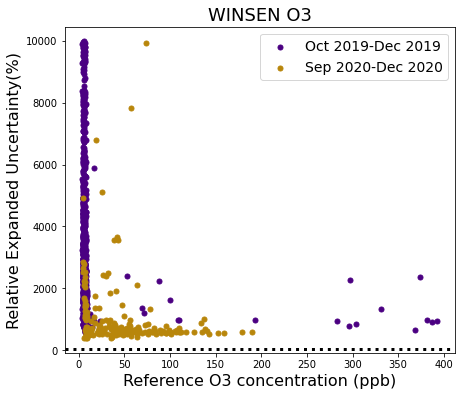

In [37]:
Time=data_O3['time'].to_list()
lab1=data_O3['LCS (ppb)'].to_list()[:1750]
ref1=data_O3['Reference (ppb)'].to_list()[:1750]
lab2=data_O3['LCS (ppb)'].to_list()[1750:3660]
ref2=data_O3['Reference (ppb)'].to_list()[1750:3660]
lab3=data_O3['LCS (ppb)'].to_list()[3660:len(Time)]
ref3=data_O3['Reference (ppb)'].to_list()[3660:len(Time)]

import matplotlib.pyplot as plt
u_cal1=REF(lab1,ref1,1.2)[0]
u_cal2=REF(lab2,ref2,1.2)[0]
u_cal3=REF(lab3,ref3,1.2)[0]
fig= plt.figure(figsize=(7,6))
ax = fig.add_subplot(111)
#ax.patch.set_facecolor('lightblue')
#ax.patch.set_alpha(0.1)
ind=[]
U_cal1=[]
Ref1=[]
U_cal2=[]
Ref2=[]
U_cal3=[]
Ref3=[]
for i in range(len(lab1)):
    if u_cal1[i]<10000:
        U_cal1.append(u_cal1[i])
        Ref1.append(lab1[i])
for i in range(len(lab2)):
    if u_cal2[i]<10000:
        U_cal2.append(u_cal2[i])
        Ref2.append(lab2[i])
for i in range(len(lab3)):
    if u_cal3[i]<10000:
        U_cal3.append(u_cal3[i])
        Ref3.append(lab3[i])

dqo=[25 for i in range(len(Ref1))]
plt.scatter(Ref1,U_cal1, color='#4B0082',marker='.',s=100)
#plt.scatter(Ref2,U_cal2, color='teal',marker='.',s=50)
plt.scatter(Ref3,U_cal3, color='darkgoldenrod',marker='.',s=100)
#Time=np.array(data_CO['Time'].to_list())
color_map = plt.cm.get_cmap('brg')
reversed_color_map = color_map
#plt.scatter(Ref,U_cal,marker='.',s=100,c=Time,cmap=reversed_color_map)
plt.ylabel('Relative Expanded Uncertainty(%)', fontsize=16)
#plt.ylabel(r'$H_{2}$', fontsize=24)
plt.xlabel('Reference O3 concentration (ppb)',fontsize=16)
plt.legend(['Oct 2019-Dec 2019','Sep 2020-Dec 2020'], fontsize=14)
plt.axhline(y=25, color='black', linestyle=':',linewidth=3)
#plt.grid(linestyle='-.',linewidth=0.1)
#plt.title('LAB',fontsize=18)
plt.title('WINSEN O3',fontsize=18)
plt.show()

In [38]:
Data1=[[Ref1[i], U_cal1[i]] for i in range(len(Ref1))]
W_CO_2019= pd.DataFrame(Data1, columns=['Ref_conc', 'REU'])
W_CO_2019.to_excel("W_O3_2019.xlsx")

Data2=[[Ref3[i], U_cal3[i]] for i in range(len(Ref3))]
W_CO_2020= pd.DataFrame(Data2, columns=['Ref_conc', 'REU'])
W_CO_2020.to_excel("W_O3_2020.xlsx")

## SO2 ##

def REF(pred,y_test,alpha):
    import random
    import numpy as np
    cal=np.array(pred)
    ref=np.array(y_test)
    ref_mean=np.mean(ref)
    cal_mean=np.mean(cal)
    prec=np.array([0.5 for i in range(len(ref))])
    u=np.maximum(prec,0.0015*ref)
    #cal=np.log(cal)
    #ref=np.log(ref)
    sx_s=(1/len(ref))*sum((ref-ref_mean)**2)
    sy_s=(1/len(cal))*sum((cal-cal_mean)**2)
    sxy=(1/len(cal))*sum((cal-cal_mean)*(ref-ref_mean))
    beta_1=((sy_s-alpha*sx_s)+np.sqrt((sy_s-sx_s)**2+4*alpha*sxy**2))/(2*sxy)
    beta_0=cal_mean-beta_1*ref_mean
    RSS=sum((cal-beta_0-beta_1*ref)**2-(beta_1**2+alpha)*u**2)
    du_s=RSS/(len(cal)-2)
    Beta_1=((sy_s-alpha*sx_s-du_s)+np.sqrt((sy_s-alpha*sx_s-du_s)**2+4*alpha*sxy**2))/(2*sxy)
    Beta_0=cal_mean-Beta_1*ref_mean
    P1=(RSS/(len(cal)-2))
    P2=(Beta_1**2+alpha)*u**2+(-2*Beta_1**2+2*Beta_1-1)*u**2
    P3=(Beta_0+(Beta_1-1)*ref)**2
    P=[]
    for i in range(len(P3)):
        P.append(P1+P2[i]+P3[i])
    for i in range(len(P)):
        if P[i]<0:
            P[i]=random.randint(1,100)
    u_cal=(2*np.sqrt(np.array(P))/ref)*100
    #u_cal=((2*np.sqrt((RSS/(len(cal)-2))+(1-(beta_1-1)**2)*(0.08*ref)**2+(Beta_0+(Beta_1-1)*ref)**2))/cal)*100
    return u_cal  

In [39]:
import pandas as pd
data_SO2=pd.read_excel('final_data.xlsx', engine='openpyxl', sheet_name='Winsen_SO2')
data_SO2

,LCS (ppb),Reference (ppb),Precision (0.15% of reading),precision (0.5 ppb),Greater,λ,time,time matlab
0,11.128710,1.372090,0.002058,0.5,0.5,22.9,'02-Oct-2019 17:00:00',737700.708333
1,6.919786,1.356229,0.002034,0.5,0.5,22.9,'02-Oct-2019 18:00:00',737700.750000
2,4.836055,1.398902,0.002098,0.5,0.5,22.9,'02-Oct-2019 19:00:00',737700.791667
3,4.464428,1.386293,0.002079,0.5,0.5,22.9,'02-Oct-2019 20:00:00',737700.833333
4,4.000000,1.332889,0.001999,0.5,0.5,22.9,'02-Oct-2019 21:00:00',737700.875000
...,...,...,...,...,...,...,...,...
3883,32.967742,6.150525,0.009226,0.5,0.5,22.9,'11-Nov-2020 21:00:00',738106.875000
3884,29.189542,5.735341,0.008603,0.5,0.5,22.9,'11-Nov-2020 22:00:00',738106.916667
3885,16.516340,4.783810,0.007176,0.5,0.5,22.9,'11-Nov-2020 23:00:00',738106.958333
3886,8.664430,3.684368,0.005527,0.5,0.5,22.9,'12-Nov-2020 00:00:00',738107.000000


In [40]:
Time=data_SO2['time'].to_list()
Time[3690]

"'01-Apr-2020 03:00:00'"

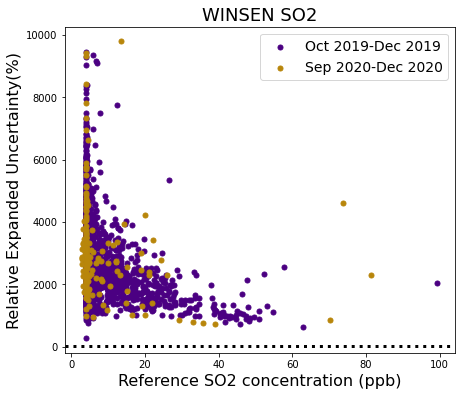

In [42]:
Time=data_SO2['time'].to_list()
lab1=data_SO2['LCS (ppb)'].to_list()[:1750]
ref1=data_SO2['Reference (ppb)'].to_list()[:1750]
lab2=data_SO2['LCS (ppb)'].to_list()[1750:3690]
ref2=data_SO2['Reference (ppb)'].to_list()[1750:3690]
lab3=data_SO2['LCS (ppb)'].to_list()[3690:len(Time)]
ref3=data_SO2['Reference (ppb)'].to_list()[3690:len(Time)]

import matplotlib.pyplot as plt
u_cal1=REF(lab1,ref1,1.3)[0]
u_cal2=REF(lab2,ref2,1.3)[0]
u_cal3=REF(lab3,ref3,1.3)[0]
fig= plt.figure(figsize=(7,6))
ax = fig.add_subplot(111)
#ax.patch.set_facecolor('lightblue')
#ax.patch.set_alpha(0.1)
ind=[]
U_cal1=[]
Ref1=[]
U_cal2=[]
Ref2=[]
U_cal3=[]
Ref3=[]
for i in range(len(lab1)):
    if u_cal1[i]<10000:
        U_cal1.append(u_cal1[i])
        Ref1.append(lab1[i])
for i in range(len(lab2)):
    if u_cal2[i]<10000:
        U_cal2.append(u_cal2[i])
        Ref2.append(lab2[i])
for i in range(len(lab3)):
    if u_cal3[i]<10000:
        U_cal3.append(u_cal3[i])
        Ref3.append(lab3[i])
dqo=[25 for i in range(len(Ref1))]
plt.scatter(Ref1,U_cal1, color='#4B0082',marker='.',s=100)
#plt.scatter(Ref2,U_cal2, color='teal',marker='.',s=50)
plt.scatter(Ref3,U_cal3, color='darkgoldenrod',marker='.',s=100)
#Time=np.array(data_CO['Time'].to_list())
color_map = plt.cm.get_cmap('brg')
reversed_color_map = color_map
#plt.scatter(Ref,U_cal,marker='.',s=100,c=Time,cmap=reversed_color_map)
plt.ylabel('Relative Expanded Uncertainty(%)', fontsize=16)
#plt.ylabel(r'$H_{2}$', fontsize=24)
plt.xlabel('Reference SO2 concentration (ppb)',fontsize=16)
plt.legend(['Oct 2019-Dec 2019','Sep 2020-Dec 2020'], fontsize=14)
plt.axhline(y=25, color='black', linestyle=':',linewidth=3)
#plt.grid(linestyle='-.',linewidth=0.1)
#plt.title('LAB',fontsize=18)
plt.title('WINSEN SO2',fontsize=18)
plt.show()

In [43]:
Data1=[[Ref1[i], U_cal1[i]] for i in range(len(Ref1))]
W_CO_2019= pd.DataFrame(Data1, columns=['Ref_conc', 'REU'])
W_CO_2019.to_excel("W_SO2_2019.xlsx")

Data2=[[Ref3[i], U_cal3[i]] for i in range(len(Ref3))]
W_CO_2020= pd.DataFrame(Data2, columns=['Ref_conc', 'REU'])
W_CO_2020.to_excel("W_SO2_2020.xlsx")